In [1]:
import keras
from keras.datasets import mnist
from keras import backend as K
import pandas as pd
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

Using TensorFlow backend.


In [2]:
sns.set_theme(style="whitegrid")

# Práctica Redes Neuronales II

Primero vamos a usar redes para aprender una función simple: una parábola.

Vamos a usar solo 100 puntos y dividirlos en training y validation

Text(0, 0.5, 'Y')

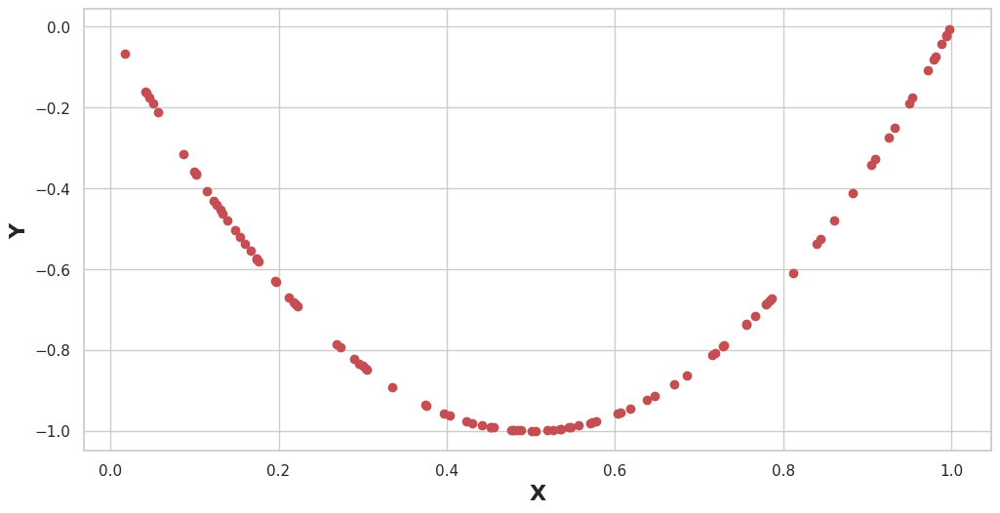

In [3]:
# Genero los puntos
x = np.random.uniform(0, 1, 100)
y = [4 * i * (i - 1) for i in x]

# ploteo
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(x, y, 'or')
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Divido en training y validation set usando train_test_split de sklearn usando 1/3 de puntos como validation

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
X_train, X_validation, y_train, y_validation = train_test_split(
    x, y, test_size=0.33, random_state=42
)

Usamos [Sequential](https://keras.io/api/models/sequential/) de keras para definir un modelo tipo stack de capas: vamos a usar ahora solo capas tipo [Dense](https://keras.io/api/layers/core_layers/dense/)

In [6]:
from keras.models import Sequential
from keras.layers import Dense, Dropout

Usamos para regresiones como activación de la última capa un función de tipo lineal

In [7]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

Luego de definir todas las capas tenemos que compilar el modelo para definir la función de pérdida, el optimizador y la métrica. Esto es necesario para poder después entrenar el modelo.

In [8]:
model.compile(
    loss='mean_squared_error', optimizer="SGD", metrics=['mean_squared_error']
)

Vamos a guardar el [.fit ](https://keras.io/api/models/model_training_apis/) del modelo en una variable para después plotear el aprendizaje. Podemos pasar como parámetros el set de validación para ir evaluando en cada paso del entrenamiento, además de evaluar el de entrenamiento. Podemos cambiar la cantidad de información que nos muestra con verbose y además tenemos que decirle la cantidad de épocas que queremos entrenar.

In [9]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=200,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/200
 - 0s - loss: 0.4638 - mean_squared_error: 0.4638 - val_loss: 0.4192 - val_mean_squared_error: 0.4192


Epoch 2/200
 - 0s - loss: 0.3955 - mean_squared_error: 0.3955 - val_loss: 0.3691 - val_mean_squared_error: 0.3691


Epoch 3/200
 - 0s - loss: 0.3476 - mean_squared_error: 0.3476 - val_loss: 0.3160 - val_mean_squared_error: 0.3160


Epoch 4/200
 - 0s - loss: 0.2980 - mean_squared_error: 0.2980 - val_loss: 0.2833 - val_mean_squared_error: 0.2833


Epoch 5/200
 - 0s - loss: 0.2668 - mean_squared_error: 0.2668 - val_loss: 0.2443 - val_mean_squared_error: 0.2443


Epoch 6/200
 - 0s - loss: 0.2305 - mean_squared_error: 0.2305 - val_loss: 0.2161 - val_mean_squared_error: 0.2161


Epoch 7/200
 - 0s - loss: 0.2046 - mean_squared_error: 0.2046 - val_loss: 0.1993 - val_mean_squared_error: 0.1993


Epoch 8/200
 - 0s - loss: 0.1889 - mean_squared_error: 0.1889 - val_loss: 0.1797 - val_mean_squared_error: 0.1797


Epoch 9/200
 - 0s - loss: 0.1710 - mean_squared_error: 0.1710 - val_loss: 0.1676 - val_mean_squared_error: 0.1676


Epoch 10/200
 - 0s - loss: 0.1600 - mean_squared_error: 0.1600 - val_loss: 0.1590 - val_mean_squared_error: 0.1590


Epoch 11/200
 - 0s - loss: 0.1521 - mean_squared_error: 0.1521 - val_loss: 0.1524 - val_mean_squared_error: 0.1524


Epoch 12/200
 - 0s - loss: 0.1460 - mean_squared_error: 0.1460 - val_loss: 0.1428 - val_mean_squared_error: 0.1428


Epoch 13/200
 - 0s - loss: 0.1373 - mean_squared_error: 0.1373 - val_loss: 0.1331 - val_mean_squared_error: 0.1331


Epoch 14/200
 - 0s - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.1263 - val_mean_squared_error: 0.1263


Epoch 15/200
 - 0s - loss: 0.1227 - mean_squared_error: 0.1227 - val_loss: 0.1207 - val_mean_squared_error: 0.1207


Epoch 16/200
 - 0s - loss: 0.1180 - mean_squared_error: 0.1180 - val_loss: 0.1183 - val_mean_squared_error: 0.1183


Epoch 17/200
 - 0s - loss: 0.1160 - mean_squared_error: 0.1160 - val_loss: 0.1192 - val_mean_squared_error: 0.1192


Epoch 18/200
 - 0s - loss: 0.1165 - mean_squared_error: 0.1165 - val_loss: 0.1169 - val_mean_squared_error: 0.1169


Epoch 19/200


 - 0s - loss: 0.1145 - mean_squared_error: 0.1145 - val_loss: 0.1138 - val_mean_squared_error: 0.1138


Epoch 20/200
 - 0s - loss: 0.1119 - mean_squared_error: 0.1119 - val_loss: 0.1114 - val_mean_squared_error: 0.1114


Epoch 21/200
 - 0s - loss: 0.1099 - mean_squared_error: 0.1099 - val_loss: 0.1103 - val_mean_squared_error: 0.1103


Epoch 22/200
 - 0s - loss: 0.1091 - mean_squared_error: 0.1091 - val_loss: 0.1105 - val_mean_squared_error: 0.1105


Epoch 23/200
 - 0s - loss: 0.1090 - mean_squared_error: 0.1090 - val_loss: 0.1071 - val_mean_squared_error: 0.1071


Epoch 24/200
 - 0s - loss: 0.1063 - mean_squared_error: 0.1063 - val_loss: 0.1060 - val_mean_squared_error: 0.1060


Epoch 25/200
 - 0s - loss: 0.1056 - mean_squared_error: 0.1056 - val_loss: 0.1046 - val_mean_squared_error: 0.1046


Epoch 26/200
 - 0s - loss: 0.1043 - mean_squared_error: 0.1043 - val_loss: 0.1038 - val_mean_squared_error: 0.1038


Epoch 27/200
 - 0s - loss: 0.1037 - mean_squared_error: 0.1037 - val_loss: 0.1027 - val_mean_squared_error: 0.1027


Epoch 28/200
 - 0s - loss: 0.1030 - mean_squared_error: 0.1030 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 29/200
 - 0s - loss: 0.1028 - mean_squared_error: 0.1028 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 30/200


 - 0s - loss: 0.1022 - mean_squared_error: 0.1022 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 31/200


 - 0s - loss: 0.1021 - mean_squared_error: 0.1021 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 32/200


 - 0s - loss: 0.1019 - mean_squared_error: 0.1019 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 33/200


 - 0s - loss: 0.1017 - mean_squared_error: 0.1017 - val_loss: 0.1007 - val_mean_squared_error: 0.1007


Epoch 34/200


 - 0s - loss: 0.1017 - mean_squared_error: 0.1017 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 35/200


 - 0s - loss: 0.1013 - mean_squared_error: 0.1013 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 36/200


 - 0s - loss: 0.1012 - mean_squared_error: 0.1012 - val_loss: 0.0999 - val_mean_squared_error: 0.0999


Epoch 37/200


 - 0s - loss: 0.1012 - mean_squared_error: 0.1012 - val_loss: 0.1001 - val_mean_squared_error: 0.1001


Epoch 38/200
 - 0s - loss: 0.1011 - mean_squared_error: 0.1011 - val_loss: 0.0998 - val_mean_squared_error: 0.0998


Epoch 39/200


 - 0s - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 40/200
 - 0s - loss: 0.1013 - mean_squared_error: 0.1013 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 41/200


 - 0s - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 42/200
 - 0s - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 43/200


 - 0s - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 44/200
 - 0s - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.0999 - val_mean_squared_error: 0.0999


Epoch 45/200


 - 0s - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 46/200


 - 0s - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 47/200


 - 0s - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.1006 - val_mean_squared_error: 0.1006


Epoch 48/200


 - 0s - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 49/200


 - 0s - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 50/200


 - 0s - loss: 0.1007 - mean_squared_error: 0.1007 - val_loss: 0.1005 - val_mean_squared_error: 0.1005


Epoch 51/200
 - 0s - loss: 0.1008 - mean_squared_error: 0.1008 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 52/200


 - 0s - loss: 0.1005 - mean_squared_error: 0.1005 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 53/200
 - 0s - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1008 - val_mean_squared_error: 0.1008


Epoch 54/200


 - 0s - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.1013 - val_mean_squared_error: 0.1013


Epoch 55/200


 - 0s - loss: 0.1009 - mean_squared_error: 0.1009 - val_loss: 0.1005 - val_mean_squared_error: 0.1005


Epoch 56/200


 - 0s - loss: 0.1004 - mean_squared_error: 0.1004 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 57/200
 - 0s - loss: 0.1001 - mean_squared_error: 0.1001 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 58/200


 - 0s - loss: 0.1001 - mean_squared_error: 0.1001 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 59/200


 - 0s - loss: 0.1002 - mean_squared_error: 0.1002 - val_loss: 0.1011 - val_mean_squared_error: 0.1011


Epoch 60/200


 - 0s - loss: 0.1005 - mean_squared_error: 0.1005 - val_loss: 0.1008 - val_mean_squared_error: 0.1008


Epoch 61/200

 - 0s - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.1008 - val_mean_squared_error: 0.1008


Epoch 62/200


 - 0s - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.1007 - val_mean_squared_error: 0.1007


Epoch 63/200


 - 0s - loss: 0.1001 - mean_squared_error: 0.1001 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 64/200


 - 0s - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 65/200


 - 0s - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.1006 - val_mean_squared_error: 0.1006


Epoch 66/200


 - 0s - loss: 0.1000 - mean_squared_error: 0.1000 - val_loss: 0.1011 - val_mean_squared_error: 0.1011


Epoch 67/200


 - 0s - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.1006 - val_mean_squared_error: 0.1006


Epoch 68/200


 - 0s - loss: 0.1000 - mean_squared_error: 0.1000 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 69/200


 - 0s - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 70/200


 - 0s - loss: 0.0998 - mean_squared_error: 0.0998 - val_loss: 0.1001 - val_mean_squared_error: 0.1001


Epoch 71/200


 - 0s - loss: 0.0997 - mean_squared_error: 0.0997 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 72/200


 - 0s - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 73/200


 - 0s - loss: 0.0997 - mean_squared_error: 0.0997 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 74/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 75/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 76/200


 - 0s - loss: 0.0993 - mean_squared_error: 0.0993 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 77/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 78/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 79/200


 - 0s - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 80/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 81/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 82/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 83/200


 - 0s - loss: 0.0993 - mean_squared_error: 0.0993 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 84/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 85/200


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 86/200


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 87/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 88/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 89/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 90/200


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 91/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 92/200


 - 0s - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 93/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0994 - val_mean_squared_error: 0.0994


Epoch 94/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 95/200
 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 96/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 97/200


 - 0s - loss: 0.0995 - mean_squared_error: 0.0995 - val_loss: 0.1007 - val_mean_squared_error: 0.1007


Epoch 98/200


 - 0s - loss: 0.0993 - mean_squared_error: 0.0993 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 99/200


 - 0s - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 100/200


 - 0s - loss: 0.0994 - mean_squared_error: 0.0994 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 101/200


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.1001 - val_mean_squared_error: 0.1001


Epoch 102/200


 - 0s - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 103/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 104/200


 - 0s - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 105/200


 - 0s - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 106/200


 - 0s - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 107/200


 - 0s - loss: 0.0986 - mean_squared_error: 0.0986 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 108/200


 - 0s - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 109/200


 - 0s - loss: 0.0986 - mean_squared_error: 0.0986 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 110/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 111/200


 - 0s - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 112/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 113/200


 - 0s - loss: 0.0995 - mean_squared_error: 0.0995 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 114/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 115/200


 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 116/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 117/200


 - 0s - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 118/200


 - 0s - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 119/200


 - 0s - loss: 0.0982 - mean_squared_error: 0.0982 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 120/200


 - 0s - loss: 0.0981 - mean_squared_error: 0.0981 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 121/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 122/200


 - 0s - loss: 0.0982 - mean_squared_error: 0.0982 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 123/200


 - 0s - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 124/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 125/200


 - 0s - loss: 0.0988 - mean_squared_error: 0.0988 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 126/200


 - 0s - loss: 0.0990 - mean_squared_error: 0.0990 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 127/200


 - 0s - loss: 0.0987 - mean_squared_error: 0.0987 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 128/200


 - 0s - loss: 0.0989 - mean_squared_error: 0.0989 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 129/200


 - 0s - loss: 0.0977 - mean_squared_error: 0.0977 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 130/200


 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 131/200


 - 0s - loss: 0.0977 - mean_squared_error: 0.0977 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 132/200


 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 133/200


 - 0s - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 134/200


 - 0s - loss: 0.0977 - mean_squared_error: 0.0977 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 135/200


 - 0s - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 136/200


 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 137/200


 - 0s - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 138/200


 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 139/200


 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 140/200


 - 0s - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 141/200


 - 0s - loss: 0.0976 - mean_squared_error: 0.0976 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 142/200


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 143/200


 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 144/200


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 145/200


 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 146/200


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 147/200


 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 148/200


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 149/200


 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 150/200


 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 151/200


 - 0s - loss: 0.0972 - mean_squared_error: 0.0972 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 152/200


 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 153/200


 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 154/200


 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 155/200


 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 156/200
 - 0s - loss: 0.0971 - mean_squared_error: 0.0971 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 157/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 158/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 159/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 160/200


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 161/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 162/200


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 163/200


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 164/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 165/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 166/200
 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 167/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 168/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 169/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 170/200


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 171/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 172/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 173/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 174/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 175/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 176/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 177/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 178/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 179/200


 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0991 - val_mean_squared_error: 0.0991


Epoch 180/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 181/200


 - 0s - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 182/200


 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 183/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 184/200


 - 0s - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 185/200


 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 186/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 187/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 188/200


 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 189/200


 - 0s - loss: 0.0968 - mean_squared_error: 0.0968 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 190/200


 - 0s - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 191/200


 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 192/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 193/200


 - 0s - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 194/200


 - 0s - loss: 0.0967 - mean_squared_error: 0.0967 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 195/200


 - 0s - loss: 0.0966 - mean_squared_error: 0.0966 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 196/200


 - 0s - loss: 0.0964 - mean_squared_error: 0.0964 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 197/200


 - 0s - loss: 0.0964 - mean_squared_error: 0.0964 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 198/200


 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 199/200


 - 0s - loss: 0.0963 - mean_squared_error: 0.0963 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 200/200


 - 0s - loss: 0.0964 - mean_squared_error: 0.0964 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Vemos el predict de los puntos de validación y ploteamos

In [10]:
pred = model.predict(X_validation)

Text(0, 0.5, 'Y')

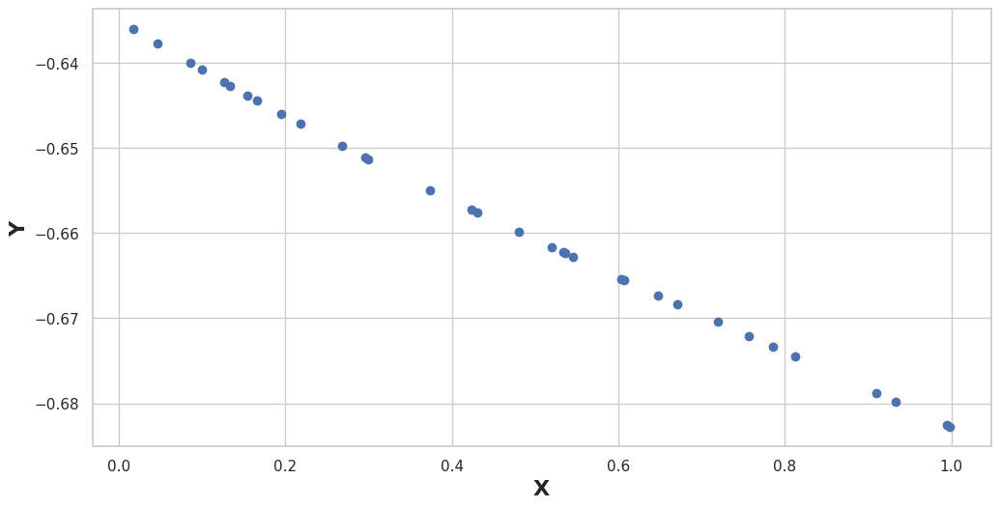

In [11]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Vemos que si bien aprendio parte del comportamiento de la función, podríamos intentar mejorar el aprendizaje.

`.history` del `.fit` es un JSON que tiene los valores impresos durante el entramiento(métricas y loss)

In [12]:
history.history

{'val_loss': [0.4191636334766041,
  0.3691216219555248,
  0.3159977613073407,
  0.28329465605995874,
  0.2443165472059539,
  0.21609126708724283,
  0.19927967136556451,
  0.17968432198871265,
  0.1675729878021009,
  0.15897814613400083,
  0.1523801585038503,
  0.14284668004874027,
  0.13307674996780627,
  0.12627450263861453,
  0.1207354109395634,
  0.11830587549643083,
  0.11917481232773174,
  0.11689991571686485,
  0.1138016784732992,
  0.1114173098043962,
  0.11034712421171593,
  0.11048929528756575,
  0.10710756345228716,
  0.10604520051768332,
  0.10460790133837497,
  0.10379760960737865,
  0.10267683863639832,
  0.10258007862351158,
  0.10147646250146808,
  0.10146016153422269,
  0.1009382014021729,
  0.10089856928045099,
  0.10074425330667784,
  0.10022158785299821,
  0.10000305600238568,
  0.0998556963873632,
  0.10014186189933257,
  0.09979549050331116,
  0.09964426652048573,
  0.0995670340277932,
  0.099489469194051,
  0.09959942689447691,
  0.09971153329719197,
  0.099937762

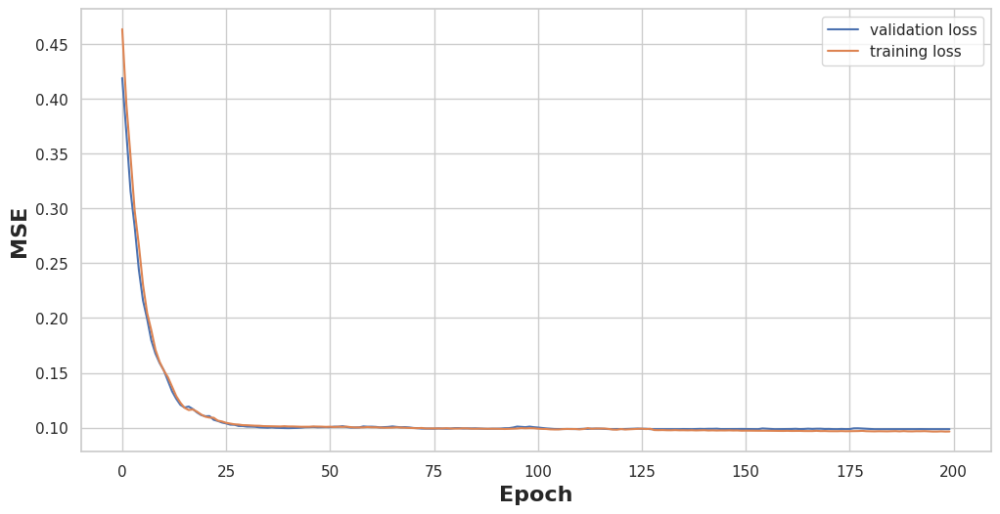

In [13]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoch", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

In [14]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

In [15]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_squared_error'])

In [16]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=500,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/500
 - 0s - loss: 0.1844 - mean_squared_error: 0.1844 - val_loss: 0.1681 - val_mean_squared_error: 0.1681


Epoch 2/500
 - 0s - loss: 0.1787 - mean_squared_error: 0.1787 - val_loss: 0.1544 - val_mean_squared_error: 0.1544


Epoch 3/500
 - 0s - loss: 0.1578 - mean_squared_error: 0.1578 - val_loss: 0.1284 - val_mean_squared_error: 0.1284


Epoch 4/500
 - 0s - loss: 0.1384 - mean_squared_error: 0.1384 - val_loss: 0.1192 - val_mean_squared_error: 0.1192


Epoch 5/500
 - 0s - loss: 0.1370 - mean_squared_error: 0.1370 - val_loss: 0.1177 - val_mean_squared_error: 0.1177


Epoch 6/500
 - 0s - loss: 0.1327 - mean_squared_error: 0.1327 - val_loss: 0.1156 - val_mean_squared_error: 0.1156


Epoch 7/500
 - 0s - loss: 0.1224 - mean_squared_error: 0.1224 - val_loss: 0.1295 - val_mean_squared_error: 0.1295


Epoch 8/500
 - 0s - loss: 0.1282 - mean_squared_error: 0.1282 - val_loss: 0.1516 - val_mean_squared_error: 0.1516


Epoch 9/500
 - 0s - loss: 0.1367 - mean_squared_error: 0.1367 - val_loss: 0.1244 - val_mean_squared_error: 0.1244


Epoch 10/500
 - 0s - loss: 0.1233 - mean_squared_error: 0.1233 - val_loss: 0.1756 - val_mean_squared_error: 0.1756


Epoch 11/500
 - 0s - loss: 0.1445 - mean_squared_error: 0.1445 - val_loss: 0.0958 - val_mean_squared_error: 0.0958


Epoch 12/500
 - 0s - loss: 0.1080 - mean_squared_error: 0.1080 - val_loss: 0.0966 - val_mean_squared_error: 0.0966


Epoch 13/500
 - 0s - loss: 0.1054 - mean_squared_error: 0.1054 - val_loss: 0.1005 - val_mean_squared_error: 0.1005


Epoch 14/500
 - 0s - loss: 0.1159 - mean_squared_error: 0.1159 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 15/500
 - 0s - loss: 0.1044 - mean_squared_error: 0.1044 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 16/500
 - 0s - loss: 0.0978 - mean_squared_error: 0.0978 - val_loss: 0.0930 - val_mean_squared_error: 0.0930


Epoch 17/500
 - 0s - loss: 0.0974 - mean_squared_error: 0.0974 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 18/500
 - 0s - loss: 0.1054 - mean_squared_error: 0.1054 - val_loss: 0.0931 - val_mean_squared_error: 0.0931


Epoch 19/500
 - 0s - loss: 0.1027 - mean_squared_error: 0.1027 - val_loss: 0.0951 - val_mean_squared_error: 0.0951


Epoch 20/500
 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0908 - val_mean_squared_error: 0.0908


Epoch 21/500
 - 0s - loss: 0.0940 - mean_squared_error: 0.0940 - val_loss: 0.1128 - val_mean_squared_error: 0.1128


Epoch 22/500
 - 0s - loss: 0.1047 - mean_squared_error: 0.1047 - val_loss: 0.1136 - val_mean_squared_error: 0.1136


Epoch 23/500
 - 0s - loss: 0.1027 - mean_squared_error: 0.1027 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 24/500


 - 0s - loss: 0.0903 - mean_squared_error: 0.0903 - val_loss: 0.0955 - val_mean_squared_error: 0.0955


Epoch 25/500
 - 0s - loss: 0.0924 - mean_squared_error: 0.0924 - val_loss: 0.0931 - val_mean_squared_error: 0.0931


Epoch 26/500
 - 0s - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0898 - val_mean_squared_error: 0.0898


Epoch 27/500
 - 0s - loss: 0.0892 - mean_squared_error: 0.0892 - val_loss: 0.0897 - val_mean_squared_error: 0.0897


Epoch 28/500
 - 0s - loss: 0.0906 - mean_squared_error: 0.0906 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 29/500
 - 0s - loss: 0.0895 - mean_squared_error: 0.0895 - val_loss: 0.0887 - val_mean_squared_error: 0.0887


Epoch 30/500
 - 0s - loss: 0.0891 - mean_squared_error: 0.0891 - val_loss: 0.0929 - val_mean_squared_error: 0.0929


Epoch 31/500
 - 0s - loss: 0.0933 - mean_squared_error: 0.0933 - val_loss: 0.0893 - val_mean_squared_error: 0.0893


Epoch 32/500
 - 0s - loss: 0.0885 - mean_squared_error: 0.0885 - val_loss: 0.0893 - val_mean_squared_error: 0.0893


Epoch 33/500


 - 0s - loss: 0.0892 - mean_squared_error: 0.0892 - val_loss: 0.1128 - val_mean_squared_error: 0.1128


Epoch 34/500


 - 0s - loss: 0.1013 - mean_squared_error: 0.1013 - val_loss: 0.0982 - val_mean_squared_error: 0.0982


Epoch 35/500


 - 0s - loss: 0.0919 - mean_squared_error: 0.0919 - val_loss: 0.0883 - val_mean_squared_error: 0.0883


Epoch 36/500


 - 0s - loss: 0.0891 - mean_squared_error: 0.0891 - val_loss: 0.1124 - val_mean_squared_error: 0.1124


Epoch 37/500


 - 0s - loss: 0.0995 - mean_squared_error: 0.0995 - val_loss: 0.0881 - val_mean_squared_error: 0.0881


Epoch 38/500
 - 0s - loss: 0.0875 - mean_squared_error: 0.0875 - val_loss: 0.0880 - val_mean_squared_error: 0.0880


Epoch 39/500


 - 0s - loss: 0.0916 - mean_squared_error: 0.0916 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 40/500
 - 0s - loss: 0.0896 - mean_squared_error: 0.0896 - val_loss: 0.0875 - val_mean_squared_error: 0.0875


Epoch 41/500
 - 0s - loss: 0.0889 - mean_squared_error: 0.0889 - val_loss: 0.1022 - val_mean_squared_error: 0.1022


Epoch 42/500


 - 0s - loss: 0.0946 - mean_squared_error: 0.0946 - val_loss: 0.1014 - val_mean_squared_error: 0.1014


Epoch 43/500
 - 0s - loss: 0.0933 - mean_squared_error: 0.0933 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 44/500
 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.0905 - val_mean_squared_error: 0.0905


Epoch 45/500
 - 0s - loss: 0.0880 - mean_squared_error: 0.0880 - val_loss: 0.1208 - val_mean_squared_error: 0.1208


Epoch 46/500
 - 0s - loss: 0.1015 - mean_squared_error: 0.1015 - val_loss: 0.0875 - val_mean_squared_error: 0.0875


Epoch 47/500


 - 0s - loss: 0.0863 - mean_squared_error: 0.0863 - val_loss: 0.0899 - val_mean_squared_error: 0.0899


Epoch 48/500


 - 0s - loss: 0.0918 - mean_squared_error: 0.0918 - val_loss: 0.0982 - val_mean_squared_error: 0.0982


Epoch 49/500
 - 0s - loss: 0.0943 - mean_squared_error: 0.0943 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 50/500
 - 0s - loss: 0.0906 - mean_squared_error: 0.0906 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 51/500


 - 0s - loss: 0.0916 - mean_squared_error: 0.0916 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 52/500
 - 0s - loss: 0.0885 - mean_squared_error: 0.0885 - val_loss: 0.1177 - val_mean_squared_error: 0.1177


Epoch 53/500


 - 0s - loss: 0.0996 - mean_squared_error: 0.0996 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 54/500


 - 0s - loss: 0.0894 - mean_squared_error: 0.0894 - val_loss: 0.0948 - val_mean_squared_error: 0.0948


Epoch 55/500


 - 0s - loss: 0.0923 - mean_squared_error: 0.0923 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 56/500


 - 0s - loss: 0.0849 - mean_squared_error: 0.0849 - val_loss: 0.0865 - val_mean_squared_error: 0.0865


Epoch 57/500


 - 0s - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.1201 - val_mean_squared_error: 0.1201


Epoch 58/500


 - 0s - loss: 0.1025 - mean_squared_error: 0.1025 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 59/500


 - 0s - loss: 0.0866 - mean_squared_error: 0.0866 - val_loss: 0.1169 - val_mean_squared_error: 0.1169


Epoch 60/500


 - 0s - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.0863 - val_mean_squared_error: 0.0863


Epoch 61/500
 - 0s - loss: 0.0844 - mean_squared_error: 0.0844 - val_loss: 0.0859 - val_mean_squared_error: 0.0859


Epoch 62/500


 - 0s - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 63/500


 - 0s - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0922 - val_mean_squared_error: 0.0922


Epoch 64/500


 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0926 - val_mean_squared_error: 0.0926


Epoch 65/500


 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 66/500


 - 0s - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.0880 - val_mean_squared_error: 0.0880


Epoch 67/500
 - 0s - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.0878 - val_mean_squared_error: 0.0878


Epoch 68/500


 - 0s - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.0886 - val_mean_squared_error: 0.0886


Epoch 69/500


 - 0s - loss: 0.0852 - mean_squared_error: 0.0852 - val_loss: 0.1138 - val_mean_squared_error: 0.1138


Epoch 70/500


 - 0s - loss: 0.0973 - mean_squared_error: 0.0973 - val_loss: 0.0859 - val_mean_squared_error: 0.0859


Epoch 71/500


 - 0s - loss: 0.0827 - mean_squared_error: 0.0827 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 72/500


 - 0s - loss: 0.0866 - mean_squared_error: 0.0866 - val_loss: 0.1065 - val_mean_squared_error: 0.1065


Epoch 73/500


 - 0s - loss: 0.0941 - mean_squared_error: 0.0941 - val_loss: 0.1099 - val_mean_squared_error: 0.1099


Epoch 74/500


 - 0s - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.0861 - val_mean_squared_error: 0.0861


Epoch 75/500


 - 0s - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.0968 - val_mean_squared_error: 0.0968


Epoch 76/500


 - 0s - loss: 0.0902 - mean_squared_error: 0.0902 - val_loss: 0.0963 - val_mean_squared_error: 0.0963


Epoch 77/500


 - 0s - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 78/500


 - 0s - loss: 0.0847 - mean_squared_error: 0.0847 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 79/500


 - 0s - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.0846 - val_mean_squared_error: 0.0846


Epoch 80/500
 - 0s - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.0871 - val_mean_squared_error: 0.0871


Epoch 81/500


 - 0s - loss: 0.0838 - mean_squared_error: 0.0838 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 82/500


 - 0s - loss: 0.0840 - mean_squared_error: 0.0840 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 83/500


 - 0s - loss: 0.0813 - mean_squared_error: 0.0813 - val_loss: 0.1008 - val_mean_squared_error: 0.1008


Epoch 84/500


 - 0s - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0833 - val_mean_squared_error: 0.0833


Epoch 85/500


 - 0s - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.0855 - val_mean_squared_error: 0.0855


Epoch 86/500
 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0825 - val_mean_squared_error: 0.0825


Epoch 87/500


 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0869 - val_mean_squared_error: 0.0869


Epoch 88/500


 - 0s - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0828 - val_mean_squared_error: 0.0828


Epoch 89/500


 - 0s - loss: 0.0851 - mean_squared_error: 0.0851 - val_loss: 0.0826 - val_mean_squared_error: 0.0826


Epoch 90/500


 - 0s - loss: 0.0825 - mean_squared_error: 0.0825 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 91/500


 - 0s - loss: 0.0881 - mean_squared_error: 0.0881 - val_loss: 0.0982 - val_mean_squared_error: 0.0982


Epoch 92/500


 - 0s - loss: 0.0909 - mean_squared_error: 0.0909 - val_loss: 0.0829 - val_mean_squared_error: 0.0829


Epoch 93/500


 - 0s - loss: 0.0796 - mean_squared_error: 0.0796 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 94/500


 - 0s - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.0840 - val_mean_squared_error: 0.0840


Epoch 95/500


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0832 - val_mean_squared_error: 0.0832


Epoch 96/500


 - 0s - loss: 0.0844 - mean_squared_error: 0.0844 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 97/500


 - 0s - loss: 0.0867 - mean_squared_error: 0.0867 - val_loss: 0.0897 - val_mean_squared_error: 0.0897


Epoch 98/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.0842 - val_mean_squared_error: 0.0842


Epoch 99/500
 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0864 - val_mean_squared_error: 0.0864


Epoch 100/500


 - 0s - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.1067 - val_mean_squared_error: 0.1067


Epoch 101/500


 - 0s - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0882 - val_mean_squared_error: 0.0882


Epoch 102/500


 - 0s - loss: 0.0828 - mean_squared_error: 0.0828 - val_loss: 0.0846 - val_mean_squared_error: 0.0846


Epoch 103/500


 - 0s - loss: 0.0796 - mean_squared_error: 0.0796 - val_loss: 0.0965 - val_mean_squared_error: 0.0965


Epoch 104/500


 - 0s - loss: 0.0924 - mean_squared_error: 0.0924 - val_loss: 0.0961 - val_mean_squared_error: 0.0961


Epoch 105/500


 - 0s - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 106/500


 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.0913 - val_mean_squared_error: 0.0913


Epoch 107/500


 - 0s - loss: 0.0830 - mean_squared_error: 0.0830 - val_loss: 0.1244 - val_mean_squared_error: 0.1244


Epoch 108/500


 - 0s - loss: 0.0998 - mean_squared_error: 0.0998 - val_loss: 0.0823 - val_mean_squared_error: 0.0823


Epoch 109/500


 - 0s - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0839 - val_mean_squared_error: 0.0839


Epoch 110/500


 - 0s - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0806 - val_mean_squared_error: 0.0806


Epoch 111/500


 - 0s - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.0838 - val_mean_squared_error: 0.0838


Epoch 112/500


 - 0s - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.1040 - val_mean_squared_error: 0.1040


Epoch 113/500


 - 0s - loss: 0.0953 - mean_squared_error: 0.0953 - val_loss: 0.0889 - val_mean_squared_error: 0.0889


Epoch 114/500


 - 0s - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.0823 - val_mean_squared_error: 0.0823


Epoch 115/500


 - 0s - loss: 0.0782 - mean_squared_error: 0.0782 - val_loss: 0.0797 - val_mean_squared_error: 0.0797


Epoch 116/500


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.0786 - val_mean_squared_error: 0.0786


Epoch 117/500


 - 0s - loss: 0.0827 - mean_squared_error: 0.0827 - val_loss: 0.0778 - val_mean_squared_error: 0.0778


Epoch 118/500


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0810 - val_mean_squared_error: 0.0810


Epoch 119/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.0776 - val_mean_squared_error: 0.0776


Epoch 120/500


 - 0s - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.0809 - val_mean_squared_error: 0.0809


Epoch 121/500


 - 0s - loss: 0.0763 - mean_squared_error: 0.0763 - val_loss: 0.0821 - val_mean_squared_error: 0.0821


Epoch 122/500


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.0776 - val_mean_squared_error: 0.0776


Epoch 123/500


 - 0s - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.0782 - val_mean_squared_error: 0.0782


Epoch 124/500


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 125/500


 - 0s - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.0757 - val_mean_squared_error: 0.0757


Epoch 126/500


 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.0783 - val_mean_squared_error: 0.0783


Epoch 127/500


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0873 - val_mean_squared_error: 0.0873


Epoch 128/500


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.0779 - val_mean_squared_error: 0.0779


Epoch 129/500


 - 0s - loss: 0.0773 - mean_squared_error: 0.0773 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 130/500


 - 0s - loss: 0.0877 - mean_squared_error: 0.0877 - val_loss: 0.0826 - val_mean_squared_error: 0.0826


Epoch 131/500


 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0946 - val_mean_squared_error: 0.0946


Epoch 132/500


 - 0s - loss: 0.0863 - mean_squared_error: 0.0863 - val_loss: 0.0751 - val_mean_squared_error: 0.0751


Epoch 133/500


 - 0s - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.0972 - val_mean_squared_error: 0.0972


Epoch 134/500


 - 0s - loss: 0.0838 - mean_squared_error: 0.0838 - val_loss: 0.0876 - val_mean_squared_error: 0.0876


Epoch 135/500


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0874 - val_mean_squared_error: 0.0874


Epoch 136/500


 - 0s - loss: 0.0801 - mean_squared_error: 0.0801 - val_loss: 0.0777 - val_mean_squared_error: 0.0777


Epoch 137/500


 - 0s - loss: 0.0737 - mean_squared_error: 0.0737 - val_loss: 0.0760 - val_mean_squared_error: 0.0760


Epoch 138/500


 - 0s - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.0775 - val_mean_squared_error: 0.0775


Epoch 139/500


 - 0s - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.0754 - val_mean_squared_error: 0.0754


Epoch 140/500


 - 0s - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.0805 - val_mean_squared_error: 0.0805


Epoch 141/500


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0818 - val_mean_squared_error: 0.0818


Epoch 142/500


 - 0s - loss: 0.0740 - mean_squared_error: 0.0740 - val_loss: 0.0857 - val_mean_squared_error: 0.0857


Epoch 143/500


 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0943 - val_mean_squared_error: 0.0943


Epoch 144/500


 - 0s - loss: 0.0907 - mean_squared_error: 0.0907 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 145/500


 - 0s - loss: 0.0861 - mean_squared_error: 0.0861 - val_loss: 0.0718 - val_mean_squared_error: 0.0718


Epoch 146/500


 - 0s - loss: 0.0725 - mean_squared_error: 0.0725 - val_loss: 0.0719 - val_mean_squared_error: 0.0719


Epoch 147/500


 - 0s - loss: 0.0703 - mean_squared_error: 0.0703 - val_loss: 0.0720 - val_mean_squared_error: 0.0720


Epoch 148/500


 - 0s - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.0864 - val_mean_squared_error: 0.0864


Epoch 149/500


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0712 - val_mean_squared_error: 0.0712


Epoch 150/500


 - 0s - loss: 0.0705 - mean_squared_error: 0.0705 - val_loss: 0.0721 - val_mean_squared_error: 0.0721


Epoch 151/500


 - 0s - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.0756 - val_mean_squared_error: 0.0756


Epoch 152/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.0720 - val_mean_squared_error: 0.0720


Epoch 153/500


 - 0s - loss: 0.0725 - mean_squared_error: 0.0725 - val_loss: 0.0778 - val_mean_squared_error: 0.0778


Epoch 154/500


 - 0s - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 155/500


 - 0s - loss: 0.0807 - mean_squared_error: 0.0807 - val_loss: 0.0695 - val_mean_squared_error: 0.0695


Epoch 156/500


 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.0981 - val_mean_squared_error: 0.0981


Epoch 157/500


 - 0s - loss: 0.0825 - mean_squared_error: 0.0825 - val_loss: 0.0738 - val_mean_squared_error: 0.0738


Epoch 158/500


 - 0s - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.0703 - val_mean_squared_error: 0.0703


Epoch 159/500


 - 0s - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.0733 - val_mean_squared_error: 0.0733


Epoch 160/500


 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.0685 - val_mean_squared_error: 0.0685


Epoch 161/500


 - 0s - loss: 0.0663 - mean_squared_error: 0.0663 - val_loss: 0.0681 - val_mean_squared_error: 0.0681


Epoch 162/500


 - 0s - loss: 0.0662 - mean_squared_error: 0.0662 - val_loss: 0.1368 - val_mean_squared_error: 0.1368


Epoch 163/500


 - 0s - loss: 0.0997 - mean_squared_error: 0.0997 - val_loss: 0.0727 - val_mean_squared_error: 0.0727


Epoch 164/500


 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.0695 - val_mean_squared_error: 0.0695


Epoch 165/500


 - 0s - loss: 0.0690 - mean_squared_error: 0.0690 - val_loss: 0.0723 - val_mean_squared_error: 0.0723


Epoch 166/500


 - 0s - loss: 0.0679 - mean_squared_error: 0.0679 - val_loss: 0.0688 - val_mean_squared_error: 0.0688


Epoch 167/500


 - 0s - loss: 0.0654 - mean_squared_error: 0.0654 - val_loss: 0.0827 - val_mean_squared_error: 0.0827


Epoch 168/500


 - 0s - loss: 0.0771 - mean_squared_error: 0.0771 - val_loss: 0.0882 - val_mean_squared_error: 0.0882


Epoch 169/500


 - 0s - loss: 0.0806 - mean_squared_error: 0.0806 - val_loss: 0.0733 - val_mean_squared_error: 0.0733


Epoch 170/500


 - 0s - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.0691 - val_mean_squared_error: 0.0691


Epoch 171/500


 - 0s - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0866 - val_mean_squared_error: 0.0866


Epoch 172/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.0702 - val_mean_squared_error: 0.0702


Epoch 173/500


 - 0s - loss: 0.0651 - mean_squared_error: 0.0651 - val_loss: 0.0673 - val_mean_squared_error: 0.0673


Epoch 174/500


 - 0s - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.0767 - val_mean_squared_error: 0.0767


Epoch 175/500


 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1073 - val_mean_squared_error: 0.1073


Epoch 176/500


 - 0s - loss: 0.0969 - mean_squared_error: 0.0969 - val_loss: 0.0688 - val_mean_squared_error: 0.0688


Epoch 177/500
 - 0s - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0664 - val_mean_squared_error: 0.0664


Epoch 178/500


 - 0s - loss: 0.0625 - mean_squared_error: 0.0625 - val_loss: 0.0661 - val_mean_squared_error: 0.0661


Epoch 179/500


 - 0s - loss: 0.0628 - mean_squared_error: 0.0628 - val_loss: 0.0684 - val_mean_squared_error: 0.0684


Epoch 180/500


 - 0s - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 181/500


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.0640 - val_mean_squared_error: 0.0640


Epoch 182/500
 - 0s - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0638 - val_mean_squared_error: 0.0638


Epoch 183/500


 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0634 - val_mean_squared_error: 0.0634


Epoch 184/500


 - 0s - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.0663 - val_mean_squared_error: 0.0663


Epoch 185/500


 - 0s - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.0633 - val_mean_squared_error: 0.0633


Epoch 186/500


 - 0s - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.0649 - val_mean_squared_error: 0.0649


Epoch 187/500


 - 0s - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0790 - val_mean_squared_error: 0.0790


Epoch 188/500


 - 0s - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.0822 - val_mean_squared_error: 0.0822


Epoch 189/500


 - 0s - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.0608 - val_mean_squared_error: 0.0608


Epoch 190/500


 - 0s - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0612 - val_mean_squared_error: 0.0612


Epoch 191/500


 - 0s - loss: 0.0576 - mean_squared_error: 0.0576 - val_loss: 0.0612 - val_mean_squared_error: 0.0612


Epoch 192/500


 - 0s - loss: 0.0589 - mean_squared_error: 0.0589 - val_loss: 0.0695 - val_mean_squared_error: 0.0695


Epoch 193/500


 - 0s - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.0625 - val_mean_squared_error: 0.0625


Epoch 194/500


 - 0s - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0621 - val_mean_squared_error: 0.0621


Epoch 195/500


 - 0s - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0587 - val_mean_squared_error: 0.0587


Epoch 196/500


 - 0s - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0683 - val_mean_squared_error: 0.0683


Epoch 197/500


 - 0s - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.1216 - val_mean_squared_error: 0.1216


Epoch 198/500


 - 0s - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0570 - val_mean_squared_error: 0.0570


Epoch 199/500


 - 0s - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0558 - val_mean_squared_error: 0.0558


Epoch 200/500


 - 0s - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.0567 - val_mean_squared_error: 0.0567


Epoch 201/500


 - 0s - loss: 0.0542 - mean_squared_error: 0.0542 - val_loss: 0.0657 - val_mean_squared_error: 0.0657


Epoch 202/500


 - 0s - loss: 0.0583 - mean_squared_error: 0.0583 - val_loss: 0.0603 - val_mean_squared_error: 0.0603


Epoch 203/500


 - 0s - loss: 0.0549 - mean_squared_error: 0.0549 - val_loss: 0.0647 - val_mean_squared_error: 0.0647


Epoch 204/500


 - 0s - loss: 0.0558 - mean_squared_error: 0.0558 - val_loss: 0.0626 - val_mean_squared_error: 0.0626


Epoch 205/500


 - 0s - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0534 - val_mean_squared_error: 0.0534


Epoch 206/500


 - 0s - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0533 - val_mean_squared_error: 0.0533


Epoch 207/500


 - 0s - loss: 0.0523 - mean_squared_error: 0.0523 - val_loss: 0.0548 - val_mean_squared_error: 0.0548


Epoch 208/500
 - 0s - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.0712 - val_mean_squared_error: 0.0712


Epoch 209/500


 - 0s - loss: 0.0622 - mean_squared_error: 0.0622 - val_loss: 0.0509 - val_mean_squared_error: 0.0509


Epoch 210/500


 - 0s - loss: 0.0511 - mean_squared_error: 0.0511 - val_loss: 0.0680 - val_mean_squared_error: 0.0680


Epoch 211/500


 - 0s - loss: 0.0639 - mean_squared_error: 0.0639 - val_loss: 0.0667 - val_mean_squared_error: 0.0667


Epoch 212/500


 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0601 - val_mean_squared_error: 0.0601


Epoch 213/500


 - 0s - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.0504 - val_mean_squared_error: 0.0504


Epoch 214/500


 - 0s - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0493 - val_mean_squared_error: 0.0493


Epoch 215/500


 - 0s - loss: 0.0513 - mean_squared_error: 0.0513 - val_loss: 0.0589 - val_mean_squared_error: 0.0589


Epoch 216/500


 - 0s - loss: 0.0539 - mean_squared_error: 0.0539 - val_loss: 0.0523 - val_mean_squared_error: 0.0523


Epoch 217/500
 - 0s - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0541 - val_mean_squared_error: 0.0541


Epoch 218/500
 - 0s - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.0568 - val_mean_squared_error: 0.0568


Epoch 219/500
 - 0s - loss: 0.0491 - mean_squared_error: 0.0491 - val_loss: 0.0515 - val_mean_squared_error: 0.0515


Epoch 220/500


 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0468 - val_mean_squared_error: 0.0468


Epoch 221/500


 - 0s - loss: 0.0502 - mean_squared_error: 0.0502 - val_loss: 0.0470 - val_mean_squared_error: 0.0470


Epoch 222/500


 - 0s - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0461 - val_mean_squared_error: 0.0461


Epoch 223/500


 - 0s - loss: 0.0454 - mean_squared_error: 0.0454 - val_loss: 0.0465 - val_mean_squared_error: 0.0465


Epoch 224/500


 - 0s - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.0660 - val_mean_squared_error: 0.0660


Epoch 225/500


 - 0s - loss: 0.0532 - mean_squared_error: 0.0532 - val_loss: 0.0467 - val_mean_squared_error: 0.0467


Epoch 226/500


 - 0s - loss: 0.0469 - mean_squared_error: 0.0469 - val_loss: 0.0457 - val_mean_squared_error: 0.0457


Epoch 227/500


 - 0s - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0448 - val_mean_squared_error: 0.0448


Epoch 228/500
 - 0s - loss: 0.0458 - mean_squared_error: 0.0458 - val_loss: 0.0477 - val_mean_squared_error: 0.0477


Epoch 229/500


 - 0s - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0463 - val_mean_squared_error: 0.0463


Epoch 230/500


 - 0s - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0428 - val_mean_squared_error: 0.0428


Epoch 231/500


 - 0s - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0421 - val_mean_squared_error: 0.0421


Epoch 232/500


 - 0s - loss: 0.0439 - mean_squared_error: 0.0439 - val_loss: 0.0533 - val_mean_squared_error: 0.0533


Epoch 233/500


 - 0s - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0428 - val_mean_squared_error: 0.0428


Epoch 234/500


 - 0s - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0422 - val_mean_squared_error: 0.0422


Epoch 235/500
 - 0s - loss: 0.0401 - mean_squared_error: 0.0401 - val_loss: 0.0494 - val_mean_squared_error: 0.0494


Epoch 236/500


 - 0s - loss: 0.0432 - mean_squared_error: 0.0432 - val_loss: 0.0430 - val_mean_squared_error: 0.0430


Epoch 237/500


 - 0s - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0410 - val_mean_squared_error: 0.0410


Epoch 238/500


 - 0s - loss: 0.0406 - mean_squared_error: 0.0406 - val_loss: 0.0438 - val_mean_squared_error: 0.0438


Epoch 239/500


 - 0s - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.0459 - val_mean_squared_error: 0.0459


Epoch 240/500


 - 0s - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0410 - val_mean_squared_error: 0.0410


Epoch 241/500


 - 0s - loss: 0.0392 - mean_squared_error: 0.0392 - val_loss: 0.0397 - val_mean_squared_error: 0.0397


Epoch 242/500


 - 0s - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0371 - val_mean_squared_error: 0.0371


Epoch 243/500


 - 0s - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0381 - val_mean_squared_error: 0.0381


Epoch 244/500


 - 0s - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0366 - val_mean_squared_error: 0.0366


Epoch 245/500


 - 0s - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0386 - val_mean_squared_error: 0.0386


Epoch 246/500


 - 0s - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0423 - val_mean_squared_error: 0.0423


Epoch 247/500


 - 0s - loss: 0.0403 - mean_squared_error: 0.0403 - val_loss: 0.0441 - val_mean_squared_error: 0.0441


Epoch 248/500


 - 0s - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.0367 - val_mean_squared_error: 0.0367


Epoch 249/500


 - 0s - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0454 - val_mean_squared_error: 0.0454


Epoch 250/500


 - 0s - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0394 - val_mean_squared_error: 0.0394


Epoch 251/500


 - 0s - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0392 - val_mean_squared_error: 0.0392


Epoch 252/500


 - 0s - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0401 - val_mean_squared_error: 0.0401


Epoch 253/500


 - 0s - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0414 - val_mean_squared_error: 0.0414


Epoch 254/500


 - 0s - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.0423 - val_mean_squared_error: 0.0423


Epoch 255/500


 - 0s - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.0333 - val_mean_squared_error: 0.0333


Epoch 256/500


 - 0s - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.0444 - val_mean_squared_error: 0.0444


Epoch 257/500


 - 0s - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0488 - val_mean_squared_error: 0.0488


Epoch 258/500


 - 0s - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0368 - val_mean_squared_error: 0.0368


Epoch 259/500


 - 0s - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0687 - val_mean_squared_error: 0.0687


Epoch 260/500


 - 0s - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.0319 - val_mean_squared_error: 0.0319


Epoch 261/500


 - 0s - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.0322 - val_mean_squared_error: 0.0322


Epoch 262/500
 - 0s - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.0301 - val_mean_squared_error: 0.0301


Epoch 263/500


 - 0s - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0285 - val_mean_squared_error: 0.0285


Epoch 264/500
 - 0s - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0283 - val_mean_squared_error: 0.0283


Epoch 265/500


 - 0s - loss: 0.0280 - mean_squared_error: 0.0280 - val_loss: 0.0279 - val_mean_squared_error: 0.0279


Epoch 266/500


 - 0s - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0341 - val_mean_squared_error: 0.0341


Epoch 267/500


 - 0s - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0295 - val_mean_squared_error: 0.0295


Epoch 268/500


 - 0s - loss: 0.0278 - mean_squared_error: 0.0278 - val_loss: 0.0312 - val_mean_squared_error: 0.0312


Epoch 269/500


 - 0s - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.0390 - val_mean_squared_error: 0.0390


Epoch 270/500


 - 0s - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0263 - val_mean_squared_error: 0.0263


Epoch 271/500


 - 0s - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0268 - val_mean_squared_error: 0.0268


Epoch 272/500


 - 0s - loss: 0.0255 - mean_squared_error: 0.0255 - val_loss: 0.0259 - val_mean_squared_error: 0.0259


Epoch 273/500


 - 0s - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0290 - val_mean_squared_error: 0.0290


Epoch 274/500


 - 0s - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0414 - val_mean_squared_error: 0.0414


Epoch 275/500
 - 0s - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0244 - val_mean_squared_error: 0.0244


Epoch 276/500
 - 0s - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0249 - val_mean_squared_error: 0.0249


Epoch 277/500


 - 0s - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0247 - val_mean_squared_error: 0.0247


Epoch 278/500


 - 0s - loss: 0.0233 - mean_squared_error: 0.0233 - val_loss: 0.0232 - val_mean_squared_error: 0.0232


Epoch 279/500


 - 0s - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0224 - val_mean_squared_error: 0.0224


Epoch 280/500


 - 0s - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0257 - val_mean_squared_error: 0.0257


Epoch 281/500


 - 0s - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0221 - val_mean_squared_error: 0.0221


Epoch 282/500


 - 0s - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0259 - val_mean_squared_error: 0.0259


Epoch 283/500


 - 0s - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.0240 - val_mean_squared_error: 0.0240


Epoch 284/500


 - 0s - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0233 - val_mean_squared_error: 0.0233


Epoch 285/500


 - 0s - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0210 - val_mean_squared_error: 0.0210


Epoch 286/500


 - 0s - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0239 - val_mean_squared_error: 0.0239


Epoch 287/500


 - 0s - loss: 0.0210 - mean_squared_error: 0.0210 - val_loss: 0.0309 - val_mean_squared_error: 0.0309


Epoch 288/500


 - 0s - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0271 - val_mean_squared_error: 0.0271


Epoch 289/500


 - 0s - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0200 - val_mean_squared_error: 0.0200


Epoch 290/500


 - 0s - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0243 - val_mean_squared_error: 0.0243


Epoch 291/500


 - 0s - loss: 0.0191 - mean_squared_error: 0.0191 - val_loss: 0.0287 - val_mean_squared_error: 0.0287


Epoch 292/500


 - 0s - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.0183 - val_mean_squared_error: 0.0183


Epoch 293/500


 - 0s - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0176 - val_mean_squared_error: 0.0176


Epoch 294/500


 - 0s - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0276 - val_mean_squared_error: 0.0276


Epoch 295/500


 - 0s - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0170 - val_mean_squared_error: 0.0170


Epoch 296/500


 - 0s - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0171 - val_mean_squared_error: 0.0171


Epoch 297/500


 - 0s - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0165 - val_mean_squared_error: 0.0165


Epoch 298/500


 - 0s - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0193 - val_mean_squared_error: 0.0193


Epoch 299/500


 - 0s - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0170 - val_mean_squared_error: 0.0170


Epoch 300/500


 - 0s - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0203 - val_mean_squared_error: 0.0203


Epoch 301/500


 - 0s - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0230 - val_mean_squared_error: 0.0230


Epoch 302/500


 - 0s - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0198 - val_mean_squared_error: 0.0198


Epoch 303/500


 - 0s - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0168 - val_mean_squared_error: 0.0168


Epoch 304/500


 - 0s - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0168 - val_mean_squared_error: 0.0168


Epoch 305/500


 - 0s - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.0142 - val_mean_squared_error: 0.0142


Epoch 306/500


 - 0s - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0142 - val_mean_squared_error: 0.0142


Epoch 307/500


 - 0s - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0137 - val_mean_squared_error: 0.0137


Epoch 308/500


 - 0s - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0141 - val_mean_squared_error: 0.0141


Epoch 309/500


 - 0s - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0190 - val_mean_squared_error: 0.0190


Epoch 310/500


 - 0s - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0133 - val_mean_squared_error: 0.0133


Epoch 311/500


 - 0s - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0272 - val_mean_squared_error: 0.0272


Epoch 312/500


 - 0s - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0121 - val_mean_squared_error: 0.0121


Epoch 313/500


 - 0s - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0130 - val_mean_squared_error: 0.0130


Epoch 314/500


 - 0s - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0202 - val_mean_squared_error: 0.0202


Epoch 315/500


 - 0s - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0122 - val_mean_squared_error: 0.0122


Epoch 316/500


 - 0s - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0111 - val_mean_squared_error: 0.0111


Epoch 317/500


 - 0s - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0141 - val_mean_squared_error: 0.0141


Epoch 318/500


 - 0s - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0135 - val_mean_squared_error: 0.0135


Epoch 319/500


 - 0s - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0154 - val_mean_squared_error: 0.0154


Epoch 320/500


 - 0s - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0129 - val_mean_squared_error: 0.0129


Epoch 321/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0128 - val_mean_squared_error: 0.0128


Epoch 322/500


 - 0s - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0131 - val_mean_squared_error: 0.0131


Epoch 323/500


 - 0s - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0099 - val_mean_squared_error: 0.0099


Epoch 324/500


 - 0s - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0093 - val_mean_squared_error: 0.0093


Epoch 325/500


 - 0s - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0094 - val_mean_squared_error: 0.0094


Epoch 326/500


 - 0s - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0110 - val_mean_squared_error: 0.0110


Epoch 327/500


 - 0s - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0164 - val_mean_squared_error: 0.0164


Epoch 328/500


 - 0s - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0093 - val_mean_squared_error: 0.0093


Epoch 329/500


 - 0s - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0099 - val_mean_squared_error: 0.0099


Epoch 330/500


 - 0s - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0110 - val_mean_squared_error: 0.0110


Epoch 331/500


 - 0s - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0269 - val_mean_squared_error: 0.0269


Epoch 332/500


 - 0s - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0104 - val_mean_squared_error: 0.0104


Epoch 333/500


 - 0s - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0091 - val_mean_squared_error: 0.0091


Epoch 334/500


 - 0s - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0079 - val_mean_squared_error: 0.0079


Epoch 335/500


 - 0s - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0082 - val_mean_squared_error: 0.0082


Epoch 336/500


 - 0s - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0075 - val_mean_squared_error: 0.0075


Epoch 337/500


 - 0s - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0141 - val_mean_squared_error: 0.0141


Epoch 338/500


 - 0s - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0071 - val_mean_squared_error: 0.0071


Epoch 339/500


 - 0s - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0078 - val_mean_squared_error: 0.0078


Epoch 340/500


 - 0s - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0085 - val_mean_squared_error: 0.0085


Epoch 341/500


 - 0s - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0082 - val_mean_squared_error: 0.0082


Epoch 342/500


 - 0s - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0069 - val_mean_squared_error: 0.0069


Epoch 343/500


 - 0s - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0072 - val_mean_squared_error: 0.0072


Epoch 344/500


 - 0s - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0218 - val_mean_squared_error: 0.0218


Epoch 345/500


 - 0s - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0214 - val_mean_squared_error: 0.0214


Epoch 346/500


 - 0s - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0069 - val_mean_squared_error: 0.0069


Epoch 347/500


 - 0s - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0074 - val_mean_squared_error: 0.0074


Epoch 348/500


 - 0s - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0063 - val_mean_squared_error: 0.0063


Epoch 349/500


 - 0s - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0057 - val_mean_squared_error: 0.0057


Epoch 350/500


 - 0s - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0055 - val_mean_squared_error: 0.0055


Epoch 351/500


 - 0s - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0060 - val_mean_squared_error: 0.0060


Epoch 352/500


 - 0s - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0065 - val_mean_squared_error: 0.0065


Epoch 353/500


 - 0s - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0115 - val_mean_squared_error: 0.0115


Epoch 354/500


 - 0s - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0055 - val_mean_squared_error: 0.0055


Epoch 355/500


 - 0s - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0055 - val_mean_squared_error: 0.0055


Epoch 356/500


 - 0s - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0055 - val_mean_squared_error: 0.0055


Epoch 357/500


 - 0s - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0052 - val_mean_squared_error: 0.0052


Epoch 358/500


 - 0s - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0049 - val_mean_squared_error: 0.0049


Epoch 359/500


 - 0s - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0048 - val_mean_squared_error: 0.0048


Epoch 360/500


 - 0s - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0058 - val_mean_squared_error: 0.0058


Epoch 361/500


 - 0s - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0073 - val_mean_squared_error: 0.0073


Epoch 362/500


 - 0s - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0056 - val_mean_squared_error: 0.0056


Epoch 363/500


 - 0s - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0047 - val_mean_squared_error: 0.0047


Epoch 364/500


 - 0s - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0050 - val_mean_squared_error: 0.0050


Epoch 365/500


 - 0s - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0063 - val_mean_squared_error: 0.0063


Epoch 366/500


 - 0s - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0054 - val_mean_squared_error: 0.0054


Epoch 367/500


 - 0s - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0042 - val_mean_squared_error: 0.0042


Epoch 368/500


 - 0s - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0041 - val_mean_squared_error: 0.0041


Epoch 369/500


 - 0s - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0073 - val_mean_squared_error: 0.0073


Epoch 370/500


 - 0s - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0062 - val_mean_squared_error: 0.0062


Epoch 371/500


 - 0s - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0050 - val_mean_squared_error: 0.0050


Epoch 372/500


 - 0s - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0051 - val_mean_squared_error: 0.0051


Epoch 373/500


 - 0s - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0050 - val_mean_squared_error: 0.0050


Epoch 374/500


 - 0s - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0041 - val_mean_squared_error: 0.0041


Epoch 375/500


 - 0s - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0037 - val_mean_squared_error: 0.0037


Epoch 376/500


 - 0s - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.0048 - val_mean_squared_error: 0.0048


Epoch 377/500


 - 0s - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0042 - val_mean_squared_error: 0.0042


Epoch 378/500


 - 0s - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0036 - val_mean_squared_error: 0.0036


Epoch 379/500


 - 0s - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.0065 - val_mean_squared_error: 0.0065


Epoch 380/500


 - 0s - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0072 - val_mean_squared_error: 0.0072


Epoch 381/500


 - 0s - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0035 - val_mean_squared_error: 0.0035


Epoch 382/500


 - 0s - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.0040 - val_mean_squared_error: 0.0040


Epoch 383/500


 - 0s - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 384/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0033 - val_mean_squared_error: 0.0033


Epoch 385/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0045 - val_mean_squared_error: 0.0045


Epoch 386/500


 - 0s - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 387/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0119 - val_mean_squared_error: 0.0119


Epoch 388/500


 - 0s - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 389/500


 - 0s - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.0034 - val_mean_squared_error: 0.0034


Epoch 390/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0081 - val_mean_squared_error: 0.0081


Epoch 391/500


 - 0s - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0068 - val_mean_squared_error: 0.0068


Epoch 392/500


 - 0s - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0031 - val_mean_squared_error: 0.0031


Epoch 393/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0041 - val_mean_squared_error: 0.0041


Epoch 394/500


 - 0s - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 395/500


 - 0s - loss: 0.0027 - mean_squared_error: 0.0027 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 396/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0033 - val_mean_squared_error: 0.0033


Epoch 397/500


 - 0s - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0056 - val_mean_squared_error: 0.0056


Epoch 398/500


 - 0s - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0036 - val_mean_squared_error: 0.0036


Epoch 399/500
 - 0s - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 400/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0038 - val_mean_squared_error: 0.0038


Epoch 401/500


 - 0s - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0028 - val_mean_squared_error: 0.0028


Epoch 402/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 403/500


 - 0s - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 404/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0028 - val_mean_squared_error: 0.0028


Epoch 405/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 406/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 407/500


 - 0s - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0048 - val_mean_squared_error: 0.0048


Epoch 408/500


 - 0s - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0040 - val_mean_squared_error: 0.0040


Epoch 409/500


 - 0s - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 410/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 411/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0025 - val_mean_squared_error: 0.0025


Epoch 412/500


 - 0s - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0031 - val_mean_squared_error: 0.0031


Epoch 413/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0064 - val_mean_squared_error: 0.0064


Epoch 414/500


 - 0s - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 415/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 416/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0028 - val_mean_squared_error: 0.0028


Epoch 417/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 418/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0033 - val_mean_squared_error: 0.0033


Epoch 419/500


 - 0s - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 420/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0040 - val_mean_squared_error: 0.0040


Epoch 421/500


 - 0s - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 422/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 423/500


 - 0s - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 424/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0025 - val_mean_squared_error: 0.0025


Epoch 425/500
 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0023 - val_mean_squared_error: 0.0023


Epoch 426/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 427/500
 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0076 - val_mean_squared_error: 0.0076


Epoch 428/500


 - 0s - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 429/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0023 - val_mean_squared_error: 0.0023


Epoch 430/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 431/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 432/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0045 - val_mean_squared_error: 0.0045


Epoch 433/500


 - 0s - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 434/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0033 - val_mean_squared_error: 0.0033


Epoch 435/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 436/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0043 - val_mean_squared_error: 0.0043


Epoch 437/500


 - 0s - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 438/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 439/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0027 - val_mean_squared_error: 0.0027


Epoch 440/500


 - 0s - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0032 - val_mean_squared_error: 0.0032


Epoch 441/500


 - 0s - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 442/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 443/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0025 - val_mean_squared_error: 0.0025


Epoch 444/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0035 - val_mean_squared_error: 0.0035


Epoch 445/500


 - 0s - loss: 0.0027 - mean_squared_error: 0.0027 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 446/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 447/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0028 - val_mean_squared_error: 0.0028


Epoch 448/500


 - 0s - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0031 - val_mean_squared_error: 0.0031


Epoch 449/500


 - 0s - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 450/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 451/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0084 - val_mean_squared_error: 0.0084


Epoch 452/500


 - 0s - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023


Epoch 453/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 454/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 455/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 456/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 457/500


 - 0s - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0020 - val_mean_squared_error: 0.0020


Epoch 458/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 459/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 460/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0037 - val_mean_squared_error: 0.0037


Epoch 461/500


 - 0s - loss: 0.0027 - mean_squared_error: 0.0027 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 462/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 463/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0020 - val_mean_squared_error: 0.0020


Epoch 464/500
 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0037 - val_mean_squared_error: 0.0037


Epoch 465/500


 - 0s - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 466/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0018 - val_mean_squared_error: 0.0018


Epoch 467/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 468/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 469/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0020 - val_mean_squared_error: 0.0020


Epoch 470/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 471/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 472/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 473/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0033 - val_mean_squared_error: 0.0033


Epoch 474/500


 - 0s - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 475/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0021 - val_mean_squared_error: 0.0021


Epoch 476/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0030 - val_mean_squared_error: 0.0030


Epoch 477/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 478/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 479/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 480/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 481/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 482/500


 - 0s - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0020 - val_mean_squared_error: 0.0020


Epoch 483/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 484/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 485/500


 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0023 - val_mean_squared_error: 0.0023


Epoch 486/500


 - 0s - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 487/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0018 - val_mean_squared_error: 0.0018


Epoch 488/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0026 - val_mean_squared_error: 0.0026


Epoch 489/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 490/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0020 - val_mean_squared_error: 0.0020


Epoch 491/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0018 - val_mean_squared_error: 0.0018


Epoch 492/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 493/500
 - 0s - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 494/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 495/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0024 - val_mean_squared_error: 0.0024


Epoch 496/500


 - 0s - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0019 - val_mean_squared_error: 0.0019


Epoch 497/500


 - 0s - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Epoch 498/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0018 - val_mean_squared_error: 0.0018


Epoch 499/500


 - 0s - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.0022 - val_mean_squared_error: 0.0022


Epoch 500/500


 - 0s - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0017 - val_mean_squared_error: 0.0017


Text(0, 0.5, 'Y')

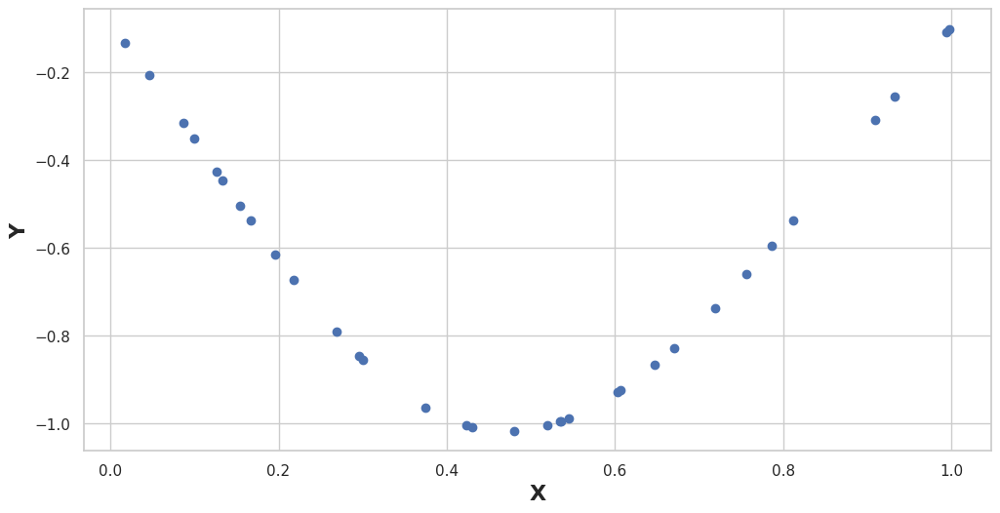

In [17]:
pred = model.predict(X_validation)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

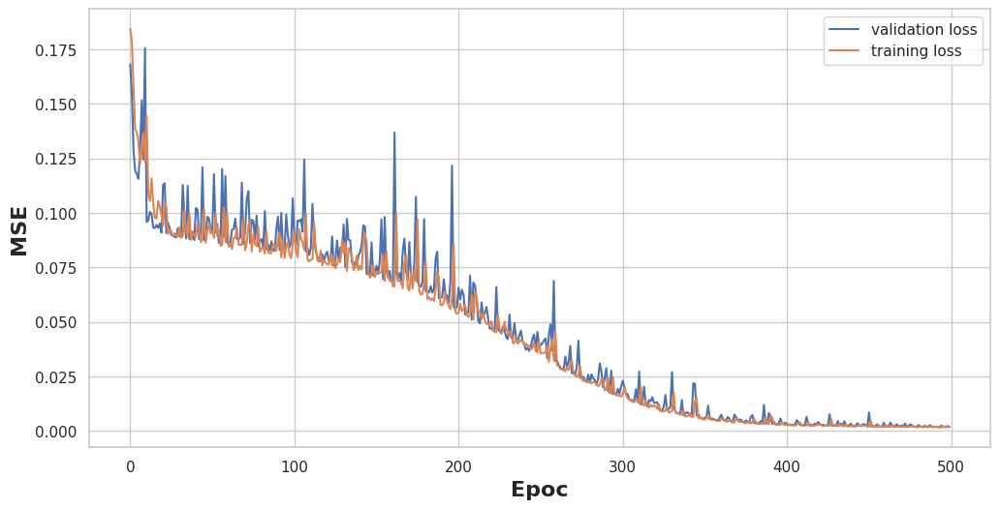

In [18]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoc", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

## California dataset: Regresión

Ahora vamos con un [dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) más complicado, el dataset del precio medio por cuadra de casas en un distrito de california

In [19]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [20]:
california = fetch_california_housing()
california_df = pd.DataFrame(california.data, columns=california.feature_names)

In [21]:
california

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]),
 'frame': None,
 'target_names': ['MedHouseVal'],
 'feature_names': ['MedInc',
  'HouseAge',
  'AveRooms',
  'AveBedrms',
  'Population',
  'AveOccup',
  'Latitude',
  'Longitude'],
 'DESCR': '.. _california_housing_dataset:\n

In [22]:
california.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

Las variables que contiene el dataset son:

* MedInc: ingreso medio de las personas que viven en esa cuadra
* HouseAge: edad media de las casas de esa cuadra
* AveRooms: número medio de ambientes
* AveBedrms número medio de habitaciones
* Population: cantidad de habitantes en la cuadra
* AveOccup: número medio de habitantes en la casa
* Latitude: latitud de la cuadra
* Longitude: longitud de la cuadra


* MedHouseVal:valor medio de las casas.

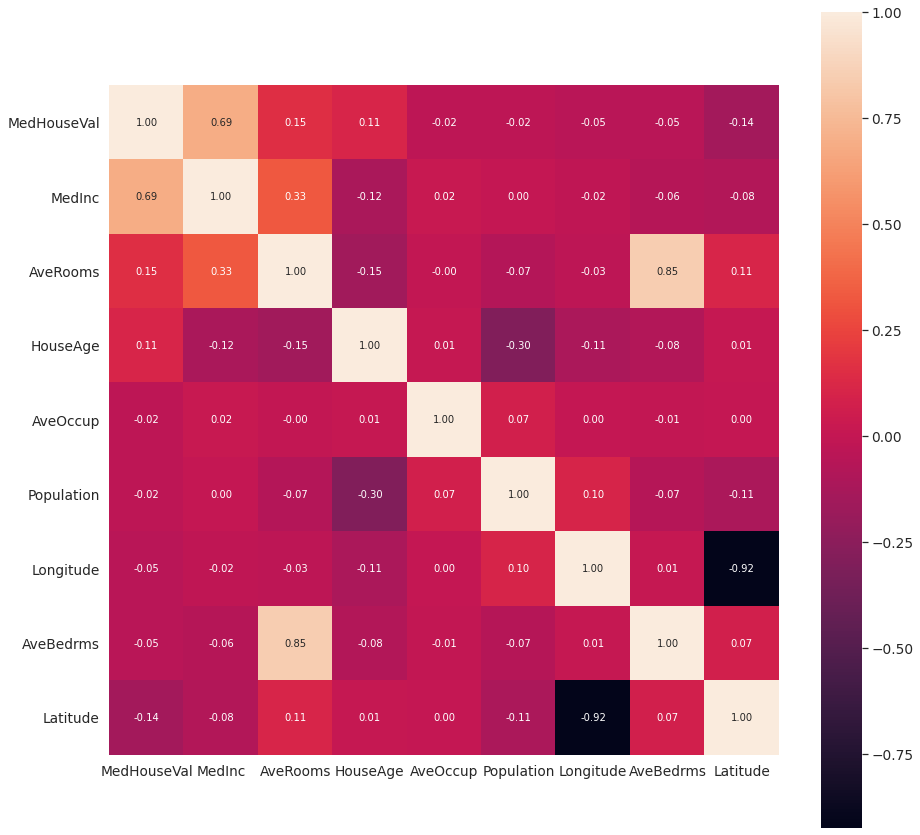

In [23]:
california_df['MedHouseVal'] = california.target
corrmat = california_df.corr()
k = 9  # number of variables for heatmap
cols = corrmat.nlargest(k, 'MedHouseVal')['MedHouseVal'].index
cm = np.corrcoef(california_df[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(15, 15))
hm = sns.heatmap(
    cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 10},
    yticklabels=cols.values,
    xticklabels=cols.values,
)

plt.show()

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

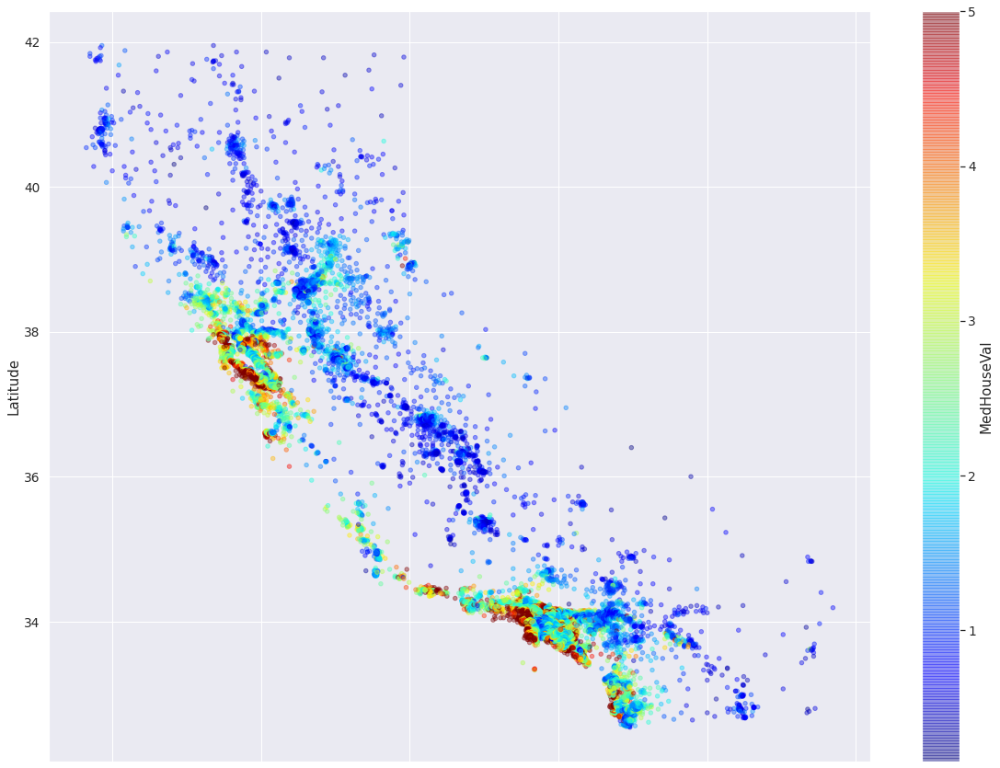

In [24]:
california_df.plot(
    kind="scatter",
    x="Longitude",
    y="Latitude",
    alpha=0.4,
    c="MedHouseVal",
    figsize=(20, 15),
    cmap=plt.get_cmap("jet"),
    colorbar=True,
)

In [25]:
california_df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


Text(0, 0.5, 'Counts')

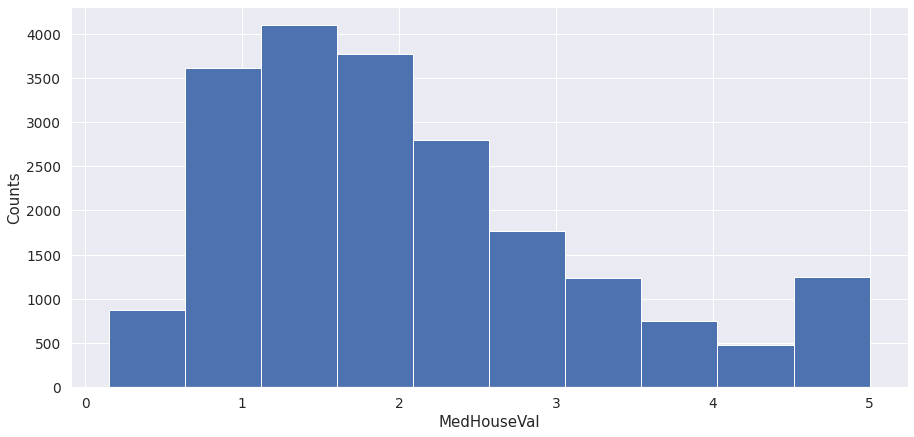

In [26]:
fig = plt.figure(figsize=(15, 7))
california_df["MedHouseVal"].hist()
plt.xlabel("MedHouseVal")
plt.ylabel("Counts")

Vamos a usar el StandardScaler y luego empezar a entrenar modelos y ver qué onda.

In [27]:
scaler = preprocessing.StandardScaler()
scaler.fit(california_df)
scaled_df = scaler.transform(california_df)
names = california_df.columns
scaled_california_df = pd.DataFrame(scaled_df, columns=names)

Entreno el modelo más simple: una regresión lineal

In [28]:
X = scaled_california_df.drop("MedHouseVal", axis=1)
y = scaled_california_df.filter(items=["MedHouseVal"])

linreg = LinearRegression()
rmse = np.sqrt(
    -cross_val_score(LinearRegression(), X, y, scoring="neg_mean_squared_error", cv=5)
)
rmse.mean()

0.6464066254204867

In [29]:
linreg = LinearRegression()
linreg.fit(X, y)
linreg.coef_[0]

array([ 0.71895227,  0.10291078, -0.23010693,  0.26491789, -0.00390232,
       -0.03408034, -0.77984545, -0.75441522])

Podemos ver la importancia tiene cada variable:

In [30]:
coeficientes = pd.DataFrame(
    {'Feature': X.columns, 'Beta': linreg.coef_[0]}, columns=['Feature', 'Beta']
)
coeficientes.sort_values(by=['Beta'])

,Feature,Beta
6,Latitude,-0.779845
7,Longitude,-0.754415
2,AveRooms,-0.230107
5,AveOccup,-0.034080
4,Population,-0.003902
1,HouseAge,0.102911
3,AveBedrms,0.264918
0,MedInc,0.718952


In [31]:
y_pred = linreg.predict(X)

(-3.0, 6.0)

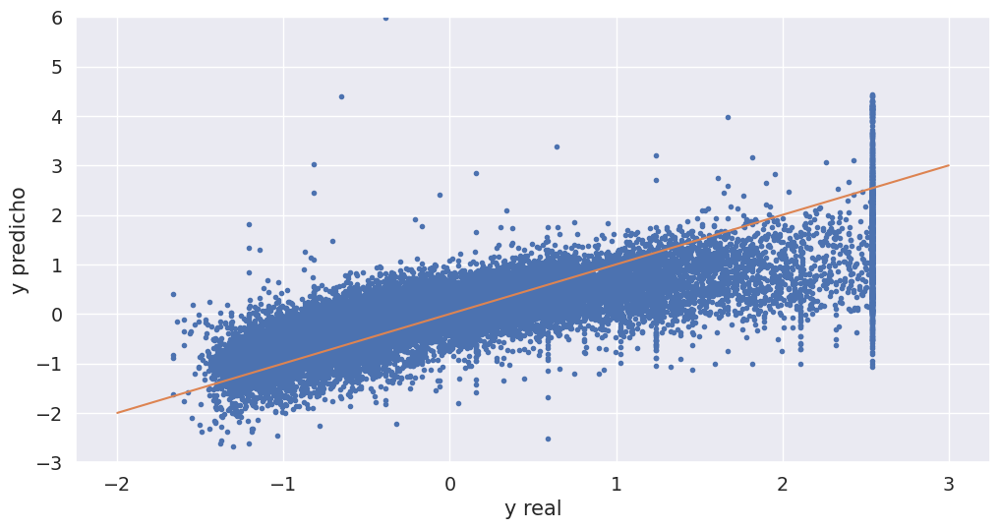

In [32]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y, y_pred, ".")
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)

In [33]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [34]:
model = Sequential()

In [35]:
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))

In [36]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mse', optimizer=opt)

Podemos usar .summary() para ver el modelo: capas, parámetros etc

In [37]:
model.summary()

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 10)                90        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________
Train on 12384 samples, validate on 8256 samples
Epoch 1/100


   32/12384 [..............................] - ETA: 16s - loss: 1.4221

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.4518 

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.4195

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.4053

 7264/12384 [================>.............] - ETA: 0s - loss: 0.3871



 9088/12384 [=====================>........] - ETA: 0s - loss: 0.3745

11040/12384 [=========================>....] - ETA: 0s - loss: 0.3668

12384/12384 [==============================] - 1s 47us/step - loss: 0.3599 - val_loss: 0.3205


Epoch 2/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2026

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3238

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.3128

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.3123

 7136/12384 [================>.............] - ETA: 0s - loss: 0.3125

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.3110

10592/12384 [========================>.....] - ETA: 0s - loss: 0.3112

12288/12384 [============================>.] - ETA: 0s - loss: 0.3156

12384/12384 [==============================] - 1s 46us/step - loss: 0.3152 - val_loss: 0.3069


Epoch 3/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1566

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.3321

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.3184

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.3106

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.3147

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.3112

10432/12384 [========================>.....] - ETA: 0s - loss: 0.3086

12160/12384 [============================>.] - ETA: 0s - loss: 0.3034

12384/12384 [==============================] - 1s 45us/step - loss: 0.3039 - val_loss: 0.3126


Epoch 4/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2888

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2855

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2841

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2838

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2863



 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2895

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2931

12160/12384 [============================>.] - ETA: 0s - loss: 0.2960

12384/12384 [==============================] - 1s 46us/step - loss: 0.2948 - val_loss: 0.3013


Epoch 5/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1052

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3036

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2988

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2912

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2911

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2919

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2933

12320/12384 [============================>.] - ETA: 0s - loss: 0.2910

12384/12384 [==============================] - 1s 45us/step - loss: 0.2905 - val_loss: 0.3138


Epoch 6/100


   32/12384 [..............................] - ETA: 0s - loss: 0.2014

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2784

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2811

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2835

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2840

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2853

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2820

12096/12384 [============================>.] - ETA: 0s - loss: 0.2841

12384/12384 [==============================] - 1s 47us/step - loss: 0.2830 - val_loss: 0.2841


Epoch 7/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2006

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2608

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2693

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2755

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2765

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2790

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2797

12256/12384 [============================>.] - ETA: 0s - loss: 0.2775

12384/12384 [==============================] - 1s 45us/step - loss: 0.2782 - val_loss: 0.2912


Epoch 8/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2804

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2632

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2720

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2752

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2751

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2728

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2711

12384/12384 [==============================] - 1s 44us/step - loss: 0.2723 - val_loss: 0.2861


Epoch 9/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4699

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3187

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2918

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2798

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2675

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2711

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2737

12224/12384 [============================>.] - ETA: 0s - loss: 0.2712

12384/12384 [==============================] - 1s 45us/step - loss: 0.2709 - val_loss: 0.2714


Epoch 10/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3088

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2426

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2574

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2539

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2564

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2598

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2694

12384/12384 [==============================] - 1s 44us/step - loss: 0.2670 - val_loss: 0.3192


Epoch 11/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2578

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2734

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2720

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2730

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2709

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2697

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2665

12096/12384 [============================>.] - ETA: 0s - loss: 0.2645

12384/12384 [==============================] - 1s 45us/step - loss: 0.2650 - val_loss: 0.2681


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3037

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2795

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2625

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2618

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2591

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2619

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2622

12384/12384 [==============================] - 1s 42us/step - loss: 0.2633 - val_loss: 0.2649


Epoch 13/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3185

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2407

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2495

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2560

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2676

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2623

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2640

12384/12384 [==============================] - 1s 44us/step - loss: 0.2629 - val_loss: 0.2810


Epoch 14/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1614

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2624

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2595

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2580

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2582

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2645

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2597

12352/12384 [============================>.] - ETA: 0s - loss: 0.2616

12384/12384 [==============================] - 1s 45us/step - loss: 0.2614 - val_loss: 0.2695


Epoch 15/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1781

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2605

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2631

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2709

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2660

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2654

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2616

12224/12384 [============================>.] - ETA: 0s - loss: 0.2598

12384/12384 [==============================] - 1s 46us/step - loss: 0.2601 - val_loss: 0.2654


Epoch 16/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1967

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2504

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2545

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2591

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2582

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2619

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2611

12384/12384 [==============================] - 1s 44us/step - loss: 0.2589 - val_loss: 0.2614


Epoch 17/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4262

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2742

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2745

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2679

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2616

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2586

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2613

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2570

12384/12384 [==============================] - 1s 46us/step - loss: 0.2564 - val_loss: 0.2781


Epoch 18/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1997

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2687

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2622

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2572

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2624

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2618

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2597

12288/12384 [============================>.] - ETA: 0s - loss: 0.2562

12384/12384 [==============================] - 1s 45us/step - loss: 0.2557 - val_loss: 0.2635


Epoch 19/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1658

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2410

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2496

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2523



 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2527

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2541

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2604

12320/12384 [============================>.] - ETA: 0s - loss: 0.2579

12384/12384 [==============================] - 1s 46us/step - loss: 0.2578 - val_loss: 0.2576


Epoch 20/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1731

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2524

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2547

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2646

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2567

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2556

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 44us/step - loss: 0.2541 - val_loss: 0.2589


Epoch 21/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1700

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2842

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2624

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2528

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2514

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2517

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2515

12160/12384 [============================>.] - ETA: 0s - loss: 0.2542

12384/12384 [==============================] - 1s 45us/step - loss: 0.2534 - val_loss: 0.2559


Epoch 22/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1714

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2487

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2601

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2603

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2555

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2553

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2542

12160/12384 [============================>.] - ETA: 0s - loss: 0.2541

12384/12384 [==============================] - 1s 45us/step - loss: 0.2539 - val_loss: 0.2700


Epoch 23/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1878

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2500

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2641

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2569

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2529

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2540

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2524

12256/12384 [============================>.] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 45us/step - loss: 0.2529 - val_loss: 0.2587


Epoch 24/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2441

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2754

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2519

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2612

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2583

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2535

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2496

12384/12384 [==============================] - 1s 44us/step - loss: 0.2522 - val_loss: 0.2574


Epoch 25/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3127

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2576

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2542

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2535

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2553

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2569

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 42us/step - loss: 0.2522 - val_loss: 0.2622


Epoch 26/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3371

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2381

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2371

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2478

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2576



 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2507

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2498

12096/12384 [============================>.] - ETA: 0s - loss: 0.2498

12384/12384 [==============================] - 1s 46us/step - loss: 0.2498 - val_loss: 0.2540


Epoch 27/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1993

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2604

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2624

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2640

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2591

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2561

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2511

12384/12384 [==============================] - 1s 44us/step - loss: 0.2507 - val_loss: 0.2601


Epoch 28/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4966

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2278

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2485

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2500

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2523

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2519

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2524

12096/12384 [============================>.] - ETA: 0s - loss: 0.2512

12384/12384 [==============================] - 1s 46us/step - loss: 0.2505 - val_loss: 0.2587


Epoch 29/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1407

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2448

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2499

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2515

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2462

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2458

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2541

12000/12384 [============================>.] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 46us/step - loss: 0.2489 - val_loss: 0.2827


Epoch 30/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3150

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2637

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2543

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2542

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2473

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2501

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2521

12384/12384 [==============================] - 1s 46us/step - loss: 0.2524 - val_loss: 0.2669


Epoch 31/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3698

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2700

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2509

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2468

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2499

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2486

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2490

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 47us/step - loss: 0.2530 - val_loss: 0.2648


Epoch 32/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2214

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2316

 3904/12384 [========>.....................] - ETA: 0s - loss: 0.2287

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2445

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2455

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2437

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2495

12384/12384 [==============================] - 1s 44us/step - loss: 0.2503 - val_loss: 0.2727


Epoch 33/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5350

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2602

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2441

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2418

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2467

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2434

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2472

12032/12384 [============================>.] - ETA: 0s - loss: 0.2480

12384/12384 [==============================] - 1s 46us/step - loss: 0.2472 - val_loss: 0.2542


Epoch 34/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1084

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2727

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2559

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2527

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2531

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2535

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2509

12384/12384 [==============================] - 1s 44us/step - loss: 0.2485 - val_loss: 0.2732


Epoch 35/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2725

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2858

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2736

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2656

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2568

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2550

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2487

12384/12384 [==============================] - 1s 43us/step - loss: 0.2488 - val_loss: 0.2602


Epoch 36/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1470

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2523

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2448

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2442

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2462



11200/12384 [==========================>...] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 43us/step - loss: 0.2463 - val_loss: 0.2666


Epoch 37/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2061

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2722

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2652

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2518

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2466

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2478

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2443

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2480

12384/12384 [==============================] - 1s 46us/step - loss: 0.2483 - val_loss: 0.2547


Epoch 38/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3095

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2717

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2587

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2479

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2451

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2464

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2487

12384/12384 [==============================] - 1s 45us/step - loss: 0.2487 - val_loss: 0.2838


Epoch 39/100
   32/12384 [..............................] - ETA: 0s - loss: 0.6128

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2464

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2462

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2485

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2476

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2452

12288/12384 [============================>.] - ETA: 0s - loss: 0.2475

12384/12384 [==============================] - 1s 45us/step - loss: 0.2481 - val_loss: 0.2533


Epoch 40/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2595

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2747

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2634

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2473

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2458

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2444

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2491

12096/12384 [============================>.] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 46us/step - loss: 0.2471 - val_loss: 0.2505


Epoch 41/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2308

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2352

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2454

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2439

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2445

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2455

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 43us/step - loss: 0.2465 - val_loss: 0.2683


Epoch 42/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1600

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2322

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2325

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2376

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2376

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2403

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 46us/step - loss: 0.2466 - val_loss: 0.2559


Epoch 43/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1775

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2233

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2399

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2474

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2401

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2454

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2474

12384/12384 [==============================] - 1s 44us/step - loss: 0.2482 - val_loss: 0.2512


Epoch 44/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2964

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2549

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2535

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2497

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2467

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2449



10176/12384 [=======================>......] - ETA: 0s - loss: 0.2436

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2441

12384/12384 [==============================] - 1s 46us/step - loss: 0.2455 - val_loss: 0.2551


Epoch 45/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1932

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2486

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2590

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2555

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2510

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2519

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2487

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2455

12384/12384 [==============================] - 1s 47us/step - loss: 0.2465 - val_loss: 0.2692


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1935

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2632

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2570

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2455

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2444

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2446

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2442

12032/12384 [============================>.] - ETA: 0s - loss: 0.2468

12384/12384 [==============================] - 1s 47us/step - loss: 0.2462 - val_loss: 0.2508


Epoch 47/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2360

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2606

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2441

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2524

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2480

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2502

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2464

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2468

12384/12384 [==============================] - 1s 46us/step - loss: 0.2454 - val_loss: 0.2706


Epoch 48/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3688

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2406

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2411

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2417

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2424

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2452

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2499

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2487

12384/12384 [==============================] - 1s 47us/step - loss: 0.2467 - val_loss: 0.2796


Epoch 49/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1575

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2593

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2461

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2494

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2540

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2512

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2468

12384/12384 [==============================] - 1s 46us/step - loss: 0.2461 - val_loss: 0.2561


Epoch 50/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3026

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2147

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2266

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2391

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2356

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2381

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2396

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 48us/step - loss: 0.2451 - val_loss: 0.2507


Epoch 51/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2870

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2502

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2541

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2485

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2497

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2478

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2477

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 49us/step - loss: 0.2458 - val_loss: 0.2607


Epoch 52/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0985

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2487

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2513

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2488

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2480

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2467

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2470

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2489

12384/12384 [==============================] - 1s 46us/step - loss: 0.2492 - val_loss: 0.2686


Epoch 53/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2710

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2364

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2347

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2471

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2423

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2438

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2479

12192/12384 [============================>.] - ETA: 0s - loss: 0.2464

12384/12384 [==============================] - 1s 45us/step - loss: 0.2473 - val_loss: 0.2551


Epoch 54/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1543

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2426

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2394

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2500

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2499

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2488

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2457

12384/12384 [==============================] - 1s 43us/step - loss: 0.2470 - val_loss: 0.2607


Epoch 55/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2840

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2672

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2556

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2609

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2501

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2525

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2529

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 46us/step - loss: 0.2489 - val_loss: 0.2596


Epoch 56/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3706

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2403

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2440

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2409

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2415

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2443

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2450

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 47us/step - loss: 0.2461 - val_loss: 0.2627


Epoch 57/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2795

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2281

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2346

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2354

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2364

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2390

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2419

12064/12384 [============================>.] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 46us/step - loss: 0.2451 - val_loss: 0.2660


Epoch 58/100
   32/12384 [..............................] - ETA: 0s - loss: 0.7322

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2473

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2471

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2483

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2508

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2470

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2462

12384/12384 [==============================] - 1s 43us/step - loss: 0.2464 - val_loss: 0.2672


Epoch 59/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3028

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2236

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2314

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2383

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2357

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2389

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2426



12320/12384 [============================>.] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 45us/step - loss: 0.2456 - val_loss: 0.2650


Epoch 60/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1639

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2492

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2584

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2574

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2504

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2476

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2465

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 46us/step - loss: 0.2458 - val_loss: 0.2627


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3520

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2653

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2458

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2429

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2469

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2449

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2423

12384/12384 [==============================] - 1s 44us/step - loss: 0.2457 - val_loss: 0.2696


Epoch 62/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2118

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2414

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2317

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2362

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2391

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2415

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2437

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 47us/step - loss: 0.2477 - val_loss: 0.2718


Epoch 63/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4252

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2419

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2399

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2322

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2349

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2430

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2419

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2440

12384/12384 [==============================] - 1s 46us/step - loss: 0.2444 - val_loss: 0.2766


Epoch 64/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2366

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2319

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2425

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2428

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2408

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2421

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2439

12128/12384 [============================>.] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 45us/step - loss: 0.2434 - val_loss: 0.2548


Epoch 65/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1217

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2347

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2334

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2388

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2398

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2413

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2505

12000/12384 [============================>.] - ETA: 0s - loss: 0.2501

12384/12384 [==============================] - 1s 45us/step - loss: 0.2482 - val_loss: 0.2673


Epoch 66/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1155

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2616

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2465

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2454

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2428

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2449

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2446

12384/12384 [==============================] - 1s 44us/step - loss: 0.2450 - val_loss: 0.2512


Epoch 67/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4445

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2540

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2545

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2469

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2420

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2393

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2425

12224/12384 [============================>.] - ETA: 0s - loss: 0.2424

12384/12384 [==============================] - 1s 45us/step - loss: 0.2423 - val_loss: 0.2621


Epoch 68/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1570

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2268

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2273

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2286

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2340

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2378

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 45us/step - loss: 0.2444 - val_loss: 0.2504


Epoch 69/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4575

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2660

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2556

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2492

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2408

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2448

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2419

12384/12384 [==============================] - 1s 44us/step - loss: 0.2423 - val_loss: 0.2491


Epoch 70/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1857

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2449

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2439

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2361

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2391

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2404

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2423

12384/12384 [==============================] - 1s 43us/step - loss: 0.2423 - val_loss: 0.2785


Epoch 71/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2495

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2686

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2598

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2573

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2566

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2542

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2512

12032/12384 [============================>.] - ETA: 0s - loss: 0.2502

12384/12384 [==============================] - 1s 46us/step - loss: 0.2484 - val_loss: 0.2542


Epoch 72/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1226

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2506

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2525

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2527

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2538

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2516

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2472

12384/12384 [==============================] - 1s 45us/step - loss: 0.2443 - val_loss: 0.2680


Epoch 73/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2144

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2699

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2526

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2495

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2477

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2457

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 43us/step - loss: 0.2445 - val_loss: 0.2673


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1645

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2248

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2383

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2362

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2351

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2349

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 44us/step - loss: 0.2441 - val_loss: 0.2507


Epoch 75/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1940

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2531

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2420

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2446



 7264/12384 [================>.............] - ETA: 0s - loss: 0.2439

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2381

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2427

12256/12384 [============================>.] - ETA: 0s - loss: 0.2437

12384/12384 [==============================] - 1s 45us/step - loss: 0.2438 - val_loss: 0.2539


Epoch 76/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2401

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2358

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2519

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2469

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2466

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2490

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 45us/step - loss: 0.2443 - val_loss: 0.2559


Epoch 77/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1526

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2512

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2495

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2532

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2485

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2487

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2447

12384/12384 [==============================] - 1s 42us/step - loss: 0.2431 - val_loss: 0.2623


Epoch 78/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2683

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2401

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2283

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2376

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2474

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2462

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2455

12384/12384 [==============================] - 1s 44us/step - loss: 0.2437 - val_loss: 0.2624


Epoch 79/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2262

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2325

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2407

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2411

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2393

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2401

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2401

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2404

12384/12384 [==============================] - 1s 46us/step - loss: 0.2426 - val_loss: 0.2530


Epoch 80/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0906

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2266

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2332

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2424

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2455

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2463

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2431

12256/12384 [============================>.] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 45us/step - loss: 0.2427 - val_loss: 0.2556


Epoch 81/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1854

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2358

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2362

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2414

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2401

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2422

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2449

12000/12384 [============================>.] - ETA: 0s - loss: 0.2459

12384/12384 [==============================] - 1s 46us/step - loss: 0.2442 - val_loss: 0.2499


Epoch 82/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2110

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2256

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2400

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2397

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2352

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2381

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2409

12320/12384 [============================>.] - ETA: 0s - loss: 0.2428

12384/12384 [==============================] - 1s 45us/step - loss: 0.2427 - val_loss: 0.2562


Epoch 83/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2504

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2488

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2513

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2443

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2418

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2410

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2415

12384/12384 [==============================] - 1s 43us/step - loss: 0.2430 - val_loss: 0.2570


Epoch 84/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2489

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2277

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2294

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2412

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2412

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2422

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2429

12384/12384 [==============================] - 1s 43us/step - loss: 0.2423 - val_loss: 0.2590


Epoch 85/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2258

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2528

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2618

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2544

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2481

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2458

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2449

12384/12384 [==============================] - 1s 45us/step - loss: 0.2443 - val_loss: 0.2592


Epoch 86/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1417

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2440

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2373

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2433

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2392

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2436

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2431

12384/12384 [==============================] - 1s 43us/step - loss: 0.2450 - val_loss: 0.2528


Epoch 87/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1175

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2353

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2436

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2383

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2481

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2468

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2436

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 47us/step - loss: 0.2428 - val_loss: 0.2575


Epoch 88/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1416

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2165

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2200

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2298

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2370

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2361

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2409

12384/12384 [==============================] - 1s 44us/step - loss: 0.2422 - val_loss: 0.2568


Epoch 89/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2303

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2303

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2474

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2472

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2423

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2442

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 44us/step - loss: 0.2414 - val_loss: 0.2552


Epoch 90/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2016

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2330

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2363

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2433

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2421

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2420

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2453

12384/12384 [==============================] - 1s 43us/step - loss: 0.2437 - val_loss: 0.2611


Epoch 91/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2525

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2693

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2617

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2534

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2471

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2475

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2428

12128/12384 [============================>.] - ETA: 0s - loss: 0.2413

12384/12384 [==============================] - 1s 46us/step - loss: 0.2411 - val_loss: 0.2700


Epoch 92/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1667

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2441

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2343

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2416

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2398

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2406

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2418

12384/12384 [==============================] - 1s 44us/step - loss: 0.2418 - val_loss: 0.2456


Epoch 93/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1214

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2473

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2424

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2351

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2396

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2394

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2387

12032/12384 [============================>.] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 46us/step - loss: 0.2427 - val_loss: 0.2558


Epoch 94/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1850

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2306

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2382

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2424

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2448

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2401

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2440

12384/12384 [==============================] - 1s 44us/step - loss: 0.2427 - val_loss: 0.2538


Epoch 95/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2105

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2656

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2471

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2524

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2523

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2505



10176/12384 [=======================>......] - ETA: 0s - loss: 0.2444

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2423

12384/12384 [==============================] - 1s 46us/step - loss: 0.2427 - val_loss: 0.2494


Epoch 96/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1515

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2568

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2673

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2535

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2577

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2527

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2482

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2469

12384/12384 [==============================] - 1s 47us/step - loss: 0.2460 - val_loss: 0.2512


Epoch 97/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3434

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2497

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2471

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2439

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2380

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2430

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2384

12256/12384 [============================>.] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 44us/step - loss: 0.2412 - val_loss: 0.2530


Epoch 98/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1978

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2510

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2517

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2440

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2467

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2385

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 44us/step - loss: 0.2407 - val_loss: 0.2865


Epoch 99/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2524

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2329

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2233

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2237

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2270

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2367

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2431

12384/12384 [==============================] - 1s 44us/step - loss: 0.2425 - val_loss: 0.2485


Epoch 100/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1582

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2371

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2343

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2326

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2314

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2360

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2390

12288/12384 [============================>.] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 45us/step - loss: 0.2393 - val_loss: 0.2590


In [38]:
y_pred_nn = model.predict(X_test.values)

(-3.0, 6.0)

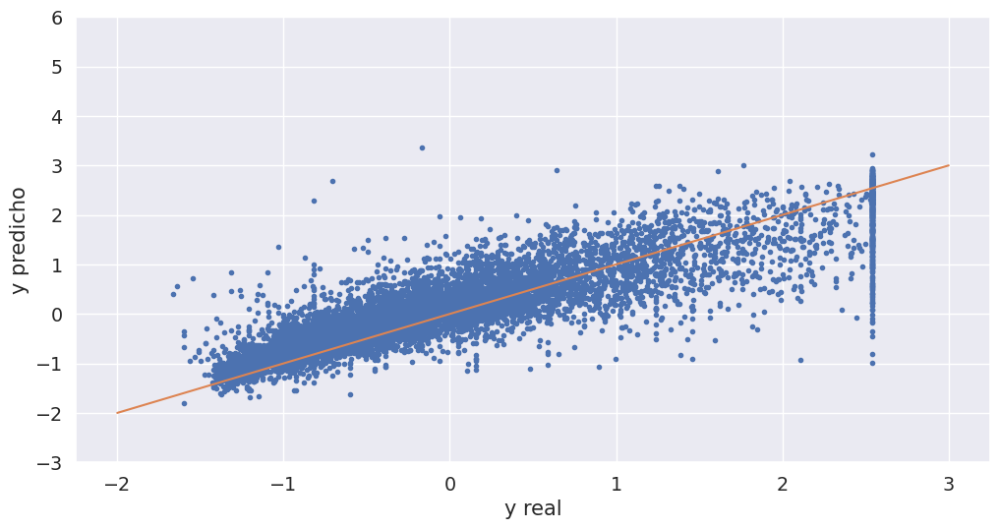

In [39]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_test, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.ylim(-3, 6)

In [40]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])

Ahora ploteamos el rmse del validation y training por época

Text(0.5, 0, 'Época')

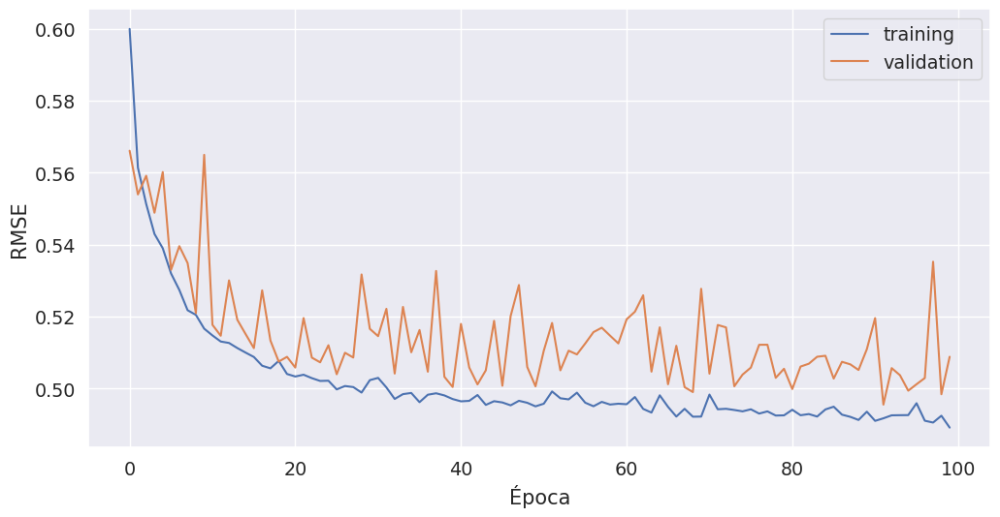

In [41]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que salta bastante la loss durante el entrenamiento:

Qué podemos hacer para que salte menos? Qué es lo que controla la "velocidad del aprendizaje"?

Podemos bajar la tasa de aprendizaje

In [42]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.SGD(lr=0.05)
model.compile(loss='mse', optimizer=opt)

In [43]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 16s - loss: 1.0699

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.5002 

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.4590

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.4428

 7072/12384 [================>.............] - ETA: 0s - loss: 0.4246

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.4183

10368/12384 [========================>.....] - ETA: 0s - loss: 0.4114

12064/12384 [============================>.] - ETA: 0s - loss: 0.4004

12384/12384 [==============================] - 1s 50us/step - loss: 0.3976 - val_loss: 0.3773


Epoch 2/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5878

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.3487

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.3667

 5632/12384 [============>.................] - ETA: 0s - loss: 0.3525

 7264/12384 [================>.............] - ETA: 0s - loss: 0.3532

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.3477

10528/12384 [========================>.....] - ETA: 0s - loss: 0.3431

12160/12384 [============================>.] - ETA: 0s - loss: 0.3426

12384/12384 [==============================] - 1s 45us/step - loss: 0.3430 - val_loss: 0.3451


Epoch 3/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3018

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.3142

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.3145

 5440/12384 [============>.................] - ETA: 0s - loss: 0.3206

 7072/12384 [================>.............] - ETA: 0s - loss: 0.3203

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.3211

10432/12384 [========================>.....] - ETA: 0s - loss: 0.3220

12096/12384 [============================>.] - ETA: 0s - loss: 0.3250

12384/12384 [==============================] - 1s 46us/step - loss: 0.3258 - val_loss: 0.3283


Epoch 4/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4181

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3502

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.3301

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.3272

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.3247

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.3196

10208/12384 [=======================>......] - ETA: 0s - loss: 0.3200

11840/12384 [===========================>..] - ETA: 0s - loss: 0.3158

12384/12384 [==============================] - 1s 46us/step - loss: 0.3134 - val_loss: 0.3195


Epoch 5/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2167

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.3056

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.3098

 5952/12384 [=============>................] - ETA: 0s - loss: 0.3101

 7808/12384 [=================>............] - ETA: 0s - loss: 0.3064

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.3119

11648/12384 [===========================>..] - ETA: 0s - loss: 0.3066

12384/12384 [==============================] - 1s 41us/step - loss: 0.3068 - val_loss: 0.3147


Epoch 6/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3321

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2878

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.3133

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.3027

 7104/12384 [================>.............] - ETA: 0s - loss: 0.3034

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.3063

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2999

12384/12384 [==============================] - 1s 43us/step - loss: 0.3026 - val_loss: 0.3126


Epoch 7/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4069

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3140

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2978

 5408/12384 [============>.................] - ETA: 0s - loss: 0.3038

 7360/12384 [================>.............] - ETA: 0s - loss: 0.3057

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2940

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2970

12384/12384 [==============================] - 1s 43us/step - loss: 0.2973 - val_loss: 0.3086


Epoch 8/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2277

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2923

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2941

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2934

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2940

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2927

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2946

12352/12384 [============================>.] - ETA: 0s - loss: 0.2962

12384/12384 [==============================] - 1s 45us/step - loss: 0.2962 - val_loss: 0.3052


Epoch 9/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1099

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.3128

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2968

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2991

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2953

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2931

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2934

12384/12384 [==============================] - 1s 42us/step - loss: 0.2924 - val_loss: 0.3028


Epoch 10/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3040

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3264

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.3062

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2968

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2933

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2870

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2863

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2873

12384/12384 [==============================] - 1s 46us/step - loss: 0.2911 - val_loss: 0.2985


Epoch 11/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4254

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2995

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2946

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2887

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2885

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2921

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2892

12384/12384 [==============================] - 1s 43us/step - loss: 0.2870 - val_loss: 0.2965


Epoch 12/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2799

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.3151

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.3049

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2992

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2990

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2919

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2914

12384/12384 [==============================] - 1s 43us/step - loss: 0.2916 - val_loss: 0.3041


Epoch 13/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2878

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2994

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.3010

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2868

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2925

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2915

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2878

12384/12384 [==============================] - 1s 43us/step - loss: 0.2877 - val_loss: 0.2995


Epoch 14/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3230

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2951

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2913

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2887

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2842

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2842



10880/12384 [=========================>....] - ETA: 0s - loss: 0.2835

12384/12384 [==============================] - 1s 44us/step - loss: 0.2841 - val_loss: 0.2920


Epoch 15/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3629

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2565

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2675

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2825

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2882



 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2829

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2810

12320/12384 [============================>.] - ETA: 0s - loss: 0.2807

12384/12384 [==============================] - 1s 44us/step - loss: 0.2807 - val_loss: 0.2850


Epoch 16/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4530

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2606

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2730

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2734

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2769

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2777

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2768

12384/12384 [==============================] - 1s 42us/step - loss: 0.2785 - val_loss: 0.2879


Epoch 17/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3622

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2647

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2678

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2684

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2689

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2701

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2705

12128/12384 [============================>.] - ETA: 0s - loss: 0.2736

12384/12384 [==============================] - 1s 46us/step - loss: 0.2738 - val_loss: 0.2974


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1570

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2698

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2603

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2582

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2671

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2670

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2740

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2732

12384/12384 [==============================] - 1s 46us/step - loss: 0.2720 - val_loss: 0.2841


Epoch 19/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2396

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2612

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2584

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2660

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2684

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2715

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2708

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2710

12384/12384 [==============================] - 1s 45us/step - loss: 0.2692 - val_loss: 0.2774


Epoch 20/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1348

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2408

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2519

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2620

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2670

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2640

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2649

12384/12384 [==============================] - 1s 44us/step - loss: 0.2669 - val_loss: 0.2738


Epoch 21/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3083

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2550

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2485

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2515

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2643

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2624



10688/12384 [========================>.....] - ETA: 0s - loss: 0.2627

12320/12384 [============================>.] - ETA: 0s - loss: 0.2636

12384/12384 [==============================] - 1s 45us/step - loss: 0.2644 - val_loss: 0.2729


Epoch 22/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1457

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2551

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2505

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2622

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2658



 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2655

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2658

12352/12384 [============================>.] - ETA: 0s - loss: 0.2622

12384/12384 [==============================] - 1s 45us/step - loss: 0.2624 - val_loss: 0.2783


Epoch 23/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1541

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2724

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2694

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2596

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2605

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2653

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2611

12384/12384 [==============================] - 1s 44us/step - loss: 0.2620 - val_loss: 0.2766


Epoch 24/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3351

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2879

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2625

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2581

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2603

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2597

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2608

12384/12384 [==============================] - 1s 44us/step - loss: 0.2595 - val_loss: 0.2683


Epoch 25/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1156

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2657

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2582

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2703

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2663

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2658

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2627

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2629

12384/12384 [==============================] - 1s 47us/step - loss: 0.2624 - val_loss: 0.2793


Epoch 26/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2197

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2620

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2554

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2584

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2579

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2574

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2593

12384/12384 [==============================] - 1s 44us/step - loss: 0.2575 - val_loss: 0.2802


Epoch 27/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5421

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2633

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2621

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2603

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2589

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2546

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2529

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2520

12384/12384 [==============================] - 1s 47us/step - loss: 0.2567 - val_loss: 0.2692


Epoch 28/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3263

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2477

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2557

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2512

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2503

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2463

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2471

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2510

12384/12384 [==============================] - 1s 47us/step - loss: 0.2557 - val_loss: 0.2626


Epoch 29/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2198

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2514

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2604

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2536

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2529

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2536

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2554

12288/12384 [============================>.] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 45us/step - loss: 0.2537 - val_loss: 0.2618


Epoch 30/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3148

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2476

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2526

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2544

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2555

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2533

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2558

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2571

12384/12384 [==============================] - 1s 46us/step - loss: 0.2553 - val_loss: 0.2658


Epoch 31/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2536

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2525

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2657

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2589

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2539

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2562

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2523

12384/12384 [==============================] - 1s 42us/step - loss: 0.2527 - val_loss: 0.2660


Epoch 32/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2296

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2778

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2649

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2612

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2591

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2514

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2503

12384/12384 [==============================] - 1s 44us/step - loss: 0.2516 - val_loss: 0.2595


Epoch 33/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1187

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2815

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2648

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2571

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2526

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2481

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2486

12384/12384 [==============================] - 1s 43us/step - loss: 0.2502 - val_loss: 0.2604


Epoch 34/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1814

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2477

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2434

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2413

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2528

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2538

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2510

12384/12384 [==============================] - 1s 44us/step - loss: 0.2499 - val_loss: 0.2671


Epoch 35/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1121

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2307

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2439

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2414

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2433

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2456

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2474

12096/12384 [============================>.] - ETA: 0s - loss: 0.2503

12384/12384 [==============================] - 1s 47us/step - loss: 0.2497 - val_loss: 0.2597


Epoch 36/200
   32/12384 [..............................] - ETA: 1s - loss: 0.6119

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2579

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2645

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2547

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2490

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2515

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2499

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2472

12384/12384 [==============================] - 1s 49us/step - loss: 0.2489 - val_loss: 0.2622


Epoch 37/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4749

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2455

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2454

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2456

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2455

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2488

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2449

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2490

12384/12384 [==============================] - 1s 47us/step - loss: 0.2513 - val_loss: 0.2603


Epoch 38/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2152

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2544

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2516

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2529

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2494

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2508

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2515

12384/12384 [==============================] - 1s 42us/step - loss: 0.2496 - val_loss: 0.2586


Epoch 39/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3908

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2562

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2456

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2386

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2381

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2414

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 45us/step - loss: 0.2469 - val_loss: 0.2591


Epoch 40/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2795

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2369

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2445

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2376

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2405

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2391

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2385

12128/12384 [============================>.] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 45us/step - loss: 0.2456 - val_loss: 0.2620


Epoch 41/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1682

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2427

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2460

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2496

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2470

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2494

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2464

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 47us/step - loss: 0.2470 - val_loss: 0.2649


Epoch 42/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4588

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2671

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2654

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2603

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2574

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2505

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2468

12096/12384 [============================>.] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 46us/step - loss: 0.2483 - val_loss: 0.2563


Epoch 43/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2143

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2417

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2455

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2473

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2488

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2537

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2490

12384/12384 [==============================] - 1s 43us/step - loss: 0.2481 - val_loss: 0.2620


Epoch 44/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1434

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2632

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2566

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2574

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2540

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2473

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2499

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 48us/step - loss: 0.2481 - val_loss: 0.2661


Epoch 45/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3387

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2567

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2498

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2395

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2415

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 44us/step - loss: 0.2470 - val_loss: 0.2522


Epoch 46/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0844

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2364

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2292

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2349

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2312

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2406

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2448

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2438

12384/12384 [==============================] - 1s 45us/step - loss: 0.2457 - val_loss: 0.2569


Epoch 47/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2341

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2406

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2415

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2455

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2452

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2441

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2445

12384/12384 [==============================] - 1s 44us/step - loss: 0.2447 - val_loss: 0.2514


Epoch 48/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3420

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2380

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2522

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2507

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2523



 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2466

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2465

12192/12384 [============================>.] - ETA: 0s - loss: 0.2454

12384/12384 [==============================] - 1s 45us/step - loss: 0.2444 - val_loss: 0.2562


Epoch 49/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3571

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2547

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2563

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2498

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2522



 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2500

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2501

12384/12384 [==============================] - 1s 44us/step - loss: 0.2450 - val_loss: 0.2506


Epoch 50/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2459

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2629

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2592

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2550

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2547

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2517

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2486

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2440

12384/12384 [==============================] - 1s 46us/step - loss: 0.2445 - val_loss: 0.2509


Epoch 51/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3972

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2730

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2485

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2407

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2404

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2382

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 43us/step - loss: 0.2441 - val_loss: 0.2518


Epoch 52/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3955

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2344

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2364

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2407

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2426

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2430

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 43us/step - loss: 0.2444 - val_loss: 0.2511


Epoch 53/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5983

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2376

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2466

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2425

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2412

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2437

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2427

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 47us/step - loss: 0.2449 - val_loss: 0.2522


Epoch 54/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1953

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2531

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2474

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2433

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2485

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2462

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2432

12384/12384 [==============================] - 1s 43us/step - loss: 0.2426 - val_loss: 0.2504


Epoch 55/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5090

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2371

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2399

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2342

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2442

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2440

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2423

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2416

12384/12384 [==============================] - 1s 47us/step - loss: 0.2421 - val_loss: 0.2590


Epoch 56/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2362

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2291

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2251

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2420

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2413

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2405

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2429

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2433

12384/12384 [==============================] - 1s 47us/step - loss: 0.2428 - val_loss: 0.2530


Epoch 57/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2768

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2379

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2421

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2453

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2453

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2453

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2447

12384/12384 [==============================] - 1s 44us/step - loss: 0.2423 - val_loss: 0.2607


Epoch 58/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1208

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2091

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2243

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2326

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2450

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2457

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2464

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2440

12384/12384 [==============================] - 1s 46us/step - loss: 0.2448 - val_loss: 0.2534


Epoch 59/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3151

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2342

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2493

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2457

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2465

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2436

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2406

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2416

12384/12384 [==============================] - 1s 46us/step - loss: 0.2434 - val_loss: 0.2614


Epoch 60/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1441

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2336

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2273

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2352

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2401

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2383

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2422

12384/12384 [==============================] - 1s 42us/step - loss: 0.2428 - val_loss: 0.2512


Epoch 61/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0855

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2439

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2504

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2513

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2495

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2465

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2413

12384/12384 [==============================] - 1s 43us/step - loss: 0.2413 - val_loss: 0.2535


Epoch 62/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1502

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2388

 3936/12384 [========>.....................] - ETA: 0s - loss: 0.2596

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2528

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2471

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2424

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2404

12384/12384 [==============================] - 1s 42us/step - loss: 0.2417 - val_loss: 0.2501


Epoch 63/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0786

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2635

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2522

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2485

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2454

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2433

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2413

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2449

12384/12384 [==============================] - 1s 46us/step - loss: 0.2416 - val_loss: 0.2512


Epoch 64/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1503

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2403

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2418

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2436

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2425

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2416

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2440

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 48us/step - loss: 0.2420 - val_loss: 0.2552


Epoch 65/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2597

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2689

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2634

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2551

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2538

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2506

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2489

12384/12384 [==============================] - 1s 44us/step - loss: 0.2459 - val_loss: 0.2576


Epoch 66/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2980

 2016/12384 [===>..........................] - ETA: 0s - loss: 0.2245

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2369

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2383

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2421

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2419

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2409

12384/12384 [==============================] - 1s 42us/step - loss: 0.2420 - val_loss: 0.2593


Epoch 67/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2610

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2473

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2311

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2325



 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2307

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2295

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2345

12128/12384 [============================>.] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 45us/step - loss: 0.2411 - val_loss: 0.2548


Epoch 68/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4388

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2481

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2424

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2395

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2410

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2402

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2462

12288/12384 [============================>.] - ETA: 0s - loss: 0.2422

12384/12384 [==============================] - 1s 45us/step - loss: 0.2419 - val_loss: 0.2481


Epoch 69/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2538

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2356

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2325

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2332

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2366

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2418

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2389

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2389

12384/12384 [==============================] - 1s 45us/step - loss: 0.2396 - val_loss: 0.2600


Epoch 70/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3502

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2541

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2521

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2469

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2425

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2415

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2402

12384/12384 [==============================] - 1s 45us/step - loss: 0.2414 - val_loss: 0.2501


Epoch 71/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3496

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2219

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2232

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2374

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2408

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2375

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2386

12384/12384 [==============================] - 1s 43us/step - loss: 0.2395 - val_loss: 0.2480


Epoch 72/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2852

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2619

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2441

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2358

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2359

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2392

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2383

12064/12384 [============================>.] - ETA: 0s - loss: 0.2405

12384/12384 [==============================] - 1s 46us/step - loss: 0.2396 - val_loss: 0.2464


Epoch 73/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2431

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2510

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2503

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2400

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2426

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2428

12192/12384 [============================>.] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 45us/step - loss: 0.2406 - val_loss: 0.2510


Epoch 74/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4227

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2405

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2457

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2401

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2395

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2379

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2401

12384/12384 [==============================] - 1s 44us/step - loss: 0.2390 - val_loss: 0.2518


Epoch 75/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5278

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2515

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2343

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2400

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2400

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2414

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2400

12384/12384 [==============================] - 1s 44us/step - loss: 0.2400 - val_loss: 0.2499


Epoch 76/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0745

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2381

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2366

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2371

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2411

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2429

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2400

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2409

12384/12384 [==============================] - 1s 46us/step - loss: 0.2401 - val_loss: 0.2506


Epoch 77/200
   32/12384 [..............................] - ETA: 0s - loss: 0.6087

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2291

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2228

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2275

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2341

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2361

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2407

12384/12384 [==============================] - 1s 43us/step - loss: 0.2432 - val_loss: 0.2523


Epoch 78/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1176

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2455

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2292

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2407

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2382

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2405

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2401

12352/12384 [============================>.] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 44us/step - loss: 0.2411 - val_loss: 0.2485


Epoch 79/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1168

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2351

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2427

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2401

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2410

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2413

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2431

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2401

12384/12384 [==============================] - 1s 47us/step - loss: 0.2399 - val_loss: 0.2480


Epoch 80/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1932

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2473

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2422

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2445

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2446

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2404

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2420

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 46us/step - loss: 0.2409 - val_loss: 0.2474


Epoch 81/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1937

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2420

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2331

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2386

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2372



 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2378

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 43us/step - loss: 0.2395 - val_loss: 0.2513


Epoch 82/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2046

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2306

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2416

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2414

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2424

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2419

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2417

12384/12384 [==============================] - 1s 44us/step - loss: 0.2397 - val_loss: 0.2533


Epoch 83/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1963

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2108

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2307

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2374

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2371

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2381

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 43us/step - loss: 0.2387 - val_loss: 0.2485


Epoch 84/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4045

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2494

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2474

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2334

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2394

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2407

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2393

12320/12384 [============================>.] - ETA: 0s - loss: 0.2387

12384/12384 [==============================] - 1s 45us/step - loss: 0.2391 - val_loss: 0.2585


Epoch 85/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1728

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2216

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2387

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2350

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2301

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2352

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2350

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 44us/step - loss: 0.2389 - val_loss: 0.2498


Epoch 86/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1110

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2578

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2544

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2460

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2397

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2401

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2348

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 44us/step - loss: 0.2372 - val_loss: 0.2518


Epoch 87/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2116

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2293

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2286

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2314

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2364

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2420

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2403

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2397

12384/12384 [==============================] - 1s 43us/step - loss: 0.2383 - val_loss: 0.2506


Epoch 88/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1610

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2410

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2281

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2338

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2349

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2366

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2369

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2427

12384/12384 [==============================] - 1s 44us/step - loss: 0.2408 - val_loss: 0.2499


Epoch 89/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1470

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2595

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2487

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2438

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2402

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2430

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2419

12000/12384 [============================>.] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 44us/step - loss: 0.2411 - val_loss: 0.2509


Epoch 90/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2016

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2310

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2470

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2413

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2384

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2411

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2392

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2406

12384/12384 [==============================] - 1s 43us/step - loss: 0.2402 - val_loss: 0.2580


Epoch 91/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2409

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2644

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2534

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2465

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2405

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2419

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2411

12320/12384 [============================>.] - ETA: 0s - loss: 0.2399

12384/12384 [==============================] - 1s 43us/step - loss: 0.2401 - val_loss: 0.2464


Epoch 92/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1897

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2412

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2278

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2250

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2290

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2326

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2386

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2394

12384/12384 [==============================] - 1s 44us/step - loss: 0.2389 - val_loss: 0.2455


Epoch 93/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1947

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2406

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2395

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2334

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2366

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2420

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2401

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 43us/step - loss: 0.2394 - val_loss: 0.2509


Epoch 94/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0977

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2235

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2347

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2365

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2365

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2369



10176/12384 [=======================>......] - ETA: 0s - loss: 0.2363

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 43us/step - loss: 0.2386 - val_loss: 0.2506


Epoch 95/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2183

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2252

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2267

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2301

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2346

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2356

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 41us/step - loss: 0.2382 - val_loss: 0.2553


Epoch 96/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2515

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2284

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2354

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2362

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2308

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2320

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2383

12384/12384 [==============================] - 1s 43us/step - loss: 0.2373 - val_loss: 0.2466


Epoch 97/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5034

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2538

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2478

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2434

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2412

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2379

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2368

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2390

12384/12384 [==============================] - 1s 45us/step - loss: 0.2380 - val_loss: 0.2737


Epoch 98/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3047

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2518

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2532

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2445

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2414

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2417

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2399

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 45us/step - loss: 0.2406 - val_loss: 0.2457


Epoch 99/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1501

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2309

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2313

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2390

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2425

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2409

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2388

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 44us/step - loss: 0.2388 - val_loss: 0.2460


Epoch 100/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1420

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2512

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2415

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2305

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2321

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2340

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2365

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2380

12384/12384 [==============================] - 1s 44us/step - loss: 0.2377 - val_loss: 0.2507


Epoch 101/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2093

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2349

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2295

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2357

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2399

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2361

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2382

12320/12384 [============================>.] - ETA: 0s - loss: 0.2378

12384/12384 [==============================] - 1s 43us/step - loss: 0.2376 - val_loss: 0.2441


Epoch 102/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3978

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2416

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2467

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2442

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2419

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2429

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2402

12384/12384 [==============================] - 1s 42us/step - loss: 0.2376 - val_loss: 0.2483


Epoch 103/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2510

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2443

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2438

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2405

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2389

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2357

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2383

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 43us/step - loss: 0.2380 - val_loss: 0.2490


Epoch 104/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1951

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2215

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2245

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2236

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2275

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2312

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2338

12128/12384 [============================>.] - ETA: 0s - loss: 0.2360

12384/12384 [==============================] - 1s 43us/step - loss: 0.2364 - val_loss: 0.2444


Epoch 105/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1837

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2325

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2469

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2397

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2402

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2335

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2379

12096/12384 [============================>.] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 43us/step - loss: 0.2370 - val_loss: 0.2473


Epoch 106/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4246

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2335

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2340

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2377

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2390

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2409

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2367

12000/12384 [============================>.] - ETA: 0s - loss: 0.2369

12384/12384 [==============================] - 1s 43us/step - loss: 0.2375 - val_loss: 0.2433


Epoch 107/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1431

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2496

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2486

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2396

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2377

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2364

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2332

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2377

12384/12384 [==============================] - 1s 44us/step - loss: 0.2376 - val_loss: 0.2438


Epoch 108/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3055

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2313

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2254

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2344

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2349

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2354

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2380

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 44us/step - loss: 0.2361 - val_loss: 0.2477


Epoch 109/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3495

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2174

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2320

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2360

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2395

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2352

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2380

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 44us/step - loss: 0.2368 - val_loss: 0.2532


Epoch 110/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2049

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2262

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2315

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2416

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2425

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2377

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2389

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2342

12384/12384 [==============================] - 1s 46us/step - loss: 0.2373 - val_loss: 0.2484


Epoch 111/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2035

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2375

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2371

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2406

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2449

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2354

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2386

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 44us/step - loss: 0.2367 - val_loss: 0.2510


Epoch 112/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1766

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2574

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2367

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2408

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2397

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2392

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2410

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 44us/step - loss: 0.2363 - val_loss: 0.2464


Epoch 113/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1931

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2441

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2386

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2315

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2301

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2299

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2366

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2368

12384/12384 [==============================] - 1s 43us/step - loss: 0.2359 - val_loss: 0.2436


Epoch 114/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1336

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2168

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2233

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2366

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2402

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2402

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2398

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 44us/step - loss: 0.2355 - val_loss: 0.2533


Epoch 115/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3041

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2217

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2227

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2290

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2292

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2341

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2375

12384/12384 [==============================] - 1s 44us/step - loss: 0.2358 - val_loss: 0.2469


Epoch 116/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1894

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2148

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2268

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2260

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2312

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2294

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2346

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2359

12384/12384 [==============================] - 1s 44us/step - loss: 0.2355 - val_loss: 0.2436


Epoch 117/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2694

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2423

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2457

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2479

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2377

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2370

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2384

12160/12384 [============================>.] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 43us/step - loss: 0.2357 - val_loss: 0.2493


Epoch 118/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2697

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.1996

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2090

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2250

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2325

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2320

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2335

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2357

12384/12384 [==============================] - 1s 44us/step - loss: 0.2354 - val_loss: 0.2437


Epoch 119/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1420

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2177

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2248

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2323

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2387

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2393

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2372

12128/12384 [============================>.] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 43us/step - loss: 0.2357 - val_loss: 0.2467


Epoch 120/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1676

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2632

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2462

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2329

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2351

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2359

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2349

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 44us/step - loss: 0.2351 - val_loss: 0.2542


Epoch 121/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2047

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2507

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2414

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2375

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2385

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2347

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2328

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 47us/step - loss: 0.2380 - val_loss: 0.2499


Epoch 122/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2148

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2515

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2454

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2430

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2390

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2368

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2374

12384/12384 [==============================] - 1s 46us/step - loss: 0.2368 - val_loss: 0.2488


Epoch 123/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1442

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2455

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2421

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2429

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2362

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2389

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2372

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2357

12384/12384 [==============================] - 1s 46us/step - loss: 0.2356 - val_loss: 0.2488


Epoch 124/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1924

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2123

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2330

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2309

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2332

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2317

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2371

12256/12384 [============================>.] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 42us/step - loss: 0.2354 - val_loss: 0.2432


Epoch 125/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2506

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2259

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2158

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2282

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2301

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2328

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2356

12224/12384 [============================>.] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 43us/step - loss: 0.2375 - val_loss: 0.2545


Epoch 126/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2348

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2657

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2407

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2315

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2363

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2362

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2369

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2384

12384/12384 [==============================] - 1s 45us/step - loss: 0.2362 - val_loss: 0.2459


Epoch 127/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1564

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2249

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2291

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2329

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2297

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2314

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2280

12064/12384 [============================>.] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 43us/step - loss: 0.2356 - val_loss: 0.2521


Epoch 128/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1800

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2136

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2359

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2386

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2468

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2426

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2429

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2382

12384/12384 [==============================] - 1s 46us/step - loss: 0.2357 - val_loss: 0.2496


Epoch 129/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1558

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2350

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2456

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2395

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2394

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2397

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2385

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2373

12384/12384 [==============================] - 1s 46us/step - loss: 0.2358 - val_loss: 0.2476


Epoch 130/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1713

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2337

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2336

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2390

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2337

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2346

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2358

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 45us/step - loss: 0.2355 - val_loss: 0.2486


Epoch 131/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1810

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2216

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2171

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2302

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2347

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2361

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 44us/step - loss: 0.2341 - val_loss: 0.2410


Epoch 132/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2049

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2574

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2417

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2384

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2366

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2360

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2319

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2316

12384/12384 [==============================] - 1s 46us/step - loss: 0.2343 - val_loss: 0.2442


Epoch 133/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2067

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2084

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2282

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2384

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2415

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2442

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2390

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2365

12384/12384 [==============================] - 1s 46us/step - loss: 0.2346 - val_loss: 0.2421


Epoch 134/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3823

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2455

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2367

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2293

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2293

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2345

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2355

12384/12384 [==============================] - 1s 44us/step - loss: 0.2338 - val_loss: 0.2432


Epoch 135/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1914

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2214

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2331

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2248

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2287

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2321

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2327

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 45us/step - loss: 0.2346 - val_loss: 0.2447


Epoch 136/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3241

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2544

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2392

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2345

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2307

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2329

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2312

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 46us/step - loss: 0.2343 - val_loss: 0.2423


Epoch 137/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1586

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2599

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2479

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2419

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2354

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2352

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2379

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 47us/step - loss: 0.2335 - val_loss: 0.2436


Epoch 138/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0755

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2133

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2201

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2317

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2320

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2304

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2325

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 44us/step - loss: 0.2336 - val_loss: 0.2455


Epoch 139/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2082

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2266

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2216

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2282

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2309

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2329

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2350

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 44us/step - loss: 0.2333 - val_loss: 0.2545


Epoch 140/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2830

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2265

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2337

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2345

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2410

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2373

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2348

12032/12384 [============================>.] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 43us/step - loss: 0.2335 - val_loss: 0.2455


Epoch 141/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2347

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2162

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2181

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2241

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2388

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2350

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2340

12256/12384 [============================>.] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 42us/step - loss: 0.2342 - val_loss: 0.2460


Epoch 142/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2040

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2488

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2302

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2375

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2345

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2354

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2359

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2321

12384/12384 [==============================] - 1s 45us/step - loss: 0.2336 - val_loss: 0.2525


Epoch 143/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3261

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2125

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2183

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2294

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2337

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2333

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2337

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 44us/step - loss: 0.2324 - val_loss: 0.2431


Epoch 144/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2991

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2304

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2273

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2276

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2301

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2308

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2313

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 44us/step - loss: 0.2323 - val_loss: 0.2476


Epoch 145/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2572

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2591

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2444

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2389

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2338

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2335

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2376

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2338

12384/12384 [==============================] - 1s 44us/step - loss: 0.2329 - val_loss: 0.2430


Epoch 146/200
   32/12384 [..............................] - ETA: 2s - loss: 0.1454

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2365

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2287

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2309

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2292

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2295

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2316

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2320

12384/12384 [==============================] - 1s 45us/step - loss: 0.2332 - val_loss: 0.2559


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2598

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2506

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2392

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2431

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2374

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2390

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2319

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 44us/step - loss: 0.2335 - val_loss: 0.2485


Epoch 148/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4654

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2161

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2126

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2209

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2184

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2219

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2252

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 45us/step - loss: 0.2308 - val_loss: 0.2423


Epoch 149/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1386

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2425

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2314

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2353

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2343

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2342

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2296

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2312

12384/12384 [==============================] - 1s 46us/step - loss: 0.2324 - val_loss: 0.2433


Epoch 150/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1960

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2281

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2489

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2410

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2430

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2352

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2310

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 44us/step - loss: 0.2331 - val_loss: 0.2502


Epoch 151/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1352

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2334

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2382

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2388

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2416

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2402

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 45us/step - loss: 0.2348 - val_loss: 0.2427


Epoch 152/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2000

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2487

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2386

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2316

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2364

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2292

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2312

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2332

12384/12384 [==============================] - 1s 46us/step - loss: 0.2323 - val_loss: 0.2455


Epoch 153/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1413

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2219

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2213

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2320

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2307

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2299

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2267

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2285

12384/12384 [==============================] - 1s 44us/step - loss: 0.2309 - val_loss: 0.2497


Epoch 154/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1488

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2241

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2349

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2385

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2367

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2338

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2306

12096/12384 [============================>.] - ETA: 0s - loss: 0.2303

12384/12384 [==============================] - 1s 42us/step - loss: 0.2306 - val_loss: 0.2445


Epoch 155/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2797

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2215

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2338

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2344

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2311

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2312

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2303

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2320

12384/12384 [==============================] - 1s 43us/step - loss: 0.2312 - val_loss: 0.2421


Epoch 156/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2491

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2340

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2324

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2299

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2263

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2303

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2303

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 44us/step - loss: 0.2303 - val_loss: 0.2414


Epoch 157/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5460

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2510

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2379

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2352

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2301

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2315

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2342

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 45us/step - loss: 0.2311 - val_loss: 0.2387


Epoch 158/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1732

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2514

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2452

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2372

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2311

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2295

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2320

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2334

12384/12384 [==============================] - 1s 45us/step - loss: 0.2309 - val_loss: 0.2437


Epoch 159/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1344

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2060

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2247

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2309

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2292

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2288

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2295

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2297

12384/12384 [==============================] - 1s 42us/step - loss: 0.2311 - val_loss: 0.2425


Epoch 160/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2204

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2305

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2189

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2220

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2226

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2266

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2272

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2268

12384/12384 [==============================] - 1s 44us/step - loss: 0.2300 - val_loss: 0.2411


Epoch 161/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2203

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2490

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2382

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2386

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2343

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2327

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2346

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2315

12384/12384 [==============================] - 1s 43us/step - loss: 0.2300 - val_loss: 0.2389


Epoch 162/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1823

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2291

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2227

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2310

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2219

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2209

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2258

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2307

12384/12384 [==============================] - 1s 43us/step - loss: 0.2290 - val_loss: 0.2451


Epoch 163/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1383

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2145

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2338

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2318

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2306

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2293

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2314

12192/12384 [============================>.] - ETA: 0s - loss: 0.2294

12384/12384 [==============================] - 1s 42us/step - loss: 0.2296 - val_loss: 0.2466


Epoch 164/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1403

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2388

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2313

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2314

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2267

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2250

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2250

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 46us/step - loss: 0.2297 - val_loss: 0.2434


Epoch 165/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2280

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2402

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2355

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2365

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2364

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2318

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2337

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2321

12384/12384 [==============================] - 1s 44us/step - loss: 0.2293 - val_loss: 0.2407


Epoch 166/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1016

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2198

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2168

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2230

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2222

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2225

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2259

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2274

12384/12384 [==============================] - 1s 46us/step - loss: 0.2283 - val_loss: 0.2383


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1770

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2428

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2381

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2352

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2370

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2307

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2300

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 43us/step - loss: 0.2297 - val_loss: 0.2376


Epoch 168/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1639

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2257

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2179

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2110

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2213

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2265

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2258

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2287

12384/12384 [==============================] - 1s 43us/step - loss: 0.2281 - val_loss: 0.2431


Epoch 169/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1982

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2110

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2289

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2332

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2278

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2256

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2292

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2293

12384/12384 [==============================] - 1s 43us/step - loss: 0.2282 - val_loss: 0.2444


Epoch 170/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3141

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2177

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2212

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2235

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2284

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2304

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2312

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 44us/step - loss: 0.2282 - val_loss: 0.2439


Epoch 171/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1245

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2432

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2178

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2233

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2242

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2231

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2244

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 44us/step - loss: 0.2282 - val_loss: 0.2353


Epoch 172/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2717

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2414

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2550

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2421

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2419

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2395

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2382

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 44us/step - loss: 0.2323 - val_loss: 0.2389


Epoch 173/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2409

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2172

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2243

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2247

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2295

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2273

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2259

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2294

12384/12384 [==============================] - 1s 45us/step - loss: 0.2291 - val_loss: 0.2376


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4858

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2345

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2194

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2197

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2200

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2257

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2266

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2297

12384/12384 [==============================] - 1s 45us/step - loss: 0.2287 - val_loss: 0.2410


Epoch 175/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2645

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2327

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2315

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2305

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2287

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2261

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2278

12032/12384 [============================>.] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 43us/step - loss: 0.2275 - val_loss: 0.2402


Epoch 176/200
   32/12384 [..............................] - ETA: 2s - loss: 0.4457

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2353

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2225

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2267

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2255

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2247

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2235

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2253

12384/12384 [==============================] - 1s 45us/step - loss: 0.2256 - val_loss: 0.2386


Epoch 177/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3831

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2428

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2300

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2277

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2236

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2235

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2290

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2287

12384/12384 [==============================] - 1s 45us/step - loss: 0.2299 - val_loss: 0.2409


Epoch 178/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3685

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2286

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2208

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2283

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2243

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2217

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2230

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2258

12384/12384 [==============================] - 1s 43us/step - loss: 0.2280 - val_loss: 0.2463


Epoch 179/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1606

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2290

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2320

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2281

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2313

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2308

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2287

12064/12384 [============================>.] - ETA: 0s - loss: 0.2283

12384/12384 [==============================] - 1s 43us/step - loss: 0.2283 - val_loss: 0.2396


Epoch 180/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1605

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2297

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2366

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2315

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2289

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2263

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2259

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 42us/step - loss: 0.2269 - val_loss: 0.2453


Epoch 181/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1101

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2170

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2158

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2214

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2219

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2229

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2228

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2240

12384/12384 [==============================] - 1s 43us/step - loss: 0.2255 - val_loss: 0.2424


Epoch 182/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2777

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.1984

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2102

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2257

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2322

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2327

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2296

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2290

12384/12384 [==============================] - 1s 44us/step - loss: 0.2280 - val_loss: 0.2381


Epoch 183/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3108

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2244

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2284

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2232

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2198

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2221

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2217

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2226

12384/12384 [==============================] - 1s 45us/step - loss: 0.2262 - val_loss: 0.2365


Epoch 184/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2615

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2345

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2301

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2374

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2341

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2324

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2312

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 44us/step - loss: 0.2262 - val_loss: 0.2404


Epoch 185/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2532

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2184

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2231

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2290

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2251

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2225

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2241

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2240

12384/12384 [==============================] - 1s 45us/step - loss: 0.2256 - val_loss: 0.2408


Epoch 186/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2876

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2467

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2368

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2242

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2278

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2221

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2207

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2244

12384/12384 [==============================] - 1s 45us/step - loss: 0.2261 - val_loss: 0.2389


Epoch 187/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3136

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2196

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2199

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2215

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2151

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2166

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2218

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 46us/step - loss: 0.2260 - val_loss: 0.2392


Epoch 188/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2573

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2118

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2164

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2200

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2157

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2185

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2205

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 43us/step - loss: 0.2257 - val_loss: 0.2414


Epoch 189/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1139

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2146

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2176

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2282

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2270

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2304

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2268

12000/12384 [============================>.] - ETA: 0s - loss: 0.2240

12384/12384 [==============================] - 1s 44us/step - loss: 0.2252 - val_loss: 0.2394


Epoch 190/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3046

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2096

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2183

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2197

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2237

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2209

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2196

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2257

12384/12384 [==============================] - 1s 45us/step - loss: 0.2270 - val_loss: 0.2365


Epoch 191/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1775

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2241

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2254

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2181

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2245

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2225

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2257



12064/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 45us/step - loss: 0.2256 - val_loss: 0.2367


Epoch 192/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2717

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2137

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2143

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2211

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2292

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2308

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2301

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2298

12384/12384 [==============================] - 1s 45us/step - loss: 0.2293 - val_loss: 0.2377


Epoch 193/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1077

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2299

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2258

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2287

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2243

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2267

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2241

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2247

12384/12384 [==============================] - 1s 44us/step - loss: 0.2260 - val_loss: 0.2403


Epoch 194/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4283

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2317

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2228

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2229

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2306

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2275

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2255

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 46us/step - loss: 0.2254 - val_loss: 0.2395


Epoch 195/200
   32/12384 [..............................] - ETA: 2s - loss: 0.1492

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2209

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2094

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2217

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2209

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2226

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2255

12032/12384 [============================>.] - ETA: 0s - loss: 0.2262

12384/12384 [==============================] - 1s 43us/step - loss: 0.2259 - val_loss: 0.2375


Epoch 196/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1289

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2140

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2184

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2165

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2187

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2221

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2230

12160/12384 [============================>.] - ETA: 0s - loss: 0.2235

12384/12384 [==============================] - 1s 43us/step - loss: 0.2241 - val_loss: 0.2431


Epoch 197/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1222

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2236

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2293

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2272

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2271

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2259

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2236

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2245

12384/12384 [==============================] - 1s 45us/step - loss: 0.2242 - val_loss: 0.2357


Epoch 198/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1479

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2175

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2257

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2277

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2249

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2219

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2246

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2247

12384/12384 [==============================] - 1s 44us/step - loss: 0.2250 - val_loss: 0.2388


Epoch 199/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1331

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2280

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2301

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2313

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2305

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2320

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2318

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2278

12384/12384 [==============================] - 1s 43us/step - loss: 0.2279 - val_loss: 0.2404


Epoch 200/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1053

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2231

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2288

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2298

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2272

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2295

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2274

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2248

12384/12384 [==============================] - 1s 45us/step - loss: 0.2250 - val_loss: 0.2370


Text(0.5, 0, 'Época')

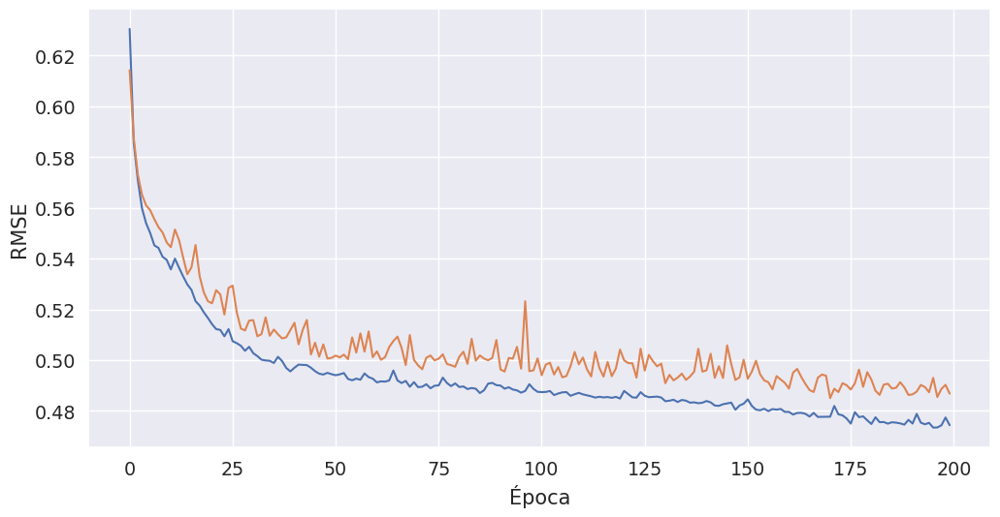

In [44]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que es un poco menos errático el aprendizaje, qué otra cosa podemos hacer para mejorar el entrenamiento como tal:

Hint: Qué cosa se encarga de modificar los pesos una vez calculados los gradientes?

Probamos cambiar el [optmizador](https://keras.io/api/optimizers/) a uno mejor:

mejor==no usar solo el gradiente. Usamos Adam de optmizador

In [45]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [46]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 24s - loss: 1.2297

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.8267 

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.6954

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.6367

 6144/12384 [=============>................] - ETA: 0s - loss: 0.6024

 7680/12384 [=================>............] - ETA: 0s - loss: 0.5703

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.5452

11072/12384 [=========================>....] - ETA: 0s - loss: 0.5232

12384/12384 [==============================] - 1s 52us/step - loss: 0.5089 - val_loss: 0.3898


Epoch 2/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3611

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.3832

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.3722

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.3759

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.3613

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.3590

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.3578

11584/12384 [===========================>..] - ETA: 0s - loss: 0.3570

12384/12384 [==============================] - 1s 46us/step - loss: 0.3580 - val_loss: 0.3516


Epoch 3/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4954

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3498

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.3343

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.3267

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.3223

 7840/12384 [=================>............] - ETA: 0s - loss: 0.3295

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.3264

11200/12384 [==========================>...] - ETA: 0s - loss: 0.3338

12384/12384 [==============================] - 1s 45us/step - loss: 0.3364 - val_loss: 0.3445


Epoch 4/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2372

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3181

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.3127

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.3306

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.3266

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.3288

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.3295

11520/12384 [==========================>...] - ETA: 0s - loss: 0.3295

12384/12384 [==============================] - 1s 43us/step - loss: 0.3298 - val_loss: 0.3384


Epoch 5/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2613

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3445

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.3236

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.3363

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.3328

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.3267

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.3303

11168/12384 [==========================>...] - ETA: 0s - loss: 0.3319

12384/12384 [==============================] - 1s 46us/step - loss: 0.3250 - val_loss: 0.3343


Epoch 6/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4360

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3182

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.3186

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.3206

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.3197

 7808/12384 [=================>............] - ETA: 0s - loss: 0.3203

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.3205

10944/12384 [=========================>....] - ETA: 0s - loss: 0.3221

12384/12384 [==============================] - 1s 48us/step - loss: 0.3204 - val_loss: 0.3301


Epoch 7/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3044

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3074

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.3055

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.3047

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.3070

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.3090

10016/12384 [=======================>......] - ETA: 0s - loss: 0.3067

11808/12384 [===========================>..] - ETA: 0s - loss: 0.3115

12384/12384 [==============================] - 1s 43us/step - loss: 0.3161 - val_loss: 0.3270


Epoch 8/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1669

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3024

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.3119

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.3059

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.3115

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.3126

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.3108

11520/12384 [==========================>...] - ETA: 0s - loss: 0.3119

12384/12384 [==============================] - 1s 46us/step - loss: 0.3119 - val_loss: 0.3210


Epoch 9/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2286

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2954

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2993

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2969

 6016/12384 [=============>................] - ETA: 0s - loss: 0.3057

 7520/12384 [=================>............] - ETA: 0s - loss: 0.3042

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.3067

10752/12384 [=========================>....] - ETA: 0s - loss: 0.3094

12384/12384 [==============================] - 1s 46us/step - loss: 0.3079 - val_loss: 0.3188


Epoch 10/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2574

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2937

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2981

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.3086

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.3052

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.3050

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.3038

11232/12384 [==========================>...] - ETA: 0s - loss: 0.3058

12384/12384 [==============================] - 1s 45us/step - loss: 0.3046 - val_loss: 0.3147


Epoch 11/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5035

 1184/12384 [=>............................] - ETA: 0s - loss: 0.2694

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2878

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2904

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2875

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2890

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2951

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2964

12384/12384 [==============================] - 1s 44us/step - loss: 0.2999 - val_loss: 0.3121


Epoch 12/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0967

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3071

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.3111

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.3009

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2997

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2949

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2996

12128/12384 [============================>.] - ETA: 0s - loss: 0.2969

12384/12384 [==============================] - 1s 44us/step - loss: 0.2973 - val_loss: 0.3096


Epoch 13/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4926

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3098

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2981

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.3035

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2966

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2993

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2971

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2979

12384/12384 [==============================] - 1s 43us/step - loss: 0.2946 - val_loss: 0.3080


Epoch 14/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3004

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3085

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2822

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2864

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2857

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2839

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2903

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2936

12384/12384 [==============================] - 1s 42us/step - loss: 0.2926 - val_loss: 0.3058


Epoch 15/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1514

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2849

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2923

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2859

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2906

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2868

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2882

12384/12384 [==============================] - 1s 40us/step - loss: 0.2903 - val_loss: 0.3044


Epoch 16/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3698

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2966

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.3006

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2970

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2944

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2923

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2906

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2909

12384/12384 [==============================] - 1s 45us/step - loss: 0.2884 - val_loss: 0.3018


Epoch 17/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2718

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.3197

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.3139

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.3037

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2979

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2952

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2938

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2901

12384/12384 [==============================] - 1s 46us/step - loss: 0.2871 - val_loss: 0.3035


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2713

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2984

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2815

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2844

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2888

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2869

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2861

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2865

12224/12384 [============================>.] - ETA: 0s - loss: 0.2858

12384/12384 [==============================] - 1s 47us/step - loss: 0.2854 - val_loss: 0.3002


Epoch 19/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2323

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2886

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2884

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2850

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2868

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2841

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2857

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2824

12384/12384 [==============================] - 1s 44us/step - loss: 0.2835 - val_loss: 0.2963


Epoch 20/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2025

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2788

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2872

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2812

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2766

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2781

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2809

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2821

12384/12384 [==============================] - 1s 45us/step - loss: 0.2819 - val_loss: 0.2964


Epoch 21/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3981

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2652

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2851

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2772

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2776

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2737

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2772

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2831

12384/12384 [==============================] - 1s 47us/step - loss: 0.2805 - val_loss: 0.2942


Epoch 22/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3803

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3184

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2985

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2854

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2816

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2782

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2760

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2787

12384/12384 [==============================] - 1s 46us/step - loss: 0.2790 - val_loss: 0.2926


Epoch 23/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2226

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2762

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2796

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2731

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2735

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2752

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2772



11296/12384 [==========================>...] - ETA: 0s - loss: 0.2778

12384/12384 [==============================] - 1s 47us/step - loss: 0.2779 - val_loss: 0.2912


Epoch 24/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2789

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2671

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2790

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2774

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2737

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2730

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2753

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2793

12384/12384 [==============================] - 1s 45us/step - loss: 0.2767 - val_loss: 0.2907


Epoch 25/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2715

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3092

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2863

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2784

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2795

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2817

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2748

12000/12384 [============================>.] - ETA: 0s - loss: 0.2759

12384/12384 [==============================] - 1s 43us/step - loss: 0.2753 - val_loss: 0.2894


Epoch 26/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4741

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2764

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2849

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2798

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2771

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2770

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2730

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2756

12384/12384 [==============================] - 1s 46us/step - loss: 0.2744 - val_loss: 0.2881


Epoch 27/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4443

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2778

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2697

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2701

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2722

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2765

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2777

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2775

12384/12384 [==============================] - 1s 46us/step - loss: 0.2727 - val_loss: 0.2888


Epoch 28/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2438

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2837

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2765

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2767

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2758

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2755

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2734

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2715

12384/12384 [==============================] - 1s 46us/step - loss: 0.2722 - val_loss: 0.2859


Epoch 29/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1343

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2617

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2794

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2719

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2715

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2759

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2718

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2713

12384/12384 [==============================] - 1s 46us/step - loss: 0.2709 - val_loss: 0.2864


Epoch 30/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4415

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2625

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2703

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2697

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2723

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2705

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2682

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2696

12384/12384 [==============================] - 1s 44us/step - loss: 0.2705 - val_loss: 0.2849


Epoch 31/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3924

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2546

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2708

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2750

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2679

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2684

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2700

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2681

12384/12384 [==============================] - 1s 47us/step - loss: 0.2693 - val_loss: 0.2835


Epoch 32/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2890

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2654

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2721

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2734

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2702

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2693



 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2680

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2683

12384/12384 [==============================] - 1s 45us/step - loss: 0.2685 - val_loss: 0.2836


Epoch 33/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2393

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3023

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2841

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2844

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2805

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2741

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2721

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2705

12384/12384 [==============================] - 1s 44us/step - loss: 0.2678 - val_loss: 0.2816


Epoch 34/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5334

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2482

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2505

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2486

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2512

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2587

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2600

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2636

12384/12384 [==============================] - 1s 45us/step - loss: 0.2668 - val_loss: 0.2817


Epoch 35/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1758

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2558

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2655

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2696

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2617

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2650

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2658

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2685

12384/12384 [==============================] - 1s 45us/step - loss: 0.2665 - val_loss: 0.2810


Epoch 36/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1810

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2750

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2748

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2641

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2628

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2591

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2607

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2632

12384/12384 [==============================] - 1s 45us/step - loss: 0.2657 - val_loss: 0.2819


Epoch 37/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1961

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2747

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2689

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2689

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2761

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2705

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2684

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2681

12384/12384 [==============================] - 1s 45us/step - loss: 0.2649 - val_loss: 0.2792


Epoch 38/200


   32/12384 [..............................] - ETA: 2s - loss: 0.3114

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2575

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2638

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2640

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2636

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2616

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2666



11488/12384 [==========================>...] - ETA: 0s - loss: 0.2654

12384/12384 [==============================] - 1s 46us/step - loss: 0.2648 - val_loss: 0.2788


Epoch 39/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2032

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2482

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2529

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2625

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2635

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2617

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2633

12096/12384 [============================>.] - ETA: 0s - loss: 0.2650

12384/12384 [==============================] - 1s 43us/step - loss: 0.2641 - val_loss: 0.2801


Epoch 40/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4773

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2626

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2596

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2639

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2643

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2623

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2639

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2624

12384/12384 [==============================] - 1s 45us/step - loss: 0.2635 - val_loss: 0.2790


Epoch 41/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4454

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2514

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2545

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2545

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2641

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2656

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2660

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2628

12384/12384 [==============================] - 1s 47us/step - loss: 0.2632 - val_loss: 0.2770


Epoch 42/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2977

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2637

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2538

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2630

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2728

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2726

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2703

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2663

12384/12384 [==============================] - 1s 46us/step - loss: 0.2623 - val_loss: 0.2774


Epoch 43/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1393

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2683

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2557

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2603

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2556

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2593

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2584

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2607

12384/12384 [==============================] - 1s 43us/step - loss: 0.2622 - val_loss: 0.2777


Epoch 44/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1968

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2506

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2645

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2648

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2663

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2663

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2651

12384/12384 [==============================] - 1s 44us/step - loss: 0.2621 - val_loss: 0.2778


Epoch 45/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1700

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2568

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2591

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2668

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2668

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2623

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2624

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2632

12384/12384 [==============================] - 1s 46us/step - loss: 0.2619 - val_loss: 0.2765


Epoch 46/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1249

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2568

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2609

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2608

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2548

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2578

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2601

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2599

12384/12384 [==============================] - 1s 44us/step - loss: 0.2613 - val_loss: 0.2763


Epoch 47/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3559

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2439

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2591

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2638

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2634

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2633



 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2670

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2618

12384/12384 [==============================] - 1s 45us/step - loss: 0.2610 - val_loss: 0.2779


Epoch 48/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1230

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2470

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2649

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2589

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2625

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2611

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2578

12384/12384 [==============================] - 1s 41us/step - loss: 0.2606 - val_loss: 0.2770


Epoch 49/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2425

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2686

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2614

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2583

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2640

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2632

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2640

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2625

12384/12384 [==============================] - 1s 46us/step - loss: 0.2600 - val_loss: 0.2753


Epoch 50/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1910

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2718

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2492

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2535

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2502

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2591

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2596

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2602

12384/12384 [==============================] - 1s 45us/step - loss: 0.2599 - val_loss: 0.2757


Epoch 51/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2916

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2565

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2709

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2619

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2619

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2622

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2612

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2634

12384/12384 [==============================] - 1s 47us/step - loss: 0.2596 - val_loss: 0.2754


Epoch 52/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1902

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2636

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2659

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2656

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2577

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2612

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2606

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2604

12384/12384 [==============================] - 1s 45us/step - loss: 0.2595 - val_loss: 0.2751


Epoch 53/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3634

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2198

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2375

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2518

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2541

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2585

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2598

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2592

12384/12384 [==============================] - 1s 46us/step - loss: 0.2590 - val_loss: 0.2739


Epoch 54/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1703

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2575

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2517

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2566

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2577

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2604

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2598

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2592

12384/12384 [==============================] - 1s 44us/step - loss: 0.2589 - val_loss: 0.2752


Epoch 55/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1420

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2547

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2667

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2573

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2671

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2663

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2628

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2619

12384/12384 [==============================] - 1s 50us/step - loss: 0.2588 - val_loss: 0.2737


Epoch 56/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2406

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2485

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2471

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2489

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2523

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2553

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2602

12128/12384 [============================>.] - ETA: 0s - loss: 0.2584

12384/12384 [==============================] - 1s 43us/step - loss: 0.2587 - val_loss: 0.2735


Epoch 57/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1678

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2579

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2595

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2525

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2567

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2559

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2524

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 45us/step - loss: 0.2584 - val_loss: 0.2751


Epoch 58/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2392

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2292

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2349

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2413

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2511

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2542

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2549

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2571

12384/12384 [==============================] - 1s 46us/step - loss: 0.2580 - val_loss: 0.2727


Epoch 59/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2153

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2834

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2662

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2617

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2602

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2560

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2572

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2568

12384/12384 [==============================] - 1s 45us/step - loss: 0.2575 - val_loss: 0.2733


Epoch 60/200


   32/12384 [..............................] - ETA: 0s - loss: 0.3030

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2513

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2455

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2508

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2490

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2511

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2549

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2587

12384/12384 [==============================] - 1s 46us/step - loss: 0.2575 - val_loss: 0.2729


Epoch 61/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1395

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2592

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2561

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2561

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2490

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2563

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2573

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2593

12384/12384 [==============================] - 1s 43us/step - loss: 0.2574 - val_loss: 0.2721


Epoch 62/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1101

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2395

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2678

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2653

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2627

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2600

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2588

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2576

12384/12384 [==============================] - 1s 43us/step - loss: 0.2569 - val_loss: 0.2720


Epoch 63/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4467

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2796

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2634

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2548

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2590

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2624

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2606

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2602

12384/12384 [==============================] - 1s 48us/step - loss: 0.2570 - val_loss: 0.2738


Epoch 64/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2198

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2591

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2542

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2575

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2571

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2549

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2568

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2578

12384/12384 [==============================] - 1s 48us/step - loss: 0.2573 - val_loss: 0.2728


Epoch 65/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2688

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2494

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2569

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2504

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2492

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2516

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2522

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2556

12384/12384 [==============================] - 1s 45us/step - loss: 0.2568 - val_loss: 0.2721


Epoch 66/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3357

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2548

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2501

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2619

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2541

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2518

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2535

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2565

12384/12384 [==============================] - 1s 47us/step - loss: 0.2563 - val_loss: 0.2720


Epoch 67/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1353

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2308

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2359

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2466

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2479

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2539

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2532

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2555

12384/12384 [==============================] - 1s 48us/step - loss: 0.2560 - val_loss: 0.2732


Epoch 68/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2373

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2488

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2515

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2573

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2553



 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2597

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2571

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2561

12384/12384 [==============================] - 1s 44us/step - loss: 0.2561 - val_loss: 0.2732


Epoch 69/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1530

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2665

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2803

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2643

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2591

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2545

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2546

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 46us/step - loss: 0.2561 - val_loss: 0.2712


Epoch 70/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1538

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2361

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2379

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2529

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2540

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2551

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2566

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2581

12384/12384 [==============================] - 1s 47us/step - loss: 0.2558 - val_loss: 0.2732


Epoch 71/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2904

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2473

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2473

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2522

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2573

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2582

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2591

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2587

12384/12384 [==============================] - 1s 46us/step - loss: 0.2558 - val_loss: 0.2717


Epoch 72/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2725

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2307

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2463

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2494

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2479

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2531

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2520

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2518

12288/12384 [============================>.] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 48us/step - loss: 0.2553 - val_loss: 0.2715


Epoch 73/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2633

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2748

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2627

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2608

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2600

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2603

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2556

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2531

12384/12384 [==============================] - 1s 45us/step - loss: 0.2553 - val_loss: 0.2709


Epoch 74/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2974

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2698

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2492

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2577

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2580

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2534

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2537

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2546

12384/12384 [==============================] - 1s 47us/step - loss: 0.2550 - val_loss: 0.2722


Epoch 75/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1852

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2444

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2496

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2490

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2521

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2529

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2537

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 45us/step - loss: 0.2549 - val_loss: 0.2706


Epoch 76/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2646

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2604

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2487

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2588

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2550

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2519

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2540

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2537

12384/12384 [==============================] - 1s 46us/step - loss: 0.2549 - val_loss: 0.2707


Epoch 77/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1839

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2272

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2408

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2498

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2521

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2519

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2527

12384/12384 [==============================] - 1s 42us/step - loss: 0.2547 - val_loss: 0.2725


Epoch 78/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1655

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2233

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2499

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2517

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2576

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2532

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2551

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2561

12384/12384 [==============================] - 1s 42us/step - loss: 0.2547 - val_loss: 0.2712


Epoch 79/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2049

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2392

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2376

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2451

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2510

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2536

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2515

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 46us/step - loss: 0.2545 - val_loss: 0.2704


Epoch 80/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1474

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2326

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2426

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2434

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2538

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2560

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2521

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2545

12384/12384 [==============================] - 1s 44us/step - loss: 0.2546 - val_loss: 0.2702


Epoch 81/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1548

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2434

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2496

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2524

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2521

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2478

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2560

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 46us/step - loss: 0.2541 - val_loss: 0.2699


Epoch 82/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1391

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2282

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2505

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2497

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2549

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2564

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2528

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2562

12384/12384 [==============================] - 1s 44us/step - loss: 0.2537 - val_loss: 0.2704


Epoch 83/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3606

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2649

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2629

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2602

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2600

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2561

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2563

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2550

12384/12384 [==============================] - 1s 46us/step - loss: 0.2539 - val_loss: 0.2707


Epoch 84/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1701

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2746

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2745

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2683

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2645

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2596

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2534

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2522

12384/12384 [==============================] - 1s 44us/step - loss: 0.2536 - val_loss: 0.2691


Epoch 85/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2374

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2680

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2483

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2452

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2443

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2464

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2478

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2510

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 48us/step - loss: 0.2539 - val_loss: 0.2706


Epoch 86/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2744

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2544

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2526

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2538

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2521

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2558

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2535

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2535

12384/12384 [==============================] - 1s 45us/step - loss: 0.2540 - val_loss: 0.2692


Epoch 87/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0939

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2600

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2558

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2545

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2543

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2546

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2522

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 43us/step - loss: 0.2533 - val_loss: 0.2701


Epoch 88/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0657

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2380

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2359

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2416

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2443

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2482

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 42us/step - loss: 0.2535 - val_loss: 0.2690


Epoch 89/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3656

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2728

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2601

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2587

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2551

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2553

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2566

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2541

12384/12384 [==============================] - 1s 44us/step - loss: 0.2532 - val_loss: 0.2695


Epoch 90/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1191

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2480

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2505

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2508

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2483

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2534

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2527

12384/12384 [==============================] - 1s 43us/step - loss: 0.2533 - val_loss: 0.2691


Epoch 91/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2271

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2420

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2515

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2456

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2431

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2471

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2470

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 45us/step - loss: 0.2532 - val_loss: 0.2684


Epoch 92/200


   32/12384 [..............................] - ETA: 0s - loss: 0.2136

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2553

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2561

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2566

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2566

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2583

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2552

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2497

12384/12384 [==============================] - 1s 47us/step - loss: 0.2528 - val_loss: 0.2687


Epoch 93/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1354

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2492

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2405

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2476

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2516

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2532

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2532

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2567

12384/12384 [==============================] - 1s 47us/step - loss: 0.2534 - val_loss: 0.2700


Epoch 94/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1779

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2606

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2561

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2541

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2548

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2572

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2553

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2529

12384/12384 [==============================] - 1s 45us/step - loss: 0.2525 - val_loss: 0.2683


Epoch 95/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1847

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2739

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2632

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2542

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2549

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2495

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2514

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 44us/step - loss: 0.2525 - val_loss: 0.2688


Epoch 96/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1416

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2386

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2515

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2530

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2533

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2543

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2525

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2515

12384/12384 [==============================] - 1s 46us/step - loss: 0.2527 - val_loss: 0.2681


Epoch 97/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1966

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2337

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2410

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2467

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2570

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2546

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2506

12384/12384 [==============================] - 1s 42us/step - loss: 0.2523 - val_loss: 0.2690


Epoch 98/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1577

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2411

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2515

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2617

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2551

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2520

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2501

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2526

12384/12384 [==============================] - 1s 44us/step - loss: 0.2522 - val_loss: 0.2678


Epoch 99/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3615

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2612

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2568

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2512

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2449

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2538

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2540

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2512

12384/12384 [==============================] - 1s 45us/step - loss: 0.2520 - val_loss: 0.2674


Epoch 100/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1536

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2341

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2494

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2497

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2504

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2485

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2507

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2503

12032/12384 [============================>.] - ETA: 0s - loss: 0.2524

12384/12384 [==============================] - 1s 46us/step - loss: 0.2520 - val_loss: 0.2684


Epoch 101/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4673

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2523

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2537

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2590

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2631



 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2607

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2566

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2549

12384/12384 [==============================] - 1s 45us/step - loss: 0.2519 - val_loss: 0.2696


Epoch 102/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2441

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2504

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2463

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2505

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2526

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2515

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2538

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 45us/step - loss: 0.2519 - val_loss: 0.2689


Epoch 103/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3607

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2703

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2578

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2547

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2547

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2540

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2523

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 46us/step - loss: 0.2511 - val_loss: 0.2675


Epoch 104/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2382

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2515

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2430

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2584

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2544

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2542

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2514

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 44us/step - loss: 0.2518 - val_loss: 0.2680


Epoch 105/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3552

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2525

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2628

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2615

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2570

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2549

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2571

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2524

12384/12384 [==============================] - 1s 45us/step - loss: 0.2520 - val_loss: 0.2672


Epoch 106/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1569

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2342

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2495

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2537

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2551

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2528

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2506

12224/12384 [============================>.] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 43us/step - loss: 0.2514 - val_loss: 0.2671


Epoch 107/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2895

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2698

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2616

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2570

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2554

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2540

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2547

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2519

12384/12384 [==============================] - 1s 46us/step - loss: 0.2516 - val_loss: 0.2673


Epoch 108/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2258

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2638

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2651

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2603

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2557

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2542

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2547

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2535

12384/12384 [==============================] - 1s 45us/step - loss: 0.2512 - val_loss: 0.2675


Epoch 109/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1128

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2495

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2438

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2532

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2494

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2456

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2502

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2494

12320/12384 [============================>.] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 48us/step - loss: 0.2513 - val_loss: 0.2666


Epoch 110/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2536

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2517

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2503

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2504

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2525

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2517

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2517

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2535

12384/12384 [==============================] - 1s 46us/step - loss: 0.2512 - val_loss: 0.2661


Epoch 111/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2259

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2689

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2532

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2458

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2462

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2550

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2536

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2537

12384/12384 [==============================] - 1s 44us/step - loss: 0.2508 - val_loss: 0.2684


Epoch 112/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2231

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2328

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2297

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2412

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2401

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2480

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2509

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 46us/step - loss: 0.2515 - val_loss: 0.2670


Epoch 113/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1139

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2232

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2262

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2359



 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2403

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2410

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2420

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2484

12384/12384 [==============================] - 1s 44us/step - loss: 0.2509 - val_loss: 0.2663


Epoch 114/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1543

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2564

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2582

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2590

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2541

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2544

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2493

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2502

12384/12384 [==============================] - 1s 43us/step - loss: 0.2510 - val_loss: 0.2666


Epoch 115/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2095

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2240

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2346

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2391

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2493

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2494

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2510

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2505

12384/12384 [==============================] - 1s 46us/step - loss: 0.2505 - val_loss: 0.2681


Epoch 116/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2855

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2522

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2490

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2454

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2546

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2577

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2512

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2521

12384/12384 [==============================] - 1s 46us/step - loss: 0.2511 - val_loss: 0.2667


Epoch 117/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1768

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2446

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2612

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2611

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2572

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2575

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2522

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 47us/step - loss: 0.2509 - val_loss: 0.2681


Epoch 118/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2120

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2781

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2443

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2492

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2450

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2513

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2492

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2523

12384/12384 [==============================] - 1s 46us/step - loss: 0.2503 - val_loss: 0.2684


Epoch 119/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1395

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2526

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2568

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2566

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2579

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2554

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2491

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 45us/step - loss: 0.2504 - val_loss: 0.2667


Epoch 120/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3606

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2678

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2498

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2563

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2537

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2539

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2565

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 45us/step - loss: 0.2504 - val_loss: 0.2663


Epoch 121/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2773

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2435

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2577

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2494

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2546

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2555

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2541

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2511

12384/12384 [==============================] - 1s 46us/step - loss: 0.2502 - val_loss: 0.2662


Epoch 122/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1563

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2723

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2632

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2570

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2535

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2511

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2527

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 45us/step - loss: 0.2501 - val_loss: 0.2658


Epoch 123/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3115

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2396

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2569

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2545

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2566

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2573

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2508

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 45us/step - loss: 0.2505 - val_loss: 0.2660


Epoch 124/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2750

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2627

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2649

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2583

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2548

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2531

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2519

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2513

12384/12384 [==============================] - 1s 46us/step - loss: 0.2502 - val_loss: 0.2680


Epoch 125/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4289

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2518

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2472

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2440

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2420

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2470

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2442

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2488

12384/12384 [==============================] - 1s 47us/step - loss: 0.2502 - val_loss: 0.2655


Epoch 126/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2589

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2461

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2591

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2461

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2571

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2601

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2535

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2510

12384/12384 [==============================] - 1s 45us/step - loss: 0.2502 - val_loss: 0.2654


Epoch 127/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2649

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2420

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2419

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2442

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2491

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2462

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2447

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2488

12352/12384 [============================>.] - ETA: 0s - loss: 0.2502

12384/12384 [==============================] - 1s 48us/step - loss: 0.2502 - val_loss: 0.2660


Epoch 128/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4256

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2461

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2515

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2485

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2515

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2510

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2517

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2505

12384/12384 [==============================] - 1s 45us/step - loss: 0.2497 - val_loss: 0.2664


Epoch 129/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3401

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2443

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2494

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2514

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2489

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2478

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2486

12128/12384 [============================>.] - ETA: 0s - loss: 0.2495

12384/12384 [==============================] - 1s 41us/step - loss: 0.2500 - val_loss: 0.2651


Epoch 130/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2552

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2526

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2468

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2502

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2486

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2463

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2490

12000/12384 [============================>.] - ETA: 0s - loss: 0.2498

12384/12384 [==============================] - 1s 43us/step - loss: 0.2496 - val_loss: 0.2663


Epoch 131/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2095

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2488

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2373

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2435

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2486

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2501

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2487

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2506

12384/12384 [==============================] - 1s 46us/step - loss: 0.2494 - val_loss: 0.2663


Epoch 132/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2841

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2650

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2516

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2438

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2461



 7744/12384 [=================>............] - ETA: 0s - loss: 0.2478

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2488

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2487

12384/12384 [==============================] - 1s 44us/step - loss: 0.2496 - val_loss: 0.2666


Epoch 133/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4093

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2411

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2514

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2454

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2547

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2555

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2519

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2521

12384/12384 [==============================] - 1s 46us/step - loss: 0.2498 - val_loss: 0.2654


Epoch 134/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4423

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2616

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2494

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2467

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2487

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2474

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2472

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 44us/step - loss: 0.2494 - val_loss: 0.2662


Epoch 135/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3076

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2561

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2622

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2607

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2556

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2528

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2482

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2494

12384/12384 [==============================] - 1s 47us/step - loss: 0.2492 - val_loss: 0.2647


Epoch 136/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1347

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2366

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2480

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2533



 6112/12384 [=============>................] - ETA: 0s - loss: 0.2539

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2515

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2490

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2520

12384/12384 [==============================] - 1s 44us/step - loss: 0.2494 - val_loss: 0.2652


Epoch 137/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1225

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2404

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2597

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2502

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2533

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2562

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2544

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2526

12384/12384 [==============================] - 1s 46us/step - loss: 0.2491 - val_loss: 0.2671


Epoch 138/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2799

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2569

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2483

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2481

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2441

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2474

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2520

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2498

12384/12384 [==============================] - 1s 45us/step - loss: 0.2499 - val_loss: 0.2649


Epoch 139/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3438

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2690

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2491

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2504

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2518

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2461

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2494

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 45us/step - loss: 0.2494 - val_loss: 0.2651


Epoch 140/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3008

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2383

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2538

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2578

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2580

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2540

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2532

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2514

12384/12384 [==============================] - 1s 45us/step - loss: 0.2495 - val_loss: 0.2656


Epoch 141/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2544

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2581

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2487

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2480

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2475

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2446

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2477

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2508

12384/12384 [==============================] - 1s 46us/step - loss: 0.2492 - val_loss: 0.2646


Epoch 142/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2720

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2584

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2464

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2403

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2424

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2515

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2490

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 45us/step - loss: 0.2492 - val_loss: 0.2666


Epoch 143/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1708

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2528

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2592

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2593

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2536

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2520

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2516

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2495

12384/12384 [==============================] - 1s 43us/step - loss: 0.2491 - val_loss: 0.2642


Epoch 144/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0997

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2369

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2416

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2496

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2483

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2461

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2471

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 46us/step - loss: 0.2488 - val_loss: 0.2670


Epoch 145/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3245

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2381

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2503

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2517

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2521

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2574

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2534

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2484

12384/12384 [==============================] - 1s 47us/step - loss: 0.2493 - val_loss: 0.2659


Epoch 146/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2060

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2748

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2604

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2517

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2537

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2485

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2503

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 46us/step - loss: 0.2487 - val_loss: 0.2644


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3660

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2496

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2457

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2530

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2545

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2507

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2518

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2483

12384/12384 [==============================] - 1s 47us/step - loss: 0.2485 - val_loss: 0.2649


Epoch 148/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1896

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2569

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2501

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2430

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2445

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2433

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2452

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2455

12384/12384 [==============================] - 1s 47us/step - loss: 0.2490 - val_loss: 0.2646


Epoch 149/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4193

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2405

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2477

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2424

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2465

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2397

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2431

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2453

12384/12384 [==============================] - 1s 44us/step - loss: 0.2484 - val_loss: 0.2657


Epoch 150/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2078

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2456

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2393

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2430

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2489

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2469

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2476

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 45us/step - loss: 0.2487 - val_loss: 0.2645


Epoch 151/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3666

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2505

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2628

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2509

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2521

 8032/12384 [==================>...........]

 - ETA: 0s - loss: 0.2491



 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2492

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2510

12384/12384 [==============================] - 1s 47us/step - loss: 0.2488 - val_loss: 0.2640


Epoch 152/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1901

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2534

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2520

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2528

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2492

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2524

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2475

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2494

12384/12384 [==============================] - 1s 46us/step - loss: 0.2487 - val_loss: 0.2635


Epoch 153/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2988

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2295

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2387

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2368

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2393

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2414

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2380

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2470

12352/12384 [============================>.] - ETA: 0s - loss: 0.2479

12384/12384 [==============================] - 1s 46us/step - loss: 0.2485 - val_loss: 0.2640


Epoch 154/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2870

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2401

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2417

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2360

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2494

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2499

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2479

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2486

12384/12384 [==============================] - 1s 46us/step - loss: 0.2483 - val_loss: 0.2678


Epoch 155/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2366

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2561

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2545

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2522

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2507

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2510

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2468

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2486

12384/12384 [==============================] - 1s 46us/step - loss: 0.2481 - val_loss: 0.2652


Epoch 156/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3681

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2439

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2435

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2442

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2427

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2450

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2480

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2482

12384/12384 [==============================] - 1s 46us/step - loss: 0.2486 - val_loss: 0.2636


Epoch 157/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1969

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2438

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2496

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2454

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2444

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2439

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2456

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 46us/step - loss: 0.2484 - val_loss: 0.2647


Epoch 158/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1283

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2545

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2435

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2443

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2450

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2436

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2477

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2482

12384/12384 [==============================] - 1s 44us/step - loss: 0.2482 - val_loss: 0.2657


Epoch 159/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2081

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2182

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2424

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2441

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2446

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2466

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2457

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2481

12384/12384 [==============================] - 1s 45us/step - loss: 0.2482 - val_loss: 0.2632


Epoch 160/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3920

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2476

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2477

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2491

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2494

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2510

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2484

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 47us/step - loss: 0.2480 - val_loss: 0.2634


Epoch 161/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2660

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2322

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2408

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2437

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2398

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2402

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2490

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2491

12384/12384 [==============================] - 1s 47us/step - loss: 0.2479 - val_loss: 0.2636


Epoch 162/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2154

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2552

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2555

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2494

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2529

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2519

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2514

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2496

12384/12384 [==============================] - 1s 47us/step - loss: 0.2483 - val_loss: 0.2656


Epoch 163/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3152

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2578

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2544

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2609

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2534

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2559

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2511

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2473

12384/12384 [==============================] - 1s 48us/step - loss: 0.2480 - val_loss: 0.2646


Epoch 164/200
   32/12384 [..............................] - ETA: 1s - loss: 0.7384

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2610

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2646

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2581

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2547

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2528

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2501

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2482

12384/12384 [==============================] - 1s 45us/step - loss: 0.2480 - val_loss: 0.2634


Epoch 165/200
   32/12384 [..............................] - ETA: 0s - loss: 0.6132

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2503

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2467

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2494

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2522

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2531

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2479

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2465

12160/12384 [============================>.] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 48us/step - loss: 0.2481 - val_loss: 0.2633


Epoch 166/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2190

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2460

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2421

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2505

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2477

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2454

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2490

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2481

12128/12384 [============================>.] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 48us/step - loss: 0.2481 - val_loss: 0.2632


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4449

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2473

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2430

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2440

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2403

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2456

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2467

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2488

12384/12384 [==============================] - 1s 46us/step - loss: 0.2478 - val_loss: 0.2642


Epoch 168/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3359

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2384

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2523

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2526

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2541

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2532

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2543

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 47us/step - loss: 0.2477 - val_loss: 0.2651


Epoch 169/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2569

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2341

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2386

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2405

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2416

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2431

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2449

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 45us/step - loss: 0.2478 - val_loss: 0.2627


Epoch 170/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1510

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2260

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2302

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2429

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2422

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2453

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2497

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 45us/step - loss: 0.2478 - val_loss: 0.2636


Epoch 171/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1474

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2501

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2556

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2533

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2475

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2501

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2513

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2476

12128/12384 [============================>.] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 48us/step - loss: 0.2478 - val_loss: 0.2623


Epoch 172/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2523

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2356

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2507

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2421

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2503

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2473

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2490

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2461

12256/12384 [============================>.] - ETA: 0s - loss: 0.2475

12384/12384 [==============================] - 1s 46us/step - loss: 0.2475 - val_loss: 0.2630


Epoch 173/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1193

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2765

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2665

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2583

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2520

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2479

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2502

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2505

12384/12384 [==============================] - 1s 45us/step - loss: 0.2477 - val_loss: 0.2628


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1877

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2518

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2458

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2496

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2458

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2436

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2443

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2467

12320/12384 [============================>.] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 48us/step - loss: 0.2477 - val_loss: 0.2636


Epoch 175/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1490

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2614

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2589

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2523

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2520

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2504

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2492

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2490

12384/12384 [==============================] - 1s 46us/step - loss: 0.2474 - val_loss: 0.2633


Epoch 176/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3085

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2562

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2467

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2408

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2433

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2486

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2449

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2464

12384/12384 [==============================] - 1s 44us/step - loss: 0.2474 - val_loss: 0.2631


Epoch 177/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3556

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2444

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2384

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2410

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2418

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2458

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2504

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2493

12384/12384 [==============================] - 1s 47us/step - loss: 0.2474 - val_loss: 0.2641


Epoch 178/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2330

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2452

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2454

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2454

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2451

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2483

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2473

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2450

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2459

12384/12384 [==============================] - 1s 49us/step - loss: 0.2471 - val_loss: 0.2649


Epoch 179/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3629

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2456

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2398

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2407

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2430

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2441

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2469

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2454

12384/12384 [==============================] - 1s 47us/step - loss: 0.2475 - val_loss: 0.2623


Epoch 180/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2055

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2483

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2424

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2413

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2425

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2377

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2435

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2470

12384/12384 [==============================] - 1s 43us/step - loss: 0.2472 - val_loss: 0.2627


Epoch 181/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4162

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2488

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2481

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2494

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2484

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2538

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2480

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 48us/step - loss: 0.2470 - val_loss: 0.2642


Epoch 182/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1455

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2182

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2380

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2398

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2455

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2479

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2444

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2456

12384/12384 [==============================] - 1s 46us/step - loss: 0.2473 - val_loss: 0.2633


Epoch 183/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1822

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2548

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2441

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2498

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2464

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2447

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2488

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2455

12384/12384 [==============================] - 1s 45us/step - loss: 0.2471 - val_loss: 0.2639


Epoch 184/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1423

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2413

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2394

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2540

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2541

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2494

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2476

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2457

12384/12384 [==============================] - 1s 45us/step - loss: 0.2471 - val_loss: 0.2620


Epoch 185/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3529

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2446

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2517

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2514

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2555

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2569

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2504

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2496

12384/12384 [==============================] - 1s 48us/step - loss: 0.2471 - val_loss: 0.2636


Epoch 186/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2515

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2545

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2454

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2498

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2512

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2516

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2519

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 44us/step - loss: 0.2469 - val_loss: 0.2639


Epoch 187/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1308

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2556

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2654

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2590

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2508

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2503

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2457

12000/12384 [============================>.] - ETA: 0s - loss: 0.2462

12384/12384 [==============================] - 1s 43us/step - loss: 0.2473 - val_loss: 0.2619


Epoch 188/200
   32/12384 [..............................] - ETA: 1s - loss: 0.6889

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2591

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2540

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2456

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2420

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2426

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2443

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2483

12384/12384 [==============================] - 1s 46us/step - loss: 0.2467 - val_loss: 0.2639


Epoch 189/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4703

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2487

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2444

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2479

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2505

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2455

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2493

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 44us/step - loss: 0.2467 - val_loss: 0.2626


Epoch 190/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2409

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2707

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2571

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2515

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2430

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2407

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2444

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2458

12384/12384 [==============================] - 1s 46us/step - loss: 0.2464 - val_loss: 0.2631


Epoch 191/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3559

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2425

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2514

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2457

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2447

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2448

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2416

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2485

12384/12384 [==============================] - 1s 44us/step - loss: 0.2466 - val_loss: 0.2627


Epoch 192/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4034

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2628

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2438

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2365

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2422

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2434

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2421

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2467

12384/12384 [==============================] - 1s 45us/step - loss: 0.2467 - val_loss: 0.2633


Epoch 193/200


   32/12384 [..............................] - ETA: 0s - loss: 0.5796

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2501

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2559

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2493

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2405

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2418

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2450

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2461

12384/12384 [==============================] - 1s 46us/step - loss: 0.2465 - val_loss: 0.2639


Epoch 194/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1801

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2404

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2431

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2457

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2456

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2455

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2466

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 44us/step - loss: 0.2469 - val_loss: 0.2629


Epoch 195/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1727

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2345

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2467

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2482

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2407

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2412

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2450



11072/12384 [=========================>....] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 47us/step - loss: 0.2468 - val_loss: 0.2622


Epoch 196/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2689

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2414

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2513

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2479

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2541

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2527

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2537

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2470

12384/12384 [==============================] - 1s 46us/step - loss: 0.2468 - val_loss: 0.2645


Epoch 197/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1105

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2316

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2588

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2492

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2428

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2432

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2484

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2482

12384/12384 [==============================] - 1s 46us/step - loss: 0.2468 - val_loss: 0.2615


Epoch 198/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1868

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2600

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2561

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2468

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2451

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2507

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2446

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 47us/step - loss: 0.2467 - val_loss: 0.2620


Epoch 199/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3466

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2533

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2460

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2449

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2446

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2465

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2462

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 45us/step - loss: 0.2465 - val_loss: 0.2622


Epoch 200/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3972

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2511

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2474

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2503

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2494

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2502

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2478

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 44us/step - loss: 0.2463 - val_loss: 0.2632


No handles with labels found to put in legend.


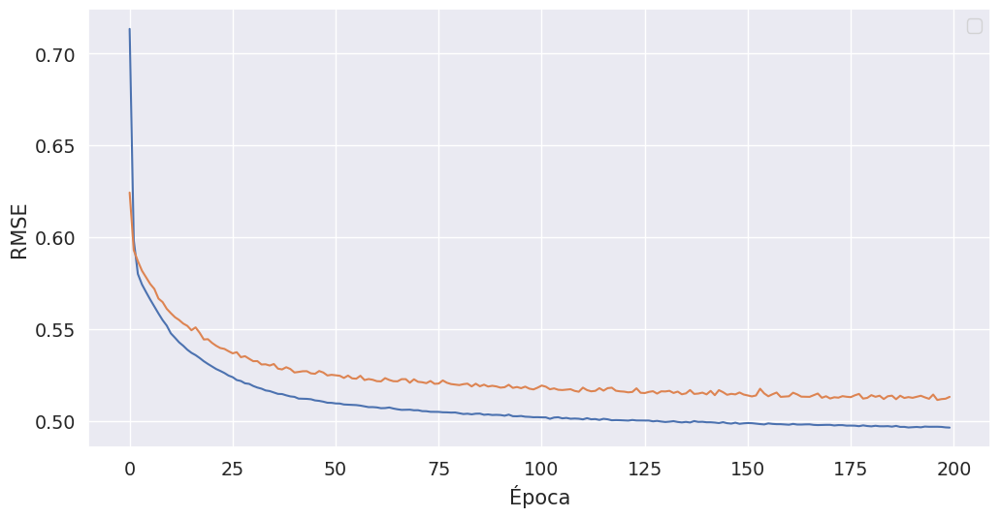

In [47]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Vemos que el aprendizaje es mucho menos errático.

Ahora intentemos complejizar el modelo agregando una capa más

In [48]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(10, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/100
   32/12384 [..............................] - ETA: 36s - loss: 2.2250

 1440/12384 [==>...........................] - ETA: 1s - loss: 1.8659 

 2880/12384 [=====>........................] - ETA: 0s - loss: 1.4752

 4352/12384 [=========>....................] - ETA: 0s - loss: 1.2269

 5888/12384 [=============>................] - ETA: 0s - loss: 1.0528

 7520/12384 [=================>............] - ETA: 0s - loss: 0.9384

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.8596

10592/12384 [========================>.....] - ETA: 0s - loss: 0.8082

12064/12384 [============================>.] - ETA: 0s - loss: 0.7677

12384/12384 [==============================] - 1s 58us/step - loss: 0.7595 - val_loss: 0.4446


Epoch 2/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4200

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.4130

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.4034

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.4101

 6048/12384 [=============>................] - ETA: 0s - loss: 0.3965

 7392/12384 [================>.............] - ETA: 0s - loss: 0.3900

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.3828

10240/12384 [=======================>......] - ETA: 0s - loss: 0.3790

11904/12384 [===========================>..] - ETA: 0s - loss: 0.3740

12384/12384 [==============================] - 1s 50us/step - loss: 0.3765 - val_loss: 0.3529


Epoch 3/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1826

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.3587

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.3585

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.3483

 6112/12384 [=============>................] - ETA: 0s - loss: 0.3455

 7616/12384 [=================>............] - ETA: 0s - loss: 0.3365

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.3323

10720/12384 [========================>.....] - ETA: 0s - loss: 0.3263

12256/12384 [============================>.] - ETA: 0s - loss: 0.3273

12384/12384 [==============================] - 1s 48us/step - loss: 0.3269 - val_loss: 0.3268


Epoch 4/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5517

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.3275

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.3172

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.3096

 5952/12384 [=============>................] - ETA: 0s - loss: 0.3041

 7424/12384 [================>.............] - ETA: 0s - loss: 0.3066

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.3045

10432/12384 [========================>.....] - ETA: 0s - loss: 0.3092

11904/12384 [===========================>..] - ETA: 0s - loss: 0.3080

12384/12384 [==============================] - 1s 48us/step - loss: 0.3067 - val_loss: 0.3101


Epoch 5/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2121

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2611

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2904

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2945

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2909

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2918

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2941

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2951

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2937

12384/12384 [==============================] - 1s 51us/step - loss: 0.2945 - val_loss: 0.3014


Epoch 6/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1904

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2592

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2757

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2773

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2761

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2764

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2830

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2855

12192/12384 [============================>.] - ETA: 0s - loss: 0.2869

12384/12384 [==============================] - 1s 48us/step - loss: 0.2865 - val_loss: 0.2942


Epoch 7/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3061

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2795

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2728

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2723

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2794

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2755

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2770

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2787

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2784

12384/12384 [==============================] - 1s 50us/step - loss: 0.2807 - val_loss: 0.2902


Epoch 8/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1932

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2641

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2735

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2729

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2820

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2822

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2832

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2785

12384/12384 [==============================] - 1s 46us/step - loss: 0.2758 - val_loss: 0.2854


Epoch 9/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1318

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2756

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2533

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2600

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2643

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2658

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2684

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2671

12000/12384 [============================>.] - ETA: 0s - loss: 0.2712

12384/12384 [==============================] - 1s 47us/step - loss: 0.2716 - val_loss: 0.2822


Epoch 10/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4188

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2419

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2477

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2543

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2590

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2642

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2670



10560/12384 [========================>.....] - ETA: 0s - loss: 0.2672

12032/12384 [============================>.] - ETA: 0s - loss: 0.2696

12384/12384 [==============================] - 1s 47us/step - loss: 0.2684 - val_loss: 0.2809


Epoch 11/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3983

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2920

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2860

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2798

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2769

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2738

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2668

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2656

12224/12384 [============================>.] - ETA: 0s - loss: 0.2660

12384/12384 [==============================] - 1s 46us/step - loss: 0.2657 - val_loss: 0.2779


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1273

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2796

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2872

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2739

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2687

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2649

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2629

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2638

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2618

12384/12384 [==============================] - 1s 50us/step - loss: 0.2636 - val_loss: 0.2775


Epoch 13/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0825

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2525

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2521

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2557

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2615



 7232/12384 [================>.............] - ETA: 0s - loss: 0.2609

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2627

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2609

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2619

12384/12384 [==============================] - 1s 47us/step - loss: 0.2621 - val_loss: 0.2742


Epoch 14/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2130

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2635

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2560

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2504

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2562

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2584

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2620

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2593

12256/12384 [============================>.] - ETA: 0s - loss: 0.2608

12384/12384 [==============================] - 1s 48us/step - loss: 0.2599 - val_loss: 0.2738


Epoch 15/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2373

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2637

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2649

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2632

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2629

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2686

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2659

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2593

12096/12384 [============================>.] - ETA: 0s - loss: 0.2582

12384/12384 [==============================] - 1s 47us/step - loss: 0.2585 - val_loss: 0.2713


Epoch 16/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3494

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2520

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2564

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2534

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2526

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2530

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2549

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2564

12096/12384 [============================>.] - ETA: 0s - loss: 0.2564

12384/12384 [==============================] - 1s 48us/step - loss: 0.2574 - val_loss: 0.2726


Epoch 17/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1277

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2514

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2628

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2574

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2565

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2558

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2537

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2549

12288/12384 [============================>.] - ETA: 0s - loss: 0.2566

12384/12384 [==============================] - 1s 49us/step - loss: 0.2563 - val_loss: 0.2688


Epoch 18/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2760

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2697

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2500

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2466

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2522

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2534

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2507

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2546

12384/12384 [==============================] - 1s 46us/step - loss: 0.2553 - val_loss: 0.2720


Epoch 19/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5397

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2664

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2636

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2594

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2543

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2561

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2572

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2551

12288/12384 [============================>.] - ETA: 0s - loss: 0.2542

12384/12384 [==============================] - 1s 48us/step - loss: 0.2544 - val_loss: 0.2676


Epoch 20/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2070

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2537

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2572

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2604

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2643

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2595

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2565

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2550

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2548

12384/12384 [==============================] - 1s 47us/step - loss: 0.2534 - val_loss: 0.2660


Epoch 21/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2166

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2712

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2747

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2728

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2593

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2528

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2531

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2528

12000/12384 [============================>.] - ETA: 0s - loss: 0.2524

12384/12384 [==============================] - 1s 46us/step - loss: 0.2518 - val_loss: 0.2661


Epoch 22/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2539

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2779

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2701

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2664

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2580

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2538

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2500

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2496

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2509

12384/12384 [==============================] - 1s 49us/step - loss: 0.2509 - val_loss: 0.2654


Epoch 23/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3736

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2494

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2410

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2437

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2484

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2456

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2480

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2488

12096/12384 [============================>.] - ETA: 0s - loss: 0.2504

12384/12384 [==============================] - 1s 49us/step - loss: 0.2503 - val_loss: 0.2650


Epoch 24/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0839

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2406

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2500

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2458

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2424

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2433

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2435

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2461

12000/12384 [============================>.] - ETA: 0s - loss: 0.2488

12384/12384 [==============================] - 1s 48us/step - loss: 0.2498 - val_loss: 0.2660


Epoch 25/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3718

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2433

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2506

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2554

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2591

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2635

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2577

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2546

12384/12384 [==============================] - 1s 47us/step - loss: 0.2497 - val_loss: 0.2641


Epoch 26/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1583

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2599

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2551

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2496

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2531

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2492

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2500

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2497

12128/12384 [============================>.] - ETA: 0s - loss: 0.2476

12384/12384 [==============================] - 1s 47us/step - loss: 0.2487 - val_loss: 0.2631


Epoch 27/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4047

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2314

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2283

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2322

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2386

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2422

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2460



10368/12384 [========================>.....] - ETA: 0s - loss: 0.2454

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2469

12384/12384 [==============================] - 1s 49us/step - loss: 0.2479 - val_loss: 0.2636


Epoch 28/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1155

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2195

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2392

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2399

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2423

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2435

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2463

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2448

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2475

12384/12384 [==============================] - 1s 50us/step - loss: 0.2477 - val_loss: 0.2628


Epoch 29/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1545

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2443

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2441

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2394

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2446

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2398

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2419

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2436

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2441

12384/12384 [==============================] - 1s 49us/step - loss: 0.2469 - val_loss: 0.2631


Epoch 30/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1163

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2322

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2388

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2414

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2409

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2464

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2467

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 47us/step - loss: 0.2465 - val_loss: 0.2633


Epoch 31/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2280

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2459

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2483

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2471

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2471

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2471

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2447

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2450

12288/12384 [============================>.] - ETA: 0s - loss: 0.2463

12384/12384 [==============================] - 1s 46us/step - loss: 0.2463 - val_loss: 0.2609


Epoch 32/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1329

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2407

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2568

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2523

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2508

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2459

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2449

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2451

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2427

12384/12384 [==============================] - 1s 49us/step - loss: 0.2452 - val_loss: 0.2610


Epoch 33/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4532

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2392

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2419

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2522

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2497

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2470

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2464

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2455

12320/12384 [============================>.] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 46us/step - loss: 0.2448 - val_loss: 0.2599


Epoch 34/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2114

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2514

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2472

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2531

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2479

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2452

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2454

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2449

12288/12384 [============================>.] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 49us/step - loss: 0.2441 - val_loss: 0.2600


Epoch 35/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2392

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2653

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2538

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2497

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2473

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2467

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2459

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2433

12384/12384 [==============================] - 1s 46us/step - loss: 0.2435 - val_loss: 0.2586


Epoch 36/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2813

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2115

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2300

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2420

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2440

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2445

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2459

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2463

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 48us/step - loss: 0.2431 - val_loss: 0.2590


Epoch 37/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2777

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2437

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2428

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2390

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2415

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2342

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2375

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2409

12128/12384 [============================>.] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 48us/step - loss: 0.2424 - val_loss: 0.2580


Epoch 38/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2137

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2807

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2622

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2524

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2488

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2498

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2470

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2479

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2437

12384/12384 [==============================] - 1s 48us/step - loss: 0.2415 - val_loss: 0.2568


Epoch 39/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2109

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2260

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2270

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2307

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2291

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2326



 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2338

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2370

12160/12384 [============================>.] - ETA: 0s - loss: 0.2411

12384/12384 [==============================] - 1s 47us/step - loss: 0.2409 - val_loss: 0.2563


Epoch 40/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3146

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2362

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2434

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2387

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2414

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2445

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2410

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2392

12192/12384 [============================>.] - ETA: 0s - loss: 0.2396

12384/12384 [==============================] - 1s 47us/step - loss: 0.2407 - val_loss: 0.2562


Epoch 41/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4060

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2517

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2540

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2457

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2433

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2399

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2451

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2414

12288/12384 [============================>.] - ETA: 0s - loss: 0.2397

12384/12384 [==============================] - 1s 47us/step - loss: 0.2398 - val_loss: 0.2577


Epoch 42/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3053

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2351

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2267

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2330

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2314

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2351

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2379

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 47us/step - loss: 0.2400 - val_loss: 0.2552


Epoch 43/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4365

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2406

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2358

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2373

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2328

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2376

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2340

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2386



12096/12384 [============================>.] - ETA: 0s - loss: 0.2383

12384/12384 [==============================] - 1s 48us/step - loss: 0.2389 - val_loss: 0.2556


Epoch 44/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2130

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2274

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2314

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2394

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2464

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2491

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2453

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 47us/step - loss: 0.2387 - val_loss: 0.2539


Epoch 45/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1733

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2015

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2148

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2195

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2242

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2301

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2306

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2341

12224/12384 [============================>.] - ETA: 0s - loss: 0.2374

12384/12384 [==============================] - 1s 47us/step - loss: 0.2379 - val_loss: 0.2537


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1756

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2540

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2467

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2449

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2388

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2422

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2402

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2354

12160/12384 [============================>.] - ETA: 0s - loss: 0.2372

12384/12384 [==============================] - 1s 48us/step - loss: 0.2370 - val_loss: 0.2544


Epoch 47/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2111

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2477

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2271

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2384

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2367

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2359



10816/12384 [=========================>....] - ETA: 0s - loss: 0.2369

12384/12384 [==============================] - 1s 44us/step - loss: 0.2363 - val_loss: 0.2522


Epoch 48/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1201

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2513

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2402

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2486

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2425

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2333

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2354

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2340

12320/12384 [============================>.] - ETA: 0s - loss: 0.2358

12384/12384 [==============================] - 1s 49us/step - loss: 0.2354 - val_loss: 0.2513


Epoch 49/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0827

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2376

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2402

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2312

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2352

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2380

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2367

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 46us/step - loss: 0.2349 - val_loss: 0.2502


Epoch 50/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2648

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2158

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2524

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2428

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2462

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2401

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2380

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2336

12032/12384 [============================>.] - ETA: 0s - loss: 0.2342

12384/12384 [==============================] - 1s 48us/step - loss: 0.2344 - val_loss: 0.2496


Epoch 51/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4419

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2153

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2369

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2314

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2394

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2338

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2367

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2360

12128/12384 [============================>.] - ETA: 0s - loss: 0.2336

12384/12384 [==============================] - 1s 49us/step - loss: 0.2339 - val_loss: 0.2494


Epoch 52/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4158

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2282

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2248

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2329

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2372

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2350

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2355

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2346

12320/12384 [============================>.] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 48us/step - loss: 0.2329 - val_loss: 0.2480


Epoch 53/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3221

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2318

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2247

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2313

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2262

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2257

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2280

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2296

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2307

12384/12384 [==============================] - 1s 50us/step - loss: 0.2325 - val_loss: 0.2497


Epoch 54/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1239

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2306

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2206

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2185

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2206

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2249



 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2240

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2278

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2310

12384/12384 [==============================] - 1s 48us/step - loss: 0.2320 - val_loss: 0.2465


Epoch 55/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1429

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2165

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2243

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2296

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2370

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2334

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2319

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2322



11776/12384 [===========================>..] - ETA: 0s - loss: 0.2320

12384/12384 [==============================] - 1s 48us/step - loss: 0.2312 - val_loss: 0.2455


Epoch 56/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1817

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2221

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2299

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2188

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2317

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2321

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2337

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2325

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2307

12384/12384 [==============================] - 1s 48us/step - loss: 0.2306 - val_loss: 0.2471


Epoch 57/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1586

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2520

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2361

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2383

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2343

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2294

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2287

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 46us/step - loss: 0.2302 - val_loss: 0.2465


Epoch 58/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1353

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2468

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2286

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2282

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2238

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2229

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2243

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2280

12320/12384 [============================>.] - ETA: 0s - loss: 0.2297

12384/12384 [==============================] - 1s 47us/step - loss: 0.2301 - val_loss: 0.2438


Epoch 59/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2103

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2428

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2303

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2237

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2301

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2273

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2281

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2276

12128/12384 [============================>.] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 49us/step - loss: 0.2293 - val_loss: 0.2441


Epoch 60/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1081

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2316

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2342

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2365

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2355

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2321

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2296

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2314

12160/12384 [============================>.] - ETA: 0s - loss: 0.2294

12384/12384 [==============================] - 1s 47us/step - loss: 0.2287 - val_loss: 0.2445


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3467

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2475

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2318

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2308

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2213

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2257

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2299

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2293

12384/12384 [==============================] - 1s 46us/step - loss: 0.2290 - val_loss: 0.2425


Epoch 62/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2663

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2167

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2116

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2167

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2237

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2253

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2256

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2257

12384/12384 [==============================] - 1s 47us/step - loss: 0.2279 - val_loss: 0.2413


Epoch 63/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1673

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2349

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2250

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2275

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2253

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2291

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2298

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2284

12192/12384 [============================>.] - ETA: 0s - loss: 0.2283

12384/12384 [==============================] - 1s 47us/step - loss: 0.2277 - val_loss: 0.2404


Epoch 64/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1816

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.1990

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2081

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2128

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2129

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2148

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2248



10848/12384 [=========================>....] - ETA: 0s - loss: 0.2239

12352/12384 [============================>.] - ETA: 0s - loss: 0.2271

12384/12384 [==============================] - 1s 46us/step - loss: 0.2270 - val_loss: 0.2405


Epoch 65/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1596

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2206

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2231

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2279

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2295

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2317

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2285

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2293

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2289

12384/12384 [==============================] - 1s 51us/step - loss: 0.2269 - val_loss: 0.2404


Epoch 66/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1852

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2329

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2306

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2233

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2252

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2281

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2277

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2296

12352/12384 [============================>.] - ETA: 0s - loss: 0.2262

12384/12384 [==============================] - 1s 48us/step - loss: 0.2261 - val_loss: 0.2409


Epoch 67/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2560

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2354

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2394

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2307

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2275

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2215

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2229

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2238

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2263

12384/12384 [==============================] - 1s 48us/step - loss: 0.2266 - val_loss: 0.2396


Epoch 68/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2553

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.1925

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2126

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2235

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2210

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2236

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2250

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2236

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2235

12384/12384 [==============================] - 1s 52us/step - loss: 0.2264 - val_loss: 0.2408


Epoch 69/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1309

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2476

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2421

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2358

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2308

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2239

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2245

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2269

12384/12384 [==============================] - 1s 46us/step - loss: 0.2258 - val_loss: 0.2391


Epoch 70/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3188

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2310

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2293

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2263

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2276

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2305

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2292

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2296

12384/12384 [==============================] - 1s 47us/step - loss: 0.2253 - val_loss: 0.2413


Epoch 71/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2784

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2235

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2225

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2198

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2255

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2278

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2282

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2246

12384/12384 [==============================] - 1s 47us/step - loss: 0.2252 - val_loss: 0.2383


Epoch 72/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1092

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2387

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2379

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2273

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2224

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2189

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2218

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2235

12032/12384 [============================>.] - ETA: 0s - loss: 0.2260

12384/12384 [==============================] - 1s 48us/step - loss: 0.2247 - val_loss: 0.2376


Epoch 73/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1617

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2225

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2200

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2222

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2244

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2235

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2249

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2234

12352/12384 [============================>.] - ETA: 0s - loss: 0.2252

12384/12384 [==============================] - 1s 48us/step - loss: 0.2251 - val_loss: 0.2389


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1157

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2097

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2127

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2149

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2188

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2179

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2223

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2240

12160/12384 [============================>.] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 48us/step - loss: 0.2248 - val_loss: 0.2373


Epoch 75/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1330

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2160

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2222

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2269

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2269

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2273

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2284

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2250

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2249

12384/12384 [==============================] - 1s 50us/step - loss: 0.2244 - val_loss: 0.2380


Epoch 76/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1706

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2354

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2301

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2249

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2277

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2239

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2264

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2264

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2261

12384/12384 [==============================] - 1s 50us/step - loss: 0.2244 - val_loss: 0.2364


Epoch 77/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1502

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2034

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2130

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2164

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2223

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2192

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2206

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2243

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2241

12384/12384 [==============================] - 1s 51us/step - loss: 0.2239 - val_loss: 0.2362


Epoch 78/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1259

 1216/12384 [=>............................] - ETA: 0s - loss: 0.2285

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2258

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2148

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2176

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2166

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2187

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2208

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2217

12384/12384 [==============================] - 1s 51us/step - loss: 0.2235 - val_loss: 0.2359


Epoch 79/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1987

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2063

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2144

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2182

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2185

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2213

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2235

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 48us/step - loss: 0.2235 - val_loss: 0.2363


Epoch 80/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2013

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2050

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2170

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2246

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2228

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2233

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2235

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2249

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2246

12384/12384 [==============================] - 1s 49us/step - loss: 0.2233 - val_loss: 0.2360


Epoch 81/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2217

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2200

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2249

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2265

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2288

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2225

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2207

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2210

12032/12384 [============================>.] - ETA: 0s - loss: 0.2231

12384/12384 [==============================] - 1s 48us/step - loss: 0.2233 - val_loss: 0.2361


Epoch 82/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2436

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1976

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2127

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2221

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2222

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2157

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2205

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2215

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2199

12384/12384 [==============================] - 1s 49us/step - loss: 0.2226 - val_loss: 0.2373


Epoch 83/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3216

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2258

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2369

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2301

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2265

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2214

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2239

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2258

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 48us/step - loss: 0.2226 - val_loss: 0.2376


Epoch 84/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2658

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2501

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2300

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2315

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2319

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2266

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2244

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2230

12384/12384 [==============================] - 1s 47us/step - loss: 0.2223 - val_loss: 0.2358


Epoch 85/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1945

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2169

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2259

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2191

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2254

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2220

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2218

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2194

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2216

12384/12384 [==============================] - 1s 50us/step - loss: 0.2220 - val_loss: 0.2341


Epoch 86/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1395

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2364

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2270

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2183

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2162

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2178

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2182

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2180

12352/12384 [============================>.] - ETA: 0s - loss: 0.2213

12384/12384 [==============================] - 1s 46us/step - loss: 0.2213 - val_loss: 0.2353


Epoch 87/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1742

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2262

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2240

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2236

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2244

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2206

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2168

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2184

12384/12384 [==============================] - 1s 46us/step - loss: 0.2208 - val_loss: 0.2350


Epoch 88/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1869

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2122

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2125

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2187

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2226

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2240

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2260

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2221

12384/12384 [==============================] - 1s 47us/step - loss: 0.2204 - val_loss: 0.2340


Epoch 89/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1861

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2358

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2229

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2154

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2199

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2247

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2225

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2224

12384/12384 [==============================] - 1s 46us/step - loss: 0.2208 - val_loss: 0.2350


Epoch 90/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1021

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2076

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2036

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2165

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2265

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2246

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2228

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2216

12384/12384 [==============================] - 1s 47us/step - loss: 0.2194 - val_loss: 0.2340


Epoch 91/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2077

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2304

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2212

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2236

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2203

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2169

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2156

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2153

12064/12384 [============================>.] - ETA: 0s - loss: 0.2190

12384/12384 [==============================] - 1s 47us/step - loss: 0.2195 - val_loss: 0.2314


Epoch 92/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1834

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2468

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2299

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2299

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2255

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2232

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2208

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2187

12320/12384 [============================>.] - ETA: 0s - loss: 0.2189

12384/12384 [==============================] - 1s 45us/step - loss: 0.2188 - val_loss: 0.2332


Epoch 93/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0895

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1917

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2064

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2117

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2136

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2137

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2179

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2185

12224/12384 [============================>.] - ETA: 0s - loss: 0.2187

12384/12384 [==============================] - 1s 47us/step - loss: 0.2184 - val_loss: 0.2312


Epoch 94/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2538

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2198

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2193

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2206

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2270

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2250

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2207

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2154

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2173

12384/12384 [==============================] - 1s 49us/step - loss: 0.2171 - val_loss: 0.2295


Epoch 95/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2071

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2094

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2067

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2149

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2121

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2129

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2172

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2178

12384/12384 [==============================] - 1s 45us/step - loss: 0.2172 - val_loss: 0.2293


Epoch 96/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1647

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2294

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2142

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2156

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2144

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2173

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2182

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2199

12128/12384 [============================>.] - ETA: 0s - loss: 0.2168

12384/12384 [==============================] - 1s 49us/step - loss: 0.2167 - val_loss: 0.2324


Epoch 97/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1163

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2003

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2016

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2034

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2134

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2104

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2105

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2107

12256/12384 [============================>.] - ETA: 0s - loss: 0.2162

12384/12384 [==============================] - 1s 48us/step - loss: 0.2162 - val_loss: 0.2292


Epoch 98/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1805

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.1826

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.1881

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.1991

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2065

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2066

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2129

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2154

12384/12384 [==============================] - 1s 47us/step - loss: 0.2154 - val_loss: 0.2285


Epoch 99/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3055

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2088

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2190

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2152

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2146

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2139

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2117

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2132

12384/12384 [==============================] - 1s 45us/step - loss: 0.2154 - val_loss: 0.2279


Epoch 100/100


   32/12384 [..............................] - ETA: 1s - loss: 0.2986

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2125

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2222

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2159

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2180

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2171

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2188

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2166

12352/12384 [============================>.] - ETA: 0s - loss: 0.2153

12384/12384 [==============================] - 1s 48us/step - loss: 0.2152 - val_loss: 0.2281


No handles with labels found to put in legend.


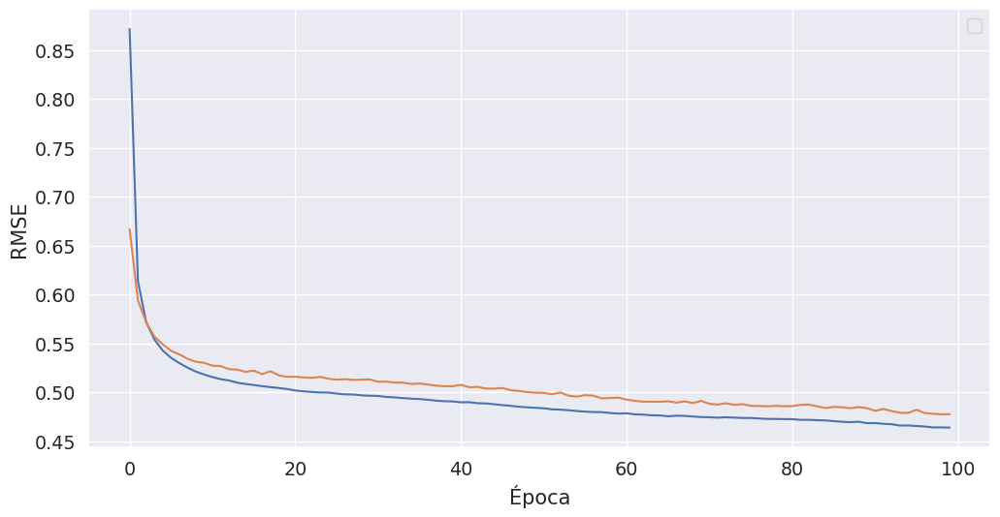

In [49]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

In [50]:
california_df_ld = pd.DataFrame(california.data, columns=california.feature_names)

Voy a tomar menos datos y voy a agregar más parámetros a mi red: Qué puede pasar cuando tengo menos cantidad de datos y más cantidad de parámetros a entrenar? Qué puede malir sal?

In [51]:
X = scaled_california_df[0:10000].drop("MedHouseVal", axis=1)
y = scaled_california_df[0:10000].filter(items=["MedHouseVal"])

In [52]:
X_train, X_validation, y_train, y_validation = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [53]:
model = Sequential()
model.add(Dense(50, activation='tanh', input_shape=(8,)))
model.add(Dense(20, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 14s - loss: 2.1714

1536/6000 [======>.......................] - ETA: 0s - loss: 0.7511 

3040/6000 [==============>...............] - ETA: 0s - loss: 0.5764

4576/6000 [=====================>........] - ETA: 0s - loss: 0.5133

6000/6000 [==============================] - 0s 64us/step - loss: 0.4736 - val_loss: 0.3326


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2251

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3400

2976/6000 [=============>................] - ETA: 0s - loss: 0.3484

4512/6000 [=====================>........] - ETA: 0s - loss: 0.3420

6000/6000 [==============================] - 0s 50us/step - loss: 0.3375 - val_loss: 0.3080


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2119

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3466

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3313

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3155

5952/6000 [============================>.] - ETA: 0s - loss: 0.3236

6000/6000 [==============================] - 0s 51us/step - loss: 0.3234 - val_loss: 0.3068


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 1.1253

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3382

2944/6000 [=============>................] - ETA: 0s - loss: 0.3232

4544/6000 [=====================>........] - ETA: 0s - loss: 0.3175

6000/6000 [==============================] - 0s 50us/step - loss: 0.3088 - val_loss: 0.2849


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4279

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2943

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2874

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2859

6000/6000 [==============================] - 0s 49us/step - loss: 0.2954 - val_loss: 0.2733


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2521

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3261

2848/6000 [=============>................] - ETA: 0s - loss: 0.3052

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2882

5856/6000 [============================>.] - ETA: 0s - loss: 0.2826

6000/6000 [==============================] - 0s 51us/step - loss: 0.2824 - val_loss: 0.2747


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1834

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2551

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2631

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2597

5984/6000 [============================>.] - ETA: 0s - loss: 0.2730

6000/6000 [==============================] - 0s 50us/step - loss: 0.2729 - val_loss: 0.2619


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1790

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2793

2944/6000 [=============>................] - ETA: 0s - loss: 0.2611

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2601

6000/6000 [==============================] - 0s 50us/step - loss: 0.2650 - val_loss: 0.2515


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3658

1664/6000 [=======>......................] - ETA: 0s - loss: 0.2414

3232/6000 [===============>..............] - ETA: 0s - loss: 0.2531

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2584

6000/6000 [==============================] - 0s 49us/step - loss: 0.2575 - val_loss: 0.2552


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2645

2880/6000 [=============>................] - ETA: 0s - loss: 0.2615

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2550

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2511

6000/6000 [==============================] - 0s 52us/step - loss: 0.2507 - val_loss: 0.2518


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2478

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2637

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2542

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2450

6000/6000 [==============================] - 0s 50us/step - loss: 0.2453 - val_loss: 0.2393


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0651

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2422

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2417

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2345

6000/6000 [==============================] - 0s 50us/step - loss: 0.2364 - val_loss: 0.2441


Epoch 13/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2187

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2615

2944/6000 [=============>................] - ETA: 0s - loss: 0.2379

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2354

5888/6000 [============================>.] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 51us/step - loss: 0.2332 - val_loss: 0.2349


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1575

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2178

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2372

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 51us/step - loss: 0.2298 - val_loss: 0.2308


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2331

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2328

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2219

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2227

5824/6000 [============================>.] - ETA: 0s - loss: 0.2244

6000/6000 [==============================] - 0s 55us/step - loss: 0.2251 - val_loss: 0.2312


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2333

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2486

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2303

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 50us/step - loss: 0.2214 - val_loss: 0.2256


Epoch 17/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2040

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2116

2880/6000 [=============>................] - ETA: 0s - loss: 0.2212

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2194

6000/6000 [==============================] - 0s 51us/step - loss: 0.2183 - val_loss: 0.2265


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2038

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2119

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2172

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2133

5856/6000 [============================>.] - ETA: 0s - loss: 0.2150

6000/6000 [==============================] - 0s 52us/step - loss: 0.2162 - val_loss: 0.2244


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2039

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2206

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2140

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2178

6000/6000 [==============================] - 0s 50us/step - loss: 0.2131 - val_loss: 0.2219


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1429

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2307

2816/6000 [=============>................] - ETA: 0s - loss: 0.2313

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2167

5824/6000 [============================>.] - ETA: 0s - loss: 0.2126

6000/6000 [==============================] - 0s 51us/step - loss: 0.2137 - val_loss: 0.2251


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0876

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2074

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2133

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2047

6000/6000 [==============================] - 0s 50us/step - loss: 0.2126 - val_loss: 0.2163


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3075

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2301

2976/6000 [=============>................] - ETA: 0s - loss: 0.2114

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2049

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2069

6000/6000 [==============================] - 0s 51us/step - loss: 0.2073 - val_loss: 0.2204


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0762

1664/6000 [=======>......................] - ETA: 0s - loss: 0.2069

3296/6000 [===============>..............] - ETA: 0s - loss: 0.2080

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2076

6000/6000 [==============================] - 0s 47us/step - loss: 0.2079 - val_loss: 0.2143


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3899

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2038

2912/6000 [=============>................] - ETA: 0s - loss: 0.2060

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2058

5824/6000 [============================>.] - ETA: 0s - loss: 0.2041

6000/6000 [==============================] - 0s 51us/step - loss: 0.2064 - val_loss: 0.2151


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1744

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1924

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2000

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2064

6000/6000 [==============================] - 0s 50us/step - loss: 0.2049 - val_loss: 0.2163


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2374

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1902

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2067

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2029

6000/6000 [==============================] - 0s 50us/step - loss: 0.2049 - val_loss: 0.2236


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1423

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2069

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2042

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2078

6000/6000 [==============================] - 0s 48us/step - loss: 0.2052 - val_loss: 0.2113


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1995

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1933

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2002

6000/6000 [==============================] - 0s 50us/step - loss: 0.2031 - val_loss: 0.2156


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715



1504/6000 [======>.......................] - ETA: 0s - loss: 0.2015

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2085

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2025

6000/6000 [==============================] - 0s 51us/step - loss: 0.2022 - val_loss: 0.2084


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4875

1696/6000 [=======>......................] - ETA: 0s - loss: 0.2002

2912/6000 [=============>................] - ETA: 0s - loss: 0.2097

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2003

5888/6000 [============================>.] - ETA: 0s - loss: 0.1990

6000/6000 [==============================] - 0s 51us/step - loss: 0.2000 - val_loss: 0.2137


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2267

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1889

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1981

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 49us/step - loss: 0.1999 - val_loss: 0.2063


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1113

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1816

2912/6000 [=============>................] - ETA: 0s - loss: 0.1911

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1968

5824/6000 [============================>.] - ETA: 0s - loss: 0.1983

6000/6000 [==============================] - 0s 51us/step - loss: 0.1991 - val_loss: 0.2085


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1303

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1907

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1942

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1946

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1969

6000/6000 [==============================] - 0s 53us/step - loss: 0.1983 - val_loss: 0.2080


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2025

2816/6000 [=============>................] - ETA: 0s - loss: 0.2100

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2034

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2004

6000/6000 [==============================] - 0s 51us/step - loss: 0.1993 - val_loss: 0.2106


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1478

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1912

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1899

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1976

5952/6000 [============================>.] - ETA: 0s - loss: 0.1987

6000/6000 [==============================] - 0s 52us/step - loss: 0.1979 - val_loss: 0.2073


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0742

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1945

2944/6000 [=============>................] - ETA: 0s - loss: 0.2025

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1964

5856/6000 [============================>.] - ETA: 0s - loss: 0.1978

6000/6000 [==============================] - 0s 52us/step - loss: 0.1962 - val_loss: 0.2125


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2243

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1990

2976/6000 [=============>................] - ETA: 0s - loss: 0.1930

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1970

6000/6000 [==============================] - 0s 49us/step - loss: 0.1957 - val_loss: 0.2148


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3051

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2044

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1935

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1902

6000/6000 [==============================] - 0s 49us/step - loss: 0.1957 - val_loss: 0.2055


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2280

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1929

3232/6000 [===============>..............] - ETA: 0s - loss: 0.2059

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1982

6000/6000 [==============================] - 0s 48us/step - loss: 0.1940 - val_loss: 0.2051


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2813

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2058

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1985

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1971

6000/6000 [==============================] - 0s 50us/step - loss: 0.1941 - val_loss: 0.2085


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0964

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1879

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1961

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1942

6000/6000 [==============================] - 0s 47us/step - loss: 0.1938 - val_loss: 0.2068


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1454

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1795

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1900

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1952

6000/6000 [==============================] - 0s 48us/step - loss: 0.1930 - val_loss: 0.2018


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1726

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1718

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1837

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 50us/step - loss: 0.1935 - val_loss: 0.2062


Epoch 44/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2407

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1723

2848/6000 [=============>................] - ETA: 0s - loss: 0.1966

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1899

5824/6000 [============================>.] - ETA: 0s - loss: 0.1942

6000/6000 [==============================] - 0s 51us/step - loss: 0.1930 - val_loss: 0.2021


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1883

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2005

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1924

6000/6000 [==============================] - 0s 49us/step - loss: 0.1914 - val_loss: 0.2053


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5423

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2089

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1972

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1917

5952/6000 [============================>.] - ETA: 0s - loss: 0.1927

6000/6000 [==============================] - 0s 52us/step - loss: 0.1927 - val_loss: 0.2057


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1501

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1906

2944/6000 [=============>................] - ETA: 0s - loss: 0.1861

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1869

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1901

6000/6000 [==============================] - 0s 52us/step - loss: 0.1919 - val_loss: 0.2015


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1847

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2096

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1947

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1908

5952/6000 [============================>.] - ETA: 0s - loss: 0.1884

6000/6000 [==============================] - 0s 51us/step - loss: 0.1898 - val_loss: 0.2077


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1077

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1735

2880/6000 [=============>................] - ETA: 0s - loss: 0.1837

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1829

5824/6000 [============================>.] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 51us/step - loss: 0.1883 - val_loss: 0.2033


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1217

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1967

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1922

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1919

5920/6000 [============================>.] - ETA: 0s - loss: 0.1910

6000/6000 [==============================] - 0s 53us/step - loss: 0.1900 - val_loss: 0.1998


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1135

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1906

2976/6000 [=============>................] - ETA: 0s - loss: 0.1944

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1896

5920/6000 [============================>.] - ETA: 0s - loss: 0.1896

6000/6000 [==============================] - 0s 52us/step - loss: 0.1895 - val_loss: 0.2033


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3283

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1837

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1826

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1883

6000/6000 [==============================] - 0s 49us/step - loss: 0.1877 - val_loss: 0.2012


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1740

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1850

2784/6000 [============>.................] - ETA: 0s - loss: 0.1907

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1892

5888/6000 [============================>.] - ETA: 0s - loss: 0.1858

6000/6000 [==============================] - 0s 52us/step - loss: 0.1874 - val_loss: 0.2003


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2071

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1911

3744/6000 [=================>............] - ETA: 0s - loss: 0.1849

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1814

6000/6000 [==============================] - 0s 56us/step - loss: 0.1857 - val_loss: 0.2008


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2101

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1952

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1845

5920/6000 [============================>.] - ETA: 0s - loss: 0.1872

6000/6000 [==============================] - 0s 52us/step - loss: 0.1879 - val_loss: 0.2008


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3313

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1857

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1827

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1893

5984/6000 [============================>.] - ETA: 0s - loss: 0.1861

6000/6000 [==============================] - 0s 50us/step - loss: 0.1859 - val_loss: 0.2014


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2098

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1828

2880/6000 [=============>................] - ETA: 0s - loss: 0.1866

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1901

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1881

6000/6000 [==============================] - 0s 53us/step - loss: 0.1870 - val_loss: 0.2010


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1178

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1637

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1697

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1771

6000/6000 [==============================] - 0s 50us/step - loss: 0.1847 - val_loss: 0.2043


Epoch 59/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1733

2912/6000 [=============>................] - ETA: 0s - loss: 0.1754

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1784

5888/6000 [============================>.] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 52us/step - loss: 0.1848 - val_loss: 0.2030


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1544

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1575

2976/6000 [=============>................] - ETA: 0s - loss: 0.1776

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1833

5824/6000 [============================>.] - ETA: 0s - loss: 0.1837

6000/6000 [==============================] - 0s 53us/step - loss: 0.1847 - val_loss: 0.2020


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1194

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1751

2976/6000 [=============>................] - ETA: 0s - loss: 0.1758

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1832

6000/6000 [==============================] - 0s 48us/step - loss: 0.1848 - val_loss: 0.1983


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0995

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2016

2912/6000 [=============>................] - ETA: 0s - loss: 0.1796

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1807

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 53us/step - loss: 0.1838 - val_loss: 0.1983


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1938

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1917

2912/6000 [=============>................] - ETA: 0s - loss: 0.1949

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1910

5888/6000 [============================>.] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 51us/step - loss: 0.1836 - val_loss: 0.2034


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0921

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1915

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1851

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1885

6000/6000 [==============================] - 0s 49us/step - loss: 0.1842 - val_loss: 0.2014


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1769

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1905

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1871

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1844

6000/6000 [==============================] - 0s 49us/step - loss: 0.1832 - val_loss: 0.2007


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1555

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1586

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1663

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1807

6000/6000 [==============================] - 0s 47us/step - loss: 0.1822 - val_loss: 0.2014


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2480

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1804

2880/6000 [=============>................] - ETA: 0s - loss: 0.1814

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 50us/step - loss: 0.1819 - val_loss: 0.1972


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1089

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1873

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1839

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 47us/step - loss: 0.1830 - val_loss: 0.2055


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1804

2944/6000 [=============>................] - ETA: 0s - loss: 0.1920

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1887

5888/6000 [============================>.] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 51us/step - loss: 0.1827 - val_loss: 0.2006


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2141

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1795

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1803

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 48us/step - loss: 0.1803 - val_loss: 0.2026


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1185

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1753

2912/6000 [=============>................] - ETA: 0s - loss: 0.1908

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1827

5856/6000 [============================>.] - ETA: 0s - loss: 0.1819

6000/6000 [==============================] - 0s 51us/step - loss: 0.1810 - val_loss: 0.2006


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0980

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1727

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1776

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1735

5888/6000 [============================>.] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 51us/step - loss: 0.1802 - val_loss: 0.1987


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1682

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1725

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 53us/step - loss: 0.1804 - val_loss: 0.1959


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1550

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1744

2944/6000 [=============>................] - ETA: 0s - loss: 0.1835

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 49us/step - loss: 0.1798 - val_loss: 0.1956


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715



1568/6000 [======>.......................] - ETA: 0s - loss: 0.1903

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1818

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 49us/step - loss: 0.1793 - val_loss: 0.2006


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1846

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1819

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 49us/step - loss: 0.1793 - val_loss: 0.1951


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1059

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1710

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1729

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 49us/step - loss: 0.1792 - val_loss: 0.2035


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2084

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1579

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1743

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 50us/step - loss: 0.1785 - val_loss: 0.2020


Epoch 79/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2217



1536/6000 [======>.......................] - ETA: 0s - loss: 0.1859

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1791

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1712

5920/6000 [============================>.] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 50us/step - loss: 0.1775 - val_loss: 0.1991


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1834

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1761

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 46us/step - loss: 0.1772 - val_loss: 0.2024


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2039

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1710

2976/6000 [=============>................] - ETA: 0s - loss: 0.1689

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1782

6000/6000 [==============================] - 0s 51us/step - loss: 0.1783 - val_loss: 0.1954


Epoch 82/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1104

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1849

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1756

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 47us/step - loss: 0.1771 - val_loss: 0.1950


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1534

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1718

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1721

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1744

5952/6000 [============================>.] - ETA: 0s - loss: 0.1752

6000/6000 [==============================] - 0s 51us/step - loss: 0.1764 - val_loss: 0.1992


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2345

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1707

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1746

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 48us/step - loss: 0.1757 - val_loss: 0.1944


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1942

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1633

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1717

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 48us/step - loss: 0.1763 - val_loss: 0.2078


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3347

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1672

2976/6000 [=============>................] - ETA: 0s - loss: 0.1791

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1784

6000/6000 [==============================] - 0s 50us/step - loss: 0.1760 - val_loss: 0.2021


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1762

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1814

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 47us/step - loss: 0.1764 - val_loss: 0.1950


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2856

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1836

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1798

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1780

6000/6000 [==============================] - 0s 50us/step - loss: 0.1765 - val_loss: 0.1947


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1172

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1915

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1773

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1778

6000/6000 [==============================] - 0s 49us/step - loss: 0.1744 - val_loss: 0.1967


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1438

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1800

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1771

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 50us/step - loss: 0.1744 - val_loss: 0.1965


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1087



1568/6000 [======>.......................] - ETA: 0s - loss: 0.1654

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1674

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1673

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 55us/step - loss: 0.1736 - val_loss: 0.1928


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1254

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1747

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1841

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 48us/step - loss: 0.1753 - val_loss: 0.1943


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1144

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1740

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1718

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1741

6000/6000 [==============================] - 0s 47us/step - loss: 0.1745 - val_loss: 0.1949


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0914

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1591

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1692

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 48us/step - loss: 0.1740 - val_loss: 0.1952


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1192

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1823

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1803

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 49us/step - loss: 0.1747 - val_loss: 0.1949


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0798

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1715

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1688

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1654

6000/6000 [==============================] - 0s 50us/step - loss: 0.1727 - val_loss: 0.1936


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2063

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1788

2848/6000 [=============>................] - ETA: 0s - loss: 0.1797

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1815

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 53us/step - loss: 0.1740 - val_loss: 0.1948


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1128

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1604

2944/6000 [=============>................] - ETA: 0s - loss: 0.1664

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1687

5920/6000 [============================>.] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 51us/step - loss: 0.1738 - val_loss: 0.1917


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4236

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1732

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1707

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1742

6000/6000 [==============================] - 0s 47us/step - loss: 0.1723 - val_loss: 0.1957


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4936

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1755

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1784

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1736

5952/6000 [============================>.] - ETA: 0s - loss: 0.1721

6000/6000 [==============================] - 0s 51us/step - loss: 0.1727 - val_loss: 0.1920


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2092

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1531

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1612

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1683

6000/6000 [==============================] - 0s 48us/step - loss: 0.1719 - val_loss: 0.1940


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1915

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1626

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1662

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1723

6000/6000 [==============================] - 0s 49us/step - loss: 0.1709 - val_loss: 0.1947


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1706

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1792

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1747

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1743

6000/6000 [==============================] - 0s 49us/step - loss: 0.1713 - val_loss: 0.1940


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2478

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1699

2976/6000 [=============>................] - ETA: 0s - loss: 0.1748

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1735

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 54us/step - loss: 0.1714 - val_loss: 0.1924


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0571

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1827

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1781

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 50us/step - loss: 0.1718 - val_loss: 0.1926


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2075

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1605

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1676

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1756

5920/6000 [============================>.] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 51us/step - loss: 0.1704 - val_loss: 0.1936


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1209

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1779

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1625

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 49us/step - loss: 0.1709 - val_loss: 0.1968


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1128

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1712

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1778

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 50us/step - loss: 0.1707 - val_loss: 0.1899


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0762

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1655

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1586

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1652

6000/6000 [==============================] - 0s 49us/step - loss: 0.1701 - val_loss: 0.1967


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0784

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1804

2944/6000 [=============>................] - ETA: 0s - loss: 0.1673

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1642

5888/6000 [============================>.] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 50us/step - loss: 0.1703 - val_loss: 0.1915


Epoch 111/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1870

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1649

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1741

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 50us/step - loss: 0.1701 - val_loss: 0.1937


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2693

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1661

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1741

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 46us/step - loss: 0.1699 - val_loss: 0.1938


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1373

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1445

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1542

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 51us/step - loss: 0.1692 - val_loss: 0.1918


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1602

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1646

2944/6000 [=============>................] - ETA: 0s - loss: 0.1719

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1716

5888/6000 [============================>.] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 52us/step - loss: 0.1689 - val_loss: 0.1907


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1710

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1627

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 50us/step - loss: 0.1685 - val_loss: 0.1960


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2277

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1825

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1819

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1735

5824/6000 [============================>.] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 53us/step - loss: 0.1698 - val_loss: 0.1920


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0868

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1741

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1676

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1634

6000/6000 [==============================] - 0s 49us/step - loss: 0.1682 - val_loss: 0.1945


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1579

2848/6000 [=============>................] - ETA: 0s - loss: 0.1652

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1691

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 51us/step - loss: 0.1694 - val_loss: 0.1918


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1734

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1612

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1674

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1657

5920/6000 [============================>.] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 52us/step - loss: 0.1684 - val_loss: 0.1930


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3913

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1797

2848/6000 [=============>................] - ETA: 0s - loss: 0.1658

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1658

6000/6000 [==============================] - 0s 50us/step - loss: 0.1671 - val_loss: 0.1905


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2244

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1557

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1603

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 52us/step - loss: 0.1682 - val_loss: 0.1984


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2068

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1630

2912/6000 [=============>................] - ETA: 0s - loss: 0.1619

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1639

5952/6000 [============================>.] - ETA: 0s - loss: 0.1663

6000/6000 [==============================] - 0s 56us/step - loss: 0.1664 - val_loss: 0.1908


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3599

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1597

2976/6000 [=============>................] - ETA: 0s - loss: 0.1696

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1642

5888/6000 [============================>.] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 53us/step - loss: 0.1667 - val_loss: 0.1894


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3192

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1742

2880/6000 [=============>................] - ETA: 0s - loss: 0.1742

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1695

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1683

6000/6000 [==============================] - 0s 54us/step - loss: 0.1670 - val_loss: 0.2015


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1936

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1677

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1623

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1593

5920/6000 [============================>.] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 53us/step - loss: 0.1666 - val_loss: 0.1887


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1764

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1648

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1644

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1632

6000/6000 [==============================] - 0s 51us/step - loss: 0.1661 - val_loss: 0.1898


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1544

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1696

2784/6000 [============>.................] - ETA: 0s - loss: 0.1623

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1614

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1661

6000/6000 [==============================] - 0s 54us/step - loss: 0.1659 - val_loss: 0.1955


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3193

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1641

2976/6000 [=============>................] - ETA: 0s - loss: 0.1642

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1661

5920/6000 [============================>.] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 51us/step - loss: 0.1652 - val_loss: 0.1924


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1085

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1635

2912/6000 [=============>................] - ETA: 0s - loss: 0.1706

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1684

5920/6000 [============================>.] - ETA: 0s - loss: 0.1660

6000/6000 [==============================] - 0s 52us/step - loss: 0.1662 - val_loss: 0.1890


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1671

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1679

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1651

5920/6000 [============================>.] - ETA: 0s - loss: 0.1671

6000/6000 [==============================] - 0s 51us/step - loss: 0.1669 - val_loss: 0.1926


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1438

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1684

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1646

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 49us/step - loss: 0.1661 - val_loss: 0.1932


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1671

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1638

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1697

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1659

6000/6000 [==============================] - 0s 52us/step - loss: 0.1644 - val_loss: 0.1930


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1233

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1643

2880/6000 [=============>................] - ETA: 0s - loss: 0.1634

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1624

5984/6000 [============================>.] - ETA: 0s - loss: 0.1650

6000/6000 [==============================] - 0s 49us/step - loss: 0.1649 - val_loss: 0.1929


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1971

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1757

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1644

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 46us/step - loss: 0.1652 - val_loss: 0.1939


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1495

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1673

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1639

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1648

6000/6000 [==============================] - 0s 46us/step - loss: 0.1640 - val_loss: 0.1918


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4004

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1796

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1660

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 47us/step - loss: 0.1650 - val_loss: 0.1901


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2417

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1738

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1617

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1661

6000/6000 [==============================] - 0s 49us/step - loss: 0.1636 - val_loss: 0.1905


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1749

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1657

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1582

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 47us/step - loss: 0.1629 - val_loss: 0.1895


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1300

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1721

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1678

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 47us/step - loss: 0.1634 - val_loss: 0.1919


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3196

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1498

2976/6000 [=============>................] - ETA: 0s - loss: 0.1570

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1621

5888/6000 [============================>.] - ETA: 0s - loss: 0.1636

6000/6000 [==============================] - 0s 52us/step - loss: 0.1637 - val_loss: 0.1892


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0890

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1594

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1589

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1629

6000/6000 [==============================] - 0s 51us/step - loss: 0.1641 - val_loss: 0.1959


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2089

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1598

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1643

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1684

6000/6000 [==============================] - 0s 50us/step - loss: 0.1657 - val_loss: 0.1899


Epoch 143/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1864

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1762

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1731

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1661

6000/6000 [==============================] - 0s 49us/step - loss: 0.1625 - val_loss: 0.1889


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0898

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1495

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1540

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1629

6000/6000 [==============================] - 0s 49us/step - loss: 0.1632 - val_loss: 0.1854


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0876

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1608

2912/6000 [=============>................] - ETA: 0s - loss: 0.1623

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1612

5984/6000 [============================>.] - ETA: 0s - loss: 0.1632

6000/6000 [==============================] - 0s 50us/step - loss: 0.1634 - val_loss: 0.1893


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1449



3264/6000 [===============>..............] - ETA: 0s - loss: 0.1625

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1646

6000/6000 [==============================] - 0s 47us/step - loss: 0.1619 - val_loss: 0.1881


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1036

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1471

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1611

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 49us/step - loss: 0.1634 - val_loss: 0.1913


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1331

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1576

2976/6000 [=============>................] - ETA: 0s - loss: 0.1614

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1662

5952/6000 [============================>.] - ETA: 0s - loss: 0.1620

6000/6000 [==============================] - 0s 51us/step - loss: 0.1624 - val_loss: 0.1961


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0793

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1719

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1711

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1683

5824/6000 [============================>.] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 51us/step - loss: 0.1627 - val_loss: 0.1867


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1203

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1560

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1606

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1615

6000/6000 [==============================] - 0s 48us/step - loss: 0.1611 - val_loss: 0.2009


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0762

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1627

2784/6000 [============>.................] - ETA: 0s - loss: 0.1616

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1614

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1595

6000/6000 [==============================] - 0s 57us/step - loss: 0.1614 - val_loss: 0.1863


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1516

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1506

2816/6000 [=============>................] - ETA: 0s - loss: 0.1516

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1556

5856/6000 [============================>.] - ETA: 0s - loss: 0.1619

6000/6000 [==============================] - 0s 51us/step - loss: 0.1618 - val_loss: 0.1922


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1768

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1536

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1624

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1613

5920/6000 [============================>.] - ETA: 0s - loss: 0.1616

6000/6000 [==============================] - 0s 54us/step - loss: 0.1619 - val_loss: 0.1908


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1181

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1509

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1559

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1585

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1611

6000/6000 [==============================] - 0s 55us/step - loss: 0.1606 - val_loss: 0.1905


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1871

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1587

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1627

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1644

6000/6000 [==============================] - 0s 49us/step - loss: 0.1628 - val_loss: 0.1875


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1599

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1544

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 48us/step - loss: 0.1604 - val_loss: 0.1891


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2558

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1589

2976/6000 [=============>................] - ETA: 0s - loss: 0.1562

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1605

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1578

6000/6000 [==============================] - 0s 54us/step - loss: 0.1597 - val_loss: 0.1873


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1856

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1457

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1600

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1604

6000/6000 [==============================] - 0s 48us/step - loss: 0.1619 - val_loss: 0.1922


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0726

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1525

2976/6000 [=============>................] - ETA: 0s - loss: 0.1552

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1568

6000/6000 [==============================] - 0s 51us/step - loss: 0.1590 - val_loss: 0.1929


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1729

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1622

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1633

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 50us/step - loss: 0.1603 - val_loss: 0.1885


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1503

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1637

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1636

6000/6000 [==============================] - 0s 50us/step - loss: 0.1598 - val_loss: 0.1849


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2734

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1548

2944/6000 [=============>................] - ETA: 0s - loss: 0.1599

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1593

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1622

6000/6000 [==============================] - 0s 53us/step - loss: 0.1610 - val_loss: 0.1884


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1628

2848/6000 [=============>................] - ETA: 0s - loss: 0.1611

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1608

5888/6000 [============================>.] - ETA: 0s - loss: 0.1593

6000/6000 [==============================] - 0s 51us/step - loss: 0.1590 - val_loss: 0.1853


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1393

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1755

2784/6000 [============>.................] - ETA: 0s - loss: 0.1616

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1606

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 53us/step - loss: 0.1588 - val_loss: 0.1889


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0755

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1752

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1718

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1622

5952/6000 [============================>.] - ETA: 0s - loss: 0.1609

6000/6000 [==============================] - 0s 50us/step - loss: 0.1607 - val_loss: 0.1883


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0639

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1503

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1561

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1626

6000/6000 [==============================] - 0s 49us/step - loss: 0.1613 - val_loss: 0.1891


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1197

1824/6000 [========>.....................] - ETA: 0s - loss: 0.1516

3488/6000 [================>.............] - ETA: 0s - loss: 0.1567

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1549

6000/6000 [==============================] - 0s 46us/step - loss: 0.1587 - val_loss: 0.1918


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1475

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1499

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1593

6000/6000 [==============================] - 0s 49us/step - loss: 0.1586 - val_loss: 0.1879


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1259

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1625

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1522

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1579

6000/6000 [==============================] - 0s 48us/step - loss: 0.1573 - val_loss: 0.1871


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1516

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1490

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1577

6000/6000 [==============================] - 0s 47us/step - loss: 0.1575 - val_loss: 0.1879


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2248

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1607

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1616

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1609

6000/6000 [==============================] - 0s 49us/step - loss: 0.1589 - val_loss: 0.1859


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1700

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1532

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1571

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1533

5952/6000 [============================>.] - ETA: 0s - loss: 0.1572

6000/6000 [==============================] - 0s 51us/step - loss: 0.1581 - val_loss: 0.1914


Epoch 173/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1336

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1614

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1694

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1627

5952/6000 [============================>.] - ETA: 0s - loss: 0.1587

6000/6000 [==============================] - 0s 52us/step - loss: 0.1587 - val_loss: 0.1893


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1202

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1450

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1562

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1600

6000/6000 [==============================] - 0s 50us/step - loss: 0.1573 - val_loss: 0.1858


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1346

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1435

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1545

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1622

6000/6000 [==============================] - 0s 47us/step - loss: 0.1583 - val_loss: 0.1842


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2386

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1395

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1569

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1593

6000/6000 [==============================] - 0s 49us/step - loss: 0.1582 - val_loss: 0.1958


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1551

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1484

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1517

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1548

6000/6000 [==============================] - 0s 49us/step - loss: 0.1569 - val_loss: 0.1849


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1869

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1539

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1520

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1501

6000/6000 [==============================] - 0s 50us/step - loss: 0.1582 - val_loss: 0.1869


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2149

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1445

2912/6000 [=============>................] - ETA: 0s - loss: 0.1505

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1542

6000/6000 [==============================] - 0s 49us/step - loss: 0.1569 - val_loss: 0.1892


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1382

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1591

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1566

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1543

6000/6000 [==============================] - 0s 47us/step - loss: 0.1570 - val_loss: 0.1973


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1528

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1453

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1505

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1575

6000/6000 [==============================] - 0s 49us/step - loss: 0.1571 - val_loss: 0.1859


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2500

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1625

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1544

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1585

6000/6000 [==============================] - 0s 50us/step - loss: 0.1554 - val_loss: 0.1862


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1212

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1555

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1578

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1543

6000/6000 [==============================] - 0s 49us/step - loss: 0.1572 - val_loss: 0.1875


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1206

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1583

2976/6000 [=============>................] - ETA: 0s - loss: 0.1494

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1476

5952/6000 [============================>.] - ETA: 0s - loss: 0.1562

6000/6000 [==============================] - 0s 50us/step - loss: 0.1562 - val_loss: 0.1850


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1205

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1516

2976/6000 [=============>................] - ETA: 0s - loss: 0.1554

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1568

6000/6000 [==============================] - 0s 51us/step - loss: 0.1556 - val_loss: 0.1835


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2112

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1587

2688/6000 [============>.................] - ETA: 0s - loss: 0.1625

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1560

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1572

6000/6000 [==============================] - 0s 53us/step - loss: 0.1550 - val_loss: 0.1872


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1794

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1635

2976/6000 [=============>................] - ETA: 0s - loss: 0.1571

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1584

5856/6000 [============================>.] - ETA: 0s - loss: 0.1560

6000/6000 [==============================] - 0s 51us/step - loss: 0.1563 - val_loss: 0.1846


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1071

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1433

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1513

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1525

6000/6000 [==============================] - 0s 48us/step - loss: 0.1556 - val_loss: 0.1844


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1572

2944/6000 [=============>................] - ETA: 0s - loss: 0.1559

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1579

6000/6000 [==============================] - 0s 49us/step - loss: 0.1560 - val_loss: 0.1891


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0713

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1408

2976/6000 [=============>................] - ETA: 0s - loss: 0.1418

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1538

5984/6000 [============================>.] - ETA: 0s - loss: 0.1556

6000/6000 [==============================] - 0s 50us/step - loss: 0.1553 - val_loss: 0.1878


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1362

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1574

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1470

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1527

6000/6000 [==============================] - 0s 49us/step - loss: 0.1555 - val_loss: 0.1860


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0643

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1649

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1598

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1616

6000/6000 [==============================] - 0s 49us/step - loss: 0.1561 - val_loss: 0.1894


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1325

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1554

2944/6000 [=============>................] - ETA: 0s - loss: 0.1448

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1474

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1500

6000/6000 [==============================] - 0s 53us/step - loss: 0.1541 - val_loss: 0.1906


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2410

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1828

2880/6000 [=============>................] - ETA: 0s - loss: 0.1652

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1575

5920/6000 [============================>.] - ETA: 0s - loss: 0.1557

6000/6000 [==============================] - 0s 51us/step - loss: 0.1560 - val_loss: 0.1848


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2759

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1585

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1514

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1498

5920/6000 [============================>.] - ETA: 0s - loss: 0.1544

6000/6000 [==============================] - 0s 50us/step - loss: 0.1540 - val_loss: 0.1845


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4390

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1460

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1513

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1538

6000/6000 [==============================] - 0s 46us/step - loss: 0.1545 - val_loss: 0.1874


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2945

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1641

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1651

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1561

6000/6000 [==============================] - 0s 49us/step - loss: 0.1547 - val_loss: 0.1855


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0586

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1510

2944/6000 [=============>................] - ETA: 0s - loss: 0.1549

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1554

5888/6000 [============================>.] - ETA: 0s - loss: 0.1543

6000/6000 [==============================] - 0s 51us/step - loss: 0.1542 - val_loss: 0.1869


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1418

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1574

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1605

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1553

6000/6000 [==============================] - 0s 50us/step - loss: 0.1547 - val_loss: 0.1878


Epoch 200/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1340

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1402

2976/6000 [=============>................] - ETA: 0s - loss: 0.1473

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1527

5824/6000 [============================>.] - ETA: 0s - loss: 0.1557

6000/6000 [==============================] - 0s 53us/step - loss: 0.1550 - val_loss: 0.1894


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1103

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1532

2976/6000 [=============>................] - ETA: 0s - loss: 0.1507

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1492

5952/6000 [============================>.] - ETA: 0s - loss: 0.1538

6000/6000 [==============================] - 0s 51us/step - loss: 0.1535 - val_loss: 0.1856


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1997

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1419

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1409

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1497

6000/6000 [==============================] - 0s 49us/step - loss: 0.1541 - val_loss: 0.1908


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2119

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1500

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1569

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1515

5984/6000 [============================>.] - ETA: 0s - loss: 0.1536

6000/6000 [==============================] - 0s 51us/step - loss: 0.1535 - val_loss: 0.1846


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2010

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1512

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1577

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1597

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1555

6000/6000 [==============================] - 0s 52us/step - loss: 0.1530 - val_loss: 0.1880


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1854

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1417

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1494

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1483

6000/6000 [==============================] - 0s 50us/step - loss: 0.1534 - val_loss: 0.1857


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1627

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1455

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1519

6000/6000 [==============================] - 0s 49us/step - loss: 0.1528 - val_loss: 0.1855


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1527

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1294

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1397

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1545

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1537

6000/6000 [==============================] - 0s 51us/step - loss: 0.1528 - val_loss: 0.1856


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0947

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1517

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1533

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1569

6000/6000 [==============================] - 0s 50us/step - loss: 0.1532 - val_loss: 0.1906


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0635

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1476

2976/6000 [=============>................] - ETA: 0s - loss: 0.1436

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1487

5856/6000 [============================>.] - ETA: 0s - loss: 0.1533

6000/6000 [==============================] - 0s 52us/step - loss: 0.1523 - val_loss: 0.1881


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1163

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1675

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1537

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1530

5984/6000 [============================>.] - ETA: 0s - loss: 0.1536

6000/6000 [==============================] - 0s 50us/step - loss: 0.1534 - val_loss: 0.1879


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1094

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1515

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1508

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 47us/step - loss: 0.1525 - val_loss: 0.1952


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2550

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1591

2944/6000 [=============>................] - ETA: 0s - loss: 0.1599

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1558

5888/6000 [============================>.] - ETA: 0s - loss: 0.1511

6000/6000 [==============================] - 0s 52us/step - loss: 0.1515 - val_loss: 0.1865


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3760

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1630

2944/6000 [=============>................] - ETA: 0s - loss: 0.1528

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1529

5856/6000 [============================>.] - ETA: 0s - loss: 0.1527

6000/6000 [==============================] - 0s 52us/step - loss: 0.1523 - val_loss: 0.1860


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1616

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1527

2848/6000 [=============>................] - ETA: 0s - loss: 0.1565

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1509

5952/6000 [============================>.] - ETA: 0s - loss: 0.1542

6000/6000 [==============================] - 0s 50us/step - loss: 0.1542 - val_loss: 0.1845


Epoch 215/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1889

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1492

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1501

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1530

6000/6000 [==============================] - 0s 48us/step - loss: 0.1517 - val_loss: 0.1864


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0812

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1422

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1484

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1518

6000/6000 [==============================] - 0s 49us/step - loss: 0.1515 - val_loss: 0.1903


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1216

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1489

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1578

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1519

6000/6000 [==============================] - 0s 49us/step - loss: 0.1512 - val_loss: 0.1852


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1549

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1459

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1475

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1486

6000/6000 [==============================] - 0s 50us/step - loss: 0.1514 - val_loss: 0.1839


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1191

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1411

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1418

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1491

6000/6000 [==============================] - 0s 50us/step - loss: 0.1517 - val_loss: 0.1848


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2781

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1669

2976/6000 [=============>................] - ETA: 0s - loss: 0.1570

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1554

5920/6000 [============================>.] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 51us/step - loss: 0.1513 - val_loss: 0.1848


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2848/6000 [=============>................] - ETA: 0s - loss: 0.1562

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1495

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1505

6000/6000 [==============================] - 0s 52us/step - loss: 0.1512 - val_loss: 0.1890


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1370

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1545

2976/6000 [=============>................] - ETA: 0s - loss: 0.1563

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1558

5888/6000 [============================>.] - ETA: 0s - loss: 0.1525

6000/6000 [==============================] - 0s 52us/step - loss: 0.1523 - val_loss: 0.1828


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0792

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1454

2912/6000 [=============>................] - ETA: 0s - loss: 0.1471

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1465

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1502

6000/6000 [==============================] - 0s 52us/step - loss: 0.1504 - val_loss: 0.1887


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1143

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1362

2720/6000 [============>.................] - ETA: 0s - loss: 0.1444

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1460

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 52us/step - loss: 0.1513 - val_loss: 0.1856


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1394

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1468

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1515

5984/6000 [============================>.] - ETA: 0s - loss: 0.1509

6000/6000 [==============================] - 0s 51us/step - loss: 0.1511 - val_loss: 0.1832


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1500

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1480

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 49us/step - loss: 0.1504 - val_loss: 0.1893


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2070

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1554

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1498

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1495

6000/6000 [==============================] - 0s 49us/step - loss: 0.1511 - val_loss: 0.1903


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1804

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1527

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1528

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 48us/step - loss: 0.1502 - val_loss: 0.1834


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1678

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1449

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1462

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1470

5920/6000 [============================>.] - ETA: 0s - loss: 0.1500

6000/6000 [==============================] - 0s 51us/step - loss: 0.1498 - val_loss: 0.1854


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1102

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1397

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1453

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 50us/step - loss: 0.1508 - val_loss: 0.1849


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2366

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1532

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1421

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1470

6000/6000 [==============================] - 0s 47us/step - loss: 0.1503 - val_loss: 0.1846


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1656

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1404

2944/6000 [=============>................] - ETA: 0s - loss: 0.1378

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 49us/step - loss: 0.1502 - val_loss: 0.1853


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1931

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1454

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1562

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1527

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1505

6000/6000 [==============================] - 0s 55us/step - loss: 0.1489 - val_loss: 0.1874


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1777

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1534

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1510

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1530

6000/6000 [==============================] - 0s 48us/step - loss: 0.1507 - val_loss: 0.1855


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0776

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1476

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1575

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1543

5920/6000 [============================>.] - ETA: 0s - loss: 0.1505

6000/6000 [==============================] - 0s 51us/step - loss: 0.1501 - val_loss: 0.1853


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0808

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1516

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1471

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1502

6000/6000 [==============================] - 0s 46us/step - loss: 0.1499 - val_loss: 0.1847


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0835

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1482

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1560

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 50us/step - loss: 0.1501 - val_loss: 0.1913


Epoch 238/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1492

2752/6000 [============>.................] - ETA: 0s - loss: 0.1550

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1486

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1498

6000/6000 [==============================] - 0s 55us/step - loss: 0.1496 - val_loss: 0.1840


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1304

2976/6000 [=============>................] - ETA: 0s - loss: 0.1423

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1487

5984/6000 [============================>.] - ETA: 0s - loss: 0.1487

6000/6000 [==============================] - 0s 50us/step - loss: 0.1487 - val_loss: 0.1889


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1660

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1464



3104/6000 [==============>...............] - ETA: 0s - loss: 0.1486

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1513

6000/6000 [==============================] - 0s 49us/step - loss: 0.1510 - val_loss: 0.1903


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1602

2944/6000 [=============>................] - ETA: 0s - loss: 0.1490

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1461

6000/6000 [==============================] - 0s 51us/step - loss: 0.1489 - val_loss: 0.1932


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1595

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1461

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1475

6000/6000 [==============================] - 0s 48us/step - loss: 0.1484 - val_loss: 0.1850


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2411

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1493

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1444

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1459

6000/6000 [==============================] - 0s 50us/step - loss: 0.1495 - val_loss: 0.1845


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0879

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1571

2976/6000 [=============>................] - ETA: 0s - loss: 0.1502

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1488

5888/6000 [============================>.] - ETA: 0s - loss: 0.1476

6000/6000 [==============================] - 0s 51us/step - loss: 0.1487 - val_loss: 0.1850


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2187

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1572

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1535

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1463

6000/6000 [==============================] - 0s 48us/step - loss: 0.1475 - val_loss: 0.1868


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1875

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1604

2976/6000 [=============>................] - ETA: 0s - loss: 0.1563

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1532

5952/6000 [============================>.] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 51us/step - loss: 0.1494 - val_loss: 0.1862


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0859

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1509

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1478

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1465

6000/6000 [==============================] - 0s 50us/step - loss: 0.1493 - val_loss: 0.1885


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1017

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1472

2912/6000 [=============>................] - ETA: 0s - loss: 0.1400

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1446

5856/6000 [============================>.] - ETA: 0s - loss: 0.1477

6000/6000 [==============================] - 0s 51us/step - loss: 0.1469 - val_loss: 0.1886


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0886

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1471

2976/6000 [=============>................] - ETA: 0s - loss: 0.1487

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1449

5920/6000 [============================>.] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 52us/step - loss: 0.1474 - val_loss: 0.1896


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2793

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1509

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1480

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1452

6000/6000 [==============================] - 0s 48us/step - loss: 0.1477 - val_loss: 0.1866


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1717

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1449

2912/6000 [=============>................] - ETA: 0s - loss: 0.1484

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1497

5824/6000 [============================>.] - ETA: 0s - loss: 0.1497

6000/6000 [==============================] - 0s 51us/step - loss: 0.1477 - val_loss: 0.1849


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1514

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1507

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1437

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1516

6000/6000 [==============================] - 0s 48us/step - loss: 0.1488 - val_loss: 0.1848


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1320

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1276

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1431

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1441

5984/6000 [============================>.] - ETA: 0s - loss: 0.1475

6000/6000 [==============================] - 0s 50us/step - loss: 0.1474 - val_loss: 0.1872


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1550

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1537

2912/6000 [=============>................] - ETA: 0s - loss: 0.1539

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1462

6000/6000 [==============================] - 0s 49us/step - loss: 0.1488 - val_loss: 0.1844


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1366

2816/6000 [=============>................] - ETA: 0s - loss: 0.1488

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1505

5920/6000 [============================>.] - ETA: 0s - loss: 0.1485

6000/6000 [==============================] - 0s 51us/step - loss: 0.1481 - val_loss: 0.1834


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1550

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1523

2976/6000 [=============>................] - ETA: 0s - loss: 0.1462

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1473

5920/6000 [============================>.] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 51us/step - loss: 0.1478 - val_loss: 0.1869


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2069

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1544

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1523

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1483

6000/6000 [==============================] - 0s 46us/step - loss: 0.1475 - val_loss: 0.1845


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2646

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1466

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1406

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1451

6000/6000 [==============================] - 0s 50us/step - loss: 0.1466 - val_loss: 0.1888


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0921

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1474

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1444

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1482

6000/6000 [==============================] - 0s 50us/step - loss: 0.1464 - val_loss: 0.1829


Epoch 260/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1005

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1443

2976/6000 [=============>................] - ETA: 0s - loss: 0.1423

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 49us/step - loss: 0.1470 - val_loss: 0.1884


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1276

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1368

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1469

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1499

6000/6000 [==============================] - 0s 47us/step - loss: 0.1462 - val_loss: 0.1847


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0705

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1561

2976/6000 [=============>................] - ETA: 0s - loss: 0.1525

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1497

5952/6000 [============================>.] - ETA: 0s - loss: 0.1475

6000/6000 [==============================] - 0s 51us/step - loss: 0.1478 - val_loss: 0.1846


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1026

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1342

2880/6000 [=============>................] - ETA: 0s - loss: 0.1370

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1478

5856/6000 [============================>.] - ETA: 0s - loss: 0.1460

6000/6000 [==============================] - 0s 51us/step - loss: 0.1463 - val_loss: 0.1876


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1464

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1493

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 48us/step - loss: 0.1460 - val_loss: 0.1889


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0541

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1454

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1492

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1477

6000/6000 [==============================] - 0s 49us/step - loss: 0.1462 - val_loss: 0.1947


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0687

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1564

2944/6000 [=============>................] - ETA: 0s - loss: 0.1473

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1473

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 53us/step - loss: 0.1468 - val_loss: 0.1863


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0747

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1407

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1409

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1453

6000/6000 [==============================] - 0s 48us/step - loss: 0.1460 - val_loss: 0.1876


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4318

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1631

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1520

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1482

6000/6000 [==============================] - 0s 49us/step - loss: 0.1464 - val_loss: 0.1884


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1458

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1341

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 50us/step - loss: 0.1464 - val_loss: 0.1879


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0960

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1328

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1364

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 49us/step - loss: 0.1461 - val_loss: 0.1910


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1485

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1517

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1427

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1417

5952/6000 [============================>.] - ETA: 0s - loss: 0.1467

6000/6000 [==============================] - 0s 51us/step - loss: 0.1463 - val_loss: 0.1846


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0819

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1557

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1478

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 50us/step - loss: 0.1463 - val_loss: 0.1848


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0654

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1402

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1414

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1421

5856/6000 [============================>.] - ETA: 0s - loss: 0.1465

6000/6000 [==============================] - 0s 51us/step - loss: 0.1465 - val_loss: 0.1828


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2080

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1327

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1409

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1435

6000/6000 [==============================] - 0s 49us/step - loss: 0.1448 - val_loss: 0.1873


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0633

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1342

2976/6000 [=============>................] - ETA: 0s - loss: 0.1438

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1492

5920/6000 [============================>.] - ETA: 0s - loss: 0.1444

6000/6000 [==============================] - 0s 50us/step - loss: 0.1452 - val_loss: 0.1910


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1107

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1330



3040/6000 [==============>...............] - ETA: 0s - loss: 0.1433

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1385

5984/6000 [============================>.] - ETA: 0s - loss: 0.1451

6000/6000 [==============================] - 0s 51us/step - loss: 0.1449 - val_loss: 0.1852


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2218

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1468

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1435

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1462

6000/6000 [==============================] - 0s 48us/step - loss: 0.1448 - val_loss: 0.1854


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1255

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1398

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1339

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1406

6000/6000 [==============================] - 0s 49us/step - loss: 0.1440 - val_loss: 0.1833


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1077

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1476

2976/6000 [=============>................] - ETA: 0s - loss: 0.1465

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1449

5888/6000 [============================>.] - ETA: 0s - loss: 0.1462

6000/6000 [==============================] - 0s 52us/step - loss: 0.1454 - val_loss: 0.1857


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0664

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1353

2848/6000 [=============>................] - ETA: 0s - loss: 0.1423

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1456

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 51us/step - loss: 0.1447 - val_loss: 0.1834


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1003

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1417

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1481

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1486

6000/6000 [==============================] - 0s 48us/step - loss: 0.1451 - val_loss: 0.1846


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0439

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1583

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1526

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 50us/step - loss: 0.1444 - val_loss: 0.1849


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0693

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1459

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1473

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1493

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 52us/step - loss: 0.1442 - val_loss: 0.1832


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1497

2880/6000 [=============>................] - ETA: 0s - loss: 0.1464

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1465

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1454

6000/6000 [==============================] - 0s 56us/step - loss: 0.1455 - val_loss: 0.1868


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1938

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1275

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1322

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1480

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1453

6000/6000 [==============================] - 0s 56us/step - loss: 0.1436 - val_loss: 0.1820


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1636

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1429

2848/6000 [=============>................] - ETA: 0s - loss: 0.1401

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1431

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1430

6000/6000 [==============================] - 0s 54us/step - loss: 0.1439 - val_loss: 0.1836


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0978

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1357

2912/6000 [=============>................] - ETA: 0s - loss: 0.1343

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1386

5888/6000 [============================>.] - ETA: 0s - loss: 0.1421

6000/6000 [==============================] - 0s 52us/step - loss: 0.1430 - val_loss: 0.1881


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1826

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1475

2944/6000 [=============>................] - ETA: 0s - loss: 0.1433

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1436

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1442

6000/6000 [==============================] - 0s 53us/step - loss: 0.1439 - val_loss: 0.1885


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2913

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1390

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1425

5920/6000 [============================>.] - ETA: 0s - loss: 0.1439

6000/6000 [==============================] - 0s 52us/step - loss: 0.1436 - val_loss: 0.1883


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1936

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1446

2880/6000 [=============>................] - ETA: 0s - loss: 0.1410

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1443

5824/6000 [============================>.] - ETA: 0s - loss: 0.1432

6000/6000 [==============================] - 0s 51us/step - loss: 0.1426 - val_loss: 0.1829


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1306

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1398

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1424

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1413

6000/6000 [==============================] - 0s 52us/step - loss: 0.1440 - val_loss: 0.1880


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1918

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1438

2912/6000 [=============>................] - ETA: 0s - loss: 0.1432

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1406

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1438

6000/6000 [==============================] - 0s 53us/step - loss: 0.1443 - val_loss: 0.1836


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0986

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1492

2784/6000 [============>.................] - ETA: 0s - loss: 0.1450

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1482

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1434

6000/6000 [==============================] - 0s 52us/step - loss: 0.1439 - val_loss: 0.1864


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2204

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1340

2880/6000 [=============>................] - ETA: 0s - loss: 0.1440

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1435

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1444

6000/6000 [==============================] - 0s 53us/step - loss: 0.1432 - val_loss: 0.1895


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1358

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1359

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1440

5952/6000 [============================>.] - ETA: 0s - loss: 0.1435

6000/6000 [==============================] - 0s 51us/step - loss: 0.1432 - val_loss: 0.1853


Epoch 296/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1380

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1433

2944/6000 [=============>................] - ETA: 0s - loss: 0.1439

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1448

5920/6000 [============================>.] - ETA: 0s - loss: 0.1421

6000/6000 [==============================] - 0s 51us/step - loss: 0.1428 - val_loss: 0.1835


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0556

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1519

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1469

6000/6000 [==============================] - 0s 49us/step - loss: 0.1446 - val_loss: 0.1832


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1001

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1459

2816/6000 [=============>................] - ETA: 0s - loss: 0.1468

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1437

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 54us/step - loss: 0.1437 - val_loss: 0.1925


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2161

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1498

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1437

5952/6000 [============================>.] - ETA: 0s - loss: 0.1430

6000/6000 [==============================] - 0s 51us/step - loss: 0.1424 - val_loss: 0.1866


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0984

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1544

2912/6000 [=============>................] - ETA: 0s - loss: 0.1462

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1458

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 53us/step - loss: 0.1428 - val_loss: 0.1862


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1371

2944/6000 [=============>................] - ETA: 0s - loss: 0.1379

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1413

5920/6000 [============================>.] - ETA: 0s - loss: 0.1439

6000/6000 [==============================] - 0s 51us/step - loss: 0.1435 - val_loss: 0.1860


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1755

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1335

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1372

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1404

5920/6000 [============================>.] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 52us/step - loss: 0.1424 - val_loss: 0.1864


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1225

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1540

2848/6000 [=============>................] - ETA: 0s - loss: 0.1414

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1429

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 52us/step - loss: 0.1420 - val_loss: 0.1867


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1536

2848/6000 [=============>................] - ETA: 0s - loss: 0.1491

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1412

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1411

6000/6000 [==============================] - 0s 53us/step - loss: 0.1419 - val_loss: 0.1831


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1045

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1440

2976/6000 [=============>................] - ETA: 0s - loss: 0.1429

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1464

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1411

6000/6000 [==============================] - 0s 51us/step - loss: 0.1425 - val_loss: 0.1839


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0473

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1394

2944/6000 [=============>................] - ETA: 0s - loss: 0.1382

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1391

5952/6000 [============================>.] - ETA: 0s - loss: 0.1427

6000/6000 [==============================] - 0s 51us/step - loss: 0.1426 - val_loss: 0.1873


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1234

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1565

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1509

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1439

6000/6000 [==============================] - 0s 49us/step - loss: 0.1431 - val_loss: 0.1852


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1082

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1294

2784/6000 [============>.................] - ETA: 0s - loss: 0.1372

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1413

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1416

6000/6000 [==============================] - 0s 52us/step - loss: 0.1422 - val_loss: 0.1846


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2257

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1519

2976/6000 [=============>................] - ETA: 0s - loss: 0.1458

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1430

5824/6000 [============================>.] - ETA: 0s - loss: 0.1432

6000/6000 [==============================] - 0s 51us/step - loss: 0.1431 - val_loss: 0.1882


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2210

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1201

2944/6000 [=============>................] - ETA: 0s - loss: 0.1306

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1371

5920/6000 [============================>.] - ETA: 0s - loss: 0.1418

6000/6000 [==============================] - 0s 52us/step - loss: 0.1417 - val_loss: 0.1900


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0895

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1420

2912/6000 [=============>................] - ETA: 0s - loss: 0.1410

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1409

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 54us/step - loss: 0.1411 - val_loss: 0.1851


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2178

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1483

2880/6000 [=============>................] - ETA: 0s - loss: 0.1391

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1421

5920/6000 [============================>.] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 52us/step - loss: 0.1416 - val_loss: 0.1827


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1305

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1322

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1404

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1422

6000/6000 [==============================] - 0s 47us/step - loss: 0.1424 - val_loss: 0.1889


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1922

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1338

2976/6000 [=============>................] - ETA: 0s - loss: 0.1421

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1410

5920/6000 [============================>.] - ETA: 0s - loss: 0.1415

6000/6000 [==============================] - 0s 51us/step - loss: 0.1415 - val_loss: 0.1832


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0874

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1501

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1475

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 47us/step - loss: 0.1412 - val_loss: 0.1857


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1382

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1426

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1418

6000/6000 [==============================] - 0s 50us/step - loss: 0.1412 - val_loss: 0.1864


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1876

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1417

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1430

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1406

6000/6000 [==============================] - 0s 50us/step - loss: 0.1416 - val_loss: 0.1835


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0931

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1547

2976/6000 [=============>................] - ETA: 0s - loss: 0.1439

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1428

6000/6000 [==============================] - 0s 49us/step - loss: 0.1410 - val_loss: 0.1865


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1500

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1495

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1399

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1413

6000/6000 [==============================] - 0s 50us/step - loss: 0.1408 - val_loss: 0.1839


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1328

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1373

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 52us/step - loss: 0.1408 - val_loss: 0.1837


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0406

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1359

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1394

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1424

5984/6000 [============================>.] - ETA: 0s - loss: 0.1398

6000/6000 [==============================] - 0s 51us/step - loss: 0.1398 - val_loss: 0.1844


Epoch 322/500
  32/6000 [..............................] - ETA: 1s - loss: 0.2545

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1441

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1495

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1421

5984/6000 [============================>.] - ETA: 0s - loss: 0.1407

6000/6000 [==============================] - 0s 50us/step - loss: 0.1405 - val_loss: 0.1838


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1287

2848/6000 [=============>................] - ETA: 0s - loss: 0.1458

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1389

5824/6000 [============================>.] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 50us/step - loss: 0.1396 - val_loss: 0.1841


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1347

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1309

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1362

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1435

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1412

6000/6000 [==============================] - 0s 55us/step - loss: 0.1410 - val_loss: 0.1844


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0593

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1364

3424/6000 [================>.............] - ETA: 0s - loss: 0.1435

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1409

6000/6000 [==============================] - 0s 46us/step - loss: 0.1413 - val_loss: 0.1848


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1875

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1181

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1293

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1358

6000/6000 [==============================] - 0s 47us/step - loss: 0.1401 - val_loss: 0.1868


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1923

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1401

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1377

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1407

6000/6000 [==============================] - 0s 48us/step - loss: 0.1414 - val_loss: 0.1831


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1620

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1400

2912/6000 [=============>................] - ETA: 0s - loss: 0.1418

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1360

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1397

6000/6000 [==============================] - 0s 52us/step - loss: 0.1401 - val_loss: 0.1864


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1437

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1406

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1359

6000/6000 [==============================] - 0s 49us/step - loss: 0.1399 - val_loss: 0.1861


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1401

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1345

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1357

5920/6000 [============================>.] - ETA: 0s - loss: 0.1394

6000/6000 [==============================] - 0s 51us/step - loss: 0.1399 - val_loss: 0.1864


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5012

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1426

2912/6000 [=============>................] - ETA: 0s - loss: 0.1377

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1388

5824/6000 [============================>.] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 52us/step - loss: 0.1401 - val_loss: 0.1835


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1283

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1573

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1482

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1380

5856/6000 [============================>.] - ETA: 0s - loss: 0.1396

6000/6000 [==============================] - 0s 50us/step - loss: 0.1401 - val_loss: 0.1839


Epoch 333/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1361

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1378

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1418

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1400

6000/6000 [==============================] - 0s 49us/step - loss: 0.1397 - val_loss: 0.1831


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0511

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1365

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1346

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1417

6000/6000 [==============================] - 0s 48us/step - loss: 0.1409 - val_loss: 0.1879


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0658

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1281

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1384

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1367

6000/6000 [==============================] - 0s 49us/step - loss: 0.1391 - val_loss: 0.1875


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1432

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1386

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1378

6000/6000 [==============================] - 0s 48us/step - loss: 0.1401 - val_loss: 0.1853


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0760

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1362

2848/6000 [=============>................] - ETA: 0s - loss: 0.1372

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1363

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1401

6000/6000 [==============================] - 0s 52us/step - loss: 0.1384 - val_loss: 0.1863


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1575

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1439

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1462

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1417

6000/6000 [==============================] - 0s 48us/step - loss: 0.1388 - val_loss: 0.1845


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1223

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1452

2944/6000 [=============>................] - ETA: 0s - loss: 0.1393

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 48us/step - loss: 0.1382 - val_loss: 0.1833


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1320

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1426

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 46us/step - loss: 0.1388 - val_loss: 0.1826


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1159

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1342

2880/6000 [=============>................] - ETA: 0s - loss: 0.1284

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1321

5984/6000 [============================>.] - ETA: 0s - loss: 0.1397

6000/6000 [==============================] - 0s 50us/step - loss: 0.1396 - val_loss: 0.1871


Epoch 342/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2732

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1350

2944/6000 [=============>................] - ETA: 0s - loss: 0.1414

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1444

5888/6000 [============================>.] - ETA: 0s - loss: 0.1388

6000/6000 [==============================] - 0s 52us/step - loss: 0.1389 - val_loss: 0.1843


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0441

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1510

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1446

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1414

5984/6000 [============================>.] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 49us/step - loss: 0.1383 - val_loss: 0.1858


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1379

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1361

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1396

6000/6000 [==============================] - 0s 49us/step - loss: 0.1384 - val_loss: 0.1885


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1180

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1587

2848/6000 [=============>................] - ETA: 0s - loss: 0.1480

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1380

5888/6000 [============================>.] - ETA: 0s - loss: 0.1403

6000/6000 [==============================] - 0s 50us/step - loss: 0.1398 - val_loss: 0.1858


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1980

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1397

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1380

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1391

6000/6000 [==============================] - 0s 47us/step - loss: 0.1384 - val_loss: 0.1850


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1477

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1419

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 46us/step - loss: 0.1391 - val_loss: 0.1831


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1286

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1499

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1372

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1357

6000/6000 [==============================] - 0s 49us/step - loss: 0.1380 - val_loss: 0.1916


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1251

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1334

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1405

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1412

6000/6000 [==============================] - 0s 50us/step - loss: 0.1377 - val_loss: 0.1875


Epoch 350/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0985

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1320

2816/6000 [=============>................] - ETA: 0s - loss: 0.1319

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1379

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1401

6000/6000 [==============================] - 0s 52us/step - loss: 0.1391 - val_loss: 0.1884


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0937

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1287

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1312

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1331

6000/6000 [==============================] - 0s 47us/step - loss: 0.1379 - val_loss: 0.1853


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1366

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1453

2688/6000 [============>.................] - ETA: 0s - loss: 0.1395

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1400

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1379

6000/6000 [==============================] - 0s 54us/step - loss: 0.1387 - val_loss: 0.1967


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1576

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1473

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1431

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1422

5920/6000 [============================>.] - ETA: 0s - loss: 0.1380

6000/6000 [==============================] - 0s 51us/step - loss: 0.1385 - val_loss: 0.1844


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0889

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1413

2816/6000 [=============>................] - ETA: 0s - loss: 0.1284

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1313

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1369

6000/6000 [==============================] - 0s 52us/step - loss: 0.1380 - val_loss: 0.1899


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2171

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1512

2624/6000 [============>.................] - ETA: 0s - loss: 0.1372

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1371

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1400

6000/6000 [==============================] - 0s 54us/step - loss: 0.1400 - val_loss: 0.1832


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0790

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1199

2880/6000 [=============>................] - ETA: 0s - loss: 0.1360

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 48us/step - loss: 0.1371 - val_loss: 0.1858


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1735

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1357

2944/6000 [=============>................] - ETA: 0s - loss: 0.1313

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1322

5920/6000 [============================>.] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 51us/step - loss: 0.1378 - val_loss: 0.1858


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1240

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1467

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1369

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1342

6000/6000 [==============================] - 0s 47us/step - loss: 0.1365 - val_loss: 0.1895


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1085

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1194

2912/6000 [=============>................] - ETA: 0s - loss: 0.1260

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1347

5888/6000 [============================>.] - ETA: 0s - loss: 0.1348

6000/6000 [==============================] - 0s 50us/step - loss: 0.1362 - val_loss: 0.1897


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1828

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1433

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1459

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1426

5984/6000 [============================>.] - ETA: 0s - loss: 0.1386

6000/6000 [==============================] - 0s 51us/step - loss: 0.1385 - val_loss: 0.1866


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1131

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1269

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1360

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1361

6000/6000 [==============================] - 0s 49us/step - loss: 0.1358 - val_loss: 0.1837


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1359

2976/6000 [=============>................] - ETA: 0s - loss: 0.1326

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1372

5952/6000 [============================>.] - ETA: 0s - loss: 0.1375

6000/6000 [==============================] - 0s 51us/step - loss: 0.1372 - val_loss: 0.1981


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1516

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1397

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1351

6000/6000 [==============================] - 0s 49us/step - loss: 0.1373 - val_loss: 0.1959


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0866

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1378

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1347

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1366

6000/6000 [==============================] - 0s 49us/step - loss: 0.1363 - val_loss: 0.1842


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0994

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1295

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1329

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 50us/step - loss: 0.1378 - val_loss: 0.1870


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0847

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1142

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1225

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 47us/step - loss: 0.1355 - val_loss: 0.1826


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1870

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1249

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1344

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1347

5984/6000 [============================>.] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 50us/step - loss: 0.1371 - val_loss: 0.1852


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2470

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1391

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1343

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1323

6000/6000 [==============================] - 0s 50us/step - loss: 0.1374 - val_loss: 0.1885


Epoch 369/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1221

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1503

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1439

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1390

6000/6000 [==============================] - 0s 49us/step - loss: 0.1378 - val_loss: 0.1837


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1936

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1337

2944/6000 [=============>................] - ETA: 0s - loss: 0.1335

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1355

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 51us/step - loss: 0.1360 - val_loss: 0.1851


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2204

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1334

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1319

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 53us/step - loss: 0.1363 - val_loss: 0.1845


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1955

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1309

2944/6000 [=============>................] - ETA: 0s - loss: 0.1352

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1330

6000/6000 [==============================] - 0s 52us/step - loss: 0.1352 - val_loss: 0.1911


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0454

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1440

2976/6000 [=============>................] - ETA: 0s - loss: 0.1413

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1391

5888/6000 [============================>.] - ETA: 0s - loss: 0.1381

6000/6000 [==============================] - 0s 52us/step - loss: 0.1376 - val_loss: 0.1854


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1091

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1402

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1358

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1348

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 53us/step - loss: 0.1347 - val_loss: 0.1831


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1004

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1255

2976/6000 [=============>................] - ETA: 0s - loss: 0.1318

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1344

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1361

6000/6000 [==============================] - 0s 51us/step - loss: 0.1362 - val_loss: 0.1839


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1317

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1370

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1381

6000/6000 [==============================] - 0s 50us/step - loss: 0.1360 - val_loss: 0.1855


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1501

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1332

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1399

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1347

6000/6000 [==============================] - 0s 50us/step - loss: 0.1352 - val_loss: 0.1851


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0671

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1439

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1366

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1362

6000/6000 [==============================] - 0s 49us/step - loss: 0.1362 - val_loss: 0.1875


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2554

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1372

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1279

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 49us/step - loss: 0.1359 - val_loss: 0.1854


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2429

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1394

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1370

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 50us/step - loss: 0.1350 - val_loss: 0.1833


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1056

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1411

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1405

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1366

6000/6000 [==============================] - 0s 49us/step - loss: 0.1364 - val_loss: 0.1847


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0874

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1350

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1413

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 48us/step - loss: 0.1357 - val_loss: 0.1878


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0965

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1360

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1386

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 46us/step - loss: 0.1347 - val_loss: 0.1850


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1404

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1376

2880/6000 [=============>................] - ETA: 0s - loss: 0.1387

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1347

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 54us/step - loss: 0.1348 - val_loss: 0.1887


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0968

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1296

2976/6000 [=============>................] - ETA: 0s - loss: 0.1324

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 51us/step - loss: 0.1346 - val_loss: 0.1839


Epoch 386/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0732

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1399

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1371

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 50us/step - loss: 0.1347 - val_loss: 0.1848


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1811

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1263

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1287

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 50us/step - loss: 0.1338 - val_loss: 0.1837


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1466

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1415

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1336

5952/6000 [============================>.] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 51us/step - loss: 0.1341 - val_loss: 0.1823


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1356

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1430

2688/6000 [============>.................] - ETA: 0s - loss: 0.1306

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1313

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1328

6000/6000 [==============================] - 0s 52us/step - loss: 0.1340 - val_loss: 0.1860


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1753

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1267

2944/6000 [=============>................] - ETA: 0s - loss: 0.1310

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 52us/step - loss: 0.1352 - val_loss: 0.1864


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1340

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1345

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1300

6000/6000 [==============================] - 0s 48us/step - loss: 0.1350 - val_loss: 0.1888


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1542

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1258

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1339

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1357

6000/6000 [==============================] - 0s 48us/step - loss: 0.1342 - val_loss: 0.1863


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1773

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1348

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1370

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 48us/step - loss: 0.1346 - val_loss: 0.1850


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0585

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1385

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1336

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1356

6000/6000 [==============================] - 0s 50us/step - loss: 0.1354 - val_loss: 0.1847


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1868

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1245

2976/6000 [=============>................] - ETA: 0s - loss: 0.1326

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1355

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 52us/step - loss: 0.1340 - val_loss: 0.1839


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1580

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1353

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1290

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1340

6000/6000 [==============================] - 0s 47us/step - loss: 0.1330 - val_loss: 0.1853


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2102

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1212

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1296

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 50us/step - loss: 0.1332 - val_loss: 0.1847


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0994

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1250

2944/6000 [=============>................] - ETA: 0s - loss: 0.1330

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1361

5824/6000 [============================>.] - ETA: 0s - loss: 0.1329

6000/6000 [==============================] - 0s 53us/step - loss: 0.1334 - val_loss: 0.1876


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0985

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1253

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1315

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 50us/step - loss: 0.1351 - val_loss: 0.1849


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1504

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1434

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1427

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1395

6000/6000 [==============================] - 0s 48us/step - loss: 0.1351 - val_loss: 0.1893


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1435

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1279

2944/6000 [=============>................] - ETA: 0s - loss: 0.1300

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1299

5952/6000 [============================>.] - ETA: 0s - loss: 0.1332

6000/6000 [==============================] - 0s 51us/step - loss: 0.1334 - val_loss: 0.1906


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0961

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1234

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1239

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 50us/step - loss: 0.1346 - val_loss: 0.1835


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1631

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1374

2976/6000 [=============>................] - ETA: 0s - loss: 0.1398

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1364

5952/6000 [============================>.] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 51us/step - loss: 0.1343 - val_loss: 0.1919


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1287

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1320

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1318

5984/6000 [============================>.] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 51us/step - loss: 0.1333 - val_loss: 0.1819


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1303

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1342

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1362

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1327

6000/6000 [==============================] - 0s 48us/step - loss: 0.1332 - val_loss: 0.1840


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1139

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1294

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1335

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 49us/step - loss: 0.1327 - val_loss: 0.1816


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1366

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1304

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1356

6000/6000 [==============================] - 0s 49us/step - loss: 0.1326 - val_loss: 0.1877


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1009

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1309

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1356

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 45us/step - loss: 0.1328 - val_loss: 0.1834


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1790

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1373

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1298

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 48us/step - loss: 0.1320 - val_loss: 0.1861


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1699

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1247

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1316

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1341

6000/6000 [==============================] - 0s 46us/step - loss: 0.1311 - val_loss: 0.1850


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0681

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1363

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1278

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 46us/step - loss: 0.1326 - val_loss: 0.1876


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0982

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1238

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1350

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1364

6000/6000 [==============================] - 0s 46us/step - loss: 0.1332 - val_loss: 0.1896


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1894

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1429

2784/6000 [============>.................] - ETA: 0s - loss: 0.1370

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1337

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 51us/step - loss: 0.1331 - val_loss: 0.1879


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0564

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1355

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1337

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1323

6000/6000 [==============================] - 0s 51us/step - loss: 0.1318 - val_loss: 0.1847


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0708

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1294

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1319

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1352

6000/6000 [==============================] - 0s 47us/step - loss: 0.1323 - val_loss: 0.1932


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0937

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1452

2944/6000 [=============>................] - ETA: 0s - loss: 0.1379

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1349

6000/6000 [==============================] - 0s 50us/step - loss: 0.1333 - val_loss: 0.1844


Epoch 417/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1392

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1295

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1310

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1343

6000/6000 [==============================] - 0s 51us/step - loss: 0.1323 - val_loss: 0.1854


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0543

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1313

2976/6000 [=============>................] - ETA: 0s - loss: 0.1292

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 50us/step - loss: 0.1324 - val_loss: 0.1849


Epoch 419/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1287

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1306

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1330

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1342

6000/6000 [==============================] - 0s 47us/step - loss: 0.1317 - val_loss: 0.1839


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1314

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1273

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1353

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1293

6000/6000 [==============================] - 0s 49us/step - loss: 0.1326 - val_loss: 0.1851


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1141

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1265

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1327

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 48us/step - loss: 0.1325 - val_loss: 0.1896


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1427

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1378

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 48us/step - loss: 0.1311 - val_loss: 0.1839


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2021

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1326

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1281

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 48us/step - loss: 0.1311 - val_loss: 0.1839


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1238

2944/6000 [=============>................] - ETA: 0s - loss: 0.1266

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1302

5824/6000 [============================>.] - ETA: 0s - loss: 0.1310

6000/6000 [==============================] - 0s 53us/step - loss: 0.1308 - val_loss: 0.1896


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2479

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1315

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1277

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1305

5888/6000 [============================>.] - ETA: 0s - loss: 0.1325

6000/6000 [==============================] - 0s 51us/step - loss: 0.1318 - val_loss: 0.1862


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1341

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1289

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 48us/step - loss: 0.1323 - val_loss: 0.1839


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0746

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1188

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1302

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 49us/step - loss: 0.1316 - val_loss: 0.1869


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2146

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1303

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1296

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1313

6000/6000 [==============================] - 0s 46us/step - loss: 0.1318 - val_loss: 0.1869


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0937

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1321

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1356

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 49us/step - loss: 0.1314 - val_loss: 0.1834


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1320

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1277

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1316

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 47us/step - loss: 0.1301 - val_loss: 0.1825


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1345

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1329

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 48us/step - loss: 0.1311 - val_loss: 0.1845


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1079

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1451

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1377

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1319

6000/6000 [==============================] - 0s 47us/step - loss: 0.1308 - val_loss: 0.1837


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1511

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1209

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1221

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1311

6000/6000 [==============================] - 0s 50us/step - loss: 0.1303 - val_loss: 0.1877


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0833

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1222

2976/6000 [=============>................] - ETA: 0s - loss: 0.1334

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 50us/step - loss: 0.1309 - val_loss: 0.1871


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1001



1696/6000 [=======>......................] - ETA: 0s - loss: 0.1424

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1339

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 47us/step - loss: 0.1305 - val_loss: 0.1822


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0803

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1265

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1319

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1301

6000/6000 [==============================] - 0s 49us/step - loss: 0.1309 - val_loss: 0.1851


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2011

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1264

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1239

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 49us/step - loss: 0.1300 - val_loss: 0.1885


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1227

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1324

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 46us/step - loss: 0.1314 - val_loss: 0.1832


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1191

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1234

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1269

6000/6000 [==============================] - 0s 48us/step - loss: 0.1308 - val_loss: 0.1891


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1150

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1234

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1265

6000/6000 [==============================] - 0s 50us/step - loss: 0.1311 - val_loss: 0.1843


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1209

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1262

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 48us/step - loss: 0.1309 - val_loss: 0.1880


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2742

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1473

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1365

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1328

6000/6000 [==============================] - 0s 50us/step - loss: 0.1301 - val_loss: 0.1858


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2827

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1325

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1286

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 46us/step - loss: 0.1298 - val_loss: 0.1891


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0501

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1313

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1318

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1340

6000/6000 [==============================] - 0s 49us/step - loss: 0.1291 - val_loss: 0.1845


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1118

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1245

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1302

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1296

6000/6000 [==============================] - 0s 48us/step - loss: 0.1280 - val_loss: 0.1877


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1099

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1178

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1278

6000/6000 [==============================] - 0s 49us/step - loss: 0.1298 - val_loss: 0.1827


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1405

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1244

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1310

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1284

6000/6000 [==============================] - 0s 50us/step - loss: 0.1295 - val_loss: 0.1897


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0497

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1221

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1184

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1273

6000/6000 [==============================] - 0s 49us/step - loss: 0.1296 - val_loss: 0.1909


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1729

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1340

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1347

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 49us/step - loss: 0.1293 - val_loss: 0.1827


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1205

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1279

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1306

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 49us/step - loss: 0.1287 - val_loss: 0.1884


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0863

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1329

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1327

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1312

6000/6000 [==============================] - 0s 50us/step - loss: 0.1296 - val_loss: 0.1871


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1213

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1222

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1328

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1313



5920/6000 [============================>.] - ETA: 0s - loss: 0.1295

6000/6000 [==============================] - 0s 51us/step - loss: 0.1292 - val_loss: 0.1854


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1342

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1313

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1296

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1277

6000/6000 [==============================] - 0s 53us/step - loss: 0.1291 - val_loss: 0.1839


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2481

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1430

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1365

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1323

6000/6000 [==============================] - 0s 47us/step - loss: 0.1289 - val_loss: 0.1844


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1101

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1095

2720/6000 [============>.................] - ETA: 0s - loss: 0.1205

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 50us/step - loss: 0.1287 - val_loss: 0.1847


Epoch 456/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1634



1536/6000 [======>.......................] - ETA: 0s - loss: 0.1182

2944/6000 [=============>................] - ETA: 0s - loss: 0.1237

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1264

6000/6000 [==============================] - 0s 52us/step - loss: 0.1287 - val_loss: 0.1840


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1246

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1287

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1263

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 49us/step - loss: 0.1285 - val_loss: 0.1886


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1148

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1355

2976/6000 [=============>................] - ETA: 0s - loss: 0.1260

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1265

6000/6000 [==============================] - 0s 48us/step - loss: 0.1281 - val_loss: 0.1847


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1006

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1281

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1286

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1283

6000/6000 [==============================] - 0s 48us/step - loss: 0.1278 - val_loss: 0.1837


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2456

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1176

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1264

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1275

6000/6000 [==============================] - 0s 46us/step - loss: 0.1287 - val_loss: 0.1848


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1418

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1230

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1248

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1275

6000/6000 [==============================] - 0s 47us/step - loss: 0.1295 - val_loss: 0.1845


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1319

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1367

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1329

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1294

6000/6000 [==============================] - 0s 46us/step - loss: 0.1295 - val_loss: 0.1831


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0843

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1365

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1317

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1296

6000/6000 [==============================] - 0s 48us/step - loss: 0.1276 - val_loss: 0.1917


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1074

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1346

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1334

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1291

6000/6000 [==============================] - 0s 50us/step - loss: 0.1273 - val_loss: 0.1850


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1993

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1427

2880/6000 [=============>................] - ETA: 0s - loss: 0.1352

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1305

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 52us/step - loss: 0.1299 - val_loss: 0.1908


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1985

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1440

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1303

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1339

6000/6000 [==============================] - 0s 48us/step - loss: 0.1312 - val_loss: 0.1842


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0857

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1347

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1320

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1264

6000/6000 [==============================] - 0s 46us/step - loss: 0.1282 - val_loss: 0.1856


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0644

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1387

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1278

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 50us/step - loss: 0.1271 - val_loss: 0.1862


Epoch 469/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1261

2912/6000 [=============>................] - ETA: 0s - loss: 0.1345

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1319

5984/6000 [============================>.] - ETA: 0s - loss: 0.1274

6000/6000 [==============================] - 0s 49us/step - loss: 0.1274 - val_loss: 0.1855


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1469

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1206

3456/6000 [================>.............] - ETA: 0s - loss: 0.1338

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 45us/step - loss: 0.1281 - val_loss: 0.1877


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1883

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1261

2944/6000 [=============>................] - ETA: 0s - loss: 0.1337

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1335

6000/6000 [==============================] - 0s 49us/step - loss: 0.1284 - val_loss: 0.1872


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0667

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1204

3424/6000 [================>.............] - ETA: 0s - loss: 0.1225

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 47us/step - loss: 0.1279 - val_loss: 0.1900


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1153

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1209

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1227

5984/6000 [============================>.] - ETA: 0s - loss: 0.1272

6000/6000 [==============================] - 0s 50us/step - loss: 0.1272 - val_loss: 0.1861


Epoch 474/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1068



1504/6000 [======>.......................] - ETA: 0s - loss: 0.1200



2880/6000 [=============>................] - ETA: 0s - loss: 0.1308

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1256

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1272

6000/6000 [==============================] - 0s 52us/step - loss: 0.1267 - val_loss: 0.1856


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2295

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1259

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1276

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1274

6000/6000 [==============================] - 0s 49us/step - loss: 0.1274 - val_loss: 0.1866


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0723

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1122

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1255

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1251

6000/6000 [==============================] - 0s 49us/step - loss: 0.1269 - val_loss: 0.1824


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0650

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1273

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1281

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 50us/step - loss: 0.1283 - val_loss: 0.1845


Epoch 478/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0845

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1228

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1237

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1239

6000/6000 [==============================] - 0s 47us/step - loss: 0.1265 - val_loss: 0.1852


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1202

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1262

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1251

5952/6000 [============================>.] - ETA: 0s - loss: 0.1271

6000/6000 [==============================] - 0s 53us/step - loss: 0.1267 - val_loss: 0.1879


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1198

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1242

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1257

5888/6000 [============================>.] - ETA: 0s - loss: 0.1281



6000/6000 [==============================] - 0s 51us/step - loss: 0.1276 - val_loss: 0.1959


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1756

1760/6000 [=======>......................] - ETA: 0s - loss: 0.1252

3488/6000 [================>.............] - ETA: 0s - loss: 0.1278

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 47us/step - loss: 0.1281 - val_loss: 0.1871


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0447

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1213

2976/6000 [=============>................] - ETA: 0s - loss: 0.1262

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1293

6000/6000 [==============================] - 0s 52us/step - loss: 0.1275 - val_loss: 0.1863


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0921

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1268

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1268

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1246

6000/6000 [==============================] - 0s 49us/step - loss: 0.1269 - val_loss: 0.1862


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0677

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1352

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1343

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1311

6000/6000 [==============================] - 0s 49us/step - loss: 0.1266 - val_loss: 0.1893


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1226

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1171

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1255

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1244

6000/6000 [==============================] - 0s 51us/step - loss: 0.1262 - val_loss: 0.1873


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1192

2944/6000 [=============>................] - ETA: 0s - loss: 0.1190

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1232

5952/6000 [============================>.] - ETA: 0s - loss: 0.1271

6000/6000 [==============================] - 0s 50us/step - loss: 0.1266 - val_loss: 0.1881


Epoch 487/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1179



1312/6000 [=====>........................] - ETA: 0s - loss: 0.1134

2688/6000 [============>.................] - ETA: 0s - loss: 0.1207

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1203

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1252

6000/6000 [==============================] - 0s 53us/step - loss: 0.1260 - val_loss: 0.1845


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1964

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1283

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1260

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1273

6000/6000 [==============================] - 0s 49us/step - loss: 0.1262 - val_loss: 0.1851


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1702

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1303

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1243

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1285

6000/6000 [==============================] - 0s 47us/step - loss: 0.1260 - val_loss: 0.1843


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0579

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1217

2848/6000 [=============>................] - ETA: 0s - loss: 0.1271

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1263

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1244

6000/6000 [==============================] - 0s 52us/step - loss: 0.1252 - val_loss: 0.1841


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1483

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1239

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1255

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1253

6000/6000 [==============================] - 0s 47us/step - loss: 0.1249 - val_loss: 0.1901


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1245

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1355

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1273

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1286

6000/6000 [==============================] - 0s 50us/step - loss: 0.1259 - val_loss: 0.1830


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1257

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1269

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1274

6000/6000 [==============================] - 0s 51us/step - loss: 0.1268 - val_loss: 0.1888


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1167

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1272

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1290

5984/6000 [============================>.] - ETA: 0s - loss: 0.1266

6000/6000 [==============================] - 0s 50us/step - loss: 0.1264 - val_loss: 0.1863


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1299

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1324

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1306

6000/6000 [==============================] - 0s 49us/step - loss: 0.1258 - val_loss: 0.1882


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1278

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1285

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1293

6000/6000 [==============================] - 0s 47us/step - loss: 0.1256 - val_loss: 0.1832


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1297

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1259

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1250

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1238

6000/6000 [==============================] - 0s 51us/step - loss: 0.1260 - val_loss: 0.1867


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1070

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1409

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1312

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 48us/step - loss: 0.1267 - val_loss: 0.1881


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1240

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1238

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1255

6000/6000 [==============================] - 0s 51us/step - loss: 0.1256 - val_loss: 0.1873


Epoch 500/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1151

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1362

2912/6000 [=============>................] - ETA: 0s - loss: 0.1212

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1239

5888/6000 [============================>.] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 52us/step - loss: 0.1266 - val_loss: 0.1860


Text(0, 0.5, 'y pred')

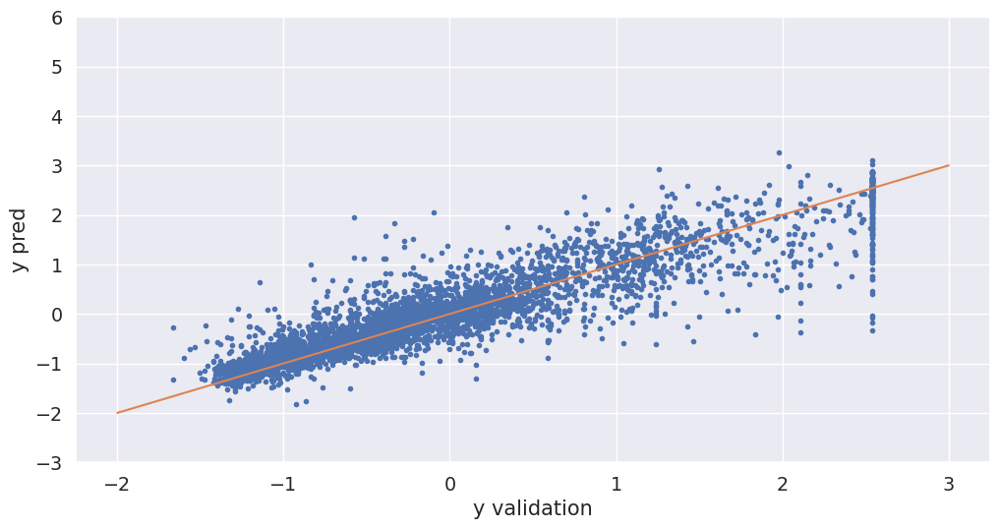

In [54]:
y_pred_nn = model.predict(X_validation.values)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_validation, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)
plt.xlabel("y validation")
plt.ylabel("y pred")

No handles with labels found to put in legend.


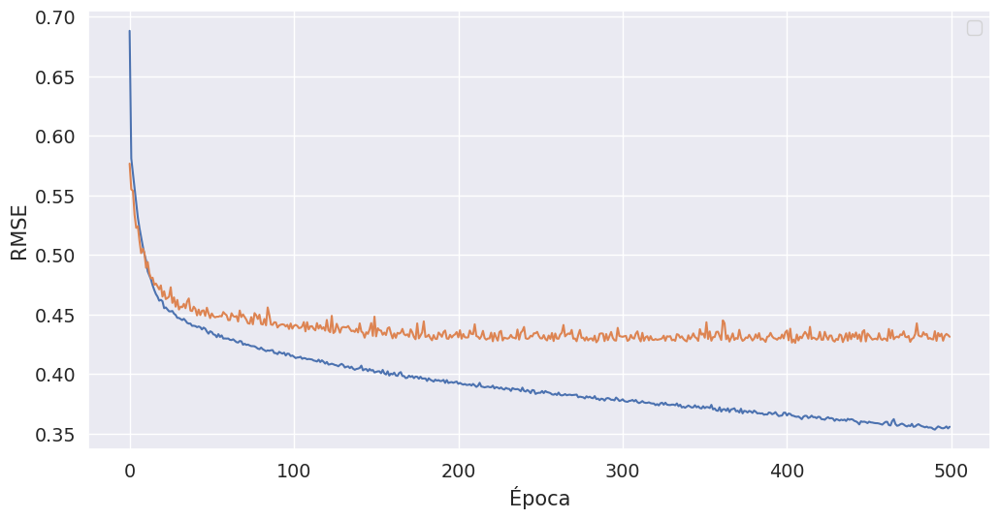

In [55]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Que pasa si agregamos muchas neuronas?

In [56]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [57]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 14s - loss: 1.1611

1312/6000 [=====>........................] - ETA: 0s - loss: 0.6183 

2656/6000 [============>.................] - ETA: 0s - loss: 0.6507

4128/6000 [===================>..........] - ETA: 0s - loss: 0.5553

5600/6000 [===========================>..] - ETA: 0s - loss: 0.5063

6000/6000 [==============================] - 0s 69us/step - loss: 0.4993 - val_loss: 0.3450


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4497

1472/6000 [======>.......................] - ETA: 0s - loss: 0.4080

2976/6000 [=============>................] - ETA: 0s - loss: 0.3618

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3547

5888/6000 [============================>.] - ETA: 0s - loss: 0.3585

6000/6000 [==============================] - 0s 52us/step - loss: 0.3587 - val_loss: 0.3048


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2284

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2885

2720/6000 [============>.................] - ETA: 0s - loss: 0.2981

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2945

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2916

6000/6000 [==============================] - 0s 55us/step - loss: 0.2893 - val_loss: 0.2710


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1533

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2873

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2961

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2752

5984/6000 [============================>.] - ETA: 0s - loss: 0.2665

6000/6000 [==============================] - 0s 51us/step - loss: 0.2661 - val_loss: 0.2522


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2780

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2864

2784/6000 [============>.................] - ETA: 0s - loss: 0.2746

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2733

5568/6000 [==========================>...] - ETA: 0s - loss: 0.3150

6000/6000 [==============================] - 0s 52us/step - loss: 0.3124 - val_loss: 0.2692


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5454

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2137

2912/6000 [=============>................] - ETA: 0s - loss: 0.2368

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2515

6000/6000 [==============================] - 0s 50us/step - loss: 0.2711 - val_loss: 0.2331


Epoch 7/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2198

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2166

2816/6000 [=============>................] - ETA: 0s - loss: 0.2252

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2301

5952/6000 [============================>.] - ETA: 0s - loss: 0.2395

6000/6000 [==============================] - 0s 51us/step - loss: 0.2398 - val_loss: 0.2420


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1801

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2341

2976/6000 [=============>................] - ETA: 0s - loss: 0.2380

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 50us/step - loss: 0.2331 - val_loss: 0.2227


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2144

2880/6000 [=============>................] - ETA: 0s - loss: 0.2213

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2212

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2202

6000/6000 [==============================] - 0s 52us/step - loss: 0.2187 - val_loss: 0.2259


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4037

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2061

2848/6000 [=============>................] - ETA: 0s - loss: 0.2220

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2137

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2178

6000/6000 [==============================] - 0s 51us/step - loss: 0.2165 - val_loss: 0.2205


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1969

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2112

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2149

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2143

6000/6000 [==============================] - 0s 53us/step - loss: 0.2103 - val_loss: 0.2376


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1730

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1941

2976/6000 [=============>................] - ETA: 0s - loss: 0.2109

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2116

5920/6000 [============================>.] - ETA: 0s - loss: 0.2168

6000/6000 [==============================] - 0s 51us/step - loss: 0.2153 - val_loss: 0.2218


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3373

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2164

2976/6000 [=============>................] - ETA: 0s - loss: 0.2105

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2059

6000/6000 [==============================] - 0s 50us/step - loss: 0.2130 - val_loss: 0.2291


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1263

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2016

2816/6000 [=============>................] - ETA: 0s - loss: 0.2030

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2073

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2056

6000/6000 [==============================] - 0s 52us/step - loss: 0.2062 - val_loss: 0.2201


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2013

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2271

2912/6000 [=============>................] - ETA: 0s - loss: 0.2143

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2040

5952/6000 [============================>.] - ETA: 0s - loss: 0.2065

6000/6000 [==============================] - 0s 51us/step - loss: 0.2061 - val_loss: 0.2213


Epoch 16/500


  32/6000 [..............................] - ETA: 0s - loss: 0.5903

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2106

2880/6000 [=============>................] - ETA: 0s - loss: 0.2125

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2082

6000/6000 [==============================] - 0s 50us/step - loss: 0.2029 - val_loss: 0.2170


Epoch 17/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1701



1312/6000 [=====>........................] - ETA: 0s - loss: 0.2109

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2053

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1981

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1984

6000/6000 [==============================] - 0s 54us/step - loss: 0.1987 - val_loss: 0.2209


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1585

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2017

2848/6000 [=============>................] - ETA: 0s - loss: 0.2261

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2213

6000/6000 [==============================] - 0s 48us/step - loss: 0.2128 - val_loss: 0.2174


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2243

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2023

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2127

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2078

6000/6000 [==============================] - 0s 50us/step - loss: 0.2057 - val_loss: 0.2129


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1816

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1833

3264/6000 [===============>..............] - ETA: 0s - loss: 0.2444

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2428

6000/6000 [==============================] - 0s 48us/step - loss: 0.2310 - val_loss: 0.2188


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2682

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2248

2848/6000 [=============>................] - ETA: 0s - loss: 0.2026

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2057

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2052

6000/6000 [==============================] - 0s 54us/step - loss: 0.2069 - val_loss: 0.2191


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3052

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2012

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1896

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1922

6000/6000 [==============================] - 0s 49us/step - loss: 0.1925 - val_loss: 0.2125


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1282

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1876

2656/6000 [============>.................] - ETA: 0s - loss: 0.1896

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1927

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1892

6000/6000 [==============================] - 0s 53us/step - loss: 0.1896 - val_loss: 0.2123


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1758

2816/6000 [=============>................] - ETA: 0s - loss: 0.2095

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1956

5824/6000 [============================>.] - ETA: 0s - loss: 0.1865

6000/6000 [==============================] - 0s 53us/step - loss: 0.1872 - val_loss: 0.2159


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3188

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2037

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1995

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1922

6000/6000 [==============================] - 0s 48us/step - loss: 0.1903 - val_loss: 0.2086


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1796

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1813

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1843

6000/6000 [==============================] - 0s 49us/step - loss: 0.1848 - val_loss: 0.2142


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2119

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1813

2656/6000 [============>.................] - ETA: 0s - loss: 0.1739

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1803

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 54us/step - loss: 0.1858 - val_loss: 0.2287


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3959

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1823

2944/6000 [=============>................] - ETA: 0s - loss: 0.1880

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1843

5984/6000 [============================>.] - ETA: 0s - loss: 0.1836

6000/6000 [==============================] - 0s 51us/step - loss: 0.1833 - val_loss: 0.2086


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1224

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1813

2944/6000 [=============>................] - ETA: 0s - loss: 0.1836

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1954

5856/6000 [============================>.] - ETA: 0s - loss: 0.2169

6000/6000 [==============================] - 0s 51us/step - loss: 0.2159 - val_loss: 0.2074


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3000

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2147

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1979

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1917

6000/6000 [==============================] - 0s 48us/step - loss: 0.1904 - val_loss: 0.2046


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1720

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1892

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 47us/step - loss: 0.1831 - val_loss: 0.2091


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0555

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1649

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1762

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 49us/step - loss: 0.1790 - val_loss: 0.2073


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1538

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1846

2944/6000 [=============>................] - ETA: 0s - loss: 0.1792

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1834

5856/6000 [============================>.] - ETA: 0s - loss: 0.1814

6000/6000 [==============================] - 0s 51us/step - loss: 0.1820 - val_loss: 0.2204


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2029

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1900

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1811

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1807

5856/6000 [============================>.] - ETA: 0s - loss: 0.1778

6000/6000 [==============================] - 0s 53us/step - loss: 0.1808 - val_loss: 0.2025


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0715

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1787

2656/6000 [============>.................] - ETA: 0s - loss: 0.1828

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1771

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 54us/step - loss: 0.1763 - val_loss: 0.2229


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1421

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1864

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1733

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1749

6000/6000 [==============================] - 0s 50us/step - loss: 0.1774 - val_loss: 0.2017


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1300

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1576

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1770

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1831

5920/6000 [============================>.] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 51us/step - loss: 0.1817 - val_loss: 0.2003


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2404

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1729

2944/6000 [=============>................] - ETA: 0s - loss: 0.1882

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1883

5984/6000 [============================>.] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 50us/step - loss: 0.1833 - val_loss: 0.2070


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1345



1504/6000 [======>.......................] - ETA: 0s - loss: 0.1913

2944/6000 [=============>................] - ETA: 0s - loss: 0.1856

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1817

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 51us/step - loss: 0.1794 - val_loss: 0.1992


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2302

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1773

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1715

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1749

6000/6000 [==============================] - 0s 47us/step - loss: 0.1739 - val_loss: 0.2059


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3360

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1771

2688/6000 [============>.................] - ETA: 0s - loss: 0.1764

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1752

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1729

6000/6000 [==============================] - 0s 51us/step - loss: 0.1727 - val_loss: 0.2067


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1677

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1596

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1678

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 49us/step - loss: 0.1733 - val_loss: 0.1999


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1563

2784/6000 [============>.................] - ETA: 0s - loss: 0.1679

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1724

5920/6000 [============================>.] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 51us/step - loss: 0.1697 - val_loss: 0.2050


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2763

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1638

2944/6000 [=============>................] - ETA: 0s - loss: 0.1652

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 49us/step - loss: 0.1690 - val_loss: 0.1971


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1724

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1852

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1704

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1680

6000/6000 [==============================] - 0s 47us/step - loss: 0.1687 - val_loss: 0.2090


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0920

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1691

2848/6000 [=============>................] - ETA: 0s - loss: 0.1645

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1713

5984/6000 [============================>.] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 51us/step - loss: 0.1681 - val_loss: 0.2090


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2143

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1646

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1609

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 49us/step - loss: 0.1670 - val_loss: 0.2055


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1685

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1789

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1646

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 48us/step - loss: 0.1741 - val_loss: 0.2009


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1778

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1682

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3520/6000 [================>.............] - ETA: 0s - loss: 0.1671

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 59us/step - loss: 0.1666 - val_loss: 0.2007


Epoch 50/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3547



1344/6000 [=====>........................] - ETA: 0s - loss: 0.1657

2784/6000 [============>.................] - ETA: 0s - loss: 0.1683

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1653

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1679

6000/6000 [==============================] - 0s 56us/step - loss: 0.1662 - val_loss: 0.2047


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1878

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1785

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1690

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 47us/step - loss: 0.1660 - val_loss: 0.2011


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1537

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1560

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1613

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1651

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1634

6000/6000 [==============================] - 0s 55us/step - loss: 0.1648 - val_loss: 0.2013


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0881

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1535

2912/6000 [=============>................] - ETA: 0s - loss: 0.1709

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1647

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1649

6000/6000 [==============================] - 0s 52us/step - loss: 0.1631 - val_loss: 0.2054


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0834

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1536

2880/6000 [=============>................] - ETA: 0s - loss: 0.1515

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1605

5952/6000 [============================>.] - ETA: 0s - loss: 0.1631

6000/6000 [==============================] - 0s 50us/step - loss: 0.1631 - val_loss: 0.2006


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1690

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1640

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1640

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1642

5952/6000 [============================>.] - ETA: 0s - loss: 0.1625

6000/6000 [==============================] - 0s 50us/step - loss: 0.1629 - val_loss: 0.2056


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1471

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1730

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1682

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1618

6000/6000 [==============================] - 0s 48us/step - loss: 0.1649 - val_loss: 0.2024


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1567

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1471

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1566

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1621

6000/6000 [==============================] - 0s 48us/step - loss: 0.1601 - val_loss: 0.2031


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0998

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1446

2944/6000 [=============>................] - ETA: 0s - loss: 0.1542

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1566

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1580

6000/6000 [==============================] - 0s 51us/step - loss: 0.1591 - val_loss: 0.2027


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1979

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1451

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1555

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1575

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1591

6000/6000 [==============================] - 0s 52us/step - loss: 0.1579 - val_loss: 0.2133


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2397

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1594

2944/6000 [=============>................] - ETA: 0s - loss: 0.1570

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 48us/step - loss: 0.1611 - val_loss: 0.2060


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1597

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1631

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1566

6000/6000 [==============================] - 0s 47us/step - loss: 0.1568 - val_loss: 0.2000


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1511

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1562

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1619

6000/6000 [==============================] - 0s 49us/step - loss: 0.1583 - val_loss: 0.1977


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1430

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1565

2720/6000 [============>.................] - ETA: 0s - loss: 0.1588

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1562

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1562

6000/6000 [==============================] - 0s 51us/step - loss: 0.1567 - val_loss: 0.2090


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0976

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1365

2816/6000 [=============>................] - ETA: 0s - loss: 0.1518

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1557

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1605

6000/6000 [==============================] - 0s 51us/step - loss: 0.1615 - val_loss: 0.1951


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1559

2848/6000 [=============>................] - ETA: 0s - loss: 0.1514

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1521

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1552

6000/6000 [==============================] - 0s 52us/step - loss: 0.1559 - val_loss: 0.2032


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0703

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1609

2848/6000 [=============>................] - ETA: 0s - loss: 0.1550

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1513

5952/6000 [============================>.] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 50us/step - loss: 0.1541 - val_loss: 0.2014


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1154

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1452

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1499

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1513

6000/6000 [==============================] - 0s 49us/step - loss: 0.1530 - val_loss: 0.2036


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1508

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1496

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1621

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1561

6000/6000 [==============================] - 0s 49us/step - loss: 0.1555 - val_loss: 0.1983


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1390

2816/6000 [=============>................] - ETA: 0s - loss: 0.1535

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1516

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1525

6000/6000 [==============================] - 0s 52us/step - loss: 0.1532 - val_loss: 0.2043


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2389

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1550

2976/6000 [=============>................] - ETA: 0s - loss: 0.1508

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1518

5888/6000 [============================>.] - ETA: 0s - loss: 0.1544

6000/6000 [==============================] - 0s 51us/step - loss: 0.1547 - val_loss: 0.2014


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2149

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1377

2880/6000 [=============>................] - ETA: 0s - loss: 0.1497

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1506

5824/6000 [============================>.] - ETA: 0s - loss: 0.1522

6000/6000 [==============================] - 0s 51us/step - loss: 0.1533 - val_loss: 0.1990


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1367

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1450

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1511

5888/6000 [============================>.] - ETA: 0s - loss: 0.1538

6000/6000 [==============================] - 0s 51us/step - loss: 0.1526 - val_loss: 0.1982


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1544

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1593

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1511

6000/6000 [==============================] - 0s 48us/step - loss: 0.1498 - val_loss: 0.1989


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2524

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1616

2880/6000 [=============>................] - ETA: 0s - loss: 0.1565

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1502

5856/6000 [============================>.] - ETA: 0s - loss: 0.1534

6000/6000 [==============================] - 0s 52us/step - loss: 0.1531 - val_loss: 0.2017


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1428

2880/6000 [=============>................] - ETA: 0s - loss: 0.1483

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1487

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1501

6000/6000 [==============================] - 0s 52us/step - loss: 0.1494 - val_loss: 0.2108


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0780

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1372

2848/6000 [=============>................] - ETA: 0s - loss: 0.1434

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1466

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1483

6000/6000 [==============================] - 0s 50us/step - loss: 0.1497 - val_loss: 0.2146


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1483

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1540

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1504

6000/6000 [==============================] - 0s 48us/step - loss: 0.1494 - val_loss: 0.2002


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0993

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1536

2880/6000 [=============>................] - ETA: 0s - loss: 0.1460

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1465

5824/6000 [============================>.] - ETA: 0s - loss: 0.1486

6000/6000 [==============================] - 0s 51us/step - loss: 0.1487 - val_loss: 0.1941


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0964

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1416

2784/6000 [============>.................] - ETA: 0s - loss: 0.1459

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1416

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 52us/step - loss: 0.1488 - val_loss: 0.2013


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1270

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1426

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1458

6000/6000 [==============================] - 0s 49us/step - loss: 0.1504 - val_loss: 0.2006


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0626

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1410

2944/6000 [=============>................] - ETA: 0s - loss: 0.1533

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1539

5856/6000 [============================>.] - ETA: 0s - loss: 0.1502

6000/6000 [==============================]

 - 0s 51us/step - loss: 0.1500 - val_loss: 0.1993


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1346

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1373

2976/6000 [=============>................] - ETA: 0s - loss: 0.1470

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1436

5824/6000 [============================>.] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 53us/step - loss: 0.1465 - val_loss: 0.1983


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4513

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1486

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1434

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1454

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1437

6000/6000 [==============================] - 0s 52us/step - loss: 0.1439 - val_loss: 0.1982


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1666

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1482

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1502

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 46us/step - loss: 0.1445 - val_loss: 0.1970


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1448

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1384

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1418

6000/6000 [==============================] - 0s 49us/step - loss: 0.1453 - val_loss: 0.2210


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1075

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1401

2752/6000 [============>.................] - ETA: 0s - loss: 0.1394

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1401

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1461

6000/6000 [==============================] - 0s 52us/step - loss: 0.1477 - val_loss: 0.1946


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1627

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1300

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1388

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 48us/step - loss: 0.1459 - val_loss: 0.2016


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0862

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1373

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1453

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1447

6000/6000 [==============================] - 0s 50us/step - loss: 0.1455 - val_loss: 0.1964


Epoch 89/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1441

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1484

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1458

6000/6000 [==============================] - 0s 49us/step - loss: 0.1433 - val_loss: 0.1931


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1373

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1413

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1442

6000/6000 [==============================] - 0s 50us/step - loss: 0.1416 - val_loss: 0.2013


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1513

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1377

2944/6000 [=============>................] - ETA: 0s - loss: 0.1364

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1369

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1403



6000/6000 [==============================] - 0s 51us/step - loss: 0.1406 - val_loss: 0.2027


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1925

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1378

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1416

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1345

6000/6000 [==============================] - 0s 49us/step - loss: 0.1396 - val_loss: 0.2043


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2042

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1369

2816/6000 [=============>................] - ETA: 0s - loss: 0.1403

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1418

6000/6000 [==============================] - 0s 52us/step - loss: 0.1402 - val_loss: 0.2033


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1192

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1280

2848/6000 [=============>................] - ETA: 0s - loss: 0.1317

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1341

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1391

6000/6000 [==============================] - 0s 52us/step - loss: 0.1407 - val_loss: 0.1962


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0505

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1265

2752/6000 [============>.................] - ETA: 0s - loss: 0.1354

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1392

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1400

6000/6000 [==============================] - 0s 52us/step - loss: 0.1410 - val_loss: 0.2035


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1136

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1301

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1359

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1375

5920/6000 [============================>.] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 51us/step - loss: 0.1392 - val_loss: 0.2004


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1139

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1303

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1368

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1408

6000/6000 [==============================] - 0s 47us/step - loss: 0.1394 - val_loss: 0.1950


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1130

2976/6000 [=============>................] - ETA: 0s - loss: 0.1310

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 49us/step - loss: 0.1377 - val_loss: 0.1997


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0639

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1478

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1361

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1411

5888/6000 [============================>.] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 52us/step - loss: 0.1382 - val_loss: 0.1955


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0516

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1171

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1320

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1350

5984/6000 [============================>.] - ETA: 0s - loss: 0.1384

6000/6000 [==============================] - 0s 51us/step - loss: 0.1382 - val_loss: 0.1974


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0708

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1484

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1386

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1385

6000/6000 [==============================] - 0s 50us/step - loss: 0.1372 - val_loss: 0.1951


Epoch 102/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0600

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1477

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1354

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 48us/step - loss: 0.1373 - val_loss: 0.1982


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0908

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1409

2816/6000 [=============>................] - ETA: 0s - loss: 0.1330

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1353

5888/6000 [============================>.] - ETA: 0s - loss: 0.1346

6000/6000 [==============================] - 0s 52us/step - loss: 0.1349 - val_loss: 0.1978


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0677

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1238

2848/6000 [=============>................] - ETA: 0s - loss: 0.1315

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1321

5856/6000 [============================>.] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 51us/step - loss: 0.1366 - val_loss: 0.1992


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1309

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1328

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 48us/step - loss: 0.1344 - val_loss: 0.1922


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1320

2880/6000 [=============>................] - ETA: 0s - loss: 0.1319

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1373

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1351

6000/6000 [==============================] - 0s 51us/step - loss: 0.1351 - val_loss: 0.2016


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0565

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1385

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1326

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1337

5888/6000 [============================>.] - ETA: 0s - loss: 0.1339

6000/6000 [==============================] - 0s 51us/step - loss: 0.1341 - val_loss: 0.1946


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1246

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1327

2912/6000 [=============>................] - ETA: 0s - loss: 0.1312

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1288

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1348

6000/6000 [==============================] - 0s 53us/step - loss: 0.1335 - val_loss: 0.1919


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0616

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1229

2880/6000 [=============>................] - ETA: 0s - loss: 0.1255

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1268

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 53us/step - loss: 0.1328 - val_loss: 0.2013


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0685

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1244

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1298

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1297

6000/6000 [==============================] - 0s 50us/step - loss: 0.1308 - val_loss: 0.2027


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1180

2976/6000 [=============>................] - ETA: 0s - loss: 0.1250

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 49us/step - loss: 0.1327 - val_loss: 0.1954


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1330

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1342

2752/6000 [============>.................] - ETA: 0s - loss: 0.1287

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1287

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 51us/step - loss: 0.1303 - val_loss: 0.2013


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0602

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1219

2912/6000 [=============>................] - ETA: 0s - loss: 0.1296

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1310

5856/6000 [============================>.] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 51us/step - loss: 0.1296 - val_loss: 0.1930


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1265

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1320

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1315

6000/6000 [==============================] - 0s 48us/step - loss: 0.1308 - val_loss: 0.1901


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1361

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1290

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1289

6000/6000 [==============================] - 0s 47us/step - loss: 0.1309 - val_loss: 0.1939


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1803

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1225

2912/6000 [=============>................] - ETA: 0s - loss: 0.1292

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 50us/step - loss: 0.1302 - val_loss: 0.2007


Epoch 117/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1031

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1202

2880/6000 [=============>................] - ETA: 0s - loss: 0.1269

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1278

5920/6000 [============================>.] - ETA: 0s - loss: 0.1285

6000/6000 [==============================] - 0s 50us/step - loss: 0.1294 - val_loss: 0.1950


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0888

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1309

2720/6000 [============>.................] - ETA: 0s - loss: 0.1313

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1289

5824/6000 [============================>.] - ETA: 0s - loss: 0.1296

6000/6000 [==============================] - 0s 50us/step - loss: 0.1302 - val_loss: 0.1975


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1277

2976/6000 [=============>................] - ETA: 0s - loss: 0.1261

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1281

5920/6000 [============================>.] - ETA: 0s - loss: 0.1270

6000/6000 [==============================] - 0s 51us/step - loss: 0.1283 - val_loss: 0.1964


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1487

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1428

2880/6000 [=============>................] - ETA: 0s - loss: 0.1341

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1306

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 53us/step - loss: 0.1300 - val_loss: 0.1916


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1939

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1175

2880/6000 [=============>................] - ETA: 0s - loss: 0.1268

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1261

5952/6000 [============================>.] - ETA: 0s - loss: 0.1277

6000/6000 [==============================] - 0s 52us/step - loss: 0.1289 - val_loss: 0.1941


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1204

2880/6000 [=============>................] - ETA: 0s - loss: 0.1198

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1227

5984/6000 [============================>.] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 50us/step - loss: 0.1257 - val_loss: 0.1928


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1303

2912/6000 [=============>................] - ETA: 0s - loss: 0.1274

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1279

5888/6000 [============================>.] - ETA: 0s - loss: 0.1248

6000/6000 [==============================] - 0s 51us/step - loss: 0.1255 - val_loss: 0.1904


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0618

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1233

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1192

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1265

6000/6000 [==============================] - 0s 46us/step - loss: 0.1262 - val_loss: 0.1925


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1284

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1234

2848/6000 [=============>................] - ETA: 0s - loss: 0.1247

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1243

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 51us/step - loss: 0.1251 - val_loss: 0.1985


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0844

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1171

2944/6000 [=============>................] - ETA: 0s - loss: 0.1218

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1209

5888/6000 [============================>.] - ETA: 0s - loss: 0.1229

6000/6000 [==============================] - 0s 51us/step - loss: 0.1231 - val_loss: 0.1954


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2622

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1273

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1251

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1232

6000/6000 [==============================] - 0s 47us/step - loss: 0.1252 - val_loss: 0.1977


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0840

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1153

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1209

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1219

5952/6000 [============================>.] - ETA: 0s - loss: 0.1237

6000/6000 [==============================] - 0s 50us/step - loss: 0.1240 - val_loss: 0.1991


Epoch 129/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1663

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1302

2944/6000 [=============>................] - ETA: 0s - loss: 0.1257

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1216

5888/6000 [============================>.] - ETA: 0s - loss: 0.1240

6000/6000 [==============================] - 0s 51us/step - loss: 0.1240 - val_loss: 0.1899


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0839

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1165

2848/6000 [=============>................] - ETA: 0s - loss: 0.1153

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1251

6000/6000 [==============================] - 0s 50us/step - loss: 0.1228 - val_loss: 0.1949


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2057

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1207

2976/6000 [=============>................] - ETA: 0s - loss: 0.1206

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1194

5920/6000 [============================>.] - ETA: 0s - loss: 0.1205

6000/6000 [==============================] - 0s 51us/step - loss: 0.1211 - val_loss: 0.1999


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0782

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1184

2944/6000 [=============>................] - ETA: 0s - loss: 0.1240

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1209

5856/6000 [============================>.] - ETA: 0s - loss: 0.1211

6000/6000 [==============================] - 0s 51us/step - loss: 0.1215 - val_loss: 0.1931


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0956

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1210

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1226

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1210

6000/6000 [==============================] - 0s 49us/step - loss: 0.1224 - val_loss: 0.2004


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0723

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1319

2944/6000 [=============>................] - ETA: 0s - loss: 0.1269

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1230

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1225

6000/6000 [==============================] - 0s 53us/step - loss: 0.1237 - val_loss: 0.1932


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0568

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1167

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1213

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1177

6000/6000 [==============================] - 0s 49us/step - loss: 0.1205 - val_loss: 0.1916


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0277

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1194

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1170

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1203

6000/6000 [==============================] - 0s 47us/step - loss: 0.1209 - val_loss: 0.1905


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1149

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1174

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1181

6000/6000 [==============================] - 0s 48us/step - loss: 0.1200 - val_loss: 0.1975


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1713

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1223

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1162

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1193

6000/6000 [==============================] - 0s 48us/step - loss: 0.1216 - val_loss: 0.2023


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2089

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1244

2848/6000 [=============>................] - ETA: 0s - loss: 0.1205

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1255

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1235

6000/6000 [==============================] - 0s 53us/step - loss: 0.1238 - val_loss: 0.1958


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1480

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1114

2816/6000 [=============>................] - ETA: 0s - loss: 0.1202

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1178

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1206

6000/6000 [==============================] - 0s 51us/step - loss: 0.1215 - val_loss: 0.1987


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0517

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1168

2976/6000 [=============>................] - ETA: 0s - loss: 0.1118

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1153

5952/6000 [============================>.] - ETA: 0s - loss: 0.1186

6000/6000 [==============================] - 0s 50us/step - loss: 0.1189 - val_loss: 0.1943


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1064

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1461

2848/6000 [=============>................] - ETA: 0s - loss: 0.1410

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1319

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1287

6000/6000 [==============================] - 0s 53us/step - loss: 0.1283 - val_loss: 0.2020


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1627

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1047

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1217

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1258

6000/6000 [==============================] - 0s 48us/step - loss: 0.1225 - val_loss: 0.1912


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1186

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1103

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1199

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1222

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1197

6000/6000 [==============================] - 0s 53us/step - loss: 0.1194 - val_loss: 0.1947


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1381

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1220

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1195

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1210

6000/6000 [==============================] - 0s 50us/step - loss: 0.1189 - val_loss: 0.1935


Epoch 146/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0934

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1098

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1109

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1157

6000/6000 [==============================] - 0s 48us/step - loss: 0.1164 - val_loss: 0.1948


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1597

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1160

2880/6000 [=============>................] - ETA: 0s - loss: 0.1191

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1181

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1177

6000/6000 [==============================] - 0s 52us/step - loss: 0.1178 - val_loss: 0.1900


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0427

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1033

2912/6000 [=============>................] - ETA: 0s - loss: 0.1117

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1186

5920/6000 [============================>.] - ETA: 0s - loss: 0.1174

6000/6000 [==============================] - 0s 51us/step - loss: 0.1175 - val_loss: 0.1975


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1786

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1182

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1140

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1155

6000/6000 [==============================] - 0s 48us/step - loss: 0.1158 - val_loss: 0.1994


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1001

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1077

2912/6000 [=============>................] - ETA: 0s - loss: 0.1143

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1192

5920/6000 [============================>.] - ETA: 0s - loss: 0.1185

6000/6000 [==============================] - 0s 51us/step - loss: 0.1188 - val_loss: 0.1995


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1315

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1160

2848/6000 [=============>................] - ETA: 0s - loss: 0.1209

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1202

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1147

6000/6000 [==============================] - 0s 51us/step - loss: 0.1140 - val_loss: 0.1924


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0695

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1211

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1145

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1128

5856/6000 [============================>.] - ETA: 0s - loss: 0.1168

6000/6000 [==============================] - 0s 51us/step - loss: 0.1159 - val_loss: 0.1964


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1629

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1149

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1167

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1142

6000/6000 [==============================] - 0s 49us/step - loss: 0.1151 - val_loss: 0.1961


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1287

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1229

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1188

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1180

6000/6000 [==============================] - 0s 49us/step - loss: 0.1175 - val_loss: 0.1952


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0895

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1201

2848/6000 [=============>................] - ETA: 0s - loss: 0.1098

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1129

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1142

6000/6000 [==============================] - 0s 52us/step - loss: 0.1152 - val_loss: 0.1946


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0689

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1103

2880/6000 [=============>................] - ETA: 0s - loss: 0.1108

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1158

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1146

6000/6000 [==============================] - 0s 53us/step - loss: 0.1142 - val_loss: 0.1998


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2049

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1216

2912/6000 [=============>................] - ETA: 0s - loss: 0.1167

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1142

5984/6000 [============================>.] - ETA: 0s - loss: 0.1136

6000/6000 [==============================] - 0s 50us/step - loss: 0.1136 - val_loss: 0.2021


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0638

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1158

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1168

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1166

5952/6000 [============================>.] - ETA: 0s - loss: 0.1109

6000/6000 [==============================] - 0s 51us/step - loss: 0.1116 - val_loss: 0.1915


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1585

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1178

2944/6000 [=============>................] - ETA: 0s - loss: 0.1137

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1160

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1124

6000/6000 [==============================] - 0s 51us/step - loss: 0.1129 - val_loss: 0.1909


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0489

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1068

2816/6000 [=============>................] - ETA: 0s - loss: 0.1053

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1052

5824/6000 [============================>.] - ETA: 0s - loss: 0.1109

6000/6000 [==============================] - 0s 52us/step - loss: 0.1118 - val_loss: 0.1954


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1476

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1151

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1138

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1115

5952/6000 [============================>.] - ETA: 0s - loss: 0.1118

6000/6000 [==============================] - 0s 52us/step - loss: 0.1124 - val_loss: 0.1985


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1145

2944/6000 [=============>................] - ETA: 0s - loss: 0.1101

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1132

5856/6000 [============================>.] - ETA: 0s - loss: 0.1126

6000/6000 [==============================] - 0s 51us/step - loss: 0.1133 - val_loss: 0.1929


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0613

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1033

2848/6000 [=============>................] - ETA: 0s - loss: 0.1114

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1094

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1111

6000/6000 [==============================] - 0s 51us/step - loss: 0.1120 - val_loss: 0.1929


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0551

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1098

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1113

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1146

6000/6000 [==============================] - 0s 49us/step - loss: 0.1151 - val_loss: 0.2020


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0768

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1150

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1159

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1136

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1149

6000/6000 [==============================] - 0s 51us/step - loss: 0.1152 - val_loss: 0.1913


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0362

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1122

2880/6000 [=============>................] - ETA: 0s - loss: 0.1115

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1084

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1112

6000/6000 [==============================] - 0s 53us/step - loss: 0.1103 - val_loss: 0.1940


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1077

2944/6000 [=============>................] - ETA: 0s - loss: 0.1072

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1098

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1127

6000/6000 [==============================] - 0s 54us/step - loss: 0.1104 - val_loss: 0.2008


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0421

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1076

2912/6000 [=============>................] - ETA: 0s - loss: 0.1118

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1103

5920/6000 [============================>.] - ETA: 0s - loss: 0.1116

6000/6000 [==============================] - 0s 50us/step - loss: 0.1117 - val_loss: 0.1919


Epoch 169/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0974



1504/6000 [======>.......................] - ETA: 0s - loss: 0.1146

2720/6000 [============>.................] - ETA: 0s - loss: 0.1129

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1076



5472/6000 [==========================>...] - ETA: 0s - loss: 0.1115

6000/6000 [==============================] - 0s 53us/step - loss: 0.1113 - val_loss: 0.2010


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0458

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0996

2784/6000 [============>.................] - ETA: 0s - loss: 0.1102

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1131

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1122

6000/6000 [==============================] - 0s 54us/step - loss: 0.1113 - val_loss: 0.2005


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0733

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0961

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1083

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1059

6000/6000 [==============================] - 0s 50us/step - loss: 0.1096 - val_loss: 0.1951


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1064

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1046

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1070

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1087

6000/6000 [==============================] - 0s 49us/step - loss: 0.1101 - val_loss: 0.2036


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0995

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1117

2912/6000 [=============>................] - ETA: 0s - loss: 0.1062

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1071

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1082

6000/6000 [==============================] - 0s 51us/step - loss: 0.1093 - val_loss: 0.2033


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1171

2848/6000 [=============>................] - ETA: 0s - loss: 0.1073

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1099

6000/6000 [==============================] - 0s 49us/step - loss: 0.1095 - val_loss: 0.2018


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5119

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1127

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1082

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1107

6000/6000 [==============================] - 0s 47us/step - loss: 0.1091 - val_loss: 0.1992


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1087

2976/6000 [=============>................] - ETA: 0s - loss: 0.1054

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1063

6000/6000 [==============================] - 0s 48us/step - loss: 0.1077 - val_loss: 0.1942


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0716

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0955

2976/6000 [=============>................] - ETA: 0s - loss: 0.1034

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1072

5856/6000 [============================>.] - ETA: 0s - loss: 0.1084

6000/6000 [==============================] - 0s 50us/step - loss: 0.1080 - val_loss: 0.1991


Epoch 178/500


  32/6000 [..............................] - ETA: 1s - loss: 0.0874

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1076

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1076

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1090

5984/6000 [============================>.] - ETA: 0s - loss: 0.1076

6000/6000 [==============================] - 0s 50us/step - loss: 0.1074 - val_loss: 0.2022


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1250

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1055

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1021

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1021

6000/6000 [==============================] - 0s 51us/step - loss: 0.1080 - val_loss: 0.1962


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0589

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0975

2816/6000 [=============>................] - ETA: 0s - loss: 0.1098

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1086

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1106

6000/6000 [==============================] - 0s 52us/step - loss: 0.1091 - val_loss: 0.2043


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0983

2912/6000 [=============>................] - ETA: 0s - loss: 0.1040

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1069

6000/6000 [==============================] - 0s 49us/step - loss: 0.1067 - val_loss: 0.2009


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0684

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1063

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1076

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1080

6000/6000 [==============================] - 0s 51us/step - loss: 0.1076 - val_loss: 0.2017


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0572

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0965

2912/6000 [=============>................] - ETA: 0s - loss: 0.0976

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0996

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1061

6000/6000 [==============================] - 0s 54us/step - loss: 0.1058 - val_loss: 0.1986


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0578

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0970

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0989

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1013

5984/6000 [============================>.] - ETA: 0s - loss: 0.1047

6000/6000 [==============================] - 0s 49us/step - loss: 0.1049 - val_loss: 0.2008


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1098

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0891

2880/6000 [=============>................] - ETA: 0s - loss: 0.1039

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1049

5888/6000 [============================>.] - ETA: 0s - loss: 0.1062

6000/6000 [==============================] - 0s 50us/step - loss: 0.1058 - val_loss: 0.2022


Epoch 186/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0837

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1089

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1142

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1104

6000/6000 [==============================] - 0s 50us/step - loss: 0.1071 - val_loss: 0.2005


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2517

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1114

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1062

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1044

6000/6000 [==============================] - 0s 48us/step - loss: 0.1044 - val_loss: 0.2000


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0717

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0982

2816/6000 [=============>................] - ETA: 0s - loss: 0.1064

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1060

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1046

6000/6000 [==============================] - 0s 52us/step - loss: 0.1059 - val_loss: 0.2023


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1855

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1011

2912/6000 [=============>................] - ETA: 0s - loss: 0.1057

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1014

5920/6000 [============================>.] - ETA: 0s - loss: 0.1040

6000/6000 [==============================] - 0s 51us/step - loss: 0.1044 - val_loss: 0.1972


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1043

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1069

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1053

6000/6000 [==============================] - 0s 48us/step - loss: 0.1058 - val_loss: 0.2011


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2032

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0982

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1028

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1053

6000/6000 [==============================] - 0s 50us/step - loss: 0.1038 - val_loss: 0.2152


Epoch 192/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1299

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1055

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1038

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1095

6000/6000 [==============================] - 0s 49us/step - loss: 0.1057 - val_loss: 0.1959


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1052

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0985

2848/6000 [=============>................] - ETA: 0s - loss: 0.1010

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1047

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1033

6000/6000 [==============================] - 0s 51us/step - loss: 0.1047 - val_loss: 0.1986


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0999

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1159

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1083

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1070

5888/6000 [============================>.] - ETA: 0s - loss: 0.1037

6000/6000 [==============================] - 0s 52us/step - loss: 0.1031 - val_loss: 0.2042


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1072

2784/6000 [============>.................] - ETA: 0s - loss: 0.1038

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1059

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1054

6000/6000 [==============================] - 0s 53us/step - loss: 0.1055 - val_loss: 0.2082


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0405

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0996

2848/6000 [=============>................] - ETA: 0s - loss: 0.0972

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0989

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1033

6000/6000 [==============================] - 0s 53us/step - loss: 0.1041 - val_loss: 0.1948


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0510

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0955

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0984

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 47us/step - loss: 0.1031 - val_loss: 0.2116


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0952

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1069

2656/6000 [============>.................] - ETA: 0s - loss: 0.1079

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1087

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1047

6000/6000 [==============================] - 0s 51us/step - loss: 0.1043 - val_loss: 0.1989


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0970

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0881

2752/6000 [============>.................] - ETA: 0s - loss: 0.0910

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0919

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0980

6000/6000 [==============================] - 0s 53us/step - loss: 0.0996 - val_loss: 0.2029


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0914

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0992

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1026

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1017

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 51us/step - loss: 0.1014 - val_loss: 0.2052


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1038

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1006

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1028

6000/6000 [==============================] - 0s 47us/step - loss: 0.1033 - val_loss: 0.1962


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0877

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0913

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0985

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0988

6000/6000 [==============================] - 0s 49us/step - loss: 0.1015 - val_loss: 0.2049


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1424

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1149

2944/6000 [=============>................] - ETA: 0s - loss: 0.1111

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1056

5920/6000 [============================>.] - ETA: 0s - loss: 0.1017

6000/6000 [==============================] - 0s 52us/step - loss: 0.1020 - val_loss: 0.2015


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0809

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0932

2880/6000 [=============>................] - ETA: 0s - loss: 0.1003

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0996

5824/6000 [============================>.] - ETA: 0s - loss: 0.1044

6000/6000 [==============================] - 0s 52us/step - loss: 0.1037 - val_loss: 0.2083


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0641

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0950

2784/6000 [============>.................] - ETA: 0s - loss: 0.1064

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1002

5920/6000 [============================>.] - ETA: 0s - loss: 0.1018

6000/6000 [==============================] - 0s 51us/step - loss: 0.1020 - val_loss: 0.1989


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0556

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0984

2976/6000 [=============>................] - ETA: 0s - loss: 0.0976

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0973

6000/6000 [==============================] - 0s 50us/step - loss: 0.1032 - val_loss: 0.2025


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0998

2880/6000 [=============>................] - ETA: 0s - loss: 0.0999

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1015

5888/6000 [============================>.] - ETA: 0s - loss: 0.1030

6000/6000 [==============================]

 - 0s 51us/step - loss: 0.1029 - val_loss: 0.2131


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0544

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0916

2912/6000 [=============>................] - ETA: 0s - loss: 0.0950

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1011

5856/6000 [============================>.] - ETA: 0s - loss: 0.0994

6000/6000 [==============================] - 0s 50us/step - loss: 0.0993 - val_loss: 0.2037


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0571

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0954

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1010

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0997

6000/6000 [==============================] - 0s 47us/step - loss: 0.0988 - val_loss: 0.2048


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0953

2848/6000 [=============>................] - ETA: 0s - loss: 0.0998

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0997

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0988

6000/6000 [==============================] - 0s 53us/step - loss: 0.0981 - val_loss: 0.2063


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0758

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1019

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0990

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1024

6000/6000 [==============================] - 0s 48us/step - loss: 0.0998 - val_loss: 0.2107


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1069

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0960

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0994

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1021

6000/6000 [==============================] - 0s 47us/step - loss: 0.1014 - val_loss: 0.2041


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1960

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1043

2976/6000 [=============>................] - ETA: 0s - loss: 0.0990

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0995

5920/6000 [============================>.] - ETA: 0s - loss: 0.0991

6000/6000 [==============================] - 0s 52us/step - loss: 0.0996 - val_loss: 0.2052


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0972

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0922

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0958

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0961

5984/6000 [============================>.] - ETA: 0s - loss: 0.0986

6000/6000 [==============================] - 0s 51us/step - loss: 0.0986 - val_loss: 0.2062


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2854

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0962

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1010

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1016

6000/6000 [==============================] - 0s 51us/step - loss: 0.0996 - val_loss: 0.1980


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0764

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0853

2784/6000 [============>.................] - ETA: 0s - loss: 0.0918

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0953

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 52us/step - loss: 0.0979 - val_loss: 0.2107


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1219

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0919

2720/6000 [============>.................] - ETA: 0s - loss: 0.1036

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0989

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 51us/step - loss: 0.0984 - val_loss: 0.2037


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0652

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0973

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0963

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0971

6000/6000 [==============================] - 0s 48us/step - loss: 0.0971 - val_loss: 0.2092


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1603

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0997

2848/6000 [=============>................] - ETA: 0s - loss: 0.0937

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0976

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0969

6000/6000 [==============================] - 0s 52us/step - loss: 0.0963 - val_loss: 0.2030


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0944

2656/6000 [============>.................] - ETA: 0s - loss: 0.0968

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0978

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 52us/step - loss: 0.0990 - val_loss: 0.2038


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0750

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0958

2944/6000 [=============>................] - ETA: 0s - loss: 0.0962

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0965

5856/6000 [============================>.] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 52us/step - loss: 0.0974 - val_loss: 0.2063


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0347

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0954

2784/6000 [============>.................] - ETA: 0s - loss: 0.0960

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0977

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0968

6000/6000 [==============================] - 0s 53us/step - loss: 0.0972 - val_loss: 0.2117


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1339

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0980

2816/6000 [=============>................] - ETA: 0s - loss: 0.0954

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0984

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 53us/step - loss: 0.0977 - val_loss: 0.2072


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0775

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0955

2912/6000 [=============>................] - ETA: 0s - loss: 0.0945

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0965

5824/6000 [============================>.] - ETA: 0s - loss: 0.0980

6000/6000 [==============================] - 0s 52us/step - loss: 0.0983 - val_loss: 0.2100


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2848/6000 [=============>................] - ETA: 0s - loss: 0.0899

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0953

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0960

6000/6000 [==============================] - 0s 54us/step - loss: 0.0967 - val_loss: 0.2074


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0757

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0863

2880/6000 [=============>................] - ETA: 0s - loss: 0.0907

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0932

5824/6000 [============================>.] - ETA: 0s - loss: 0.0960

6000/6000 [==============================] - 0s 51us/step - loss: 0.0964 - val_loss: 0.2061


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1402

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0907

2912/6000 [=============>................] - ETA: 0s - loss: 0.0933

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0949

5952/6000 [============================>.] - ETA: 0s - loss: 0.0955

6000/6000 [==============================] - 0s 49us/step - loss: 0.0955 - val_loss: 0.2106


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0695

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0878

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0941

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0982

5952/6000 [============================>.] - ETA: 0s - loss: 0.0965

6000/6000 [==============================] - 0s 51us/step - loss: 0.0965 - val_loss: 0.2076


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1158

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0888

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0935

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0928

6000/6000 [==============================] - 0s 48us/step - loss: 0.0971 - val_loss: 0.2075


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0553

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0893

2848/6000 [=============>................] - ETA: 0s - loss: 0.0897

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0949

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0943

6000/6000 [==============================] - 0s 52us/step - loss: 0.0964 - val_loss: 0.2207


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1357

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0960

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0972

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0947

6000/6000 [==============================] - 0s 49us/step - loss: 0.0955 - val_loss: 0.2071


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0902

2880/6000 [=============>................] - ETA: 0s - loss: 0.0941

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0936

6000/6000 [==============================] - 0s 48us/step - loss: 0.0931 - val_loss: 0.2063


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0431

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0826

2880/6000 [=============>................] - ETA: 0s - loss: 0.0862

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0927

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0942

6000/6000 [==============================] - 0s 53us/step - loss: 0.0938 - val_loss: 0.2092


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0633

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0986

2848/6000 [=============>................] - ETA: 0s - loss: 0.0984

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0930

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0934

6000/6000 [==============================] - 0s 51us/step - loss: 0.0945 - val_loss: 0.2087


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0607

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0877

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0920

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0942

6000/6000 [==============================] - 0s 48us/step - loss: 0.0946 - val_loss: 0.2138


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0605

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0857

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0954

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0947

6000/6000 [==============================] - 0s 50us/step - loss: 0.0943 - val_loss: 0.2077


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0448

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1006

2912/6000 [=============>................] - ETA: 0s - loss: 0.0948

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0944

5824/6000 [============================>.] - ETA: 0s - loss: 0.0946

6000/6000 [==============================] - 0s 51us/step - loss: 0.0947 - val_loss: 0.2108


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1761

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0899

2912/6000 [=============>................] - ETA: 0s - loss: 0.0903

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0931

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0928

6000/6000 [==============================] - 0s 53us/step - loss: 0.0942 - val_loss: 0.2080


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0666

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0973

2816/6000 [=============>................] - ETA: 0s - loss: 0.0931

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0933

5984/6000 [============================>.] - ETA: 0s - loss: 0.0939

6000/6000 [==============================] - 0s 50us/step - loss: 0.0938 - val_loss: 0.2109


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0403

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0910

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0951

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0949

6000/6000 [==============================] - 0s 50us/step - loss: 0.0942 - val_loss: 0.2113


Epoch 241/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0902

2944/6000 [=============>................] - ETA: 0s - loss: 0.0914

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0920



5888/6000 [============================>.] - ETA: 0s - loss: 0.0927

6000/6000 [==============================] - 0s 51us/step - loss: 0.0926 - val_loss: 0.2056


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0835

2816/6000 [=============>................] - ETA: 0s - loss: 0.0892

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0881

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0938

6000/6000 [==============================] - 0s 51us/step - loss: 0.0939 - val_loss: 0.2122


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0885

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0922

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0917

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0927

6000/6000 [==============================] - 0s 49us/step - loss: 0.0943 - val_loss: 0.2154


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2113

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0901

2816/6000 [=============>................] - ETA: 0s - loss: 0.0898

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0899

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0925

6000/6000 [==============================] - 0s 52us/step - loss: 0.0923 - val_loss: 0.2186


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1292

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0834

2944/6000 [=============>................] - ETA: 0s - loss: 0.0902

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0919

6000/6000 [==============================] - 0s 49us/step - loss: 0.0929 - val_loss: 0.2145


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1521

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0880

2976/6000 [=============>................] - ETA: 0s - loss: 0.0917

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0947

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0937

6000/6000 [==============================] - 0s 55us/step - loss: 0.0925 - val_loss: 0.2090


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0298

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0842

2880/6000 [=============>................] - ETA: 0s - loss: 0.0877

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0925

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0909

6000/6000 [==============================] - 0s 55us/step - loss: 0.0916 - val_loss: 0.2085


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0627

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0952

2688/6000 [============>.................] - ETA: 0s - loss: 0.0965

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0934

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0948

6000/6000 [==============================] - 0s 54us/step - loss: 0.0936 - val_loss: 0.2136


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0483

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0894

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0931

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0938

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0914

6000/6000 [==============================] - 0s 54us/step - loss: 0.0913 - val_loss: 0.2080


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0683

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0937

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0952

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0955

6000/6000 [==============================] - 0s 49us/step - loss: 0.0930 - val_loss: 0.2166


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0480

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0835

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0871

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0896

6000/6000 [==============================] - 0s 49us/step - loss: 0.0907 - val_loss: 0.2143


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0502

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0822

2880/6000 [=============>................] - ETA: 0s - loss: 0.0877

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0904

5824/6000 [============================>.] - ETA: 0s - loss: 0.0896

6000/6000 [==============================] - 0s 51us/step - loss: 0.0899 - val_loss: 0.2166


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0623

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0843

2944/6000 [=============>................] - ETA: 0s - loss: 0.0847

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0889

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0913

6000/6000 [==============================] - 0s 52us/step - loss: 0.0905 - val_loss: 0.2105


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0546

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0930

2912/6000 [=============>................] - ETA: 0s - loss: 0.0937

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0926

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0916

6000/6000 [==============================] - 0s 52us/step - loss: 0.0909 - val_loss: 0.2154


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0848

2816/6000 [=============>................] - ETA: 0s - loss: 0.0879

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0874

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0902

6000/6000 [==============================] - 0s 52us/step - loss: 0.0920 - val_loss: 0.2160


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0663

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0895

2848/6000 [=============>................] - ETA: 0s - loss: 0.0910

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0921

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0915

6000/6000 [==============================] - 0s 52us/step - loss: 0.0917 - val_loss: 0.2120


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1343

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0899

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0878

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0884

6000/6000 [==============================] - 0s 50us/step - loss: 0.0884 - val_loss: 0.2143


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0558

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0906

2848/6000 [=============>................] - ETA: 0s - loss: 0.0908

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0915

6000/6000 [==============================] - 0s 49us/step - loss: 0.0898 - val_loss: 0.2095


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0835

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0814

2880/6000 [=============>................] - ETA: 0s - loss: 0.0881

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0880

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0893

6000/6000 [==============================] - 0s 52us/step - loss: 0.0889 - val_loss: 0.2080


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0519

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0887

2976/6000 [=============>................] - ETA: 0s - loss: 0.0889

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0895

5920/6000 [============================>.] - ETA: 0s - loss: 0.0915

6000/6000 [==============================] - 0s 51us/step - loss: 0.0921 - val_loss: 0.2144


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1222

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0917

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0921

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0910

5920/6000 [============================>.] - ETA: 0s - loss: 0.0908

6000/6000 [==============================] - 0s 50us/step - loss: 0.0911 - val_loss: 0.2117


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0984

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0854

2784/6000 [============>.................] - ETA: 0s - loss: 0.0868

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0884

5824/6000 [============================>.] - ETA: 0s - loss: 0.0899

6000/6000 [==============================] - 0s 53us/step - loss: 0.0897 - val_loss: 0.2131


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0833

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0945

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0937

6000/6000 [==============================] - 0s 48us/step - loss: 0.0908 - val_loss: 0.2098


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0858

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0891

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 49us/step - loss: 0.0885 - val_loss: 0.2203


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1012

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0921

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0924

6000/6000 [==============================] - 0s 48us/step - loss: 0.0917 - val_loss: 0.2128


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1128

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0852

2912/6000 [=============>................] - ETA: 0s - loss: 0.0858

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0863

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 53us/step - loss: 0.0878 - val_loss: 0.2184


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1243

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0907

2880/6000 [=============>................] - ETA: 0s - loss: 0.0876

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0902

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0900

6000/6000 [==============================] - 0s 52us/step - loss: 0.0902 - val_loss: 0.2133


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0669

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0889

2912/6000 [=============>................] - ETA: 0s - loss: 0.0845

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0877

5984/6000 [============================>.] - ETA: 0s - loss: 0.0887

6000/6000 [==============================] - 0s 50us/step - loss: 0.0886 - val_loss: 0.2114


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0678



1472/6000 [======>.......................] - ETA: 0s - loss: 0.0878

2816/6000 [=============>................] - ETA: 0s - loss: 0.0889

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0878

5856/6000 [============================>.] - ETA: 0s - loss: 0.0896

6000/6000 [==============================] - 0s 53us/step - loss: 0.0893 - val_loss: 0.2150


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0838

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0867

2880/6000 [=============>................] - ETA: 0s - loss: 0.0831

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0862

5920/6000 [============================>.] - ETA: 0s - loss: 0.0879

6000/6000 [==============================] - 0s 50us/step - loss: 0.0887 - val_loss: 0.2168


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1624

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0840

2816/6000 [=============>................] - ETA: 0s - loss: 0.0841

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0862

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0904

6000/6000 [==============================] - 0s 53us/step - loss: 0.0902 - val_loss: 0.2185


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0800

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0882

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0875

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0868

6000/6000 [==============================] - 0s 48us/step - loss: 0.0893 - val_loss: 0.2183


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1202

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0896

2912/6000 [=============>................] - ETA: 0s - loss: 0.0877

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0903

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0914

6000/6000 [==============================] - 0s 52us/step - loss: 0.0911 - val_loss: 0.2118


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2501

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0830

2912/6000 [=============>................] - ETA: 0s - loss: 0.0843

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0861

5984/6000 [============================>.] - ETA: 0s - loss: 0.0875

6000/6000 [==============================] - 0s 50us/step - loss: 0.0876 - val_loss: 0.2192


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0392

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0861

2880/6000 [=============>................] - ETA: 0s - loss: 0.0841

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0863

5984/6000 [============================>.] - ETA: 0s - loss: 0.0882

6000/6000 [==============================] - 0s 50us/step - loss: 0.0886 - val_loss: 0.2157


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0520

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0785

2816/6000 [=============>................] - ETA: 0s - loss: 0.0877

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0889

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0868

6000/6000 [==============================] - 0s 51us/step - loss: 0.0869 - val_loss: 0.2183


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0529

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0861

2656/6000 [============>.................] - ETA: 0s - loss: 0.0859

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0896

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0868

6000/6000 [==============================] - 0s 51us/step - loss: 0.0863 - val_loss: 0.2170


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1343

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0736

2848/6000 [=============>................] - ETA: 0s - loss: 0.0791

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0838

6000/6000 [==============================] - 0s 49us/step - loss: 0.0872 - val_loss: 0.2103


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0432

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0864

2880/6000 [=============>................] - ETA: 0s - loss: 0.0850

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0837

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0872

6000/6000 [==============================] - 0s 52us/step - loss: 0.0871 - val_loss: 0.2213


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0550

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0909

2848/6000 [=============>................] - ETA: 0s - loss: 0.0909

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0894

5824/6000 [============================>.] - ETA: 0s - loss: 0.0858

6000/6000 [==============================] - 0s 52us/step - loss: 0.0870 - val_loss: 0.2149


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0434

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0835

2784/6000 [============>.................] - ETA: 0s - loss: 0.0852

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0849

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0879

6000/6000 [==============================] - 0s 55us/step - loss: 0.0873 - val_loss: 0.2146


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0849

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0974

2912/6000 [=============>................] - ETA: 0s - loss: 0.0911

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0879

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0876

6000/6000 [==============================] - 0s 54us/step - loss: 0.0873 - val_loss: 0.2189


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0879

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0843

2880/6000 [=============>................] - ETA: 0s - loss: 0.0875

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0868

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0883

6000/6000 [==============================] - 0s 52us/step - loss: 0.0874 - val_loss: 0.2263


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0427

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0915

2784/6000 [============>.................] - ETA: 0s - loss: 0.0877

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0866

5824/6000 [============================>.] - ETA: 0s - loss: 0.0861

6000/6000 [==============================] - 0s 51us/step - loss: 0.0871 - val_loss: 0.2131


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0448

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0843

2784/6000 [============>.................] - ETA: 0s - loss: 0.0868

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0825

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0851

6000/6000 [==============================] - 0s 53us/step - loss: 0.0855 - val_loss: 0.2168


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0579

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0973

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0907

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0878

6000/6000 [==============================] - 0s 49us/step - loss: 0.0855 - val_loss: 0.2137


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0800

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0813

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0852

6000/6000 [==============================] - 0s 48us/step - loss: 0.0875 - val_loss: 0.2149


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0427

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0848

2848/6000 [=============>................] - ETA: 0s - loss: 0.0892

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0883

6000/6000 [==============================] - 0s 50us/step - loss: 0.0858 - val_loss: 0.2173


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0588

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0860

2752/6000 [============>.................] - ETA: 0s - loss: 0.0867

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0867

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0850

6000/6000 [==============================] - 0s 52us/step - loss: 0.0853 - val_loss: 0.2200


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1125

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0841

2848/6000 [=============>................] - ETA: 0s - loss: 0.0891

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0907

5824/6000 [============================>.] - ETA: 0s - loss: 0.0879

6000/6000 [==============================] - 0s 52us/step - loss: 0.0874 - val_loss: 0.2152


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0345

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0817

2880/6000 [=============>................] - ETA: 0s - loss: 0.0829

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0865

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 52us/step - loss: 0.0867 - val_loss: 0.2152


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2069

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1034

2880/6000 [=============>................] - ETA: 0s - loss: 0.0928

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0869

5920/6000 [============================>.] - ETA: 0s - loss: 0.0867

6000/6000 [==============================] - 0s 51us/step - loss: 0.0865 - val_loss: 0.2124


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0464

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0833

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0825

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0834

6000/6000 [==============================] - 0s 48us/step - loss: 0.0839 - val_loss: 0.2266


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0497

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0779

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0804

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0825

6000/6000 [==============================] - 0s 48us/step - loss: 0.0856 - val_loss: 0.2127


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0763

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2848/6000 [=============>................] - ETA: 0s - loss: 0.0814

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0820

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0841

6000/6000 [==============================] - 0s 51us/step - loss: 0.0842 - val_loss: 0.2232


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0485

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0781

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0772

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0846

6000/6000 [==============================] - 0s 49us/step - loss: 0.0851 - val_loss: 0.2168


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0559

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0840

2784/6000 [============>.................] - ETA: 0s - loss: 0.0833

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0838

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0852

6000/6000 [==============================] - 0s 54us/step - loss: 0.0847 - val_loss: 0.2168


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1725

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0848

2624/6000 [============>.................] - ETA: 0s - loss: 0.0833

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0820

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0819

6000/6000 [==============================] - 0s 53us/step - loss: 0.0839 - val_loss: 0.2164


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0749

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0901

2720/6000 [============>.................] - ETA: 0s - loss: 0.0877

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0877

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0862

6000/6000 [==============================] - 0s 54us/step - loss: 0.0854 - val_loss: 0.2174


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1299

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0784

2784/6000 [============>.................] - ETA: 0s - loss: 0.0784

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0784

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0807

6000/6000 [==============================] - 0s 54us/step - loss: 0.0832 - val_loss: 0.2180


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0887

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0903

2912/6000 [=============>................] - ETA: 0s - loss: 0.0831

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0836

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0825

6000/6000 [==============================] - 0s 52us/step - loss: 0.0827 - val_loss: 0.2188


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0723

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0773

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0863

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0838

6000/6000 [==============================] - 0s 49us/step - loss: 0.0833 - val_loss: 0.2216


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0509

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0767

2848/6000 [=============>................] - ETA: 0s - loss: 0.0829

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0838

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0828

6000/6000 [==============================] - 0s 52us/step - loss: 0.0826 - val_loss: 0.2202


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0584

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0871

2912/6000 [=============>................] - ETA: 0s - loss: 0.0826

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0821

5824/6000 [============================>.] - ETA: 0s - loss: 0.0827

6000/6000 [==============================] - 0s 52us/step - loss: 0.0829 - val_loss: 0.2185


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0742

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0811

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0816

6000/6000 [==============================] - 0s 49us/step - loss: 0.0838 - val_loss: 0.2192


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0666

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0779

2848/6000 [=============>................] - ETA: 0s - loss: 0.0789

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0813

5856/6000 [============================>.] - ETA: 0s - loss: 0.0835

6000/6000 [==============================] - 0s 51us/step - loss: 0.0831 - val_loss: 0.2186


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0763

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0812

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0847

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0850

6000/6000 [==============================] - 0s 49us/step - loss: 0.0833 - val_loss: 0.2205


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1209

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0847

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0812

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0818

6000/6000 [==============================] - 0s 51us/step - loss: 0.0824 - val_loss: 0.2221


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0500

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0779

2752/6000 [============>.................] - ETA: 0s - loss: 0.0824

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0829

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0858

6000/6000 [==============================] - 0s 53us/step - loss: 0.0864 - val_loss: 0.2159


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0621

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0822

2720/6000 [============>.................] - ETA: 0s - loss: 0.0853

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0876

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0855

6000/6000 [==============================] - 0s 55us/step - loss: 0.0849 - val_loss: 0.2202


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0544

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0858

2656/6000 [============>.................] - ETA: 0s - loss: 0.0854

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0812

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0832

6000/6000 [==============================] - 0s 52us/step - loss: 0.0843 - val_loss: 0.2290


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0719

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2976/6000 [=============>................] - ETA: 0s - loss: 0.0865

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0842

6000/6000 [==============================] - 0s 50us/step - loss: 0.0840 - val_loss: 0.2208


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0990

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0807

2688/6000 [============>.................] - ETA: 0s - loss: 0.0792

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0804

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0818

6000/6000 [==============================] - 0s 52us/step - loss: 0.0824 - val_loss: 0.2176


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0722

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0811

2496/6000 [===========>..................] - ETA: 0s - loss: 0.0835

3840/6000 [==================>...........] - ETA: 0s - loss: 0.0782

5184/6000 [========================>.....] - ETA: 0s - loss: 0.0807

6000/6000 [==============================] - 0s 55us/step - loss: 0.0822 - val_loss: 0.2234


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0584

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0806

2912/6000 [=============>................] - ETA: 0s - loss: 0.0834

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0830

6000/6000 [==============================] - 0s 50us/step - loss: 0.0830 - val_loss: 0.2289


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0699

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0801

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0826

5888/6000 [============================>.] - ETA: 0s - loss: 0.0818

6000/6000 [==============================] - 0s 51us/step - loss: 0.0819 - val_loss: 0.2263


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0865

2816/6000 [=============>................] - ETA: 0s - loss: 0.0878

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0840

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0838

6000/6000 [==============================] - 0s 54us/step - loss: 0.0830 - val_loss: 0.2301


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0762

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0791

2976/6000 [=============>................] - ETA: 0s - loss: 0.0777

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0796

6000/6000 [==============================] - 0s 50us/step - loss: 0.0812 - val_loss: 0.2222


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1240

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0714

2752/6000 [============>.................] - ETA: 0s - loss: 0.0817

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0790

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0789

6000/6000 [==============================] - 0s 53us/step - loss: 0.0808 - val_loss: 0.2268


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0440

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0798

2784/6000 [============>.................] - ETA: 0s - loss: 0.0785

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0793

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0817

6000/6000 [==============================] - 0s 53us/step - loss: 0.0820 - val_loss: 0.2193


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1242

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0849

2816/6000 [=============>................] - ETA: 0s - loss: 0.0846

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0836

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0830

6000/6000 [==============================] - 0s 54us/step - loss: 0.0824 - val_loss: 0.2226


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0702

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0789

2976/6000 [=============>................] - ETA: 0s - loss: 0.0767

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0779

6000/6000 [==============================] - 0s 53us/step - loss: 0.0796 - val_loss: 0.2173


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0648

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0875

2816/6000 [=============>................] - ETA: 0s - loss: 0.0825

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0795

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0806

6000/6000 [==============================] - 0s 53us/step - loss: 0.0815 - val_loss: 0.2214


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0798

2848/6000 [=============>................] - ETA: 0s - loss: 0.0835

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0836

5824/6000 [============================>.] - ETA: 0s - loss: 0.0833

6000/6000 [==============================] - 0s 52us/step - loss: 0.0831 - val_loss: 0.2193


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1120

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0724

2848/6000 [=============>................] - ETA: 0s - loss: 0.0752

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0830

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0811

6000/6000 [==============================] - 0s 53us/step - loss: 0.0818 - val_loss: 0.2252


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1523

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0777

2816/6000 [=============>................] - ETA: 0s - loss: 0.0776

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0745

5888/6000 [============================>.] - ETA: 0s - loss: 0.0789

6000/6000 [==============================] - 0s 50us/step - loss: 0.0796 - val_loss: 0.2222


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0565

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0804

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0786

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0808

6000/6000 [==============================] - 0s 49us/step - loss: 0.0820 - val_loss: 0.2170


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0664

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0752

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0810

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0819

6000/6000 [==============================] - 0s 48us/step - loss: 0.0800 - val_loss: 0.2217


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0727

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0776

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0778

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0790

6000/6000 [==============================] - 0s 48us/step - loss: 0.0807 - val_loss: 0.2300


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0632

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0802

2944/6000 [=============>................] - ETA: 0s - loss: 0.0806

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0839

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0846

6000/6000 [==============================] - 0s 52us/step - loss: 0.0847 - val_loss: 0.2228


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0504

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2688/6000 [============>.................] - ETA: 0s - loss: 0.0764

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0785

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 54us/step - loss: 0.0804 - val_loss: 0.2325


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0311

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0762

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0760

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0790

6000/6000 [==============================] - 0s 50us/step - loss: 0.0793 - val_loss: 0.2318


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0892

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0715

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0761

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 49us/step - loss: 0.0796 - val_loss: 0.2271


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0351

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0760

2912/6000 [=============>................] - ETA: 0s - loss: 0.0785

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0788

6000/6000 [==============================] - 0s 49us/step - loss: 0.0794 - val_loss: 0.2320


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0771

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0835

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0824

6000/6000 [==============================] - 0s 50us/step - loss: 0.0811 - val_loss: 0.2315


Epoch 336/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0864

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0786

2880/6000 [=============>................] - ETA: 0s - loss: 0.0806

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0808

5888/6000 [============================>.] - ETA: 0s - loss: 0.0815

6000/6000 [==============================] - 0s 54us/step - loss: 0.0815 - val_loss: 0.2324


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0616

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0739

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0729

3840/6000 [==================>...........] - ETA: 0s - loss: 0.0779

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0791

6000/6000 [==============================] - 0s 57us/step - loss: 0.0795 - val_loss: 0.2278


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0339

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0653

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0690

3808/6000 [==================>...........] - ETA: 0s - loss: 0.0738

5088/6000 [========================>.....] - ETA: 0s - loss: 0.0764

6000/6000 [==============================] - 0s 58us/step - loss: 0.0782 - val_loss: 0.2313


Epoch 339/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0884

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0776

2400/6000 [===========>..................] - ETA: 0s - loss: 0.0746

3488/6000 [================>.............] - ETA: 0s - loss: 0.0760

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0763

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 61us/step - loss: 0.0796 - val_loss: 0.2337


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0428

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0683

2752/6000 [============>.................] - ETA: 0s - loss: 0.0748

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0767

5824/6000 [============================>.] - ETA: 0s - loss: 0.0802

6000/6000 [==============================] - 0s 48us/step - loss: 0.0803 - val_loss: 0.2375


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0324

1184/6000 [====>.........................] - ETA: 0s - loss: 0.0798

2656/6000 [============>.................] - ETA: 0s - loss: 0.0793

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0798

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0800

6000/6000 [==============================] - 0s 51us/step - loss: 0.0798 - val_loss: 0.2303


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0921

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0790

2816/6000 [=============>................] - ETA: 0s - loss: 0.0785

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0794

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0794

6000/6000 [==============================] - 0s 52us/step - loss: 0.0788 - val_loss: 0.2320


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1142

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0817

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0839

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0796

5952/6000 [============================>.] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 50us/step - loss: 0.0783 - val_loss: 0.2270


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0820

 992/6000 [===>..........................] - ETA: 0s - loss: 0.0736

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0758

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0756

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 49us/step - loss: 0.0782 - val_loss: 0.2415


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1753

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0794

2784/6000 [============>.................] - ETA: 0s - loss: 0.0770

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0815

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0806

6000/6000 [==============================] - 0s 50us/step - loss: 0.0807 - val_loss: 0.2243


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0522

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0762

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0761

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0758

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0781

6000/6000 [==============================] - 0s 49us/step - loss: 0.0783 - val_loss: 0.2249


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0628

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0650

2944/6000 [=============>................] - ETA: 0s - loss: 0.0760

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0764

6000/6000 [==============================] - 0s 47us/step - loss: 0.0785 - val_loss: 0.2338


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0500

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0704

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0744

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0764

5984/6000 [============================>.] - ETA: 0s - loss: 0.0811

6000/6000 [==============================] - 0s 48us/step - loss: 0.0810 - val_loss: 0.2338


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0622

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0823

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0761

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 46us/step - loss: 0.0784 - val_loss: 0.2344


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0431

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0756

2944/6000 [=============>................] - ETA: 0s - loss: 0.0803

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0799

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 50us/step - loss: 0.0798 - val_loss: 0.2316


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1291

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0801

2912/6000 [=============>................] - ETA: 0s - loss: 0.0768

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0770

6000/6000 [==============================] - 0s 46us/step - loss: 0.0778 - val_loss: 0.2337


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0536

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0736

2944/6000 [=============>................] - ETA: 0s - loss: 0.0768

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 47us/step - loss: 0.0774 - val_loss: 0.2376


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0707

2880/6000 [=============>................] - ETA: 0s - loss: 0.0754

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0733

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 51us/step - loss: 0.0751 - val_loss: 0.2334


Epoch 354/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0724

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0802

2816/6000 [=============>................] - ETA: 0s - loss: 0.0760

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0788

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0779

6000/6000 [==============================] - 0s 51us/step - loss: 0.0782 - val_loss: 0.2349


Epoch 355/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0487

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0685

2912/6000 [=============>................] - ETA: 0s - loss: 0.0696

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0767

5952/6000 [============================>.] - ETA: 0s - loss: 0.0791

6000/6000 [==============================] - 0s 48us/step - loss: 0.0790 - val_loss: 0.2378


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0771

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0784

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0816

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 47us/step - loss: 0.0791 - val_loss: 0.2320


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0515

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0704

2848/6000 [=============>................] - ETA: 0s - loss: 0.0760

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0766

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 51us/step - loss: 0.0787 - val_loss: 0.2401


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0908

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0744

2816/6000 [=============>................] - ETA: 0s - loss: 0.0786

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0797

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 53us/step - loss: 0.0796 - val_loss: 0.2415


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0525

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0734

2816/6000 [=============>................] - ETA: 0s - loss: 0.0719

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0732

5856/6000 [============================>.] - ETA: 0s - loss: 0.0762

6000/6000 [==============================] - 0s 48us/step - loss: 0.0771 - val_loss: 0.2323


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1295

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0706

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0757

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 47us/step - loss: 0.0905 - val_loss: 0.2342


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0810

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0871

2848/6000 [=============>................] - ETA: 0s - loss: 0.0848

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0838

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0827

6000/6000 [==============================] - 0s 50us/step - loss: 0.0836 - val_loss: 0.2344


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0656

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2784/6000 [============>.................] - ETA: 0s - loss: 0.0752

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0764

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0782

6000/6000 [==============================] - 0s 49us/step - loss: 0.0792 - val_loss: 0.2315


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0337

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0734

2848/6000 [=============>................] - ETA: 0s - loss: 0.0741

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0744

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0770

6000/6000 [==============================] - 0s 50us/step - loss: 0.0768 - val_loss: 0.2310


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0671

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0765

2880/6000 [=============>................] - ETA: 0s - loss: 0.0765

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0763

5824/6000 [============================>.] - ETA: 0s - loss: 0.0755

6000/6000 [==============================] - 0s 49us/step - loss: 0.0750 - val_loss: 0.2250


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0783

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0752

2976/6000 [=============>................] - ETA: 0s - loss: 0.0759

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 47us/step - loss: 0.0752 - val_loss: 0.2365


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0946

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0678

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0731

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0721

6000/6000 [==============================] - 0s 45us/step - loss: 0.0743 - val_loss: 0.2362


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0713

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0748

2912/6000 [=============>................] - ETA: 0s - loss: 0.0760

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0756

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 51us/step - loss: 0.0764 - val_loss: 0.2325


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0769

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0851

2880/6000 [=============>................] - ETA: 0s - loss: 0.0808

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0780

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 51us/step - loss: 0.0773 - val_loss: 0.2361


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0780

2752/6000 [============>.................] - ETA: 0s - loss: 0.0774

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0750

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 51us/step - loss: 0.0766 - val_loss: 0.2380


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0974

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0788

2880/6000 [=============>................] - ETA: 0s - loss: 0.0767

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0758

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0761

6000/6000 [==============================] - 0s 48us/step - loss: 0.0756 - val_loss: 0.2337


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0744

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0761

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0770

6000/6000 [==============================] - 0s 46us/step - loss: 0.0760 - val_loss: 0.2349


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0887

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0745

2848/6000 [=============>................] - ETA: 0s - loss: 0.0762

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0775

5920/6000 [============================>.] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 49us/step - loss: 0.0759 - val_loss: 0.2324


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0641

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0691

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0736

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0748

6000/6000 [==============================] - 0s 47us/step - loss: 0.0744 - val_loss: 0.2298


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0622

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0821

2912/6000 [=============>................] - ETA: 0s - loss: 0.0815

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0804

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 48us/step - loss: 0.0783 - val_loss: 0.2334


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0829

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0762

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0767

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0769

5920/6000 [============================>.] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 50us/step - loss: 0.0766 - val_loss: 0.2401


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1215

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0741

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0769

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 46us/step - loss: 0.0783 - val_loss: 0.2292


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0651

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0730

3296/6000 [===============>..............] - ETA: 0s - loss: 0.0753

4960/6000 [=======================>......] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 43us/step - loss: 0.0761 - val_loss: 0.2296


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0737

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0708

2944/6000 [=============>................] - ETA: 0s - loss: 0.0761

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0735

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0743

6000/6000 [==============================] - 0s 48us/step - loss: 0.0751 - val_loss: 0.2343


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0607

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0755

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0778

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0753

6000/6000 [==============================] - 0s 46us/step - loss: 0.0757 - val_loss: 0.2395


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0939

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0758

2816/6000 [=============>................] - ETA: 0s - loss: 0.0753

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0735

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0751

6000/6000 [==============================] - 0s 52us/step - loss: 0.0750 - val_loss: 0.2387


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0810

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0727

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0787

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 46us/step - loss: 0.0758 - val_loss: 0.2320


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0882

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0842

2848/6000 [=============>................] - ETA: 0s - loss: 0.0764

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0770

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 50us/step - loss: 0.0754 - val_loss: 0.2327


Epoch 383/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0755

2848/6000 [=============>................] - ETA: 0s - loss: 0.0736

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0759

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 51us/step - loss: 0.0762 - val_loss: 0.2416


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1028

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0718

2880/6000 [=============>................] - ETA: 0s - loss: 0.0685

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0716

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0742

6000/6000 [==============================] - 0s 50us/step - loss: 0.0744 - val_loss: 0.2427


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0476



1408/6000 [======>.......................] - ETA: 0s - loss: 0.0726

2784/6000 [============>.................] - ETA: 0s - loss: 0.0701

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0726

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0745

6000/6000 [==============================] - 0s 51us/step - loss: 0.0741 - val_loss: 0.2352


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0786

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0752

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0742

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0756

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0764

6000/6000 [==============================] - 0s 52us/step - loss: 0.0762 - val_loss: 0.2319


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0375

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0732

2944/6000 [=============>................] - ETA: 0s - loss: 0.0725

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0731

5984/6000 [============================>.] - ETA: 0s - loss: 0.0741

6000/6000 [==============================] - 0s 48us/step - loss: 0.0739 - val_loss: 0.2491


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0430

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0678

2784/6000 [============>.................] - ETA: 0s - loss: 0.0741

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0750

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0744

6000/6000 [==============================] - 0s 50us/step - loss: 0.0743 - val_loss: 0.2284


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0832

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0721

2848/6000 [=============>................] - ETA: 0s - loss: 0.0737

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0756

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 48us/step - loss: 0.0762 - val_loss: 0.2291


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0558

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0665

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0743

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0762

6000/6000 [==============================] - 0s 45us/step - loss: 0.0744 - val_loss: 0.2329


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0896

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0715

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0711

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0726

6000/6000 [==============================] - 0s 46us/step - loss: 0.0735 - val_loss: 0.2353


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0496

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0721

2880/6000 [=============>................] - ETA: 0s - loss: 0.0699

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0697

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0729

6000/6000 [==============================] - 0s 51us/step - loss: 0.0734 - val_loss: 0.2460


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0637

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0731

2912/6000 [=============>................] - ETA: 0s - loss: 0.0748

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0751

5920/6000 [============================>.] - ETA: 0s - loss: 0.0756

6000/6000 [==============================] - 0s 48us/step - loss: 0.0756 - val_loss: 0.2314


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0403

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0715

2848/6000 [=============>................] - ETA: 0s - loss: 0.0715

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0684

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0722

6000/6000 [==============================] - 0s 49us/step - loss: 0.0729 - val_loss: 0.2383


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0380

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0690

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0681

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0710

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 50us/step - loss: 0.0731 - val_loss: 0.2385


Epoch 396/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0697

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0724

2784/6000 [============>.................] - ETA: 0s - loss: 0.0751

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0763

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0751

6000/6000 [==============================] - 0s 50us/step - loss: 0.0752 - val_loss: 0.2451


Epoch 397/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0979

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0741

2880/6000 [=============>................] - ETA: 0s - loss: 0.0729

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0721

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 53us/step - loss: 0.0725 - val_loss: 0.2405


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0656

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0728

2944/6000 [=============>................] - ETA: 0s - loss: 0.0709

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0688

5952/6000 [============================>.] - ETA: 0s - loss: 0.0721

6000/6000 [==============================] - 0s 47us/step - loss: 0.0721 - val_loss: 0.2454


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0563

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0717

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0745

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1041

6000/6000 [==============================] - 0s 47us/step - loss: 0.0990 - val_loss: 0.2361


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0825

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0871

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0779

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 46us/step - loss: 0.0777 - val_loss: 0.2386


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0557

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0676

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0709

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0713

5952/6000 [============================>.] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 47us/step - loss: 0.0737 - val_loss: 0.2370


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0461

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0746

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0725

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 45us/step - loss: 0.0727 - val_loss: 0.2364


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0462

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0717

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0719

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 46us/step - loss: 0.0719 - val_loss: 0.2327


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0514

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0732

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0710

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0717

6000/6000 [==============================] - 0s 48us/step - loss: 0.0747 - val_loss: 0.2316


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0558

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0677

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0719

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 47us/step - loss: 0.0727 - val_loss: 0.2372


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0298

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0691

2944/6000 [=============>................] - ETA: 0s - loss: 0.0699

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0707

5984/6000 [============================>.] - ETA: 0s - loss: 0.0733

6000/6000 [==============================] - 0s 48us/step - loss: 0.0731 - val_loss: 0.2298


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0445

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0710

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0686

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0703

6000/6000 [==============================] - 0s 47us/step - loss: 0.0702 - val_loss: 0.2404


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0747

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0785

2816/6000 [=============>................] - ETA: 0s - loss: 0.0706

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0716

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 51us/step - loss: 0.0742 - val_loss: 0.2340


Epoch 409/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0767

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0778

2880/6000 [=============>................] - ETA: 0s - loss: 0.0714

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0741

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0728

6000/6000 [==============================] - 0s 49us/step - loss: 0.0727 - val_loss: 0.2397


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0299

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0738

2816/6000 [=============>................] - ETA: 0s - loss: 0.0759

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0715

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0710

6000/6000 [==============================] - 0s 51us/step - loss: 0.0721 - val_loss: 0.2342


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1697

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0747

2880/6000 [=============>................] - ETA: 0s - loss: 0.0727

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0731

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0725

6000/6000 [==============================] - 0s 50us/step - loss: 0.0720 - val_loss: 0.2337


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0818

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0693

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0702

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0696

6000/6000 [==============================] - 0s 46us/step - loss: 0.0715 - val_loss: 0.2378


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0453

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0655

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0688

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0683

5920/6000 [============================>.] - ETA: 0s - loss: 0.0708

6000/6000 [==============================] - 0s 49us/step - loss: 0.0708 - val_loss: 0.2450


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0624

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0644

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0711

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0713

5888/6000 [============================>.] - ETA: 0s - loss: 0.0729

6000/6000 [==============================] - 0s 51us/step - loss: 0.0731 - val_loss: 0.2379


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0761

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0701

2784/6000 [============>.................] - ETA: 0s - loss: 0.0732

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0737

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0713

6000/6000 [==============================] - 0s 48us/step - loss: 0.0710 - val_loss: 0.2401


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0355

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0681

2912/6000 [=============>................] - ETA: 0s - loss: 0.0692

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0709

5888/6000 [============================>.] - ETA: 0s - loss: 0.0713

6000/6000 [==============================] - 0s 48us/step - loss: 0.0715 - val_loss: 0.2471


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0489

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0709

2656/6000 [============>.................] - ETA: 0s - loss: 0.0685

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0712

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0703

6000/6000 [==============================] - 0s 52us/step - loss: 0.0711 - val_loss: 0.2406


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0938

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0728

2880/6000 [=============>................] - ETA: 0s - loss: 0.0761

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0719

5856/6000 [============================>.] - ETA: 0s - loss: 0.0722

6000/6000 [==============================] - 0s 48us/step - loss: 0.0731 - val_loss: 0.2426


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0672

2976/6000 [=============>................] - ETA: 0s - loss: 0.0700

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0707

5824/6000 [============================>.] - ETA: 0s - loss: 0.0721

6000/6000 [==============================] - 0s 49us/step - loss: 0.0725 - val_loss: 0.2368


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0433

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0677

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0698

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0692

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0711

6000/6000 [==============================] - 0s 51us/step - loss: 0.0717 - val_loss: 0.2440


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0506

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0709

2944/6000 [=============>................] - ETA: 0s - loss: 0.0712

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0730

6000/6000 [==============================] - 0s 46us/step - loss: 0.0748 - val_loss: 0.2499


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0671

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0678

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0694

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0715

6000/6000 [==============================] - 0s 45us/step - loss: 0.0720 - val_loss: 0.2372


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0374

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0675

3328/6000 [===============>..............] - ETA: 0s - loss: 0.0744

4992/6000 [=======================>......] - ETA: 0s - loss: 0.0725

6000/6000 [==============================] - 0s 45us/step - loss: 0.0736 - val_loss: 0.2373


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1184/6000 [====>.........................] - ETA: 0s - loss: 0.0732

2656/6000 [============>.................] - ETA: 0s - loss: 0.0692

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0714

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0708

6000/6000 [==============================] - 0s 47us/step - loss: 0.0702 - val_loss: 0.2405


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0398

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0692

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0681

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0695

6000/6000 [==============================] - 0s 46us/step - loss: 0.0707 - val_loss: 0.2352


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0507

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0661

2944/6000 [=============>................] - ETA: 0s - loss: 0.0687

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0694

5888/6000 [============================>.] - ETA: 0s - loss: 0.0694

6000/6000 [==============================] - 0s 49us/step - loss: 0.0699 - val_loss: 0.2390


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0564

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0739

2784/6000 [============>.................] - ETA: 0s - loss: 0.0741

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0729

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 51us/step - loss: 0.0732 - val_loss: 0.2397


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0362

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0680

2784/6000 [============>.................] - ETA: 0s - loss: 0.0660

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0684

6000/6000 [==============================] - 0s 47us/step - loss: 0.0698 - val_loss: 0.2366


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0896

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0650

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0675

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0707

6000/6000 [==============================] - 0s 45us/step - loss: 0.0716 - val_loss: 0.2419


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0885

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0694

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0654

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0669

6000/6000 [==============================] - 0s 45us/step - loss: 0.0698 - val_loss: 0.2406


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0585

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0699

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0691

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0717

6000/6000 [==============================] - 0s 46us/step - loss: 0.0725 - val_loss: 0.2382


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0440

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0699

2752/6000 [============>.................] - ETA: 0s - loss: 0.0689

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0704

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0722

6000/6000 [==============================] - 0s 50us/step - loss: 0.0717 - val_loss: 0.2369


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0384

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0688

2976/6000 [=============>................] - ETA: 0s - loss: 0.0710

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0710

6000/6000 [==============================] - 0s 47us/step - loss: 0.0701 - val_loss: 0.2425


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0549

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0692

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0711

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0701

5920/6000 [============================>.] - ETA: 0s - loss: 0.0697

6000/6000 [==============================] - 0s 48us/step - loss: 0.0700 - val_loss: 0.2423


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0662

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0684

2912/6000 [=============>................] - ETA: 0s - loss: 0.0701

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0707

5888/6000 [============================>.] - ETA: 0s - loss: 0.0728

6000/6000 [==============================] - 0s 48us/step - loss: 0.0732 - val_loss: 0.2528


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0619

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0712

2944/6000 [=============>................] - ETA: 0s - loss: 0.0689

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0677

6000/6000 [==============================] - 0s 47us/step - loss: 0.0700 - val_loss: 0.2623


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1529

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0676

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0690

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0713

6000/6000 [==============================] - 0s 46us/step - loss: 0.0721 - val_loss: 0.2399


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0242

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0692

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0724

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0722

6000/6000 [==============================] - 0s 47us/step - loss: 0.0705 - val_loss: 0.2414


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0474

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0766

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0695

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0701

6000/6000 [==============================] - 0s 46us/step - loss: 0.0699 - val_loss: 0.2411


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0508

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0755

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0685

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 45us/step - loss: 0.0704 - val_loss: 0.2549


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1041

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0729

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0731

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0762

5952/6000 [============================>.] - ETA: 0s - loss: 0.0746

6000/6000 [==============================] - 0s 49us/step - loss: 0.0748 - val_loss: 0.2412


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1006

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0630

2656/6000 [============>.................] - ETA: 0s - loss: 0.0644

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0663

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0699

6000/6000 [==============================] - 0s 53us/step - loss: 0.0697 - val_loss: 0.2457


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0696

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0657

2944/6000 [=============>................] - ETA: 0s - loss: 0.0697

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0702

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0712

6000/6000 [==============================] - 0s 49us/step - loss: 0.0710 - val_loss: 0.2375


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0867

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0666

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0681

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0710

5152/6000 [========================>.....] - ETA: 0s - loss: 0.0711

6000/6000 [==============================] - 0s 54us/step - loss: 0.0723 - val_loss: 0.2425


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0772

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0654

2848/6000 [=============>................] - ETA: 0s - loss: 0.0632

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0707

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0724

6000/6000 [==============================] - 0s 51us/step - loss: 0.0723 - val_loss: 0.2414


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0403

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0646

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0706

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0708

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0717

6000/6000 [==============================] - 0s 52us/step - loss: 0.0723 - val_loss: 0.2394


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2355

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0778

2912/6000 [=============>................] - ETA: 0s - loss: 0.0751

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0730

5824/6000 [============================>.] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 50us/step - loss: 0.0728 - val_loss: 0.2419


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0868

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0671

2784/6000 [============>.................] - ETA: 0s - loss: 0.0674

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0689

5824/6000 [============================>.] - ETA: 0s - loss: 0.0723

6000/6000 [==============================] - 0s 49us/step - loss: 0.0723 - val_loss: 0.2391


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0963

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0738

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0712

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0731

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0726

6000/6000 [==============================] - 0s 49us/step - loss: 0.0723 - val_loss: 0.2474


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0618

2848/6000 [=============>................] - ETA: 0s - loss: 0.0659

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0704

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0712

6000/6000 [==============================] - 0s 50us/step - loss: 0.0706 - val_loss: 0.2413


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0905

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0664

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0664

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0708

6000/6000 [==============================] - 0s 49us/step - loss: 0.0707 - val_loss: 0.2416


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0717

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0619

2848/6000 [=============>................] - ETA: 0s - loss: 0.0635

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0662

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0687

6000/6000 [==============================] - 0s 50us/step - loss: 0.0690 - val_loss: 0.2492


Epoch 453/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0749

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0789

2912/6000 [=============>................] - ETA: 0s - loss: 0.0755

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0716

5824/6000 [============================>.] - ETA: 0s - loss: 0.0693

6000/6000 [==============================] - 0s 48us/step - loss: 0.0689 - val_loss: 0.2420


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1280

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0650

2912/6000 [=============>................] - ETA: 0s - loss: 0.0685

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0681

5824/6000 [============================>.] - ETA: 0s - loss: 0.0701

6000/6000 [==============================] - 0s 48us/step - loss: 0.0698 - val_loss: 0.2400


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0872

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0697

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0730

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0698

5984/6000 [============================>.] - ETA: 0s - loss: 0.0694

6000/6000 [==============================] - 0s 47us/step - loss: 0.0693 - val_loss: 0.2423


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0731

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0636

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0685

4864/6000 [=======================>......] - ETA: 0s - loss: 0.0688

6000/6000 [==============================] - 0s 44us/step - loss: 0.0691 - val_loss: 0.2408


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0399

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0680

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0699

4864/6000 [=======================>......] - ETA: 0s - loss: 0.0688

6000/6000 [==============================] - 0s 44us/step - loss: 0.0688 - val_loss: 0.2450


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0544

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0681

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0666

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0675

6000/6000 [==============================] - 0s 45us/step - loss: 0.0691 - val_loss: 0.2448


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0737

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0867

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0829

4768/6000 [======================>.......] - ETA: 0s - loss: 0.0800

6000/6000 [==============================] - 0s 45us/step - loss: 0.0769 - val_loss: 0.2397


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0326

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0725

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0680

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0709

6000/6000 [==============================] - 0s 46us/step - loss: 0.0711 - val_loss: 0.2393


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0653

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0673

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0650

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0679

6000/6000 [==============================] - 0s 46us/step - loss: 0.0680 - val_loss: 0.2493


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0577

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0703

2880/6000 [=============>................] - ETA: 0s - loss: 0.0694

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0691

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0700

6000/6000 [==============================] - 0s 49us/step - loss: 0.0702 - val_loss: 0.2464


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0365

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0613

2944/6000 [=============>................] - ETA: 0s - loss: 0.0694

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0686

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0691

6000/6000 [==============================] - 0s 49us/step - loss: 0.0696 - val_loss: 0.2386


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1092

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0703

2944/6000 [=============>................] - ETA: 0s - loss: 0.0677

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0674

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0703

6000/6000 [==============================] - 0s 50us/step - loss: 0.0702 - val_loss: 0.2428


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0734

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0724

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0683

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0670

6000/6000 [==============================] - 0s 46us/step - loss: 0.0669 - val_loss: 0.2437


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0822

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0681

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0690

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 45us/step - loss: 0.0675 - val_loss: 0.2592


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0643

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0612

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0643

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0646

6000/6000 [==============================] - 0s 45us/step - loss: 0.0666 - val_loss: 0.2543


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0306

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0630

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0638

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0671

6000/6000 [==============================] - 0s 44us/step - loss: 0.0677 - val_loss: 0.2397


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0520

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0642

2944/6000 [=============>................] - ETA: 0s - loss: 0.0646

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0678

5984/6000 [============================>.] - ETA: 0s - loss: 0.0679

6000/6000 [==============================] - 0s 49us/step - loss: 0.0679 - val_loss: 0.2440


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0237

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0618

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0699

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0675

6000/6000 [==============================] - 0s 45us/step - loss: 0.0672 - val_loss: 0.2448


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0649

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0644

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0657

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0653

6000/6000 [==============================] - 0s 46us/step - loss: 0.0678 - val_loss: 0.2438


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0357

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0632

2880/6000 [=============>................] - ETA: 0s - loss: 0.0620

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0608

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0650

6000/6000 [==============================] - 0s 50us/step - loss: 0.0667 - val_loss: 0.2455


Epoch 473/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0765

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2912/6000 [=============>................] - ETA: 0s - loss: 0.0753

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0734

6000/6000 [==============================] - 0s 46us/step - loss: 0.0728 - val_loss: 0.2474


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0354

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0628

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0674

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 48us/step - loss: 0.0688 - val_loss: 0.2448


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0792

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0638

2912/6000 [=============>................] - ETA: 0s - loss: 0.0629

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0666

5920/6000 [============================>.] - ETA: 0s - loss: 0.0670

6000/6000 [==============================] - 0s 47us/step - loss: 0.0673 - val_loss: 0.2425


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1822

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0609

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0616

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0639

6000/6000 [==============================] - 0s 45us/step - loss: 0.0670 - val_loss: 0.2487


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0827

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0629

2944/6000 [=============>................] - ETA: 0s - loss: 0.0648

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0668

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0661

6000/6000 [==============================] - 0s 49us/step - loss: 0.0668 - val_loss: 0.2478


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0710

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0683

2944/6000 [=============>................] - ETA: 0s - loss: 0.0699

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0687

5856/6000 [============================>.] - ETA: 0s - loss: 0.0694

6000/6000 [==============================] - 0s 49us/step - loss: 0.0695 - val_loss: 0.2446


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0640

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0638

3232/6000 [===============>..............] - ETA: 0s - loss: 0.0658

4896/6000 [=======================>......] - ETA: 0s - loss: 0.0666

6000/6000 [==============================] - 0s 44us/step - loss: 0.0677 - val_loss: 0.2408


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0369

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0645

2816/6000 [=============>................] - ETA: 0s - loss: 0.0671

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0673

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0682

6000/6000 [==============================] - 0s 52us/step - loss: 0.0687 - val_loss: 0.2462


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0684

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0685

2976/6000 [=============>................] - ETA: 0s - loss: 0.0638

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0654

5920/6000 [============================>.] - ETA: 0s - loss: 0.0660

6000/6000 [==============================] - 0s 48us/step - loss: 0.0661 - val_loss: 0.2449


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0454

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0589

2848/6000 [=============>................] - ETA: 0s - loss: 0.0607

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0646

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0675

6000/6000 [==============================] - 0s 48us/step - loss: 0.0679 - val_loss: 0.2437


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0767

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0712

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0689

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0719

6000/6000 [==============================] - 0s 45us/step - loss: 0.0708 - val_loss: 0.2479


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1299

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0607

3168/6000 [==============>...............] - ETA: 0s - loss: 0.0672

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0676

6000/6000 [==============================] - 0s 48us/step - loss: 0.0675 - val_loss: 0.2478


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0452

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0687

2912/6000 [=============>................] - ETA: 0s - loss: 0.0676

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0672

5824/6000 [============================>.] - ETA: 0s - loss: 0.0661

6000/6000 [==============================] - 0s 51us/step - loss: 0.0661 - val_loss: 0.2458


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0358

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0631

2816/6000 [=============>................] - ETA: 0s - loss: 0.0698

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0696

5824/6000 [============================>.] - ETA: 0s - loss: 0.0680

6000/6000 [==============================] - 0s 48us/step - loss: 0.0680 - val_loss: 0.2449


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1004

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0602

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0629

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0652

5888/6000 [============================>.] - ETA: 0s - loss: 0.0661

6000/6000 [==============================] - 0s 47us/step - loss: 0.0664 - val_loss: 0.2469


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0761

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0631

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0649

4800/6000 [=======================>......] - ETA: 0s - loss: 0.0649

6000/6000 [==============================] - 0s 44us/step - loss: 0.0664 - val_loss: 0.2456


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0479

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0680

3296/6000 [===============>..............] - ETA: 0s - loss: 0.0670

4896/6000 [=======================>......] - ETA: 0s - loss: 0.0654

6000/6000 [==============================] - 0s 44us/step - loss: 0.0676 - val_loss: 0.2550


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0424

1728/6000 [=======>......................] - ETA: 0s - loss: 0.0631

3456/6000 [================>.............] - ETA: 0s - loss: 0.0669

4992/6000 [=======================>......] - ETA: 0s - loss: 0.0678

6000/6000 [==============================] - 0s 42us/step - loss: 0.0683 - val_loss: 0.2483


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0630

3264/6000 [===============>..............] - ETA: 0s - loss: 0.0623

4832/6000 [=======================>......] - ETA: 0s - loss: 0.0654

6000/6000 [==============================] - 0s 46us/step - loss: 0.0661 - val_loss: 0.2489


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0632

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0633

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0668

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0654

6000/6000 [==============================] - 0s 46us/step - loss: 0.0654 - val_loss: 0.2473


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0490

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0586

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0584

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0625

6000/6000 [==============================] - 0s 46us/step - loss: 0.0642 - val_loss: 0.2526


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0262

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0672

2944/6000 [=============>................] - ETA: 0s - loss: 0.0700

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0675

5952/6000 [============================>.] - ETA: 0s - loss: 0.0675

6000/6000 [==============================] - 0s 48us/step - loss: 0.0674 - val_loss: 0.2438


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0499

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0626

2912/6000 [=============>................] - ETA: 0s - loss: 0.0660

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0659

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0660

6000/6000 [==============================] - 0s 50us/step - loss: 0.0661 - val_loss: 0.2421


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0452

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0674

2944/6000 [=============>................] - ETA: 0s - loss: 0.0696

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0686

6000/6000 [==============================] - 0s 47us/step - loss: 0.0678 - val_loss: 0.2472


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0562

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0653

2976/6000 [=============>................] - ETA: 0s - loss: 0.0691

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0686

6000/6000 [==============================] - 0s 47us/step - loss: 0.0680 - val_loss: 0.2482


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0530

1664/6000 [=======>......................] - ETA: 0s - loss: 0.0697

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0668

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0652

5952/6000 [============================>.] - ETA: 0s - loss: 0.0663

6000/6000 [==============================] - 0s 48us/step - loss: 0.0664 - val_loss: 0.2453


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0674

2848/6000 [=============>................] - ETA: 0s - loss: 0.0656

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0657

5920/6000 [============================>.] - ETA: 0s - loss: 0.0663

6000/6000 [==============================] - 0s 46us/step - loss: 0.0663 - val_loss: 0.2488


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0303

1696/6000 [=======>......................] - ETA: 0s - loss: 0.0733

3328/6000 [===============>..............] - ETA: 0s - loss: 0.0714

4864/6000 [=======================>......] - ETA: 0s - loss: 0.0690

6000/6000 [==============================] - 0s 43us/step - loss: 0.0685 - val_loss: 0.2498


No handles with labels found to put in legend.


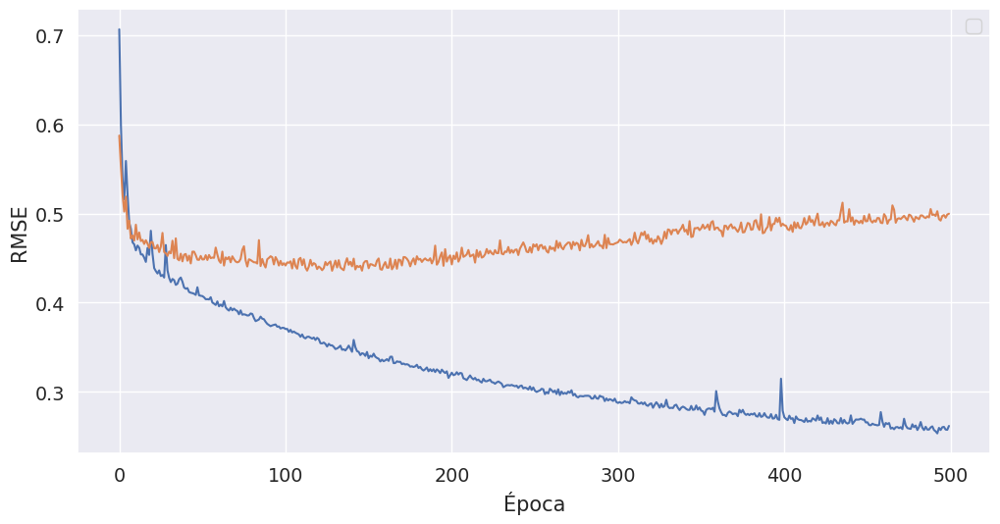

In [58]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Aca ya directamente a partir de un punto empieza a desaprender las cosas útiles que aprendió.

Como podemos solucionar este problema? Qué métodos vimos para mejorar la generalización del modelo?

Probamos el método de [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) primero con el modelo anterior con muchas neuronas:

In [59]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dropout(0.25))
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [60]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 24s - loss: 0.8831

1312/6000 [=====>........................] - ETA: 0s - loss: 0.7620 

2592/6000 [===========>..................] - ETA: 0s - loss: 0.7096

3904/6000 [==================>...........] - ETA: 0s - loss: 0.6300

5120/6000 [========================>.....] - ETA: 0s - loss: 0.5876

6000/6000 [==============================] - 0s 81us/step - loss: 0.5672 - val_loss: 0.3903


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3913

1312/6000 [=====>........................] - ETA: 0s - loss: 0.4684

2624/6000 [============>.................] - ETA: 0s - loss: 0.4419

3840/6000 [==================>...........] - ETA: 0s - loss: 0.5184

5056/6000 [========================>.....] - ETA: 0s - loss: 0.4836

6000/6000 [==============================] - 0s 56us/step - loss: 0.4737 - val_loss: 0.3405


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3743

1280/6000 [=====>........................] - ETA: 0s - loss: 0.6465

2560/6000 [===========>..................] - ETA: 0s - loss: 0.5194

3808/6000 [==================>...........] - ETA: 0s - loss: 0.4886

5088/6000 [========================>.....] - ETA: 0s - loss: 0.4549

6000/6000 [==============================] - 0s 56us/step - loss: 0.4330 - val_loss: 0.2982


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4265

1184/6000 [====>.........................] - ETA: 0s - loss: 0.3392

2432/6000 [===========>..................] - ETA: 0s - loss: 0.3471

3680/6000 [=================>............] - ETA: 0s - loss: 0.3525

4928/6000 [=======================>......] - ETA: 0s - loss: 0.3528

6000/6000 [==============================] - 0s 57us/step - loss: 0.3481 - val_loss: 0.2816


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1506

1248/6000 [=====>........................] - ETA: 0s - loss: 0.3138

2496/6000 [===========>..................] - ETA: 0s - loss: 0.3299

3648/6000 [=================>............] - ETA: 0s - loss: 0.3335

4864/6000 [=======================>......] - ETA: 0s - loss: 0.3520

6000/6000 [==============================] - 0s 57us/step - loss: 0.3444 - val_loss: 0.2609


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2437

1248/6000 [=====>........................] - ETA: 0s - loss: 0.3311

2432/6000 [===========>..................] - ETA: 0s - loss: 0.3642

3680/6000 [=================>............] - ETA: 0s - loss: 0.3543

4960/6000 [=======================>......] - ETA: 0s - loss: 0.3352

6000/6000 [==============================] - 0s 58us/step - loss: 0.3266 - val_loss: 0.2500


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3359

1184/6000 [====>.........................] - ETA: 0s - loss: 0.3346

2304/6000 [==========>...................] - ETA: 0s - loss: 0.3005

3456/6000 [================>.............] - ETA: 0s - loss: 0.2968

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2964

5920/6000 [============================>.] - ETA: 0s - loss: 0.2988

6000/6000 [==============================] - 0s 58us/step - loss: 0.2998 - val_loss: 0.2428


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2622

1248/6000 [=====>........................] - ETA: 0s - loss: 0.3099

2464/6000 [===========>..................] - ETA: 0s - loss: 0.3062

3712/6000 [=================>............] - ETA: 0s - loss: 0.2960

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2872

6000/6000 [==============================] - 0s 57us/step - loss: 0.2909 - val_loss: 0.2372


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1626

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2746

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2989

3712/6000 [=================>............] - ETA: 0s - loss: 0.2808

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2865

6000/6000 [==============================] - 0s 58us/step - loss: 0.2874 - val_loss: 0.2364


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2595

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2926

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2765

3744/6000 [=================>............] - ETA: 0s - loss: 0.2780

5024/6000 [========================>.....] - ETA: 0s - loss: 0.3133

6000/6000 [==============================] - 0s 57us/step - loss: 0.3067 - val_loss: 0.2367


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1608

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2628

2624/6000 [============>.................] - ETA: 0s - loss: 0.2632

3904/6000 [==================>...........] - ETA: 0s - loss: 0.3003

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2927

6000/6000 [==============================] - 0s 54us/step - loss: 0.2888 - val_loss: 0.2300


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2070

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2694

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2708

3616/6000 [=================>............] - ETA: 0s - loss: 0.2724

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2734

6000/6000 [==============================] - 0s 56us/step - loss: 0.2718 - val_loss: 0.2252


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1383

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2715

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2695

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2701

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2665

6000/6000 [==============================] - 0s 55us/step - loss: 0.2612 - val_loss: 0.2251


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6237

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2999

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2821

3744/6000 [=================>............] - ETA: 0s - loss: 0.2646

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2651

6000/6000 [==============================] - 0s 58us/step - loss: 0.2592 - val_loss: 0.2209


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2302

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2700

2624/6000 [============>.................] - ETA: 0s - loss: 0.2671

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2547

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2555

6000/6000 [==============================] - 0s 54us/step - loss: 0.2609 - val_loss: 0.2291


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3113

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2400

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2456

3776/6000 [=================>............] - ETA: 0s - loss: 0.2542

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2501

6000/6000 [==============================] - 0s 55us/step - loss: 0.2553 - val_loss: 0.2230


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1179

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2037

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2244

3712/6000 [=================>............] - ETA: 0s - loss: 0.2435

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2471

6000/6000 [==============================] - 0s 59us/step - loss: 0.2523 - val_loss: 0.2240


Epoch 18/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2710

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2373

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2501

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2532

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2597

6000/6000 [==============================] - 0s 56us/step - loss: 0.2581 - val_loss: 0.2242


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1473

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2200

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2329

3680/6000 [=================>............] - ETA: 0s - loss: 0.2481

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2542

6000/6000 [==============================] - 0s 59us/step - loss: 0.2518 - val_loss: 0.2172


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3129

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2291

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2305

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2445

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2460

6000/6000 [==============================] - 0s 55us/step - loss: 0.2450 - val_loss: 0.2168


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1640

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2470

2624/6000 [============>.................] - ETA: 0s - loss: 0.2433

3744/6000 [=================>............] - ETA: 0s - loss: 0.2460

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2456

6000/6000 [==============================] - 0s 58us/step - loss: 0.2442 - val_loss: 0.2141


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1349

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1984

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2303

3712/6000 [=================>............] - ETA: 0s - loss: 0.2361

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2348

6000/6000 [==============================] - 0s 58us/step - loss: 0.2415 - val_loss: 0.2169


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3045

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2573

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2413

3776/6000 [=================>............] - ETA: 0s - loss: 0.2384

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2379

6000/6000 [==============================] - 0s 56us/step - loss: 0.2456 - val_loss: 0.2199


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2681

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2508

3744/6000 [=================>............] - ETA: 0s - loss: 0.2483

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2421

6000/6000 [==============================] - 0s 59us/step - loss: 0.2434 - val_loss: 0.2162


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2715

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2471

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2391

3776/6000 [=================>............] - ETA: 0s - loss: 0.2492

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2431

6000/6000 [==============================] - 0s 58us/step - loss: 0.2395 - val_loss: 0.2179


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2317

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2387

3712/6000 [=================>............] - ETA: 0s - loss: 0.2364

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2392

6000/6000 [==============================] - 0s 55us/step - loss: 0.2352 - val_loss: 0.2123


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1963

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2398

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2424

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2421

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2453

6000/6000 [==============================] - 0s 56us/step - loss: 0.2392 - val_loss: 0.2145


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1940

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2314

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2214

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2293

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2334

6000/6000 [==============================] - 0s 57us/step - loss: 0.2352 - val_loss: 0.2107


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1174

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2196

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2367

3648/6000 [=================>............] - ETA: 0s - loss: 0.2356

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2305

6000/6000 [==============================] - 0s 58us/step - loss: 0.2344 - val_loss: 0.2114


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2319

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2448

2624/6000 [============>.................] - ETA: 0s - loss: 0.2526

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2416

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2373

6000/6000 [==============================] - 0s 56us/step - loss: 0.2400 - val_loss: 0.2089


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2057

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2404

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2364

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2303

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 56us/step - loss: 0.2317 - val_loss: 0.2155


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2579

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2450

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2437

3584/6000 [================>.............] - ETA: 0s - loss: 0.2396

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 57us/step - loss: 0.2325 - val_loss: 0.2097


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2348

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2321

3776/6000 [=================>............] - ETA: 0s - loss: 0.2298

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2295

6000/6000 [==============================] - 0s 59us/step - loss: 0.2281 - val_loss: 0.2148


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4442

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2488

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2434

3776/6000 [=================>............] - ETA: 0s - loss: 0.2427

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2357

6000/6000 [==============================] - 0s 58us/step - loss: 0.2356 - val_loss: 0.2104


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2247

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2147

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2407

3392/6000 [===============>..............] - ETA: 0s - loss: 0.2362

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2322

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2265

6000/6000 [==============================] - 0s 61us/step - loss: 0.2293 - val_loss: 0.2053


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1548

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2251

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2193

3616/6000 [=================>............] - ETA: 0s - loss: 0.2216

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 58us/step - loss: 0.2266 - val_loss: 0.2089


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1772

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2162

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2158

3712/6000 [=================>............] - ETA: 0s - loss: 0.2346

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2283

6000/6000 [==============================] - 0s 60us/step - loss: 0.2290 - val_loss: 0.2076


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1013

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2313

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2342

3680/6000 [=================>............] - ETA: 0s - loss: 0.2274

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 58us/step - loss: 0.2307 - val_loss: 0.2094


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2467

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2154

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2165

3360/6000 [===============>..............] - ETA: 0s - loss: 0.2204

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2222

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 60us/step - loss: 0.2259 - val_loss: 0.2100


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2839

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2038

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2122

3648/6000 [=================>............] - ETA: 0s - loss: 0.2141

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2168

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2202

6000/6000 [==============================] - 0s 64us/step - loss: 0.2281 - val_loss: 0.2110


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2244

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2411

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2368

3392/6000 [===============>..............] - ETA: 0s - loss: 0.2315

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2284

5920/6000 [============================>.] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 58us/step - loss: 0.2236 - val_loss: 0.2055


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3149

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2639

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2422

3616/6000 [=================>............] - ETA: 0s - loss: 0.2359

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2316

6000/6000 [==============================] - 0s 60us/step - loss: 0.2266 - val_loss: 0.2095


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1596

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2436

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2425

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2291

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 58us/step - loss: 0.2240 - val_loss: 0.2044


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1506

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2424

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2424

3744/6000 [=================>............] - ETA: 0s - loss: 0.2255

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 57us/step - loss: 0.2252 - val_loss: 0.2083


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2136

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2213

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2129

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2169

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 58us/step - loss: 0.2200 - val_loss: 0.2045


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3862

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2232

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2206

3584/6000 [================>.............] - ETA: 0s - loss: 0.2201

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2173

6000/6000 [==============================] - 0s 58us/step - loss: 0.2203 - val_loss: 0.2025


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1260

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2179

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2054

3776/6000 [=================>............] - ETA: 0s - loss: 0.2168

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2194

6000/6000 [==============================] - 0s 56us/step - loss: 0.2190 - val_loss: 0.2059


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2733

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1991

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2213

3680/6000 [=================>............] - ETA: 0s - loss: 0.2191

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2119

6000/6000 [==============================] - 0s 56us/step - loss: 0.2170 - val_loss: 0.2081


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4323

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2274

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2161

3648/6000 [=================>............] - ETA: 0s - loss: 0.2238

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2177

6000/6000 [==============================] - 0s 57us/step - loss: 0.2185 - val_loss: 0.2016


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1311

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1925

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2101

3648/6000 [=================>............] - ETA: 0s - loss: 0.2177

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2167

6000/6000 [==============================] - 0s 59us/step - loss: 0.2198 - val_loss: 0.2048


Epoch 51/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3172

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2180

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2134

3680/6000 [=================>............] - ETA: 0s - loss: 0.2148

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 56us/step - loss: 0.2222 - val_loss: 0.2019


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1490

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2006

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1924

3584/6000 [================>.............] - ETA: 0s - loss: 0.2077

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2137

6000/6000 [==============================] - 0s 57us/step - loss: 0.2150 - val_loss: 0.2027


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2812

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2307

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2328

3776/6000 [=================>............] - ETA: 0s - loss: 0.2250

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 55us/step - loss: 0.2236 - val_loss: 0.2102


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1209

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1989

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2088

3712/6000 [=================>............] - ETA: 0s - loss: 0.2138

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2182

6000/6000 [==============================] - 0s 57us/step - loss: 0.2181 - val_loss: 0.2062


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1978

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2039

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2049

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2125

6000/6000 [==============================] - 0s 55us/step - loss: 0.2153 - val_loss: 0.2050


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1985

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2146

3616/6000 [=================>............] - ETA: 0s - loss: 0.2134

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2181

5824/6000 [============================>.] - ETA: 0s - loss: 0.2157

6000/6000 [==============================] - 0s 60us/step - loss: 0.2183 - val_loss: 0.2023


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0918

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2125

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2215

3552/6000 [================>.............] - ETA: 0s - loss: 0.2220

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2152

5888/6000 [============================>.] - ETA: 0s - loss: 0.2144

6000/6000 [==============================] - 0s 59us/step - loss: 0.2148 - val_loss: 0.2007


Epoch 58/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2962

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2065

2624/6000 [============>.................] - ETA: 0s - loss: 0.2105

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2067

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2164

6000/6000 [==============================] - 0s 57us/step - loss: 0.2154 - val_loss: 0.1987


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1765

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2154

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2120

3712/6000 [=================>............] - ETA: 0s - loss: 0.2218

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 56us/step - loss: 0.2172 - val_loss: 0.2008


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2137

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2312

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2198

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2167

6000/6000 [==============================] - 0s 56us/step - loss: 0.2165 - val_loss: 0.2012


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1768

1024/6000 [====>.........................] - ETA: 0s - loss: 0.2359

2208/6000 [==========>...................] - ETA: 0s - loss: 0.2154

3456/6000 [================>.............] - ETA: 0s - loss: 0.2185

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 58us/step - loss: 0.2203 - val_loss: 0.2083


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2043

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2137

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2046

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2056

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2128

6000/6000 [==============================] - 0s 56us/step - loss: 0.2150 - val_loss: 0.1992


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1495

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2035

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2121

3776/6000 [=================>............] - ETA: 0s - loss: 0.2070

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2131

6000/6000 [==============================] - 0s 56us/step - loss: 0.2103 - val_loss: 0.1980


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1700

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2103

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2020

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2146

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2107

6000/6000 [==============================] - 0s 55us/step - loss: 0.2143 - val_loss: 0.2000


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2180

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2142

2624/6000 [============>.................] - ETA: 0s - loss: 0.2102

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2111

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2107

6000/6000 [==============================] - 0s 56us/step - loss: 0.2123 - val_loss: 0.1998


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1194

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1974

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2066

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2078

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2105

6000/6000 [==============================] - 0s 55us/step - loss: 0.2109 - val_loss: 0.1954


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2708

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1979

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2091

3680/6000 [=================>............] - ETA: 0s - loss: 0.2091

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2079

6000/6000 [==============================] - 0s 56us/step - loss: 0.2102 - val_loss: 0.2014


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0818

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2022

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2097

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2083

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2117

6000/6000 [==============================] - 0s 55us/step - loss: 0.2084 - val_loss: 0.1948


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3459

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2061

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2115

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2114

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2111

6000/6000 [==============================] - 0s 55us/step - loss: 0.2098 - val_loss: 0.1937


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1886

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1963

3616/6000 [=================>............] - ETA: 0s - loss: 0.2082

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2075

6000/6000 [==============================] - 0s 58us/step - loss: 0.2119 - val_loss: 0.2012


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1831

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1858

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2082

3744/6000 [=================>............] - ETA: 0s - loss: 0.2159

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2129

6000/6000 [==============================] - 0s 56us/step - loss: 0.2130 - val_loss: 0.1944


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3182

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2076

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2120

3648/6000 [=================>............] - ETA: 0s - loss: 0.2100

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2070

6000/6000 [==============================] - 0s 56us/step - loss: 0.2102 - val_loss: 0.1965


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0862

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1894

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1972

3616/6000 [=================>............] - ETA: 0s - loss: 0.2075

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2048

6000/6000 [==============================] - 0s 58us/step - loss: 0.2073 - val_loss: 0.1956


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2768

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2051

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2133

3648/6000 [=================>............] - ETA: 0s - loss: 0.2071

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2084

6000/6000 [==============================] - 0s 58us/step - loss: 0.2109 - val_loss: 0.1969


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1098

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1968

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2150

3744/6000 [=================>............] - ETA: 0s - loss: 0.2094

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2128

6000/6000 [==============================] - 0s 55us/step - loss: 0.2115 - val_loss: 0.2030


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2420

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2168

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2177

3648/6000 [=================>............] - ETA: 0s - loss: 0.2156

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2134

6000/6000 [==============================] - 0s 56us/step - loss: 0.2089 - val_loss: 0.1943


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0816

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1918

1856/6000 [========>.....................] - ETA: 0s - loss: 0.2056

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2038

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2056

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2052

6000/6000 [==============================] - 0s 62us/step - loss: 0.2056 - val_loss: 0.1963


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1665

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1945

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2115

3520/6000 [================>.............] - ETA: 0s - loss: 0.2154

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2170

6000/6000 [==============================] - 0s 57us/step - loss: 0.2099 - val_loss: 0.1946


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2450

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2168

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2065

3648/6000 [=================>............] - ETA: 0s - loss: 0.2002

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2004

6000/6000 [==============================] - 0s 56us/step - loss: 0.2049 - val_loss: 0.1947


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0775

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2141

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2121

3776/6000 [=================>............] - ETA: 0s - loss: 0.2090

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2098

6000/6000 [==============================] - 0s 55us/step - loss: 0.2065 - val_loss: 0.1973


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1572

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1863

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2013

3776/6000 [=================>............] - ETA: 0s - loss: 0.2012

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2103

6000/6000 [==============================] - 0s 55us/step - loss: 0.2075 - val_loss: 0.1945


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2213

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1962

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2076

3712/6000 [=================>............] - ETA: 0s - loss: 0.2074

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2053

6000/6000 [==============================] - 0s 56us/step - loss: 0.2062 - val_loss: 0.1985


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2282

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1915

3648/6000 [=================>............] - ETA: 0s - loss: 0.1935

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2001

6000/6000 [==============================] - 0s 58us/step - loss: 0.2051 - val_loss: 0.1972


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1728

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2048

2656/6000 [============>.................] - ETA: 0s - loss: 0.2105

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2020

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2027

6000/6000 [==============================] - 0s 55us/step - loss: 0.2018 - val_loss: 0.1958


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2132

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2175

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2162

3584/6000 [================>.............] - ETA: 0s - loss: 0.2125

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2087

6000/6000 [==============================] - 0s 58us/step - loss: 0.2055 - val_loss: 0.1982


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0973

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1866

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1908

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1996

6000/6000 [==============================] - 0s 57us/step - loss: 0.2036 - val_loss: 0.1953


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1052

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2117

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2081

3744/6000 [=================>............] - ETA: 0s - loss: 0.2096

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2071

6000/6000 [==============================] - 0s 55us/step - loss: 0.2059 - val_loss: 0.1965


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1322

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1907

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1973

3680/6000 [=================>............] - ETA: 0s - loss: 0.2024

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1938

6000/6000 [==============================] - 0s 58us/step - loss: 0.1959 - val_loss: 0.1977


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0950

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1967

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2064

3712/6000 [=================>............] - ETA: 0s - loss: 0.2115

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2119

6000/6000 [==============================] - 0s 57us/step - loss: 0.2079 - val_loss: 0.1911


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2031

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2049

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1951

3488/6000 [================>.............] - ETA: 0s - loss: 0.1988

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2012

5920/6000 [============================>.] - ETA: 0s - loss: 0.2009

6000/6000 [==============================] - 0s 59us/step - loss: 0.2011 - val_loss: 0.1933


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2066

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2125

3680/6000 [=================>............] - ETA: 0s - loss: 0.2041

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2060

6000/6000 [==============================] - 0s 60us/step - loss: 0.2052 - val_loss: 0.2002


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2161

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1982

3456/6000 [================>.............] - ETA: 0s - loss: 0.2005

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1971

5856/6000 [============================>.] - ETA: 0s - loss: 0.2033

6000/6000 [==============================] - 0s 61us/step - loss: 0.2035 - val_loss: 0.1911


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1570

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1936

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1977

3648/6000 [=================>............] - ETA: 0s - loss: 0.2000

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1999

6000/6000 [==============================] - 0s 57us/step - loss: 0.2021 - val_loss: 0.1907


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1024

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2064

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2012

3552/6000 [================>.............] - ETA: 0s - loss: 0.2123

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2043

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2030

6000/6000 [==============================] - 0s 62us/step - loss: 0.2031 - val_loss: 0.1947


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3694

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1980

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2018

3584/6000 [================>.............] - ETA: 0s - loss: 0.2011

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1970

6000/6000 [==============================] - 0s 58us/step - loss: 0.1993 - val_loss: 0.1889


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2031

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2113

3648/6000 [=================>............] - ETA: 0s - loss: 0.2063

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2036

6000/6000 [==============================] - 0s 57us/step - loss: 0.2013 - val_loss: 0.1884


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1632

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1960

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1959

3584/6000 [================>.............] - ETA: 0s - loss: 0.1968

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2006

6000/6000 [==============================] - 0s 57us/step - loss: 0.2022 - val_loss: 0.1894


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1054

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2173

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3744/6000 [=================>............] - ETA: 0s - loss: 0.2003

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2062

6000/6000 [==============================] - 0s 56us/step - loss: 0.2026 - val_loss: 0.1977


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2778

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1942

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1931

3552/6000 [================>.............] - ETA: 0s - loss: 0.1948

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1985

6000/6000 [==============================] - 0s 59us/step - loss: 0.2020 - val_loss: 0.1886


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1794

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1719

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1834

3712/6000 [=================>............] - ETA: 0s - loss: 0.1924

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1984

6000/6000 [==============================] - 0s 56us/step - loss: 0.1984 - val_loss: 0.1941


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2272

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1981

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2033

3648/6000 [=================>............] - ETA: 0s - loss: 0.2069

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2032

6000/6000 [==============================] - 0s 57us/step - loss: 0.2024 - val_loss: 0.1899


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2701

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1988

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1927

3680/6000 [=================>............] - ETA: 0s - loss: 0.2034

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2038

6000/6000 [==============================] - 0s 56us/step - loss: 0.2062 - val_loss: 0.1916


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1022

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1708

1824/6000 [========>.....................] - ETA: 0s - loss: 0.1898

2912/6000 [=============>................] - ETA: 0s - loss: 0.1879

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1913

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1912

6000/6000 [==============================] - 0s 64us/step - loss: 0.1986 - val_loss: 0.1946


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1363

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1964

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1944

3424/6000 [================>.............] - ETA: 0s - loss: 0.1961

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1930

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1951

6000/6000 [==============================] - 0s 60us/step - loss: 0.1982 - val_loss: 0.1933


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1837

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1921

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1993

3520/6000 [================>.............] - ETA: 0s - loss: 0.2034

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1973

5856/6000 [============================>.] - ETA: 0s - loss: 0.1974

6000/6000 [==============================] - 0s 61us/step - loss: 0.1978 - val_loss: 0.1924


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2458

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1953

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1879

3520/6000 [================>.............] - ETA: 0s - loss: 0.1935

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1978

5888/6000 [============================>.] - ETA: 0s - loss: 0.2013

6000/6000 [==============================] - 0s 60us/step - loss: 0.2009 - val_loss: 0.1917


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2057

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2015

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2022

3648/6000 [=================>............] - ETA: 0s - loss: 0.1937

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1957

6000/6000 [==============================] - 0s 57us/step - loss: 0.2068 - val_loss: 0.1923


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1024

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1860

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1945

3488/6000 [================>.............] - ETA: 0s - loss: 0.2021

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2030

5824/6000 [============================>.] - ETA: 0s - loss: 0.2013

6000/6000 [==============================] - 0s 59us/step - loss: 0.2024 - val_loss: 0.1936


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2323

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2119

3712/6000 [=================>............] - ETA: 0s - loss: 0.1975

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2007

6000/6000 [==============================] - 0s 59us/step - loss: 0.1978 - val_loss: 0.1937


Epoch 110/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1839

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1904

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1938

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1952

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1931

6000/6000 [==============================] - 0s 57us/step - loss: 0.1967 - val_loss: 0.1985


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2795

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1979

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1977

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1985

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2023

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2028

6000/6000 [==============================] - 0s 62us/step - loss: 0.2016 - val_loss: 0.1924


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2009

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2034

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1987

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1970

6000/6000 [==============================] - 0s 56us/step - loss: 0.1989 - val_loss: 0.1935


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1760

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1987

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1921

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1923

6000/6000 [==============================] - 0s 56us/step - loss: 0.1960 - val_loss: 0.1932


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1727

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1972

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1987

3520/6000 [================>.............] - ETA: 0s - loss: 0.1912

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1963

5920/6000 [============================>.] - ETA: 0s - loss: 0.1972

6000/6000 [==============================] - 0s 59us/step - loss: 0.1976 - val_loss: 0.1948


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1959

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1868

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1917

3488/6000 [================>.............] - ETA: 0s - loss: 0.2015

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2039

5920/6000 [============================>.] - ETA: 0s - loss: 0.1995

6000/6000 [==============================] - 0s 59us/step - loss: 0.2000 - val_loss: 0.1950


Epoch 116/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2991

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2212

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1958

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1993

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1996

6000/6000 [==============================] - 0s 54us/step - loss: 0.1968 - val_loss: 0.1940


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2646

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1941

2080/6000 [=========>....................] - ETA: 0s - loss: 0.1895

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1973

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1993

5824/6000 [============================>.] - ETA: 0s - loss: 0.1991

6000/6000 [==============================] - 0s 60us/step - loss: 0.1984 - val_loss: 0.1945


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2879

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2047

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1915

3584/6000 [================>.............] - ETA: 0s - loss: 0.1972

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1975

6000/6000 [==============================] - 0s 58us/step - loss: 0.1983 - val_loss: 0.1964


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1033

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1986

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1963

3584/6000 [================>.............] - ETA: 0s - loss: 0.1929

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1938

5984/6000 [============================>.] - ETA: 0s - loss: 0.1921

6000/6000 [==============================] - 0s 58us/step - loss: 0.1925 - val_loss: 0.1958


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2216

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1910

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1877

3616/6000 [=================>............] - ETA: 0s - loss: 0.1782

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1857

6000/6000 [==============================] - 0s 57us/step - loss: 0.1941 - val_loss: 0.1921


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2103

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1854

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1935

3648/6000 [=================>............] - ETA: 0s - loss: 0.1898

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1944

6000/6000 [==============================] - 0s 57us/step - loss: 0.1975 - val_loss: 0.1900


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1459

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2065

2624/6000 [============>.................] - ETA: 0s - loss: 0.2001

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1977

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1981

6000/6000 [==============================] - 0s 54us/step - loss: 0.1964 - val_loss: 0.1914


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0760

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2116

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2002

3456/6000 [================>.............] - ETA: 0s - loss: 0.1979

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1998

5824/6000 [============================>.] - ETA: 0s - loss: 0.1953

6000/6000 [==============================] - 0s 61us/step - loss: 0.1940 - val_loss: 0.1930


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2956

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1916

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2004

3648/6000 [=================>............] - ETA: 0s - loss: 0.1963

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1946

6000/6000 [==============================] - 0s 57us/step - loss: 0.1946 - val_loss: 0.1904


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1567

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1953

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1910

3520/6000 [================>.............] - ETA: 0s - loss: 0.1894

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1909

5984/6000 [============================>.] - ETA: 0s - loss: 0.1929

6000/6000 [==============================] - 0s 58us/step - loss: 0.1928 - val_loss: 0.1920


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3226

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1719

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1785

3520/6000 [================>.............] - ETA: 0s - loss: 0.1823

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1838

5920/6000 [============================>.] - ETA: 0s - loss: 0.1924

6000/6000 [==============================] - 0s 61us/step - loss: 0.1920 - val_loss: 0.1961


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1686

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2047

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1955

3584/6000 [================>.............] - ETA: 0s - loss: 0.2023

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1963

6000/6000 [==============================] - 0s 59us/step - loss: 0.1928 - val_loss: 0.1897


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1523

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1884

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1848

3616/6000 [=================>............] - ETA: 0s - loss: 0.1875

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1925

5984/6000 [============================>.] - ETA: 0s - loss: 0.1930

6000/6000 [==============================] - 0s 60us/step - loss: 0.1934 - val_loss: 0.1906


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0559

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1879

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2018

3680/6000 [=================>............] - ETA: 0s - loss: 0.2019

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1999

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1957

6000/6000 [==============================] - 0s 62us/step - loss: 0.1937 - val_loss: 0.1872


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1222

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1919

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1995

3616/6000 [=================>............] - ETA: 0s - loss: 0.1921

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1924

6000/6000 [==============================] - 0s 57us/step - loss: 0.1922 - val_loss: 0.1891


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2577

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1856

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1833

3616/6000 [=================>............] - ETA: 0s - loss: 0.1917

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1932

5952/6000 [============================>.] - ETA: 0s - loss: 0.1923

6000/6000 [==============================] - 0s 60us/step - loss: 0.1916 - val_loss: 0.1896


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1956

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1904

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1931

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 54us/step - loss: 0.1906 - val_loss: 0.1913


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2431

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2148

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2057

3712/6000 [=================>............] - ETA: 0s - loss: 0.1920

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1940

6000/6000 [==============================] - 0s 58us/step - loss: 0.1919 - val_loss: 0.1920


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1572

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1917

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1957

3520/6000 [================>.............] - ETA: 0s - loss: 0.2006

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2008

5984/6000 [============================>.] - ETA: 0s - loss: 0.1994

6000/6000 [==============================] - 0s 60us/step - loss: 0.1999 - val_loss: 0.1970


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1724

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1877

3744/6000 [=================>............] - ETA: 0s - loss: 0.1908

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1910

6000/6000 [==============================] - 0s 57us/step - loss: 0.1943 - val_loss: 0.1941


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1251

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1831

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1838

3552/6000 [================>.............] - ETA: 0s - loss: 0.1882

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1910

5952/6000 [============================>.] - ETA: 0s - loss: 0.1959

6000/6000 [==============================] - 0s 59us/step - loss: 0.1952 - val_loss: 0.1887


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2957

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1907

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2025

3776/6000 [=================>............] - ETA: 0s - loss: 0.2026

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1924

6000/6000 [==============================] - 0s 56us/step - loss: 0.1926 - val_loss: 0.1889


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2959

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1996

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1969

3744/6000 [=================>............] - ETA: 0s - loss: 0.2025

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1954

6000/6000 [==============================] - 0s 57us/step - loss: 0.1938 - val_loss: 0.1901


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1851

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1813

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1823

3712/6000 [=================>............] - ETA: 0s - loss: 0.1826

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 56us/step - loss: 0.1915 - val_loss: 0.1864


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2354

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1989

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2093

3456/6000 [================>.............] - ETA: 0s - loss: 0.1984

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1965

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1937

6000/6000 [==============================] - 0s 60us/step - loss: 0.1923 - val_loss: 0.1906


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1844

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1922

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1842

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1847

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1866

6000/6000 [==============================] - 0s 55us/step - loss: 0.1904 - val_loss: 0.1888


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2415

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1952

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1894

3776/6000 [=================>............] - ETA: 0s - loss: 0.1913

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1911

6000/6000 [==============================] - 0s 56us/step - loss: 0.1923 - val_loss: 0.1863


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1435

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2045

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2054

3616/6000 [=================>............] - ETA: 0s - loss: 0.2010

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1953

5920/6000 [============================>.] - ETA: 0s - loss: 0.1903

6000/6000 [==============================] - 0s 62us/step - loss: 0.1893 - val_loss: 0.1889


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1089

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1863

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1953

3680/6000 [=================>............] - ETA: 0s - loss: 0.1969

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1901

6000/6000 [==============================] - 0s 56us/step - loss: 0.1907 - val_loss: 0.1900


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1966

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1892

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1874

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1872

6000/6000 [==============================] - 0s 56us/step - loss: 0.1890 - val_loss: 0.1884


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2735

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1894

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1875

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1888

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1907

6000/6000 [==============================] - 0s 55us/step - loss: 0.1921 - val_loss: 0.1868


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1206

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1863

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1841

3776/6000 [=================>............] - ETA: 0s - loss: 0.1848

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 56us/step - loss: 0.1894 - val_loss: 0.1874


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2134

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1878

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1794

3776/6000 [=================>............] - ETA: 0s - loss: 0.1845

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1868

6000/6000 [==============================] - 0s 57us/step - loss: 0.1883 - val_loss: 0.1901


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4699

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1865

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1826

3616/6000 [=================>............] - ETA: 0s - loss: 0.1806

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 57us/step - loss: 0.1891 - val_loss: 0.1910


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2514

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1738

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1788

3680/6000 [=================>............] - ETA: 0s - loss: 0.1800

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 56us/step - loss: 0.1883 - val_loss: 0.1888


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1092

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1823

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1820

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1816

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1855

6000/6000 [==============================] - 0s 54us/step - loss: 0.1864 - val_loss: 0.1922


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1055

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1809

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1860

3616/6000 [=================>............] - ETA: 0s - loss: 0.1915

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1883

6000/6000 [==============================] - 0s 58us/step - loss: 0.1876 - val_loss: 0.1888


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2581

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2279

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2037

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1925

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1927

6000/6000 [==============================] - 0s 56us/step - loss: 0.1901 - val_loss: 0.1880


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1535

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2022

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1941

3648/6000 [=================>............] - ETA: 0s - loss: 0.1944

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1927

6000/6000 [==============================] - 0s 59us/step - loss: 0.1897 - val_loss: 0.1910


Epoch 155/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2042

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1988

3552/6000 [================>.............] - ETA: 0s - loss: 0.1988

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1977

5920/6000 [============================>.] - ETA: 0s - loss: 0.1925

6000/6000 [==============================] - 0s 60us/step - loss: 0.1916 - val_loss: 0.1957


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3374

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1999

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1913

3552/6000 [================>.............] - ETA: 0s - loss: 0.1932

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1903

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 61us/step - loss: 0.1905 - val_loss: 0.1893


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1017

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1861

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1876

3584/6000 [================>.............] - ETA: 0s - loss: 0.1889

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1859

6000/6000 [==============================] - 0s 58us/step - loss: 0.1916 - val_loss: 0.1924


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2015

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1746

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1812

3680/6000 [=================>............] - ETA: 0s - loss: 0.1952

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1945

6000/6000 [==============================] - 0s 57us/step - loss: 0.1927 - val_loss: 0.1899


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1890

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1862

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1880

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1859

6000/6000 [==============================] - 0s 54us/step - loss: 0.1893 - val_loss: 0.1966


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1087

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1762

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1944

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1882

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 56us/step - loss: 0.1895 - val_loss: 0.1908


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1124

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1816

3424/6000 [================>.............] - ETA: 0s - loss: 0.1857

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1899

5952/6000 [============================>.] - ETA: 0s - loss: 0.1912

6000/6000 [==============================] - 0s 58us/step - loss: 0.1922 - val_loss: 0.1917


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2637

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1700

2720/6000 [============>.................] - ETA: 0s - loss: 0.1762

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1854

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1861

6000/6000 [==============================] - 0s 55us/step - loss: 0.1874 - val_loss: 0.1908


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1701

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2008

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1970

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1993

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1954

6000/6000 [==============================] - 0s 56us/step - loss: 0.1958 - val_loss: 0.1904


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1218

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1889

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1862

3616/6000 [=================>............] - ETA: 0s - loss: 0.1847

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1865

6000/6000 [==============================] - 0s 57us/step - loss: 0.1887 - val_loss: 0.1922


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1615

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1950

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1935

3584/6000 [================>.............] - ETA: 0s - loss: 0.1861

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1871

5888/6000 [============================>.] - ETA: 0s - loss: 0.1904

6000/6000 [==============================] - 0s 60us/step - loss: 0.1916 - val_loss: 0.1898


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1742

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2002

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1912

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1888

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 55us/step - loss: 0.1893 - val_loss: 0.1905


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2439

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1666

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1766

3648/6000 [=================>............] - ETA: 0s - loss: 0.1836

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1885

6000/6000 [==============================] - 0s 57us/step - loss: 0.1887 - val_loss: 0.1923


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1776

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1721

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1827

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1857

6000/6000 [==============================] - 0s 55us/step - loss: 0.1896 - val_loss: 0.1885


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3755

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1952

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1924

3712/6000 [=================>............] - ETA: 0s - loss: 0.1908

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1941

6000/6000 [==============================] - 0s 56us/step - loss: 0.1892 - val_loss: 0.1873


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3556

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1834

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1837

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1851

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1851

6000/6000 [==============================] - 0s 55us/step - loss: 0.1876 - val_loss: 0.1898


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1102

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1876

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1944

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1967

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1946

6000/6000 [==============================] - 0s 56us/step - loss: 0.1920 - val_loss: 0.1932


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2290

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2085

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1961

3712/6000 [=================>............] - ETA: 0s - loss: 0.1988

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1972

6000/6000 [==============================] - 0s 57us/step - loss: 0.1925 - val_loss: 0.1882


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1445

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1873

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1885

3424/6000 [================>.............] - ETA: 0s - loss: 0.1849

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1858

5856/6000 [============================>.] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 63us/step - loss: 0.1883 - val_loss: 0.1978


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1653

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1717

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1813

3616/6000 [=================>............] - ETA: 0s - loss: 0.1821

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1921

6000/6000 [==============================] - 0s 57us/step - loss: 0.1853 - val_loss: 0.1893


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0803

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1901

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1899

3680/6000 [=================>............] - ETA: 0s - loss: 0.1780

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 57us/step - loss: 0.1886 - val_loss: 0.1942


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1281

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1775

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1836

3744/6000 [=================>............] - ETA: 0s - loss: 0.1831

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 57us/step - loss: 0.1828 - val_loss: 0.1870


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1445

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1776

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1783

3712/6000 [=================>............] - ETA: 0s - loss: 0.1859

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1917

6000/6000 [==============================] - 0s 56us/step - loss: 0.1885 - val_loss: 0.1880


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1776

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1899

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1794

3520/6000 [================>.............] - ETA: 0s - loss: 0.1808

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1850

6000/6000 [==============================] - 0s 60us/step - loss: 0.1879 - val_loss: 0.1900


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1320

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2112

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1959

3584/6000 [================>.............] - ETA: 0s - loss: 0.1913

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1896

5920/6000 [============================>.] - ETA: 0s - loss: 0.1855

6000/6000 [==============================] - 0s 60us/step - loss: 0.1852 - val_loss: 0.1902


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3391

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2084

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1982

3552/6000 [================>.............] - ETA: 0s - loss: 0.1918

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1925

5920/6000 [============================>.] - ETA: 0s - loss: 0.1900

6000/6000 [==============================] - 0s 58us/step - loss: 0.1893 - val_loss: 0.1880


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1267

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1845

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1909

3712/6000 [=================>............] - ETA: 0s - loss: 0.1931

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1877

6000/6000 [==============================] - 0s 57us/step - loss: 0.1868 - val_loss: 0.1886


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1388

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1956

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1773

3776/6000 [=================>............] - ETA: 0s - loss: 0.2007

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1998

6000/6000 [==============================] - 0s 55us/step - loss: 0.2023 - val_loss: 0.1907


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1151

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1856

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1828

3584/6000 [================>.............] - ETA: 0s - loss: 0.1814

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1844

6000/6000 [==============================] - 0s 58us/step - loss: 0.1850 - val_loss: 0.1894


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1409

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1933

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1939

3744/6000 [=================>............] - ETA: 0s - loss: 0.1861

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1874

6000/6000 [==============================] - 0s 57us/step - loss: 0.1855 - val_loss: 0.1900


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2178

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1949

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1927

3712/6000 [=================>............] - ETA: 0s - loss: 0.1931

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1901

6000/6000 [==============================] - 0s 55us/step - loss: 0.1897 - val_loss: 0.1929


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1645

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2656/6000 [============>.................] - ETA: 0s - loss: 0.1911

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1917

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1876

6000/6000 [==============================] - 0s 55us/step - loss: 0.1873 - val_loss: 0.1894


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1252

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1803

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1827

3776/6000 [=================>............] - ETA: 0s - loss: 0.1873

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1850

6000/6000 [==============================] - 0s 55us/step - loss: 0.1846 - val_loss: 0.1881


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1655

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1957

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1930

3616/6000 [=================>............] - ETA: 0s - loss: 0.1992

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 58us/step - loss: 0.1919 - val_loss: 0.1868


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2561

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1793

2656/6000 [============>.................] - ETA: 0s - loss: 0.1870

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1883

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 55us/step - loss: 0.1867 - val_loss: 0.1930


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1779

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1916

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1937

3584/6000 [================>.............] - ETA: 0s - loss: 0.1914

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1868

6000/6000 [==============================] - 0s 59us/step - loss: 0.1896 - val_loss: 0.1885


Epoch 191/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2826

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1749

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1781

3744/6000 [=================>............] - ETA: 0s - loss: 0.1812

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1817

6000/6000 [==============================] - 0s 56us/step - loss: 0.1843 - val_loss: 0.1949


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1935

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2004

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1890

3776/6000 [=================>............] - ETA: 0s - loss: 0.1956

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1872

6000/6000 [==============================] - 0s 57us/step - loss: 0.1848 - val_loss: 0.1920


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1977

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2059

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1907

3776/6000 [=================>............] - ETA: 0s - loss: 0.1835

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1843

6000/6000 [==============================] - 0s 56us/step - loss: 0.1861 - val_loss: 0.1909


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3054

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1897

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2009

3776/6000 [=================>............] - ETA: 0s - loss: 0.1910

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1870

6000/6000 [==============================] - 0s 55us/step - loss: 0.1861 - val_loss: 0.1888


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3505

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2056

2656/6000 [============>.................] - ETA: 0s - loss: 0.1930

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1882

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 54us/step - loss: 0.1869 - val_loss: 0.1889


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0869

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1829

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1883

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1887

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1882

6000/6000 [==============================] - 0s 56us/step - loss: 0.1865 - val_loss: 0.1943


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1885

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1903

3712/6000 [=================>............] - ETA: 0s - loss: 0.1935

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1829

6000/6000 [==============================] - 0s 56us/step - loss: 0.1847 - val_loss: 0.1911


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1841

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1799

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1817

3584/6000 [================>.............] - ETA: 0s - loss: 0.1803

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 57us/step - loss: 0.1848 - val_loss: 0.1906


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1296

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1692

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1776

3648/6000 [=================>............] - ETA: 0s - loss: 0.1818

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 57us/step - loss: 0.1815 - val_loss: 0.1885


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1983

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1853

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1781

3584/6000 [================>.............] - ETA: 0s - loss: 0.1763

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1790

5952/6000 [============================>.] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 58us/step - loss: 0.1839 - val_loss: 0.1873


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1633

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1848

3680/6000 [=================>............] - ETA: 0s - loss: 0.1779

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1841

6000/6000 [==============================] - 0s 57us/step - loss: 0.1837 - val_loss: 0.1954


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2502

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1879

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1838

3424/6000 [================>.............] - ETA: 0s - loss: 0.1802

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1842

5824/6000 [============================>.] - ETA: 0s - loss: 0.1841

6000/6000 [==============================] - 0s 61us/step - loss: 0.1857 - val_loss: 0.1899


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1859

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1855

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1897

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1895

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1878

6000/6000 [==============================] - 0s 55us/step - loss: 0.1871 - val_loss: 0.1864


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1234

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1878

3712/6000 [=================>............] - ETA: 0s - loss: 0.1858

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1848

6000/6000 [==============================] - 0s 56us/step - loss: 0.1863 - val_loss: 0.1892


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2150

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1975

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3712/6000 [=================>............] - ETA: 0s - loss: 0.1864

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1827

6000/6000 [==============================] - 0s 56us/step - loss: 0.1814 - val_loss: 0.1860


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1790

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1879

3776/6000 [=================>............] - ETA: 0s - loss: 0.1932

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1846

6000/6000 [==============================] - 0s 56us/step - loss: 0.1809 - val_loss: 0.1883


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1504

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1757

3712/6000 [=================>............] - ETA: 0s - loss: 0.1769

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1780

6000/6000 [==============================] - 0s 56us/step - loss: 0.1811 - val_loss: 0.1896


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1045

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1574

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1736

3744/6000 [=================>............] - ETA: 0s - loss: 0.1808

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1846

6000/6000 [==============================] - 0s 57us/step - loss: 0.1841 - val_loss: 0.1910


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1749

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1663

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1780

3744/6000 [=================>............] - ETA: 0s - loss: 0.1746

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 54us/step - loss: 0.1813 - val_loss: 0.1952


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1658

2624/6000 [============>.................] - ETA: 0s - loss: 0.1715

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1748

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 57us/step - loss: 0.1820 - val_loss: 0.1933


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2405

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1736

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1823

3776/6000 [=================>............] - ETA: 0s - loss: 0.1868

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1895

6000/6000 [==============================] - 0s 57us/step - loss: 0.1880 - val_loss: 0.1899


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1871

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1890

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1824

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1868

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1872

6000/6000 [==============================] - 0s 56us/step - loss: 0.1861 - val_loss: 0.1885


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0920

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1715

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1869

3648/6000 [=================>............] - ETA: 0s - loss: 0.1811

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 56us/step - loss: 0.1810 - val_loss: 0.1858


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1673

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1705

3680/6000 [=================>............] - ETA: 0s - loss: 0.1768

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 58us/step - loss: 0.1840 - val_loss: 0.1867


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1556

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1752

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1722

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1732

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1784

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1849

6000/6000 [==============================] - 0s 61us/step - loss: 0.1846 - val_loss: 0.1881


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2098

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2054

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1947

3520/6000 [================>.............] - ETA: 0s - loss: 0.1890

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1883

5952/6000 [============================>.] - ETA: 0s - loss: 0.1876

6000/6000 [==============================] - 0s 61us/step - loss: 0.1876 - val_loss: 0.1883


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2007

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1764

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1788

3712/6000 [=================>............] - ETA: 0s - loss: 0.1788

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1824

6000/6000 [==============================] - 0s 58us/step - loss: 0.1828 - val_loss: 0.1874


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1699

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1950

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1919

3616/6000 [=================>............] - ETA: 0s - loss: 0.1892

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1906

6000/6000 [==============================] - 0s 58us/step - loss: 0.1864 - val_loss: 0.1885


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1567

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1923

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1902

3744/6000 [=================>............] - ETA: 0s - loss: 0.1910

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1824

6000/6000 [==============================] - 0s 56us/step - loss: 0.1821 - val_loss: 0.1846


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1850

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2026

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1923

3744/6000 [=================>............] - ETA: 0s - loss: 0.1886

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 58us/step - loss: 0.1817 - val_loss: 0.1882


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1790

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1782

3776/6000 [=================>............] - ETA: 0s - loss: 0.1805

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1819

6000/6000 [==============================] - 0s 60us/step - loss: 0.1822 - val_loss: 0.1882


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2626

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1644

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1842

3616/6000 [=================>............] - ETA: 0s - loss: 0.1854

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 56us/step - loss: 0.1811 - val_loss: 0.1908


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2074

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1808

3680/6000 [=================>............] - ETA: 0s - loss: 0.1864

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1822

6000/6000 [==============================] - 0s 58us/step - loss: 0.1837 - val_loss: 0.1933


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1456

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1817

2624/6000 [============>.................] - ETA: 0s - loss: 0.1878

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1952

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 56us/step - loss: 0.1821 - val_loss: 0.1861


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1635

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1848

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1851

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1793

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1824

6000/6000 [==============================] - 0s 57us/step - loss: 0.1813 - val_loss: 0.1859


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0887

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1834

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1783

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1806

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 55us/step - loss: 0.1868 - val_loss: 0.1862


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1764

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1828

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1870

3616/6000 [=================>............] - ETA: 0s - loss: 0.1837

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1823

5856/6000 [============================>.] - ETA: 0s - loss: 0.1853

6000/6000 [==============================] - 0s 60us/step - loss: 0.1842 - val_loss: 0.1850


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2179

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1831

2624/6000 [============>.................] - ETA: 0s - loss: 0.1863

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1859

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 54us/step - loss: 0.1838 - val_loss: 0.1863


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2682

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1882

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1834

3776/6000 [=================>............] - ETA: 0s - loss: 0.1857

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1877

6000/6000 [==============================] - 0s 56us/step - loss: 0.1829 - val_loss: 0.1878


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1656

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1915

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1917

6000/6000 [==============================] - 0s 56us/step - loss: 0.1879 - val_loss: 0.1873


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1868

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1815

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1842

3680/6000 [=================>............] - ETA: 0s - loss: 0.1857

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1839

5856/6000 [============================>.] - ETA: 0s - loss: 0.1839

6000/6000 [==============================] - 0s 61us/step - loss: 0.1849 - val_loss: 0.1890


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2043

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1868

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1836

3616/6000 [=================>............] - ETA: 0s - loss: 0.1853

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1821

5952/6000 [============================>.] - ETA: 0s - loss: 0.1791

6000/6000 [==============================] - 0s 60us/step - loss: 0.1787 - val_loss: 0.1895


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1999

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1741

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1756

3680/6000 [=================>............] - ETA: 0s - loss: 0.1829

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1828

5952/6000 [============================>.] - ETA: 0s - loss: 0.1854

6000/6000 [==============================] - 0s 60us/step - loss: 0.1854 - val_loss: 0.1848


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2389

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1839

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1836

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1762

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 55us/step - loss: 0.1786 - val_loss: 0.1920


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2823

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1765

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1757

3712/6000 [=================>............] - ETA: 0s - loss: 0.1817

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 57us/step - loss: 0.1818 - val_loss: 0.1924


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1608

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1879

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1885

3712/6000 [=================>............] - ETA: 0s - loss: 0.1810

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 55us/step - loss: 0.1835 - val_loss: 0.1851


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1997

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2039

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1842

3616/6000 [=================>............] - ETA: 0s - loss: 0.1752

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1809

6000/6000 [==============================] - 0s 57us/step - loss: 0.1815 - val_loss: 0.1889


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1665

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2656/6000 [============>.................] - ETA: 0s - loss: 0.1754

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1797

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1862

6000/6000 [==============================] - 0s 55us/step - loss: 0.1847 - val_loss: 0.1884


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1674

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1770

2720/6000 [============>.................] - ETA: 0s - loss: 0.1783

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1820

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 55us/step - loss: 0.1821 - val_loss: 0.1875


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1857

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1747

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1778

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1819

6000/6000 [==============================] - 0s 57us/step - loss: 0.1843 - val_loss: 0.1854


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1966

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1594

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1769

3776/6000 [=================>............] - ETA: 0s - loss: 0.1791

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1867

6000/6000 [==============================] - 0s 58us/step - loss: 0.1847 - val_loss: 0.1863


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1478

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1721

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1724

3584/6000 [================>.............] - ETA: 0s - loss: 0.1792

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1838

5920/6000 [============================>.] - ETA: 0s - loss: 0.1827

6000/6000 [==============================] - 0s 60us/step - loss: 0.1839 - val_loss: 0.1869


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1560

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1985

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1864

3648/6000 [=================>............] - ETA: 0s - loss: 0.1865

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 58us/step - loss: 0.1818 - val_loss: 0.1870


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1594

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1809

3680/6000 [=================>............] - ETA: 0s - loss: 0.1860

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1803

6000/6000 [==============================] - 0s 57us/step - loss: 0.1794 - val_loss: 0.1876


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3144

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1844

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3648/6000 [=================>............] - ETA: 0s - loss: 0.1790

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 58us/step - loss: 0.1795 - val_loss: 0.1847


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0892



1216/6000 [=====>........................] - ETA: 0s - loss: 0.1926

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1818

3648/6000 [=================>............] - ETA: 0s - loss: 0.1746

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 58us/step - loss: 0.1817 - val_loss: 0.1888


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1419

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1978

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1901

3776/6000 [=================>............] - ETA: 0s - loss: 0.1791

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1825

6000/6000 [==============================] - 0s 57us/step - loss: 0.1813 - val_loss: 0.1897


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1053

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1761

3648/6000 [=================>............] - ETA: 0s - loss: 0.1798

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 58us/step - loss: 0.1795 - val_loss: 0.1846


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2075

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1784

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1856

3648/6000 [=================>............] - ETA: 0s - loss: 0.1822

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1830

5952/6000 [============================>.] - ETA: 0s - loss: 0.1801

6000/6000 [==============================] - 0s 59us/step - loss: 0.1800 - val_loss: 0.1897


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2915

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1892

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1824

3648/6000 [=================>............] - ETA: 0s - loss: 0.1841

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1785

6000/6000 [==============================] - 0s 58us/step - loss: 0.1799 - val_loss: 0.1883


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1016

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1826

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1840

3712/6000 [=================>............] - ETA: 0s - loss: 0.1825

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1829

6000/6000 [==============================] - 0s 57us/step - loss: 0.1831 - val_loss: 0.1888


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2615

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2056

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1910

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1861

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1813

6000/6000 [==============================] - 0s 57us/step - loss: 0.1800 - val_loss: 0.1881


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1365

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1968

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3680/6000 [=================>............] - ETA: 0s - loss: 0.1779

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1813

6000/6000 [==============================] - 0s 56us/step - loss: 0.1797 - val_loss: 0.1861


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1772

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1867

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1927

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1867

6000/6000 [==============================] - 0s 56us/step - loss: 0.1852 - val_loss: 0.1946


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0779

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1889

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1811

3712/6000 [=================>............] - ETA: 0s - loss: 0.1770

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1812

6000/6000 [==============================] - 0s 58us/step - loss: 0.1839 - val_loss: 0.1868


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2145

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2006

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2014

3744/6000 [=================>............] - ETA: 0s - loss: 0.1888

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 58us/step - loss: 0.1837 - val_loss: 0.1858


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1356

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1930

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1863

3552/6000 [================>.............] - ETA: 0s - loss: 0.1825

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1819

6000/6000 [==============================] - 0s 58us/step - loss: 0.1810 - val_loss: 0.1844


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1119

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1769

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1848

3552/6000 [================>.............] - ETA: 0s - loss: 0.1830

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 57us/step - loss: 0.1817 - val_loss: 0.1880


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1458

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1778

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1818

3456/6000 [================>.............] - ETA: 0s - loss: 0.1775

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1837

5888/6000 [============================>.] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 60us/step - loss: 0.1848 - val_loss: 0.1868


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3122

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1981

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1870

3488/6000 [================>.............] - ETA: 0s - loss: 0.1831

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1809

6000/6000 [==============================] - 0s 58us/step - loss: 0.1844 - val_loss: 0.1879


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1497

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1850

2624/6000 [============>.................] - ETA: 0s - loss: 0.1857

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1829

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1862

6000/6000 [==============================] - 0s 56us/step - loss: 0.1838 - val_loss: 0.1886


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1511

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1612

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1755

3776/6000 [=================>............] - ETA: 0s - loss: 0.1748

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 56us/step - loss: 0.1781 - val_loss: 0.1847


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1338

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1961

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1840

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1801

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1871

6000/6000 [==============================] - 0s 56us/step - loss: 0.1895 - val_loss: 0.1923


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2919

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1731

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1791

3744/6000 [=================>............] - ETA: 0s - loss: 0.1833

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1814

6000/6000 [==============================] - 0s 55us/step - loss: 0.1803 - val_loss: 0.1878


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1250

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1743

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1779

3712/6000 [=================>............] - ETA: 0s - loss: 0.1791

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1780

6000/6000 [==============================] - 0s 57us/step - loss: 0.1809 - val_loss: 0.1911


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1488

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1749

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1749

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 56us/step - loss: 0.1770 - val_loss: 0.1826


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1455

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1691

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1688

3616/6000 [=================>............] - ETA: 0s - loss: 0.1628

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 57us/step - loss: 0.1789 - val_loss: 0.1878


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1212

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1751

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1787

3776/6000 [=================>............] - ETA: 0s - loss: 0.1793

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1836

6000/6000 [==============================] - 0s 56us/step - loss: 0.1839 - val_loss: 0.1846


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2128

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1889

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1747

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1784

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1741

6000/6000 [==============================] - 0s 56us/step - loss: 0.1777 - val_loss: 0.1853


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2266

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1718

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1714

3616/6000 [=================>............] - ETA: 0s - loss: 0.1755

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 57us/step - loss: 0.1799 - val_loss: 0.1894


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3690

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1985

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1876

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1824

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1820

5824/6000 [============================>.] - ETA: 0s - loss: 0.1791

6000/6000 [==============================] - 0s 59us/step - loss: 0.1782 - val_loss: 0.1884


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1247

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1758

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1810

3552/6000 [================>.............] - ETA: 0s - loss: 0.1769

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1739

5984/6000 [============================>.] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 59us/step - loss: 0.1761 - val_loss: 0.1855


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1534

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1805

2624/6000 [============>.................] - ETA: 0s - loss: 0.1810

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1799

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 55us/step - loss: 0.1786 - val_loss: 0.1857


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1799

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1647

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1770

3712/6000 [=================>............] - ETA: 0s - loss: 0.1822

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1861

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 62us/step - loss: 0.1814 - val_loss: 0.1863


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1655

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1755

3776/6000 [=================>............] - ETA: 0s - loss: 0.1749

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1775

6000/6000 [==============================] - 0s 58us/step - loss: 0.1804 - val_loss: 0.1878


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1937

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1832

3744/6000 [=================>............] - ETA: 0s - loss: 0.1786

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 59us/step - loss: 0.1799 - val_loss: 0.1865


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2536

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1753

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2628

3776/6000 [=================>............] - ETA: 0s - loss: 0.2314

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2221

6000/6000 [==============================] - 0s 56us/step - loss: 0.2187 - val_loss: 0.1872


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1896

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1795

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1729

3552/6000 [================>.............] - ETA: 0s - loss: 0.1695

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 57us/step - loss: 0.1771 - val_loss: 0.1859


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0945

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1772

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1692

3680/6000 [=================>............] - ETA: 0s - loss: 0.1730

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 57us/step - loss: 0.1757 - val_loss: 0.1853


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1854

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1836

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1872

3648/6000 [=================>............] - ETA: 0s - loss: 0.1882

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1881

6000/6000 [==============================] - 0s 58us/step - loss: 0.1846 - val_loss: 0.1887


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2072

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3776/6000 [=================>............] - ETA: 0s - loss: 0.1703

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1780

6000/6000 [==============================] - 0s 55us/step - loss: 0.1787 - val_loss: 0.1857


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4808

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1803

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1673

3648/6000 [=================>............] - ETA: 0s - loss: 0.1699

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 57us/step - loss: 0.1799 - val_loss: 0.1861


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0868

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1621

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1719

3648/6000 [=================>............] - ETA: 0s - loss: 0.1719

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 58us/step - loss: 0.1760 - val_loss: 0.1905


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3050

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1749

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1701

3616/6000 [=================>............] - ETA: 0s - loss: 0.1755

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1787

5984/6000 [============================>.] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 59us/step - loss: 0.1820 - val_loss: 0.1841


Epoch 285/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1287



1312/6000 [=====>........................] - ETA: 0s - loss: 0.1708

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1765

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1757

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 58us/step - loss: 0.1795 - val_loss: 0.1866


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1138

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1797

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1862

3680/6000 [=================>............] - ETA: 0s - loss: 0.1815

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1794

6000/6000 [==============================] - 0s 56us/step - loss: 0.1781 - val_loss: 0.1842


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0884

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1519

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1765

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1827

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1804

6000/6000 [==============================] - 0s 58us/step - loss: 0.1768 - val_loss: 0.1828


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1362

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1717

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1797

3520/6000 [================>.............] - ETA: 0s - loss: 0.1739

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 56us/step - loss: 0.1781 - val_loss: 0.1848


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1784

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3584/6000 [================>.............] - ETA: 0s - loss: 0.1781

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 56us/step - loss: 0.1797 - val_loss: 0.1847


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2624/6000 [============>.................] - ETA: 0s - loss: 0.1714

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1753

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1803

6000/6000 [==============================] - 0s 54us/step - loss: 0.1776 - val_loss: 0.1851


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3102

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1803

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1895

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1809

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 55us/step - loss: 0.1788 - val_loss: 0.1882


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2518

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1824

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1869

3744/6000 [=================>............] - ETA: 0s - loss: 0.1856

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1810

6000/6000 [==============================] - 0s 56us/step - loss: 0.1798 - val_loss: 0.1850


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1606

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1817

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1767

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 54us/step - loss: 0.1794 - val_loss: 0.1891


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1546

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1931

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1762

3744/6000 [=================>............] - ETA: 0s - loss: 0.1819

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1817

6000/6000 [==============================] - 0s 56us/step - loss: 0.1803 - val_loss: 0.1863


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1422

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1584

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1825

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1821

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 54us/step - loss: 0.1790 - val_loss: 0.1916


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3032

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1836

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1759

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1803

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 55us/step - loss: 0.1821 - val_loss: 0.1898


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1591

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1947

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1760

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1796

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1814

6000/6000 [==============================] - 0s 56us/step - loss: 0.1816 - val_loss: 0.1864


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2165

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1817

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1792

3712/6000 [=================>............] - ETA: 0s - loss: 0.1759

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 57us/step - loss: 0.1793 - val_loss: 0.1932


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0905

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1769

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1776

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1737

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1741

5888/6000 [============================>.] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 60us/step - loss: 0.1749 - val_loss: 0.1842


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2315

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1690

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1704

3584/6000 [================>.............] - ETA: 0s - loss: 0.1759

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1787

6000/6000 [==============================] - 0s 56us/step - loss: 0.1755 - val_loss: 0.1892


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1859

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1655

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1841

3584/6000 [================>.............] - ETA: 0s - loss: 0.1821

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1790

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 61us/step - loss: 0.1771 - val_loss: 0.1834


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2194

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1729

3616/6000 [=================>............] - ETA: 0s - loss: 0.1723

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 58us/step - loss: 0.1762 - val_loss: 0.1847


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1389

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1657

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1745

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1770

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 55us/step - loss: 0.1763 - val_loss: 0.1873


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1419

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1617

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1768

3520/6000 [================>.............] - ETA: 0s - loss: 0.1733

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1756

5952/6000 [============================>.] - ETA: 0s - loss: 0.1780

6000/6000 [==============================] - 0s 61us/step - loss: 0.1777 - val_loss: 0.1851


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0837

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1832

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1827

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1793

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1803

6000/6000 [==============================] - 0s 56us/step - loss: 0.1817 - val_loss: 0.1894


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2058

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1773

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1847

3552/6000 [================>.............] - ETA: 0s - loss: 0.1881

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1822

5984/6000 [============================>.] - ETA: 0s - loss: 0.1790

6000/6000 [==============================] - 0s 60us/step - loss: 0.1791 - val_loss: 0.1844


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1411

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1669

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1779

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1809

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 55us/step - loss: 0.1782 - val_loss: 0.1878


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4084

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1704

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1770

3776/6000 [=================>............] - ETA: 0s - loss: 0.1806

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 56us/step - loss: 0.1804 - val_loss: 0.1913


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1706

2624/6000 [============>.................] - ETA: 0s - loss: 0.1788

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2032

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1980

6000/6000 [==============================] - 0s 55us/step - loss: 0.1931 - val_loss: 0.1846


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2063

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1765

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1871

3680/6000 [=================>............] - ETA: 0s - loss: 0.1830

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 57us/step - loss: 0.1797 - val_loss: 0.1850


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2107

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1895

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1829

3776/6000 [=================>............] - ETA: 0s - loss: 0.1772

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 56us/step - loss: 0.1788 - val_loss: 0.1866


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1769

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1800

3648/6000 [=================>............] - ETA: 0s - loss: 0.1858

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1813

6000/6000 [==============================] - 0s 59us/step - loss: 0.1785 - val_loss: 0.1850


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0592

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1586

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1636

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1681

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 55us/step - loss: 0.1743 - val_loss: 0.1856


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3721

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1676

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1704

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1730

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1720

6000/6000 [==============================] - 0s 56us/step - loss: 0.1791 - val_loss: 0.1903


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2135

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1671

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1673

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1682

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1726

6000/6000 [==============================] - 0s 56us/step - loss: 0.1743 - val_loss: 0.1887


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1299

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1593

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1683

3680/6000 [=================>............] - ETA: 0s - loss: 0.1750

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 57us/step - loss: 0.1785 - val_loss: 0.1878


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0915

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1556

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1678

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1762

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 57us/step - loss: 0.1739 - val_loss: 0.1876


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1577

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1611

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1687

3648/6000 [=================>............] - ETA: 0s - loss: 0.1750

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 60us/step - loss: 0.1783 - val_loss: 0.1856


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0879

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1889

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1799

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1778

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1776

6000/6000 [==============================] - 0s 56us/step - loss: 0.1780 - val_loss: 0.1902


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1320

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1844

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1781

3680/6000 [=================>............] - ETA: 0s - loss: 0.1729

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 58us/step - loss: 0.1773 - val_loss: 0.1845


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1354

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1916

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1848

3616/6000 [=================>............] - ETA: 0s - loss: 0.1799

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 59us/step - loss: 0.1740 - val_loss: 0.1866


Epoch 322/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1611

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1683

3456/6000 [================>.............] - ETA: 0s - loss: 0.1725

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1738

5984/6000 [============================>.] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 59us/step - loss: 0.1765 - val_loss: 0.1861


Epoch 323/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0916

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1592

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1731

3744/6000 [=================>............] - ETA: 0s - loss: 0.1687

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1682

6000/6000 [==============================] - 0s 56us/step - loss: 0.1749 - val_loss: 0.1874


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2454

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1837

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1784

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1839

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1832

6000/6000 [==============================] - 0s 56us/step - loss: 0.1785 - val_loss: 0.1865


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1806

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1980

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1811

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1769

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1762

6000/6000 [==============================] - 0s 56us/step - loss: 0.1811 - val_loss: 0.1862


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1735

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1799

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1720

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 54us/step - loss: 0.1765 - val_loss: 0.1814


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2658

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1719

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1677

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1684

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 57us/step - loss: 0.1758 - val_loss: 0.1853


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0932

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1826

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3616/6000 [=================>............] - ETA: 0s - loss: 0.1791

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 59us/step - loss: 0.1784 - val_loss: 0.1835


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2109



1184/6000 [====>.........................] - ETA: 0s - loss: 0.1678

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1674

3712/6000 [=================>............] - ETA: 0s - loss: 0.1726

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 56us/step - loss: 0.1750 - val_loss: 0.1851


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1166

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1628

2688/6000 [============>.................] - ETA: 0s - loss: 0.1638

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1726

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 54us/step - loss: 0.1726 - val_loss: 0.1873


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1787

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1694

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1701

3744/6000 [=================>............] - ETA: 0s - loss: 0.1728

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1752

6000/6000 [==============================] - 0s 57us/step - loss: 0.1763 - val_loss: 0.1852


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1839

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1839

3616/6000 [=================>............] - ETA: 0s - loss: 0.1796

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1772

5920/6000 [============================>.] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 60us/step - loss: 0.1762 - val_loss: 0.1834


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0997

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1633

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1746

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1741

6000/6000 [==============================] - 0s 54us/step - loss: 0.1769 - val_loss: 0.1879


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2404

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1617

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1729

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1709

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 56us/step - loss: 0.1763 - val_loss: 0.1855


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1760

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1788

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1848

3680/6000 [=================>............] - ETA: 0s - loss: 0.1773

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1818

6000/6000 [==============================] - 0s 56us/step - loss: 0.1770 - val_loss: 0.1827


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1394

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1826

2624/6000 [============>.................] - ETA: 0s - loss: 0.1871

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1834

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 54us/step - loss: 0.1764 - val_loss: 0.1843


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1149

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1708

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1687

3648/6000 [=================>............] - ETA: 0s - loss: 0.1725

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1729

6000/6000 [==============================] - 0s 58us/step - loss: 0.1742 - val_loss: 0.1872


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1418

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1814

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1705

3680/6000 [=================>............] - ETA: 0s - loss: 0.1710

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 57us/step - loss: 0.1775 - val_loss: 0.1865


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2250

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1739

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1748

3648/6000 [=================>............] - ETA: 0s - loss: 0.1732

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 59us/step - loss: 0.1756 - val_loss: 0.1860


Epoch 340/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3507

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1665

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1657

3584/6000 [================>.............] - ETA: 0s - loss: 0.1717

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1734

5984/6000 [============================>.] - ETA: 0s - loss: 0.1757

6000/6000 [==============================] - 0s 57us/step - loss: 0.1760 - val_loss: 0.1866


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1191

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1976

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3744/6000 [=================>............] - ETA: 0s - loss: 0.1783

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1775

6000/6000 [==============================] - 0s 57us/step - loss: 0.1784 - val_loss: 0.1851


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1850

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1715

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1722

3744/6000 [=================>............] - ETA: 0s - loss: 0.1737

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 56us/step - loss: 0.1754 - val_loss: 0.1859


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0921

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1684

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1631

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1720

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1806

6000/6000 [==============================] - 0s 54us/step - loss: 0.1814 - val_loss: 0.1835


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1178

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1776

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1761

3520/6000 [================>.............] - ETA: 0s - loss: 0.1759

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 57us/step - loss: 0.1728 - val_loss: 0.1839


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1818

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1618

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1596

3776/6000 [=================>............] - ETA: 0s - loss: 0.1695

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 56us/step - loss: 0.1762 - val_loss: 0.1846


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1774

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1691

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1740

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1762

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 55us/step - loss: 0.1731 - val_loss: 0.1848


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1479

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1861

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1726

3648/6000 [=================>............] - ETA: 0s - loss: 0.1773

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1787

6000/6000 [==============================] - 0s 57us/step - loss: 0.1748 - val_loss: 0.1869


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3235

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1698

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1747

3584/6000 [================>.............] - ETA: 0s - loss: 0.1782

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1736

5952/6000 [============================>.] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 59us/step - loss: 0.1752 - val_loss: 0.1824


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1946

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1737

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1792

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1783

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 56us/step - loss: 0.1756 - val_loss: 0.1835


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1820

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1778

3744/6000 [=================>............] - ETA: 0s - loss: 0.1753

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 57us/step - loss: 0.1748 - val_loss: 0.1872


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1123

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1602

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3776/6000 [=================>............] - ETA: 0s - loss: 0.1713

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 56us/step - loss: 0.1723 - val_loss: 0.1871


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5105

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1896

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1830

3648/6000 [=================>............] - ETA: 0s - loss: 0.1802

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 58us/step - loss: 0.1768 - val_loss: 0.1827


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1476

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1691

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1699

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1771

6000/6000 [==============================] - 0s 56us/step - loss: 0.1801 - val_loss: 0.1892


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5130

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1800

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1724

3744/6000 [=================>............] - ETA: 0s - loss: 0.1708

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 56us/step - loss: 0.1744 - val_loss: 0.1841


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0539

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1706

2624/6000 [============>.................] - ETA: 0s - loss: 0.1722

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1745

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 55us/step - loss: 0.1736 - val_loss: 0.1809


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1599

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1814

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1662

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1793

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 54us/step - loss: 0.1756 - val_loss: 0.1849


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2580

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1884

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1779

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1657

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 54us/step - loss: 0.1741 - val_loss: 0.1826


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1563

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1500

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1605

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1745

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 55us/step - loss: 0.1743 - val_loss: 0.1867


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1859

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1615

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1790

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1786

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1838

6000/6000 [==============================] - 0s 54us/step - loss: 0.1828 - val_loss: 0.1834


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1049

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1789

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1680

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1741

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 55us/step - loss: 0.1758 - val_loss: 0.1880


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1931

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1731

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1716

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 55us/step - loss: 0.1778 - val_loss: 0.1838


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1569

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1695

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 59us/step - loss: 0.1734 - val_loss: 0.1821


Epoch 363/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1237

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1609

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1574

3680/6000 [=================>............] - ETA: 0s - loss: 0.1649

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1690

6000/6000 [==============================] - 0s 58us/step - loss: 0.1741 - val_loss: 0.1832


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1572

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1706

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1683

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 54us/step - loss: 0.1719 - val_loss: 0.1873


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1550

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1548

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1603

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1688

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 55us/step - loss: 0.1727 - val_loss: 0.1833


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1743

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1703

3776/6000 [=================>............] - ETA: 0s - loss: 0.1701

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1687

6000/6000 [==============================] - 0s 55us/step - loss: 0.1747 - val_loss: 0.1845


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1654

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1744

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1700

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 54us/step - loss: 0.1713 - val_loss: 0.1867


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1641

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1833

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1820

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1842

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1779

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2084

6000/6000 [==============================] - 0s 59us/step - loss: 0.2083 - val_loss: 0.1841


Epoch 369/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2381

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2051

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1874

3776/6000 [=================>............] - ETA: 0s - loss: 0.1856

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 57us/step - loss: 0.1806 - val_loss: 0.1793


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1514

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1885

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1736

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1809

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 56us/step - loss: 0.1721 - val_loss: 0.1819


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2101

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1810

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1736

3776/6000 [=================>............] - ETA: 0s - loss: 0.1726

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 56us/step - loss: 0.1734 - val_loss: 0.1883


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3194

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1715

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1741

3776/6000 [=================>............] - ETA: 0s - loss: 0.1721

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 55us/step - loss: 0.1748 - val_loss: 0.1855


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1533

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1777

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1722

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1715

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 57us/step - loss: 0.1741 - val_loss: 0.1820


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1636

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1654

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1691

3552/6000 [================>.............] - ETA: 0s - loss: 0.1745

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 58us/step - loss: 0.1761 - val_loss: 0.1885


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1831

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1764

3680/6000 [=================>............] - ETA: 0s - loss: 0.1730

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 56us/step - loss: 0.1758 - val_loss: 0.1828


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2343

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1678

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1765

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1722

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 55us/step - loss: 0.1736 - val_loss: 0.1859


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2195

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1654

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1761

3744/6000 [=================>............] - ETA: 0s - loss: 0.1766

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 56us/step - loss: 0.1763 - val_loss: 0.1853


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1607

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1767

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 54us/step - loss: 0.1740 - val_loss: 0.1857


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1525

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1737

2624/6000 [============>.................] - ETA: 0s - loss: 0.1733

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1760

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1752

6000/6000 [==============================] - 0s 56us/step - loss: 0.1763 - val_loss: 0.1852


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1506

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1619

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1660

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1646

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 56us/step - loss: 0.1718 - val_loss: 0.1847


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0911

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1602

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1768

3776/6000 [=================>............] - ETA: 0s - loss: 0.1803

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 56us/step - loss: 0.1795 - val_loss: 0.1848


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1376

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1666

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3712/6000 [=================>............] - ETA: 0s - loss: 0.1722

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 57us/step - loss: 0.1901 - val_loss: 0.1859


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1881

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1827

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1764

3648/6000 [=================>............] - ETA: 0s - loss: 0.1713

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1753

5952/6000 [============================>.] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 60us/step - loss: 0.1768 - val_loss: 0.1843


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1249

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1624

3712/6000 [=================>............] - ETA: 0s - loss: 0.1726

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 57us/step - loss: 0.1778 - val_loss: 0.1833


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1210

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1587

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1744

3712/6000 [=================>............] - ETA: 0s - loss: 0.1761

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 57us/step - loss: 0.1734 - val_loss: 0.1845


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0916

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1877

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1789

3776/6000 [=================>............] - ETA: 0s - loss: 0.1731

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 58us/step - loss: 0.1754 - val_loss: 0.1842


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1169

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1552

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1599

3744/6000 [=================>............] - ETA: 0s - loss: 0.1675

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 56us/step - loss: 0.1761 - val_loss: 0.1856


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2537

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1695

3680/6000 [=================>............] - ETA: 0s - loss: 0.1771

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1754

6000/6000 [==============================] - 0s 59us/step - loss: 0.1761 - val_loss: 0.1841


Epoch 389/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2884

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1786

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1795

3520/6000 [================>.............] - ETA: 0s - loss: 0.1797

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1795

5888/6000 [============================>.] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 60us/step - loss: 0.1753 - val_loss: 0.1847


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1729

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1909

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1744

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1739

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 59us/step - loss: 0.1772 - val_loss: 0.1848


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1250

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1588

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1567

3488/6000 [================>.............] - ETA: 0s - loss: 0.1667

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1717

5920/6000 [============================>.] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 58us/step - loss: 0.1707 - val_loss: 0.1853


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1307

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1721

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1808

3712/6000 [=================>............] - ETA: 0s - loss: 0.1753

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1747

6000/6000 [==============================] - 0s 58us/step - loss: 0.1760 - val_loss: 0.1863


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0981

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1828

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1770

3616/6000 [=================>............] - ETA: 0s - loss: 0.1749

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 56us/step - loss: 0.1732 - val_loss: 0.1852


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2220

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1628

3744/6000 [=================>............] - ETA: 0s - loss: 0.1726

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 55us/step - loss: 0.1707 - val_loss: 0.1819


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1997

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1887

3488/6000 [================>.............] - ETA: 0s - loss: 0.1756

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1763

5888/6000 [============================>.] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 60us/step - loss: 0.1756 - val_loss: 0.1801


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0873

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1741

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1599

3712/6000 [=================>............] - ETA: 0s - loss: 0.1632

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1693

6000/6000 [==============================] - 0s 57us/step - loss: 0.1751 - val_loss: 0.1869


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1175

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1712

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1696

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1746

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1729

6000/6000 [==============================] - 0s 56us/step - loss: 0.1778 - val_loss: 0.1876


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1892

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1617

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1741

3712/6000 [=================>............] - ETA: 0s - loss: 0.1730

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 56us/step - loss: 0.1763 - val_loss: 0.1803


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1496

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1503

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1604

3680/6000 [=================>............] - ETA: 0s - loss: 0.1597

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 57us/step - loss: 0.1706 - val_loss: 0.1834


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1171

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1758

3680/6000 [=================>............] - ETA: 0s - loss: 0.1752

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 56us/step - loss: 0.1710 - val_loss: 0.1823


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0908

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1570

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1708

3616/6000 [=================>............] - ETA: 0s - loss: 0.1697

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 58us/step - loss: 0.1744 - val_loss: 0.1885


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1214

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1515

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1633

3584/6000 [================>.............] - ETA: 0s - loss: 0.1638

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 58us/step - loss: 0.1692 - val_loss: 0.1843


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2972

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1663

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1662

3488/6000 [================>.............] - ETA: 0s - loss: 0.1687

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1700

5952/6000 [============================>.] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 59us/step - loss: 0.1710 - val_loss: 0.1850


Epoch 404/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3125

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1863

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3776/6000 [=================>............] - ETA: 0s - loss: 0.1830

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1806

6000/6000 [==============================] - 0s 57us/step - loss: 0.1788 - val_loss: 0.1839


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2152

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1585

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1568

3520/6000 [================>.............] - ETA: 0s - loss: 0.1674

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 58us/step - loss: 0.1703 - val_loss: 0.1855


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1856

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1736

3680/6000 [=================>............] - ETA: 0s - loss: 0.1728

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 60us/step - loss: 0.1753 - val_loss: 0.1814


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1783

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1755

2624/6000 [============>.................] - ETA: 0s - loss: 0.1705

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1709

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 56us/step - loss: 0.1754 - val_loss: 0.1844


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1023

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1619

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1612

3616/6000 [=================>............] - ETA: 0s - loss: 0.1625

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1697

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 60us/step - loss: 0.1730 - val_loss: 0.1852


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1066

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1947

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1801

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 56us/step - loss: 0.1745 - val_loss: 0.1836


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1597

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1590

3552/6000 [================>.............] - ETA: 0s - loss: 0.1684

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 58us/step - loss: 0.1715 - val_loss: 0.1869


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1623

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1751

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1717

3776/6000 [=================>............] - ETA: 0s - loss: 0.1746

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 58us/step - loss: 0.1761 - val_loss: 0.1876


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1336

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1869

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1733

3648/6000 [=================>............] - ETA: 0s - loss: 0.1683

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 57us/step - loss: 0.1743 - val_loss: 0.1862


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1419

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1573

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1644

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1665

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 54us/step - loss: 0.1717 - val_loss: 0.1839


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1651

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1514

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1681

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1764

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 56us/step - loss: 0.1780 - val_loss: 0.1870


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1763

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1747

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1873

3680/6000 [=================>............] - ETA: 0s - loss: 0.1772

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 57us/step - loss: 0.1742 - val_loss: 0.1815


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1657

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1881

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1805

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1754

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 53us/step - loss: 0.1806 - val_loss: 0.1867


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1135

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1528

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1532

3744/6000 [=================>............] - ETA: 0s - loss: 0.1703

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 55us/step - loss: 0.1738 - val_loss: 0.1857


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1742

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1723

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1720

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1743

6000/6000 [==============================] - 0s 54us/step - loss: 0.1746 - val_loss: 0.1836


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1928

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1913

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1731

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1695

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1693

6000/6000 [==============================] - 0s 57us/step - loss: 0.1739 - val_loss: 0.1872


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5415

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1781

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1753

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1696

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 55us/step - loss: 0.1712 - val_loss: 0.1830


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0738

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1646

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1629

3648/6000 [=================>............] - ETA: 0s - loss: 0.1724

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1760

6000/6000 [==============================] - 0s 57us/step - loss: 0.1751 - val_loss: 0.1862


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2397

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1705

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1734

3776/6000 [=================>............] - ETA: 0s - loss: 0.1710

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 58us/step - loss: 0.1728 - val_loss: 0.1840


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1287

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1664

2624/6000 [============>.................] - ETA: 0s - loss: 0.1728

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1725

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 56us/step - loss: 0.1760 - val_loss: 0.1834


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0954

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1843

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1775

3712/6000 [=================>............] - ETA: 0s - loss: 0.1703

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 58us/step - loss: 0.1767 - val_loss: 0.1846


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2117

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1696

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1691

3744/6000 [=================>............] - ETA: 0s - loss: 0.1732

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 55us/step - loss: 0.1729 - val_loss: 0.1778


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1659

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1611

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1749

3712/6000 [=================>............] - ETA: 0s - loss: 0.1699

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 57us/step - loss: 0.1724 - val_loss: 0.1815


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3509

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1855

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1769

3776/6000 [=================>............] - ETA: 0s - loss: 0.1767

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 56us/step - loss: 0.1736 - val_loss: 0.1828


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1186

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1624

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1655

3616/6000 [=================>............] - ETA: 0s - loss: 0.1684

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1671

6000/6000 [==============================] - 0s 57us/step - loss: 0.1685 - val_loss: 0.1828


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1953

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1674

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1717

3776/6000 [=================>............] - ETA: 0s - loss: 0.1761

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 56us/step - loss: 0.1709 - val_loss: 0.1833


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2241

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1799

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1736

3744/6000 [=================>............] - ETA: 0s - loss: 0.1719

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 57us/step - loss: 0.1722 - val_loss: 0.1847


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1462

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1692

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3648/6000 [=================>............] - ETA: 0s - loss: 0.1703

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 58us/step - loss: 0.1691 - val_loss: 0.1848


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1395

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1770

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1743

3744/6000 [=================>............] - ETA: 0s - loss: 0.1768

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 56us/step - loss: 0.1757 - val_loss: 0.1826


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1856

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1635

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1676

3680/6000 [=================>............] - ETA: 0s - loss: 0.1698

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1686

6000/6000 [==============================] - 0s 56us/step - loss: 0.1669 - val_loss: 0.1813


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0698

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1794

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3584/6000 [================>.............] - ETA: 0s - loss: 0.1701

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1709

5984/6000 [============================>.] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 60us/step - loss: 0.1721 - val_loss: 0.1834


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0918

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1683

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1668

3712/6000 [=================>............] - ETA: 0s - loss: 0.1663

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 59us/step - loss: 0.1704 - val_loss: 0.1853


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1614

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1576

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1565

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1550

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1617

6000/6000 [==============================] - 0s 55us/step - loss: 0.1656 - val_loss: 0.1841


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1930

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1819

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1732

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1746

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 56us/step - loss: 0.1761 - val_loss: 0.1870


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1709

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1815

3712/6000 [=================>............] - ETA: 0s - loss: 0.1749

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 56us/step - loss: 0.1717 - val_loss: 0.1824


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1870

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1755

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1747

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1712

6000/6000 [==============================] - 0s 56us/step - loss: 0.1740 - val_loss: 0.1836


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2332

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1772

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1794

3744/6000 [=================>............] - ETA: 0s - loss: 0.1774

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1771

6000/6000 [==============================] - 0s 57us/step - loss: 0.1737 - val_loss: 0.1840


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2436

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1799

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3712/6000 [=================>............] - ETA: 0s - loss: 0.1695

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 57us/step - loss: 0.1699 - val_loss: 0.1892


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1119

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1635

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1671

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1720

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1683

6000/6000 [==============================] - 0s 56us/step - loss: 0.1721 - val_loss: 0.1838


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1772

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1704

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1658

3744/6000 [=================>............] - ETA: 0s - loss: 0.1744

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1781

6000/6000 [==============================] - 0s 56us/step - loss: 0.1735 - val_loss: 0.1865


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1017

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1641

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1703

3712/6000 [=================>............] - ETA: 0s - loss: 0.1742

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 58us/step - loss: 0.1704 - val_loss: 0.1807


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0869

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1640

2624/6000 [============>.................] - ETA: 0s - loss: 0.1668

3776/6000 [=================>............] - ETA: 0s - loss: 0.1712

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 55us/step - loss: 0.1700 - val_loss: 0.1822


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1104

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1796

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1721

3680/6000 [=================>............] - ETA: 0s - loss: 0.1697

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1749

6000/6000 [==============================] - 0s 57us/step - loss: 0.1717 - val_loss: 0.1836


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1054

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1741

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1653

3680/6000 [=================>............] - ETA: 0s - loss: 0.1685

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 59us/step - loss: 0.1742 - val_loss: 0.1861


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1786

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1659

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1700

3680/6000 [=================>............] - ETA: 0s - loss: 0.1717

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 56us/step - loss: 0.1717 - val_loss: 0.1824


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5261

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1743

2624/6000 [============>.................] - ETA: 0s - loss: 0.1651

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1771

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 57us/step - loss: 0.1734 - val_loss: 0.1837


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1936

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1718

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1670

3744/6000 [=================>............] - ETA: 0s - loss: 0.1711

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 58us/step - loss: 0.1686 - val_loss: 0.1814


Epoch 451/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1384

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1580

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1646

3616/6000 [=================>............] - ETA: 0s - loss: 0.1613

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1640

6000/6000 [==============================] - 0s 59us/step - loss: 0.1664 - val_loss: 0.1840


Epoch 452/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2314

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1719

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1733

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 57us/step - loss: 0.1711 - val_loss: 0.1844


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1805

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1640

3584/6000 [================>.............] - ETA: 0s - loss: 0.1718

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1693

5824/6000 [============================>.] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 60us/step - loss: 0.1702 - val_loss: 0.1858


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1386

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1787

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1787

3616/6000 [=================>............] - ETA: 0s - loss: 0.1758

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1779

6000/6000 [==============================] - 0s 57us/step - loss: 0.1761 - val_loss: 0.1839


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1773

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1695

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1738

3392/6000 [===============>..............] - ETA: 0s - loss: 0.1746

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1744

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 61us/step - loss: 0.1721 - val_loss: 0.1850


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1573

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1673

3712/6000 [=================>............] - ETA: 0s - loss: 0.1626

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1641

6000/6000 [==============================] - 0s 57us/step - loss: 0.1705 - val_loss: 0.1798


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0898

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1658

2624/6000 [============>.................] - ETA: 0s - loss: 0.1656

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1655

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 55us/step - loss: 0.1689 - val_loss: 0.1835


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1942

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1727

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1714

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1710

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1706

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 59us/step - loss: 0.1717 - val_loss: 0.1867


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0796

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1602

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1669

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1775

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 55us/step - loss: 0.1714 - val_loss: 0.1827


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1578

2656/6000 [============>.................] - ETA: 0s - loss: 0.1620

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1720

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1662

6000/6000 [==============================] - 0s 55us/step - loss: 0.1685 - val_loss: 0.1839


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2034

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1858

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1827

3712/6000 [=================>............] - ETA: 0s - loss: 0.1852

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1826

6000/6000 [==============================] - 0s 57us/step - loss: 0.1788 - val_loss: 0.1819


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1142

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1691

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1656

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1676

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1683

6000/6000 [==============================] - 0s 55us/step - loss: 0.1684 - val_loss: 0.1866


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1630

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1668

3712/6000 [=================>............] - ETA: 0s - loss: 0.1705

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1985

6000/6000 [==============================] - 0s 57us/step - loss: 0.1923 - val_loss: 0.1827


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1771

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1773

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1663

3680/6000 [=================>............] - ETA: 0s - loss: 0.1632

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 57us/step - loss: 0.1696 - val_loss: 0.1835


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1351

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1540

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1626

3776/6000 [=================>............] - ETA: 0s - loss: 0.1703

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 55us/step - loss: 0.1722 - val_loss: 0.1844


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1736

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1685

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1592

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1632

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 55us/step - loss: 0.1720 - val_loss: 0.1828


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1156

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1673

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1698

3488/6000 [================>.............] - ETA: 0s - loss: 0.1667

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 58us/step - loss: 0.1661 - val_loss: 0.1851


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1596

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1642

3648/6000 [=================>............] - ETA: 0s - loss: 0.1733

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 59us/step - loss: 0.1716 - val_loss: 0.1850


Epoch 469/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1642

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1647

3552/6000 [================>.............] - ETA: 0s - loss: 0.1720

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1686

6000/6000 [==============================] - 0s 58us/step - loss: 0.1733 - val_loss: 0.1897


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2129

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1951

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1837

3552/6000 [================>.............] - ETA: 0s - loss: 0.1807

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 57us/step - loss: 0.1722 - val_loss: 0.1841


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0915

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1570

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1853

3744/6000 [=================>............] - ETA: 0s - loss: 0.1788

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 57us/step - loss: 0.1766 - val_loss: 0.1833


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1857

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1545

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1633

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1638

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1627

6000/6000 [==============================] - 0s 58us/step - loss: 0.1692 - val_loss: 0.1825


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2078

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1629

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3680/6000 [=================>............] - ETA: 0s - loss: 0.1735

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 55us/step - loss: 0.1724 - val_loss: 0.1817


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1608

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1683

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1719

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1705

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1720

6000/6000 [==============================] - 0s 57us/step - loss: 0.1728 - val_loss: 0.1816


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1877

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1686

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1613

3712/6000 [=================>............] - ETA: 0s - loss: 0.1657

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1690

6000/6000 [==============================] - 0s 57us/step - loss: 0.1696 - val_loss: 0.1798


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0683

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1637

3744/6000 [=================>............] - ETA: 0s - loss: 0.1680

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 59us/step - loss: 0.1743 - val_loss: 0.1827


Epoch 477/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1266

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1882

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1734

3488/6000 [================>.............] - ETA: 0s - loss: 0.1682

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1725

5952/6000 [============================>.] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 60us/step - loss: 0.1697 - val_loss: 0.1858


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1140

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1803

3584/6000 [================>.............] - ETA: 0s - loss: 0.1743

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1707

5984/6000 [============================>.] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 58us/step - loss: 0.1755 - val_loss: 0.1855


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1623

3488/6000 [================>.............] - ETA: 0s - loss: 0.1693

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1696

5952/6000 [============================>.] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 61us/step - loss: 0.1748 - val_loss: 0.1841


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1676

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1771

3552/6000 [================>.............] - ETA: 0s - loss: 0.1782

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 59us/step - loss: 0.1773 - val_loss: 0.1849


Epoch 481/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2679

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1612

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1675

3776/6000 [=================>............] - ETA: 0s - loss: 0.1678

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 56us/step - loss: 0.1723 - val_loss: 0.1826


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2028

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1621

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1624

3712/6000 [=================>............] - ETA: 0s - loss: 0.1703

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 56us/step - loss: 0.1702 - val_loss: 0.1834


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1258

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1640

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1651

3776/6000 [=================>............] - ETA: 0s - loss: 0.1677

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1655

6000/6000 [==============================] - 0s 56us/step - loss: 0.1642 - val_loss: 0.1829


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1050

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1695

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1600

3552/6000 [================>.............] - ETA: 0s - loss: 0.1692

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1714

5888/6000 [============================>.] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 60us/step - loss: 0.1725 - val_loss: 0.1832


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1316

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1700

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1773

3776/6000 [=================>............] - ETA: 0s - loss: 0.1738

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 57us/step - loss: 0.1709 - val_loss: 0.1842


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1968

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1655

2688/6000 [============>.................] - ETA: 0s - loss: 0.1683

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1634

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 55us/step - loss: 0.1711 - val_loss: 0.1825


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1183

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1631

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3648/6000 [=================>............] - ETA: 0s - loss: 0.1664

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1648

6000/6000 [==============================] - 0s 58us/step - loss: 0.1689 - val_loss: 0.1852


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0920

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1736

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1644

3648/6000 [=================>............] - ETA: 0s - loss: 0.1616

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1681

6000/6000 [==============================] - 0s 57us/step - loss: 0.1723 - val_loss: 0.1844


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2075

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1661

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3526

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2946

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2658

6000/6000 [==============================] - 0s 55us/step - loss: 0.2501 - val_loss: 0.1849


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1071

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1706

3776/6000 [=================>............] - ETA: 0s - loss: 0.1711

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 57us/step - loss: 0.1711 - val_loss: 0.1828


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2415

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1922

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1769

3712/6000 [=================>............] - ETA: 0s - loss: 0.1714

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 56us/step - loss: 0.1695 - val_loss: 0.1855


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1463

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1600

2688/6000 [============>.................] - ETA: 0s - loss: 0.1662

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1690

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 54us/step - loss: 0.1709 - val_loss: 0.1835


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1193

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1615

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1640

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1649

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 56us/step - loss: 0.1674 - val_loss: 0.1864


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2477

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1678

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1754

3584/6000 [================>.............] - ETA: 0s - loss: 0.1774

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1747

5888/6000 [============================>.] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 59us/step - loss: 0.1678 - val_loss: 0.1833


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2426

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1726

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1738

3712/6000 [=================>............] - ETA: 0s - loss: 0.1726

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 56us/step - loss: 0.1684 - val_loss: 0.1863


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1736

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1739

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3776/6000 [=================>............] - ETA: 0s - loss: 0.1705

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 56us/step - loss: 0.1704 - val_loss: 0.1839


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0682

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1607

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1675

3680/6000 [=================>............] - ETA: 0s - loss: 0.1617

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 59us/step - loss: 0.1660 - val_loss: 0.1850


Epoch 498/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1025

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1705

2688/6000 [============>.................] - ETA: 0s - loss: 0.1772

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1769

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1728

6000/6000 [==============================] - 0s 54us/step - loss: 0.1718 - val_loss: 0.1848


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1013

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1650

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3680/6000 [=================>............] - ETA: 0s - loss: 0.1707

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 57us/step - loss: 0.1673 - val_loss: 0.1830


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2782

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1788

2656/6000 [============>.................] - ETA: 0s - loss: 0.1676

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1687

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 54us/step - loss: 0.1705 - val_loss: 0.1858


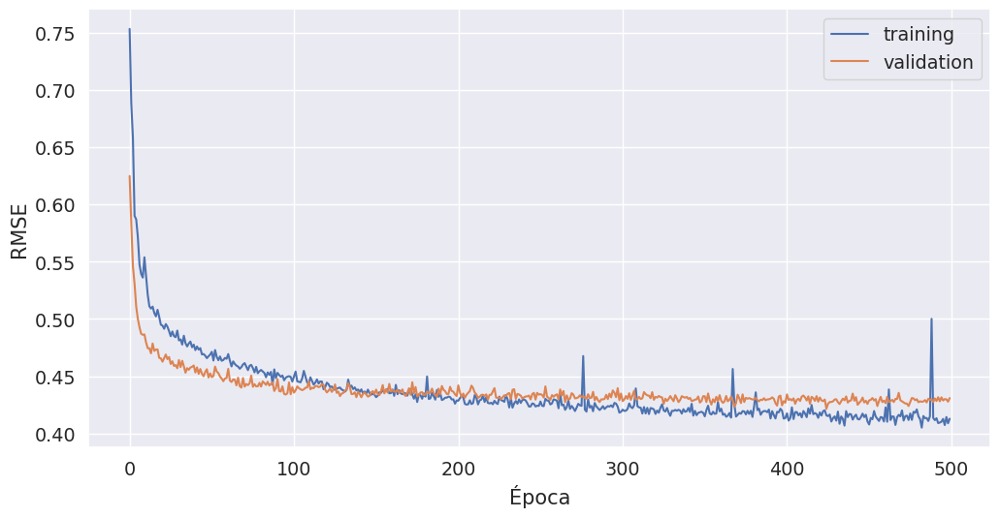

In [61]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Ahora probamos, por otro lado, el método de [regularización](https://keras.io/api/layers/regularizers/) tipo L2

In [62]:
from keras.regularizers import l2

In [63]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,), kernel_regularizer=l2(0.01)))
model.add(Dense(50, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [64]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 16s - loss: 1.5929

1440/6000 [======>.......................] - ETA: 0s - loss: 1.3338 

2848/6000 [=============>................] - ETA: 0s - loss: 1.1830

4192/6000 [===================>..........] - ETA: 0s - loss: 1.0784

5664/6000 [===========================>..] - ETA: 0s - loss: 1.0123

6000/6000 [==============================] - 0s 68us/step - loss: 1.0143 - val_loss: 0.7321


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7987

1440/6000 [======>.......................] - ETA: 0s - loss: 0.9943

2880/6000 [=============>................] - ETA: 0s - loss: 0.8586

4256/6000 [====================>.........] - ETA: 0s - loss: 0.7763

5696/6000 [===========================>..] - ETA: 0s - loss: 0.8189

6000/6000 [==============================] - 0s 50us/step - loss: 0.8080 - val_loss: 0.5998


Epoch 3/500


  32/6000 [..............................] - ETA: 0s - loss: 0.5568

1408/6000 [======>.......................] - ETA: 0s - loss: 0.6681

2784/6000 [============>.................] - ETA: 0s - loss: 0.6216

4192/6000 [===================>..........] - ETA: 0s - loss: 0.6060

5600/6000 [===========================>..] - ETA: 0s - loss: 0.5835

6000/6000 [==============================] - 0s 50us/step - loss: 0.5819 - val_loss: 0.5240


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4694

1504/6000 [======>.......................] - ETA: 0s - loss: 0.5224

2944/6000 [=============>................] - ETA: 0s - loss: 0.5251

4384/6000 [====================>.........] - ETA: 0s - loss: 0.5202

5856/6000 [============================>.] - ETA: 0s - loss: 0.5113

6000/6000 [==============================] - 0s 51us/step - loss: 0.5120 - val_loss: 0.4907


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6238

1440/6000 [======>.......................] - ETA: 0s - loss: 0.4792

2912/6000 [=============>................] - ETA: 0s - loss: 0.4912

4384/6000 [====================>.........] - ETA: 0s - loss: 0.4790

5888/6000 [============================>.] - ETA: 0s - loss: 0.4744

6000/6000 [==============================] - 0s 50us/step - loss: 0.4740 - val_loss: 0.4507


Epoch 6/500


  32/6000 [..............................] - ETA: 0s - loss: 0.4663

1440/6000 [======>.......................] - ETA: 0s - loss: 0.4892

2880/6000 [=============>................] - ETA: 0s - loss: 0.4730

4256/6000 [====================>.........] - ETA: 0s - loss: 0.4562

5664/6000 [===========================>..] - ETA: 0s - loss: 0.4431

6000/6000 [==============================] - 0s 52us/step - loss: 0.4456 - val_loss: 0.4283


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3449

1344/6000 [=====>........................] - ETA: 0s - loss: 0.4114

2720/6000 [============>.................] - ETA: 0s - loss: 0.4159

4160/6000 [===================>..........] - ETA: 0s - loss: 0.4269

5664/6000 [===========================>..] - ETA: 0s - loss: 0.4254

6000/6000 [==============================] - 0s 51us/step - loss: 0.4270 - val_loss: 0.4089


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5305

1376/6000 [=====>........................] - ETA: 0s - loss: 0.4071

2784/6000 [============>.................] - ETA: 0s - loss: 0.3998

4256/6000 [====================>.........] - ETA: 0s - loss: 0.4069

5728/6000 [===========================>..] - ETA: 0s - loss: 0.4067

6000/6000 [==============================] - 0s 49us/step - loss: 0.4062 - val_loss: 0.3926


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4547

1536/6000 [======>.......................] - ETA: 0s - loss: 0.4000

2976/6000 [=============>................] - ETA: 0s - loss: 0.4031

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3989

5824/6000 [============================>.] - ETA: 0s - loss: 0.3932

6000/6000 [==============================] - 0s 51us/step - loss: 0.3937 - val_loss: 0.3783


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3280

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3776

2784/6000 [============>.................] - ETA: 0s - loss: 0.3885

4096/6000 [===================>..........] - ETA: 0s - loss: 0.3857

5568/6000 [==========================>...] - ETA: 0s - loss: 0.3800

6000/6000 [==============================] - 0s 53us/step - loss: 0.3802 - val_loss: 0.3893


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4492

1440/6000 [======>.......................] - ETA: 0s - loss: 0.4579

2848/6000 [=============>................] - ETA: 0s - loss: 0.4094

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3903

5664/6000 [===========================>..] - ETA: 0s - loss: 0.3937

6000/6000 [==============================] - 0s 51us/step - loss: 0.3940 - val_loss: 0.3635


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3517

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3818

2944/6000 [=============>................] - ETA: 0s - loss: 0.3775

4448/6000 [=====================>........] - ETA: 0s - loss: 0.3735

5760/6000 [===========================>..] - ETA: 0s - loss: 0.3682

6000/6000 [==============================] - 0s 51us/step - loss: 0.3666 - val_loss: 0.3520


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2569

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3120

2880/6000 [=============>................] - ETA: 0s - loss: 0.3391

4352/6000 [====================>.........] - ETA: 0s - loss: 0.3481

5792/6000 [===========================>..] - ETA: 0s - loss: 0.3540

6000/6000 [==============================] - 0s 50us/step - loss: 0.3534 - val_loss: 0.3415


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4313

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3424

2816/6000 [=============>................] - ETA: 0s - loss: 0.3432

4224/6000 [====================>.........] - ETA: 0s - loss: 0.3516

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3522

6000/6000 [==============================] - 0s 52us/step - loss: 0.3486 - val_loss: 0.3422


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4762

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3557

2976/6000 [=============>................] - ETA: 0s - loss: 0.3509

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3434

6000/6000 [==============================] - 0s 49us/step - loss: 0.3473 - val_loss: 0.3400


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2295

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3439

2848/6000 [=============>................] - ETA: 0s - loss: 0.3364

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3419

5664/6000 [===========================>..] - ETA: 0s - loss: 0.3364

6000/6000 [==============================] - 0s 50us/step - loss: 0.3381 - val_loss: 0.3303


Epoch 17/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2041

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3098

2752/6000 [============>.................] - ETA: 0s - loss: 0.3328

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3311

5696/6000 [===========================>..] - ETA: 0s - loss: 0.3354

6000/6000 [==============================] - 0s 50us/step - loss: 0.3336 - val_loss: 0.3226


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2463

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3183

2816/6000 [=============>................] - ETA: 0s - loss: 0.3281

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3316

5664/6000 [===========================>..] - ETA: 0s - loss: 0.3299

6000/6000 [==============================] - 0s 52us/step - loss: 0.3262 - val_loss: 0.3196


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4284

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3161

2976/6000 [=============>................] - ETA: 0s - loss: 0.3179

4512/6000 [=====================>........] - ETA: 0s - loss: 0.3154

5952/6000 [============================>.] - ETA: 0s - loss: 0.3186

6000/6000 [==============================] - 0s 49us/step - loss: 0.3183 - val_loss: 0.3139


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1704

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3185

2880/6000 [=============>................] - ETA: 0s - loss: 0.3201

4320/6000 [====================>.........] - ETA: 0s - loss: 0.3235

5760/6000 [===========================>..] - ETA: 0s - loss: 0.3192

6000/6000 [==============================] - 0s 49us/step - loss: 0.3187 - val_loss: 0.3158


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6530

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3232

2816/6000 [=============>................] - ETA: 0s - loss: 0.3174

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3185

5856/6000 [============================>.] - ETA: 0s - loss: 0.3104

6000/6000 [==============================] - 0s 51us/step - loss: 0.3100 - val_loss: 0.3076


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2926

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3291

2720/6000 [============>.................] - ETA: 0s - loss: 0.3118

4096/6000 [===================>..........] - ETA: 0s - loss: 0.3070

5568/6000 [==========================>...] - ETA: 0s - loss: 0.3079

6000/6000 [==============================] - 0s 51us/step - loss: 0.3086 - val_loss: 0.3120


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3104

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3109

2752/6000 [============>.................] - ETA: 0s - loss: 0.3057

4160/6000 [===================>..........] - ETA: 0s - loss: 0.3088

5536/6000 [==========================>...] - ETA: 0s - loss: 0.3091

6000/6000 [==============================] - 0s 52us/step - loss: 0.3061 - val_loss: 0.3030


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1866

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2970

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3052

4448/6000 [=====================>........] - ETA: 0s - loss: 0.3019

5824/6000 [============================>.] - ETA: 0s - loss: 0.3022

6000/6000 [==============================] - 0s 52us/step - loss: 0.3030 - val_loss: 0.2987


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2968

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2921

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2946

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2904

6000/6000 [==============================] - 0s 49us/step - loss: 0.3009 - val_loss: 0.2992


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3753

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2941

2912/6000 [=============>................] - ETA: 0s - loss: 0.2989

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2968

5888/6000 [============================>.] - ETA: 0s - loss: 0.3020

6000/6000 [==============================] - 0s 49us/step - loss: 0.3015 - val_loss: 0.2998


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4990

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3133

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2977

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2930

6000/6000 [==============================] - 0s 48us/step - loss: 0.2999 - val_loss: 0.3026


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4252

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3070

2848/6000 [=============>................] - ETA: 0s - loss: 0.3019

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2985

5696/6000 [===========================>..] - ETA: 0s - loss: 0.3005

6000/6000 [==============================] - 0s 52us/step - loss: 0.3012 - val_loss: 0.2997


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1812

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2778

2880/6000 [=============>................] - ETA: 0s - loss: 0.2836

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2859

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2916

6000/6000 [==============================] - 0s 52us/step - loss: 0.2944 - val_loss: 0.2904


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3133

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2928

2912/6000 [=============>................] - ETA: 0s - loss: 0.2973

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2998

5856/6000 [============================>.] - ETA: 0s - loss: 0.2923

6000/6000 [==============================] - 0s 49us/step - loss: 0.2914 - val_loss: 0.2886


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1808

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2753

2976/6000 [=============>................] - ETA: 0s - loss: 0.2971

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2942

5984/6000 [============================>.] - ETA: 0s - loss: 0.2907

6000/6000 [==============================] - 0s 49us/step - loss: 0.2916 - val_loss: 0.2892


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2633

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3218

2784/6000 [============>.................] - ETA: 0s - loss: 0.2982

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2936

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2909

6000/6000 [==============================] - 0s 50us/step - loss: 0.2926 - val_loss: 0.3074


Epoch 33/500


  32/6000 [..............................] - ETA: 0s - loss: 0.6556

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3180

2944/6000 [=============>................] - ETA: 0s - loss: 0.3047

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2966

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2926

6000/6000 [==============================] - 0s 51us/step - loss: 0.2965 - val_loss: 0.2898


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1521

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2757

2880/6000 [=============>................] - ETA: 0s - loss: 0.2782

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2859

5920/6000 [============================>.] - ETA: 0s - loss: 0.2882

6000/6000 [==============================] - 0s 50us/step - loss: 0.2878 - val_loss: 0.2964


Epoch 35/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3737

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2898

2784/6000 [============>.................] - ETA: 0s - loss: 0.2838

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2858

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2879

6000/6000 [==============================] - 0s 52us/step - loss: 0.2886 - val_loss: 0.2839


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2851

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2719

2912/6000 [=============>................] - ETA: 0s - loss: 0.2822

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2870

5888/6000 [============================>.] - ETA: 0s - loss: 0.2879

6000/6000 [==============================] - 0s 49us/step - loss: 0.2859 - val_loss: 0.2861


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1542

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2824

2880/6000 [=============>................] - ETA: 0s - loss: 0.2705

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2798

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2856

6000/6000 [==============================] - 0s 51us/step - loss: 0.2837 - val_loss: 0.2864


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4700

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2865

2848/6000 [=============>................] - ETA: 0s - loss: 0.2833

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2862

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2834



6000/6000 [==============================] - 0s 51us/step - loss: 0.2835 - val_loss: 0.2846


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1884

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2949

2816/6000 [=============>................] - ETA: 0s - loss: 0.2771

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2831

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2841

6000/6000 [==============================] - 0s 54us/step - loss: 0.2858 - val_loss: 0.2851


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5031

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2602

2816/6000 [=============>................] - ETA: 0s - loss: 0.2632

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2796

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2861

6000/6000 [==============================] - 0s 50us/step - loss: 0.2847 - val_loss: 0.2847


Epoch 41/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1470

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2834

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2917

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2838

6000/6000 [==============================] - 0s 47us/step - loss: 0.2853 - val_loss: 0.2839


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2017

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2767

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2708

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2758

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2815

6000/6000 [==============================] - 0s 50us/step - loss: 0.2815 - val_loss: 0.2853


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2648

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2747

2816/6000 [=============>................] - ETA: 0s - loss: 0.2773

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2770

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2794

6000/6000 [==============================] - 0s 51us/step - loss: 0.2800 - val_loss: 0.2885


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2795

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2576

2944/6000 [=============>................] - ETA: 0s - loss: 0.2701

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2695

5888/6000 [============================>.] - ETA: 0s - loss: 0.2784

6000/6000 [==============================] - 0s 49us/step - loss: 0.2795 - val_loss: 0.2866


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3038

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2634

2880/6000 [=============>................] - ETA: 0s - loss: 0.2647

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2708

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2803

6000/6000 [==============================] - 0s 52us/step - loss: 0.2807 - val_loss: 0.2765


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2707

1344/6000 [=====>........................] - ETA: 0s - loss: 0.3060

2752/6000 [============>.................] - ETA: 0s - loss: 0.2819

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2773

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2783

6000/6000 [==============================] - 0s 50us/step - loss: 0.2790 - val_loss: 0.2839


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2214



1568/6000 [======>.......................] - ETA: 0s - loss: 0.2911

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2849

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2757

6000/6000 [==============================] - 0s 48us/step - loss: 0.2777 - val_loss: 0.2798


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3981

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3102

2880/6000 [=============>................] - ETA: 0s - loss: 0.2892

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2870

5856/6000 [============================>.] - ETA: 0s - loss: 0.2856

6000/6000 [==============================] - 0s 51us/step - loss: 0.2848 - val_loss: 0.2760


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2955

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2755

2784/6000 [============>.................] - ETA: 0s - loss: 0.2845

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2785

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2798

6000/6000 [==============================] - 0s 51us/step - loss: 0.2773 - val_loss: 0.2745


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2212

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2613

2752/6000 [============>.................] - ETA: 0s - loss: 0.2647

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2730

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2728

6000/6000 [==============================] - 0s 52us/step - loss: 0.2743 - val_loss: 0.2799


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2775

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2862

2976/6000 [=============>................] - ETA: 0s - loss: 0.2652

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2703

5824/6000 [============================>.] - ETA: 0s - loss: 0.2745

6000/6000 [==============================] - 0s 51us/step - loss: 0.2745 - val_loss: 0.2736


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2713

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2732

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2699

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2749

6000/6000 [==============================] - 0s 47us/step - loss: 0.2762 - val_loss: 0.2725


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3314

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2585

2848/6000 [=============>................] - ETA: 0s - loss: 0.2935

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2870

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2789

6000/6000 [==============================] - 0s 54us/step - loss: 0.2767 - val_loss: 0.2811


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2870

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2692

2912/6000 [=============>................] - ETA: 0s - loss: 0.2769

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2726

5856/6000 [============================>.] - ETA: 0s - loss: 0.2740

6000/6000 [==============================] - 0s 50us/step - loss: 0.2753 - val_loss: 0.3094


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1524



1440/6000 [======>.......................] - ETA: 0s - loss: 0.2714

2720/6000 [============>.................] - ETA: 0s - loss: 0.2767

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2706

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2745

6000/6000 [==============================] - 0s 50us/step - loss: 0.2747 - val_loss: 0.2709


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2973

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2930

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2866

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2843

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2764

6000/6000 [==============================] - 0s 50us/step - loss: 0.2744 - val_loss: 0.2768


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2784

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2626

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2645

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2697

5952/6000 [============================>.] - ETA: 0s - loss: 0.2724

6000/6000 [==============================] - 0s 50us/step - loss: 0.2728 - val_loss: 0.2973


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2343

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2635

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2748

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2764

6000/6000 [==============================] - 0s 49us/step - loss: 0.2758 - val_loss: 0.2723


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1319

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2471

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2647

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2686

6000/6000 [==============================] - 0s 48us/step - loss: 0.2716 - val_loss: 0.2696


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2369

2912/6000 [=============>................] - ETA: 0s - loss: 0.2683

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2669

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2681

6000/6000 [==============================] - 0s 49us/step - loss: 0.2710 - val_loss: 0.2771


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2073

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2530

2944/6000 [=============>................] - ETA: 0s - loss: 0.2624

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2656

5888/6000 [============================>.] - ETA: 0s - loss: 0.2713

6000/6000 [==============================] - 0s 49us/step - loss: 0.2720 - val_loss: 0.2675


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3683

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2583

2752/6000 [============>.................] - ETA: 0s - loss: 0.2631

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2736

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2708

6000/6000 [==============================] - 0s 51us/step - loss: 0.2683 - val_loss: 0.2678


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3697

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2792

2944/6000 [=============>................] - ETA: 0s - loss: 0.2776

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2668

5952/6000 [============================>.] - ETA: 0s - loss: 0.2690

6000/6000 [==============================] - 0s 49us/step - loss: 0.2692 - val_loss: 0.2683


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1563

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2463

2912/6000 [=============>................] - ETA: 0s - loss: 0.2528

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2654

5952/6000 [============================>.] - ETA: 0s - loss: 0.2689

6000/6000 [==============================] - 0s 48us/step - loss: 0.2692 - val_loss: 0.2747


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1745

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2588

2976/6000 [=============>................] - ETA: 0s - loss: 0.2527

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2641

5888/6000 [============================>.] - ETA: 0s - loss: 0.2704

6000/6000 [==============================] - 0s 49us/step - loss: 0.2688 - val_loss: 0.2708


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2353

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2726

2848/6000 [=============>................] - ETA: 0s - loss: 0.2759

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2796

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2717

6000/6000 [==============================] - 0s 52us/step - loss: 0.2696 - val_loss: 0.2721


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1255

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2627

2816/6000 [=============>................] - ETA: 0s - loss: 0.2679

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2625

5888/6000 [============================>.] - ETA: 0s - loss: 0.2666

6000/6000 [==============================] - 0s 50us/step - loss: 0.2696 - val_loss: 0.2694


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2716

2944/6000 [=============>................] - ETA: 0s - loss: 0.2690

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2664

5888/6000 [============================>.] - ETA: 0s - loss: 0.2622

6000/6000 [==============================] - 0s 51us/step - loss: 0.2665 - val_loss: 0.2716


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1268

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2773

2912/6000 [=============>................] - ETA: 0s - loss: 0.2719

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2617

5824/6000 [============================>.] - ETA: 0s - loss: 0.2622

6000/6000 [==============================] - 0s 49us/step - loss: 0.2637 - val_loss: 0.2706


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1932

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2593

2816/6000 [=============>................] - ETA: 0s - loss: 0.2619

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2705

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2647

6000/6000 [==============================] - 0s 53us/step - loss: 0.2670 - val_loss: 0.2702


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1629

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2729

2880/6000 [=============>................] - ETA: 0s - loss: 0.2748

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2670

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2698

6000/6000 [==============================] - 0s 50us/step - loss: 0.2673 - val_loss: 0.2643


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2580

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2512

2720/6000 [============>.................] - ETA: 0s - loss: 0.2549

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2594

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2621

6000/6000 [==============================] - 0s 53us/step - loss: 0.2654 - val_loss: 0.2636


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1412

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2574

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2654

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2658

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2670

6000/6000 [==============================] - 0s 54us/step - loss: 0.2637 - val_loss: 0.2726


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1864

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2621

2848/6000 [=============>................] - ETA: 0s - loss: 0.2671

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2665

5888/6000 [============================>.] - ETA: 0s - loss: 0.2650

6000/6000 [==============================] - 0s 49us/step - loss: 0.2656 - val_loss: 0.2656


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2163

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2617

2816/6000 [=============>................] - ETA: 0s - loss: 0.2574

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2641

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2652

6000/6000 [==============================] - 0s 51us/step - loss: 0.2638 - val_loss: 0.2649


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1545

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2780

2784/6000 [============>.................] - ETA: 0s - loss: 0.2733

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2713

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2643

6000/6000 [==============================] - 0s 50us/step - loss: 0.2649 - val_loss: 0.2649


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1716

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2687

2944/6000 [=============>................] - ETA: 0s - loss: 0.2636

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2605

5824/6000 [============================>.] - ETA: 0s - loss: 0.2642

6000/6000 [==============================] - 0s 51us/step - loss: 0.2618 - val_loss: 0.2630


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1590

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2621

2880/6000 [=============>................] - ETA: 0s - loss: 0.2629

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2594

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2655

6000/6000 [==============================] - 0s 50us/step - loss: 0.2638 - val_loss: 0.2656


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3482

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2577

2848/6000 [=============>................] - ETA: 0s - loss: 0.2795

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2734

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2638

6000/6000 [==============================] - 0s 52us/step - loss: 0.2637 - val_loss: 0.2730


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1316

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2645

2848/6000 [=============>................] - ETA: 0s - loss: 0.2603

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2615

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2627

6000/6000 [==============================] - 0s 52us/step - loss: 0.2634 - val_loss: 0.2617


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1926

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2700

2912/6000 [=============>................] - ETA: 0s - loss: 0.2780

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2682

5920/6000 [============================>.] - ETA: 0s - loss: 0.2651

6000/6000 [==============================] - 0s 49us/step - loss: 0.2646 - val_loss: 0.2608


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2735

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2434

2848/6000 [=============>................] - ETA: 0s - loss: 0.2499

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2596

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2615

6000/6000 [==============================] - 0s 50us/step - loss: 0.2618 - val_loss: 0.2612


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1719

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2770

2816/6000 [=============>................] - ETA: 0s - loss: 0.2660

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2556

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2635

6000/6000 [==============================] - 0s 50us/step - loss: 0.2617 - val_loss: 0.2644


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1669

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2872



2912/6000 [=============>................] - ETA: 0s - loss: 0.2665

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2698

5824/6000 [============================>.] - ETA: 0s - loss: 0.2645



6000/6000 [==============================] - 0s 50us/step - loss: 0.2644 - val_loss: 0.2630


Epoch 85/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2493

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2535

2816/6000 [=============>................] - ETA: 0s - loss: 0.2622

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2650

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2594

6000/6000 [==============================] - 0s 52us/step - loss: 0.2599 - val_loss: 0.2556


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3892

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2683

2848/6000 [=============>................] - ETA: 0s - loss: 0.2647

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2685

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2612

6000/6000 [==============================] - 0s 52us/step - loss: 0.2596 - val_loss: 0.2625


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1886

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2615

2944/6000 [=============>................] - ETA: 0s - loss: 0.2519

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2611

5888/6000 [============================>.] - ETA: 0s - loss: 0.2605

6000/6000 [==============================] - 0s 50us/step - loss: 0.2597 - val_loss: 0.2642


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4060

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2827

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2711

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2654

6000/6000 [==============================] - 0s 48us/step - loss: 0.2625 - val_loss: 0.2558


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2274

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2330

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2483

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2536

6000/6000 [==============================] - 0s 50us/step - loss: 0.2584 - val_loss: 0.2655


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3238

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2541

2976/6000 [=============>................] - ETA: 0s - loss: 0.2638

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2655

5888/6000 [============================>.] - ETA: 0s - loss: 0.2615

6000/6000 [==============================] - 0s 51us/step - loss: 0.2619 - val_loss: 0.2654


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2380

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2397

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2474

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2560

6000/6000 [==============================] - 0s 49us/step - loss: 0.2592 - val_loss: 0.2571


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1579

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2536

2816/6000 [=============>................] - ETA: 0s - loss: 0.2609

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2598

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2606

6000/6000 [==============================] - 0s 53us/step - loss: 0.2585 - val_loss: 0.2579


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2544

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2472

2688/6000 [============>.................] - ETA: 0s - loss: 0.2477

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2485

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2608

6000/6000 [==============================] - 0s 55us/step - loss: 0.2571 - val_loss: 0.2562


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1917

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2519

2784/6000 [============>.................] - ETA: 0s - loss: 0.2590

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2608

5952/6000 [============================>.] - ETA: 0s - loss: 0.2561

6000/6000 [==============================] - 0s 50us/step - loss: 0.2565 - val_loss: 0.2658


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2468

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2631

2944/6000 [=============>................] - ETA: 0s - loss: 0.2506

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2517

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2566

6000/6000 [==============================] - 0s 51us/step - loss: 0.2572 - val_loss: 0.2622


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3075

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2630

2816/6000 [=============>................] - ETA: 0s - loss: 0.2666

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2614

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2616

6000/6000 [==============================] - 0s 53us/step - loss: 0.2577 - val_loss: 0.2652


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1330

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2733

2816/6000 [=============>................] - ETA: 0s - loss: 0.2532

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2498

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2546

6000/6000 [==============================] - 0s 50us/step - loss: 0.2580 - val_loss: 0.2708


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1893

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2475

2848/6000 [=============>................] - ETA: 0s - loss: 0.2500

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2576

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2557

6000/6000 [==============================] - 0s 52us/step - loss: 0.2568 - val_loss: 0.2754


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2492

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2614

2880/6000 [=============>................] - ETA: 0s - loss: 0.2541

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2546

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2587

6000/6000 [==============================] - 0s 51us/step - loss: 0.2609 - val_loss: 0.2581


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3163

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2556

2752/6000 [============>.................] - ETA: 0s - loss: 0.2560

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2585

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2615

6000/6000 [==============================] - 0s 51us/step - loss: 0.2605 - val_loss: 0.2563


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2196

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2238

2784/6000 [============>.................] - ETA: 0s - loss: 0.2427

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2547

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2552

6000/6000 [==============================] - 0s 52us/step - loss: 0.2563 - val_loss: 0.2557


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2399

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2341

2784/6000 [============>.................] - ETA: 0s - loss: 0.2515

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2560

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2580

6000/6000 [==============================] - 0s 52us/step - loss: 0.2583 - val_loss: 0.2590


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2769

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2623

2912/6000 [=============>................] - ETA: 0s - loss: 0.2537

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2600

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2568

6000/6000 [==============================] - 0s 51us/step - loss: 0.2576 - val_loss: 0.2602


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6141

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2403

2816/6000 [=============>................] - ETA: 0s - loss: 0.2434

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2527

5824/6000 [============================>.] - ETA: 0s - loss: 0.2563

6000/6000 [==============================] - 0s 51us/step - loss: 0.2552 - val_loss: 0.2567


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2179

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2561

2784/6000 [============>.................] - ETA: 0s - loss: 0.2555

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2632

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2558

6000/6000 [==============================] - 0s 52us/step - loss: 0.2542 - val_loss: 0.2523


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1440

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2460

2976/6000 [=============>................] - ETA: 0s - loss: 0.2474

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2498

5984/6000 [============================>.] - ETA: 0s - loss: 0.2537

6000/6000 [==============================] - 0s 51us/step - loss: 0.2534 - val_loss: 0.2939


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2415

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2768

2752/6000 [============>.................] - ETA: 0s - loss: 0.2622

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2551

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2557

6000/6000 [==============================] - 0s 53us/step - loss: 0.2559 - val_loss: 0.2624


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2869

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2614

2784/6000 [============>.................] - ETA: 0s - loss: 0.2549

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2552

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2570

6000/6000 [==============================] - 0s 51us/step - loss: 0.2550 - val_loss: 0.2645


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1975

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2486

2976/6000 [=============>................] - ETA: 0s - loss: 0.2535

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2572

6000/6000 [==============================] - 0s 50us/step - loss: 0.2524 - val_loss: 0.2598


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1287

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2610

2816/6000 [=============>................] - ETA: 0s - loss: 0.2632

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2586

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2549

6000/6000 [==============================] - 0s 50us/step - loss: 0.2539 - val_loss: 0.2524


Epoch 111/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2936

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2687

2848/6000 [=============>................] - ETA: 0s - loss: 0.2540

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2507

5856/6000 [============================>.] - ETA: 0s - loss: 0.2535

6000/6000 [==============================] - 0s 50us/step - loss: 0.2534 - val_loss: 0.2520


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1437

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2509

2816/6000 [=============>................] - ETA: 0s - loss: 0.2584

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2572

5920/6000 [============================>.] - ETA: 0s - loss: 0.2555

6000/6000 [==============================] - 0s 50us/step - loss: 0.2546 - val_loss: 0.2517


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2537

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2500

2656/6000 [============>.................] - ETA: 0s - loss: 0.2435

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2494

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2504

6000/6000 [==============================] - 0s 52us/step - loss: 0.2501 - val_loss: 0.2561


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3641

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2474

2816/6000 [=============>................] - ETA: 0s - loss: 0.2535

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2453

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2445

6000/6000 [==============================] - 0s 53us/step - loss: 0.2506 - val_loss: 0.2627


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2536

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2713

2912/6000 [=============>................] - ETA: 0s - loss: 0.2713

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2591

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2520

6000/6000 [==============================] - 0s 51us/step - loss: 0.2522 - val_loss: 0.2529


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2246

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2405

2976/6000 [=============>................] - ETA: 0s - loss: 0.2545

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2550

6000/6000 [==============================] - 0s 49us/step - loss: 0.2540 - val_loss: 0.2566


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1345

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2685

2912/6000 [=============>................] - ETA: 0s - loss: 0.2602

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2567

5856/6000 [============================>.] - ETA: 0s - loss: 0.2530

6000/6000 [==============================] - 0s 50us/step - loss: 0.2549 - val_loss: 0.2636


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2361

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2696

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2568

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2492

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2502

6000/6000 [==============================] - 0s 49us/step - loss: 0.2510 - val_loss: 0.2503


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1929

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2407

2976/6000 [=============>................] - ETA: 0s - loss: 0.2498

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2534

6000/6000 [==============================] - 0s 48us/step - loss: 0.2506 - val_loss: 0.2493


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2116

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2469

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2472

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2489

5920/6000 [============================>.] - ETA: 0s - loss: 0.2556

6000/6000 [==============================] - 0s 49us/step - loss: 0.2546 - val_loss: 0.2491


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2123

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2603

2656/6000 [============>.................] - ETA: 0s - loss: 0.2407

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2477

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2517

6000/6000 [==============================] - 0s 53us/step - loss: 0.2504 - val_loss: 0.2512


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1931

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2359

2720/6000 [============>.................] - ETA: 0s - loss: 0.2432

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2480

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2506

6000/6000 [==============================] - 0s 51us/step - loss: 0.2502 - val_loss: 0.2532


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3365

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2536

2880/6000 [=============>................] - ETA: 0s - loss: 0.2513

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2515

5856/6000 [============================>.] - ETA: 0s - loss: 0.2485

6000/6000 [==============================] - 0s 50us/step - loss: 0.2486 - val_loss: 0.2483


Epoch 124/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2838

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2475

2880/6000 [=============>................] - ETA: 0s - loss: 0.2430

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2483

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2542

6000/6000 [==============================] - 0s 52us/step - loss: 0.2533 - val_loss: 0.2549


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1770

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2382

2944/6000 [=============>................] - ETA: 0s - loss: 0.2436

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2500

5824/6000 [============================>.] - ETA: 0s - loss: 0.2495

6000/6000 [==============================] - 0s 51us/step - loss: 0.2503 - val_loss: 0.2494


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2264

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2683

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2637

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2543

6000/6000 [==============================] - 0s 48us/step - loss: 0.2487 - val_loss: 0.2534


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2639

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2383

2912/6000 [=============>................] - ETA: 0s - loss: 0.2397

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2476

5952/6000 [============================>.] - ETA: 0s - loss: 0.2494

6000/6000 [==============================] - 0s 48us/step - loss: 0.2507 - val_loss: 0.2476


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3079

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2294

2880/6000 [=============>................] - ETA: 0s - loss: 0.2375

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2453

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2478

6000/6000 [==============================] - 0s 52us/step - loss: 0.2478 - val_loss: 0.2491


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1585

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2442

2880/6000 [=============>................] - ETA: 0s - loss: 0.2540

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2536

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2478

6000/6000 [==============================] - 0s 51us/step - loss: 0.2484 - val_loss: 0.2573


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2314

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2401

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2476

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 48us/step - loss: 0.2490 - val_loss: 0.2474


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2622

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2445

2976/6000 [=============>................] - ETA: 0s - loss: 0.2458

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 47us/step - loss: 0.2509 - val_loss: 0.2677


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2715

2976/6000 [=============>................] - ETA: 0s - loss: 0.2583

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2517

5984/6000 [============================>.] - ETA: 0s - loss: 0.2479

6000/6000 [==============================] - 0s 49us/step - loss: 0.2477 - val_loss: 0.2585


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2030

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2240

2624/6000 [============>.................] - ETA: 0s - loss: 0.2424

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2390

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2472

6000/6000 [==============================] - 0s 55us/step - loss: 0.2473 - val_loss: 0.2497


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1274

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2607

2688/6000 [============>.................] - ETA: 0s - loss: 0.2447

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2373

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2451

6000/6000 [==============================] - 0s 53us/step - loss: 0.2462 - val_loss: 0.2532


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2748

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2548

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2514

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2460

5984/6000 [============================>.] - ETA: 0s - loss: 0.2471

6000/6000 [==============================] - 0s 48us/step - loss: 0.2470 - val_loss: 0.2482


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2346

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2227

2880/6000 [=============>................] - ETA: 0s - loss: 0.2326

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2480

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2495

6000/6000 [==============================] - 0s 52us/step - loss: 0.2474 - val_loss: 0.2474


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1621

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2535

2944/6000 [=============>................] - ETA: 0s - loss: 0.2410

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2486

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2511

6000/6000 [==============================] - 0s 49us/step - loss: 0.2584 - val_loss: 0.2513


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2115

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2260

2816/6000 [=============>................] - ETA: 0s - loss: 0.2406

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2483

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2483

6000/6000 [==============================] - 0s 51us/step - loss: 0.2482 - val_loss: 0.2431


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3624

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2632

2688/6000 [============>.................] - ETA: 0s - loss: 0.2607

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2467

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2456

6000/6000 [==============================] - 0s 49us/step - loss: 0.2471 - val_loss: 0.2666


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2297

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2548

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2509

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2427

6000/6000 [==============================] - 0s 49us/step - loss: 0.2464 - val_loss: 0.2514


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3254

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2816/6000 [=============>................] - ETA: 0s - loss: 0.2480

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2465

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2452

6000/6000 [==============================] - 0s 53us/step - loss: 0.2465 - val_loss: 0.2459


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5392

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2707

2880/6000 [=============>................] - ETA: 0s - loss: 0.2426

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2532

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2502

6000/6000 [==============================] - 0s 52us/step - loss: 0.2479 - val_loss: 0.2463


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2321

2720/6000 [============>.................] - ETA: 0s - loss: 0.2469

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2407

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2460

6000/6000 [==============================] - 0s 55us/step - loss: 0.2458 - val_loss: 0.2506


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1632

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2415

2880/6000 [=============>................] - ETA: 0s - loss: 0.2409

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2424

5824/6000 [============================>.] - ETA: 0s - loss: 0.2472

6000/6000 [==============================] - 0s 49us/step - loss: 0.2471 - val_loss: 0.2546


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2320

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2912/6000 [=============>................] - ETA: 0s - loss: 0.2580

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2534

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2491

6000/6000 [==============================] - 0s 52us/step - loss: 0.2476 - val_loss: 0.2426


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2282

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2604

2880/6000 [=============>................] - ETA: 0s - loss: 0.2408

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2439

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2438

6000/6000 [==============================] - 0s 51us/step - loss: 0.2437 - val_loss: 0.2435


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1863

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2485

2688/6000 [============>.................] - ETA: 0s - loss: 0.2370

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2444

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2492

6000/6000 [==============================] - 0s 49us/step - loss: 0.2508 - val_loss: 0.2429


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2673

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2447

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2511

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2491

6000/6000 [==============================] - 0s 46us/step - loss: 0.2460 - val_loss: 0.2474


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2673

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2281

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2363

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2344

6000/6000 [==============================] - 0s 47us/step - loss: 0.2446 - val_loss: 0.2431


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2512

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2313

2944/6000 [=============>................] - ETA: 0s - loss: 0.2361

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2376

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 52us/step - loss: 0.2433 - val_loss: 0.2521


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1730

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2668

2848/6000 [=============>................] - ETA: 0s - loss: 0.2523

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2516

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2479

6000/6000 [==============================] - 0s 52us/step - loss: 0.2479 - val_loss: 0.2625


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2700

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2252

2784/6000 [============>.................] - ETA: 0s - loss: 0.2367

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2365

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2472

6000/6000 [==============================] - 0s 53us/step - loss: 0.2461 - val_loss: 0.2464


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1344

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2559

2848/6000 [=============>................] - ETA: 0s - loss: 0.2418

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2385

5824/6000 [============================>.] - ETA: 0s - loss: 0.2420

6000/6000 [==============================] - 0s 50us/step - loss: 0.2414 - val_loss: 0.2481


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1408



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2976/6000 [=============>................] - ETA: 0s - loss: 0.2398

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2372

5856/6000 [============================>.] - ETA: 0s - loss: 0.2429

6000/6000 [==============================] - 0s 51us/step - loss: 0.2429 - val_loss: 0.2442


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2006

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2398

2816/6000 [=============>................] - ETA: 0s - loss: 0.2393

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2371

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2423

6000/6000 [==============================] - 0s 50us/step - loss: 0.2434 - val_loss: 0.2464


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3590

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2256

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2526

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2443

6000/6000 [==============================] - 0s 47us/step - loss: 0.2420 - val_loss: 0.2469


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1416

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2100

2880/6000 [=============>................] - ETA: 0s - loss: 0.2366

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2381

5920/6000 [============================>.] - ETA: 0s - loss: 0.2474

6000/6000 [==============================] - 0s 49us/step - loss: 0.2475 - val_loss: 0.2548


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1418

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2472

2880/6000 [=============>................] - ETA: 0s - loss: 0.2329

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2440

5984/6000 [============================>.] - ETA: 0s - loss: 0.2475

6000/6000 [==============================] - 0s 49us/step - loss: 0.2479 - val_loss: 0.2508


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2129

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2268

2816/6000 [=============>................] - ETA: 0s - loss: 0.2409

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2464

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2427

6000/6000 [==============================] - 0s 50us/step - loss: 0.2445 - val_loss: 0.2442


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3203

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2548

2880/6000 [=============>................] - ETA: 0s - loss: 0.2540

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2446

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 55us/step - loss: 0.2399 - val_loss: 0.2448


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1709

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2312

2912/6000 [=============>................] - ETA: 0s - loss: 0.2469

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2444

5920/6000 [============================>.] - ETA: 0s - loss: 0.2438

6000/6000 [==============================] - 0s 51us/step - loss: 0.2436 - val_loss: 0.2433


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2757

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2318

2880/6000 [=============>................] - ETA: 0s - loss: 0.2332

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2336

5824/6000 [============================>.] - ETA: 0s - loss: 0.2428

6000/6000 [==============================] - 0s 50us/step - loss: 0.2420 - val_loss: 0.2520


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5649

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2447

2848/6000 [=============>................] - ETA: 0s - loss: 0.2426

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2439

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2450

6000/6000 [==============================] - 0s 51us/step - loss: 0.2441 - val_loss: 0.2413


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2111

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2446

2880/6000 [=============>................] - ETA: 0s - loss: 0.2493

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2500

5856/6000 [============================>.] - ETA: 0s - loss: 0.2451

6000/6000 [==============================] - 0s 50us/step - loss: 0.2458 - val_loss: 0.2435


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1613

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2230

2816/6000 [=============>................] - ETA: 0s - loss: 0.2270

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2280

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2420

6000/6000 [==============================] - 0s 50us/step - loss: 0.2422 - val_loss: 0.2469


Epoch 166/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1791

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2469

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2436

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2483

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2423

6000/6000 [==============================] - 0s 53us/step - loss: 0.2443 - val_loss: 0.2422


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4547

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2306

2912/6000 [=============>................] - ETA: 0s - loss: 0.2410

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2331

5920/6000 [============================>.] - ETA: 0s - loss: 0.2415

6000/6000 [==============================] - 0s 50us/step - loss: 0.2411 - val_loss: 0.2830


Epoch 168/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2065

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2309

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2409

3648/6000 [=================>............] - ETA: 0s - loss: 0.2440

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2416

6000/6000 [==============================] - 0s 55us/step - loss: 0.2461 - val_loss: 0.2657


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2431

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2292

2688/6000 [============>.................] - ETA: 0s - loss: 0.2349

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2450

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2427

6000/6000 [==============================] - 0s 55us/step - loss: 0.2454 - val_loss: 0.2600


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3548

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2327

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2430

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2399

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2343

6000/6000 [==============================] - 0s 55us/step - loss: 0.2398 - val_loss: 0.2549


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2959

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2480

2944/6000 [=============>................] - ETA: 0s - loss: 0.2431

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2429

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2414

6000/6000 [==============================] - 0s 52us/step - loss: 0.2429 - val_loss: 0.2510


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5988

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2382

2784/6000 [============>.................] - ETA: 0s - loss: 0.2395

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2483

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2437

6000/6000 [==============================] - 0s 53us/step - loss: 0.2433 - val_loss: 0.2502


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2357

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2527

2656/6000 [============>.................] - ETA: 0s - loss: 0.2379

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2447

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2403

6000/6000 [==============================] - 0s 52us/step - loss: 0.2410 - val_loss: 0.2456


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5256

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2633

2944/6000 [=============>................] - ETA: 0s - loss: 0.2455

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2345

5824/6000 [============================>.] - ETA: 0s - loss: 0.2388

6000/6000 [==============================] - 0s 49us/step - loss: 0.2405 - val_loss: 0.2457


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2217

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2226

2816/6000 [=============>................] - ETA: 0s - loss: 0.2383

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2363

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2385

6000/6000 [==============================] - 0s 51us/step - loss: 0.2387 - val_loss: 0.2559


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3210

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2654

2880/6000 [=============>................] - ETA: 0s - loss: 0.2493

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2432

5984/6000 [============================>.] - ETA: 0s - loss: 0.2385

6000/6000 [==============================] - 0s 48us/step - loss: 0.2382 - val_loss: 0.2358


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1252

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2300

2944/6000 [=============>................] - ETA: 0s - loss: 0.2429

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2421

5856/6000 [============================>.] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 49us/step - loss: 0.2401 - val_loss: 0.2392


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1803

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2455

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2460

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 47us/step - loss: 0.2418 - val_loss: 0.2369


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3372

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2512

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2444

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2464

5984/6000 [============================>.] - ETA: 0s - loss: 0.2450

6000/6000 [==============================] - 0s 50us/step - loss: 0.2446 - val_loss: 0.2389


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3509

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2470

2976/6000 [=============>................] - ETA: 0s - loss: 0.2455

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2399

6000/6000 [==============================] - 0s 49us/step - loss: 0.2424 - val_loss: 0.2630


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2928

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2462

2944/6000 [=============>................] - ETA: 0s - loss: 0.2338

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2428

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2417

6000/6000 [==============================] - 0s 50us/step - loss: 0.2422 - val_loss: 0.2375


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2541

2624/6000 [============>.................] - ETA: 0s - loss: 0.2395

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2440

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2407

6000/6000 [==============================] - 0s 51us/step - loss: 0.2404 - val_loss: 0.2492


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2311

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2343

2784/6000 [============>.................] - ETA: 0s - loss: 0.2311

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2349

5824/6000 [============================>.] - ETA: 0s - loss: 0.2388

6000/6000 [==============================] - 0s 50us/step - loss: 0.2378 - val_loss: 0.2460


Epoch 184/500


  32/6000 [..............................] - ETA: 0s - loss: 0.4982

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2406

2880/6000 [=============>................] - ETA: 0s - loss: 0.2376

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2407

5952/6000 [============================>.] - ETA: 0s - loss: 0.2428

6000/6000 [==============================] - 0s 49us/step - loss: 0.2437 - val_loss: 0.2365


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2503

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2214

2976/6000 [=============>................] - ETA: 0s - loss: 0.2347

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2393

5952/6000 [============================>.] - ETA: 0s - loss: 0.2390

6000/6000 [==============================] - 0s 50us/step - loss: 0.2389 - val_loss: 0.2372


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1500

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2225

2848/6000 [=============>................] - ETA: 0s - loss: 0.2291

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2374

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 53us/step - loss: 0.2378 - val_loss: 0.2388


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2652

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2430

2880/6000 [=============>................] - ETA: 0s - loss: 0.2363

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2307

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2334

6000/6000 [==============================] - 0s 52us/step - loss: 0.2383 - val_loss: 0.2417


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2006

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2976/6000 [=============>................] - ETA: 0s - loss: 0.2470

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2444

5824/6000 [============================>.] - ETA: 0s - loss: 0.2372

6000/6000 [==============================] - 0s 51us/step - loss: 0.2375 - val_loss: 0.2417


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2129

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2190

2816/6000 [=============>................] - ETA: 0s - loss: 0.2315

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2325

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2347

6000/6000 [==============================] - 0s 50us/step - loss: 0.2374 - val_loss: 0.2425


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4174

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2390

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2342

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2367

5984/6000 [============================>.] - ETA: 0s - loss: 0.2391

6000/6000 [==============================] - 0s 48us/step - loss: 0.2391 - val_loss: 0.2432


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2192

2848/6000 [=============>................] - ETA: 0s - loss: 0.2337

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2393

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2397

6000/6000 [==============================] - 0s 52us/step - loss: 0.2400 - val_loss: 0.2634


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2530

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2169

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2382

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2419

5824/6000 [============================>.] - ETA: 0s - loss: 0.2457

6000/6000 [==============================] - 0s 50us/step - loss: 0.2436 - val_loss: 0.2417


Epoch 193/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2265

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2411

2752/6000 [============>.................] - ETA: 0s - loss: 0.2501

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2455

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2440

6000/6000 [==============================] - 0s 50us/step - loss: 0.2420 - val_loss: 0.2435


Epoch 194/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1636

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2354

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2394

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 47us/step - loss: 0.2366 - val_loss: 0.2399


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1285

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2443

2880/6000 [=============>................] - ETA: 0s - loss: 0.2472

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2419

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2381

6000/6000 [==============================] - 0s 53us/step - loss: 0.2390 - val_loss: 0.2566


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2917

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2619

2912/6000 [=============>................] - ETA: 0s - loss: 0.2481

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2439

5952/6000 [============================>.] - ETA: 0s - loss: 0.2402

6000/6000 [==============================] - 0s 49us/step - loss: 0.2402 - val_loss: 0.2379


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2333

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2169

2880/6000 [=============>................] - ETA: 0s - loss: 0.2278

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2303

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2365

6000/6000 [==============================] - 0s 51us/step - loss: 0.2359 - val_loss: 0.2443


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2411

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2431

2816/6000 [=============>................] - ETA: 0s - loss: 0.2320

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2356

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2355

6000/6000 [==============================] - 0s 52us/step - loss: 0.2386 - val_loss: 0.2402


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1564

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2447

2816/6000 [=============>................] - ETA: 0s - loss: 0.2357

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2337

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2366

6000/6000 [==============================] - 0s 50us/step - loss: 0.2396 - val_loss: 0.2537


Epoch 200/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1745

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2354

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2384

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2375

5920/6000 [============================>.] - ETA: 0s - loss: 0.2392

6000/6000 [==============================] - 0s 50us/step - loss: 0.2396 - val_loss: 0.2500


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2768

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2313

2816/6000 [=============>................] - ETA: 0s - loss: 0.2287

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2376

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2375

6000/6000 [==============================] - 0s 52us/step - loss: 0.2371 - val_loss: 0.2464


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2600

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2448

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2266

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2381

5984/6000 [============================>.] - ETA: 0s - loss: 0.2395

6000/6000 [==============================] - 0s 49us/step - loss: 0.2395 - val_loss: 0.2464


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3932

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2364

2848/6000 [=============>................] - ETA: 0s - loss: 0.2348

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2337

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 53us/step - loss: 0.2367 - val_loss: 0.2452


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2741

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2597

2848/6000 [=============>................] - ETA: 0s - loss: 0.2450

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2443

5888/6000 [============================>.] - ETA: 0s - loss: 0.2378

6000/6000 [==============================] - 0s 49us/step - loss: 0.2376 - val_loss: 0.2545


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2014

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2381

2624/6000 [============>.................] - ETA: 0s - loss: 0.2481

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2382

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2353

6000/6000 [==============================] - 0s 51us/step - loss: 0.2352 - val_loss: 0.2379


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1909

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2467

2688/6000 [============>.................] - ETA: 0s - loss: 0.2415

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2327

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 50us/step - loss: 0.2388 - val_loss: 0.2525


Epoch 207/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1153

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2284

2816/6000 [=============>................] - ETA: 0s - loss: 0.2333

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2334

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2386

6000/6000 [==============================] - 0s 52us/step - loss: 0.2395 - val_loss: 0.2387


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1500

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2228

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2330

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2319

5888/6000 [============================>.] - ETA: 0s - loss: 0.2392



6000/6000 [==============================] - 0s 51us/step - loss: 0.2383 - val_loss: 0.2388


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2331

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2294

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2354

6000/6000 [==============================] - 0s 46us/step - loss: 0.2396 - val_loss: 0.2374


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4518

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2349

2944/6000 [=============>................] - ETA: 0s - loss: 0.2337

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2361

6000/6000 [==============================] - 0s 48us/step - loss: 0.2355 - val_loss: 0.2379


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1890

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2893

2880/6000 [=============>................] - ETA: 0s - loss: 0.2611

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2524

5920/6000 [============================>.] - ETA: 0s - loss: 0.2479

6000/6000 [==============================] - 0s 50us/step - loss: 0.2479 - val_loss: 0.2349


Epoch 212/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2350

2784/6000 [============>.................] - ETA: 0s - loss: 0.2362

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2350

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2361

6000/6000 [==============================] - 0s 55us/step - loss: 0.2360 - val_loss: 0.2388


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1581

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2587

2880/6000 [=============>................] - ETA: 0s - loss: 0.2434

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2366

5888/6000 [============================>.] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 49us/step - loss: 0.2374 - val_loss: 0.2336


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3523

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2354

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2341

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2345

5888/6000 [============================>.] - ETA: 0s - loss: 0.2377

6000/6000 [==============================] - 0s 49us/step - loss: 0.2366 - val_loss: 0.2397


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2483

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2540

2944/6000 [=============>................] - ETA: 0s - loss: 0.2451

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2384

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2360

6000/6000 [==============================] - 0s 52us/step - loss: 0.2340 - val_loss: 0.2323


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2530

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2343

2976/6000 [=============>................] - ETA: 0s - loss: 0.2309

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2305

6000/6000 [==============================] - 0s 48us/step - loss: 0.2343 - val_loss: 0.2339


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2168

2688/6000 [============>.................] - ETA: 0s - loss: 0.2289

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2280

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2346

6000/6000 [==============================] - 0s 53us/step - loss: 0.2353 - val_loss: 0.2394


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3112

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2446

2912/6000 [=============>................] - ETA: 0s - loss: 0.2387

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2350

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2355

6000/6000 [==============================] - 0s 52us/step - loss: 0.2364 - val_loss: 0.2415


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4720

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2477

2912/6000 [=============>................] - ETA: 0s - loss: 0.2341

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2317

5888/6000 [============================>.] - ETA: 0s - loss: 0.2367

6000/6000 [==============================] - 0s 49us/step - loss: 0.2363 - val_loss: 0.2364


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2301

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2417

2816/6000 [=============>................] - ETA: 0s - loss: 0.2395

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2367

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2343

6000/6000 [==============================] - 0s 52us/step - loss: 0.2347 - val_loss: 0.2441


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2025

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2258

2752/6000 [============>.................] - ETA: 0s - loss: 0.2263

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2391

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2391

6000/6000 [==============================] - 0s 51us/step - loss: 0.2353 - val_loss: 0.2389


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2957

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2137

2880/6000 [=============>................] - ETA: 0s - loss: 0.2234

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2313

5856/6000 [============================>.] - ETA: 0s - loss: 0.2367

6000/6000 [==============================] - 0s 50us/step - loss: 0.2356 - val_loss: 0.2332


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3320



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2559

2880/6000 [=============>................] - ETA: 0s - loss: 0.2470

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2394

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2357

6000/6000 [==============================] - 0s 52us/step - loss: 0.2349 - val_loss: 0.2508


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2227

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2848/6000 [=============>................] - ETA: 0s - loss: 0.2197

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2315

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 52us/step - loss: 0.2351 - val_loss: 0.2417


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2135

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2451

2816/6000 [=============>................] - ETA: 0s - loss: 0.2434

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2394

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 53us/step - loss: 0.2346 - val_loss: 0.2382


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1561

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2474

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2288

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 48us/step - loss: 0.2378 - val_loss: 0.2338


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4332

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2430

2752/6000 [============>.................] - ETA: 0s - loss: 0.2354

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2347

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 53us/step - loss: 0.2336 - val_loss: 0.2352


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1557

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2362

2912/6000 [=============>................] - ETA: 0s - loss: 0.2385

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2369

5856/6000 [============================>.] - ETA: 0s - loss: 0.2368

6000/6000 [==============================] - 0s 51us/step - loss: 0.2359 - val_loss: 0.2389


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4342

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2348

2816/6000 [=============>................] - ETA: 0s - loss: 0.2340

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2299

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 51us/step - loss: 0.2327 - val_loss: 0.2349


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1288

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2290

2912/6000 [=============>................] - ETA: 0s - loss: 0.2430

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2384

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2394

6000/6000 [==============================] - 0s 51us/step - loss: 0.2389 - val_loss: 0.2311


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2302

2976/6000 [=============>................] - ETA: 0s - loss: 0.2322

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2331

5856/6000 [============================>.] - ETA: 0s - loss: 0.2356

6000/6000 [==============================] - 0s 50us/step - loss: 0.2359 - val_loss: 0.2374


Epoch 232/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1355



1536/6000 [======>.......................] - ETA: 0s - loss: 0.2296

2944/6000 [=============>................] - ETA: 0s - loss: 0.2443

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2432

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2383

6000/6000 [==============================] - 0s 49us/step - loss: 0.2355 - val_loss: 0.2572


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1707

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2403

2880/6000 [=============>................] - ETA: 0s - loss: 0.2398

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2397

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 52us/step - loss: 0.2338 - val_loss: 0.2425


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2594

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2638

2912/6000 [=============>................] - ETA: 0s - loss: 0.2436

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2402

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 52us/step - loss: 0.2342 - val_loss: 0.2459


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1521

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2239

2880/6000 [=============>................] - ETA: 0s - loss: 0.2217

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2295

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2316

6000/6000 [==============================] - 0s 51us/step - loss: 0.2329 - val_loss: 0.2408


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3427

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2570

2944/6000 [=============>................] - ETA: 0s - loss: 0.2474

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2373

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2321

6000/6000 [==============================] - 0s 52us/step - loss: 0.2326 - val_loss: 0.2425


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4080

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2259

2880/6000 [=============>................] - ETA: 0s - loss: 0.2318

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2343

5920/6000 [============================>.] - ETA: 0s - loss: 0.2348

6000/6000 [==============================] - 0s 52us/step - loss: 0.2342 - val_loss: 0.2363


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2327

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2297

2944/6000 [=============>................] - ETA: 0s - loss: 0.2365

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 49us/step - loss: 0.2334 - val_loss: 0.2325


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1468

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2124

2816/6000 [=============>................] - ETA: 0s - loss: 0.2229

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2332

5824/6000 [============================>.] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 50us/step - loss: 0.2305 - val_loss: 0.2520


Epoch 240/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2616



1408/6000 [======>.......................] - ETA: 0s - loss: 0.2274

2848/6000 [=============>................] - ETA: 0s - loss: 0.2334

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2295

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2331

6000/6000 [==============================] - 0s 52us/step - loss: 0.2374 - val_loss: 0.2390


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2257

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2247

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2340

6000/6000 [==============================] - 0s 48us/step - loss: 0.2337 - val_loss: 0.2436


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3371

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2672

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2570

3680/6000 [=================>............] - ETA: 0s - loss: 0.2439

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2429

6000/6000 [==============================] - 0s 57us/step - loss: 0.2406 - val_loss: 0.2378


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2863

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2531

2816/6000 [=============>................] - ETA: 0s - loss: 0.2431

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2349

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2367

6000/6000 [==============================] - 0s 53us/step - loss: 0.2345 - val_loss: 0.2336


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3082

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2567

2720/6000 [============>.................] - ETA: 0s - loss: 0.2460

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2410

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2358

6000/6000 [==============================] - 0s 49us/step - loss: 0.2341 - val_loss: 0.2322


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1450

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2497

2912/6000 [=============>................] - ETA: 0s - loss: 0.2433

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2286

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2280

6000/6000 [==============================] - 0s 54us/step - loss: 0.2300 - val_loss: 0.2391


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2402

2912/6000 [=============>................] - ETA: 0s - loss: 0.2412

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2347

5888/6000 [============================>.] - ETA: 0s - loss: 0.2340

6000/6000 [==============================] - 0s 49us/step - loss: 0.2339 - val_loss: 0.2362


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2314

2944/6000 [=============>................] - ETA: 0s - loss: 0.2324

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2309

5888/6000 [============================>.] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 50us/step - loss: 0.2311 - val_loss: 0.2426


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2328

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2236

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2225

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2258

5984/6000 [============================>.] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 49us/step - loss: 0.2318 - val_loss: 0.2312


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1542

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2302

2880/6000 [=============>................] - ETA: 0s - loss: 0.2265

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2276

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 49us/step - loss: 0.2316 - val_loss: 0.2333


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1677

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2063



2976/6000 [=============>................] - ETA: 0s - loss: 0.2276

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2396

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2389

6000/6000 [==============================] - 0s 52us/step - loss: 0.2361 - val_loss: 0.2314


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1889

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2307

2944/6000 [=============>................] - ETA: 0s - loss: 0.2336

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2340

5920/6000 [============================>.] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 50us/step - loss: 0.2304 - val_loss: 0.2560


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1324

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2357

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2366

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2291

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 53us/step - loss: 0.2307 - val_loss: 0.2462


Epoch 253/500
  32/6000 [..............................] - ETA: 2s - loss: 0.2379

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2285

2944/6000 [=============>................] - ETA: 0s - loss: 0.2190

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2216

5888/6000 [============================>.] - ETA: 0s - loss: 0.2296

6000/6000 [==============================] - 0s 50us/step - loss: 0.2308 - val_loss: 0.2528


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1408

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2169

2624/6000 [============>.................] - ETA: 0s - loss: 0.2251

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2391

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 51us/step - loss: 0.2318 - val_loss: 0.2516


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2395

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2071

2784/6000 [============>.................] - ETA: 0s - loss: 0.2193

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2229

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 52us/step - loss: 0.2307 - val_loss: 0.2359


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3223

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2386

2848/6000 [=============>................] - ETA: 0s - loss: 0.2376

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2381

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2359

6000/6000 [==============================] - 0s 51us/step - loss: 0.2356 - val_loss: 0.2388


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0897

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2331

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2433

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 47us/step - loss: 0.2345 - val_loss: 0.2320


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2388

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2441

2880/6000 [=============>................] - ETA: 0s - loss: 0.2418

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2387

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2405

6000/6000 [==============================] - 0s 53us/step - loss: 0.2367 - val_loss: 0.2375


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1389

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2328

2848/6000 [=============>................] - ETA: 0s - loss: 0.2320

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2358

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2328

6000/6000 [==============================] - 0s 52us/step - loss: 0.2330 - val_loss: 0.2347


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1757

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2195

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2294

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2318

5952/6000 [============================>.] - ETA: 0s - loss: 0.2303

6000/6000 [==============================] - 0s 48us/step - loss: 0.2304 - val_loss: 0.2472


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4083

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2331

2880/6000 [=============>................] - ETA: 0s - loss: 0.2234

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2291

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 52us/step - loss: 0.2324 - val_loss: 0.2383


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2230

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2310

2816/6000 [=============>................] - ETA: 0s - loss: 0.2299

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2275

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 52us/step - loss: 0.2327 - val_loss: 0.2311


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1814

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2342

2976/6000 [=============>................] - ETA: 0s - loss: 0.2321

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2361

5952/6000 [============================>.] - ETA: 0s - loss: 0.2347

6000/6000 [==============================] - 0s 49us/step - loss: 0.2342 - val_loss: 0.2388


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1972

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2213

2848/6000 [=============>................] - ETA: 0s - loss: 0.2122

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2262

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2323

6000/6000 [==============================] - 0s 52us/step - loss: 0.2308 - val_loss: 0.2423


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1597

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2126

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2222

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2318

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2343

6000/6000 [==============================] - 0s 53us/step - loss: 0.2336 - val_loss: 0.2343


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2097

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2397

2912/6000 [=============>................] - ETA: 0s - loss: 0.2335

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2349

5984/6000 [============================>.] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 48us/step - loss: 0.2309 - val_loss: 0.2312


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1783

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2232

2880/6000 [=============>................] - ETA: 0s - loss: 0.2264

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2277

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 52us/step - loss: 0.2302 - val_loss: 0.2545


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1784

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2556

2848/6000 [=============>................] - ETA: 0s - loss: 0.2362

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2256

5824/6000 [============================>.] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2309 - val_loss: 0.2356


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5437

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2333

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2280

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2240

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 53us/step - loss: 0.2306 - val_loss: 0.2371


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2241

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2376

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2334

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2346

6000/6000 [==============================] - 0s 49us/step - loss: 0.2307 - val_loss: 0.2355


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2590

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2752/6000 [============>.................] - ETA: 0s - loss: 0.2406

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2353

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 54us/step - loss: 0.2311 - val_loss: 0.2323


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2377

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2330

2944/6000 [=============>................] - ETA: 0s - loss: 0.2369

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2287

5824/6000 [============================>.] - ETA: 0s - loss: 0.2303

6000/6000 [==============================] - 0s 51us/step - loss: 0.2316 - val_loss: 0.2335


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1542

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2227

2976/6000 [=============>................] - ETA: 0s - loss: 0.2285

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2318

5984/6000 [============================>.] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 49us/step - loss: 0.2296 - val_loss: 0.2538


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2208

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2245

2880/6000 [=============>................] - ETA: 0s - loss: 0.2314

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2271

5888/6000 [============================>.] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 50us/step - loss: 0.2307 - val_loss: 0.2329


Epoch 275/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2857

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2407

2624/6000 [============>.................] - ETA: 0s - loss: 0.2342

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2310

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2307

6000/6000 [==============================] - 0s 51us/step - loss: 0.2317 - val_loss: 0.2317


Epoch 276/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2295

2944/6000 [=============>................] - ETA: 0s - loss: 0.2204

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2256

6000/6000 [==============================] - 0s 49us/step - loss: 0.2302 - val_loss: 0.2356


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1875

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2093

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2198

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2464

6000/6000 [==============================] - 0s 47us/step - loss: 0.2384 - val_loss: 0.2338


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2194

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2324

2688/6000 [============>.................] - ETA: 0s - loss: 0.2250

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2354

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2354

6000/6000 [==============================] - 0s 54us/step - loss: 0.2348 - val_loss: 0.2332


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2142

2752/6000 [============>.................] - ETA: 0s - loss: 0.2171

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2226

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 52us/step - loss: 0.2290 - val_loss: 0.2318


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2014

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2310

2944/6000 [=============>................] - ETA: 0s - loss: 0.2287

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2322

6000/6000 [==============================] - 0s 49us/step - loss: 0.2297 - val_loss: 0.2318


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1823

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2224

2848/6000 [=============>................] - ETA: 0s - loss: 0.2280

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2309

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2316

6000/6000 [==============================]

 - 0s 51us/step - loss: 0.2304 - val_loss: 0.2293


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2264

2816/6000 [=============>................] - ETA: 0s - loss: 0.2355

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2350

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 50us/step - loss: 0.2313 - val_loss: 0.2327


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2161

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2237

2976/6000 [=============>................] - ETA: 0s - loss: 0.2383

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2301

5888/6000 [============================>.] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 49us/step - loss: 0.2278 - val_loss: 0.2468


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2409

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2116

2848/6000 [=============>................] - ETA: 0s - loss: 0.2119

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2260

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 52us/step - loss: 0.2274 - val_loss: 0.2318


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2382

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2403

2944/6000 [=============>................] - ETA: 0s - loss: 0.2326

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2319

5952/6000 [============================>.] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 50us/step - loss: 0.2309 - val_loss: 0.2518


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1758

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2178

2784/6000 [============>.................] - ETA: 0s - loss: 0.2275

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2272

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 53us/step - loss: 0.2269 - val_loss: 0.2410


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0795

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2101

2880/6000 [=============>................] - ETA: 0s - loss: 0.2275

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2262

5856/6000 [============================>.] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 51us/step - loss: 0.2288 - val_loss: 0.2347


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1596

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2192

2752/6000 [============>.................] - ETA: 0s - loss: 0.2234

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2279

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 51us/step - loss: 0.2324 - val_loss: 0.2401


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1602

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2159

2976/6000 [=============>................] - ETA: 0s - loss: 0.2168

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2280

5856/6000 [============================>.] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 51us/step - loss: 0.2299 - val_loss: 0.2342


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1187

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2314

2752/6000 [============>.................] - ETA: 0s - loss: 0.2365

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2275

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2303

6000/6000 [==============================] - 0s 49us/step - loss: 0.2296 - val_loss: 0.2400


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2966

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2424

2848/6000 [=============>................] - ETA: 0s - loss: 0.2260

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2293

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 53us/step - loss: 0.2297 - val_loss: 0.2391


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2892

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2179

2912/6000 [=============>................] - ETA: 0s - loss: 0.2245

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2284

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 52us/step - loss: 0.2261 - val_loss: 0.2374


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2830

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2247

2912/6000 [=============>................] - ETA: 0s - loss: 0.2290

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2276

5888/6000 [============================>.] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 49us/step - loss: 0.2271 - val_loss: 0.2499


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3887

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2418

2976/6000 [=============>................] - ETA: 0s - loss: 0.2340

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2305

5888/6000 [============================>.] - ETA: 0s - loss: 0.2336

6000/6000 [==============================] - 0s 48us/step - loss: 0.2330 - val_loss: 0.2326


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2710

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2225

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2275

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2262

6000/6000 [==============================] - 0s 49us/step - loss: 0.2312 - val_loss: 0.2451


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1750

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2268

2784/6000 [============>.................] - ETA: 0s - loss: 0.2260

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2270

5856/6000 [============================>.] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 49us/step - loss: 0.2308 - val_loss: 0.2340


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1952

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2265

2880/6000 [=============>................] - ETA: 0s - loss: 0.2316

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2332

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2356

6000/6000 [==============================] - 0s 51us/step - loss: 0.2338 - val_loss: 0.2325


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1752

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2142

2880/6000 [=============>................] - ETA: 0s - loss: 0.2322

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2339

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 51us/step - loss: 0.2294 - val_loss: 0.2329


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2284

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2139

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2199

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2270

6000/6000 [==============================] - 0s 46us/step - loss: 0.2270 - val_loss: 0.2412


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1296

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2465

2912/6000 [=============>................] - ETA: 0s - loss: 0.2457

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2380

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2342

6000/6000 [==============================] - 0s 49us/step - loss: 0.2326 - val_loss: 0.2293


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3077

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2350

2912/6000 [=============>................] - ETA: 0s - loss: 0.2381

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2289

5952/6000 [============================>.] - ETA: 0s - loss: 0.2366

6000/6000 [==============================] - 0s 50us/step - loss: 0.2361 - val_loss: 0.2466


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6083



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2179

2784/6000 [============>.................] - ETA: 0s - loss: 0.2334

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2273

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2285

6000/6000 [==============================] - 0s 52us/step - loss: 0.2303 - val_loss: 0.2455


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3396

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2229

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2264

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 50us/step - loss: 0.2303 - val_loss: 0.2348


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2789

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2036

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2223

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2278

6000/6000 [==============================] - 0s 48us/step - loss: 0.2308 - val_loss: 0.2351


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2097

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2096

2912/6000 [=============>................] - ETA: 0s - loss: 0.2222

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2266

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2280

6000/6000 [==============================] - 0s 54us/step - loss: 0.2292 - val_loss: 0.2354


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2366

2816/6000 [=============>................] - ETA: 0s - loss: 0.2306

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2222

5920/6000 [============================>.] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 51us/step - loss: 0.2269 - val_loss: 0.2494


Epoch 307/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3466

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2205

2656/6000 [============>.................] - ETA: 0s - loss: 0.2208

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2339

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 52us/step - loss: 0.2296 - val_loss: 0.2284


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1681

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2183

2944/6000 [=============>................] - ETA: 0s - loss: 0.2204

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 52us/step - loss: 0.2272 - val_loss: 0.2368


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1622

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2145

2848/6000 [=============>................] - ETA: 0s - loss: 0.2224

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2217

5824/6000 [============================>.] - ETA: 0s - loss: 0.2257

6000/6000 [==============================] - 0s 49us/step - loss: 0.2263 - val_loss: 0.2331


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2091

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2205

2912/6000 [=============>................] - ETA: 0s - loss: 0.2269

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2303

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 51us/step - loss: 0.2307 - val_loss: 0.2349


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2562

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2372

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2343

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2385

6000/6000 [==============================] - 0s 49us/step - loss: 0.2300 - val_loss: 0.2267


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2064

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2153

2944/6000 [=============>................] - ETA: 0s - loss: 0.2218

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 49us/step - loss: 0.2292 - val_loss: 0.2279


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5179

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2387

2848/6000 [=============>................] - ETA: 0s - loss: 0.2393

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2327

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2305

6000/6000 [==============================] - 0s 52us/step - loss: 0.2271 - val_loss: 0.2419


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2269

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2145

2816/6000 [=============>................] - ETA: 0s - loss: 0.2200

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2283

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2282

6000/6000 [==============================] - 0s 50us/step - loss: 0.2287 - val_loss: 0.2291


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2349

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2228

2912/6000 [=============>................] - ETA: 0s - loss: 0.2199

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2299

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 52us/step - loss: 0.2269 - val_loss: 0.2265


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3994

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2202

2816/6000 [=============>................] - ETA: 0s - loss: 0.2298

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 51us/step - loss: 0.2302 - val_loss: 0.2313


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2302

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2438

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2332

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 47us/step - loss: 0.2275 - val_loss: 0.2369


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2860

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2222

2848/6000 [=============>................] - ETA: 0s - loss: 0.2210

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2217

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2252

6000/6000 [==============================] - 0s 53us/step - loss: 0.2263 - val_loss: 0.2319


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1889

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2362

2912/6000 [=============>................] - ETA: 0s - loss: 0.2317

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2274

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2331

6000/6000 [==============================] - 0s 52us/step - loss: 0.2327 - val_loss: 0.2305


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2272

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2226

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2235

6000/6000 [==============================] - 0s 49us/step - loss: 0.2290 - val_loss: 0.2284


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1193

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2359

2624/6000 [============>.................] - ETA: 0s - loss: 0.2164

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2193

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2295

6000/6000 [==============================] - 0s 53us/step - loss: 0.2265 - val_loss: 0.2329


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2164

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2944/6000 [=============>................] - ETA: 0s - loss: 0.2322

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2341

5920/6000 [============================>.] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 50us/step - loss: 0.2298 - val_loss: 0.2375


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2070

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2298

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2273

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2375

6000/6000 [==============================] - 0s 48us/step - loss: 0.2303 - val_loss: 0.2260


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2009

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2393

2816/6000 [=============>................] - ETA: 0s - loss: 0.2321

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2268

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 51us/step - loss: 0.2277 - val_loss: 0.2380


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3732

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2252

2944/6000 [=============>................] - ETA: 0s - loss: 0.2146

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2325

5888/6000 [============================>.] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 50us/step - loss: 0.2333 - val_loss: 0.2286


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3600

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2720/6000 [============>.................] - ETA: 0s - loss: 0.2331

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2242

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 50us/step - loss: 0.2278 - val_loss: 0.2336


Epoch 327/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2123

2816/6000 [=============>................] - ETA: 0s - loss: 0.2286

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2369

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2334

6000/6000 [==============================] - 0s 53us/step - loss: 0.2288 - val_loss: 0.2305


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2960

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2087

2912/6000 [=============>................] - ETA: 0s - loss: 0.2234

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2254

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 51us/step - loss: 0.2311 - val_loss: 0.2270


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2832

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2305

2848/6000 [=============>................] - ETA: 0s - loss: 0.2284

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2282

5856/6000 [============================>.] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 49us/step - loss: 0.2285 - val_loss: 0.2259


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2991

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2466

2912/6000 [=============>................] - ETA: 0s - loss: 0.2331

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2290

5856/6000 [============================>.] - ETA: 0s - loss: 0.2273



6000/6000 [==============================] - 0s 51us/step - loss: 0.2274 - val_loss: 0.2260


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2194

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2156

2752/6000 [============>.................] - ETA: 0s - loss: 0.2306

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2304

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 51us/step - loss: 0.2265 - val_loss: 0.2278


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2179

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2295

2752/6000 [============>.................] - ETA: 0s - loss: 0.2231

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2269

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 51us/step - loss: 0.2261 - val_loss: 0.2459


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3211

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2253

2912/6000 [=============>................] - ETA: 0s - loss: 0.2360

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2357

5920/6000 [============================>.] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 48us/step - loss: 0.2304 - val_loss: 0.2293


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0837

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2270

2720/6000 [============>.................] - ETA: 0s - loss: 0.2295

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2264

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 52us/step - loss: 0.2285 - val_loss: 0.2388


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1397

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2188

2688/6000 [============>.................] - ETA: 0s - loss: 0.2257

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2334

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2328

6000/6000 [==============================] - 0s 52us/step - loss: 0.2303 - val_loss: 0.2284


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1422

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2200

2848/6000 [=============>................] - ETA: 0s - loss: 0.2237

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2226

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 52us/step - loss: 0.2274 - val_loss: 0.2309


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1540

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2198

2816/6000 [=============>................] - ETA: 0s - loss: 0.2290

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2234

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 52us/step - loss: 0.2284 - val_loss: 0.2462


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1430

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2423

2944/6000 [=============>................] - ETA: 0s - loss: 0.2352

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2330

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2303

6000/6000 [==============================] - 0s 51us/step - loss: 0.2277 - val_loss: 0.2324


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2060

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2194

2848/6000 [=============>................] - ETA: 0s - loss: 0.2256

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2223

5856/6000 [============================>.] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 50us/step - loss: 0.2275 - val_loss: 0.2329


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3950

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2185

2880/6000 [=============>................] - ETA: 0s - loss: 0.2204

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2221

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2262

6000/6000 [==============================] - 0s 51us/step - loss: 0.2269 - val_loss: 0.2834


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2279

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2578

2752/6000 [============>.................] - ETA: 0s - loss: 0.2426

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2373

5856/6000 [============================>.] - ETA: 0s - loss: 0.2320

6000/6000 [==============================] - 0s 50us/step - loss: 0.2306 - val_loss: 0.2436


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2413

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2297

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2283

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 48us/step - loss: 0.2279 - val_loss: 0.2379


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1459

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2153

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2236

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 49us/step - loss: 0.2333 - val_loss: 0.2351


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1508

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2126

2720/6000 [============>.................] - ETA: 0s - loss: 0.2142

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2175

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 52us/step - loss: 0.2271 - val_loss: 0.2347


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2544

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2457

2848/6000 [=============>................] - ETA: 0s - loss: 0.2389

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2318

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2278

6000/6000 [==============================] - 0s 52us/step - loss: 0.2265 - val_loss: 0.2420


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2705

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2229

2880/6000 [=============>................] - ETA: 0s - loss: 0.2254

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2270

6000/6000 [==============================] - 0s 51us/step - loss: 0.2256 - val_loss: 0.2466


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2638

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2242

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2271

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 48us/step - loss: 0.2274 - val_loss: 0.2291


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3290

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2307

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2266

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 48us/step - loss: 0.2262 - val_loss: 0.2278


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2431

2848/6000 [=============>................] - ETA: 0s - loss: 0.2264

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2252

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 52us/step - loss: 0.2284 - val_loss: 0.2431


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1880

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2178

2912/6000 [=============>................] - ETA: 0s - loss: 0.2273

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2304

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 52us/step - loss: 0.2279 - val_loss: 0.2340


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1237

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2132

2880/6000 [=============>................] - ETA: 0s - loss: 0.2039

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2191

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2245 - val_loss: 0.2669


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1810

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2345

2848/6000 [=============>................] - ETA: 0s - loss: 0.2362

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2326

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 50us/step - loss: 0.2291 - val_loss: 0.2342


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3352



1568/6000 [======>.......................] - ETA: 0s - loss: 0.2327

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2304

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 47us/step - loss: 0.2298 - val_loss: 0.2508


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2701

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2325

2784/6000 [============>.................] - ETA: 0s - loss: 0.2199

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2181

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2220

6000/6000 [==============================] - 0s 51us/step - loss: 0.2252 - val_loss: 0.2500


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2145

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2312

2944/6000 [=============>................] - ETA: 0s - loss: 0.2316

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2247

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2265

6000/6000 [==============================] - 0s 50us/step - loss: 0.2261 - val_loss: 0.2414


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1977

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2028

2848/6000 [=============>................] - ETA: 0s - loss: 0.2148

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2271

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2272

6000/6000 [==============================] - 0s 50us/step - loss: 0.2264 - val_loss: 0.2308


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2313

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2214

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2172

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2229

5824/6000 [============================>.] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 50us/step - loss: 0.2274 - val_loss: 0.2297


Epoch 358/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1357

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2088

2880/6000 [=============>................] - ETA: 0s - loss: 0.2147

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2188

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 51us/step - loss: 0.2241 - val_loss: 0.2710


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2323

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2104

2784/6000 [============>.................] - ETA: 0s - loss: 0.2111

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2224

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2259

6000/6000 [==============================] - 0s 51us/step - loss: 0.2267 - val_loss: 0.2362


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3461

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2170

2816/6000 [=============>................] - ETA: 0s - loss: 0.2332

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2386

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2343 - val_loss: 0.2362


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1830

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2880/6000 [=============>................] - ETA: 0s - loss: 0.2243

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5824/6000 [============================>.] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 52us/step - loss: 0.2278 - val_loss: 0.2522


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2638

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2286

2816/6000 [=============>................] - ETA: 0s - loss: 0.2316

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2236

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 54us/step - loss: 0.2258 - val_loss: 0.2261


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2033

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2316

2944/6000 [=============>................] - ETA: 0s - loss: 0.2227

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2262

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 51us/step - loss: 0.2253 - val_loss: 0.2415


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2290

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2343

2816/6000 [=============>................] - ETA: 0s - loss: 0.2236

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2288

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2287

6000/6000 [==============================] - 0s 56us/step - loss: 0.2260 - val_loss: 0.2335


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1584

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2043

2912/6000 [=============>................] - ETA: 0s - loss: 0.2119

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2207

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 51us/step - loss: 0.2260 - val_loss: 0.2532


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3595

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2109

2784/6000 [============>.................] - ETA: 0s - loss: 0.2262

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 52us/step - loss: 0.2307 - val_loss: 0.2478


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2042

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2310

2784/6000 [============>.................] - ETA: 0s - loss: 0.2334

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2337

5888/6000 [============================>.] - ETA: 0s - loss: 0.2336

6000/6000 [==============================] - 0s 50us/step - loss: 0.2326 - val_loss: 0.2356


Epoch 368/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2702

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2521

2784/6000 [============>.................] - ETA: 0s - loss: 0.2284

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2242

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 53us/step - loss: 0.2285 - val_loss: 0.2342


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3599

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2231

2880/6000 [=============>................] - ETA: 0s - loss: 0.2326

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 49us/step - loss: 0.2267 - val_loss: 0.2452


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2319

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2163

2784/6000 [============>.................] - ETA: 0s - loss: 0.2139

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2246

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 56us/step - loss: 0.2271 - val_loss: 0.2309


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2278

2624/6000 [============>.................] - ETA: 0s - loss: 0.2241

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2219

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 51us/step - loss: 0.2238 - val_loss: 0.2249


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2374

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2293

2880/6000 [=============>................] - ETA: 0s - loss: 0.2303

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2239

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2241

6000/6000 [==============================] - 0s 50us/step - loss: 0.2241 - val_loss: 0.2475


Epoch 373/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1081

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2349

2880/6000 [=============>................] - ETA: 0s - loss: 0.2240

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2291

5952/6000 [============================>.] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 50us/step - loss: 0.2265 - val_loss: 0.2297


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6192

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2252

2848/6000 [=============>................] - ETA: 0s - loss: 0.2316

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2226

5856/6000 [============================>.] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 49us/step - loss: 0.2284 - val_loss: 0.2471


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1590

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2313

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2223

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 49us/step - loss: 0.2267 - val_loss: 0.2627


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1765

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2285

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2307

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2283

6000/6000 [==============================] - 0s 49us/step - loss: 0.2312 - val_loss: 0.2279


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2145

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2093

2912/6000 [=============>................] - ETA: 0s - loss: 0.2169

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2260

5856/6000 [============================>.] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 49us/step - loss: 0.2255 - val_loss: 0.2255


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2020

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2525

2816/6000 [=============>................] - ETA: 0s - loss: 0.2405

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2320

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 53us/step - loss: 0.2272 - val_loss: 0.2339


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1686

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2243

2816/6000 [=============>................] - ETA: 0s - loss: 0.2328

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2329

5824/6000 [============================>.] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 50us/step - loss: 0.2271 - val_loss: 0.2296


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3279

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2339

2944/6000 [=============>................] - ETA: 0s - loss: 0.2240

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2275

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2241

6000/6000 [==============================] - 0s 52us/step - loss: 0.2252 - val_loss: 0.2285


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2035

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2215

2784/6000 [============>.................] - ETA: 0s - loss: 0.2081

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2158

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2227

6000/6000 [==============================] - 0s 51us/step - loss: 0.2219 - val_loss: 0.2315


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3977

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2351

2848/6000 [=============>................] - ETA: 0s - loss: 0.2275

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2223

5856/6000 [============================>.] - ETA: 0s - loss: 0.2244

6000/6000 [==============================] - 0s 50us/step - loss: 0.2254 - val_loss: 0.2353


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3746

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2311

2656/6000 [============>.................] - ETA: 0s - loss: 0.2257

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2356

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2275



6000/6000 [==============================] - 0s 51us/step - loss: 0.2259 - val_loss: 0.2415


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3030

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2229

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2322

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2281

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 55us/step - loss: 0.2259 - val_loss: 0.2314


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1647

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2197

2816/6000 [=============>................] - ETA: 0s - loss: 0.2284

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2331

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 52us/step - loss: 0.2266 - val_loss: 0.2285


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2369

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2303

2848/6000 [=============>................] - ETA: 0s - loss: 0.2237

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2204

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 52us/step - loss: 0.2260 - val_loss: 0.2438


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1609

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2597

2752/6000 [============>.................] - ETA: 0s - loss: 0.2371

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2379

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 53us/step - loss: 0.2265 - val_loss: 0.2658


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2280

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2110

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2241

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2290

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 51us/step - loss: 0.2273 - val_loss: 0.2269


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2529

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2637

2752/6000 [============>.................] - ETA: 0s - loss: 0.2428

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2249

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2295

6000/6000 [==============================] - 0s 51us/step - loss: 0.2291 - val_loss: 0.2285


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2569

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2144

2848/6000 [=============>................] - ETA: 0s - loss: 0.2246

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2255

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 52us/step - loss: 0.2257 - val_loss: 0.2261


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2550

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2180

2912/6000 [=============>................] - ETA: 0s - loss: 0.2374

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2348

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 52us/step - loss: 0.2270 - val_loss: 0.2292


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2158

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2220

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2361

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2359

5952/6000 [============================>.] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 48us/step - loss: 0.2286 - val_loss: 0.2291


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1283

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2041

2976/6000 [=============>................] - ETA: 0s - loss: 0.2203

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2201

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 51us/step - loss: 0.2244 - val_loss: 0.2450


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2211

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2369

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2342

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2256

5952/6000 [============================>.] - ETA: 0s - loss: 0.2266

6000/6000 [==============================] - 0s 50us/step - loss: 0.2264 - val_loss: 0.2311


Epoch 395/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1910

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2214

2912/6000 [=============>................] - ETA: 0s - loss: 0.2212

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2210

5952/6000 [============================>.] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 49us/step - loss: 0.2219 - val_loss: 0.2568


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2967

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2400

2848/6000 [=============>................] - ETA: 0s - loss: 0.2368

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2309

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2293

6000/6000 [==============================] - 0s 52us/step - loss: 0.2293 - val_loss: 0.2264


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2806

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2285

2848/6000 [=============>................] - ETA: 0s - loss: 0.2180

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2225

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 50us/step - loss: 0.2272 - val_loss: 0.2270


Epoch 398/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1432

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2816/6000 [=============>................] - ETA: 0s - loss: 0.2369

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2330

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 52us/step - loss: 0.2233 - val_loss: 0.2332


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1531

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2234

2880/6000 [=============>................] - ETA: 0s - loss: 0.2120

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2229

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 51us/step - loss: 0.2262 - val_loss: 0.2275


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2311

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2113

2752/6000 [============>.................] - ETA: 0s - loss: 0.2261

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2250

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 50us/step - loss: 0.2291 - val_loss: 0.2609


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1744

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2094

2976/6000 [=============>................] - ETA: 0s - loss: 0.2374

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2277

5824/6000 [============================>.] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 54us/step - loss: 0.2262 - val_loss: 0.2326


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2661

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2224

2784/6000 [============>.................] - ETA: 0s - loss: 0.2124

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2218

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 50us/step - loss: 0.2264 - val_loss: 0.2291


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2404

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2337

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2342

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2272

5856/6000 [============================>.] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 49us/step - loss: 0.2231 - val_loss: 0.2358


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1798

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2242

2816/6000 [=============>................] - ETA: 0s - loss: 0.2284

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2353

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 54us/step - loss: 0.2237 - val_loss: 0.2348


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2504

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2269

2688/6000 [============>.................] - ETA: 0s - loss: 0.2238

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2251

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2272

6000/6000 [==============================] - 0s 53us/step - loss: 0.2256 - val_loss: 0.2351


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3461

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2022

2912/6000 [=============>................] - ETA: 0s - loss: 0.2187

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2171

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 52us/step - loss: 0.2272 - val_loss: 0.2364


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4738

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2119

2880/6000 [=============>................] - ETA: 0s - loss: 0.2162

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2299

5920/6000 [============================>.] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 48us/step - loss: 0.2327 - val_loss: 0.2344


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2327

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2322

2880/6000 [=============>................] - ETA: 0s - loss: 0.2144

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2283

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 51us/step - loss: 0.2273 - val_loss: 0.2286


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3056

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2057

2880/6000 [=============>................] - ETA: 0s - loss: 0.2284

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2310

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 51us/step - loss: 0.2238 - val_loss: 0.2362


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2510

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2246

2912/6000 [=============>................] - ETA: 0s - loss: 0.2127

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2210

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 51us/step - loss: 0.2256 - val_loss: 0.2439


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1524

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2364

2880/6000 [=============>................] - ETA: 0s - loss: 0.2342

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2283

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2319

6000/6000 [==============================] - 0s 52us/step - loss: 0.2330 - val_loss: 0.2320


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1910

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2163

2912/6000 [=============>................] - ETA: 0s - loss: 0.2145

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2195

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 51us/step - loss: 0.2274 - val_loss: 0.2388


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3108

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2371

2816/6000 [=============>................] - ETA: 0s - loss: 0.2332

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2295

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 51us/step - loss: 0.2250 - val_loss: 0.2302


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1892

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2229

2880/6000 [=============>................] - ETA: 0s - loss: 0.2298

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2250

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2270

6000/6000 [==============================] - 0s 51us/step - loss: 0.2258 - val_loss: 0.2300


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3926

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2376

2976/6000 [=============>................] - ETA: 0s - loss: 0.2250

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 48us/step - loss: 0.2259 - val_loss: 0.2258


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1943

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2342

2848/6000 [=============>................] - ETA: 0s - loss: 0.2253

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2223

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 53us/step - loss: 0.2235 - val_loss: 0.2410


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3825

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2243

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2313

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2264

6000/6000 [==============================] - 0s 47us/step - loss: 0.2249 - val_loss: 0.2882


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2416

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2232

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2264

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2301

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 55us/step - loss: 0.2287 - val_loss: 0.2359


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2436

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2114

2688/6000 [============>.................] - ETA: 0s - loss: 0.2202

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2196

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2203

6000/6000 [==============================] - 0s 51us/step - loss: 0.2251 - val_loss: 0.2304


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1618

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2050

2912/6000 [=============>................] - ETA: 0s - loss: 0.2094

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2191

5920/6000 [============================>.] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 49us/step - loss: 0.2271 - val_loss: 0.2291


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1883

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2080

2784/6000 [============>.................] - ETA: 0s - loss: 0.2220

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2285

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 50us/step - loss: 0.2233 - val_loss: 0.2413


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2839

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2465

2720/6000 [============>.................] - ETA: 0s - loss: 0.2354

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2310

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 50us/step - loss: 0.2267 - val_loss: 0.2442


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2673

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2249

2848/6000 [=============>................] - ETA: 0s - loss: 0.2295

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2299

5824/6000 [============================>.] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 49us/step - loss: 0.2260 - val_loss: 0.2471


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2708

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2346

2880/6000 [=============>................] - ETA: 0s - loss: 0.2273

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2311

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 52us/step - loss: 0.2256 - val_loss: 0.2352


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3054

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2214

2752/6000 [============>.................] - ETA: 0s - loss: 0.2315

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2336

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 52us/step - loss: 0.2240 - val_loss: 0.2270


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2996

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2245

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2310

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 48us/step - loss: 0.2236 - val_loss: 0.2328


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2023

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2142

2784/6000 [============>.................] - ETA: 0s - loss: 0.2255

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2200

5856/6000 [============================>.] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 49us/step - loss: 0.2248 - val_loss: 0.2335


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4410

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2178

2848/6000 [=============>................] - ETA: 0s - loss: 0.2173

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2203

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 52us/step - loss: 0.2241 - val_loss: 0.2405


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2840

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2046

2912/6000 [=============>................] - ETA: 0s - loss: 0.2068

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2127

5920/6000 [============================>.] - ETA: 0s - loss: 0.2220

6000/6000 [==============================] - 0s 49us/step - loss: 0.2226 - val_loss: 0.2308


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2514

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2279

2880/6000 [=============>................] - ETA: 0s - loss: 0.2305

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2218

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2210

6000/6000 [==============================] - 0s 49us/step - loss: 0.2230 - val_loss: 0.2571


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2107

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2126

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 48us/step - loss: 0.2277 - val_loss: 0.2327


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1546

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2248

2976/6000 [=============>................] - ETA: 0s - loss: 0.2204

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 48us/step - loss: 0.2246 - val_loss: 0.2354


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1823

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1880

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2284

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2193

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 53us/step - loss: 0.2260 - val_loss: 0.2317


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1934

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2212

2912/6000 [=============>................] - ETA: 0s - loss: 0.2276

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 49us/step - loss: 0.2243 - val_loss: 0.2433


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2606

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2204

2752/6000 [============>.................] - ETA: 0s - loss: 0.2284

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2233

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 53us/step - loss: 0.2256 - val_loss: 0.2348


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1489

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2359

2880/6000 [=============>................] - ETA: 0s - loss: 0.2292

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2240

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2242

6000/6000 [==============================] - 0s 51us/step - loss: 0.2257 - val_loss: 0.2385


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0998

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2147

2912/6000 [=============>................] - ETA: 0s - loss: 0.2234

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2209

5984/6000 [============================>.] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 49us/step - loss: 0.2232 - val_loss: 0.2622


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1954

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2164

2880/6000 [=============>................] - ETA: 0s - loss: 0.2228

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2250

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 50us/step - loss: 0.2255 - val_loss: 0.2313


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1759

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2290

2720/6000 [============>.................] - ETA: 0s - loss: 0.2223

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2315

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 52us/step - loss: 0.2268 - val_loss: 0.2302


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2900

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2398

2784/6000 [============>.................] - ETA: 0s - loss: 0.2313

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2327

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2271

6000/6000 [==============================] - 0s 52us/step - loss: 0.2264 - val_loss: 0.2385


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1904

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2013

2912/6000 [=============>................] - ETA: 0s - loss: 0.2144

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2249

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 50us/step - loss: 0.2247 - val_loss: 0.2370


Epoch 442/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2369

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2752/6000 [============>.................] - ETA: 0s - loss: 0.2367

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2305

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2241

6000/6000 [==============================] - 0s 54us/step - loss: 0.2234 - val_loss: 0.2256


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1581

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2041

2752/6000 [============>.................] - ETA: 0s - loss: 0.2241

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2214

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 54us/step - loss: 0.2234 - val_loss: 0.2331


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1995

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2340

2848/6000 [=============>................] - ETA: 0s - loss: 0.2265

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2239

5856/6000 [============================>.] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 49us/step - loss: 0.2250 - val_loss: 0.2296


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1693

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2250

2976/6000 [=============>................] - ETA: 0s - loss: 0.2215

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2258

5952/6000 [============================>.] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 50us/step - loss: 0.2253 - val_loss: 0.2249


Epoch 446/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2536



1376/6000 [=====>........................] - ETA: 0s - loss: 0.2366



2688/6000 [============>.................] - ETA: 0s - loss: 0.2404

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2310

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 51us/step - loss: 0.2237 - val_loss: 0.2301


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2749

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2184

2784/6000 [============>.................] - ETA: 0s - loss: 0.2268

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2236

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 50us/step - loss: 0.2234 - val_loss: 0.2438


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1374

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2261



2848/6000 [=============>................] - ETA: 0s - loss: 0.2306

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2296

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 51us/step - loss: 0.2267 - val_loss: 0.2291


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2855

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2358

2784/6000 [============>.................] - ETA: 0s - loss: 0.2186

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2201

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2278

6000/6000 [==============================] - 0s 53us/step - loss: 0.2288 - val_loss: 0.2393


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2393

2624/6000 [============>.................] - ETA: 0s - loss: 0.2297

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2248

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2270

6000/6000 [==============================] - 0s 53us/step - loss: 0.2260 - val_loss: 0.2310


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1318

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2023

2880/6000 [=============>................] - ETA: 0s - loss: 0.2147

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2181

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 51us/step - loss: 0.2230 - val_loss: 0.2267


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2667

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2114

2784/6000 [============>.................] - ETA: 0s - loss: 0.2215

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2183

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 49us/step - loss: 0.2241 - val_loss: 0.2292


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2431

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2170

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2222

4576/6000 [=====================>........] - ETA: 0s - loss: 0.2189

5952/6000 [============================>.] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 49us/step - loss: 0.2242 - val_loss: 0.2386


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1656

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2161

2816/6000 [=============>................] - ETA: 0s - loss: 0.2422

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2349

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 52us/step - loss: 0.2322 - val_loss: 0.2456


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3067

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2207

2752/6000 [============>.................] - ETA: 0s - loss: 0.2224

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2267

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 50us/step - loss: 0.2243 - val_loss: 0.2317


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2142



1472/6000 [======>.......................] - ETA: 0s - loss: 0.2108

2912/6000 [=============>................] - ETA: 0s - loss: 0.2249

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2220

5856/6000 [============================>.] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 51us/step - loss: 0.2262 - val_loss: 0.2285


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2488

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2353

2912/6000 [=============>................] - ETA: 0s - loss: 0.2280

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2342

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 51us/step - loss: 0.2270 - val_loss: 0.2293


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1368

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2457

2752/6000 [============>.................] - ETA: 0s - loss: 0.2421

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2319

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 52us/step - loss: 0.2284 - val_loss: 0.2256


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3147

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2301

2976/6000 [=============>................] - ETA: 0s - loss: 0.2310

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2236

5952/6000 [============================>.] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 49us/step - loss: 0.2248 - val_loss: 0.2389


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2009

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2319

2752/6000 [============>.................] - ETA: 0s - loss: 0.2332

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2224

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 53us/step - loss: 0.2215 - val_loss: 0.2293


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2078

2752/6000 [============>.................] - ETA: 0s - loss: 0.2152

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2114

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2210

6000/6000 [==============================] - 0s 52us/step - loss: 0.2231 - val_loss: 0.2281


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1314

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2174

2880/6000 [=============>................] - ETA: 0s - loss: 0.2164

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2207

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 50us/step - loss: 0.2261 - val_loss: 0.2344


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2685

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2243

2880/6000 [=============>................] - ETA: 0s - loss: 0.2310

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2263

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2304

6000/6000 [==============================] - 0s 50us/step - loss: 0.2299 - val_loss: 0.2272


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2522

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2173

2784/6000 [============>.................] - ETA: 0s - loss: 0.2176

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2194

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 55us/step - loss: 0.2248 - val_loss: 0.2278


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1397

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2029

2720/6000 [============>.................] - ETA: 0s - loss: 0.2233

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2202

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 53us/step - loss: 0.2269 - val_loss: 0.2247


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2424

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2278

2784/6000 [============>.................] - ETA: 0s - loss: 0.2201

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2214

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2243

6000/6000 [==============================] - 0s 51us/step - loss: 0.2242 - val_loss: 0.2426


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2422

2976/6000 [=============>................] - ETA: 0s - loss: 0.2289

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2244

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 51us/step - loss: 0.2243 - val_loss: 0.2378


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1932

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2140

2720/6000 [============>.................] - ETA: 0s - loss: 0.2058

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2147

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2221

6000/6000 [==============================] - 0s 53us/step - loss: 0.2232 - val_loss: 0.2314


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1645

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2104

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2114

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2196

6000/6000 [==============================] - 0s 48us/step - loss: 0.2230 - val_loss: 0.2355


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4577

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2462

2816/6000 [=============>................] - ETA: 0s - loss: 0.2375

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2284

5952/6000 [============================>.] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 49us/step - loss: 0.2264 - val_loss: 0.2298


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2617

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2229

2784/6000 [============>.................] - ETA: 0s - loss: 0.2191

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2285

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2288

6000/6000 [==============================] - 0s 51us/step - loss: 0.2275 - val_loss: 0.2303


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2104

2784/6000 [============>.................] - ETA: 0s - loss: 0.2144

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2227

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 49us/step - loss: 0.2262 - val_loss: 0.2339


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1893

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2233

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2251

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 47us/step - loss: 0.2280 - val_loss: 0.2318


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3309

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2133

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2168

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2270

5888/6000 [============================>.] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 48us/step - loss: 0.2242 - val_loss: 0.2255


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3148

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2165

2848/6000 [=============>................] - ETA: 0s - loss: 0.2289

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2250

5856/6000 [============================>.] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 50us/step - loss: 0.2241 - val_loss: 0.2253


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2378

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2147

2880/6000 [=============>................] - ETA: 0s - loss: 0.2308

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2298

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2259

6000/6000 [==============================] - 0s 51us/step - loss: 0.2240 - val_loss: 0.2237


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2946

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2298

2848/6000 [=============>................] - ETA: 0s - loss: 0.2219

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2184

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2211

6000/6000 [==============================] - 0s 51us/step - loss: 0.2211 - val_loss: 0.2233


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2117

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2185

2912/6000 [=============>................] - ETA: 0s - loss: 0.2227

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2238

5856/6000 [============================>.] - ETA: 0s - loss: 0.2229

6000/6000 [==============================] - 0s 49us/step - loss: 0.2232 - val_loss: 0.2269


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1767

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2414

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2408

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 49us/step - loss: 0.2226 - val_loss: 0.2219


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2041

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2124

4672/6000 [======================>.......] - ETA: 0s - loss: 0.2235

6000/6000 [==============================] - 0s 47us/step - loss: 0.2216 - val_loss: 0.2347


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2715

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2354

2816/6000 [=============>................] - ETA: 0s - loss: 0.2208

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2182

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 52us/step - loss: 0.2219 - val_loss: 0.2341


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1360

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2274

2784/6000 [============>.................] - ETA: 0s - loss: 0.2367

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2285

5888/6000 [============================>.] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 49us/step - loss: 0.2265 - val_loss: 0.2283


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1344

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2177

2848/6000 [=============>................] - ETA: 0s - loss: 0.2223

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2303

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2265

6000/6000 [==============================] - 0s 51us/step - loss: 0.2253 - val_loss: 0.2250


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1013

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2105

2976/6000 [=============>................] - ETA: 0s - loss: 0.2213

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2267

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 50us/step - loss: 0.2246 - val_loss: 0.2247


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1790

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2130

2848/6000 [=============>................] - ETA: 0s - loss: 0.2149

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2218

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2229

6000/6000 [==============================] - 0s 52us/step - loss: 0.2217 - val_loss: 0.2323


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2953

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2214

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2206

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2225

5952/6000 [============================>.] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 49us/step - loss: 0.2237 - val_loss: 0.2469


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3123

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2132

2784/6000 [============>.................] - ETA: 0s - loss: 0.2184

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2122

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 50us/step - loss: 0.2216 - val_loss: 0.2334


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1510

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2243

2784/6000 [============>.................] - ETA: 0s - loss: 0.2180

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2231

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 50us/step - loss: 0.2247 - val_loss: 0.2850


Epoch 489/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2265

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2189

2848/6000 [=============>................] - ETA: 0s - loss: 0.2395

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2288



5696/6000 [===========================>..] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 50us/step - loss: 0.2261 - val_loss: 0.2319


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1502

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1931

2656/6000 [============>.................] - ETA: 0s - loss: 0.2053

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2164

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 52us/step - loss: 0.2223 - val_loss: 0.2273


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1745

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2114

2944/6000 [=============>................] - ETA: 0s - loss: 0.2107

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2206

6000/6000 [==============================] - 0s 47us/step - loss: 0.2234 - val_loss: 0.2399


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5044

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2376

2848/6000 [=============>................] - ETA: 0s - loss: 0.2240

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2239

5888/6000 [============================>.] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 49us/step - loss: 0.2232 - val_loss: 0.2312


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4874

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2172

2976/6000 [=============>................] - ETA: 0s - loss: 0.2176

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2171

5920/6000 [============================>.] - ETA: 0s - loss: 0.2218

6000/6000 [==============================] - 0s 49us/step - loss: 0.2218 - val_loss: 0.2325


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2252

2944/6000 [=============>................] - ETA: 0s - loss: 0.2223

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2203

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2236

6000/6000 [==============================] - 0s 51us/step - loss: 0.2247 - val_loss: 0.2282


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4872

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2479

2784/6000 [============>.................] - ETA: 0s - loss: 0.2376

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2294

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 52us/step - loss: 0.2254 - val_loss: 0.2286


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1408

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2156

2848/6000 [=============>................] - ETA: 0s - loss: 0.2237

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2218

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 51us/step - loss: 0.2245 - val_loss: 0.2329


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3360

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2287

2912/6000 [=============>................] - ETA: 0s - loss: 0.2214

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2244

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 52us/step - loss: 0.2248 - val_loss: 0.2451


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2356

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2306

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2242

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 47us/step - loss: 0.2227 - val_loss: 0.2245


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1364

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2404

2944/6000 [=============>................] - ETA: 0s - loss: 0.2231

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2225

5920/6000 [============================>.] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 50us/step - loss: 0.2231 - val_loss: 0.2245


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0859

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2209

2848/6000 [=============>................] - ETA: 0s - loss: 0.2351

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2353

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 52us/step - loss: 0.2274 - val_loss: 0.2298


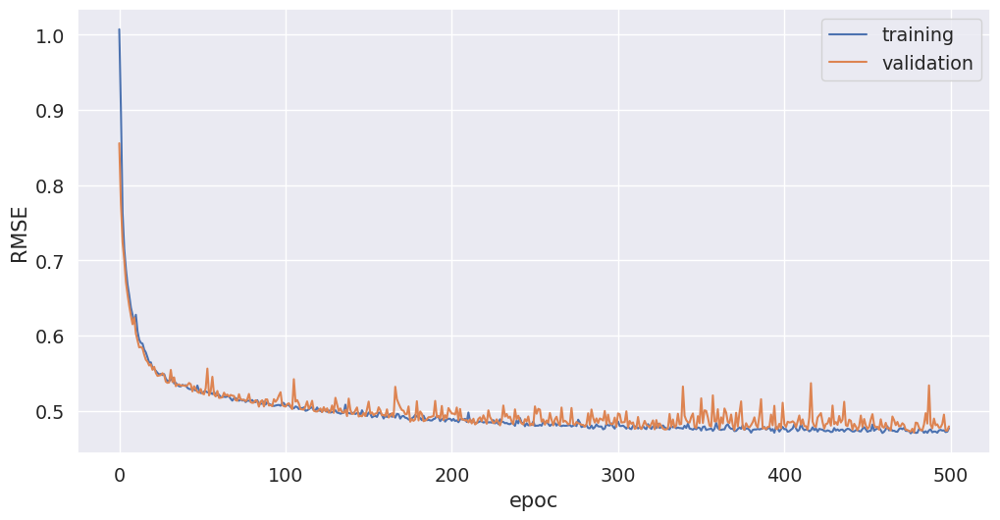

In [65]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("RMSE")
plt.xlabel("epoc")
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()

Vemos que el poder de generalización de esta red es mucho mejor que la anterior (los errores de validation y training no están tan separados y no perdí precisión o accuracy)

## Clasificación

Primero un ejemplo de clasificación binaria y después uno de clasificación con n clases

In [66]:
header = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
    "class",
]

In [67]:
header

['pelvic incidence',
 'pelvic tilt',
 'lumbar lordosis angle',
 'sacral slope',
 'pelvic radius',
 'grade of spondylolisthesis',
 'class']

In [68]:
data = pd.read_csv(
    "https://drive.google.com/uc?export=download&id=1T9VNcGMatXFrg7JpIkwHpqHrb8dGKvtP",
    names=header,
    index_col=False,
)
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,AB
1,39.06,10.06,25.02,29.00,114.41,4.56,AB
2,68.83,22.22,50.09,46.61,105.99,-3.53,AB
3,69.30,24.65,44.31,44.64,101.87,11.21,AB
4,49.71,9.65,28.32,40.06,108.17,7.92,AB


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


array([[<AxesSubplot:title={'center':'pelvic incidence'}>,
        <AxesSubplot:title={'center':'pelvic tilt'}>],
       [<AxesSubplot:title={'center':'lumbar lordosis angle'}>,
        <AxesSubplot:title={'center':'sacral slope'}>],
       [<AxesSubplot:title={'center':'pelvic radius'}>,
        <AxesSubplot:title={'center':'grade of spondylolisthesis'}>]],
      dtype=object)

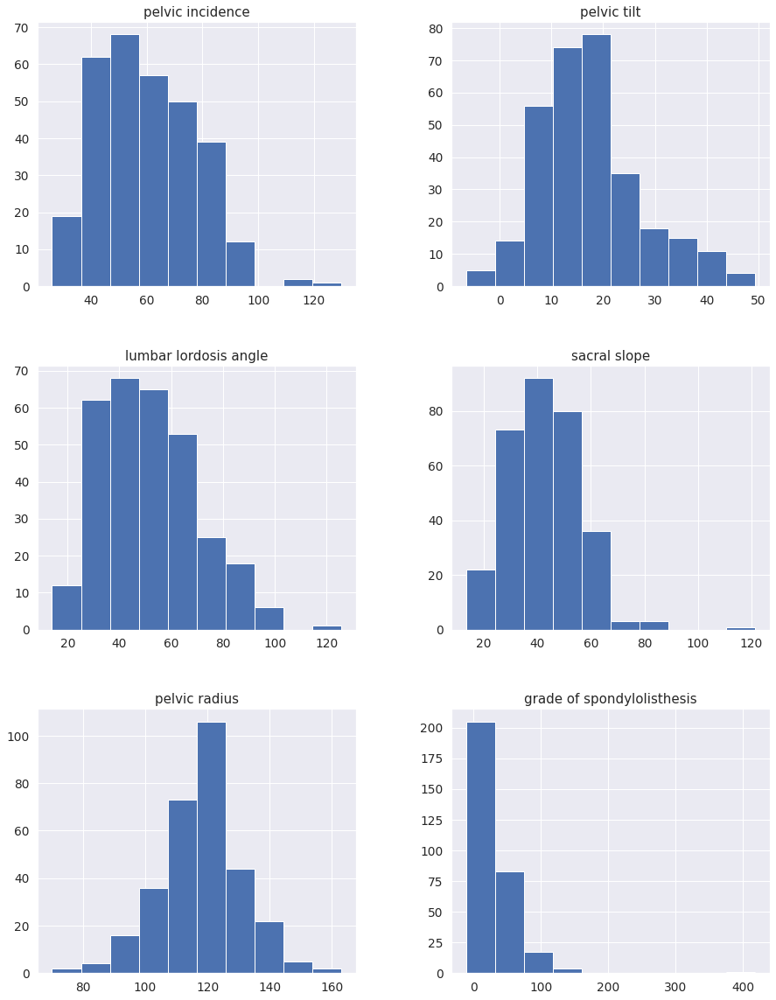

In [69]:
fig = plt.figure(figsize=(15, 20))
ax = fig.gca()

data.hist(ax=ax)

Los datasets no están tan mal distribuídos así que elijo no normalizarlos

Paso los valores de "AB" y "NO" a valores categóricos

In [70]:
label_encoder = preprocessing.LabelEncoder()

In [71]:
target = np.unique(data["class"])

In [72]:
label_encoder.fit(target)

LabelEncoder()

In [73]:
data["class"] = label_encoder.transform(data["class"])

In [74]:
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,0
1,39.06,10.06,25.02,29.00,114.41,4.56,0
2,68.83,22.22,50.09,46.61,105.99,-3.53,0
3,69.30,24.65,44.31,44.64,101.87,11.21,0
4,49.71,9.65,28.32,40.06,108.17,7.92,0


In [75]:
x_columns = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
]
x_data = data[x_columns]
y_data = data['class']

In [76]:
x_data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis
0,63.03,22.55,39.61,40.48,98.67,-0.25
1,39.06,10.06,25.02,29.00,114.41,4.56
2,68.83,22.22,50.09,46.61,105.99,-3.53
3,69.30,24.65,44.31,44.64,101.87,11.21
4,49.71,9.65,28.32,40.06,108.17,7.92


Separo los datos en train y validation

In [77]:
from sklearn.model_selection import train_test_split

X_train, X_validation, y_train, y_validation = train_test_split(
    x_data, y_data, test_size=0.4, random_state=66
)

Entreno un modelo sencillo de clasificación, un árbol de decisión para tener una referencia de error.

In [78]:
from sklearn.tree import DecisionTreeClassifier

In [79]:
model_tree = DecisionTreeClassifier(criterion="entropy")

In [80]:
model_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

Calculo el accuracy de mi árbol entrenado:

In [81]:
from sklearn.metrics import accuracy_score

In [82]:
pred = model_tree.predict(X_validation)

In [83]:
decision_tree_acc = accuracy_score(pred, y_validation)
decision_tree_acc

0.782258064516129

Mi red tiene que tener como cantidad de neuronas en la capa de salida la cantidad de clases si uso softmax o 1 neurona para el caso que use una activación de tipo sigmoide

In [84]:
num_classes = 2

In [85]:
model = Sequential()
model.add(Dense(8, input_shape=(6,), activation='tanh'))
model.add(Dense(num_classes, activation="softmax"))

In [86]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 8)                 56        
_________________________________________________________________
dense_27 (Dense)             (None, 2)                 18        
Total params: 74
Trainable params: 74
Non-trainable params: 0
_________________________________________________________________


El modelo necesita los labels en one hot encoding, uso la función to_categorical para transformarlos

In [87]:
y_train[1:10]

235    1
66     0
143    0
256    1
18     0
279    1
273    1
120    0
154    0
Name: class, dtype: int64

In [88]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_validation, num_classes)

In [89]:
y_train[1:10]

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.]], dtype=float32)

Ahora si puedo entrenar!

In [90]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8108 - accuracy: 0.4062

186/186 [==============================] - 0s 478us/step - loss: 0.8145 - accuracy: 0.3548 - val_loss: 0.7878 - val_accuracy: 0.3871


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7727 - accuracy: 0.3750

186/186 [==============================] - 0s 62us/step - loss: 0.7677 - accuracy: 0.3656 - val_loss: 0.7600 - val_accuracy: 0.4032


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7126 - accuracy: 0.4375

186/186 [==============================] - 0s 74us/step - loss: 0.7274 - accuracy: 0.3925 - val_loss: 0.7320 - val_accuracy: 0.4113


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7127 - accuracy: 0.3125

186/186 [==============================] - 0s 65us/step - loss: 0.6966 - accuracy: 0.4624 - val_loss: 0.7068 - val_accuracy: 0.5403


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6528 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.6595 - accuracy: 0.6398 - val_loss: 0.6826 - val_accuracy: 0.5645


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6212 - accuracy: 0.7188

186/186 [==============================] - 0s 56us/step - loss: 0.6390 - accuracy: 0.6559 - val_loss: 0.6597 - val_accuracy: 0.5726


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5705 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.6138 - accuracy: 0.6828 - val_loss: 0.6376 - val_accuracy: 0.6129


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6246 - accuracy: 0.6250

186/186 [==============================] - 0s 57us/step - loss: 0.5877 - accuracy: 0.6935 - val_loss: 0.6195 - val_accuracy: 0.6210


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5626 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.5747 - accuracy: 0.6989 - val_loss: 0.6131 - val_accuracy: 0.6210


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5746 - accuracy: 0.6875

186/186 [==============================] - 0s 56us/step - loss: 0.5680 - accuracy: 0.6989 - val_loss: 0.6064 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5461 - accuracy: 0.7500

186/186 [==============================] - 0s 56us/step - loss: 0.5621 - accuracy: 0.6989 - val_loss: 0.6014 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6185 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 0.5573 - accuracy: 0.6989 - val_loss: 0.5989 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5334 - accuracy: 0.6562

186/186 [==============================] - 0s 56us/step - loss: 0.5538 - accuracy: 0.6989 - val_loss: 0.5968 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5495 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.5513 - accuracy: 0.6989 - val_loss: 0.5936 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5006 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.5488 - accuracy: 0.6989 - val_loss: 0.5911 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4984 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5460 - accuracy: 0.6989 - val_loss: 0.5884 - val_accuracy: 0.6371


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4648 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5418 - accuracy: 0.6989 - val_loss: 0.5854 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5512 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5375 - accuracy: 0.6989 - val_loss: 0.5805 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5353 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5317 - accuracy: 0.6989 - val_loss: 0.5746 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5517 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.5193 - accuracy: 0.6989 - val_loss: 0.5697 - val_accuracy: 0.6371


Epoch 21/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4715 - accuracy: 0.7812

186/186 [==============================] - 0s 163us/step - loss: 0.4983 - accuracy: 0.7043 - val_loss: 0.5589 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4429 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.4770 - accuracy: 0.7043 - val_loss: 0.5484 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3073 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4608 - accuracy: 0.7043 - val_loss: 0.5430 - val_accuracy: 0.6371


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4157 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4568 - accuracy: 0.7043 - val_loss: 0.5386 - val_accuracy: 0.6371


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4074 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.4535 - accuracy: 0.7043 - val_loss: 0.5358 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4977 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.4493 - accuracy: 0.7043 - val_loss: 0.5334 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4250 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4466 - accuracy: 0.7043 - val_loss: 0.5312 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3703 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4438 - accuracy: 0.7043 - val_loss: 0.5290 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5182 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.4418 - accuracy: 0.7043 - val_loss: 0.5269 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4840 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.4399 - accuracy: 0.7043 - val_loss: 0.5254 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3829 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.4380 - accuracy: 0.7043 - val_loss: 0.5240 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4460 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.4364 - accuracy: 0.7043 - val_loss: 0.5230 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5588 - accuracy: 0.5312

186/186 [==============================] - 0s 61us/step - loss: 0.4354 - accuracy: 0.7043 - val_loss: 0.5215 - val_accuracy: 0.6371


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.4331 - accuracy: 0.7043 - val_loss: 0.5206 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.4316 - accuracy: 0.7043 - val_loss: 0.5198 - val_accuracy: 0.6371


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4048 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.4309 - accuracy: 0.7043 - val_loss: 0.5186 - val_accuracy: 0.6371


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4453 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4292 - accuracy: 0.7043 - val_loss: 0.5180 - val_accuracy: 0.6371


Epoch 38/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4712 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.4276 - accuracy: 0.7043 - val_loss: 0.5170 - val_accuracy: 0.6371


Epoch 39/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4465 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.4267 - accuracy: 0.7043 - val_loss: 0.5163 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4587 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.4253 - accuracy: 0.7043 - val_loss: 0.5150 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4402 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4239 - accuracy: 0.7043 - val_loss: 0.5145 - val_accuracy: 0.6371


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4630 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.4232 - accuracy: 0.7043 - val_loss: 0.5142 - val_accuracy: 0.6371


Epoch 43/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4064 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.4216 - accuracy: 0.7043 - val_loss: 0.5132 - val_accuracy: 0.6371


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4664 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.4202 - accuracy: 0.7043 - val_loss: 0.5125 - val_accuracy: 0.6371


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.4190 - accuracy: 0.7043 - val_loss: 0.5114 - val_accuracy: 0.6371


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4097 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.4177 - accuracy: 0.7043 - val_loss: 0.5109 - val_accuracy: 0.6371


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4564 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.4165 - accuracy: 0.7043 - val_loss: 0.5107 - val_accuracy: 0.6371


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4243 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4155 - accuracy: 0.7043 - val_loss: 0.5099 - val_accuracy: 0.6371


Epoch 49/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4307 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.4144 - accuracy: 0.7043 - val_loss: 0.5092 - val_accuracy: 0.6371


Epoch 50/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.4137 - accuracy: 0.7043 - val_loss: 0.5081 - val_accuracy: 0.6371


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4114 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4125 - accuracy: 0.7043 - val_loss: 0.5078 - val_accuracy: 0.6371


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3251 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.4114 - accuracy: 0.7043 - val_loss: 0.5076 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4054 - accuracy: 0.6562



186/186 [==============================] - 0s 58us/step - loss: 0.4108 - accuracy: 0.7043 - val_loss: 0.5069 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4797 - accuracy: 0.6250

186/186 [==============================] - 0s 53us/step - loss: 0.4100 - accuracy: 0.7043 - val_loss: 0.5066 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4344 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.4089 - accuracy: 0.7043 - val_loss: 0.5055 - val_accuracy: 0.6371


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3882 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4084 - accuracy: 0.7043 - val_loss: 0.5049 - val_accuracy: 0.6371


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4603 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4075 - accuracy: 0.7043 - val_loss: 0.5048 - val_accuracy: 0.6371


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3217 - accuracy: 0.7812

186/186 [==============================] - 0s 111us/step - loss: 0.4066 - accuracy: 0.7097 - val_loss: 0.5039 - val_accuracy: 0.7177


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4535 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4056 - accuracy: 0.7796 - val_loss: 0.5036 - val_accuracy: 0.7097


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4313 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4054 - accuracy: 0.7634 - val_loss: 0.5036 - val_accuracy: 0.7016


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3606 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4044 - accuracy: 0.7688 - val_loss: 0.5028 - val_accuracy: 0.7016


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4165 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4037 - accuracy: 0.7688 - val_loss: 0.5016 - val_accuracy: 0.7016


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4031 - accuracy: 0.7688 - val_loss: 0.5018 - val_accuracy: 0.7016


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4381 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4024 - accuracy: 0.7688 - val_loss: 0.5021 - val_accuracy: 0.7016


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4192 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4016 - accuracy: 0.7688 - val_loss: 0.5012 - val_accuracy: 0.7016


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4643 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4012 - accuracy: 0.7688 - val_loss: 0.5003 - val_accuracy: 0.7016


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3564 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4003 - accuracy: 0.7688 - val_loss: 0.4995 - val_accuracy: 0.7016


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4646 - accuracy: 0.6875

186/186 [==============================] - 0s 58us/step - loss: 0.4000 - accuracy: 0.7688 - val_loss: 0.5002 - val_accuracy: 0.7016


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3914 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3994 - accuracy: 0.7742 - val_loss: 0.4996 - val_accuracy: 0.7016


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3982 - accuracy: 0.7742 - val_loss: 0.4987 - val_accuracy: 0.7016


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4240 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3976 - accuracy: 0.7688 - val_loss: 0.4981 - val_accuracy: 0.7016


Epoch 72/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3813 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3975 - accuracy: 0.7688 - val_loss: 0.4982 - val_accuracy: 0.7016


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4223 - accuracy: 0.8750

186/186 [==============================] - 0s 115us/step - loss: 0.3966 - accuracy: 0.7688 - val_loss: 0.4973 - val_accuracy: 0.7016


Epoch 74/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3899 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3962 - accuracy: 0.7688 - val_loss: 0.4972 - val_accuracy: 0.7016


Epoch 75/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3969 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3954 - accuracy: 0.7742 - val_loss: 0.4973 - val_accuracy: 0.7016


Epoch 76/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3466 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3950 - accuracy: 0.7742 - val_loss: 0.4968 - val_accuracy: 0.7016


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5188 - accuracy: 0.6875

186/186 [==============================] - 0s 59us/step - loss: 0.3946 - accuracy: 0.7742 - val_loss: 0.4968 - val_accuracy: 0.7016


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3939 - accuracy: 0.7742 - val_loss: 0.4961 - val_accuracy: 0.7016


Epoch 79/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3262 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3934 - accuracy: 0.7742 - val_loss: 0.4956 - val_accuracy: 0.7016


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.3933 - accuracy: 0.7742 - val_loss: 0.4951 - val_accuracy: 0.7016


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3866 - accuracy: 0.7500

186/186 [==============================] - 0s 57us/step - loss: 0.3923 - accuracy: 0.7796 - val_loss: 0.4960 - val_accuracy: 0.6935


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3924 - accuracy: 0.7796 - val_loss: 0.4958 - val_accuracy: 0.6935


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8438

186/186 [==============================] - 0s 56us/step - loss: 0.3917 - accuracy: 0.7796 - val_loss: 0.4949 - val_accuracy: 0.6935


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3913 - accuracy: 0.7796 - val_loss: 0.4936 - val_accuracy: 0.7016


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4195 - accuracy: 0.6875

186/186 [==============================] - 0s 57us/step - loss: 0.3913 - accuracy: 0.7796 - val_loss: 0.4943 - val_accuracy: 0.6935


Epoch 86/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4604 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3901 - accuracy: 0.7796 - val_loss: 0.4938 - val_accuracy: 0.6935


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.3904 - accuracy: 0.7796 - val_loss: 0.4928 - val_accuracy: 0.7016


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3928 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3897 - accuracy: 0.7796 - val_loss: 0.4942 - val_accuracy: 0.6935


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3781 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3894 - accuracy: 0.7796 - val_loss: 0.4936 - val_accuracy: 0.6935


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4628 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3898 - accuracy: 0.7796 - val_loss: 0.4920 - val_accuracy: 0.7016


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3377 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3882 - accuracy: 0.7796 - val_loss: 0.4921 - val_accuracy: 0.6935


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3915 - accuracy: 0.7188

186/186 [==============================] - 0s 81us/step - loss: 0.3875 - accuracy: 0.7796 - val_loss: 0.4927 - val_accuracy: 0.6935


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4066 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3892 - accuracy: 0.7796 - val_loss: 0.4933 - val_accuracy: 0.6855


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3869 - accuracy: 0.7796 - val_loss: 0.4920 - val_accuracy: 0.6935


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4988 - accuracy: 0.6875

186/186 [==============================] - 0s 58us/step - loss: 0.3875 - accuracy: 0.7742 - val_loss: 0.4899 - val_accuracy: 0.7016


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3798 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3875 - accuracy: 0.7742 - val_loss: 0.4896 - val_accuracy: 0.7016


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4271 - accuracy: 0.6250

186/186 [==============================] - 0s 57us/step - loss: 0.3853 - accuracy: 0.7796 - val_loss: 0.4919 - val_accuracy: 0.6935


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3578 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3862 - accuracy: 0.7796 - val_loss: 0.4920 - val_accuracy: 0.6935


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3724 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3852 - accuracy: 0.7796 - val_loss: 0.4910 - val_accuracy: 0.6935


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3651 - accuracy: 0.8750



186/186 [==============================] - 0s 65us/step - loss: 0.3858 - accuracy: 0.7796 - val_loss: 0.4889 - val_accuracy: 0.7016


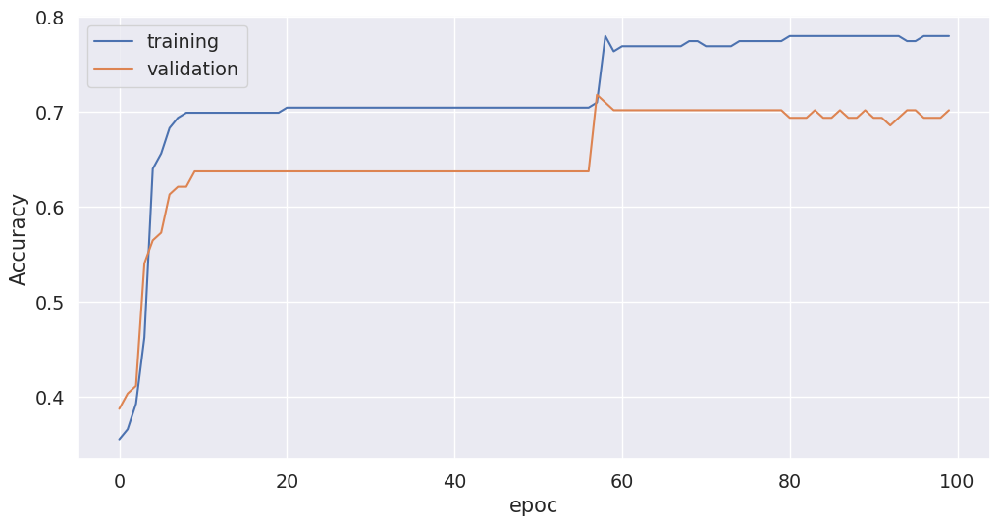

In [91]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

A medida que las red se va haciendo más profunda conviene usar relu. Agrego relu + regularizacion y cambio optimizador

In [92]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [93]:
model.compile(
    loss='categorical_crossentropy', optimizer='adadelta', metrics=['accuracy']
)
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_4 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_30 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_31 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [94]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 12.6672 - accuracy: 0.5000

186/186 [==============================] - 0s 1ms/step - loss: 11.1915 - accuracy: 0.5269 - val_loss: 1.1978 - val_accuracy: 0.6532


Epoch 2/100


 32/186 [====>.........................] - ETA: 0s - loss: 6.4886 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 7.7352 - accuracy: 0.6075 - val_loss: 1.4742 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.2064 - accuracy: 0.4688

186/186 [==============================] - 0s 71us/step - loss: 7.2205 - accuracy: 0.5914 - val_loss: 1.6176 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.2985 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 5.5112 - accuracy: 0.6183 - val_loss: 1.5115 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.2827 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 5.3479 - accuracy: 0.6075 - val_loss: 1.4911 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 5.7174 - accuracy: 0.4688

186/186 [==============================] - 0s 70us/step - loss: 3.9700 - accuracy: 0.6344 - val_loss: 1.3952 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.0444 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 4.0791 - accuracy: 0.6344 - val_loss: 1.2195 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 5.6608 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 4.5106 - accuracy: 0.6129 - val_loss: 1.0598 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.9868 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 2.6694 - accuracy: 0.6559 - val_loss: 1.0034 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.2857 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 1.9482 - accuracy: 0.6935 - val_loss: 0.9632 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0957 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 2.6648 - accuracy: 0.6290 - val_loss: 0.8592 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.6401 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 2.4035 - accuracy: 0.6667 - val_loss: 0.8022 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0852 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 2.2982 - accuracy: 0.6183 - val_loss: 0.7504 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 5.5707 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 2.5811 - accuracy: 0.6774 - val_loss: 0.6987 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7524 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 2.1719 - accuracy: 0.6344 - val_loss: 0.7062 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7553 - accuracy: 0.6250

186/186 [==============================] - 0s 78us/step - loss: 1.5636 - accuracy: 0.7258 - val_loss: 0.7168 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8038 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 1.4866 - accuracy: 0.6720 - val_loss: 0.6736 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4259 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 1.7426 - accuracy: 0.6774 - val_loss: 0.6533 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8327 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 1.7524 - accuracy: 0.6828 - val_loss: 0.6427 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9514 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 1.1459 - accuracy: 0.6989 - val_loss: 0.6262 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2653 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 1.2315 - accuracy: 0.6720 - val_loss: 0.6147 - val_accuracy: 0.6371


Epoch 22/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7602 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 1.1994 - accuracy: 0.7097 - val_loss: 0.6097 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0131 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.9919 - accuracy: 0.7043 - val_loss: 0.6126 - val_accuracy: 0.6371


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4200 - accuracy: 0.6875

186/186 [==============================] - 0s 90us/step - loss: 1.2282 - accuracy: 0.6882 - val_loss: 0.6218 - val_accuracy: 0.6371


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6263 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 1.0392 - accuracy: 0.6882 - val_loss: 0.6181 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2301 - accuracy: 0.5000

186/186 [==============================] - 0s 67us/step - loss: 1.4549 - accuracy: 0.6237 - val_loss: 0.6220 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7933 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 1.5898 - accuracy: 0.6452 - val_loss: 0.6227 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7805 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 1.1971 - accuracy: 0.6720 - val_loss: 0.6260 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5769 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.7895 - accuracy: 0.6774 - val_loss: 0.6285 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3864 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 1.4725 - accuracy: 0.6667 - val_loss: 0.6340 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6943 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.8290 - accuracy: 0.6828 - val_loss: 0.6352 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7245 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 1.1614 - accuracy: 0.6452 - val_loss: 0.6359 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7379 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.9100 - accuracy: 0.6935 - val_loss: 0.6416 - val_accuracy: 0.6371


Epoch 34/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9932 - accuracy: 0.5625

186/186 [==============================] - 0s 73us/step - loss: 0.7507 - accuracy: 0.6882 - val_loss: 0.6396 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9740 - accuracy: 0.4688

186/186 [==============================] - 0s 73us/step - loss: 1.3106 - accuracy: 0.6505 - val_loss: 0.6383 - val_accuracy: 0.6371


Epoch 36/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6392 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.9899 - accuracy: 0.6828 - val_loss: 0.6404 - val_accuracy: 0.6371


Epoch 37/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.7111 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.9737 - accuracy: 0.6613 - val_loss: 0.6417 - val_accuracy: 0.6371


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6073 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6945 - accuracy: 0.6667 - val_loss: 0.6419 - val_accuracy: 0.6371


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7378 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7935 - accuracy: 0.7043 - val_loss: 0.6427 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6259 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 1.1384 - accuracy: 0.6720 - val_loss: 0.6439 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6963 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.7493 - accuracy: 0.7043 - val_loss: 0.6458 - val_accuracy: 0.6371


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9713 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.7166 - accuracy: 0.6935 - val_loss: 0.6429 - val_accuracy: 0.6371


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3080 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.8842 - accuracy: 0.6882 - val_loss: 0.6413 - val_accuracy: 0.6371


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6470 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.9317 - accuracy: 0.6828 - val_loss: 0.6414 - val_accuracy: 0.6371


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9068 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.7375 - accuracy: 0.6667 - val_loss: 0.6438 - val_accuracy: 0.6371


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6271 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.8262 - accuracy: 0.6882 - val_loss: 0.6433 - val_accuracy: 0.6371


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8420 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.7901 - accuracy: 0.6828 - val_loss: 0.6456 - val_accuracy: 0.6371


Epoch 48/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.0031 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.7711 - accuracy: 0.6882 - val_loss: 0.6467 - val_accuracy: 0.6371


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5846 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.8155 - accuracy: 0.6774 - val_loss: 0.6461 - val_accuracy: 0.6371


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7094 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.7054 - accuracy: 0.6935 - val_loss: 0.6451 - val_accuracy: 0.6371


Epoch 51/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7949 - accuracy: 0.6562

186/186 [==============================] - 0s 87us/step - loss: 0.6783 - accuracy: 0.6935 - val_loss: 0.6439 - val_accuracy: 0.6371


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9226 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.7130 - accuracy: 0.6989 - val_loss: 0.6433 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6545 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.8380 - accuracy: 0.6774 - val_loss: 0.6429 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7017 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6857 - accuracy: 0.6989 - val_loss: 0.6422 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6943 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.6559 - accuracy: 0.6989 - val_loss: 0.6444 - val_accuracy: 0.6371


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6676 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.8450 - accuracy: 0.6882 - val_loss: 0.6445 - val_accuracy: 0.6371


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4938 - accuracy: 0.7500

186/186 [==============================] - 0s 83us/step - loss: 0.7716 - accuracy: 0.6720 - val_loss: 0.6430 - val_accuracy: 0.6371


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6713 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6066 - accuracy: 0.7043 - val_loss: 0.6423 - val_accuracy: 0.6371


Epoch 59/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6352 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.7184 - accuracy: 0.6882 - val_loss: 0.6438 - val_accuracy: 0.6371


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6523 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6547 - accuracy: 0.6882 - val_loss: 0.6435 - val_accuracy: 0.6371


Epoch 61/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6977 - accuracy: 0.5938

186/186 [==============================] - 0s 80us/step - loss: 0.6506 - accuracy: 0.6774 - val_loss: 0.6444 - val_accuracy: 0.6371


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8863 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 0.7070 - accuracy: 0.6882 - val_loss: 0.6443 - val_accuracy: 0.6371


Epoch 63/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7073 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.6093 - accuracy: 0.6989 - val_loss: 0.6444 - val_accuracy: 0.6371


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6700 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6537 - accuracy: 0.6989 - val_loss: 0.6445 - val_accuracy: 0.6371


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5681 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6787 - accuracy: 0.6989 - val_loss: 0.6437 - val_accuracy: 0.6371


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1595 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.7544 - accuracy: 0.7043 - val_loss: 0.6450 - val_accuracy: 0.6371


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6496 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.7543 - accuracy: 0.6774 - val_loss: 0.6513 - val_accuracy: 0.6371


Epoch 68/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7202 - accuracy: 0.5312

186/186 [==============================] - 0s 71us/step - loss: 0.6362 - accuracy: 0.7043 - val_loss: 0.6471 - val_accuracy: 0.6371


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6336 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.6572 - accuracy: 0.6720 - val_loss: 0.6453 - val_accuracy: 0.6371


Epoch 70/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7153 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.6118 - accuracy: 0.7043 - val_loss: 0.6437 - val_accuracy: 0.6371


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5325 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6560 - accuracy: 0.6882 - val_loss: 0.6465 - val_accuracy: 0.6371


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5488 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.6094 - accuracy: 0.7043 - val_loss: 0.6467 - val_accuracy: 0.6371


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5307 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6141 - accuracy: 0.6882 - val_loss: 0.6444 - val_accuracy: 0.6371


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6391 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6379 - accuracy: 0.6882 - val_loss: 0.6438 - val_accuracy: 0.6371


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5022 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5497 - accuracy: 0.7151 - val_loss: 0.6402 - val_accuracy: 0.6371


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5664 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 1.7190 - accuracy: 0.7043 - val_loss: 0.6385 - val_accuracy: 0.6371


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6466 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6100 - accuracy: 0.7151 - val_loss: 0.6279 - val_accuracy: 0.6371


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8850 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.6959 - accuracy: 0.6828 - val_loss: 0.6279 - val_accuracy: 0.6371


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4107 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.8156 - accuracy: 0.6989 - val_loss: 0.6192 - val_accuracy: 0.6371


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4320 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5995 - accuracy: 0.7043 - val_loss: 0.6122 - val_accuracy: 0.6371


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5530 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.6246 - accuracy: 0.6774 - val_loss: 0.6035 - val_accuracy: 0.6371


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4496 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.6175 - accuracy: 0.6989 - val_loss: 0.6041 - val_accuracy: 0.6371


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6358 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.5802 - accuracy: 0.7043 - val_loss: 0.5966 - val_accuracy: 0.6371


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6696 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6063 - accuracy: 0.6935 - val_loss: 0.5873 - val_accuracy: 0.6371


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5103 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5602 - accuracy: 0.7258 - val_loss: 0.5875 - val_accuracy: 0.6371


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4686 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 1.3160 - accuracy: 0.7151 - val_loss: 0.5840 - val_accuracy: 0.6371


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6270 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 1.4440 - accuracy: 0.7043 - val_loss: 0.5834 - val_accuracy: 0.6371


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5021 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5542 - accuracy: 0.7151 - val_loss: 0.5803 - val_accuracy: 0.6371


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5818 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.8989 - accuracy: 0.6720 - val_loss: 0.5802 - val_accuracy: 0.6371


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4540 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.5384 - accuracy: 0.6989 - val_loss: 0.5767 - val_accuracy: 0.6371


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5451 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.7415 - accuracy: 0.6882 - val_loss: 0.5722 - val_accuracy: 0.6371


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6630 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6004 - accuracy: 0.7097 - val_loss: 0.5815 - val_accuracy: 0.6371


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5638 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.5464 - accuracy: 0.7097 - val_loss: 0.5726 - val_accuracy: 0.6371


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0648 - accuracy: 0.5625

186/186 [==============================] - 0s 69us/step - loss: 0.6619 - accuracy: 0.6882 - val_loss: 0.5708 - val_accuracy: 0.6371


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6039 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 1.4663 - accuracy: 0.6882 - val_loss: 0.5663 - val_accuracy: 0.6371


Epoch 96/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5968 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5789 - accuracy: 0.7043 - val_loss: 0.5632 - val_accuracy: 0.6371


Epoch 97/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6521 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.6297 - accuracy: 0.7097 - val_loss: 0.5630 - val_accuracy: 0.6371


Epoch 98/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4723 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.5472 - accuracy: 0.7043 - val_loss: 0.5552 - val_accuracy: 0.6371


Epoch 99/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6169 - accuracy: 0.6875



186/186 [==============================] - 0s 73us/step - loss: 0.5322 - accuracy: 0.7258 - val_loss: 0.5556 - val_accuracy: 0.6371


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6417 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.5648 - accuracy: 0.6935 - val_loss: 0.5542 - val_accuracy: 0.6371


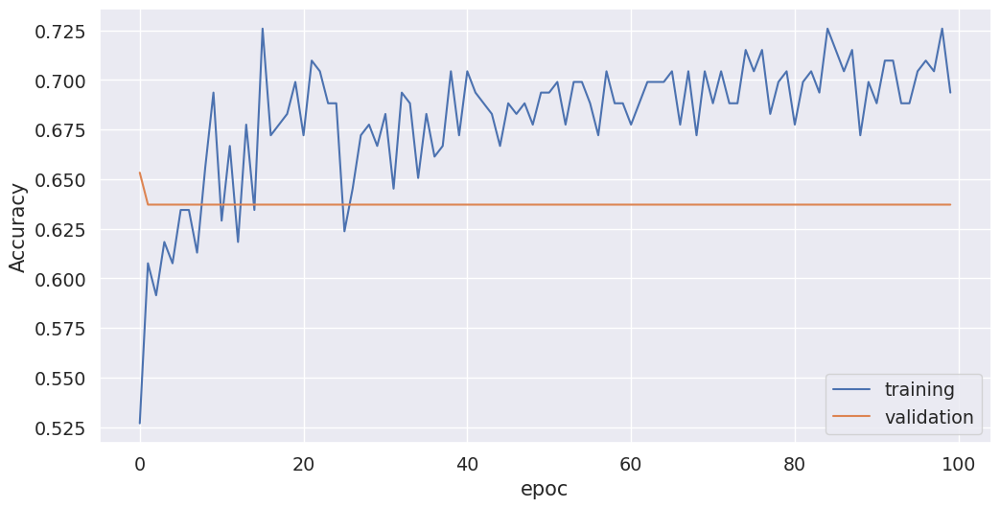

In [95]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Cambio de nuevo el optimizador por RMSprop

In [96]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [97]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_6 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_34 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_35 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [98]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 20.1378 - accuracy: 0.5625

186/186 [==============================] - 0s 869us/step - loss: 12.1462 - accuracy: 0.7097 - val_loss: 12.3567 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 12.1673 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 11.3988 - accuracy: 0.6989 - val_loss: 9.9887 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 9.2369 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 9.1299 - accuracy: 0.7043 - val_loss: 8.5024 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.6357 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 8.4622 - accuracy: 0.6989 - val_loss: 7.1069 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.3310 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 6.9631 - accuracy: 0.7043 - val_loss: 6.1723 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.3216 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 6.0600 - accuracy: 0.7043 - val_loss: 5.2664 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.4678 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 6.2260 - accuracy: 0.6989 - val_loss: 4.3948 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.2217 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 4.4309 - accuracy: 0.6989 - val_loss: 3.8581 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.5461 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 4.1851 - accuracy: 0.7097 - val_loss: 3.3501 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.0590 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 4.2725 - accuracy: 0.6989 - val_loss: 2.9153 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.8323 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 3.3713 - accuracy: 0.7043 - val_loss: 2.6202 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.1819 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 3.3052 - accuracy: 0.6774 - val_loss: 2.2662 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.4161 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 2.5375 - accuracy: 0.7151 - val_loss: 2.0347 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7680 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 2.4513 - accuracy: 0.7043 - val_loss: 1.8118 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.8834 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 2.0849 - accuracy: 0.6989 - val_loss: 1.6092 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.5722 - accuracy: 0.5938

186/186 [==============================] - 0s 91us/step - loss: 2.0010 - accuracy: 0.6989 - val_loss: 1.4330 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.1883 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 1.5143 - accuracy: 0.6935 - val_loss: 1.2804 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4745 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 1.6449 - accuracy: 0.7043 - val_loss: 1.1686 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4820 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 1.4201 - accuracy: 0.6989 - val_loss: 1.0465 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2412 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 1.2781 - accuracy: 0.7097 - val_loss: 0.9578 - val_accuracy: 0.6371


Epoch 21/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7436 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 1.2821 - accuracy: 0.6398 - val_loss: 0.8991 - val_accuracy: 0.6371


Epoch 22/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.7326 - accuracy: 0.5312

186/186 [==============================] - 0s 74us/step - loss: 1.0618 - accuracy: 0.6452 - val_loss: 0.8533 - val_accuracy: 0.6290


Epoch 23/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8300 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 1.0700 - accuracy: 0.6398 - val_loss: 0.8085 - val_accuracy: 0.6129


Epoch 24/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9223 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.9551 - accuracy: 0.6344 - val_loss: 0.7725 - val_accuracy: 0.6129


Epoch 25/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9134 - accuracy: 0.5625

186/186 [==============================] - 0s 62us/step - loss: 0.7631 - accuracy: 0.6237 - val_loss: 0.7349 - val_accuracy: 0.5968


Epoch 26/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2483 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.8735 - accuracy: 0.6398 - val_loss: 0.7192 - val_accuracy: 0.5968


Epoch 27/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8665 - accuracy: 0.5312

186/186 [==============================] - 0s 67us/step - loss: 0.7416 - accuracy: 0.6022 - val_loss: 0.6994 - val_accuracy: 0.5887


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6470 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.8166 - accuracy: 0.6022 - val_loss: 0.6843 - val_accuracy: 0.6048


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5904 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.7331 - accuracy: 0.6505 - val_loss: 0.6760 - val_accuracy: 0.5806


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6148 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.7755 - accuracy: 0.5699 - val_loss: 0.6596 - val_accuracy: 0.5806


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6777 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6572 - accuracy: 0.6559 - val_loss: 0.6476 - val_accuracy: 0.6129


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5650 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6550 - accuracy: 0.6344 - val_loss: 0.6233 - val_accuracy: 0.6290


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4722 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6364 - accuracy: 0.6882 - val_loss: 0.6167 - val_accuracy: 0.6290


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7093 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 0.6972 - accuracy: 0.6183 - val_loss: 0.6077 - val_accuracy: 0.6210


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6313 - accuracy: 0.5312

186/186 [==============================] - 0s 83us/step - loss: 0.6470 - accuracy: 0.6129 - val_loss: 0.5985 - val_accuracy: 0.6210


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6984 - accuracy: 0.5312

186/186 [==============================] - 0s 68us/step - loss: 0.6631 - accuracy: 0.6022 - val_loss: 0.5859 - val_accuracy: 0.6290


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5419 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.5533 - accuracy: 0.6828 - val_loss: 0.5635 - val_accuracy: 0.6452


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6038 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.5351 - accuracy: 0.7204 - val_loss: 0.5569 - val_accuracy: 0.6371


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6031 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.5819 - accuracy: 0.6774 - val_loss: 0.5509 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5949 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.5580 - accuracy: 0.7043 - val_loss: 0.5445 - val_accuracy: 0.7097


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9055 - accuracy: 0.5000

186/186 [==============================] - 0s 66us/step - loss: 0.5939 - accuracy: 0.6774 - val_loss: 0.5333 - val_accuracy: 0.7661


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6510 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5882 - accuracy: 0.6720 - val_loss: 0.5329 - val_accuracy: 0.7581


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4944 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5226 - accuracy: 0.7204 - val_loss: 0.5307 - val_accuracy: 0.7581


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5087 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5892 - accuracy: 0.6882 - val_loss: 0.5247 - val_accuracy: 0.7500


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4412 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.5361 - accuracy: 0.7151 - val_loss: 0.5161 - val_accuracy: 0.7903


Epoch 46/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4259 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5151 - accuracy: 0.7419 - val_loss: 0.5091 - val_accuracy: 0.7984


Epoch 47/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5730 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5504 - accuracy: 0.7366 - val_loss: 0.4964 - val_accuracy: 0.7903


Epoch 48/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5658 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.5097 - accuracy: 0.7527 - val_loss: 0.4862 - val_accuracy: 0.7903


Epoch 49/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4290 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5208 - accuracy: 0.7312 - val_loss: 0.4801 - val_accuracy: 0.7823


Epoch 50/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6983 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.4892 - accuracy: 0.7473 - val_loss: 0.4917 - val_accuracy: 0.7500


Epoch 51/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5684 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.4890 - accuracy: 0.7473 - val_loss: 0.4772 - val_accuracy: 0.7823


Epoch 52/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5735 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.4786 - accuracy: 0.7796 - val_loss: 0.4713 - val_accuracy: 0.7823


Epoch 53/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4955 - accuracy: 0.8125



186/186 [==============================] - 0s 73us/step - loss: 0.4916 - accuracy: 0.7527 - val_loss: 0.4738 - val_accuracy: 0.7823


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4817 - accuracy: 0.6875



186/186 [==============================] - 0s 64us/step - loss: 0.4698 - accuracy: 0.7473 - val_loss: 0.4713 - val_accuracy: 0.7661


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5992 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4966 - accuracy: 0.7366 - val_loss: 0.4807 - val_accuracy: 0.7500


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4260 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.4659 - accuracy: 0.7312 - val_loss: 0.4628 - val_accuracy: 0.7661


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4347 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4761 - accuracy: 0.7419 - val_loss: 0.4619 - val_accuracy: 0.7742


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4917 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4459 - accuracy: 0.7742 - val_loss: 0.4548 - val_accuracy: 0.7742


Epoch 59/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4426 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4402 - accuracy: 0.7849 - val_loss: 0.4604 - val_accuracy: 0.7419


Epoch 60/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4044 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4558 - accuracy: 0.7473 - val_loss: 0.4633 - val_accuracy: 0.7258


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4185 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4447 - accuracy: 0.7634 - val_loss: 0.4597 - val_accuracy: 0.7258


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3821 - accuracy: 0.8226 - val_loss: 0.4526 - val_accuracy: 0.7258


Epoch 63/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4314 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4499 - accuracy: 0.7581 - val_loss: 0.4592 - val_accuracy: 0.7258


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5148 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.4446 - accuracy: 0.7527 - val_loss: 0.4543 - val_accuracy: 0.7258


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5249 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.4220 - accuracy: 0.7581 - val_loss: 0.4524 - val_accuracy: 0.7339


Epoch 66/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.8125

186/186 [==============================] - 0s 83us/step - loss: 0.4205 - accuracy: 0.7796 - val_loss: 0.4587 - val_accuracy: 0.7177


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3040 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.4163 - accuracy: 0.7903 - val_loss: 0.4570 - val_accuracy: 0.7177


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3061 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4103 - accuracy: 0.8118 - val_loss: 0.4658 - val_accuracy: 0.7339


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4351 - accuracy: 0.7742 - val_loss: 0.4700 - val_accuracy: 0.7258


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5430 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4425 - accuracy: 0.7688 - val_loss: 0.4646 - val_accuracy: 0.7339


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4147 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4108 - accuracy: 0.7796 - val_loss: 0.4614 - val_accuracy: 0.7339


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3861 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3963 - accuracy: 0.8118 - val_loss: 0.4580 - val_accuracy: 0.7258


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4670 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.4444 - accuracy: 0.7688 - val_loss: 0.4637 - val_accuracy: 0.7419


Epoch 74/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.4083 - accuracy: 0.7742 - val_loss: 0.4564 - val_accuracy: 0.7339


Epoch 75/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4119 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4029 - accuracy: 0.7849 - val_loss: 0.4544 - val_accuracy: 0.7258


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5291 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.4214 - accuracy: 0.7581 - val_loss: 0.4666 - val_accuracy: 0.7177


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3919 - accuracy: 0.7796 - val_loss: 0.4620 - val_accuracy: 0.7177


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4955 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4033 - accuracy: 0.7903 - val_loss: 0.4643 - val_accuracy: 0.7016


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3757 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4099 - accuracy: 0.8118 - val_loss: 0.4499 - val_accuracy: 0.7258


Epoch 80/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3791 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3719 - accuracy: 0.8011 - val_loss: 0.4565 - val_accuracy: 0.7177


Epoch 81/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3066 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3603 - accuracy: 0.8656 - val_loss: 0.4554 - val_accuracy: 0.7177


Epoch 82/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5052 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4097 - accuracy: 0.7742 - val_loss: 0.4559 - val_accuracy: 0.7177


Epoch 83/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4121 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3972 - accuracy: 0.7957 - val_loss: 0.4517 - val_accuracy: 0.7258


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2509 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3913 - accuracy: 0.8280 - val_loss: 0.4519 - val_accuracy: 0.7258


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3897 - accuracy: 0.7796 - val_loss: 0.4514 - val_accuracy: 0.7177


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3827 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.4008 - accuracy: 0.7903 - val_loss: 0.4454 - val_accuracy: 0.7339


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3537 - accuracy: 0.8011 - val_loss: 0.4427 - val_accuracy: 0.7339


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3847 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.4525 - accuracy: 0.7419 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3809 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3600 - accuracy: 0.7957 - val_loss: 0.4492 - val_accuracy: 0.7177


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2890 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3936 - accuracy: 0.8280 - val_loss: 0.4472 - val_accuracy: 0.7177


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3314 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.4014 - accuracy: 0.8065 - val_loss: 0.4454 - val_accuracy: 0.7339


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4457 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4524 - accuracy: 0.7581 - val_loss: 0.4528 - val_accuracy: 0.7177


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3736 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3724 - accuracy: 0.8172 - val_loss: 0.4555 - val_accuracy: 0.7177


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3544 - accuracy: 0.8280 - val_loss: 0.4486 - val_accuracy: 0.7177


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3073 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3737 - accuracy: 0.8065 - val_loss: 0.4441 - val_accuracy: 0.7177


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3977 - accuracy: 0.8172 - val_loss: 0.4501 - val_accuracy: 0.7177


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3867 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3908 - accuracy: 0.7903 - val_loss: 0.4426 - val_accuracy: 0.7258


Epoch 98/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3907 - accuracy: 0.8065 - val_loss: 0.4445 - val_accuracy: 0.7258


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4624 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4161 - accuracy: 0.7796 - val_loss: 0.4475 - val_accuracy: 0.7177


Epoch 100/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4293 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3975 - accuracy: 0.7581 - val_loss: 0.4514 - val_accuracy: 0.7177


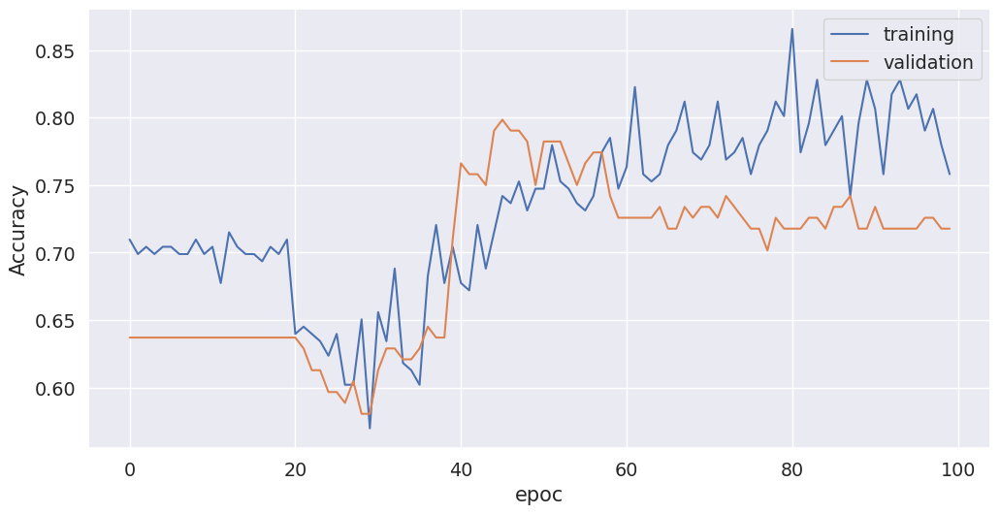

In [99]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Agreguemosle regularización de tipo L2

In [100]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(num_classes, activation="softmax"))

In [101]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_37 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_8 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_38 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_39 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [102]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 16.9145 - accuracy: 0.6875

186/186 [==============================] - 0s 1ms/step - loss: 13.0453 - accuracy: 0.7097 - val_loss: 10.7487 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 9.5555 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 9.3819 - accuracy: 0.6935 - val_loss: 8.8644 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 8.3271 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 8.4411 - accuracy: 0.6935 - val_loss: 7.2654 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.3609 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 6.3967 - accuracy: 0.6989 - val_loss: 6.0780 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.8277 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 6.7211 - accuracy: 0.6774 - val_loss: 4.7858 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.2393 - accuracy: 0.6250

186/186 [==============================] - 0s 86us/step - loss: 6.3987 - accuracy: 0.6613 - val_loss: 3.6641 - val_accuracy: 0.5565


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.4715 - accuracy: 0.6250

186/186 [==============================] - 0s 84us/step - loss: 5.1940 - accuracy: 0.5860 - val_loss: 2.8778 - val_accuracy: 0.4194


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.4407 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 4.7089 - accuracy: 0.5591 - val_loss: 2.3494 - val_accuracy: 0.3790


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.2423 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 2.9737 - accuracy: 0.6505 - val_loss: 1.8911 - val_accuracy: 0.3548


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.8532 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 3.1667 - accuracy: 0.6183 - val_loss: 1.5043 - val_accuracy: 0.3952


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.7108 - accuracy: 0.6562

186/186 [==============================] - 0s 77us/step - loss: 3.1995 - accuracy: 0.5484 - val_loss: 1.1913 - val_accuracy: 0.3952


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5428 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 2.7350 - accuracy: 0.5753 - val_loss: 1.0553 - val_accuracy: 0.3952


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.5079 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 2.6498 - accuracy: 0.5699 - val_loss: 0.9777 - val_accuracy: 0.4274


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8124 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 1.9312 - accuracy: 0.6237 - val_loss: 0.9295 - val_accuracy: 0.4194


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.9708 - accuracy: 0.4688

186/186 [==============================] - 0s 68us/step - loss: 2.0263 - accuracy: 0.5806 - val_loss: 0.9020 - val_accuracy: 0.4597


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.5055 - accuracy: 0.5312

186/186 [==============================] - 0s 68us/step - loss: 1.5810 - accuracy: 0.5968 - val_loss: 0.8954 - val_accuracy: 0.4435


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.0948 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 1.3482 - accuracy: 0.6183 - val_loss: 0.8914 - val_accuracy: 0.4435


Epoch 18/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.0441 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 1.8267 - accuracy: 0.5591 - val_loss: 0.8665 - val_accuracy: 0.4919


Epoch 19/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7851 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 1.6725 - accuracy: 0.5376 - val_loss: 0.8590 - val_accuracy: 0.4919


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8706 - accuracy: 0.5000

186/186 [==============================] - 0s 66us/step - loss: 1.3998 - accuracy: 0.5753 - val_loss: 0.8499 - val_accuracy: 0.5242


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.8815 - accuracy: 0.5625

186/186 [==============================] - 0s 62us/step - loss: 1.4926 - accuracy: 0.6022 - val_loss: 0.8492 - val_accuracy: 0.5323


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2206 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 1.4678 - accuracy: 0.6075 - val_loss: 0.8429 - val_accuracy: 0.5645


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6779 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 1.3539 - accuracy: 0.5645 - val_loss: 0.8277 - val_accuracy: 0.6129


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0170 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 1.0476 - accuracy: 0.6290 - val_loss: 0.8433 - val_accuracy: 0.5887


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2605 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 1.0881 - accuracy: 0.6022 - val_loss: 0.8349 - val_accuracy: 0.6129


Epoch 26/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.3428 - accuracy: 0.5625

186/186 [==============================] - 0s 73us/step - loss: 1.0722 - accuracy: 0.6129 - val_loss: 0.8053 - val_accuracy: 0.6935


Epoch 27/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5426 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 1.0129 - accuracy: 0.6559 - val_loss: 0.8086 - val_accuracy: 0.6855


Epoch 28/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9902 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.8878 - accuracy: 0.6613 - val_loss: 0.8046 - val_accuracy: 0.6935


Epoch 29/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.1020 - accuracy: 0.5625

186/186 [==============================] - 0s 70us/step - loss: 1.0278 - accuracy: 0.6398 - val_loss: 0.7943 - val_accuracy: 0.6935


Epoch 30/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9556 - accuracy: 0.5938

186/186 [==============================] - 0s 80us/step - loss: 0.9680 - accuracy: 0.5860 - val_loss: 0.7971 - val_accuracy: 0.6613


Epoch 31/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2467 - accuracy: 0.5312

186/186 [==============================] - 0s 77us/step - loss: 0.8971 - accuracy: 0.6129 - val_loss: 0.7963 - val_accuracy: 0.6774


Epoch 32/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6862 - accuracy: 0.8438



186/186 [==============================] - 0s 77us/step - loss: 0.8615 - accuracy: 0.6344 - val_loss: 0.8049 - val_accuracy: 0.6613


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1466 - accuracy: 0.5312

186/186 [==============================] - 0s 94us/step - loss: 0.9414 - accuracy: 0.6237 - val_loss: 0.7978 - val_accuracy: 0.6613


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7910 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.8895 - accuracy: 0.6667 - val_loss: 0.7927 - val_accuracy: 0.7177


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7466 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.7696 - accuracy: 0.7527 - val_loss: 0.7834 - val_accuracy: 0.6855


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9680 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 0.8432 - accuracy: 0.6667 - val_loss: 0.7840 - val_accuracy: 0.6613


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9078 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.8901 - accuracy: 0.6774 - val_loss: 0.7703 - val_accuracy: 0.6774


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8196 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.8227 - accuracy: 0.6505 - val_loss: 0.7747 - val_accuracy: 0.6532


Epoch 39/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8304 - accuracy: 0.5000

186/186 [==============================] - 0s 83us/step - loss: 0.7727 - accuracy: 0.6774 - val_loss: 0.7752 - val_accuracy: 0.6613


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7419 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.7301 - accuracy: 0.7043 - val_loss: 0.7688 - val_accuracy: 0.6694


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7391 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 0.8005 - accuracy: 0.6774 - val_loss: 0.7622 - val_accuracy: 0.7258


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6982 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.7505 - accuracy: 0.6667 - val_loss: 0.7572 - val_accuracy: 0.6774


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0252 - accuracy: 0.6250

186/186 [==============================] - 0s 86us/step - loss: 0.8293 - accuracy: 0.6720 - val_loss: 0.7637 - val_accuracy: 0.6532


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7014 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.7277 - accuracy: 0.7258 - val_loss: 0.7569 - val_accuracy: 0.6452


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6823 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6972 - accuracy: 0.6935 - val_loss: 0.7427 - val_accuracy: 0.6613


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9182 - accuracy: 0.5938

186/186 [==============================] - 0s 82us/step - loss: 0.7533 - accuracy: 0.6774 - val_loss: 0.7294 - val_accuracy: 0.6855


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7186 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.6832 - accuracy: 0.7043 - val_loss: 0.7190 - val_accuracy: 0.7097


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6694 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.6698 - accuracy: 0.7312 - val_loss: 0.7036 - val_accuracy: 0.6774


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5380 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.6578 - accuracy: 0.7312 - val_loss: 0.6996 - val_accuracy: 0.6613


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5951 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.6602 - accuracy: 0.7581 - val_loss: 0.6948 - val_accuracy: 0.6613


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5559 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6832 - accuracy: 0.7097 - val_loss: 0.6726 - val_accuracy: 0.6774


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5835 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.7260 - accuracy: 0.6828 - val_loss: 0.6701 - val_accuracy: 0.6532


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8452 - accuracy: 0.6562

186/186 [==============================] - 0s 80us/step - loss: 0.7194 - accuracy: 0.6935 - val_loss: 0.6708 - val_accuracy: 0.6532


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7595 - accuracy: 0.5000

186/186 [==============================] - 0s 78us/step - loss: 0.6635 - accuracy: 0.6559 - val_loss: 0.6614 - val_accuracy: 0.6774


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5122 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.6338 - accuracy: 0.7151 - val_loss: 0.6532 - val_accuracy: 0.6855


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7533 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 0.6635 - accuracy: 0.7043 - val_loss: 0.6514 - val_accuracy: 0.6694


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6244 - accuracy: 0.6562

186/186 [==============================] - 0s 87us/step - loss: 0.6303 - accuracy: 0.7097 - val_loss: 0.6391 - val_accuracy: 0.6855


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6871 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.6854 - accuracy: 0.7258 - val_loss: 0.6313 - val_accuracy: 0.6774


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6678 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.5934 - accuracy: 0.7634 - val_loss: 0.6203 - val_accuracy: 0.7097


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7576 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6219 - accuracy: 0.7312 - val_loss: 0.6250 - val_accuracy: 0.7258


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6277 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.6107 - accuracy: 0.7043 - val_loss: 0.6162 - val_accuracy: 0.6935


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6526 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6071 - accuracy: 0.6989 - val_loss: 0.6064 - val_accuracy: 0.6935


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4742 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.5659 - accuracy: 0.8065 - val_loss: 0.5979 - val_accuracy: 0.7419


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5364 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.5936 - accuracy: 0.7043 - val_loss: 0.5952 - val_accuracy: 0.7419


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5338 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.6354 - accuracy: 0.7366 - val_loss: 0.6088 - val_accuracy: 0.7177


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4834 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.5523 - accuracy: 0.7366 - val_loss: 0.5972 - val_accuracy: 0.7419


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5242 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.6161 - accuracy: 0.7097 - val_loss: 0.5984 - val_accuracy: 0.7258


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5708 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.5888 - accuracy: 0.7258 - val_loss: 0.6002 - val_accuracy: 0.7097


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5911 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.5846 - accuracy: 0.7366 - val_loss: 0.5973 - val_accuracy: 0.7177


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5155 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.5556 - accuracy: 0.7419 - val_loss: 0.5988 - val_accuracy: 0.7177


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6187 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.5285 - accuracy: 0.7796 - val_loss: 0.5917 - val_accuracy: 0.7177


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5100 - accuracy: 0.7500

186/186 [==============================] - 0s 86us/step - loss: 0.5654 - accuracy: 0.7097 - val_loss: 0.5949 - val_accuracy: 0.7258


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6455 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.5542 - accuracy: 0.7312 - val_loss: 0.5937 - val_accuracy: 0.7258


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4902 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.5559 - accuracy: 0.6989 - val_loss: 0.5915 - val_accuracy: 0.7258


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5114 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5736 - accuracy: 0.6989 - val_loss: 0.5925 - val_accuracy: 0.7177


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4805 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.5269 - accuracy: 0.7419 - val_loss: 0.5851 - val_accuracy: 0.7177


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4797 - accuracy: 0.8125

186/186 [==============================] - 0s 86us/step - loss: 0.5142 - accuracy: 0.7742 - val_loss: 0.5840 - val_accuracy: 0.7177


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5335 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.5602 - accuracy: 0.7312 - val_loss: 0.5798 - val_accuracy: 0.7097


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5019 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.5219 - accuracy: 0.7043 - val_loss: 0.5813 - val_accuracy: 0.7097


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5972 - accuracy: 0.7500



186/186 [==============================] - 0s 69us/step - loss: 0.5527 - accuracy: 0.7312 - val_loss: 0.5804 - val_accuracy: 0.7177


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4700 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5537 - accuracy: 0.7742 - val_loss: 0.5798 - val_accuracy: 0.7177


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5206 - accuracy: 0.7500



186/186 [==============================] - 0s 77us/step - loss: 0.4963 - accuracy: 0.7849 - val_loss: 0.5783 - val_accuracy: 0.7097


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3982 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.5590 - accuracy: 0.7097 - val_loss: 0.5796 - val_accuracy: 0.7177


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5861 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5412 - accuracy: 0.7366 - val_loss: 0.5756 - val_accuracy: 0.7177


Epoch 85/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4687 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.5384 - accuracy: 0.7634 - val_loss: 0.5752 - val_accuracy: 0.7177


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4140 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.5125 - accuracy: 0.7742 - val_loss: 0.5751 - val_accuracy: 0.7177


Epoch 87/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4874 - accuracy: 0.7742 - val_loss: 0.5723 - val_accuracy: 0.7177


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5762 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5660 - accuracy: 0.7527 - val_loss: 0.5701 - val_accuracy: 0.7177


Epoch 89/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4943 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4665 - accuracy: 0.7849 - val_loss: 0.5674 - val_accuracy: 0.7177


Epoch 90/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4466 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.5033 - accuracy: 0.7903 - val_loss: 0.5672 - val_accuracy: 0.7177


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6469 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.5259 - accuracy: 0.7742 - val_loss: 0.5705 - val_accuracy: 0.7177


Epoch 92/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4184 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.4978 - accuracy: 0.8011 - val_loss: 0.5706 - val_accuracy: 0.7258


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4700 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5141 - accuracy: 0.7527 - val_loss: 0.5696 - val_accuracy: 0.7258


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5680 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5058 - accuracy: 0.7527 - val_loss: 0.5671 - val_accuracy: 0.7258


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5592 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.5372 - accuracy: 0.7527 - val_loss: 0.5708 - val_accuracy: 0.7258


Epoch 96/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5111 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.5195 - accuracy: 0.7688 - val_loss: 0.5714 - val_accuracy: 0.7258


Epoch 97/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5445 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.4856 - accuracy: 0.7903 - val_loss: 0.5670 - val_accuracy: 0.7258


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5408 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5105 - accuracy: 0.7419 - val_loss: 0.5663 - val_accuracy: 0.7258


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5033 - accuracy: 0.7188

186/186 [==============================] - 0s 93us/step - loss: 0.5140 - accuracy: 0.7366 - val_loss: 0.5626 - val_accuracy: 0.7258


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6109 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.5258 - accuracy: 0.7419 - val_loss: 0.5627 - val_accuracy: 0.7258


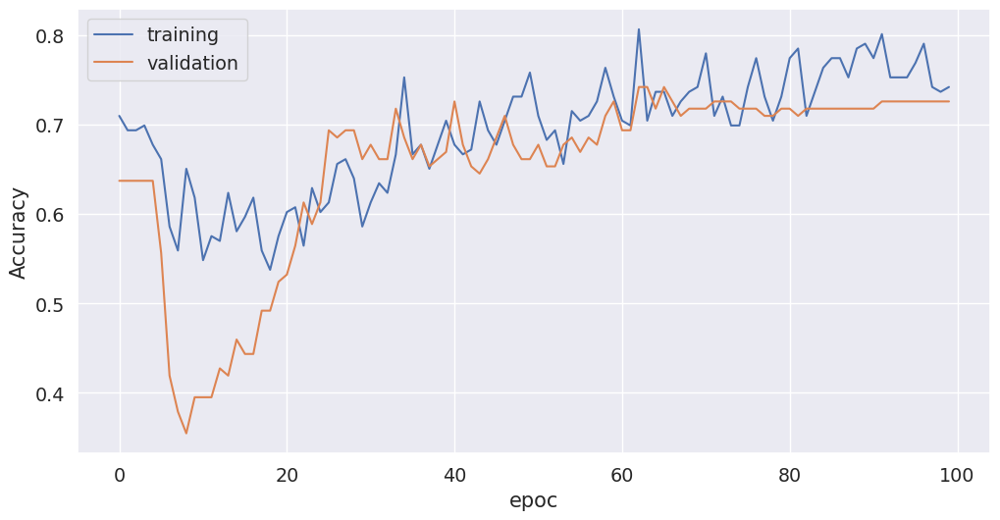

In [103]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Parece estar muy errático el aprendizaje, bajemos el parámetro de regularización y bajemos la tasa de aprendizaje

In [104]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))

In [105]:
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_41 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_42 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_43 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [106]:
history = model.fit(
    X_train.values, y_train, epochs=1000, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0142 - accuracy: 0.7812

186/186 [==============================] - 0s 623us/step - loss: 1.1349 - accuracy: 0.7043 - val_loss: 1.2830 - val_accuracy: 0.6452


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4932 - accuracy: 0.5312

186/186 [==============================] - 0s 61us/step - loss: 1.0379 - accuracy: 0.7043 - val_loss: 1.1786 - val_accuracy: 0.6452


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6780 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.9795 - accuracy: 0.6989 - val_loss: 1.0932 - val_accuracy: 0.6452


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9461 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.9343 - accuracy: 0.6935 - val_loss: 1.0231 - val_accuracy: 0.6452


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9959 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.8921 - accuracy: 0.6935 - val_loss: 0.9717 - val_accuracy: 0.6532


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9637 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.8557 - accuracy: 0.6935 - val_loss: 0.9320 - val_accuracy: 0.6532


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8754 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.8301 - accuracy: 0.6935 - val_loss: 0.9011 - val_accuracy: 0.6532


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7227 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.8084 - accuracy: 0.6989 - val_loss: 0.8761 - val_accuracy: 0.6532


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9656 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.7924 - accuracy: 0.7043 - val_loss: 0.8553 - val_accuracy: 0.6532


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7068 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.7775 - accuracy: 0.7043 - val_loss: 0.8344 - val_accuracy: 0.6532


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7254 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.7678 - accuracy: 0.7097 - val_loss: 0.8186 - val_accuracy: 0.6532


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9758 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.7564 - accuracy: 0.7151 - val_loss: 0.8040 - val_accuracy: 0.6532


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9731 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.7512 - accuracy: 0.7151 - val_loss: 0.7949 - val_accuracy: 0.6532


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6995 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.7478 - accuracy: 0.7151 - val_loss: 0.7879 - val_accuracy: 0.6532


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9031 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.7431 - accuracy: 0.7151 - val_loss: 0.7818 - val_accuracy: 0.6532


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9121 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.7401 - accuracy: 0.7151 - val_loss: 0.7764 - val_accuracy: 0.6532


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6967 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 0.7374 - accuracy: 0.7151 - val_loss: 0.7735 - val_accuracy: 0.6532


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7290 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.7356 - accuracy: 0.7151 - val_loss: 0.7691 - val_accuracy: 0.6532


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7385 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.7313 - accuracy: 0.7151 - val_loss: 0.7664 - val_accuracy: 0.6532


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6316 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.7317 - accuracy: 0.7151 - val_loss: 0.7657 - val_accuracy: 0.6532


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6855 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.7283 - accuracy: 0.7151 - val_loss: 0.7675 - val_accuracy: 0.6532


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7302 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.7262 - accuracy: 0.7151 - val_loss: 0.7650 - val_accuracy: 0.6532


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9273 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.7277 - accuracy: 0.7097 - val_loss: 0.7649 - val_accuracy: 0.6532


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6890 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.7225 - accuracy: 0.7151 - val_loss: 0.7652 - val_accuracy: 0.6532


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6210 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7233 - accuracy: 0.7151 - val_loss: 0.7629 - val_accuracy: 0.6532


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6405 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.7206 - accuracy: 0.7151 - val_loss: 0.7625 - val_accuracy: 0.6532


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6303 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.7203 - accuracy: 0.7151 - val_loss: 0.7644 - val_accuracy: 0.6532


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6847 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.7178 - accuracy: 0.7151 - val_loss: 0.7643 - val_accuracy: 0.6532


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6445 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.7151 - accuracy: 0.7151 - val_loss: 0.7643 - val_accuracy: 0.6532


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6786 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.7129 - accuracy: 0.7151 - val_loss: 0.7630 - val_accuracy: 0.6532


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6611 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.7144 - accuracy: 0.7151 - val_loss: 0.7639 - val_accuracy: 0.6532


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6778 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.7112 - accuracy: 0.7151 - val_loss: 0.7646 - val_accuracy: 0.6532


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8830 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.7105 - accuracy: 0.7151 - val_loss: 0.7625 - val_accuracy: 0.6532


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6518 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.7073 - accuracy: 0.7151 - val_loss: 0.7601 - val_accuracy: 0.6532


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6124 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.7065 - accuracy: 0.7151 - val_loss: 0.7622 - val_accuracy: 0.6532


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8512 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.7048 - accuracy: 0.7151 - val_loss: 0.7589 - val_accuracy: 0.6532


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7029 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.7031 - accuracy: 0.7151 - val_loss: 0.7605 - val_accuracy: 0.6532


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6386 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.7034 - accuracy: 0.7151 - val_loss: 0.7597 - val_accuracy: 0.6532


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6883 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.7008 - accuracy: 0.7151 - val_loss: 0.7612 - val_accuracy: 0.6532


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7942 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6993 - accuracy: 0.7151 - val_loss: 0.7580 - val_accuracy: 0.6532


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6873 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6983 - accuracy: 0.7151 - val_loss: 0.7598 - val_accuracy: 0.6532


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6671 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.6976 - accuracy: 0.7151 - val_loss: 0.7597 - val_accuracy: 0.6532


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6276 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.6951 - accuracy: 0.7151 - val_loss: 0.7594 - val_accuracy: 0.6532


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6981 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.6941 - accuracy: 0.7204 - val_loss: 0.7590 - val_accuracy: 0.6532


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6492 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6922 - accuracy: 0.7204 - val_loss: 0.7561 - val_accuracy: 0.6532


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7097 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6904 - accuracy: 0.7204 - val_loss: 0.7550 - val_accuracy: 0.6532


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8557 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6900 - accuracy: 0.7204 - val_loss: 0.7558 - val_accuracy: 0.6532


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6288 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6882 - accuracy: 0.7204 - val_loss: 0.7571 - val_accuracy: 0.6532


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6481 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.6876 - accuracy: 0.7204 - val_loss: 0.7585 - val_accuracy: 0.6452


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6856 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.6874 - accuracy: 0.7204 - val_loss: 0.7575 - val_accuracy: 0.6452


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6430 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6844 - accuracy: 0.7204 - val_loss: 0.7570 - val_accuracy: 0.6452


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6904 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6840 - accuracy: 0.7204 - val_loss: 0.7563 - val_accuracy: 0.6452


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6475 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6821 - accuracy: 0.7204 - val_loss: 0.7546 - val_accuracy: 0.6452


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6170 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6820 - accuracy: 0.7204 - val_loss: 0.7563 - val_accuracy: 0.6452


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6639 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.6798 - accuracy: 0.7204 - val_loss: 0.7589 - val_accuracy: 0.6452


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6292 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6793 - accuracy: 0.7204 - val_loss: 0.7545 - val_accuracy: 0.6452


Epoch 57/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7457 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.6770 - accuracy: 0.7204 - val_loss: 0.7544 - val_accuracy: 0.6452


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6546 - accuracy: 0.6562

186/186 [==============================] - 0s 58us/step - loss: 0.6765 - accuracy: 0.7204 - val_loss: 0.7556 - val_accuracy: 0.6452


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6226 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.6760 - accuracy: 0.7204 - val_loss: 0.7562 - val_accuracy: 0.6452


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6897 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.6765 - accuracy: 0.7204 - val_loss: 0.7566 - val_accuracy: 0.6452


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6309 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6731 - accuracy: 0.7204 - val_loss: 0.7544 - val_accuracy: 0.6452


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6664 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6719 - accuracy: 0.7204 - val_loss: 0.7556 - val_accuracy: 0.6452


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7938 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.6715 - accuracy: 0.7204 - val_loss: 0.7554 - val_accuracy: 0.6452


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6136 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.6706 - accuracy: 0.7204 - val_loss: 0.7506 - val_accuracy: 0.6452


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6199 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.6709 - accuracy: 0.7204 - val_loss: 0.7515 - val_accuracy: 0.6452


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7751 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6697 - accuracy: 0.7204 - val_loss: 0.7521 - val_accuracy: 0.6452


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6112 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.6696 - accuracy: 0.7204 - val_loss: 0.7541 - val_accuracy: 0.6452


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6232 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6665 - accuracy: 0.7204 - val_loss: 0.7549 - val_accuracy: 0.6452


Epoch 69/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6812 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.6670 - accuracy: 0.7204 - val_loss: 0.7554 - val_accuracy: 0.6452


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6666 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.6678 - accuracy: 0.7204 - val_loss: 0.7564 - val_accuracy: 0.6452


Epoch 71/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6121 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.6645 - accuracy: 0.7204 - val_loss: 0.7539 - val_accuracy: 0.6452


Epoch 72/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6812 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6634 - accuracy: 0.7204 - val_loss: 0.7556 - val_accuracy: 0.6452


Epoch 73/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6947 - accuracy: 0.5938



186/186 [==============================] - 0s 65us/step - loss: 0.6642 - accuracy: 0.7204 - val_loss: 0.7556 - val_accuracy: 0.6452


Epoch 74/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7584 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.6631 - accuracy: 0.7204 - val_loss: 0.7545 - val_accuracy: 0.6452


Epoch 75/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6549 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.6623 - accuracy: 0.7204 - val_loss: 0.7541 - val_accuracy: 0.6452


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6543 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.6604 - accuracy: 0.7204 - val_loss: 0.7566 - val_accuracy: 0.6452


Epoch 77/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6463 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.6611 - accuracy: 0.7204 - val_loss: 0.7573 - val_accuracy: 0.6452


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6936 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.6605 - accuracy: 0.7204 - val_loss: 0.7579 - val_accuracy: 0.6452


Epoch 79/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6679 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6601 - accuracy: 0.7204 - val_loss: 0.7538 - val_accuracy: 0.6452


Epoch 80/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6818 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6587 - accuracy: 0.7204 - val_loss: 0.7543 - val_accuracy: 0.6452


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5490 - accuracy: 0.7500

186/186 [==============================] - 0s 57us/step - loss: 0.6578 - accuracy: 0.7204 - val_loss: 0.7565 - val_accuracy: 0.6371


Epoch 82/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6484 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.6565 - accuracy: 0.7204 - val_loss: 0.7572 - val_accuracy: 0.6371


Epoch 83/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6545 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.6573 - accuracy: 0.7204 - val_loss: 0.7594 - val_accuracy: 0.6371


Epoch 84/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6216 - accuracy: 0.7500



186/186 [==============================] - 0s 61us/step - loss: 0.6559 - accuracy: 0.7204 - val_loss: 0.7616 - val_accuracy: 0.6371


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6370 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.6544 - accuracy: 0.7204 - val_loss: 0.7563 - val_accuracy: 0.6371


Epoch 86/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6110 - accuracy: 0.7812

186/186 [==============================]

 - 0s 69us/step - loss: 0.6552 - accuracy: 0.7204 - val_loss: 0.7576 - val_accuracy: 0.6371


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6352 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6547 - accuracy: 0.7204 - val_loss: 0.7561 - val_accuracy: 0.6371


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6748 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6539 - accuracy: 0.7204 - val_loss: 0.7580 - val_accuracy: 0.6371


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6270 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6532 - accuracy: 0.7204 - val_loss: 0.7611 - val_accuracy: 0.6371


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6266 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6522 - accuracy: 0.7204 - val_loss: 0.7591 - val_accuracy: 0.6371


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6972 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.6517 - accuracy: 0.7204 - val_loss: 0.7583 - val_accuracy: 0.6371


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6857 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.6511 - accuracy: 0.7204 - val_loss: 0.7604 - val_accuracy: 0.6371


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6088 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6503 - accuracy: 0.7204 - val_loss: 0.7579 - val_accuracy: 0.6371


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6952 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.6497 - accuracy: 0.7204 - val_loss: 0.7572 - val_accuracy: 0.6371


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6166 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.6509 - accuracy: 0.7204 - val_loss: 0.7567 - val_accuracy: 0.6371


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6390 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6480 - accuracy: 0.7312 - val_loss: 0.7592 - val_accuracy: 0.6371


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6899 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6478 - accuracy: 0.7258 - val_loss: 0.7629 - val_accuracy: 0.6371


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6546 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.6472 - accuracy: 0.7258 - val_loss: 0.7591 - val_accuracy: 0.6371


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6176 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6466 - accuracy: 0.7312 - val_loss: 0.7606 - val_accuracy: 0.6371


Epoch 100/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.6259 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6459 - accuracy: 0.7312 - val_loss: 0.7608 - val_accuracy: 0.6371


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6733 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6464 - accuracy: 0.7204 - val_loss: 0.7602 - val_accuracy: 0.6371


Epoch 102/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6194 - accuracy: 0.7188

186/186 [==============================] - 0s 111us/step - loss: 0.6453 - accuracy: 0.7258 - val_loss: 0.7618 - val_accuracy: 0.6371


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6455 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6451 - accuracy: 0.7312 - val_loss: 0.7608 - val_accuracy: 0.6371


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6649 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6437 - accuracy: 0.7258 - val_loss: 0.7608 - val_accuracy: 0.6371


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6398 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6440 - accuracy: 0.7258 - val_loss: 0.7632 - val_accuracy: 0.6371


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6053 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6425 - accuracy: 0.7312 - val_loss: 0.7614 - val_accuracy: 0.6290


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5969 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.6419 - accuracy: 0.7258 - val_loss: 0.7612 - val_accuracy: 0.6371


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6516 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.6416 - accuracy: 0.7312 - val_loss: 0.7600 - val_accuracy: 0.6371


Epoch 109/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6534 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.6416 - accuracy: 0.7258 - val_loss: 0.7591 - val_accuracy: 0.6371


Epoch 110/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6386 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6405 - accuracy: 0.7258 - val_loss: 0.7598 - val_accuracy: 0.6371


Epoch 111/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6299 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.6404 - accuracy: 0.7312 - val_loss: 0.7592 - val_accuracy: 0.6371


Epoch 112/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6535 - accuracy: 0.5938

186/186 [==============================] - 0s 63us/step - loss: 0.6399 - accuracy: 0.7258 - val_loss: 0.7602 - val_accuracy: 0.6290


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6511 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6400 - accuracy: 0.7258 - val_loss: 0.7580 - val_accuracy: 0.6371


Epoch 114/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6599 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6386 - accuracy: 0.7258 - val_loss: 0.7604 - val_accuracy: 0.6210


Epoch 115/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6361 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.6404 - accuracy: 0.7151 - val_loss: 0.7588 - val_accuracy: 0.6371


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6442 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.6375 - accuracy: 0.7312 - val_loss: 0.7607 - val_accuracy: 0.6371


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6666 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6385 - accuracy: 0.7312 - val_loss: 0.7602 - val_accuracy: 0.6290


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6159 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.6371 - accuracy: 0.7204 - val_loss: 0.7604 - val_accuracy: 0.6371


Epoch 119/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6128 - accuracy: 0.7500



186/186 [==============================] - 0s 69us/step - loss: 0.6385 - accuracy: 0.7312 - val_loss: 0.7597 - val_accuracy: 0.6371


Epoch 120/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6214 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.6359 - accuracy: 0.7312 - val_loss: 0.7592 - val_accuracy: 0.6290


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6996 - accuracy: 0.5938

186/186 [==============================] - 0s 57us/step - loss: 0.6361 - accuracy: 0.7312 - val_loss: 0.7609 - val_accuracy: 0.6290


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6208 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6388 - accuracy: 0.7204 - val_loss: 0.7615 - val_accuracy: 0.6290


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6451 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.6357 - accuracy: 0.7151 - val_loss: 0.7606 - val_accuracy: 0.6371


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6698 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6346 - accuracy: 0.7204 - val_loss: 0.7615 - val_accuracy: 0.6290


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6417 - accuracy: 0.5625

186/186 [==============================] - 0s 64us/step - loss: 0.6350 - accuracy: 0.7258 - val_loss: 0.7621 - val_accuracy: 0.6371


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6803 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.6342 - accuracy: 0.7258 - val_loss: 0.7622 - val_accuracy: 0.6371


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6533 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.6345 - accuracy: 0.7204 - val_loss: 0.7613 - val_accuracy: 0.6371


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6104 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.6337 - accuracy: 0.7258 - val_loss: 0.7627 - val_accuracy: 0.6371


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5719 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6329 - accuracy: 0.7312 - val_loss: 0.7624 - val_accuracy: 0.6371


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6521 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6324 - accuracy: 0.7312 - val_loss: 0.7604 - val_accuracy: 0.6371


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5476 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6319 - accuracy: 0.7312 - val_loss: 0.7578 - val_accuracy: 0.6371


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6315 - accuracy: 0.6562



186/186 [==============================] - 0s 63us/step - loss: 0.6321 - accuracy: 0.7312 - val_loss: 0.7577 - val_accuracy: 0.6371


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5692 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.6316 - accuracy: 0.7312 - val_loss: 0.7580 - val_accuracy: 0.6371


Epoch 134/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6146 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6311 - accuracy: 0.7258 - val_loss: 0.7584 - val_accuracy: 0.6290


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6211 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.6306 - accuracy: 0.7312 - val_loss: 0.7579 - val_accuracy: 0.6371


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6182 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.6305 - accuracy: 0.7258 - val_loss: 0.7568 - val_accuracy: 0.6371


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6356 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.6302 - accuracy: 0.7258 - val_loss: 0.7580 - val_accuracy: 0.6371


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6036 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.6289 - accuracy: 0.7312 - val_loss: 0.7579 - val_accuracy: 0.6371


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6118 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.6291 - accuracy: 0.7258 - val_loss: 0.7573 - val_accuracy: 0.6371


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6676 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6303 - accuracy: 0.7258 - val_loss: 0.7587 - val_accuracy: 0.6371


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6013 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.6295 - accuracy: 0.7258 - val_loss: 0.7596 - val_accuracy: 0.6371


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6810 - accuracy: 0.6562

186/186 [==============================] - 0s 56us/step - loss: 0.6277 - accuracy: 0.7258 - val_loss: 0.7586 - val_accuracy: 0.6371


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6511 - accuracy: 0.6875

186/186 [==============================] - 0s 55us/step - loss: 0.6279 - accuracy: 0.7312 - val_loss: 0.7577 - val_accuracy: 0.6371


Epoch 144/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6682 - accuracy: 0.6875

186/186 [==============================] - 0s 59us/step - loss: 0.6268 - accuracy: 0.7258 - val_loss: 0.7582 - val_accuracy: 0.6290


Epoch 145/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6877 - accuracy: 0.5625

186/186 [==============================] - 0s 58us/step - loss: 0.6283 - accuracy: 0.7258 - val_loss: 0.7589 - val_accuracy: 0.6290


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6772 - accuracy: 0.5312

186/186 [==============================] - 0s 57us/step - loss: 0.6266 - accuracy: 0.7204 - val_loss: 0.7581 - val_accuracy: 0.6371


Epoch 147/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6387 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.6264 - accuracy: 0.7258 - val_loss: 0.7588 - val_accuracy: 0.6371


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6069 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.6264 - accuracy: 0.7204 - val_loss: 0.7589 - val_accuracy: 0.6290


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6303 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.6270 - accuracy: 0.7312 - val_loss: 0.7575 - val_accuracy: 0.6371


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6526 - accuracy: 0.6250

186/186 [==============================] - 0s 61us/step - loss: 0.6255 - accuracy: 0.7258 - val_loss: 0.7584 - val_accuracy: 0.6371


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5966 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.6250 - accuracy: 0.7258 - val_loss: 0.7586 - val_accuracy: 0.6371


Epoch 152/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6263 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6248 - accuracy: 0.7258 - val_loss: 0.7580 - val_accuracy: 0.6371


Epoch 153/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6064 - accuracy: 0.6250

186/186 [==============================] - 0s 119us/step - loss: 0.6250 - accuracy: 0.7312 - val_loss: 0.7582 - val_accuracy: 0.6371


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6360 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.6249 - accuracy: 0.7258 - val_loss: 0.7590 - val_accuracy: 0.6371


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6474 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.6238 - accuracy: 0.7258 - val_loss: 0.7565 - val_accuracy: 0.6371


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6056 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.6244 - accuracy: 0.7258 - val_loss: 0.7561 - val_accuracy: 0.6371


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6346 - accuracy: 0.6562

186/186 [==============================] - 0s 58us/step - loss: 0.6231 - accuracy: 0.7258 - val_loss: 0.7566 - val_accuracy: 0.6371


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6493 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.6231 - accuracy: 0.7312 - val_loss: 0.7561 - val_accuracy: 0.6371


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6408 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.6234 - accuracy: 0.7312 - val_loss: 0.7566 - val_accuracy: 0.6371


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5992 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6227 - accuracy: 0.7312 - val_loss: 0.7554 - val_accuracy: 0.6371


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6461 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6220 - accuracy: 0.7312 - val_loss: 0.7574 - val_accuracy: 0.6371


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5450 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.6224 - accuracy: 0.7312 - val_loss: 0.7564 - val_accuracy: 0.6371


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6278 - accuracy: 0.6250

186/186 [==============================] - 0s 57us/step - loss: 0.6216 - accuracy: 0.7419 - val_loss: 0.7545 - val_accuracy: 0.6371


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5684 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.6212 - accuracy: 0.7204 - val_loss: 0.7546 - val_accuracy: 0.6371


Epoch 165/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6753 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6216 - accuracy: 0.7312 - val_loss: 0.7532 - val_accuracy: 0.6371


Epoch 166/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6501 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.6213 - accuracy: 0.7312 - val_loss: 0.7529 - val_accuracy: 0.6371


Epoch 167/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6460 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.6210 - accuracy: 0.7312 - val_loss: 0.7539 - val_accuracy: 0.6371


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6183 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6203 - accuracy: 0.7312 - val_loss: 0.7532 - val_accuracy: 0.6371


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5788 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.6209 - accuracy: 0.7258 - val_loss: 0.7534 - val_accuracy: 0.6371


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6775 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.6197 - accuracy: 0.7312 - val_loss: 0.7548 - val_accuracy: 0.6371


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5922 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.6197 - accuracy: 0.7366 - val_loss: 0.7522 - val_accuracy: 0.6371


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6092 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.6188 - accuracy: 0.7312 - val_loss: 0.7510 - val_accuracy: 0.6371


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6399 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.6197 - accuracy: 0.7258 - val_loss: 0.7523 - val_accuracy: 0.6371


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6771 - accuracy: 0.5625

186/186 [==============================] - 0s 60us/step - loss: 0.6191 - accuracy: 0.7312 - val_loss: 0.7519 - val_accuracy: 0.6371


Epoch 175/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5653 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.6193 - accuracy: 0.7312 - val_loss: 0.7528 - val_accuracy: 0.6371


Epoch 176/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6174 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.6185 - accuracy: 0.7312 - val_loss: 0.7544 - val_accuracy: 0.6371


Epoch 177/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6326 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.6179 - accuracy: 0.7312 - val_loss: 0.7545 - val_accuracy: 0.6371


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6332 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6180 - accuracy: 0.7419 - val_loss: 0.7523 - val_accuracy: 0.6371


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6070 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.6177 - accuracy: 0.7312 - val_loss: 0.7513 - val_accuracy: 0.6371


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6189 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.6173 - accuracy: 0.7312 - val_loss: 0.7519 - val_accuracy: 0.6371


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5662 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.6175 - accuracy: 0.7312 - val_loss: 0.7523 - val_accuracy: 0.6371


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6099 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6162 - accuracy: 0.7312 - val_loss: 0.7516 - val_accuracy: 0.6371


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5991 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6163 - accuracy: 0.7366 - val_loss: 0.7496 - val_accuracy: 0.6371


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6182 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6180 - accuracy: 0.7258 - val_loss: 0.7504 - val_accuracy: 0.6371


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5477 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.6177 - accuracy: 0.7312 - val_loss: 0.7500 - val_accuracy: 0.6371


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5801 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.6154 - accuracy: 0.7312 - val_loss: 0.7484 - val_accuracy: 0.6371


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6003 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6147 - accuracy: 0.7312 - val_loss: 0.7512 - val_accuracy: 0.6371


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6681 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6153 - accuracy: 0.7366 - val_loss: 0.7493 - val_accuracy: 0.6371


Epoch 189/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6803 - accuracy: 0.6562



186/186 [==============================] - 0s 73us/step - loss: 0.6153 - accuracy: 0.7312 - val_loss: 0.7500 - val_accuracy: 0.6371


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6554 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.6150 - accuracy: 0.7312 - val_loss: 0.7505 - val_accuracy: 0.6371


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5498 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6140 - accuracy: 0.7312 - val_loss: 0.7482 - val_accuracy: 0.6371


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6313 - accuracy: 0.5625

186/186 [==============================] - 0s 81us/step - loss: 0.6145 - accuracy: 0.7312 - val_loss: 0.7469 - val_accuracy: 0.6371


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6318 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.6146 - accuracy: 0.7312 - val_loss: 0.7449 - val_accuracy: 0.6371


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6611 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.6138 - accuracy: 0.7312 - val_loss: 0.7450 - val_accuracy: 0.6371


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6314 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.6120 - accuracy: 0.7366 - val_loss: 0.7439 - val_accuracy: 0.6371


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6257 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6119 - accuracy: 0.7366 - val_loss: 0.7433 - val_accuracy: 0.6371


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5852 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.6089 - accuracy: 0.7312 - val_loss: 0.7435 - val_accuracy: 0.6371


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5686 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.6086 - accuracy: 0.7312 - val_loss: 0.7447 - val_accuracy: 0.6371


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6284 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.6084 - accuracy: 0.7312 - val_loss: 0.7447 - val_accuracy: 0.6371


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5330 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.6070 - accuracy: 0.7312 - val_loss: 0.7441 - val_accuracy: 0.6371


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5658 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.6061 - accuracy: 0.7312 - val_loss: 0.7447 - val_accuracy: 0.6371


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6325 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.6049 - accuracy: 0.7312 - val_loss: 0.7440 - val_accuracy: 0.6371


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6420 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6028 - accuracy: 0.7312 - val_loss: 0.7405 - val_accuracy: 0.6371


Epoch 204/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5059 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.6018 - accuracy: 0.7312 - val_loss: 0.7408 - val_accuracy: 0.6371


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6343 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.6013 - accuracy: 0.7312 - val_loss: 0.7353 - val_accuracy: 0.6371


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5665 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.6007 - accuracy: 0.7312 - val_loss: 0.7336 - val_accuracy: 0.6371


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6691 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.6002 - accuracy: 0.7312 - val_loss: 0.7340 - val_accuracy: 0.6371


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5907 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.5977 - accuracy: 0.7366 - val_loss: 0.7348 - val_accuracy: 0.6371


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5928 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5969 - accuracy: 0.7312 - val_loss: 0.7355 - val_accuracy: 0.6371


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6038 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.5963 - accuracy: 0.7366 - val_loss: 0.7325 - val_accuracy: 0.6371


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5880 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.5958 - accuracy: 0.7312 - val_loss: 0.7344 - val_accuracy: 0.6371


Epoch 212/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6518 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.5952 - accuracy: 0.7366 - val_loss: 0.7308 - val_accuracy: 0.6371


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5965 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5948 - accuracy: 0.7312 - val_loss: 0.7345 - val_accuracy: 0.6371


Epoch 214/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6592 - accuracy: 0.5625

186/186 [==============================] - 0s 70us/step - loss: 0.5940 - accuracy: 0.7312 - val_loss: 0.7325 - val_accuracy: 0.6371


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5545 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.5939 - accuracy: 0.7312 - val_loss: 0.7324 - val_accuracy: 0.6371


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5632 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5928 - accuracy: 0.7366 - val_loss: 0.7313 - val_accuracy: 0.6371


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6183 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.5918 - accuracy: 0.7366 - val_loss: 0.7305 - val_accuracy: 0.6371


Epoch 218/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6224 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.5912 - accuracy: 0.7312 - val_loss: 0.7276 - val_accuracy: 0.6371


Epoch 219/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5175 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.5891 - accuracy: 0.7312 - val_loss: 0.7284 - val_accuracy: 0.6371


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6465 - accuracy: 0.6875

186/186 [==============================] - 0s 59us/step - loss: 0.5907 - accuracy: 0.7366 - val_loss: 0.7295 - val_accuracy: 0.6371


Epoch 221/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6448 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 0.5885 - accuracy: 0.7312 - val_loss: 0.7281 - val_accuracy: 0.6371


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5860 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.5879 - accuracy: 0.7366 - val_loss: 0.7287 - val_accuracy: 0.6371


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6002 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.5884 - accuracy: 0.7312 - val_loss: 0.7278 - val_accuracy: 0.6371


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5426 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5869 - accuracy: 0.7312 - val_loss: 0.7266 - val_accuracy: 0.6371


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5920 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5872 - accuracy: 0.7366 - val_loss: 0.7285 - val_accuracy: 0.6371


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6115 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.5861 - accuracy: 0.7312 - val_loss: 0.7275 - val_accuracy: 0.6371


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5777 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5859 - accuracy: 0.7366 - val_loss: 0.7255 - val_accuracy: 0.6371


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5828 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.5857 - accuracy: 0.7312 - val_loss: 0.7269 - val_accuracy: 0.6371


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5184 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5841 - accuracy: 0.7366 - val_loss: 0.7284 - val_accuracy: 0.6371


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5719 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5845 - accuracy: 0.7366 - val_loss: 0.7259 - val_accuracy: 0.6371


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6142 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.5822 - accuracy: 0.7312 - val_loss: 0.7257 - val_accuracy: 0.6371


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5760 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5827 - accuracy: 0.7366 - val_loss: 0.7244 - val_accuracy: 0.6371


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6071 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5831 - accuracy: 0.7366 - val_loss: 0.7243 - val_accuracy: 0.6371


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5709 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.5814 - accuracy: 0.7419 - val_loss: 0.7233 - val_accuracy: 0.6371


Epoch 235/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5770 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.5800 - accuracy: 0.7366 - val_loss: 0.7213 - val_accuracy: 0.6371


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5558 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.5795 - accuracy: 0.7366 - val_loss: 0.7196 - val_accuracy: 0.6371


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6273 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5787 - accuracy: 0.7312 - val_loss: 0.7210 - val_accuracy: 0.6371


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6035 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.5782 - accuracy: 0.7312 - val_loss: 0.7183 - val_accuracy: 0.6371


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6169 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.5762 - accuracy: 0.7366 - val_loss: 0.7176 - val_accuracy: 0.6371


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5661 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.5746 - accuracy: 0.7419 - val_loss: 0.7148 - val_accuracy: 0.6371


Epoch 241/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5847 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5735 - accuracy: 0.7419 - val_loss: 0.7067 - val_accuracy: 0.6371


Epoch 242/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5933 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.5717 - accuracy: 0.7312 - val_loss: 0.7056 - val_accuracy: 0.6371


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5277 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.5686 - accuracy: 0.7312 - val_loss: 0.7051 - val_accuracy: 0.6371


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6441 - accuracy: 0.5938

186/186 [==============================] - 0s 63us/step - loss: 0.5668 - accuracy: 0.7312 - val_loss: 0.7027 - val_accuracy: 0.6371


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6747 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5635 - accuracy: 0.7312 - val_loss: 0.6986 - val_accuracy: 0.6371


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5670 - accuracy: 0.5625

186/186 [==============================] - 0s 66us/step - loss: 0.5615 - accuracy: 0.7312 - val_loss: 0.6981 - val_accuracy: 0.6371


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4415 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.5594 - accuracy: 0.7366 - val_loss: 0.6983 - val_accuracy: 0.6371


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5746 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5574 - accuracy: 0.7312 - val_loss: 0.6969 - val_accuracy: 0.6371


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5312 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.5550 - accuracy: 0.7419 - val_loss: 0.6937 - val_accuracy: 0.6371


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5118 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5528 - accuracy: 0.7419 - val_loss: 0.6904 - val_accuracy: 0.6371


Epoch 251/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5629 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5544 - accuracy: 0.7258 - val_loss: 0.6914 - val_accuracy: 0.6371


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5413 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.5488 - accuracy: 0.7419 - val_loss: 0.6886 - val_accuracy: 0.6371


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4973 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5470 - accuracy: 0.7366 - val_loss: 0.6905 - val_accuracy: 0.6371


Epoch 254/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6491 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5458 - accuracy: 0.7366 - val_loss: 0.6875 - val_accuracy: 0.6371


Epoch 255/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5445 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5456 - accuracy: 0.7312 - val_loss: 0.6822 - val_accuracy: 0.6371


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5051 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.5423 - accuracy: 0.7419 - val_loss: 0.6766 - val_accuracy: 0.6371


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5113 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.5415 - accuracy: 0.7312 - val_loss: 0.6756 - val_accuracy: 0.6371


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5394 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5388 - accuracy: 0.7419 - val_loss: 0.6739 - val_accuracy: 0.6452


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4762 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.5381 - accuracy: 0.7366 - val_loss: 0.6733 - val_accuracy: 0.6371


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4542 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.5374 - accuracy: 0.7312 - val_loss: 0.6699 - val_accuracy: 0.6371


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5254 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.5350 - accuracy: 0.7366 - val_loss: 0.6659 - val_accuracy: 0.6371


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5565 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.5341 - accuracy: 0.7312 - val_loss: 0.6684 - val_accuracy: 0.6371


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4594 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5317 - accuracy: 0.7312 - val_loss: 0.6679 - val_accuracy: 0.6371


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6028 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.5315 - accuracy: 0.7312 - val_loss: 0.6694 - val_accuracy: 0.6371


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5124 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5303 - accuracy: 0.7366 - val_loss: 0.6648 - val_accuracy: 0.6371


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6117 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.5287 - accuracy: 0.7312 - val_loss: 0.6676 - val_accuracy: 0.6371


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5408 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5279 - accuracy: 0.7366 - val_loss: 0.6627 - val_accuracy: 0.6452


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6072 - accuracy: 0.5625

186/186 [==============================] - 0s 67us/step - loss: 0.5283 - accuracy: 0.7366 - val_loss: 0.6603 - val_accuracy: 0.6452


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4312 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5271 - accuracy: 0.7312 - val_loss: 0.6623 - val_accuracy: 0.6371


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5265 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.5255 - accuracy: 0.7366 - val_loss: 0.6606 - val_accuracy: 0.6452


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5419 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5247 - accuracy: 0.7258 - val_loss: 0.6632 - val_accuracy: 0.6371


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4249 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.5225 - accuracy: 0.7419 - val_loss: 0.6582 - val_accuracy: 0.6452


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5182 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5216 - accuracy: 0.7419 - val_loss: 0.6576 - val_accuracy: 0.6371


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6476 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5220 - accuracy: 0.7366 - val_loss: 0.6530 - val_accuracy: 0.6371


Epoch 275/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4466 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5189 - accuracy: 0.7258 - val_loss: 0.6585 - val_accuracy: 0.6371


Epoch 276/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5154 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.5188 - accuracy: 0.7419 - val_loss: 0.6534 - val_accuracy: 0.6371


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4628 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5177 - accuracy: 0.7366 - val_loss: 0.6535 - val_accuracy: 0.6371


Epoch 278/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5016 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.5174 - accuracy: 0.7366 - val_loss: 0.6539 - val_accuracy: 0.6371


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5203 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5154 - accuracy: 0.7312 - val_loss: 0.6519 - val_accuracy: 0.6371


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4767 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5146 - accuracy: 0.7312 - val_loss: 0.6531 - val_accuracy: 0.6371


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5812 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.5134 - accuracy: 0.7419 - val_loss: 0.6455 - val_accuracy: 0.6452


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4350 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5128 - accuracy: 0.7312 - val_loss: 0.6460 - val_accuracy: 0.6371


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.5117 - accuracy: 0.7366 - val_loss: 0.6470 - val_accuracy: 0.6371


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4660 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.5098 - accuracy: 0.7312 - val_loss: 0.6420 - val_accuracy: 0.6371


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5261 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.5096 - accuracy: 0.7366 - val_loss: 0.6430 - val_accuracy: 0.6371


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4964 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.5080 - accuracy: 0.7312 - val_loss: 0.6457 - val_accuracy: 0.6371


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6041 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5077 - accuracy: 0.7312 - val_loss: 0.6463 - val_accuracy: 0.6371


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5078 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.5071 - accuracy: 0.7312 - val_loss: 0.6440 - val_accuracy: 0.6371


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5578 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.5056 - accuracy: 0.7366 - val_loss: 0.6399 - val_accuracy: 0.6371


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5859 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5032 - accuracy: 0.7366 - val_loss: 0.6346 - val_accuracy: 0.6371


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5300 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.5028 - accuracy: 0.7258 - val_loss: 0.6352 - val_accuracy: 0.6452


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4120 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.5016 - accuracy: 0.7312 - val_loss: 0.6402 - val_accuracy: 0.6371


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5263 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.4981 - accuracy: 0.7312 - val_loss: 0.6355 - val_accuracy: 0.6371


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4529 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4975 - accuracy: 0.7366 - val_loss: 0.6361 - val_accuracy: 0.6371


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5420 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4939 - accuracy: 0.7312 - val_loss: 0.6358 - val_accuracy: 0.6371


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5532 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.4922 - accuracy: 0.7312 - val_loss: 0.6325 - val_accuracy: 0.6452


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4518 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4899 - accuracy: 0.7312 - val_loss: 0.6310 - val_accuracy: 0.6452


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4884 - accuracy: 0.7258 - val_loss: 0.6328 - val_accuracy: 0.6371


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4481 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4869 - accuracy: 0.7366 - val_loss: 0.6284 - val_accuracy: 0.6452


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5448 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.4871 - accuracy: 0.7312 - val_loss: 0.6294 - val_accuracy: 0.6452


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5662 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4841 - accuracy: 0.7258 - val_loss: 0.6317 - val_accuracy: 0.6371


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4823 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.4819 - accuracy: 0.7366 - val_loss: 0.6314 - val_accuracy: 0.6371


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4652 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4819 - accuracy: 0.7366 - val_loss: 0.6275 - val_accuracy: 0.6371


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4796 - accuracy: 0.7366 - val_loss: 0.6265 - val_accuracy: 0.6371


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5912 - accuracy: 0.5938

186/186 [==============================] - 0s 67us/step - loss: 0.4776 - accuracy: 0.7312 - val_loss: 0.6235 - val_accuracy: 0.6371


Epoch 306/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4901 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4775 - accuracy: 0.7366 - val_loss: 0.6199 - val_accuracy: 0.6452


Epoch 307/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3998 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4753 - accuracy: 0.7312 - val_loss: 0.6208 - val_accuracy: 0.6452


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4730 - accuracy: 0.7366 - val_loss: 0.6204 - val_accuracy: 0.6452


Epoch 309/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5596 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.4726 - accuracy: 0.7366 - val_loss: 0.6161 - val_accuracy: 0.6452


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5266 - accuracy: 0.5625

186/186 [==============================] - 0s 67us/step - loss: 0.4707 - accuracy: 0.7312 - val_loss: 0.6170 - val_accuracy: 0.6452


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3961 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4697 - accuracy: 0.7366 - val_loss: 0.6147 - val_accuracy: 0.6452


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5438 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4692 - accuracy: 0.7204 - val_loss: 0.6164 - val_accuracy: 0.6452


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5518 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4666 - accuracy: 0.7312 - val_loss: 0.6194 - val_accuracy: 0.6371


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4563 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.4651 - accuracy: 0.7366 - val_loss: 0.6159 - val_accuracy: 0.6452


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4995 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.4639 - accuracy: 0.7258 - val_loss: 0.6165 - val_accuracy: 0.6452


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5426 - accuracy: 0.5938

186/186 [==============================]

 - 0s 67us/step - loss: 0.4624 - accuracy: 0.7258 - val_loss: 0.6195 - val_accuracy: 0.6452


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4624 - accuracy: 0.7312 - val_loss: 0.6210 - val_accuracy: 0.6371


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4361 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4581 - accuracy: 0.7366 - val_loss: 0.6187 - val_accuracy: 0.6452


Epoch 319/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5113 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4595 - accuracy: 0.7258 - val_loss: 0.6202 - val_accuracy: 0.6452


Epoch 320/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4337 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4578 - accuracy: 0.7258 - val_loss: 0.6185 - val_accuracy: 0.6452


Epoch 321/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.7812



186/186 [==============================] - 0s 68us/step - loss: 0.4544 - accuracy: 0.7366 - val_loss: 0.6170 - val_accuracy: 0.6452


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4254 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4541 - accuracy: 0.7366 - val_loss: 0.6179 - val_accuracy: 0.6371


Epoch 323/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.4511 - accuracy: 0.7366 - val_loss: 0.6133 - val_accuracy: 0.6452


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4509 - accuracy: 0.7366 - val_loss: 0.6115 - val_accuracy: 0.6452


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4303 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.4487 - accuracy: 0.7312 - val_loss: 0.6119 - val_accuracy: 0.6452


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4520 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4480 - accuracy: 0.7258 - val_loss: 0.6153 - val_accuracy: 0.6371


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5100 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.4465 - accuracy: 0.7312 - val_loss: 0.6100 - val_accuracy: 0.6371


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5439 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.4432 - accuracy: 0.7366 - val_loss: 0.6053 - val_accuracy: 0.6452


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3839 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.4422 - accuracy: 0.7312 - val_loss: 0.6085 - val_accuracy: 0.6371


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5149 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.4418 - accuracy: 0.7366 - val_loss: 0.6074 - val_accuracy: 0.6371


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4789 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4397 - accuracy: 0.7366 - val_loss: 0.6024 - val_accuracy: 0.6371


Epoch 332/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4762 - accuracy: 0.6250

186/186 [==============================] - 0s 56us/step - loss: 0.4372 - accuracy: 0.7312 - val_loss: 0.6032 - val_accuracy: 0.6452


Epoch 333/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4789 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4362 - accuracy: 0.7366 - val_loss: 0.5996 - val_accuracy: 0.6452


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5618 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.4335 - accuracy: 0.7312 - val_loss: 0.6022 - val_accuracy: 0.6452


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4639 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.4326 - accuracy: 0.7312 - val_loss: 0.6017 - val_accuracy: 0.6371


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4719 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.4309 - accuracy: 0.7366 - val_loss: 0.5985 - val_accuracy: 0.6371


Epoch 337/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3850 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4282 - accuracy: 0.7366 - val_loss: 0.5949 - val_accuracy: 0.6452


Epoch 338/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5449 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.4268 - accuracy: 0.7366 - val_loss: 0.5947 - val_accuracy: 0.6371


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4589 - accuracy: 0.6562

186/186 [==============================] - 0s 57us/step - loss: 0.4265 - accuracy: 0.7312 - val_loss: 0.5931 - val_accuracy: 0.6452


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.4259 - accuracy: 0.7312 - val_loss: 0.5935 - val_accuracy: 0.6452


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4713 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4243 - accuracy: 0.7258 - val_loss: 0.5937 - val_accuracy: 0.6452


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4700 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.4221 - accuracy: 0.7366 - val_loss: 0.5940 - val_accuracy: 0.6371


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2177 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.4206 - accuracy: 0.7366 - val_loss: 0.5963 - val_accuracy: 0.6371


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4510 - accuracy: 0.7812

186/186 [==============================] - 0s 87us/step - loss: 0.4194 - accuracy: 0.7366 - val_loss: 0.5923 - val_accuracy: 0.6452


Epoch 345/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3242 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4210 - accuracy: 0.7258 - val_loss: 0.5952 - val_accuracy: 0.6371


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.7812

186/186 [==============================] - 0s 95us/step - loss: 0.4198 - accuracy: 0.7366 - val_loss: 0.5964 - val_accuracy: 0.6371


Epoch 347/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4175 - accuracy: 0.7312 - val_loss: 0.5924 - val_accuracy: 0.6371


Epoch 348/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.4166 - accuracy: 0.7312 - val_loss: 0.5931 - val_accuracy: 0.6371


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4558 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.4156 - accuracy: 0.7366 - val_loss: 0.5922 - val_accuracy: 0.6371


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.4153 - accuracy: 0.7366 - val_loss: 0.5949 - val_accuracy: 0.6371


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4339 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.4132 - accuracy: 0.7312 - val_loss: 0.5904 - val_accuracy: 0.6452


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4293 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.4132 - accuracy: 0.7366 - val_loss: 0.5885 - val_accuracy: 0.6452


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4115 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4122 - accuracy: 0.7366 - val_loss: 0.5880 - val_accuracy: 0.6452


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4288 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4113 - accuracy: 0.7312 - val_loss: 0.5860 - val_accuracy: 0.6452


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4476 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4095 - accuracy: 0.7366 - val_loss: 0.5900 - val_accuracy: 0.6371


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.7500

186/186 [==============================] - 0s 102us/step - loss: 0.4096 - accuracy: 0.7312 - val_loss: 0.5870 - val_accuracy: 0.6452


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4084 - accuracy: 0.7312 - val_loss: 0.5891 - val_accuracy: 0.6371


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4744 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4071 - accuracy: 0.7312 - val_loss: 0.5899 - val_accuracy: 0.6371


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4225 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.4065 - accuracy: 0.7312 - val_loss: 0.5893 - val_accuracy: 0.6452


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3577 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4062 - accuracy: 0.7366 - val_loss: 0.5863 - val_accuracy: 0.6452


Epoch 361/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3821 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4055 - accuracy: 0.7312 - val_loss: 0.5891 - val_accuracy: 0.6371


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5552 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4051 - accuracy: 0.7312 - val_loss: 0.5862 - val_accuracy: 0.6452


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.4042 - accuracy: 0.7366 - val_loss: 0.5848 - val_accuracy: 0.6452


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4021 - accuracy: 0.7366 - val_loss: 0.5845 - val_accuracy: 0.6371


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4719 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4018 - accuracy: 0.7366 - val_loss: 0.5821 - val_accuracy: 0.6452


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5362 - accuracy: 0.6250

186/186 [==============================] - 0s 81us/step - loss: 0.4020 - accuracy: 0.7312 - val_loss: 0.5825 - val_accuracy: 0.6452


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4572 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.4009 - accuracy: 0.7366 - val_loss: 0.5816 - val_accuracy: 0.6452


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4420 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4010 - accuracy: 0.7312 - val_loss: 0.5820 - val_accuracy: 0.6452


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4006 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3992 - accuracy: 0.7312 - val_loss: 0.5872 - val_accuracy: 0.6371


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4009 - accuracy: 0.7312 - val_loss: 0.5845 - val_accuracy: 0.6371


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3690 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3975 - accuracy: 0.7366 - val_loss: 0.5818 - val_accuracy: 0.6452


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3637 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3983 - accuracy: 0.7366 - val_loss: 0.5845 - val_accuracy: 0.6371


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4366 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3975 - accuracy: 0.7366 - val_loss: 0.5801 - val_accuracy: 0.6452


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4223 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.3962 - accuracy: 0.7366 - val_loss: 0.5830 - val_accuracy: 0.6371


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4410 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3963 - accuracy: 0.7312 - val_loss: 0.5815 - val_accuracy: 0.6371


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3787 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3951 - accuracy: 0.7366 - val_loss: 0.5794 - val_accuracy: 0.6452


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3552 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3968 - accuracy: 0.7366 - val_loss: 0.5811 - val_accuracy: 0.6371


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3809 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3934 - accuracy: 0.7312 - val_loss: 0.5786 - val_accuracy: 0.6452


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4068 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3939 - accuracy: 0.7312 - val_loss: 0.5786 - val_accuracy: 0.6452


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4730 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3928 - accuracy: 0.7312 - val_loss: 0.5800 - val_accuracy: 0.6452


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3911 - accuracy: 0.7312 - val_loss: 0.5832 - val_accuracy: 0.6371


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3455 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3912 - accuracy: 0.7366 - val_loss: 0.5799 - val_accuracy: 0.6452


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3909 - accuracy: 0.7312 - val_loss: 0.5815 - val_accuracy: 0.6452


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3892 - accuracy: 0.7366 - val_loss: 0.5788 - val_accuracy: 0.6452


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3835 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.3884 - accuracy: 0.7366 - val_loss: 0.5830 - val_accuracy: 0.6371


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2920 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3879 - accuracy: 0.7366 - val_loss: 0.5779 - val_accuracy: 0.6452


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3743 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3872 - accuracy: 0.7258 - val_loss: 0.5814 - val_accuracy: 0.6452


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3939 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.3883 - accuracy: 0.7258 - val_loss: 0.5821 - val_accuracy: 0.6452


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3856 - accuracy: 0.7366 - val_loss: 0.5811 - val_accuracy: 0.6371


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3517 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.3839 - accuracy: 0.7366 - val_loss: 0.5818 - val_accuracy: 0.6371


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3892 - accuracy: 0.7188

186/186 [==============================] - 0s 82us/step - loss: 0.3845 - accuracy: 0.7366 - val_loss: 0.5800 - val_accuracy: 0.6452


Epoch 392/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3554 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.3834 - accuracy: 0.7366 - val_loss: 0.5824 - val_accuracy: 0.6371


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3831 - accuracy: 0.7366 - val_loss: 0.5774 - val_accuracy: 0.6452


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3826 - accuracy: 0.7366 - val_loss: 0.5770 - val_accuracy: 0.6452


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3807 - accuracy: 0.7312 - val_loss: 0.5730 - val_accuracy: 0.6452


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3997 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3808 - accuracy: 0.7312 - val_loss: 0.5737 - val_accuracy: 0.6371


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3882 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3784 - accuracy: 0.7366 - val_loss: 0.5684 - val_accuracy: 0.6452


Epoch 398/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4996 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.3803 - accuracy: 0.7258 - val_loss: 0.5697 - val_accuracy: 0.6452


Epoch 399/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3665 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3796 - accuracy: 0.7366 - val_loss: 0.5699 - val_accuracy: 0.6452


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3442 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3773 - accuracy: 0.7366 - val_loss: 0.5726 - val_accuracy: 0.6371


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3019 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3769 - accuracy: 0.7366 - val_loss: 0.5706 - val_accuracy: 0.6452


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3866 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3762 - accuracy: 0.7366 - val_loss: 0.5735 - val_accuracy: 0.6371


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3755 - accuracy: 0.7312 - val_loss: 0.5714 - val_accuracy: 0.6452


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2872 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3737 - accuracy: 0.7366 - val_loss: 0.5683 - val_accuracy: 0.6452


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4564 - accuracy: 0.6250

186/186 [==============================] - 0s 61us/step - loss: 0.3745 - accuracy: 0.7366 - val_loss: 0.5695 - val_accuracy: 0.6452


Epoch 406/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3750 - accuracy: 0.7258 - val_loss: 0.5704 - val_accuracy: 0.6371


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.3731 - accuracy: 0.7312 - val_loss: 0.5687 - val_accuracy: 0.6452


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3543 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3721 - accuracy: 0.7366 - val_loss: 0.5647 - val_accuracy: 0.6452


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3952 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.3716 - accuracy: 0.7312 - val_loss: 0.5670 - val_accuracy: 0.6452


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3715 - accuracy: 0.7312 - val_loss: 0.5660 - val_accuracy: 0.6452


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3712 - accuracy: 0.7312 - val_loss: 0.5692 - val_accuracy: 0.6452


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4113 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3694 - accuracy: 0.7366 - val_loss: 0.5675 - val_accuracy: 0.6452


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3336 - accuracy: 0.7812

186/186 [==============================]

 - 0s 65us/step - loss: 0.3701 - accuracy: 0.7366 - val_loss: 0.5692 - val_accuracy: 0.6452


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4357 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3677 - accuracy: 0.7366 - val_loss: 0.5704 - val_accuracy: 0.6452


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3592 - accuracy: 0.7188

186/186 [==============================] - 0s 57us/step - loss: 0.3696 - accuracy: 0.7366 - val_loss: 0.5682 - val_accuracy: 0.6452


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3672 - accuracy: 0.7366 - val_loss: 0.5692 - val_accuracy: 0.6452


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3835 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3672 - accuracy: 0.7312 - val_loss: 0.5721 - val_accuracy: 0.6371


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3284 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3661 - accuracy: 0.7366 - val_loss: 0.5648 - val_accuracy: 0.6452


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1755 - accuracy: 0.9375

186/186 [==============================] - 0s 87us/step - loss: 0.3667 - accuracy: 0.7366 - val_loss: 0.5639 - val_accuracy: 0.6452


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3968 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3658 - accuracy: 0.7312 - val_loss: 0.5658 - val_accuracy: 0.6452


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5471 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3658 - accuracy: 0.7366 - val_loss: 0.5653 - val_accuracy: 0.6452


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.3660 - accuracy: 0.7366 - val_loss: 0.5667 - val_accuracy: 0.6452


Epoch 423/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3653 - accuracy: 0.7312 - val_loss: 0.5630 - val_accuracy: 0.6452


Epoch 424/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3798 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3647 - accuracy: 0.7366 - val_loss: 0.5636 - val_accuracy: 0.6452


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4511 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3635 - accuracy: 0.7312 - val_loss: 0.5650 - val_accuracy: 0.6452


Epoch 426/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2830 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3639 - accuracy: 0.7366 - val_loss: 0.5623 - val_accuracy: 0.6452


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3624 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3637 - accuracy: 0.7312 - val_loss: 0.5690 - val_accuracy: 0.6371


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5101 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.3630 - accuracy: 0.7312 - val_loss: 0.5648 - val_accuracy: 0.6371


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4742 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.3636 - accuracy: 0.7366 - val_loss: 0.5632 - val_accuracy: 0.6371


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3779 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3630 - accuracy: 0.7366 - val_loss: 0.5606 - val_accuracy: 0.6452


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3796 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3611 - accuracy: 0.7366 - val_loss: 0.5628 - val_accuracy: 0.6452


Epoch 432/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3167 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3611 - accuracy: 0.7366 - val_loss: 0.5662 - val_accuracy: 0.6371


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3130 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3607 - accuracy: 0.7366 - val_loss: 0.5618 - val_accuracy: 0.6452


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3610 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3596 - accuracy: 0.7366 - val_loss: 0.5634 - val_accuracy: 0.6452


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4601 - accuracy: 0.5938

186/186 [==============================] - 0s 67us/step - loss: 0.3615 - accuracy: 0.7366 - val_loss: 0.5665 - val_accuracy: 0.6371


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4160 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3600 - accuracy: 0.7366 - val_loss: 0.5612 - val_accuracy: 0.6452


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2862 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3603 - accuracy: 0.7366 - val_loss: 0.5601 - val_accuracy: 0.6452


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2918 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3592 - accuracy: 0.7312 - val_loss: 0.5608 - val_accuracy: 0.6452


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3898 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.3594 - accuracy: 0.7366 - val_loss: 0.5597 - val_accuracy: 0.6452


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3602 - accuracy: 0.7312 - val_loss: 0.5600 - val_accuracy: 0.6452


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2707 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3584 - accuracy: 0.7366 - val_loss: 0.5631 - val_accuracy: 0.6452


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.7188

186/186 [==============================]

 - 0s 67us/step - loss: 0.3587 - accuracy: 0.7366 - val_loss: 0.5622 - val_accuracy: 0.6452


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3577 - accuracy: 0.7366 - val_loss: 0.5636 - val_accuracy: 0.6371


Epoch 444/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3580 - accuracy: 0.7366 - val_loss: 0.5626 - val_accuracy: 0.6371


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3197 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3578 - accuracy: 0.7312 - val_loss: 0.5631 - val_accuracy: 0.6371


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3333 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3578 - accuracy: 0.7366 - val_loss: 0.5600 - val_accuracy: 0.6452


Epoch 447/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3581 - accuracy: 0.7366 - val_loss: 0.5621 - val_accuracy: 0.6371


Epoch 448/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3570 - accuracy: 0.7312 - val_loss: 0.5583 - val_accuracy: 0.6452


Epoch 449/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3439 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3573 - accuracy: 0.7366 - val_loss: 0.5597 - val_accuracy: 0.6371


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4050 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.3567 - accuracy: 0.7312 - val_loss: 0.5558 - val_accuracy: 0.6452


Epoch 451/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3989 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3563 - accuracy: 0.7366 - val_loss: 0.5582 - val_accuracy: 0.6371


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4428 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.3555 - accuracy: 0.7366 - val_loss: 0.5578 - val_accuracy: 0.6452


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2534 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3564 - accuracy: 0.7312 - val_loss: 0.5566 - val_accuracy: 0.6452


Epoch 454/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3417 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3548 - accuracy: 0.7366 - val_loss: 0.5582 - val_accuracy: 0.6452


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4825 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3557 - accuracy: 0.7312 - val_loss: 0.5616 - val_accuracy: 0.6371


Epoch 456/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.6875

186/186 [==============================] - 0s 102us/step - loss: 0.3553 - accuracy: 0.7312 - val_loss: 0.5573 - val_accuracy: 0.6452


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3545 - accuracy: 0.7312 - val_loss: 0.5572 - val_accuracy: 0.6371


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3546 - accuracy: 0.7366 - val_loss: 0.5555 - val_accuracy: 0.6452


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3558 - accuracy: 0.7366 - val_loss: 0.5540 - val_accuracy: 0.6452


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3551 - accuracy: 0.7366 - val_loss: 0.5560 - val_accuracy: 0.6452


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3248 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3538 - accuracy: 0.7366 - val_loss: 0.5539 - val_accuracy: 0.6452


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3531 - accuracy: 0.7366 - val_loss: 0.5549 - val_accuracy: 0.6452


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3540 - accuracy: 0.7312 - val_loss: 0.5540 - val_accuracy: 0.6452


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3490 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3530 - accuracy: 0.7312 - val_loss: 0.5568 - val_accuracy: 0.6452


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.3541 - accuracy: 0.7312 - val_loss: 0.5569 - val_accuracy: 0.6452


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3958 - accuracy: 0.7500



186/186 [==============================] - 0s 61us/step - loss: 0.3533 - accuracy: 0.7366 - val_loss: 0.5581 - val_accuracy: 0.6371


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4340 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3526 - accuracy: 0.7366 - val_loss: 0.5587 - val_accuracy: 0.6371


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3327 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3523 - accuracy: 0.7366 - val_loss: 0.5580 - val_accuracy: 0.6371


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3834 - accuracy: 0.6875

186/186 [==============================] - 0s 58us/step - loss: 0.3524 - accuracy: 0.7312 - val_loss: 0.5579 - val_accuracy: 0.6371


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.3523 - accuracy: 0.7366 - val_loss: 0.5553 - val_accuracy: 0.6452


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3355 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3515 - accuracy: 0.7366 - val_loss: 0.5548 - val_accuracy: 0.6452


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4840 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3515 - accuracy: 0.7366 - val_loss: 0.5509 - val_accuracy: 0.6452


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4546 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3522 - accuracy: 0.7366 - val_loss: 0.5566 - val_accuracy: 0.6371


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2981 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3513 - accuracy: 0.7366 - val_loss: 0.5537 - val_accuracy: 0.6452


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3996 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.3548 - accuracy: 0.7151 - val_loss: 0.5569 - val_accuracy: 0.6371


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3445 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3504 - accuracy: 0.7366 - val_loss: 0.5552 - val_accuracy: 0.6452


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4021 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3511 - accuracy: 0.7312 - val_loss: 0.5559 - val_accuracy: 0.6452


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2534 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3515 - accuracy: 0.7366 - val_loss: 0.5572 - val_accuracy: 0.6371


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3498 - accuracy: 0.7366 - val_loss: 0.5574 - val_accuracy: 0.6371


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3496 - accuracy: 0.7366 - val_loss: 0.5578 - val_accuracy: 0.6371


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3499 - accuracy: 0.7366 - val_loss: 0.5532 - val_accuracy: 0.6452


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3517 - accuracy: 0.7366 - val_loss: 0.5556 - val_accuracy: 0.6452


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3495 - accuracy: 0.7312 - val_loss: 0.5586 - val_accuracy: 0.6452


Epoch 484/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2313 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3522 - accuracy: 0.7366 - val_loss: 0.5583 - val_accuracy: 0.6452


Epoch 485/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3496 - accuracy: 0.7312 - val_loss: 0.5631 - val_accuracy: 0.6371


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3015 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3489 - accuracy: 0.7366 - val_loss: 0.5623 - val_accuracy: 0.6452


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.5312

186/186 [==============================] - 0s 61us/step - loss: 0.3502 - accuracy: 0.7312 - val_loss: 0.5603 - val_accuracy: 0.6452


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4515 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 0.3481 - accuracy: 0.7366 - val_loss: 0.5599 - val_accuracy: 0.6452


Epoch 489/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4669 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.3495 - accuracy: 0.7366 - val_loss: 0.5587 - val_accuracy: 0.6452


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3710 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3480 - accuracy: 0.7312 - val_loss: 0.5600 - val_accuracy: 0.6452


Epoch 491/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2459 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3487 - accuracy: 0.7312 - val_loss: 0.5633 - val_accuracy: 0.6452


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2771 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3484 - accuracy: 0.7366 - val_loss: 0.5598 - val_accuracy: 0.6452


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3475 - accuracy: 0.7366 - val_loss: 0.5606 - val_accuracy: 0.6452


Epoch 494/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3737 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3494 - accuracy: 0.7312 - val_loss: 0.5608 - val_accuracy: 0.6452


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3311 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3467 - accuracy: 0.7419 - val_loss: 0.5624 - val_accuracy: 0.6452


Epoch 496/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4072 - accuracy: 0.7188

186/186 [==============================] - 0s 54us/step - loss: 0.3486 - accuracy: 0.7312 - val_loss: 0.5611 - val_accuracy: 0.6452


Epoch 497/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2757 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3476 - accuracy: 0.7312 - val_loss: 0.5592 - val_accuracy: 0.6452


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4011 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3464 - accuracy: 0.7419 - val_loss: 0.5589 - val_accuracy: 0.6452


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4044 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3481 - accuracy: 0.7366 - val_loss: 0.5589 - val_accuracy: 0.6452


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4558 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3465 - accuracy: 0.7419 - val_loss: 0.5569 - val_accuracy: 0.6371


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2871 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3462 - accuracy: 0.7366 - val_loss: 0.5598 - val_accuracy: 0.6452


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3478 - accuracy: 0.7366 - val_loss: 0.5593 - val_accuracy: 0.6452


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2636 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3473 - accuracy: 0.7312 - val_loss: 0.5613 - val_accuracy: 0.6452


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3458 - accuracy: 0.7419 - val_loss: 0.5605 - val_accuracy: 0.6452


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3449 - accuracy: 0.7312 - val_loss: 0.5640 - val_accuracy: 0.6452


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3395 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3458 - accuracy: 0.7419 - val_loss: 0.5646 - val_accuracy: 0.6452


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3215 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3451 - accuracy: 0.7419 - val_loss: 0.5598 - val_accuracy: 0.6452


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3448 - accuracy: 0.7366 - val_loss: 0.5616 - val_accuracy: 0.6452


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3503 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.3448 - accuracy: 0.7366 - val_loss: 0.5601 - val_accuracy: 0.6371


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.3459 - accuracy: 0.7366 - val_loss: 0.5621 - val_accuracy: 0.6452


Epoch 511/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2449 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3460 - accuracy: 0.7366 - val_loss: 0.5630 - val_accuracy: 0.6452


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4550 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3441 - accuracy: 0.7419 - val_loss: 0.5593 - val_accuracy: 0.6452


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2241 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3462 - accuracy: 0.7366 - val_loss: 0.5603 - val_accuracy: 0.6452


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4828 - accuracy: 0.5938

186/186 [==============================] - 0s 74us/step - loss: 0.3443 - accuracy: 0.7419 - val_loss: 0.5617 - val_accuracy: 0.6452


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4468 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.3434 - accuracy: 0.7419 - val_loss: 0.5613 - val_accuracy: 0.6452


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4199 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3435 - accuracy: 0.7419 - val_loss: 0.5596 - val_accuracy: 0.6452


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3717 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3450 - accuracy: 0.7419 - val_loss: 0.5626 - val_accuracy: 0.6452


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3446 - accuracy: 0.7419 - val_loss: 0.5605 - val_accuracy: 0.6452


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5059 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.3431 - accuracy: 0.7419 - val_loss: 0.5616 - val_accuracy: 0.6452


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3443 - accuracy: 0.7419 - val_loss: 0.5589 - val_accuracy: 0.6452


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3440 - accuracy: 0.7419 - val_loss: 0.5596 - val_accuracy: 0.6452


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3498 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3435 - accuracy: 0.7419 - val_loss: 0.5593 - val_accuracy: 0.6452


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5166 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.3428 - accuracy: 0.7419 - val_loss: 0.5608 - val_accuracy: 0.6452


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4492 - accuracy: 0.6250

186/186 [==============================] - 0s 61us/step - loss: 0.3433 - accuracy: 0.7312 - val_loss: 0.5592 - val_accuracy: 0.6452


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2072 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3435 - accuracy: 0.7366 - val_loss: 0.5569 - val_accuracy: 0.6452


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3770 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3414 - accuracy: 0.7419 - val_loss: 0.5606 - val_accuracy: 0.6452


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4047 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3420 - accuracy: 0.7419 - val_loss: 0.5557 - val_accuracy: 0.6371


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3422 - accuracy: 0.7419 - val_loss: 0.5600 - val_accuracy: 0.6452


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.3422 - accuracy: 0.7419 - val_loss: 0.5608 - val_accuracy: 0.6452


Epoch 530/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3329 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3434 - accuracy: 0.7312 - val_loss: 0.5578 - val_accuracy: 0.6452


Epoch 531/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3257 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3409 - accuracy: 0.7419 - val_loss: 0.5561 - val_accuracy: 0.6452


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3163 - accuracy: 0.7812

186/186 [==============================] - 0s 56us/step - loss: 0.3410 - accuracy: 0.7419 - val_loss: 0.5547 - val_accuracy: 0.6452


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3657 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3409 - accuracy: 0.7419 - val_loss: 0.5526 - val_accuracy: 0.6371


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5266 - accuracy: 0.5625

186/186 [==============================] - 0s 59us/step - loss: 0.3417 - accuracy: 0.7366 - val_loss: 0.5530 - val_accuracy: 0.6371


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3412 - accuracy: 0.7419 - val_loss: 0.5525 - val_accuracy: 0.6371


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3414 - accuracy: 0.7366 - val_loss: 0.5550 - val_accuracy: 0.6452


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2466 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3399 - accuracy: 0.7419 - val_loss: 0.5532 - val_accuracy: 0.6371


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3837 - accuracy: 0.5938

186/186 [==============================] - 0s 61us/step - loss: 0.3419 - accuracy: 0.7419 - val_loss: 0.5530 - val_accuracy: 0.6371


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4923 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.3409 - accuracy: 0.7366 - val_loss: 0.5566 - val_accuracy: 0.6452


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4100 - accuracy: 0.6562

186/186 [==============================] - 0s 58us/step - loss: 0.3397 - accuracy: 0.7419 - val_loss: 0.5578 - val_accuracy: 0.6452


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3115 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3404 - accuracy: 0.7419 - val_loss: 0.5537 - val_accuracy: 0.6371


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3872 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.3397 - accuracy: 0.7419 - val_loss: 0.5551 - val_accuracy: 0.6452


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3653 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3393 - accuracy: 0.7419 - val_loss: 0.5535 - val_accuracy: 0.6371


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2836 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3409 - accuracy: 0.7419 - val_loss: 0.5528 - val_accuracy: 0.6371


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2791 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3395 - accuracy: 0.7419 - val_loss: 0.5542 - val_accuracy: 0.6371


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3804 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3401 - accuracy: 0.7419 - val_loss: 0.5572 - val_accuracy: 0.6452


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5340 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.3387 - accuracy: 0.7366 - val_loss: 0.5557 - val_accuracy: 0.6452


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3402 - accuracy: 0.7312 - val_loss: 0.5549 - val_accuracy: 0.6452


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4885 - accuracy: 0.6250

186/186 [==============================] - 0s 61us/step - loss: 0.3390 - accuracy: 0.7419 - val_loss: 0.5537 - val_accuracy: 0.6452


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3443 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3399 - accuracy: 0.7312 - val_loss: 0.5562 - val_accuracy: 0.6452


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3387 - accuracy: 0.7419 - val_loss: 0.5514 - val_accuracy: 0.6371


Epoch 552/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4149 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3401 - accuracy: 0.7366 - val_loss: 0.5513 - val_accuracy: 0.6452


Epoch 553/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3386 - accuracy: 0.7419 - val_loss: 0.5524 - val_accuracy: 0.6452


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4289 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3380 - accuracy: 0.7419 - val_loss: 0.5568 - val_accuracy: 0.6452


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4906 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.3384 - accuracy: 0.7366 - val_loss: 0.5527 - val_accuracy: 0.6452


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3386 - accuracy: 0.7366 - val_loss: 0.5548 - val_accuracy: 0.6452


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3581 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3376 - accuracy: 0.7419 - val_loss: 0.5532 - val_accuracy: 0.6452


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2210 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3379 - accuracy: 0.7419 - val_loss: 0.5519 - val_accuracy: 0.6371


Epoch 559/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3675 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.3382 - accuracy: 0.7366 - val_loss: 0.5553 - val_accuracy: 0.6452


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3381 - accuracy: 0.7419 - val_loss: 0.5526 - val_accuracy: 0.6452


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3373 - accuracy: 0.7366 - val_loss: 0.5507 - val_accuracy: 0.6452


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4382 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3375 - accuracy: 0.7366 - val_loss: 0.5548 - val_accuracy: 0.6452


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3893 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3369 - accuracy: 0.7419 - val_loss: 0.5523 - val_accuracy: 0.6452


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3370 - accuracy: 0.7419 - val_loss: 0.5516 - val_accuracy: 0.6452


Epoch 565/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3312 - accuracy: 0.6875

186/186 [==============================] - 0s 110us/step - loss: 0.3371 - accuracy: 0.7366 - val_loss: 0.5538 - val_accuracy: 0.6452


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3892 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.3374 - accuracy: 0.7366 - val_loss: 0.5493 - val_accuracy: 0.6371


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3230 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3373 - accuracy: 0.7366 - val_loss: 0.5518 - val_accuracy: 0.6452


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3356 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3359 - accuracy: 0.7419 - val_loss: 0.5505 - val_accuracy: 0.6371


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2790 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3369 - accuracy: 0.7366 - val_loss: 0.5540 - val_accuracy: 0.6452


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3370 - accuracy: 0.7366 - val_loss: 0.5533 - val_accuracy: 0.6452


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4098 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3364 - accuracy: 0.7419 - val_loss: 0.5497 - val_accuracy: 0.6371


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3359 - accuracy: 0.7366 - val_loss: 0.5515 - val_accuracy: 0.6452


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3565 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3362 - accuracy: 0.7419 - val_loss: 0.5501 - val_accuracy: 0.6371


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3255 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3358 - accuracy: 0.7366 - val_loss: 0.5506 - val_accuracy: 0.6371


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3391 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3367 - accuracy: 0.7366 - val_loss: 0.5483 - val_accuracy: 0.6371


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4460 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3350 - accuracy: 0.7419 - val_loss: 0.5507 - val_accuracy: 0.6452


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3896 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.3365 - accuracy: 0.7419 - val_loss: 0.5524 - val_accuracy: 0.6452


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3639 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3356 - accuracy: 0.7419 - val_loss: 0.5515 - val_accuracy: 0.6452


Epoch 579/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2353 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3351 - accuracy: 0.7419 - val_loss: 0.5538 - val_accuracy: 0.6452


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3363 - accuracy: 0.7366 - val_loss: 0.5506 - val_accuracy: 0.6452


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4358 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3349 - accuracy: 0.7419 - val_loss: 0.5512 - val_accuracy: 0.6452


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4855 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.3357 - accuracy: 0.7366 - val_loss: 0.5485 - val_accuracy: 0.6452


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3347 - accuracy: 0.7419 - val_loss: 0.5510 - val_accuracy: 0.6452


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4186 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3344 - accuracy: 0.7366 - val_loss: 0.5503 - val_accuracy: 0.6452


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.7812

186/186 [==============================] - 0s 57us/step - loss: 0.3358 - accuracy: 0.7312 - val_loss: 0.5523 - val_accuracy: 0.6452


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3167 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3345 - accuracy: 0.7366 - val_loss: 0.5485 - val_accuracy: 0.6452


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3347 - accuracy: 0.7419 - val_loss: 0.5484 - val_accuracy: 0.6452


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2491 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3358 - accuracy: 0.7366 - val_loss: 0.5475 - val_accuracy: 0.6452


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3336 - accuracy: 0.7419 - val_loss: 0.5457 - val_accuracy: 0.6371


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4371 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.3331 - accuracy: 0.7366 - val_loss: 0.5448 - val_accuracy: 0.6371


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2563 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3342 - accuracy: 0.7366 - val_loss: 0.5482 - val_accuracy: 0.6452


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4170 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 0.3344 - accuracy: 0.7312 - val_loss: 0.5520 - val_accuracy: 0.6452


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3431 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3336 - accuracy: 0.7366 - val_loss: 0.5489 - val_accuracy: 0.6452


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2594 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3335 - accuracy: 0.7366 - val_loss: 0.5467 - val_accuracy: 0.6371


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3450 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3343 - accuracy: 0.7419 - val_loss: 0.5505 - val_accuracy: 0.6452


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2093 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3333 - accuracy: 0.7419 - val_loss: 0.5475 - val_accuracy: 0.6371


Epoch 597/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3331 - accuracy: 0.7366 - val_loss: 0.5488 - val_accuracy: 0.6371


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2836 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3335 - accuracy: 0.7419 - val_loss: 0.5502 - val_accuracy: 0.6452


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4561 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.3330 - accuracy: 0.7419 - val_loss: 0.5499 - val_accuracy: 0.6452


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4674 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3335 - accuracy: 0.7366 - val_loss: 0.5487 - val_accuracy: 0.6452


Epoch 601/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3908 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3326 - accuracy: 0.7366 - val_loss: 0.5474 - val_accuracy: 0.6452


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4271 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3330 - accuracy: 0.7366 - val_loss: 0.5500 - val_accuracy: 0.6452


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3325 - accuracy: 0.7419 - val_loss: 0.5460 - val_accuracy: 0.6371


Epoch 604/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3324 - accuracy: 0.7419 - val_loss: 0.5461 - val_accuracy: 0.6371


Epoch 605/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4456 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3320 - accuracy: 0.7366 - val_loss: 0.5469 - val_accuracy: 0.6452


Epoch 606/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4148 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3331 - accuracy: 0.7366 - val_loss: 0.5476 - val_accuracy: 0.6452


Epoch 607/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3316 - accuracy: 0.7419 - val_loss: 0.5494 - val_accuracy: 0.6452


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2832 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3330 - accuracy: 0.7366 - val_loss: 0.5482 - val_accuracy: 0.6452


Epoch 609/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2827 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3310 - accuracy: 0.7366 - val_loss: 0.5470 - val_accuracy: 0.6371


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3343 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3314 - accuracy: 0.7366 - val_loss: 0.5516 - val_accuracy: 0.6452


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3330 - accuracy: 0.7419 - val_loss: 0.5498 - val_accuracy: 0.6452


Epoch 612/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3057 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.3313 - accuracy: 0.7366 - val_loss: 0.5516 - val_accuracy: 0.6452


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3484 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3315 - accuracy: 0.7366 - val_loss: 0.5485 - val_accuracy: 0.6452


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3867 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3313 - accuracy: 0.7366 - val_loss: 0.5486 - val_accuracy: 0.6452


Epoch 615/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3193 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3329 - accuracy: 0.7366 - val_loss: 0.5467 - val_accuracy: 0.6452


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3304 - accuracy: 0.7419 - val_loss: 0.5445 - val_accuracy: 0.6371


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3488 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.3311 - accuracy: 0.7366 - val_loss: 0.5445 - val_accuracy: 0.6371


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2305 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3315 - accuracy: 0.7419 - val_loss: 0.5474 - val_accuracy: 0.6452


Epoch 619/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2172 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3315 - accuracy: 0.7366 - val_loss: 0.5454 - val_accuracy: 0.6452


Epoch 620/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3302 - accuracy: 0.7366 - val_loss: 0.5505 - val_accuracy: 0.6452


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.3307 - accuracy: 0.7366 - val_loss: 0.5476 - val_accuracy: 0.6452


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5663 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3304 - accuracy: 0.7366 - val_loss: 0.5466 - val_accuracy: 0.6371


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3256 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3298 - accuracy: 0.7419 - val_loss: 0.5437 - val_accuracy: 0.6371


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3909 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3299 - accuracy: 0.7366 - val_loss: 0.5504 - val_accuracy: 0.6452


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3235 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3300 - accuracy: 0.7366 - val_loss: 0.5466 - val_accuracy: 0.6371


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2563 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3307 - accuracy: 0.7366 - val_loss: 0.5483 - val_accuracy: 0.6452


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3515 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.3307 - accuracy: 0.7366 - val_loss: 0.5456 - val_accuracy: 0.6371


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.3293 - accuracy: 0.7419 - val_loss: 0.5477 - val_accuracy: 0.6452


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3298 - accuracy: 0.7366 - val_loss: 0.5467 - val_accuracy: 0.6452


Epoch 630/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3301 - accuracy: 0.7366 - val_loss: 0.5455 - val_accuracy: 0.6371


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.5938

186/186 [==============================] - 0s 60us/step - loss: 0.3295 - accuracy: 0.7366 - val_loss: 0.5441 - val_accuracy: 0.6371


Epoch 632/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3298 - accuracy: 0.7419 - val_loss: 0.5473 - val_accuracy: 0.6452


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3299 - accuracy: 0.7366 - val_loss: 0.5488 - val_accuracy: 0.6452


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3820 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3295 - accuracy: 0.7366 - val_loss: 0.5501 - val_accuracy: 0.6452


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3649 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3291 - accuracy: 0.7366 - val_loss: 0.5482 - val_accuracy: 0.6452


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3278 - accuracy: 0.6562

186/186 [==============================] - 0s 55us/step - loss: 0.3296 - accuracy: 0.8280 - val_loss: 0.5490 - val_accuracy: 0.7500


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3289 - accuracy: 0.8817 - val_loss: 0.5482 - val_accuracy: 0.7581


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.8750

186/186 [==============================] - 0s 52us/step - loss: 0.3299 - accuracy: 0.8763 - val_loss: 0.5438 - val_accuracy: 0.7419


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.3296 - accuracy: 0.8817 - val_loss: 0.5457 - val_accuracy: 0.7500


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2123 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3286 - accuracy: 0.8710 - val_loss: 0.5452 - val_accuracy: 0.7500


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2359 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3286 - accuracy: 0.8817 - val_loss: 0.5460 - val_accuracy: 0.7500


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4035 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3284 - accuracy: 0.8656 - val_loss: 0.5468 - val_accuracy: 0.7581


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3676 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3285 - accuracy: 0.8817 - val_loss: 0.5476 - val_accuracy: 0.7581


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1823 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3286 - accuracy: 0.8817 - val_loss: 0.5488 - val_accuracy: 0.7581


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3291 - accuracy: 0.8763 - val_loss: 0.5476 - val_accuracy: 0.7500


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3433 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3278 - accuracy: 0.8763 - val_loss: 0.5465 - val_accuracy: 0.7581


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3489 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3279 - accuracy: 0.8871 - val_loss: 0.5414 - val_accuracy: 0.7419


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2048 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3279 - accuracy: 0.8817 - val_loss: 0.5463 - val_accuracy: 0.7419


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3250 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3280 - accuracy: 0.8602 - val_loss: 0.5474 - val_accuracy: 0.7500


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4044 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3276 - accuracy: 0.8925 - val_loss: 0.5474 - val_accuracy: 0.7500


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3618 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3276 - accuracy: 0.8817 - val_loss: 0.5479 - val_accuracy: 0.7500


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3999 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3273 - accuracy: 0.8710 - val_loss: 0.5487 - val_accuracy: 0.7500


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3272 - accuracy: 0.8763 - val_loss: 0.5485 - val_accuracy: 0.7581


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2796 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3275 - accuracy: 0.8763 - val_loss: 0.5436 - val_accuracy: 0.7419


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3294 - accuracy: 0.8763 - val_loss: 0.5454 - val_accuracy: 0.7500


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3269 - accuracy: 0.8763 - val_loss: 0.5437 - val_accuracy: 0.7419


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4286 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3264 - accuracy: 0.8817 - val_loss: 0.5426 - val_accuracy: 0.7419


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4499 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3285 - accuracy: 0.8817 - val_loss: 0.5449 - val_accuracy: 0.7500


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3265 - accuracy: 0.8710 - val_loss: 0.5453 - val_accuracy: 0.7500


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3275 - accuracy: 0.8817 - val_loss: 0.5449 - val_accuracy: 0.7500


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3839 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3266 - accuracy: 0.8763 - val_loss: 0.5475 - val_accuracy: 0.7581


Epoch 662/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4418 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3270 - accuracy: 0.8871 - val_loss: 0.5441 - val_accuracy: 0.7419


Epoch 663/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8750



186/186 [==============================] - 0s 68us/step - loss: 0.3277 - accuracy: 0.8710 - val_loss: 0.5470 - val_accuracy: 0.7500


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5119 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3258 - accuracy: 0.8763 - val_loss: 0.5431 - val_accuracy: 0.7419


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2686 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3261 - accuracy: 0.8817 - val_loss: 0.5421 - val_accuracy: 0.7500


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3263 - accuracy: 0.8763 - val_loss: 0.5413 - val_accuracy: 0.7500


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3262 - accuracy: 0.8763 - val_loss: 0.5443 - val_accuracy: 0.7419


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3056 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3262 - accuracy: 0.8817 - val_loss: 0.5463 - val_accuracy: 0.7500


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3261 - accuracy: 0.8763 - val_loss: 0.5443 - val_accuracy: 0.7500


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2972 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3256 - accuracy: 0.8817 - val_loss: 0.5447 - val_accuracy: 0.7500


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3252 - accuracy: 0.8871 - val_loss: 0.5473 - val_accuracy: 0.7500


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3248 - accuracy: 0.8763 - val_loss: 0.5442 - val_accuracy: 0.7500


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4442 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.3254 - accuracy: 0.8925 - val_loss: 0.5436 - val_accuracy: 0.7500


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3252 - accuracy: 0.8871 - val_loss: 0.5495 - val_accuracy: 0.7500


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4042 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3248 - accuracy: 0.8763 - val_loss: 0.5450 - val_accuracy: 0.7500


Epoch 676/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3268 - accuracy: 0.8763 - val_loss: 0.5442 - val_accuracy: 0.7500


Epoch 677/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3783 - accuracy: 0.7812

186/186 [==============================]

 - 0s 65us/step - loss: 0.3252 - accuracy: 0.8710 - val_loss: 0.5450 - val_accuracy: 0.7500


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3252 - accuracy: 0.8763 - val_loss: 0.5419 - val_accuracy: 0.7500


Epoch 679/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3248 - accuracy: 0.8817 - val_loss: 0.5424 - val_accuracy: 0.7500


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3251 - accuracy: 0.8817 - val_loss: 0.5444 - val_accuracy: 0.7500


Epoch 681/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.9688

186/186 [==============================] - 0s 56us/step - loss: 0.3246 - accuracy: 0.8710 - val_loss: 0.5420 - val_accuracy: 0.7419


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3682 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3249 - accuracy: 0.8817 - val_loss: 0.5413 - val_accuracy: 0.7500


Epoch 683/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2963 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3251 - accuracy: 0.8817 - val_loss: 0.5420 - val_accuracy: 0.7500


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2355 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3244 - accuracy: 0.8817 - val_loss: 0.5395 - val_accuracy: 0.7419


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1859 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3232 - accuracy: 0.8871 - val_loss: 0.5459 - val_accuracy: 0.7500


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3251 - accuracy: 0.8817 - val_loss: 0.5426 - val_accuracy: 0.7500


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3184 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3241 - accuracy: 0.8817 - val_loss: 0.5409 - val_accuracy: 0.7419


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3756 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3236 - accuracy: 0.8871 - val_loss: 0.5396 - val_accuracy: 0.7419


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3147 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3234 - accuracy: 0.8817 - val_loss: 0.5426 - val_accuracy: 0.7419


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2129 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3237 - accuracy: 0.8656 - val_loss: 0.5450 - val_accuracy: 0.7500


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3867 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3237 - accuracy: 0.8817 - val_loss: 0.5414 - val_accuracy: 0.7500


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3114 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3237 - accuracy: 0.8817 - val_loss: 0.5428 - val_accuracy: 0.7500


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3708 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3232 - accuracy: 0.8763 - val_loss: 0.5425 - val_accuracy: 0.7419


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3921 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3237 - accuracy: 0.8817 - val_loss: 0.5419 - val_accuracy: 0.7419


Epoch 695/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3225 - accuracy: 0.8656 - val_loss: 0.5451 - val_accuracy: 0.7581


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3904 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3239 - accuracy: 0.8925 - val_loss: 0.5405 - val_accuracy: 0.7419


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3246 - accuracy: 0.8656 - val_loss: 0.5406 - val_accuracy: 0.7581


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4699 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3233 - accuracy: 0.8763 - val_loss: 0.5417 - val_accuracy: 0.7581


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2272 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3227 - accuracy: 0.8925 - val_loss: 0.5426 - val_accuracy: 0.7581


Epoch 700/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4102 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3225 - accuracy: 0.8871 - val_loss: 0.5432 - val_accuracy: 0.7500


Epoch 701/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3849 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3230 - accuracy: 0.8710 - val_loss: 0.5423 - val_accuracy: 0.7419


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3215 - accuracy: 0.8817 - val_loss: 0.5421 - val_accuracy: 0.7419


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3221 - accuracy: 0.8763 - val_loss: 0.5403 - val_accuracy: 0.7419


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4207 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3234 - accuracy: 0.8871 - val_loss: 0.5410 - val_accuracy: 0.7419


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4625 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3217 - accuracy: 0.8871 - val_loss: 0.5446 - val_accuracy: 0.7581


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3220 - accuracy: 0.8763 - val_loss: 0.5413 - val_accuracy: 0.7500


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3219 - accuracy: 0.8817 - val_loss: 0.5431 - val_accuracy: 0.7500


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3665 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3217 - accuracy: 0.8817 - val_loss: 0.5421 - val_accuracy: 0.7500


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4729 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3224 - accuracy: 0.8763 - val_loss: 0.5415 - val_accuracy: 0.7581


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3223 - accuracy: 0.8817 - val_loss: 0.5438 - val_accuracy: 0.7581


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3214 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3221 - accuracy: 0.8871 - val_loss: 0.5420 - val_accuracy: 0.7581


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2493 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3216 - accuracy: 0.8871 - val_loss: 0.5401 - val_accuracy: 0.7419


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2674 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3217 - accuracy: 0.8871 - val_loss: 0.5382 - val_accuracy: 0.7500


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3229 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3217 - accuracy: 0.8763 - val_loss: 0.5420 - val_accuracy: 0.7500


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3219 - accuracy: 0.8817 - val_loss: 0.5450 - val_accuracy: 0.7500


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3218 - accuracy: 0.8817 - val_loss: 0.5431 - val_accuracy: 0.7581


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2537 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3215 - accuracy: 0.8817 - val_loss: 0.5393 - val_accuracy: 0.7500


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3622 - accuracy: 0.9688

186/186 [==============================] - 0s 60us/step - loss: 0.3210 - accuracy: 0.8925 - val_loss: 0.5428 - val_accuracy: 0.7500


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2823 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3214 - accuracy: 0.8656 - val_loss: 0.5441 - val_accuracy: 0.7581


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3211 - accuracy: 0.8871 - val_loss: 0.5396 - val_accuracy: 0.7419


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2431 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3213 - accuracy: 0.8871 - val_loss: 0.5434 - val_accuracy: 0.7581


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1751 - accuracy: 1.0000

186/186 [==============================] - 0s 65us/step - loss: 0.3219 - accuracy: 0.8871 - val_loss: 0.5415 - val_accuracy: 0.7581


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3346 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3200 - accuracy: 0.8925 - val_loss: 0.5436 - val_accuracy: 0.7581


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3209 - accuracy: 0.8871 - val_loss: 0.5427 - val_accuracy: 0.7500


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.3213 - accuracy: 0.8656 - val_loss: 0.5393 - val_accuracy: 0.7500


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3203 - accuracy: 0.8871 - val_loss: 0.5403 - val_accuracy: 0.7500


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2362 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3199 - accuracy: 0.8763 - val_loss: 0.5386 - val_accuracy: 0.7419


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4016 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3197 - accuracy: 0.8925 - val_loss: 0.5352 - val_accuracy: 0.7419


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3972 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3209 - accuracy: 0.8871 - val_loss: 0.5409 - val_accuracy: 0.7500


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3337 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3200 - accuracy: 0.8871 - val_loss: 0.5390 - val_accuracy: 0.7419


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3200 - accuracy: 0.8817 - val_loss: 0.5400 - val_accuracy: 0.7419


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3196 - accuracy: 0.8871 - val_loss: 0.5379 - val_accuracy: 0.7419


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.3199 - accuracy: 0.8871 - val_loss: 0.5379 - val_accuracy: 0.7500


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2442 - accuracy: 0.9688

186/186 [==============================] - 0s 58us/step - loss: 0.3199 - accuracy: 0.8817 - val_loss: 0.5430 - val_accuracy: 0.7581


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3490 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.3207 - accuracy: 0.8817 - val_loss: 0.5417 - val_accuracy: 0.7581


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2950 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3201 - accuracy: 0.8871 - val_loss: 0.5429 - val_accuracy: 0.7581


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4516 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3197 - accuracy: 0.8925 - val_loss: 0.5401 - val_accuracy: 0.7419


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3187 - accuracy: 0.8871 - val_loss: 0.5402 - val_accuracy: 0.7500


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2467 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3193 - accuracy: 0.8925 - val_loss: 0.5418 - val_accuracy: 0.7419


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3190 - accuracy: 0.8817 - val_loss: 0.5441 - val_accuracy: 0.7500


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3200 - accuracy: 0.8871 - val_loss: 0.5404 - val_accuracy: 0.7419


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3988 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3206 - accuracy: 0.8817 - val_loss: 0.5408 - val_accuracy: 0.7500


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3191 - accuracy: 0.8817 - val_loss: 0.5403 - val_accuracy: 0.7419


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3317 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3190 - accuracy: 0.8871 - val_loss: 0.5398 - val_accuracy: 0.7500


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2786 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3186 - accuracy: 0.8871 - val_loss: 0.5418 - val_accuracy: 0.7581


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3905 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3184 - accuracy: 0.8871 - val_loss: 0.5412 - val_accuracy: 0.7419


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4088 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3193 - accuracy: 0.8871 - val_loss: 0.5409 - val_accuracy: 0.7500


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2843 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3178 - accuracy: 0.8763 - val_loss: 0.5407 - val_accuracy: 0.7419


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3180 - accuracy: 0.8871 - val_loss: 0.5379 - val_accuracy: 0.7419


Epoch 750/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4395 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3189 - accuracy: 0.8925 - val_loss: 0.5418 - val_accuracy: 0.7500


Epoch 751/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3285 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3193 - accuracy: 0.8925 - val_loss: 0.5413 - val_accuracy: 0.7500


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1480 - accuracy: 1.0000

186/186 [==============================] - 0s 57us/step - loss: 0.3180 - accuracy: 0.8871 - val_loss: 0.5403 - val_accuracy: 0.7419


Epoch 753/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2707 - accuracy: 0.9062

186/186 [==============================]

 - 0s 75us/step - loss: 0.3180 - accuracy: 0.8871 - val_loss: 0.5380 - val_accuracy: 0.7500


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2715 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3192 - accuracy: 0.8871 - val_loss: 0.5409 - val_accuracy: 0.7500


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3016 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3179 - accuracy: 0.8978 - val_loss: 0.5398 - val_accuracy: 0.7500


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3172 - accuracy: 0.8925 - val_loss: 0.5391 - val_accuracy: 0.7419


Epoch 757/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3579 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3181 - accuracy: 0.8925 - val_loss: 0.5394 - val_accuracy: 0.7500


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1900 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.3186 - accuracy: 0.8871 - val_loss: 0.5421 - val_accuracy: 0.7500


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2989 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3178 - accuracy: 0.8925 - val_loss: 0.5410 - val_accuracy: 0.7419


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2278 - accuracy: 0.9688

186/186 [==============================] - 0s 59us/step - loss: 0.3175 - accuracy: 0.8925 - val_loss: 0.5403 - val_accuracy: 0.7419


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3756 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3173 - accuracy: 0.8871 - val_loss: 0.5408 - val_accuracy: 0.7500


Epoch 762/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3169 - accuracy: 0.8925 - val_loss: 0.5410 - val_accuracy: 0.7500


Epoch 763/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2058 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3173 - accuracy: 0.8871 - val_loss: 0.5382 - val_accuracy: 0.7500


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3152 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3173 - accuracy: 0.8978 - val_loss: 0.5375 - val_accuracy: 0.7419


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4123 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3179 - accuracy: 0.8763 - val_loss: 0.5381 - val_accuracy: 0.7419


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4240 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3164 - accuracy: 0.8871 - val_loss: 0.5359 - val_accuracy: 0.7500


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3334 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3162 - accuracy: 0.8925 - val_loss: 0.5367 - val_accuracy: 0.7500


Epoch 768/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2648 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.3174 - accuracy: 0.8871 - val_loss: 0.5396 - val_accuracy: 0.7339


Epoch 769/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3174 - accuracy: 0.8817 - val_loss: 0.5388 - val_accuracy: 0.7500


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2622 - accuracy: 0.9688

186/186 [==============================] - 0s 60us/step - loss: 0.3160 - accuracy: 0.8925 - val_loss: 0.5380 - val_accuracy: 0.7419


Epoch 771/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4438 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3163 - accuracy: 0.8978 - val_loss: 0.5371 - val_accuracy: 0.7419


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3172 - accuracy: 0.8763 - val_loss: 0.5393 - val_accuracy: 0.7500


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.9375

186/186 [==============================] - 0s 57us/step - loss: 0.3162 - accuracy: 0.8871 - val_loss: 0.5386 - val_accuracy: 0.7500


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3303 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3156 - accuracy: 0.8978 - val_loss: 0.5395 - val_accuracy: 0.7500


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.9375



186/186 [==============================] - 0s 67us/step - loss: 0.3161 - accuracy: 0.8978 - val_loss: 0.5362 - val_accuracy: 0.7500


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2076 - accuracy: 0.9688

186/186 [==============================] - 0s 59us/step - loss: 0.3179 - accuracy: 0.8817 - val_loss: 0.5387 - val_accuracy: 0.7500


Epoch 777/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2950 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3160 - accuracy: 0.8871 - val_loss: 0.5376 - val_accuracy: 0.7500


Epoch 778/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3031 - accuracy: 0.9688

186/186 [==============================] - 0s 60us/step - loss: 0.3160 - accuracy: 0.8925 - val_loss: 0.5414 - val_accuracy: 0.7419


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.9375

186/186 [==============================] - 0s 57us/step - loss: 0.3158 - accuracy: 0.8925 - val_loss: 0.5371 - val_accuracy: 0.7500


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.3161 - accuracy: 0.8871 - val_loss: 0.5376 - val_accuracy: 0.7500


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2398 - accuracy: 0.9375

186/186 [==============================] - 0s 57us/step - loss: 0.3156 - accuracy: 0.8925 - val_loss: 0.5371 - val_accuracy: 0.7500


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3672 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3154 - accuracy: 0.8925 - val_loss: 0.5370 - val_accuracy: 0.7500


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3157 - accuracy: 0.8817 - val_loss: 0.5366 - val_accuracy: 0.7500


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4756 - accuracy: 0.7812

186/186 [==============================] - 0s 55us/step - loss: 0.3154 - accuracy: 0.8817 - val_loss: 0.5384 - val_accuracy: 0.7419


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2484 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3159 - accuracy: 0.8871 - val_loss: 0.5380 - val_accuracy: 0.7339


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3164 - accuracy: 0.8763 - val_loss: 0.5371 - val_accuracy: 0.7500


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2397 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3155 - accuracy: 0.8871 - val_loss: 0.5373 - val_accuracy: 0.7419


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3159 - accuracy: 0.8871 - val_loss: 0.5385 - val_accuracy: 0.7500


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3230 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3156 - accuracy: 0.8871 - val_loss: 0.5382 - val_accuracy: 0.7500


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8750

186/186 [==============================] - 0s 55us/step - loss: 0.3165 - accuracy: 0.8817 - val_loss: 0.5380 - val_accuracy: 0.7500


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2941 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3146 - accuracy: 0.8978 - val_loss: 0.5402 - val_accuracy: 0.7419


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3457 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3142 - accuracy: 0.8978 - val_loss: 0.5404 - val_accuracy: 0.7500


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3524 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3144 - accuracy: 0.8871 - val_loss: 0.5380 - val_accuracy: 0.7419


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2697 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3152 - accuracy: 0.8817 - val_loss: 0.5392 - val_accuracy: 0.7500


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2192 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3142 - accuracy: 0.8925 - val_loss: 0.5405 - val_accuracy: 0.7339


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3139 - accuracy: 0.8871 - val_loss: 0.5370 - val_accuracy: 0.7500


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2318 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3149 - accuracy: 0.8871 - val_loss: 0.5415 - val_accuracy: 0.7419


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4112 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3147 - accuracy: 0.8871 - val_loss: 0.5394 - val_accuracy: 0.7500


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2787 - accuracy: 0.8438

186/186 [==============================] - 0s 57us/step - loss: 0.3141 - accuracy: 0.8925 - val_loss: 0.5396 - val_accuracy: 0.7500


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2797 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3138 - accuracy: 0.8925 - val_loss: 0.5406 - val_accuracy: 0.7419


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3163 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3139 - accuracy: 0.8871 - val_loss: 0.5404 - val_accuracy: 0.7500


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4693 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3137 - accuracy: 0.8978 - val_loss: 0.5459 - val_accuracy: 0.7419


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3509 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3145 - accuracy: 0.8871 - val_loss: 0.5431 - val_accuracy: 0.7419


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3135 - accuracy: 0.8817 - val_loss: 0.5449 - val_accuracy: 0.7419


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3447 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3140 - accuracy: 0.8871 - val_loss: 0.5405 - val_accuracy: 0.7419


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2449 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3129 - accuracy: 0.8871 - val_loss: 0.5406 - val_accuracy: 0.7500


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2607 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3132 - accuracy: 0.8925 - val_loss: 0.5432 - val_accuracy: 0.7339


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4151 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3130 - accuracy: 0.8925 - val_loss: 0.5421 - val_accuracy: 0.7500


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3665 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3126 - accuracy: 0.8978 - val_loss: 0.5434 - val_accuracy: 0.7419


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3216 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3137 - accuracy: 0.8817 - val_loss: 0.5396 - val_accuracy: 0.7500


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3126 - accuracy: 0.8925 - val_loss: 0.5405 - val_accuracy: 0.7500


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3127 - accuracy: 0.8925 - val_loss: 0.5418 - val_accuracy: 0.7419


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2405 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3127 - accuracy: 0.8871 - val_loss: 0.5418 - val_accuracy: 0.7419


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3137 - accuracy: 0.8871 - val_loss: 0.5455 - val_accuracy: 0.7500


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3135 - accuracy: 0.8871 - val_loss: 0.5426 - val_accuracy: 0.7500


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3216 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3122 - accuracy: 0.8871 - val_loss: 0.5432 - val_accuracy: 0.7419


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4008 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3135 - accuracy: 0.8871 - val_loss: 0.5420 - val_accuracy: 0.7419


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2910 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3133 - accuracy: 0.8871 - val_loss: 0.5428 - val_accuracy: 0.7419


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2943 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3134 - accuracy: 0.8817 - val_loss: 0.5432 - val_accuracy: 0.7419


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2184 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3119 - accuracy: 0.8817 - val_loss: 0.5411 - val_accuracy: 0.7419


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3127 - accuracy: 0.8763 - val_loss: 0.5391 - val_accuracy: 0.7419


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3128 - accuracy: 0.8817 - val_loss: 0.5420 - val_accuracy: 0.7419


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3116 - accuracy: 0.8925 - val_loss: 0.5390 - val_accuracy: 0.7500


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2180 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3117 - accuracy: 0.8978 - val_loss: 0.5416 - val_accuracy: 0.7500


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2835 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3118 - accuracy: 0.8871 - val_loss: 0.5401 - val_accuracy: 0.7419


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3118 - accuracy: 0.8763 - val_loss: 0.5394 - val_accuracy: 0.7419


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3122 - accuracy: 0.8763 - val_loss: 0.5408 - val_accuracy: 0.7419


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3113 - accuracy: 0.8871 - val_loss: 0.5394 - val_accuracy: 0.7419


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3116 - accuracy: 0.8925 - val_loss: 0.5421 - val_accuracy: 0.7339


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3121 - accuracy: 0.8871 - val_loss: 0.5424 - val_accuracy: 0.7339


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3563 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3121 - accuracy: 0.8925 - val_loss: 0.5398 - val_accuracy: 0.7339


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3169 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3121 - accuracy: 0.8763 - val_loss: 0.5403 - val_accuracy: 0.7339


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3221 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3118 - accuracy: 0.8978 - val_loss: 0.5385 - val_accuracy: 0.7500


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3108 - accuracy: 0.8871 - val_loss: 0.5420 - val_accuracy: 0.7339


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3113 - accuracy: 0.8817 - val_loss: 0.5428 - val_accuracy: 0.7339


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3534 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3114 - accuracy: 0.8978 - val_loss: 0.5372 - val_accuracy: 0.7500


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3110 - accuracy: 0.8817 - val_loss: 0.5376 - val_accuracy: 0.7419


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3115 - accuracy: 0.8978 - val_loss: 0.5393 - val_accuracy: 0.7419


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3086 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3115 - accuracy: 0.8925 - val_loss: 0.5368 - val_accuracy: 0.7419


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2849 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3105 - accuracy: 0.8925 - val_loss: 0.5397 - val_accuracy: 0.7500


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3802 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3107 - accuracy: 0.8817 - val_loss: 0.5398 - val_accuracy: 0.7419


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2296 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3105 - accuracy: 0.8871 - val_loss: 0.5386 - val_accuracy: 0.7419


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3104 - accuracy: 0.8925 - val_loss: 0.5397 - val_accuracy: 0.7419


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3120 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3103 - accuracy: 0.8925 - val_loss: 0.5422 - val_accuracy: 0.7419


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2415 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3098 - accuracy: 0.8817 - val_loss: 0.5376 - val_accuracy: 0.7500


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3104 - accuracy: 0.8817 - val_loss: 0.5378 - val_accuracy: 0.7500


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1968 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3105 - accuracy: 0.8871 - val_loss: 0.5388 - val_accuracy: 0.7419


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3099 - accuracy: 0.8925 - val_loss: 0.5385 - val_accuracy: 0.7419


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3247 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3095 - accuracy: 0.8925 - val_loss: 0.5369 - val_accuracy: 0.7419


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4113 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3109 - accuracy: 0.8978 - val_loss: 0.5395 - val_accuracy: 0.7419


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2631 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3097 - accuracy: 0.8925 - val_loss: 0.5416 - val_accuracy: 0.7339


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1794 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3099 - accuracy: 0.8978 - val_loss: 0.5387 - val_accuracy: 0.7419


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3095 - accuracy: 0.8817 - val_loss: 0.5409 - val_accuracy: 0.7419


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3095 - accuracy: 0.8925 - val_loss: 0.5411 - val_accuracy: 0.7339


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2708 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3103 - accuracy: 0.8871 - val_loss: 0.5379 - val_accuracy: 0.7339


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3617 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3095 - accuracy: 0.8978 - val_loss: 0.5385 - val_accuracy: 0.7339


Epoch 857/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3987 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3097 - accuracy: 0.8925 - val_loss: 0.5393 - val_accuracy: 0.7419


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2914 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3110 - accuracy: 0.8710 - val_loss: 0.5390 - val_accuracy: 0.7339


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3979 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3089 - accuracy: 0.8817 - val_loss: 0.5374 - val_accuracy: 0.7419


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3881 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3087 - accuracy: 0.8978 - val_loss: 0.5385 - val_accuracy: 0.7419


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3149 - accuracy: 0.9688



186/186 [==============================] - 0s 68us/step - loss: 0.3087 - accuracy: 0.8925 - val_loss: 0.5380 - val_accuracy: 0.7500


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4226 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3096 - accuracy: 0.8763 - val_loss: 0.5367 - val_accuracy: 0.7500


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2962 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3086 - accuracy: 0.8925 - val_loss: 0.5379 - val_accuracy: 0.7500


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2156 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3093 - accuracy: 0.8763 - val_loss: 0.5400 - val_accuracy: 0.7339


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2425 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3083 - accuracy: 0.8871 - val_loss: 0.5378 - val_accuracy: 0.7419


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3094 - accuracy: 0.8978 - val_loss: 0.5357 - val_accuracy: 0.7419


Epoch 867/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.3097 - accuracy: 0.8925 - val_loss: 0.5399 - val_accuracy: 0.7419


Epoch 868/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2105 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3089 - accuracy: 0.8817 - val_loss: 0.5367 - val_accuracy: 0.7419


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3924 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3082 - accuracy: 0.8871 - val_loss: 0.5351 - val_accuracy: 0.7419


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3087 - accuracy: 0.8925 - val_loss: 0.5369 - val_accuracy: 0.7500


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3312 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3075 - accuracy: 0.8925 - val_loss: 0.5409 - val_accuracy: 0.7339


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3403 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3084 - accuracy: 0.8978 - val_loss: 0.5366 - val_accuracy: 0.7419


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3079 - accuracy: 0.8871 - val_loss: 0.5348 - val_accuracy: 0.7500


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3089 - accuracy: 0.8871 - val_loss: 0.5367 - val_accuracy: 0.7419


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3493 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3078 - accuracy: 0.8925 - val_loss: 0.5382 - val_accuracy: 0.7339


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2237 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3080 - accuracy: 0.8925 - val_loss: 0.5376 - val_accuracy: 0.7339


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2543 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3081 - accuracy: 0.8871 - val_loss: 0.5359 - val_accuracy: 0.7500


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2426 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3091 - accuracy: 0.9032 - val_loss: 0.5376 - val_accuracy: 0.7500


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3076 - accuracy: 0.8925 - val_loss: 0.5380 - val_accuracy: 0.7339


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3739 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3075 - accuracy: 0.8871 - val_loss: 0.5362 - val_accuracy: 0.7339


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2804 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3076 - accuracy: 0.8925 - val_loss: 0.5369 - val_accuracy: 0.7419


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2467 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3076 - accuracy: 0.8925 - val_loss: 0.5373 - val_accuracy: 0.7339


Epoch 883/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3732 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3072 - accuracy: 0.8817 - val_loss: 0.5362 - val_accuracy: 0.7419


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3073 - accuracy: 0.8978 - val_loss: 0.5378 - val_accuracy: 0.7339


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3012 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3071 - accuracy: 0.8978 - val_loss: 0.5379 - val_accuracy: 0.7339


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3509 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3074 - accuracy: 0.8978 - val_loss: 0.5353 - val_accuracy: 0.7419


Epoch 887/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2657 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3084 - accuracy: 0.8817 - val_loss: 0.5345 - val_accuracy: 0.7500


Epoch 888/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2281 - accuracy: 1.0000

186/186 [==============================] - 0s 68us/step - loss: 0.3077 - accuracy: 0.8925 - val_loss: 0.5376 - val_accuracy: 0.7339


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3076 - accuracy: 0.8978 - val_loss: 0.5360 - val_accuracy: 0.7419


Epoch 890/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3459 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3067 - accuracy: 0.8925 - val_loss: 0.5347 - val_accuracy: 0.7419


Epoch 891/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2750 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3066 - accuracy: 0.8871 - val_loss: 0.5360 - val_accuracy: 0.7339


Epoch 892/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3064 - accuracy: 0.8978 - val_loss: 0.5340 - val_accuracy: 0.7419


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3065 - accuracy: 0.8978 - val_loss: 0.5355 - val_accuracy: 0.7419


Epoch 894/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3070 - accuracy: 0.8871 - val_loss: 0.5348 - val_accuracy: 0.7419


Epoch 895/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2213 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3063 - accuracy: 0.8871 - val_loss: 0.5362 - val_accuracy: 0.7339


Epoch 896/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2369 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3062 - accuracy: 0.8978 - val_loss: 0.5355 - val_accuracy: 0.7419


Epoch 897/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3071 - accuracy: 0.8925 - val_loss: 0.5346 - val_accuracy: 0.7500


Epoch 898/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2861 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3070 - accuracy: 0.8925 - val_loss: 0.5343 - val_accuracy: 0.7419


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3062 - accuracy: 0.8978 - val_loss: 0.5357 - val_accuracy: 0.7339


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3183 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3063 - accuracy: 0.8978 - val_loss: 0.5356 - val_accuracy: 0.7419


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3062 - accuracy: 0.8817 - val_loss: 0.5357 - val_accuracy: 0.7339


Epoch 902/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3054 - accuracy: 0.8925 - val_loss: 0.5340 - val_accuracy: 0.7419


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3370 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3073 - accuracy: 0.8925 - val_loss: 0.5344 - val_accuracy: 0.7419


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3640 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3063 - accuracy: 0.8978 - val_loss: 0.5353 - val_accuracy: 0.7500


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2404 - accuracy: 1.0000

186/186 [==============================] - 0s 62us/step - loss: 0.3061 - accuracy: 0.8925 - val_loss: 0.5374 - val_accuracy: 0.7339


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3061 - accuracy: 0.8817 - val_loss: 0.5382 - val_accuracy: 0.7339


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3901 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3055 - accuracy: 0.8871 - val_loss: 0.5355 - val_accuracy: 0.7339


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3057 - accuracy: 0.8871 - val_loss: 0.5368 - val_accuracy: 0.7419


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3055 - accuracy: 0.8978 - val_loss: 0.5365 - val_accuracy: 0.7419


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3064 - accuracy: 0.8871 - val_loss: 0.5371 - val_accuracy: 0.7339


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4292 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3055 - accuracy: 0.8925 - val_loss: 0.5346 - val_accuracy: 0.7419


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3054 - accuracy: 0.8925 - val_loss: 0.5365 - val_accuracy: 0.7339


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3826 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3053 - accuracy: 0.8817 - val_loss: 0.5365 - val_accuracy: 0.7339


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2240 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.3064 - accuracy: 0.8817 - val_loss: 0.5353 - val_accuracy: 0.7339


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4256 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3060 - accuracy: 0.8763 - val_loss: 0.5347 - val_accuracy: 0.7419


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3049 - accuracy: 0.8925 - val_loss: 0.5350 - val_accuracy: 0.7419


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3047 - accuracy: 0.8871 - val_loss: 0.5333 - val_accuracy: 0.7419


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4291 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3055 - accuracy: 0.8925 - val_loss: 0.5338 - val_accuracy: 0.7500


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2682 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3052 - accuracy: 0.8871 - val_loss: 0.5332 - val_accuracy: 0.7419


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2471 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3044 - accuracy: 0.8925 - val_loss: 0.5354 - val_accuracy: 0.7339


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3050 - accuracy: 0.8978 - val_loss: 0.5330 - val_accuracy: 0.7339


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2242 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3044 - accuracy: 0.8925 - val_loss: 0.5319 - val_accuracy: 0.7339


Epoch 923/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1804 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3050 - accuracy: 0.8925 - val_loss: 0.5312 - val_accuracy: 0.7419


Epoch 924/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3900 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3052 - accuracy: 0.8925 - val_loss: 0.5316 - val_accuracy: 0.7419


Epoch 925/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2669 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3046 - accuracy: 0.8925 - val_loss: 0.5316 - val_accuracy: 0.7339


Epoch 926/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4526 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3051 - accuracy: 0.8978 - val_loss: 0.5323 - val_accuracy: 0.7419


Epoch 927/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3398 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3049 - accuracy: 0.8925 - val_loss: 0.5339 - val_accuracy: 0.7339


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 94us/step - loss: 0.3044 - accuracy: 0.8925 - val_loss: 0.5340 - val_accuracy: 0.7419


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1851 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3037 - accuracy: 0.8817 - val_loss: 0.5343 - val_accuracy: 0.7419


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3041 - accuracy: 0.8978 - val_loss: 0.5321 - val_accuracy: 0.7339


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2525 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3043 - accuracy: 0.8925 - val_loss: 0.5341 - val_accuracy: 0.7419


Epoch 932/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4369 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3042 - accuracy: 0.8871 - val_loss: 0.5342 - val_accuracy: 0.7339


Epoch 933/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3037 - accuracy: 0.9032 - val_loss: 0.5337 - val_accuracy: 0.7419


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3036 - accuracy: 0.8925 - val_loss: 0.5351 - val_accuracy: 0.7419


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2119 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3044 - accuracy: 0.8871 - val_loss: 0.5364 - val_accuracy: 0.7339


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2260 - accuracy: 0.9688

186/186 [==============================] - 0s 59us/step - loss: 0.3036 - accuracy: 0.8925 - val_loss: 0.5359 - val_accuracy: 0.7339


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3028 - accuracy: 0.8817 - val_loss: 0.5324 - val_accuracy: 0.7419


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3050 - accuracy: 0.8763 - val_loss: 0.5350 - val_accuracy: 0.7339


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4159 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3033 - accuracy: 0.8925 - val_loss: 0.5345 - val_accuracy: 0.7339


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3000 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3042 - accuracy: 0.8817 - val_loss: 0.5344 - val_accuracy: 0.7419


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3034 - accuracy: 0.8871 - val_loss: 0.5319 - val_accuracy: 0.7339


Epoch 942/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2320 - accuracy: 0.9688

186/186 [==============================] - 0s 56us/step - loss: 0.3042 - accuracy: 0.8925 - val_loss: 0.5314 - val_accuracy: 0.7419


Epoch 943/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3038 - accuracy: 0.8978 - val_loss: 0.5319 - val_accuracy: 0.7419


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1892 - accuracy: 1.0000

186/186 [==============================] - 0s 62us/step - loss: 0.3037 - accuracy: 0.8978 - val_loss: 0.5330 - val_accuracy: 0.7339


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2443 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3031 - accuracy: 0.8925 - val_loss: 0.5347 - val_accuracy: 0.7339


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3553 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3024 - accuracy: 0.8817 - val_loss: 0.5341 - val_accuracy: 0.7339


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4075 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3025 - accuracy: 0.8925 - val_loss: 0.5338 - val_accuracy: 0.7339


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3008 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3036 - accuracy: 0.8871 - val_loss: 0.5324 - val_accuracy: 0.7339


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3447 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3029 - accuracy: 0.8978 - val_loss: 0.5309 - val_accuracy: 0.7419


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3032 - accuracy: 0.8978 - val_loss: 0.5319 - val_accuracy: 0.7339


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3033 - accuracy: 0.8925 - val_loss: 0.5320 - val_accuracy: 0.7419


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3027 - accuracy: 0.8925 - val_loss: 0.5307 - val_accuracy: 0.7500


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3787 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3032 - accuracy: 0.8978 - val_loss: 0.5306 - val_accuracy: 0.7419


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3025 - accuracy: 0.8978 - val_loss: 0.5299 - val_accuracy: 0.7419


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2214 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3030 - accuracy: 0.8925 - val_loss: 0.5305 - val_accuracy: 0.7419


Epoch 956/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4445 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3021 - accuracy: 0.8978 - val_loss: 0.5317 - val_accuracy: 0.7339


Epoch 957/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2617 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3018 - accuracy: 0.8978 - val_loss: 0.5316 - val_accuracy: 0.7339


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2802 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3031 - accuracy: 0.8978 - val_loss: 0.5321 - val_accuracy: 0.7339


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2329 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3014 - accuracy: 0.8925 - val_loss: 0.5323 - val_accuracy: 0.7339


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3025 - accuracy: 0.8978 - val_loss: 0.5321 - val_accuracy: 0.7339


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3326 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3015 - accuracy: 0.8978 - val_loss: 0.5327 - val_accuracy: 0.7419


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2837 - accuracy: 0.8438

186/186 [==============================] - 0s 56us/step - loss: 0.3027 - accuracy: 0.8925 - val_loss: 0.5329 - val_accuracy: 0.7339


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3019 - accuracy: 0.8978 - val_loss: 0.5325 - val_accuracy: 0.7339


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2197 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3013 - accuracy: 0.8925 - val_loss: 0.5346 - val_accuracy: 0.7339


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2081 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.3030 - accuracy: 0.8925 - val_loss: 0.5338 - val_accuracy: 0.7339


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3010 - accuracy: 0.8978 - val_loss: 0.5318 - val_accuracy: 0.7419


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3018 - accuracy: 0.8925 - val_loss: 0.5323 - val_accuracy: 0.7339


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3017 - accuracy: 0.8978 - val_loss: 0.5327 - val_accuracy: 0.7339


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3013 - accuracy: 0.8925 - val_loss: 0.5319 - val_accuracy: 0.7339


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2365 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3008 - accuracy: 0.8871 - val_loss: 0.5340 - val_accuracy: 0.7339


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2963 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3011 - accuracy: 0.8978 - val_loss: 0.5352 - val_accuracy: 0.7339


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3137 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3007 - accuracy: 0.8925 - val_loss: 0.5327 - val_accuracy: 0.7258


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3013 - accuracy: 0.8978 - val_loss: 0.5325 - val_accuracy: 0.7339


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3229 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3010 - accuracy: 0.8925 - val_loss: 0.5343 - val_accuracy: 0.7339


Epoch 975/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.2489 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3001 - accuracy: 0.8871 - val_loss: 0.5341 - val_accuracy: 0.7339


Epoch 976/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2017 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3003 - accuracy: 0.8925 - val_loss: 0.5321 - val_accuracy: 0.7339


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3017 - accuracy: 0.8925 - val_loss: 0.5331 - val_accuracy: 0.7339


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3252 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3006 - accuracy: 0.8978 - val_loss: 0.5342 - val_accuracy: 0.7339


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3009 - accuracy: 0.8925 - val_loss: 0.5338 - val_accuracy: 0.7419


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2902 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3010 - accuracy: 0.8925 - val_loss: 0.5320 - val_accuracy: 0.7419


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3019 - accuracy: 0.8978 - val_loss: 0.5332 - val_accuracy: 0.7339


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2442 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2998 - accuracy: 0.8925 - val_loss: 0.5304 - val_accuracy: 0.7339


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3093 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3010 - accuracy: 0.8925 - val_loss: 0.5333 - val_accuracy: 0.7339


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2440 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3006 - accuracy: 0.8925 - val_loss: 0.5335 - val_accuracy: 0.7177


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2516 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3002 - accuracy: 0.8925 - val_loss: 0.5333 - val_accuracy: 0.7177


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2999 - accuracy: 0.8817 - val_loss: 0.5317 - val_accuracy: 0.7339


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3001 - accuracy: 0.8925 - val_loss: 0.5333 - val_accuracy: 0.7339


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2994 - accuracy: 0.8978 - val_loss: 0.5343 - val_accuracy: 0.7339


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2605 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2995 - accuracy: 0.8925 - val_loss: 0.5330 - val_accuracy: 0.7339


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3467 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3006 - accuracy: 0.8925 - val_loss: 0.5349 - val_accuracy: 0.7339


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2243 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3005 - accuracy: 0.8925 - val_loss: 0.5347 - val_accuracy: 0.7339


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2971 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3006 - accuracy: 0.8978 - val_loss: 0.5358 - val_accuracy: 0.7258


Epoch 993/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2837 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2992 - accuracy: 0.8925 - val_loss: 0.5351 - val_accuracy: 0.7339


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2999 - accuracy: 0.8978 - val_loss: 0.5342 - val_accuracy: 0.7258


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3760 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2993 - accuracy: 0.8925 - val_loss: 0.5345 - val_accuracy: 0.7339


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2993 - accuracy: 0.8871 - val_loss: 0.5328 - val_accuracy: 0.7339


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3341 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2987 - accuracy: 0.8978 - val_loss: 0.5339 - val_accuracy: 0.7339


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2990 - accuracy: 0.8925 - val_loss: 0.5347 - val_accuracy: 0.7339


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2987 - accuracy: 0.8925 - val_loss: 0.5339 - val_accuracy: 0.7339


Epoch 1000/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2988 - accuracy: 0.8925 - val_loss: 0.5351 - val_accuracy: 0.7419


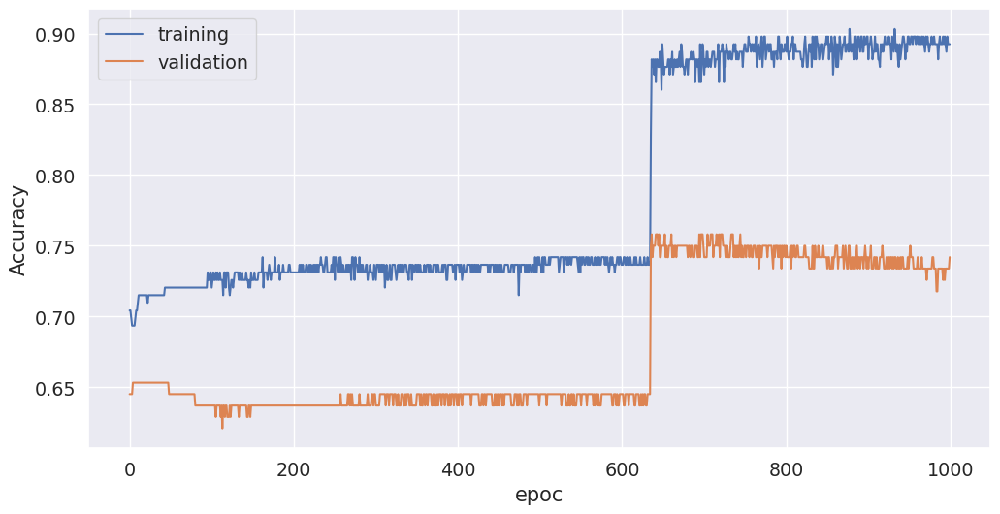

In [107]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Que pasa si quiero guardar los pesos de mi mejor modelo: necesito usar callbacks

In [108]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

EarlyStopping para de entrenar el modelo según una condición sobre la variable monitor

In [109]:
es = EarlyStopping(monitor='val_acc', mode='max')

In [110]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_45 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_46 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_47 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [111]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[es],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 9.0915 - accuracy: 0.3438

186/186 [==============================] - 0s 680us/step - loss: 9.3807 - accuracy: 0.2957 - val_loss: 7.7208 - val_accuracy: 0.3629


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.6523 - accuracy: 0.4062

186/186 [==============================] - 0s 68us/step - loss: 8.5226 - accuracy: 0.2957 - val_loss: 7.0761 - val_accuracy: 0.3629


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.6347 - accuracy: 0.3125

186/186 [==============================] - 0s 70us/step - loss: 7.8732 - accuracy: 0.2957 - val_loss: 6.5194 - val_accuracy: 0.3629


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.4044 - accuracy: 0.3125

186/186 [==============================] - 0s 72us/step - loss: 7.2880 - accuracy: 0.2957 - val_loss: 5.9896 - val_accuracy: 0.3629


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.1936 - accuracy: 0.3125

186/186 [==============================] - 0s 70us/step - loss: 6.7164 - accuracy: 0.2957 - val_loss: 5.4642 - val_accuracy: 0.3629


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 6.6504 - accuracy: 0.2188

186/186 [==============================] - 0s 69us/step - loss: 6.1558 - accuracy: 0.2957 - val_loss: 4.9476 - val_accuracy: 0.3629


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 7.0919 - accuracy: 0.1875

186/186 [==============================] - 0s 71us/step - loss: 5.5989 - accuracy: 0.2957 - val_loss: 4.4371 - val_accuracy: 0.3629


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 5.3483 - accuracy: 0.2812

186/186 [==============================] - 0s 72us/step - loss: 5.0501 - accuracy: 0.2957 - val_loss: 3.9347 - val_accuracy: 0.3629


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.7594 - accuracy: 0.2812

186/186 [==============================] - 0s 70us/step - loss: 4.5086 - accuracy: 0.2957 - val_loss: 3.4528 - val_accuracy: 0.3629


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.0670 - accuracy: 0.3750

186/186 [==============================] - 0s 70us/step - loss: 3.9815 - accuracy: 0.3011 - val_loss: 3.0028 - val_accuracy: 0.3629


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 4.1505 - accuracy: 0.2500

186/186 [==============================] - 0s 70us/step - loss: 3.4908 - accuracy: 0.3118 - val_loss: 2.6284 - val_accuracy: 0.4194


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.4773 - accuracy: 0.3750

186/186 [==============================] - 0s 67us/step - loss: 3.0607 - accuracy: 0.2849 - val_loss: 2.3337 - val_accuracy: 0.4758


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4727 - accuracy: 0.3125

186/186 [==============================] - 0s 111us/step - loss: 2.7026 - accuracy: 0.3172 - val_loss: 2.1260 - val_accuracy: 0.4597


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.8038 - accuracy: 0.2500

186/186 [==============================] - 0s 85us/step - loss: 2.4271 - accuracy: 0.2849 - val_loss: 1.9879 - val_accuracy: 0.4194


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7544 - accuracy: 0.3750

186/186 [==============================] - 0s 70us/step - loss: 2.2183 - accuracy: 0.2634 - val_loss: 1.8732 - val_accuracy: 0.3790


Epoch 16/1000


 32/186 [====>.........................] - ETA: 0s - loss: 2.5024 - accuracy: 0.1875

186/186 [==============================] - 0s 70us/step - loss: 2.0371 - accuracy: 0.2688 - val_loss: 1.7645 - val_accuracy: 0.3629


Epoch 17/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.8975 - accuracy: 0.2500

186/186 [==============================] - 0s 76us/step - loss: 1.8724 - accuracy: 0.2849 - val_loss: 1.6578 - val_accuracy: 0.3548


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8668 - accuracy: 0.3125

186/186 [==============================] - 0s 70us/step - loss: 1.7219 - accuracy: 0.2957 - val_loss: 1.5484 - val_accuracy: 0.3548


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5849 - accuracy: 0.3125

186/186 [==============================] - 0s 69us/step - loss: 1.5767 - accuracy: 0.3011 - val_loss: 1.4418 - val_accuracy: 0.3468


Epoch 20/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.4881 - accuracy: 0.2812

186/186 [==============================] - 0s 67us/step - loss: 1.4323 - accuracy: 0.3118 - val_loss: 1.3385 - val_accuracy: 0.3710


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3304 - accuracy: 0.3125

186/186 [==============================] - 0s 64us/step - loss: 1.2921 - accuracy: 0.3441 - val_loss: 1.2431 - val_accuracy: 0.3952


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1485 - accuracy: 0.3125

186/186 [==============================] - 0s 61us/step - loss: 1.1625 - accuracy: 0.3871 - val_loss: 1.1383 - val_accuracy: 0.4839


Epoch 23/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.9918 - accuracy: 0.5312

186/186 [==============================] - 0s 71us/step - loss: 1.0166 - accuracy: 0.5269 - val_loss: 1.0478 - val_accuracy: 0.5645


Epoch 24/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.9042 - accuracy: 0.5938

186/186 [==============================] - 0s 67us/step - loss: 0.9097 - accuracy: 0.5914 - val_loss: 0.9862 - val_accuracy: 0.5806


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9265 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.8468 - accuracy: 0.6344 - val_loss: 0.9438 - val_accuracy: 0.5968


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8854 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.8084 - accuracy: 0.6505 - val_loss: 0.9184 - val_accuracy: 0.5968


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7068 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.7793 - accuracy: 0.6505 - val_loss: 0.9000 - val_accuracy: 0.6048


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6776 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.7588 - accuracy: 0.6559 - val_loss: 0.8859 - val_accuracy: 0.6048


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6553 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.7404 - accuracy: 0.6613 - val_loss: 0.8757 - val_accuracy: 0.6129


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6736 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.7253 - accuracy: 0.6720 - val_loss: 0.8693 - val_accuracy: 0.6129


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7696 - accuracy: 0.5312

186/186 [==============================] - 0s 67us/step - loss: 0.7168 - accuracy: 0.6720 - val_loss: 0.8648 - val_accuracy: 0.6129


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6628 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.7090 - accuracy: 0.6882 - val_loss: 0.8602 - val_accuracy: 0.6129


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7526 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.7043 - accuracy: 0.6882 - val_loss: 0.8567 - val_accuracy: 0.6210


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6332 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6995 - accuracy: 0.6882 - val_loss: 0.8531 - val_accuracy: 0.6210


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6922 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.6961 - accuracy: 0.6882 - val_loss: 0.8502 - val_accuracy: 0.6210


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6894 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6910 - accuracy: 0.6882 - val_loss: 0.8468 - val_accuracy: 0.6290


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6497 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.6886 - accuracy: 0.6935 - val_loss: 0.8443 - val_accuracy: 0.6290


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7099 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6862 - accuracy: 0.6989 - val_loss: 0.8418 - val_accuracy: 0.6290


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6341 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6839 - accuracy: 0.6989 - val_loss: 0.8417 - val_accuracy: 0.6290


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6747 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6824 - accuracy: 0.6989 - val_loss: 0.8402 - val_accuracy: 0.6290


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7811 - accuracy: 0.5312

186/186 [==============================] - 0s 64us/step - loss: 0.6815 - accuracy: 0.6989 - val_loss: 0.8388 - val_accuracy: 0.6290


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7277 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.6803 - accuracy: 0.6989 - val_loss: 0.8365 - val_accuracy: 0.6290


Epoch 43/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6557 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.6788 - accuracy: 0.6989 - val_loss: 0.8344 - val_accuracy: 0.6290


Epoch 44/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6745 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.6784 - accuracy: 0.6935 - val_loss: 0.8327 - val_accuracy: 0.6290


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6835 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6772 - accuracy: 0.6989 - val_loss: 0.8312 - val_accuracy: 0.6290


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6582 - accuracy: 0.7500

186/186 [==============================] - 0s 89us/step - loss: 0.6756 - accuracy: 0.7043 - val_loss: 0.8286 - val_accuracy: 0.6290


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6471 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.6748 - accuracy: 0.7043 - val_loss: 0.8268 - val_accuracy: 0.6290


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6457 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6742 - accuracy: 0.7043 - val_loss: 0.8275 - val_accuracy: 0.6290


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7146 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.6742 - accuracy: 0.6989 - val_loss: 0.8260 - val_accuracy: 0.6290


Epoch 50/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6177 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.6737 - accuracy: 0.7043 - val_loss: 0.8252 - val_accuracy: 0.6290


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7171 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.6731 - accuracy: 0.7043 - val_loss: 0.8238 - val_accuracy: 0.6290


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7004 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6724 - accuracy: 0.7043 - val_loss: 0.8228 - val_accuracy: 0.6290


Epoch 53/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7003 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6722 - accuracy: 0.7043 - val_loss: 0.8215 - val_accuracy: 0.6290


Epoch 54/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7055 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6719 - accuracy: 0.7043 - val_loss: 0.8210 - val_accuracy: 0.6290


Epoch 55/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7326 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.6718 - accuracy: 0.7043 - val_loss: 0.8190 - val_accuracy: 0.6290


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6694 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6711 - accuracy: 0.7043 - val_loss: 0.8173 - val_accuracy: 0.6290


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6454 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6705 - accuracy: 0.6989 - val_loss: 0.8159 - val_accuracy: 0.6290


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6844 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6703 - accuracy: 0.7043 - val_loss: 0.8148 - val_accuracy: 0.6290


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6387 - accuracy: 0.7500



186/186 [==============================] - 0s 73us/step - loss: 0.6690 - accuracy: 0.7043 - val_loss: 0.8138 - val_accuracy: 0.6290


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6122 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.6687 - accuracy: 0.7043 - val_loss: 0.8135 - val_accuracy: 0.6290


Epoch 61/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6950 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 0.6684 - accuracy: 0.7043 - val_loss: 0.8121 - val_accuracy: 0.6290


Epoch 62/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6858 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6680 - accuracy: 0.7043 - val_loss: 0.8111 - val_accuracy: 0.6290


Epoch 63/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6751 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.6675 - accuracy: 0.7043 - val_loss: 0.8089 - val_accuracy: 0.6290


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6710 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6676 - accuracy: 0.7043 - val_loss: 0.8074 - val_accuracy: 0.6290


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6192 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6668 - accuracy: 0.7043 - val_loss: 0.8058 - val_accuracy: 0.6290


Epoch 66/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7224 - accuracy: 0.6250



186/186 [==============================] - 0s 74us/step - loss: 0.6662 - accuracy: 0.7043 - val_loss: 0.8041 - val_accuracy: 0.6290


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7048 - accuracy: 0.6250



186/186 [==============================] - 0s 60us/step - loss: 0.6655 - accuracy: 0.7043 - val_loss: 0.8029 - val_accuracy: 0.6290


Epoch 68/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7085 - accuracy: 0.6562

186/186 [==============================] - 0s 78us/step - loss: 0.6644 - accuracy: 0.7043 - val_loss: 0.8011 - val_accuracy: 0.6290


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6347 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6640 - accuracy: 0.7043 - val_loss: 0.8000 - val_accuracy: 0.6290


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5949 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6637 - accuracy: 0.7043 - val_loss: 0.7980 - val_accuracy: 0.6290


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6442 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6635 - accuracy: 0.7043 - val_loss: 0.7936 - val_accuracy: 0.6290


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7320 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.6615 - accuracy: 0.7043 - val_loss: 0.7869 - val_accuracy: 0.6290


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6921 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6594 - accuracy: 0.7043 - val_loss: 0.7816 - val_accuracy: 0.6290


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7776 - accuracy: 0.5312

186/186 [==============================] - 0s 65us/step - loss: 0.6585 - accuracy: 0.7043 - val_loss: 0.7789 - val_accuracy: 0.6290


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7116 - accuracy: 0.5938

186/186 [==============================] - 0s 61us/step - loss: 0.6570 - accuracy: 0.7043 - val_loss: 0.7764 - val_accuracy: 0.6290


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6870 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6557 - accuracy: 0.7043 - val_loss: 0.7691 - val_accuracy: 0.6290


Epoch 77/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6556 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6560 - accuracy: 0.7043 - val_loss: 0.7702 - val_accuracy: 0.6290


Epoch 78/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6148 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.6542 - accuracy: 0.7043 - val_loss: 0.7665 - val_accuracy: 0.6290


Epoch 79/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6301 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.6519 - accuracy: 0.7043 - val_loss: 0.7638 - val_accuracy: 0.6290


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6273 - accuracy: 0.7500

186/186 [==============================] - 0s 55us/step - loss: 0.6499 - accuracy: 0.7043 - val_loss: 0.7606 - val_accuracy: 0.6290


Epoch 81/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6295 - accuracy: 0.7188

186/186 [==============================] - 0s 57us/step - loss: 0.6491 - accuracy: 0.7043 - val_loss: 0.7552 - val_accuracy: 0.6290


Epoch 82/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6999 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.6462 - accuracy: 0.7043 - val_loss: 0.7494 - val_accuracy: 0.6290


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6430 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6445 - accuracy: 0.7043 - val_loss: 0.7464 - val_accuracy: 0.6290


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6440 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6431 - accuracy: 0.7043 - val_loss: 0.7444 - val_accuracy: 0.6290


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6329 - accuracy: 0.6875

186/186 [==============================] - 0s 98us/step - loss: 0.6396 - accuracy: 0.7043 - val_loss: 0.7423 - val_accuracy: 0.6290


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7018 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6380 - accuracy: 0.7043 - val_loss: 0.7399 - val_accuracy: 0.6290


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5724 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6361 - accuracy: 0.7043 - val_loss: 0.7363 - val_accuracy: 0.6290


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6048 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6346 - accuracy: 0.7043 - val_loss: 0.7379 - val_accuracy: 0.6290


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6883 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6326 - accuracy: 0.7043 - val_loss: 0.7333 - val_accuracy: 0.6290


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6264 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6310 - accuracy: 0.7043 - val_loss: 0.7300 - val_accuracy: 0.6290


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6501 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6290 - accuracy: 0.7043 - val_loss: 0.7281 - val_accuracy: 0.6290


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6188 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6272 - accuracy: 0.7043 - val_loss: 0.7243 - val_accuracy: 0.6290


Epoch 93/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6242 - accuracy: 0.6250



186/186 [==============================] - 0s 66us/step - loss: 0.6273 - accuracy: 0.7043 - val_loss: 0.7242 - val_accuracy: 0.6290


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6165 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.6249 - accuracy: 0.7043 - val_loss: 0.7224 - val_accuracy: 0.6290


Epoch 95/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5894 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.6227 - accuracy: 0.7043 - val_loss: 0.7186 - val_accuracy: 0.6290


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6202 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.6212 - accuracy: 0.7043 - val_loss: 0.7167 - val_accuracy: 0.6290


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6502 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6203 - accuracy: 0.6989 - val_loss: 0.7134 - val_accuracy: 0.6290


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5969 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.6190 - accuracy: 0.7043 - val_loss: 0.7134 - val_accuracy: 0.6290


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6350 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.6162 - accuracy: 0.7043 - val_loss: 0.7096 - val_accuracy: 0.6290


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6210 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6128 - accuracy: 0.7043 - val_loss: 0.7050 - val_accuracy: 0.6290


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5504 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.6128 - accuracy: 0.7043 - val_loss: 0.7028 - val_accuracy: 0.6290


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5478 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.6092 - accuracy: 0.7043 - val_loss: 0.7007 - val_accuracy: 0.6290


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6044 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.6092 - accuracy: 0.7043 - val_loss: 0.6953 - val_accuracy: 0.6290


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5568 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6048 - accuracy: 0.7043 - val_loss: 0.6917 - val_accuracy: 0.6290


Epoch 105/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5660 - accuracy: 0.7188

186/186 [==============================] - 0s 81us/step - loss: 0.6022 - accuracy: 0.7043 - val_loss: 0.6884 - val_accuracy: 0.6290


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6103 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.5994 - accuracy: 0.7043 - val_loss: 0.6850 - val_accuracy: 0.6290


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6395 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.5961 - accuracy: 0.7043 - val_loss: 0.6816 - val_accuracy: 0.6290


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5928 - accuracy: 0.7188

186/186 [==============================] - 0s 114us/step - loss: 0.5905 - accuracy: 0.7043 - val_loss: 0.6772 - val_accuracy: 0.6290


Epoch 109/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5239 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.5867 - accuracy: 0.7043 - val_loss: 0.6728 - val_accuracy: 0.6290


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5722 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5825 - accuracy: 0.7043 - val_loss: 0.6660 - val_accuracy: 0.6290


Epoch 111/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6456 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.5805 - accuracy: 0.7043 - val_loss: 0.6618 - val_accuracy: 0.6290


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5685 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.5744 - accuracy: 0.7043 - val_loss: 0.6578 - val_accuracy: 0.6290


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6048 - accuracy: 0.6250

186/186 [==============================] - 0s 84us/step - loss: 0.5718 - accuracy: 0.7043 - val_loss: 0.6536 - val_accuracy: 0.6290


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5004 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.5676 - accuracy: 0.7043 - val_loss: 0.6488 - val_accuracy: 0.6290


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5435 - accuracy: 0.7188

186/186 [==============================] - 0s 90us/step - loss: 0.5620 - accuracy: 0.7043 - val_loss: 0.6434 - val_accuracy: 0.6290


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5745 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.5588 - accuracy: 0.7043 - val_loss: 0.6357 - val_accuracy: 0.6290


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5293 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.5545 - accuracy: 0.7043 - val_loss: 0.6332 - val_accuracy: 0.6290


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4717 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.5504 - accuracy: 0.7043 - val_loss: 0.6293 - val_accuracy: 0.6290


Epoch 119/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5228 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5457 - accuracy: 0.7043 - val_loss: 0.6271 - val_accuracy: 0.6290


Epoch 120/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6120 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.5414 - accuracy: 0.7043 - val_loss: 0.6186 - val_accuracy: 0.6290


Epoch 121/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4797 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5384 - accuracy: 0.7043 - val_loss: 0.6143 - val_accuracy: 0.6290


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5032 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.5342 - accuracy: 0.7043 - val_loss: 0.6079 - val_accuracy: 0.6290


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5202 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.5288 - accuracy: 0.7043 - val_loss: 0.6020 - val_accuracy: 0.6290


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4990 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5236 - accuracy: 0.7043 - val_loss: 0.5961 - val_accuracy: 0.6290


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6068 - accuracy: 0.6875

186/186 [==============================] - 0s 59us/step - loss: 0.5202 - accuracy: 0.7043 - val_loss: 0.5910 - val_accuracy: 0.7258


Epoch 126/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5086 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.5151 - accuracy: 0.7796 - val_loss: 0.5847 - val_accuracy: 0.7177


Epoch 127/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4796 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.5098 - accuracy: 0.7581 - val_loss: 0.5779 - val_accuracy: 0.7339


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5101 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5048 - accuracy: 0.7581 - val_loss: 0.5717 - val_accuracy: 0.7177


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4539 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.4982 - accuracy: 0.7634 - val_loss: 0.5653 - val_accuracy: 0.7339


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4902 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4940 - accuracy: 0.7581 - val_loss: 0.5592 - val_accuracy: 0.7339


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4668 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4858 - accuracy: 0.7581 - val_loss: 0.5548 - val_accuracy: 0.7500


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3830 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4811 - accuracy: 0.7688 - val_loss: 0.5503 - val_accuracy: 0.7823


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4599 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.4767 - accuracy: 0.7796 - val_loss: 0.5459 - val_accuracy: 0.7903


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4221 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4725 - accuracy: 0.7903 - val_loss: 0.5412 - val_accuracy: 0.7661


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5176 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4656 - accuracy: 0.7903 - val_loss: 0.5370 - val_accuracy: 0.7661


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5386 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4626 - accuracy: 0.8011 - val_loss: 0.5333 - val_accuracy: 0.7419


Epoch 137/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4514 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4576 - accuracy: 0.7957 - val_loss: 0.5291 - val_accuracy: 0.7742


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3921 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4536 - accuracy: 0.8065 - val_loss: 0.5259 - val_accuracy: 0.7581


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3835 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4480 - accuracy: 0.8226 - val_loss: 0.5225 - val_accuracy: 0.7742


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.4443 - accuracy: 0.8065 - val_loss: 0.5198 - val_accuracy: 0.7339


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4690 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4408 - accuracy: 0.8011 - val_loss: 0.5162 - val_accuracy: 0.7339


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4172 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4358 - accuracy: 0.8333 - val_loss: 0.5137 - val_accuracy: 0.7419


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4132 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.4338 - accuracy: 0.8280 - val_loss: 0.5101 - val_accuracy: 0.7419


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4854 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.4294 - accuracy: 0.8118 - val_loss: 0.5071 - val_accuracy: 0.7419


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4861 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4277 - accuracy: 0.8226 - val_loss: 0.5057 - val_accuracy: 0.7258


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3717 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.4246 - accuracy: 0.8172 - val_loss: 0.5041 - val_accuracy: 0.7177


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4274 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.4189 - accuracy: 0.8387 - val_loss: 0.5025 - val_accuracy: 0.7177


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4882 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4185 - accuracy: 0.8387 - val_loss: 0.5008 - val_accuracy: 0.7177


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5182 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4135 - accuracy: 0.8333 - val_loss: 0.4980 - val_accuracy: 0.7177


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4493 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.4111 - accuracy: 0.8280 - val_loss: 0.4967 - val_accuracy: 0.7177


Epoch 151/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4831 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.4099 - accuracy: 0.8280 - val_loss: 0.4965 - val_accuracy: 0.7258


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4056 - accuracy: 0.8441 - val_loss: 0.4965 - val_accuracy: 0.7339


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5201 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4045 - accuracy: 0.8065 - val_loss: 0.4937 - val_accuracy: 0.7339


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3030 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4010 - accuracy: 0.8280 - val_loss: 0.4916 - val_accuracy: 0.7258


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3101 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3993 - accuracy: 0.8387 - val_loss: 0.4917 - val_accuracy: 0.7097


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4420 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3973 - accuracy: 0.8226 - val_loss: 0.4917 - val_accuracy: 0.7177


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3490 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3960 - accuracy: 0.8118 - val_loss: 0.4899 - val_accuracy: 0.7097


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3256 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3932 - accuracy: 0.8280 - val_loss: 0.4911 - val_accuracy: 0.7258


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3771 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3930 - accuracy: 0.8226 - val_loss: 0.4890 - val_accuracy: 0.7258


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3918 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3892 - accuracy: 0.8172 - val_loss: 0.4880 - val_accuracy: 0.7177


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4063 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3900 - accuracy: 0.8172 - val_loss: 0.4857 - val_accuracy: 0.7097


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5218 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3875 - accuracy: 0.8118 - val_loss: 0.4868 - val_accuracy: 0.7097


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3954 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3848 - accuracy: 0.8065 - val_loss: 0.4866 - val_accuracy: 0.7177


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3119 - accuracy: 0.8750



186/186 [==============================] - 0s 67us/step - loss: 0.3841 - accuracy: 0.8172 - val_loss: 0.4859 - val_accuracy: 0.7258


Epoch 165/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4391 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3853 - accuracy: 0.8118 - val_loss: 0.4858 - val_accuracy: 0.7258


Epoch 166/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3811 - accuracy: 0.8118 - val_loss: 0.4842 - val_accuracy: 0.7258


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.3806 - accuracy: 0.8065 - val_loss: 0.4844 - val_accuracy: 0.7258


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3996 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3793 - accuracy: 0.8011 - val_loss: 0.4847 - val_accuracy: 0.7258


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3762 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3798 - accuracy: 0.8118 - val_loss: 0.4817 - val_accuracy: 0.7258


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3927 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3781 - accuracy: 0.8065 - val_loss: 0.4807 - val_accuracy: 0.7258


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4118 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3765 - accuracy: 0.8118 - val_loss: 0.4800 - val_accuracy: 0.7258


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4026 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3766 - accuracy: 0.8172 - val_loss: 0.4798 - val_accuracy: 0.7258


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3484 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3748 - accuracy: 0.8118 - val_loss: 0.4790 - val_accuracy: 0.7339


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3297 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3732 - accuracy: 0.8065 - val_loss: 0.4804 - val_accuracy: 0.7339


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4440 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3721 - accuracy: 0.8118 - val_loss: 0.4805 - val_accuracy: 0.7339


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5051 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3746 - accuracy: 0.8280 - val_loss: 0.4770 - val_accuracy: 0.7339


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5469 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.3708 - accuracy: 0.8226 - val_loss: 0.4782 - val_accuracy: 0.7339


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3705 - accuracy: 0.8172 - val_loss: 0.4779 - val_accuracy: 0.7339


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3691 - accuracy: 0.8172 - val_loss: 0.4774 - val_accuracy: 0.7339


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2472 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3692 - accuracy: 0.8172 - val_loss: 0.4816 - val_accuracy: 0.7339


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4545 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3700 - accuracy: 0.8280 - val_loss: 0.4792 - val_accuracy: 0.7339


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3679 - accuracy: 0.8226 - val_loss: 0.4763 - val_accuracy: 0.7339


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3003 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3671 - accuracy: 0.8172 - val_loss: 0.4785 - val_accuracy: 0.7339


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3672 - accuracy: 0.8118 - val_loss: 0.4790 - val_accuracy: 0.7339


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3671 - accuracy: 0.8226 - val_loss: 0.4776 - val_accuracy: 0.7339


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3267 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3659 - accuracy: 0.8118 - val_loss: 0.4800 - val_accuracy: 0.7339


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3927 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3661 - accuracy: 0.8226 - val_loss: 0.4783 - val_accuracy: 0.7339


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3646 - accuracy: 0.8226 - val_loss: 0.4771 - val_accuracy: 0.7339


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3638 - accuracy: 0.8172 - val_loss: 0.4764 - val_accuracy: 0.7339


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4183 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3640 - accuracy: 0.8226 - val_loss: 0.4753 - val_accuracy: 0.7339


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4219 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3631 - accuracy: 0.8065 - val_loss: 0.4779 - val_accuracy: 0.7339


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3236 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3638 - accuracy: 0.8226 - val_loss: 0.4792 - val_accuracy: 0.7339


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3621 - accuracy: 0.8280 - val_loss: 0.4770 - val_accuracy: 0.7339


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3613 - accuracy: 0.8226 - val_loss: 0.4776 - val_accuracy: 0.7339


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3624 - accuracy: 0.8226 - val_loss: 0.4781 - val_accuracy: 0.7339


Epoch 196/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3608 - accuracy: 0.8280 - val_loss: 0.4774 - val_accuracy: 0.7339


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3331 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3646 - accuracy: 0.8118 - val_loss: 0.4783 - val_accuracy: 0.7339


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3912 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3600 - accuracy: 0.8280 - val_loss: 0.4771 - val_accuracy: 0.7339


Epoch 199/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3605 - accuracy: 0.8172 - val_loss: 0.4793 - val_accuracy: 0.7339


Epoch 200/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3600 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3597 - accuracy: 0.8172 - val_loss: 0.4809 - val_accuracy: 0.7339


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5108 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3599 - accuracy: 0.8333 - val_loss: 0.4789 - val_accuracy: 0.7339


Epoch 202/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3584 - accuracy: 0.8280 - val_loss: 0.4800 - val_accuracy: 0.7339


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2977 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3600 - accuracy: 0.8226 - val_loss: 0.4786 - val_accuracy: 0.7339


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.9375



186/186 [==============================] - 0s 63us/step - loss: 0.3604 - accuracy: 0.8226 - val_loss: 0.4767 - val_accuracy: 0.7339


Epoch 205/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3584 - accuracy: 0.8172 - val_loss: 0.4776 - val_accuracy: 0.7339


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3573 - accuracy: 0.8280 - val_loss: 0.4784 - val_accuracy: 0.7339


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3836 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3592 - accuracy: 0.8226 - val_loss: 0.4791 - val_accuracy: 0.7339


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2990 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3558 - accuracy: 0.8280 - val_loss: 0.4770 - val_accuracy: 0.7339


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3825 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3565 - accuracy: 0.8226 - val_loss: 0.4772 - val_accuracy: 0.7339


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3562 - accuracy: 0.8333 - val_loss: 0.4780 - val_accuracy: 0.7339


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2708 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3553 - accuracy: 0.8280 - val_loss: 0.4798 - val_accuracy: 0.7339


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4243 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3576 - accuracy: 0.8333 - val_loss: 0.4799 - val_accuracy: 0.7339


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3542 - accuracy: 0.8280 - val_loss: 0.4761 - val_accuracy: 0.7339


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3942 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3576 - accuracy: 0.8280 - val_loss: 0.4766 - val_accuracy: 0.7339


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3550 - accuracy: 0.8172 - val_loss: 0.4802 - val_accuracy: 0.7339


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4689 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3553 - accuracy: 0.8280 - val_loss: 0.4788 - val_accuracy: 0.7339


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3547 - accuracy: 0.8280 - val_loss: 0.4802 - val_accuracy: 0.7339


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3363 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3540 - accuracy: 0.8280 - val_loss: 0.4803 - val_accuracy: 0.7339


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3218 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3546 - accuracy: 0.8226 - val_loss: 0.4803 - val_accuracy: 0.7339


Epoch 220/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3837 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3545 - accuracy: 0.8333 - val_loss: 0.4796 - val_accuracy: 0.7339


Epoch 221/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2701 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3546 - accuracy: 0.8280 - val_loss: 0.4768 - val_accuracy: 0.7339


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4003 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3537 - accuracy: 0.8280 - val_loss: 0.4770 - val_accuracy: 0.7339


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3200 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3531 - accuracy: 0.8280 - val_loss: 0.4799 - val_accuracy: 0.7339


Epoch 224/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2609 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3521 - accuracy: 0.8280 - val_loss: 0.4762 - val_accuracy: 0.7339


Epoch 225/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3480 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3515 - accuracy: 0.8280 - val_loss: 0.4775 - val_accuracy: 0.7339


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4176 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3519 - accuracy: 0.8280 - val_loss: 0.4779 - val_accuracy: 0.7339


Epoch 227/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3504 - accuracy: 0.8280 - val_loss: 0.4803 - val_accuracy: 0.7339


Epoch 228/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3532 - accuracy: 0.8333 - val_loss: 0.4784 - val_accuracy: 0.7339


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3154 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3503 - accuracy: 0.8333 - val_loss: 0.4767 - val_accuracy: 0.7339


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3320 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3509 - accuracy: 0.8280 - val_loss: 0.4785 - val_accuracy: 0.7339


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3502 - accuracy: 0.8333 - val_loss: 0.4756 - val_accuracy: 0.7339


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4558 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3500 - accuracy: 0.8280 - val_loss: 0.4806 - val_accuracy: 0.7419


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3099 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3499 - accuracy: 0.8226 - val_loss: 0.4784 - val_accuracy: 0.7339


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4061 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3506 - accuracy: 0.8333 - val_loss: 0.4757 - val_accuracy: 0.7339


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3188 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3497 - accuracy: 0.8280 - val_loss: 0.4774 - val_accuracy: 0.7339


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2481 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3533 - accuracy: 0.8226 - val_loss: 0.4764 - val_accuracy: 0.7339


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5601 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4762 - val_accuracy: 0.7339


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3488 - accuracy: 0.8280 - val_loss: 0.4796 - val_accuracy: 0.7419


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3502 - accuracy: 0.8280 - val_loss: 0.4790 - val_accuracy: 0.7339


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3501 - accuracy: 0.8226 - val_loss: 0.4788 - val_accuracy: 0.7339


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2039 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3484 - accuracy: 0.8280 - val_loss: 0.4786 - val_accuracy: 0.7339


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3488 - accuracy: 0.8280 - val_loss: 0.4780 - val_accuracy: 0.7339


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4347 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.4750 - val_accuracy: 0.7339


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4853 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3471 - accuracy: 0.8280 - val_loss: 0.4727 - val_accuracy: 0.7339


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3474 - accuracy: 0.8226 - val_loss: 0.4751 - val_accuracy: 0.7339


Epoch 246/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3629 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3495 - accuracy: 0.8280 - val_loss: 0.4760 - val_accuracy: 0.7339


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2899 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3487 - accuracy: 0.8333 - val_loss: 0.4728 - val_accuracy: 0.7339


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3599 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3477 - accuracy: 0.8333 - val_loss: 0.4715 - val_accuracy: 0.7339


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3472 - accuracy: 0.8280 - val_loss: 0.4728 - val_accuracy: 0.7339


Epoch 250/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4774 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3473 - accuracy: 0.8280 - val_loss: 0.4728 - val_accuracy: 0.7339


Epoch 251/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4410 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3491 - accuracy: 0.8333 - val_loss: 0.4745 - val_accuracy: 0.7339


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3618 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3475 - accuracy: 0.8280 - val_loss: 0.4752 - val_accuracy: 0.7339


Epoch 253/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.3457 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7339


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2610 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.4755 - val_accuracy: 0.7339


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3762 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3460 - accuracy: 0.8226 - val_loss: 0.4746 - val_accuracy: 0.7339


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5120 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3458 - accuracy: 0.8226 - val_loss: 0.4723 - val_accuracy: 0.7339


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3161 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3464 - accuracy: 0.8280 - val_loss: 0.4735 - val_accuracy: 0.7339


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3350 - accuracy: 0.8125

186/186 [==============================] - 0s 96us/step - loss: 0.3465 - accuracy: 0.8280 - val_loss: 0.4752 - val_accuracy: 0.7339


Epoch 259/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2913 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3459 - accuracy: 0.8226 - val_loss: 0.4721 - val_accuracy: 0.7339


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3470 - accuracy: 0.8333 - val_loss: 0.4745 - val_accuracy: 0.7339


Epoch 261/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3813 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.4733 - val_accuracy: 0.7339


Epoch 262/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2777 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3460 - accuracy: 0.8333 - val_loss: 0.4719 - val_accuracy: 0.7339


Epoch 263/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3741 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3456 - accuracy: 0.8226 - val_loss: 0.4700 - val_accuracy: 0.7339


Epoch 264/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5032 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4734 - val_accuracy: 0.7339


Epoch 265/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3441 - accuracy: 0.8280 - val_loss: 0.4747 - val_accuracy: 0.7419


Epoch 266/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4883 - accuracy: 0.6875

186/186 [==============================] - 0s 57us/step - loss: 0.3441 - accuracy: 0.8226 - val_loss: 0.4737 - val_accuracy: 0.7339


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3677 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3446 - accuracy: 0.8280 - val_loss: 0.4741 - val_accuracy: 0.7419


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2258 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.3459 - accuracy: 0.8226 - val_loss: 0.4721 - val_accuracy: 0.7339


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3617 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.3449 - accuracy: 0.8226 - val_loss: 0.4724 - val_accuracy: 0.7339


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.3442 - accuracy: 0.8333 - val_loss: 0.4700 - val_accuracy: 0.7339


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4135 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3432 - accuracy: 0.8280 - val_loss: 0.4723 - val_accuracy: 0.7339


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3439 - accuracy: 0.8226 - val_loss: 0.4740 - val_accuracy: 0.7500


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.4749 - val_accuracy: 0.7500


Epoch 274/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.4740 - val_accuracy: 0.7500


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.4754 - val_accuracy: 0.7500


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3434 - accuracy: 0.8333 - val_loss: 0.4756 - val_accuracy: 0.7500


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4861 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3445 - accuracy: 0.8226 - val_loss: 0.4708 - val_accuracy: 0.7339


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4806 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3423 - accuracy: 0.8280 - val_loss: 0.4704 - val_accuracy: 0.7339


Epoch 279/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4747 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3423 - accuracy: 0.8226 - val_loss: 0.4699 - val_accuracy: 0.7339


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.4696 - val_accuracy: 0.7339


Epoch 281/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3719 - accuracy: 0.8125



186/186 [==============================] - 0s 75us/step - loss: 0.3414 - accuracy: 0.8226 - val_loss: 0.4651 - val_accuracy: 0.7339


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.4692 - val_accuracy: 0.7419


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3433 - accuracy: 0.8226 - val_loss: 0.4700 - val_accuracy: 0.7500


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3430 - accuracy: 0.8226 - val_loss: 0.4696 - val_accuracy: 0.7500


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3430 - accuracy: 0.8226 - val_loss: 0.4687 - val_accuracy: 0.7419


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3199 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3409 - accuracy: 0.8280 - val_loss: 0.4662 - val_accuracy: 0.7339


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4999 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3409 - accuracy: 0.8280 - val_loss: 0.4672 - val_accuracy: 0.7419


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.4674 - val_accuracy: 0.7419


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2409 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3404 - accuracy: 0.8280 - val_loss: 0.4708 - val_accuracy: 0.7500


Epoch 290/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4047 - accuracy: 0.7500



186/186 [==============================] - 0s 73us/step - loss: 0.3422 - accuracy: 0.8226 - val_loss: 0.4669 - val_accuracy: 0.7419


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3401 - accuracy: 0.8280 - val_loss: 0.4667 - val_accuracy: 0.7419


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2442 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3431 - accuracy: 0.8280 - val_loss: 0.4700 - val_accuracy: 0.7500


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4574 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3421 - accuracy: 0.8280 - val_loss: 0.4665 - val_accuracy: 0.7419


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4900 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3419 - accuracy: 0.8333 - val_loss: 0.4648 - val_accuracy: 0.7419


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4023 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3400 - accuracy: 0.8280 - val_loss: 0.4659 - val_accuracy: 0.7419


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4772 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3406 - accuracy: 0.8280 - val_loss: 0.4701 - val_accuracy: 0.7581


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3410 - accuracy: 0.8280 - val_loss: 0.4697 - val_accuracy: 0.7581


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3634 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3407 - accuracy: 0.8226 - val_loss: 0.4644 - val_accuracy: 0.7419


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2395 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3422 - accuracy: 0.8280 - val_loss: 0.4634 - val_accuracy: 0.7419


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3741 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3392 - accuracy: 0.8280 - val_loss: 0.4669 - val_accuracy: 0.7500


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2700 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3413 - accuracy: 0.8226 - val_loss: 0.4651 - val_accuracy: 0.7500


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3444 - accuracy: 0.8172 - val_loss: 0.4646 - val_accuracy: 0.7419


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3318 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3394 - accuracy: 0.8280 - val_loss: 0.4629 - val_accuracy: 0.7419


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2428 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3403 - accuracy: 0.8280 - val_loss: 0.4635 - val_accuracy: 0.7419


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4947 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.3402 - accuracy: 0.8280 - val_loss: 0.4663 - val_accuracy: 0.7500


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3389 - accuracy: 0.8280 - val_loss: 0.4660 - val_accuracy: 0.7500


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4085 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3387 - accuracy: 0.8226 - val_loss: 0.4641 - val_accuracy: 0.7500


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2780 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3424 - accuracy: 0.8333 - val_loss: 0.4650 - val_accuracy: 0.7500


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4707 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3383 - accuracy: 0.8226 - val_loss: 0.4619 - val_accuracy: 0.7419


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2262 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3385 - accuracy: 0.8280 - val_loss: 0.4599 - val_accuracy: 0.7419


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3389 - accuracy: 0.8226 - val_loss: 0.4602 - val_accuracy: 0.7419


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3387 - accuracy: 0.8333 - val_loss: 0.4652 - val_accuracy: 0.7500


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2508 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3394 - accuracy: 0.8226 - val_loss: 0.4612 - val_accuracy: 0.7419


Epoch 314/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2520 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3404 - accuracy: 0.8280 - val_loss: 0.4633 - val_accuracy: 0.7500


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2696 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3386 - accuracy: 0.8226 - val_loss: 0.4625 - val_accuracy: 0.7500


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4767 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3401 - accuracy: 0.8333 - val_loss: 0.4635 - val_accuracy: 0.7500


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4623 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3383 - accuracy: 0.8280 - val_loss: 0.4653 - val_accuracy: 0.7581


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3386 - accuracy: 0.8226 - val_loss: 0.4636 - val_accuracy: 0.7500


Epoch 319/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3385 - accuracy: 0.8226 - val_loss: 0.4626 - val_accuracy: 0.7500


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3778 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3398 - accuracy: 0.8226 - val_loss: 0.4624 - val_accuracy: 0.7500


Epoch 321/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.2628 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3377 - accuracy: 0.8280 - val_loss: 0.4654 - val_accuracy: 0.7581


Epoch 322/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3493 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3396 - accuracy: 0.8226 - val_loss: 0.4635 - val_accuracy: 0.7581


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3391 - accuracy: 0.8226 - val_loss: 0.4639 - val_accuracy: 0.7581


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3378 - accuracy: 0.8226 - val_loss: 0.4611 - val_accuracy: 0.7500


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3685 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3368 - accuracy: 0.8280 - val_loss: 0.4562 - val_accuracy: 0.7419


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3379 - accuracy: 0.8333 - val_loss: 0.4595 - val_accuracy: 0.7500


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3637 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3388 - accuracy: 0.8226 - val_loss: 0.4607 - val_accuracy: 0.7500


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3226 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3370 - accuracy: 0.8226 - val_loss: 0.4561 - val_accuracy: 0.7419


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3344 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3377 - accuracy: 0.8280 - val_loss: 0.4573 - val_accuracy: 0.7419


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1995 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3397 - accuracy: 0.8280 - val_loss: 0.4593 - val_accuracy: 0.7500


Epoch 331/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4032 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3363 - accuracy: 0.8226 - val_loss: 0.4571 - val_accuracy: 0.7419


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3358 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3365 - accuracy: 0.8280 - val_loss: 0.4561 - val_accuracy: 0.7419


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4282 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3368 - accuracy: 0.8280 - val_loss: 0.4606 - val_accuracy: 0.7500


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3288 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3377 - accuracy: 0.8226 - val_loss: 0.4561 - val_accuracy: 0.7419


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2276 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3368 - accuracy: 0.8226 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 336/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3378 - accuracy: 0.8280 - val_loss: 0.4601 - val_accuracy: 0.7500


Epoch 337/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3816 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3372 - accuracy: 0.8226 - val_loss: 0.4576 - val_accuracy: 0.7500


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3361 - accuracy: 0.8226 - val_loss: 0.4581 - val_accuracy: 0.7500


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3470 - accuracy: 0.8125



186/186 [==============================] - 0s 64us/step - loss: 0.3363 - accuracy: 0.8226 - val_loss: 0.4569 - val_accuracy: 0.7500


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3379 - accuracy: 0.8280 - val_loss: 0.4579 - val_accuracy: 0.7500


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3730 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3363 - accuracy: 0.8280 - val_loss: 0.4581 - val_accuracy: 0.7500


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3361 - accuracy: 0.8226 - val_loss: 0.4601 - val_accuracy: 0.7581


Epoch 343/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2761 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3356 - accuracy: 0.8226 - val_loss: 0.4570 - val_accuracy: 0.7500


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2141 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3357 - accuracy: 0.8280 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3377 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3351 - accuracy: 0.8280 - val_loss: 0.4553 - val_accuracy: 0.7500


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3354 - accuracy: 0.8226 - val_loss: 0.4563 - val_accuracy: 0.7500


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3357 - accuracy: 0.8226 - val_loss: 0.4557 - val_accuracy: 0.7500


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3907 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3357 - accuracy: 0.8280 - val_loss: 0.4557 - val_accuracy: 0.7500


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5388 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.3359 - accuracy: 0.8280 - val_loss: 0.4596 - val_accuracy: 0.7581


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3403 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.4627 - val_accuracy: 0.7581


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3359 - accuracy: 0.8226 - val_loss: 0.4593 - val_accuracy: 0.7581


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2207 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3365 - accuracy: 0.8226 - val_loss: 0.4589 - val_accuracy: 0.7581


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2215 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3343 - accuracy: 0.8226 - val_loss: 0.4578 - val_accuracy: 0.7581


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1677 - accuracy: 1.0000

186/186 [==============================] - 0s 66us/step - loss: 0.3359 - accuracy: 0.8226 - val_loss: 0.4558 - val_accuracy: 0.7500


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3344 - accuracy: 0.8280 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 356/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3347 - accuracy: 0.8280 - val_loss: 0.4558 - val_accuracy: 0.7581


Epoch 357/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3558 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3350 - accuracy: 0.8280 - val_loss: 0.4507 - val_accuracy: 0.7419


Epoch 358/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3345 - accuracy: 0.8333 - val_loss: 0.4511 - val_accuracy: 0.7419


Epoch 359/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2367 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3350 - accuracy: 0.8333 - val_loss: 0.4545 - val_accuracy: 0.7500


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2327 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3345 - accuracy: 0.8280 - val_loss: 0.4536 - val_accuracy: 0.7500


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3339 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3348 - accuracy: 0.8333 - val_loss: 0.4552 - val_accuracy: 0.7581


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4462 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3356 - accuracy: 0.8280 - val_loss: 0.4558 - val_accuracy: 0.7581


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2101 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3353 - accuracy: 0.8226 - val_loss: 0.4535 - val_accuracy: 0.7500


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4075 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3334 - accuracy: 0.8333 - val_loss: 0.4564 - val_accuracy: 0.7581


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4079 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3352 - accuracy: 0.8280 - val_loss: 0.4563 - val_accuracy: 0.7581


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1937 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3355 - accuracy: 0.8226 - val_loss: 0.4564 - val_accuracy: 0.7581


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3728 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3333 - accuracy: 0.8226 - val_loss: 0.4566 - val_accuracy: 0.7581


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3338 - accuracy: 0.8226 - val_loss: 0.4513 - val_accuracy: 0.7500


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2715 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3331 - accuracy: 0.8280 - val_loss: 0.4523 - val_accuracy: 0.7500


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2437 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3334 - accuracy: 0.8280 - val_loss: 0.4555 - val_accuracy: 0.7581


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4262 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3334 - accuracy: 0.8280 - val_loss: 0.4537 - val_accuracy: 0.7581


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4110 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3327 - accuracy: 0.8280 - val_loss: 0.4550 - val_accuracy: 0.7581


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4023 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3348 - accuracy: 0.8280 - val_loss: 0.4552 - val_accuracy: 0.7581


Epoch 374/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3334 - accuracy: 0.8280 - val_loss: 0.4511 - val_accuracy: 0.7500


Epoch 375/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3330 - accuracy: 0.8226 - val_loss: 0.4486 - val_accuracy: 0.7581


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3333 - accuracy: 0.8333 - val_loss: 0.4500 - val_accuracy: 0.7500


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3781 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3341 - accuracy: 0.8280 - val_loss: 0.4488 - val_accuracy: 0.7581


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3407 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3340 - accuracy: 0.8387 - val_loss: 0.4478 - val_accuracy: 0.7581


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3267 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3359 - accuracy: 0.8333 - val_loss: 0.4497 - val_accuracy: 0.7500


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3053 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3318 - accuracy: 0.8333 - val_loss: 0.4496 - val_accuracy: 0.7500


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3323 - accuracy: 0.8333 - val_loss: 0.4490 - val_accuracy: 0.7581


Epoch 382/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2313 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.3315 - accuracy: 0.8333 - val_loss: 0.4492 - val_accuracy: 0.7500


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3370 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3330 - accuracy: 0.8280 - val_loss: 0.4477 - val_accuracy: 0.7581


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3337 - accuracy: 0.8333 - val_loss: 0.4465 - val_accuracy: 0.7581


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2318 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3330 - accuracy: 0.8333 - val_loss: 0.4488 - val_accuracy: 0.7581


Epoch 386/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3204 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3328 - accuracy: 0.8387 - val_loss: 0.4546 - val_accuracy: 0.7581


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2943 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3321 - accuracy: 0.8280 - val_loss: 0.4490 - val_accuracy: 0.7500


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3323 - accuracy: 0.8387 - val_loss: 0.4494 - val_accuracy: 0.7500


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3710 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3333 - accuracy: 0.8280 - val_loss: 0.4509 - val_accuracy: 0.7581


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3323 - accuracy: 0.8280 - val_loss: 0.4478 - val_accuracy: 0.7661


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3328 - accuracy: 0.8387 - val_loss: 0.4481 - val_accuracy: 0.7581


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3317 - accuracy: 0.8387 - val_loss: 0.4504 - val_accuracy: 0.7581


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3318 - accuracy: 0.8441 - val_loss: 0.4530 - val_accuracy: 0.7581


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3306 - accuracy: 0.8280 - val_loss: 0.4482 - val_accuracy: 0.7581


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3047 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3316 - accuracy: 0.8333 - val_loss: 0.4493 - val_accuracy: 0.7581


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3328 - accuracy: 0.8280 - val_loss: 0.4512 - val_accuracy: 0.7581


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3953 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3317 - accuracy: 0.8333 - val_loss: 0.4491 - val_accuracy: 0.7581


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4553 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3308 - accuracy: 0.8280 - val_loss: 0.4473 - val_accuracy: 0.7661


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3674 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3304 - accuracy: 0.8333 - val_loss: 0.4495 - val_accuracy: 0.7581


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3250 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3310 - accuracy: 0.8280 - val_loss: 0.4476 - val_accuracy: 0.7581


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4568 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3304 - accuracy: 0.8333 - val_loss: 0.4450 - val_accuracy: 0.7581


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2427 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.3302 - accuracy: 0.8441 - val_loss: 0.4533 - val_accuracy: 0.7581


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3522 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3306 - accuracy: 0.8280 - val_loss: 0.4473 - val_accuracy: 0.7661


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3307 - accuracy: 0.8333 - val_loss: 0.4492 - val_accuracy: 0.7581


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3206 - accuracy: 0.8438

186/186 [==============================] - 0s 55us/step - loss: 0.3316 - accuracy: 0.8280 - val_loss: 0.4491 - val_accuracy: 0.7581


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3947 - accuracy: 0.7812



186/186 [==============================] - 0s 63us/step - loss: 0.3297 - accuracy: 0.8333 - val_loss: 0.4458 - val_accuracy: 0.7661


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3305 - accuracy: 0.8387 - val_loss: 0.4515 - val_accuracy: 0.7581


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3693 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3309 - accuracy: 0.8280 - val_loss: 0.4522 - val_accuracy: 0.7581


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3637 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3299 - accuracy: 0.8333 - val_loss: 0.4544 - val_accuracy: 0.7581


Epoch 410/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2596 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3303 - accuracy: 0.8280 - val_loss: 0.4496 - val_accuracy: 0.7581


Epoch 411/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3308 - accuracy: 0.8280 - val_loss: 0.4456 - val_accuracy: 0.7661


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3295 - accuracy: 0.8280 - val_loss: 0.4435 - val_accuracy: 0.7581


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4022 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3312 - accuracy: 0.8387 - val_loss: 0.4442 - val_accuracy: 0.7661


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3466 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3290 - accuracy: 0.8280 - val_loss: 0.4444 - val_accuracy: 0.7661


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3296 - accuracy: 0.8387 - val_loss: 0.4443 - val_accuracy: 0.7661


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2344 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3291 - accuracy: 0.8333 - val_loss: 0.4470 - val_accuracy: 0.7661


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3285 - accuracy: 0.8280 - val_loss: 0.4479 - val_accuracy: 0.7661


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3292 - accuracy: 0.8387 - val_loss: 0.4454 - val_accuracy: 0.7742


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4296 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3314 - accuracy: 0.8333 - val_loss: 0.4452 - val_accuracy: 0.7742


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3640 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3302 - accuracy: 0.8333 - val_loss: 0.4457 - val_accuracy: 0.7742


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2193 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3298 - accuracy: 0.8333 - val_loss: 0.4448 - val_accuracy: 0.7742


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3544 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3287 - accuracy: 0.8387 - val_loss: 0.4447 - val_accuracy: 0.7742


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3339 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3293 - accuracy: 0.8226 - val_loss: 0.4434 - val_accuracy: 0.7661


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3285 - accuracy: 0.8333 - val_loss: 0.4444 - val_accuracy: 0.7742


Epoch 425/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4686 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3287 - accuracy: 0.8333 - val_loss: 0.4462 - val_accuracy: 0.7742


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2693 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3289 - accuracy: 0.8333 - val_loss: 0.4505 - val_accuracy: 0.7581


Epoch 427/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4198 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3288 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7742


Epoch 428/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3301 - accuracy: 0.8387 - val_loss: 0.4459 - val_accuracy: 0.7742


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3285 - accuracy: 0.8387 - val_loss: 0.4463 - val_accuracy: 0.7742


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3289 - accuracy: 0.8333 - val_loss: 0.4470 - val_accuracy: 0.7661


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3915 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3283 - accuracy: 0.8333 - val_loss: 0.4458 - val_accuracy: 0.7742


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3872 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3272 - accuracy: 0.8333 - val_loss: 0.4471 - val_accuracy: 0.7661


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2851 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3284 - accuracy: 0.8226 - val_loss: 0.4462 - val_accuracy: 0.7742


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3741 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3292 - accuracy: 0.8280 - val_loss: 0.4442 - val_accuracy: 0.7742


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2817 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3269 - accuracy: 0.8333 - val_loss: 0.4450 - val_accuracy: 0.7742


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3291 - accuracy: 0.8333 - val_loss: 0.4467 - val_accuracy: 0.7742


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3265 - accuracy: 0.8333 - val_loss: 0.4467 - val_accuracy: 0.7742


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2513 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3282 - accuracy: 0.8333 - val_loss: 0.4488 - val_accuracy: 0.7661


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2567 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3278 - accuracy: 0.8280 - val_loss: 0.4448 - val_accuracy: 0.7742


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3354 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3276 - accuracy: 0.8387 - val_loss: 0.4460 - val_accuracy: 0.7742


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3270 - accuracy: 0.8387 - val_loss: 0.4465 - val_accuracy: 0.7742


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4508 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3273 - accuracy: 0.8333 - val_loss: 0.4468 - val_accuracy: 0.7661


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3294 - accuracy: 0.8226 - val_loss: 0.4446 - val_accuracy: 0.7742


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3171 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3283 - accuracy: 0.8280 - val_loss: 0.4443 - val_accuracy: 0.7742


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3269 - accuracy: 0.8333 - val_loss: 0.4462 - val_accuracy: 0.7742


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2468 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3270 - accuracy: 0.8333 - val_loss: 0.4465 - val_accuracy: 0.7742


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2413 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3263 - accuracy: 0.8280 - val_loss: 0.4461 - val_accuracy: 0.7742


Epoch 448/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2795 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3266 - accuracy: 0.8226 - val_loss: 0.4452 - val_accuracy: 0.7742


Epoch 449/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3165 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3264 - accuracy: 0.8280 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 450/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3264 - accuracy: 0.8387 - val_loss: 0.4424 - val_accuracy: 0.7742


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2638 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3259 - accuracy: 0.8333 - val_loss: 0.4433 - val_accuracy: 0.7742


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3279 - accuracy: 0.8333 - val_loss: 0.4478 - val_accuracy: 0.7661


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3787 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3252 - accuracy: 0.8280 - val_loss: 0.4415 - val_accuracy: 0.7742


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2693 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3273 - accuracy: 0.8333 - val_loss: 0.4406 - val_accuracy: 0.7742


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3608 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3298 - accuracy: 0.8226 - val_loss: 0.4401 - val_accuracy: 0.7742


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3283 - accuracy: 0.8280 - val_loss: 0.4400 - val_accuracy: 0.7742


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1277 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3265 - accuracy: 0.8387 - val_loss: 0.4416 - val_accuracy: 0.7742


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3212 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3258 - accuracy: 0.8333 - val_loss: 0.4422 - val_accuracy: 0.7742


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3116 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3258 - accuracy: 0.8387 - val_loss: 0.4456 - val_accuracy: 0.7742


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2346 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3247 - accuracy: 0.8387 - val_loss: 0.4429 - val_accuracy: 0.7742


Epoch 461/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2288 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3280 - accuracy: 0.8387 - val_loss: 0.4464 - val_accuracy: 0.7661


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3250 - accuracy: 0.8226 - val_loss: 0.4448 - val_accuracy: 0.7742


Epoch 463/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2070 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3260 - accuracy: 0.8280 - val_loss: 0.4406 - val_accuracy: 0.7742


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3266 - accuracy: 0.8387 - val_loss: 0.4467 - val_accuracy: 0.7661


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1984 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3272 - accuracy: 0.8441 - val_loss: 0.4478 - val_accuracy: 0.7661


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4437 - accuracy: 0.6875

186/186 [==============================] - 0s 58us/step - loss: 0.3249 - accuracy: 0.8280 - val_loss: 0.4430 - val_accuracy: 0.7742


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5136 - accuracy: 0.7500



186/186 [==============================] - 0s 60us/step - loss: 0.3246 - accuracy: 0.8387 - val_loss: 0.4469 - val_accuracy: 0.7661


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2202 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3253 - accuracy: 0.8333 - val_loss: 0.4457 - val_accuracy: 0.7742


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3268 - accuracy: 0.8333 - val_loss: 0.4421 - val_accuracy: 0.7742


Epoch 470/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1892 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3257 - accuracy: 0.8280 - val_loss: 0.4428 - val_accuracy: 0.7742


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3417 - accuracy: 0.8125

186/186 [==============================] - 0s 107us/step - loss: 0.3258 - accuracy: 0.8387 - val_loss: 0.4432 - val_accuracy: 0.7742


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2624 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3250 - accuracy: 0.8387 - val_loss: 0.4428 - val_accuracy: 0.7742


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3248 - accuracy: 0.8441 - val_loss: 0.4450 - val_accuracy: 0.7742


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2162 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3260 - accuracy: 0.8226 - val_loss: 0.4437 - val_accuracy: 0.7742


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3264 - accuracy: 0.8280 - val_loss: 0.4420 - val_accuracy: 0.7742


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3805 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3244 - accuracy: 0.8441 - val_loss: 0.4407 - val_accuracy: 0.7742


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4679 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3254 - accuracy: 0.8387 - val_loss: 0.4421 - val_accuracy: 0.7742


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2936 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3237 - accuracy: 0.8333 - val_loss: 0.4443 - val_accuracy: 0.7742


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3245 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3235 - accuracy: 0.8280 - val_loss: 0.4405 - val_accuracy: 0.7742


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3674 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3256 - accuracy: 0.8387 - val_loss: 0.4417 - val_accuracy: 0.7742


Epoch 481/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.2490 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3254 - accuracy: 0.8333 - val_loss: 0.4401 - val_accuracy: 0.7742


Epoch 482/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2028 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3275 - accuracy: 0.8333 - val_loss: 0.4398 - val_accuracy: 0.7742


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3824 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3236 - accuracy: 0.8387 - val_loss: 0.4424 - val_accuracy: 0.7742


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3299 - accuracy: 0.8333 - val_loss: 0.4416 - val_accuracy: 0.7742


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2510 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3236 - accuracy: 0.8333 - val_loss: 0.4408 - val_accuracy: 0.7742


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4568 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3236 - accuracy: 0.8333 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3249 - accuracy: 0.8387 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4122 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3246 - accuracy: 0.8387 - val_loss: 0.4384 - val_accuracy: 0.7742


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2531 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3238 - accuracy: 0.8333 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2716 - accuracy: 0.8438

186/186 [==============================] - 0s 100us/step - loss: 0.3250 - accuracy: 0.8441 - val_loss: 0.4415 - val_accuracy: 0.7742


Epoch 491/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3051 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3241 - accuracy: 0.8387 - val_loss: 0.4445 - val_accuracy: 0.7742


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1943 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3243 - accuracy: 0.8280 - val_loss: 0.4399 - val_accuracy: 0.7742


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3753 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3237 - accuracy: 0.8280 - val_loss: 0.4365 - val_accuracy: 0.7742


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2558 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3234 - accuracy: 0.8441 - val_loss: 0.4391 - val_accuracy: 0.7742


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2342 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3263 - accuracy: 0.8387 - val_loss: 0.4411 - val_accuracy: 0.7742


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3688 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3247 - accuracy: 0.8387 - val_loss: 0.4422 - val_accuracy: 0.7742


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3673 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3241 - accuracy: 0.8280 - val_loss: 0.4407 - val_accuracy: 0.7742


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2081 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3239 - accuracy: 0.8387 - val_loss: 0.4390 - val_accuracy: 0.7742


Epoch 499/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3256 - accuracy: 0.8441 - val_loss: 0.4440 - val_accuracy: 0.7742


Epoch 500/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.4130 - accuracy: 0.6875

186/186 [==============================] - 0s 95us/step - loss: 0.3226 - accuracy: 0.8280 - val_loss: 0.4437 - val_accuracy: 0.7742


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3236 - accuracy: 0.8333 - val_loss: 0.4448 - val_accuracy: 0.7742


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3224 - accuracy: 0.8280 - val_loss: 0.4419 - val_accuracy: 0.7742


Epoch 503/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3222 - accuracy: 0.8387 - val_loss: 0.4439 - val_accuracy: 0.7742


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3603 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3253 - accuracy: 0.8333 - val_loss: 0.4400 - val_accuracy: 0.7742


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2562 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3241 - accuracy: 0.8387 - val_loss: 0.4396 - val_accuracy: 0.7742


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3937 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3223 - accuracy: 0.8387 - val_loss: 0.4375 - val_accuracy: 0.7742


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4196 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3263 - accuracy: 0.8387 - val_loss: 0.4411 - val_accuracy: 0.7742


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3502 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3230 - accuracy: 0.8441 - val_loss: 0.4443 - val_accuracy: 0.7742


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5110 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3221 - accuracy: 0.8387 - val_loss: 0.4393 - val_accuracy: 0.7742


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3224 - accuracy: 0.8333 - val_loss: 0.4340 - val_accuracy: 0.7823


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3231 - accuracy: 0.8441 - val_loss: 0.4374 - val_accuracy: 0.7742


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.8750

186/186 [==============================] - 0s 120us/step - loss: 0.3224 - accuracy: 0.8441 - val_loss: 0.4414 - val_accuracy: 0.7742


Epoch 513/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2357 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3235 - accuracy: 0.8280 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 514/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2928 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3229 - accuracy: 0.8333 - val_loss: 0.4371 - val_accuracy: 0.7742


Epoch 515/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4126 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3236 - accuracy: 0.8387 - val_loss: 0.4426 - val_accuracy: 0.7742


Epoch 516/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2683 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3233 - accuracy: 0.8280 - val_loss: 0.4399 - val_accuracy: 0.7742


Epoch 517/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3130 - accuracy: 0.8125

186/186 [==============================] - 0s 123us/step - loss: 0.3215 - accuracy: 0.8333 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 518/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.7812

186/186 [==============================] - 0s 103us/step - loss: 0.3233 - accuracy: 0.8387 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5301 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3220 - accuracy: 0.8441 - val_loss: 0.4447 - val_accuracy: 0.7742


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1541 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3234 - accuracy: 0.8280 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3259 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3219 - accuracy: 0.8441 - val_loss: 0.4420 - val_accuracy: 0.7742


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3213 - accuracy: 0.8387 - val_loss: 0.4400 - val_accuracy: 0.7742


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3264 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3257 - accuracy: 0.8280 - val_loss: 0.4384 - val_accuracy: 0.7742


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3945 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3226 - accuracy: 0.8387 - val_loss: 0.4392 - val_accuracy: 0.7742


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3047 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3222 - accuracy: 0.8387 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3237 - accuracy: 0.8387 - val_loss: 0.4418 - val_accuracy: 0.7742


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3234 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3218 - accuracy: 0.8226 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1832 - accuracy: 0.9688

186/186 [==============================] - 0s 58us/step - loss: 0.3212 - accuracy: 0.8333 - val_loss: 0.4338 - val_accuracy: 0.7823


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3274 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3239 - accuracy: 0.8441 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3280 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3221 - accuracy: 0.8280 - val_loss: 0.4342 - val_accuracy: 0.7742


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5325 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3242 - accuracy: 0.8441 - val_loss: 0.4381 - val_accuracy: 0.7742


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4227 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3217 - accuracy: 0.8280 - val_loss: 0.4364 - val_accuracy: 0.7742


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3210 - accuracy: 0.8333 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3454 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3226 - accuracy: 0.8387 - val_loss: 0.4338 - val_accuracy: 0.7742


Epoch 535/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3214 - accuracy: 0.8441 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 536/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3211 - accuracy: 0.8387 - val_loss: 0.4351 - val_accuracy: 0.7742


Epoch 537/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4179 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3234 - accuracy: 0.8387 - val_loss: 0.4365 - val_accuracy: 0.7742


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1819 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3213 - accuracy: 0.8333 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 539/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2491 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3236 - accuracy: 0.8387 - val_loss: 0.4353 - val_accuracy: 0.7742


Epoch 540/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4810 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3237 - accuracy: 0.8441 - val_loss: 0.4342 - val_accuracy: 0.7742


Epoch 541/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3987 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3225 - accuracy: 0.8441 - val_loss: 0.4336 - val_accuracy: 0.7742


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3673 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3224 - accuracy: 0.8387 - val_loss: 0.4356 - val_accuracy: 0.7742


Epoch 543/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3213 - accuracy: 0.8387 - val_loss: 0.4358 - val_accuracy: 0.7742


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3208 - accuracy: 0.8441 - val_loss: 0.4392 - val_accuracy: 0.7742


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3652 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3234 - accuracy: 0.8333 - val_loss: 0.4371 - val_accuracy: 0.7742


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2976 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.3214 - accuracy: 0.8441 - val_loss: 0.4373 - val_accuracy: 0.7742


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3218 - accuracy: 0.8441 - val_loss: 0.4400 - val_accuracy: 0.7742


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3209 - accuracy: 0.8387 - val_loss: 0.4417 - val_accuracy: 0.7742


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3211 - accuracy: 0.8280 - val_loss: 0.4364 - val_accuracy: 0.7742


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3200 - accuracy: 0.8333 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3513 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3215 - accuracy: 0.8441 - val_loss: 0.4398 - val_accuracy: 0.7742


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4983 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3202 - accuracy: 0.8280 - val_loss: 0.4346 - val_accuracy: 0.7742


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4053 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.3203 - accuracy: 0.8441 - val_loss: 0.4352 - val_accuracy: 0.7742


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2943 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3232 - accuracy: 0.8387 - val_loss: 0.4336 - val_accuracy: 0.7742


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3199 - accuracy: 0.8387 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3212 - accuracy: 0.8333 - val_loss: 0.4336 - val_accuracy: 0.7742


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5037 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3196 - accuracy: 0.8441 - val_loss: 0.4365 - val_accuracy: 0.7742


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3210 - accuracy: 0.8441 - val_loss: 0.4366 - val_accuracy: 0.7742


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3202 - accuracy: 0.8438

186/186 [==============================] - 0s 98us/step - loss: 0.3223 - accuracy: 0.8387 - val_loss: 0.4403 - val_accuracy: 0.7742


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2859 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3230 - accuracy: 0.8333 - val_loss: 0.4390 - val_accuracy: 0.7742


Epoch 561/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2843 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3197 - accuracy: 0.8280 - val_loss: 0.4364 - val_accuracy: 0.7742


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3724 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3199 - accuracy: 0.8226 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4499 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3207 - accuracy: 0.8441 - val_loss: 0.4313 - val_accuracy: 0.7742


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3783 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3204 - accuracy: 0.8387 - val_loss: 0.4312 - val_accuracy: 0.7742


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3209 - accuracy: 0.8387 - val_loss: 0.4343 - val_accuracy: 0.7742


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2091 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3194 - accuracy: 0.8441 - val_loss: 0.4354 - val_accuracy: 0.7742


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3205 - accuracy: 0.8495 - val_loss: 0.4399 - val_accuracy: 0.7742


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2436 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3198 - accuracy: 0.8280 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3217 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3190 - accuracy: 0.8333 - val_loss: 0.4317 - val_accuracy: 0.7823


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3230 - accuracy: 0.8387 - val_loss: 0.4344 - val_accuracy: 0.7742


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2176 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3194 - accuracy: 0.8333 - val_loss: 0.4340 - val_accuracy: 0.7742


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3176 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3211 - accuracy: 0.8387 - val_loss: 0.4347 - val_accuracy: 0.7742


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4168 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3194 - accuracy: 0.8387 - val_loss: 0.4306 - val_accuracy: 0.7742


Epoch 574/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3193 - accuracy: 0.8387 - val_loss: 0.4347 - val_accuracy: 0.7742


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8750



186/186 [==============================] - 0s 77us/step - loss: 0.3190 - accuracy: 0.8441 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3215 - accuracy: 0.8387 - val_loss: 0.4411 - val_accuracy: 0.7742


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1837 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3193 - accuracy: 0.8280 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4355 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3210 - accuracy: 0.8441 - val_loss: 0.4392 - val_accuracy: 0.7742


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3602 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3200 - accuracy: 0.8333 - val_loss: 0.4354 - val_accuracy: 0.7742


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3110 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3213 - accuracy: 0.8387 - val_loss: 0.4342 - val_accuracy: 0.7742


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2240 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3188 - accuracy: 0.8441 - val_loss: 0.4352 - val_accuracy: 0.7742


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3302 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3206 - accuracy: 0.8387 - val_loss: 0.4321 - val_accuracy: 0.7823


Epoch 583/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2887 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3189 - accuracy: 0.8387 - val_loss: 0.4330 - val_accuracy: 0.7823


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4201 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3193 - accuracy: 0.8441 - val_loss: 0.4321 - val_accuracy: 0.7823


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2374 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3211 - accuracy: 0.8441 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3894 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3179 - accuracy: 0.8441 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2782 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3182 - accuracy: 0.8441 - val_loss: 0.4398 - val_accuracy: 0.7742


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3223 - accuracy: 0.8333 - val_loss: 0.4336 - val_accuracy: 0.7823


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3811 - accuracy: 0.8438



186/186 [==============================] - 0s 73us/step - loss: 0.3190 - accuracy: 0.8387 - val_loss: 0.4321 - val_accuracy: 0.7823


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1844 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3188 - accuracy: 0.8441 - val_loss: 0.4323 - val_accuracy: 0.7823


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2732 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3203 - accuracy: 0.8441 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3705 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3179 - accuracy: 0.8441 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4572 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3181 - accuracy: 0.8441 - val_loss: 0.4375 - val_accuracy: 0.7742


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2176 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3196 - accuracy: 0.8387 - val_loss: 0.4368 - val_accuracy: 0.7742


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3187 - accuracy: 0.8441 - val_loss: 0.4355 - val_accuracy: 0.7742


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3189 - accuracy: 0.8387 - val_loss: 0.4327 - val_accuracy: 0.7823


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8750



186/186 [==============================] - 0s 66us/step - loss: 0.3195 - accuracy: 0.8387 - val_loss: 0.4327 - val_accuracy: 0.7823


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3175 - accuracy: 0.8441 - val_loss: 0.4352 - val_accuracy: 0.7742


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3190 - accuracy: 0.8387 - val_loss: 0.4370 - val_accuracy: 0.7742


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2851 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3196 - accuracy: 0.8387 - val_loss: 0.4334 - val_accuracy: 0.7823


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3425 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3199 - accuracy: 0.8441 - val_loss: 0.4341 - val_accuracy: 0.7823


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3248 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3181 - accuracy: 0.8387 - val_loss: 0.4351 - val_accuracy: 0.7742


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4152 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3178 - accuracy: 0.8441 - val_loss: 0.4339 - val_accuracy: 0.7823


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3180 - accuracy: 0.8387 - val_loss: 0.4343 - val_accuracy: 0.7823


Epoch 605/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2671 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3192 - accuracy: 0.8387 - val_loss: 0.4354 - val_accuracy: 0.7742


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3167 - accuracy: 0.8387 - val_loss: 0.4312 - val_accuracy: 0.7823


Epoch 607/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.8750

186/186 [==============================]

 - 0s 68us/step - loss: 0.3197 - accuracy: 0.8280 - val_loss: 0.4306 - val_accuracy: 0.7742


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3170 - accuracy: 0.8441 - val_loss: 0.4331 - val_accuracy: 0.7823


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3177 - accuracy: 0.8333 - val_loss: 0.4290 - val_accuracy: 0.7742


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2394 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3188 - accuracy: 0.8387 - val_loss: 0.4297 - val_accuracy: 0.7742


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2172 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3186 - accuracy: 0.8280 - val_loss: 0.4280 - val_accuracy: 0.7823


Epoch 612/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3397 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3173 - accuracy: 0.8387 - val_loss: 0.4334 - val_accuracy: 0.7823


Epoch 613/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1958 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3174 - accuracy: 0.8387 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2732 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3168 - accuracy: 0.8333 - val_loss: 0.4339 - val_accuracy: 0.7823


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4071 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3172 - accuracy: 0.8333 - val_loss: 0.4351 - val_accuracy: 0.7742


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2751 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3175 - accuracy: 0.8333 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 617/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3358 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3179 - accuracy: 0.8387 - val_loss: 0.4337 - val_accuracy: 0.7823


Epoch 618/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3837 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3179 - accuracy: 0.8333 - val_loss: 0.4324 - val_accuracy: 0.7823


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3174 - accuracy: 0.8387 - val_loss: 0.4307 - val_accuracy: 0.7742


Epoch 620/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3201 - accuracy: 0.8387 - val_loss: 0.4342 - val_accuracy: 0.7823


Epoch 621/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.3157 - accuracy: 0.8387 - val_loss: 0.4353 - val_accuracy: 0.7742


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3435 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3158 - accuracy: 0.8333 - val_loss: 0.4310 - val_accuracy: 0.7823


Epoch 623/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2804 - accuracy: 0.8438

186/186 [==============================] - 0s 112us/step - loss: 0.3156 - accuracy: 0.8441 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3196 - accuracy: 0.8387 - val_loss: 0.4351 - val_accuracy: 0.7823


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3477 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3163 - accuracy: 0.8387 - val_loss: 0.4391 - val_accuracy: 0.7742


Epoch 626/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3179 - accuracy: 0.8441 - val_loss: 0.4378 - val_accuracy: 0.7742


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1712 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3159 - accuracy: 0.8333 - val_loss: 0.4360 - val_accuracy: 0.7742


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3143 - accuracy: 0.8387 - val_loss: 0.4347 - val_accuracy: 0.7823


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3145 - accuracy: 0.8441 - val_loss: 0.4325 - val_accuracy: 0.7823


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3125 - accuracy: 0.8387 - val_loss: 0.4355 - val_accuracy: 0.7823


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3127 - accuracy: 0.8387 - val_loss: 0.4366 - val_accuracy: 0.7742


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2371 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3125 - accuracy: 0.8333 - val_loss: 0.4354 - val_accuracy: 0.7823


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2932 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3142 - accuracy: 0.8441 - val_loss: 0.4341 - val_accuracy: 0.7823


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4035 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3119 - accuracy: 0.8441 - val_loss: 0.4391 - val_accuracy: 0.7742


Epoch 635/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3557 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3141 - accuracy: 0.8387 - val_loss: 0.4378 - val_accuracy: 0.7742


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3124 - accuracy: 0.8441 - val_loss: 0.4354 - val_accuracy: 0.7823


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2439 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3121 - accuracy: 0.8387 - val_loss: 0.4323 - val_accuracy: 0.7823


Epoch 638/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3839 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3115 - accuracy: 0.8387 - val_loss: 0.4365 - val_accuracy: 0.7742


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3134 - accuracy: 0.8333 - val_loss: 0.4423 - val_accuracy: 0.7661


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3727 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3146 - accuracy: 0.8280 - val_loss: 0.4348 - val_accuracy: 0.7823


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3283 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3119 - accuracy: 0.8387 - val_loss: 0.4371 - val_accuracy: 0.7742


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2284 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3125 - accuracy: 0.8387 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2771 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3122 - accuracy: 0.8387 - val_loss: 0.4374 - val_accuracy: 0.7742


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2297 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3120 - accuracy: 0.8387 - val_loss: 0.4358 - val_accuracy: 0.7742


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1860 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3126 - accuracy: 0.8333 - val_loss: 0.4353 - val_accuracy: 0.7823


Epoch 646/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3114 - accuracy: 0.8387 - val_loss: 0.4353 - val_accuracy: 0.7823


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2958 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3139 - accuracy: 0.8441 - val_loss: 0.4392 - val_accuracy: 0.7661


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4324 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3126 - accuracy: 0.8333 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2504 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3133 - accuracy: 0.8280 - val_loss: 0.4360 - val_accuracy: 0.7742


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2368 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3119 - accuracy: 0.8333 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3003 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3119 - accuracy: 0.8333 - val_loss: 0.4310 - val_accuracy: 0.7823


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2565 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3119 - accuracy: 0.8441 - val_loss: 0.4325 - val_accuracy: 0.7823


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.3104 - accuracy: 0.8387 - val_loss: 0.4312 - val_accuracy: 0.7823


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4632 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3158 - accuracy: 0.8441 - val_loss: 0.4346 - val_accuracy: 0.7823


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3786 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3103 - accuracy: 0.8387 - val_loss: 0.4322 - val_accuracy: 0.7823


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2888 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3105 - accuracy: 0.8387 - val_loss: 0.4326 - val_accuracy: 0.7823


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3126 - accuracy: 0.8387 - val_loss: 0.4308 - val_accuracy: 0.7823


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4667 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3112 - accuracy: 0.8387 - val_loss: 0.4322 - val_accuracy: 0.7823


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3984 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3131 - accuracy: 0.8495 - val_loss: 0.4344 - val_accuracy: 0.7823


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2860 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3132 - accuracy: 0.8333 - val_loss: 0.4337 - val_accuracy: 0.7823


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3104 - accuracy: 0.8387 - val_loss: 0.4305 - val_accuracy: 0.7823


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3967 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3105 - accuracy: 0.8387 - val_loss: 0.4316 - val_accuracy: 0.7823


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3181 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3100 - accuracy: 0.8387 - val_loss: 0.4346 - val_accuracy: 0.7823


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3320 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3103 - accuracy: 0.8280 - val_loss: 0.4306 - val_accuracy: 0.7823


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2488 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3130 - accuracy: 0.8387 - val_loss: 0.4296 - val_accuracy: 0.7742


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3932 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3108 - accuracy: 0.8387 - val_loss: 0.4286 - val_accuracy: 0.7742


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3116 - accuracy: 0.8441 - val_loss: 0.4299 - val_accuracy: 0.7823


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3107 - accuracy: 0.8387 - val_loss: 0.4305 - val_accuracy: 0.7823


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2944 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3113 - accuracy: 0.8441 - val_loss: 0.4305 - val_accuracy: 0.7823


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3191 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3117 - accuracy: 0.8387 - val_loss: 0.4307 - val_accuracy: 0.7823


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2263 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3104 - accuracy: 0.8387 - val_loss: 0.4294 - val_accuracy: 0.7742


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2775 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3136 - accuracy: 0.8387 - val_loss: 0.4329 - val_accuracy: 0.7823


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4014 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3097 - accuracy: 0.8387 - val_loss: 0.4316 - val_accuracy: 0.7823


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2989 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3107 - accuracy: 0.8387 - val_loss: 0.4323 - val_accuracy: 0.7823


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3423 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3107 - accuracy: 0.8387 - val_loss: 0.4348 - val_accuracy: 0.7742


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3803 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.3114 - accuracy: 0.8387 - val_loss: 0.4319 - val_accuracy: 0.7823


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2439 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3106 - accuracy: 0.8387 - val_loss: 0.4332 - val_accuracy: 0.7742


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2944 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3115 - accuracy: 0.8280 - val_loss: 0.4324 - val_accuracy: 0.7823


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2806 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3097 - accuracy: 0.8441 - val_loss: 0.4312 - val_accuracy: 0.7823


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3666 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3108 - accuracy: 0.8387 - val_loss: 0.4359 - val_accuracy: 0.7661


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3451 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3099 - accuracy: 0.8387 - val_loss: 0.4347 - val_accuracy: 0.7742


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3984 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3095 - accuracy: 0.8387 - val_loss: 0.4309 - val_accuracy: 0.7823


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5150 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.3088 - accuracy: 0.8333 - val_loss: 0.4302 - val_accuracy: 0.7823


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3318 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3127 - accuracy: 0.8333 - val_loss: 0.4329 - val_accuracy: 0.7742


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2757 - accuracy: 0.8750

186/186 [==============================] - 0s 93us/step - loss: 0.3106 - accuracy: 0.8387 - val_loss: 0.4313 - val_accuracy: 0.7823


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3110 - accuracy: 0.8387 - val_loss: 0.4352 - val_accuracy: 0.7742


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2928 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3094 - accuracy: 0.8333 - val_loss: 0.4305 - val_accuracy: 0.7823


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4248 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3090 - accuracy: 0.8441 - val_loss: 0.4296 - val_accuracy: 0.7823


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3090 - accuracy: 0.8387 - val_loss: 0.4350 - val_accuracy: 0.7742


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3080 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3114 - accuracy: 0.8333 - val_loss: 0.4334 - val_accuracy: 0.7742


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2371 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3088 - accuracy: 0.8441 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 692/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3088 - accuracy: 0.8333 - val_loss: 0.4280 - val_accuracy: 0.7742


Epoch 693/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3673 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3124 - accuracy: 0.8333 - val_loss: 0.4316 - val_accuracy: 0.7742


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3095 - accuracy: 0.8333 - val_loss: 0.4310 - val_accuracy: 0.7742


Epoch 695/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3111 - accuracy: 0.8280 - val_loss: 0.4280 - val_accuracy: 0.7742


Epoch 696/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3933 - accuracy: 0.8125

186/186 [==============================]

 - 0s 67us/step - loss: 0.3121 - accuracy: 0.8333 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3098 - accuracy: 0.8387 - val_loss: 0.4314 - val_accuracy: 0.7742


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3083 - accuracy: 0.8387 - val_loss: 0.4294 - val_accuracy: 0.7742


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1871 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.3101 - accuracy: 0.8333 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3816 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3087 - accuracy: 0.8333 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3090 - accuracy: 0.8333 - val_loss: 0.4287 - val_accuracy: 0.7742


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3187 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.3082 - accuracy: 0.8441 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 703/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.3508 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3080 - accuracy: 0.8333 - val_loss: 0.4334 - val_accuracy: 0.7742


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4051 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3081 - accuracy: 0.8387 - val_loss: 0.4293 - val_accuracy: 0.7742


Epoch 705/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2979 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3094 - accuracy: 0.8333 - val_loss: 0.4275 - val_accuracy: 0.7823


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3266 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3090 - accuracy: 0.8387 - val_loss: 0.4304 - val_accuracy: 0.7742


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4258 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3091 - accuracy: 0.8441 - val_loss: 0.4272 - val_accuracy: 0.7823


Epoch 708/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3085 - accuracy: 0.8387 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3104 - accuracy: 0.8387 - val_loss: 0.4307 - val_accuracy: 0.7742


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3076 - accuracy: 0.8333 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2305 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3082 - accuracy: 0.8280 - val_loss: 0.4369 - val_accuracy: 0.7661


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3092 - accuracy: 0.8333 - val_loss: 0.4330 - val_accuracy: 0.7742


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3082 - accuracy: 0.8387 - val_loss: 0.4327 - val_accuracy: 0.7742


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2453 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3089 - accuracy: 0.8387 - val_loss: 0.4294 - val_accuracy: 0.7742


Epoch 715/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2530 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3090 - accuracy: 0.8387 - val_loss: 0.4359 - val_accuracy: 0.7661


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3663 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3079 - accuracy: 0.8333 - val_loss: 0.4341 - val_accuracy: 0.7742


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1167 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3075 - accuracy: 0.8280 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2068 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3073 - accuracy: 0.8441 - val_loss: 0.4285 - val_accuracy: 0.7742


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2073 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3077 - accuracy: 0.8333 - val_loss: 0.4313 - val_accuracy: 0.7742


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3865 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3067 - accuracy: 0.8333 - val_loss: 0.4306 - val_accuracy: 0.7742


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2815 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3093 - accuracy: 0.8280 - val_loss: 0.4330 - val_accuracy: 0.7742


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3073 - accuracy: 0.8387 - val_loss: 0.4285 - val_accuracy: 0.7742


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2866 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3104 - accuracy: 0.8387 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4015 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3094 - accuracy: 0.8333 - val_loss: 0.4288 - val_accuracy: 0.7742


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3079 - accuracy: 0.8387 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3236 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3064 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7742


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2949 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3085 - accuracy: 0.8333 - val_loss: 0.4297 - val_accuracy: 0.7742


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3081 - accuracy: 0.8280 - val_loss: 0.4346 - val_accuracy: 0.7742


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3769 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3069 - accuracy: 0.8387 - val_loss: 0.4308 - val_accuracy: 0.7742


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2273 - accuracy: 0.8750

186/186 [==============================] - 0s 85us/step - loss: 0.3088 - accuracy: 0.8280 - val_loss: 0.4353 - val_accuracy: 0.7742


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2212 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3068 - accuracy: 0.8387 - val_loss: 0.4296 - val_accuracy: 0.7742


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1974 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3074 - accuracy: 0.8333 - val_loss: 0.4278 - val_accuracy: 0.7823


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3062 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2386 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3091 - accuracy: 0.8280 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 735/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3536 - accuracy: 0.8125

186/186 [==============================] - 0s 85us/step - loss: 0.3092 - accuracy: 0.8333 - val_loss: 0.4270 - val_accuracy: 0.7823


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3022 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3076 - accuracy: 0.8280 - val_loss: 0.4298 - val_accuracy: 0.7742


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3545 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3075 - accuracy: 0.8387 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2604 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3067 - accuracy: 0.8333 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4690 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3062 - accuracy: 0.8387 - val_loss: 0.4279 - val_accuracy: 0.7823


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2910 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3079 - accuracy: 0.8333 - val_loss: 0.4301 - val_accuracy: 0.7742


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3793 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3058 - accuracy: 0.8333 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8438

186/186 [==============================] - 0s 104us/step - loss: 0.3072 - accuracy: 0.8387 - val_loss: 0.4305 - val_accuracy: 0.7742


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3070 - accuracy: 0.8333 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1961 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3074 - accuracy: 0.8387 - val_loss: 0.4249 - val_accuracy: 0.7742


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3074 - accuracy: 0.8441 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3598 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3070 - accuracy: 0.8333 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2742 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3061 - accuracy: 0.8387 - val_loss: 0.4241 - val_accuracy: 0.7742


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3056 - accuracy: 0.8280 - val_loss: 0.4241 - val_accuracy: 0.7742


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3094 - accuracy: 0.8280 - val_loss: 0.4284 - val_accuracy: 0.7823


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3208 - accuracy: 0.8125

186/186 [==============================] - 0s 93us/step - loss: 0.3058 - accuracy: 0.8387 - val_loss: 0.4233 - val_accuracy: 0.7742


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.3081 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 752/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2701 - accuracy: 0.8750

186/186 [==============================] - 0s 106us/step - loss: 0.3072 - accuracy: 0.8387 - val_loss: 0.4272 - val_accuracy: 0.7823


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3058 - accuracy: 0.8387 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 754/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1719 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3053 - accuracy: 0.8333 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2899 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3069 - accuracy: 0.8387 - val_loss: 0.4317 - val_accuracy: 0.7742


Epoch 756/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1709 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3058 - accuracy: 0.8333 - val_loss: 0.4249 - val_accuracy: 0.7823


Epoch 757/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.3053 - accuracy: 0.8333 - val_loss: 0.4199 - val_accuracy: 0.7823


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2367 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3074 - accuracy: 0.8280 - val_loss: 0.4231 - val_accuracy: 0.7742


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3929 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3054 - accuracy: 0.8280 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3056 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7742


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3872 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3053 - accuracy: 0.8333 - val_loss: 0.4307 - val_accuracy: 0.7742


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2522 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3069 - accuracy: 0.8333 - val_loss: 0.4301 - val_accuracy: 0.7742


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3374 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3079 - accuracy: 0.8280 - val_loss: 0.4308 - val_accuracy: 0.7742


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3059 - accuracy: 0.8333 - val_loss: 0.4292 - val_accuracy: 0.7742


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3059 - accuracy: 0.8333 - val_loss: 0.4233 - val_accuracy: 0.7742


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3057 - accuracy: 0.8333 - val_loss: 0.4236 - val_accuracy: 0.7742


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3575 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3073 - accuracy: 0.8333 - val_loss: 0.4237 - val_accuracy: 0.7742


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2621 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3075 - accuracy: 0.8387 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2092 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3059 - accuracy: 0.8280 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4475 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3048 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 771/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2301 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3045 - accuracy: 0.8280 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4471 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3048 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7742


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3066 - accuracy: 0.8333 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2037 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3044 - accuracy: 0.8333 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4356 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3059 - accuracy: 0.8333 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 776/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3328 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3071 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7823


Epoch 777/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1940 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3056 - accuracy: 0.8387 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4179 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 779/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3526 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3059 - accuracy: 0.8333 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 780/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2405 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3063 - accuracy: 0.8333 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3560 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3056 - accuracy: 0.8333 - val_loss: 0.4308 - val_accuracy: 0.7742


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3052 - accuracy: 0.8387 - val_loss: 0.4252 - val_accuracy: 0.7823


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3049 - accuracy: 0.8226 - val_loss: 0.4305 - val_accuracy: 0.7742


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2320 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3051 - accuracy: 0.8387 - val_loss: 0.4319 - val_accuracy: 0.7742


Epoch 785/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2941 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3212 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3047 - accuracy: 0.8280 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3375 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3054 - accuracy: 0.8280 - val_loss: 0.4312 - val_accuracy: 0.7742


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4050 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3064 - accuracy: 0.8333 - val_loss: 0.4298 - val_accuracy: 0.7823


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4133 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.3043 - accuracy: 0.8333 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 790/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3050 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 791/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3044 - accuracy: 0.8387 - val_loss: 0.4229 - val_accuracy: 0.7823


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3898 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3039 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7823


Epoch 793/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3048 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7823


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3047 - accuracy: 0.8387 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2065 - accuracy: 0.9062

186/186 [==============================] - 0s 85us/step - loss: 0.3045 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1998 - accuracy: 0.9375

186/186 [==============================] - 0s 90us/step - loss: 0.3063 - accuracy: 0.8226 - val_loss: 0.4270 - val_accuracy: 0.7823


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4346 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3037 - accuracy: 0.8280 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1812 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3044 - accuracy: 0.8387 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3069 - accuracy: 0.8333 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4583 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3044 - accuracy: 0.8280 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3246 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3047 - accuracy: 0.8280 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 802/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2207 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.3043 - accuracy: 0.8333 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3040 - accuracy: 0.8387 - val_loss: 0.4202 - val_accuracy: 0.7823


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2046 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3044 - accuracy: 0.8333 - val_loss: 0.4223 - val_accuracy: 0.7742


Epoch 805/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3034 - accuracy: 0.8280 - val_loss: 0.4255 - val_accuracy: 0.7823


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3307 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3033 - accuracy: 0.8280 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 807/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3034 - accuracy: 0.8333 - val_loss: 0.4317 - val_accuracy: 0.7742


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2749 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3034 - accuracy: 0.8226 - val_loss: 0.4213 - val_accuracy: 0.7742


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1365 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3037 - accuracy: 0.8333 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3073 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3027 - accuracy: 0.8333 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4226 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3042 - accuracy: 0.8333 - val_loss: 0.4226 - val_accuracy: 0.7742


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3035 - accuracy: 0.8333 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 813/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3031 - accuracy: 0.8280 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1622 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3027 - accuracy: 0.8280 - val_loss: 0.4263 - val_accuracy: 0.7823


Epoch 815/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3043 - accuracy: 0.8280 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 816/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2378 - accuracy: 0.9062

186/186 [==============================] - 0s 131us/step - loss: 0.3036 - accuracy: 0.8226 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3033 - accuracy: 0.8333 - val_loss: 0.4236 - val_accuracy: 0.7742


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3053 - accuracy: 0.8280 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2739 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3042 - accuracy: 0.8333 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3489 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3031 - accuracy: 0.8280 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3043 - accuracy: 0.8333 - val_loss: 0.4227 - val_accuracy: 0.7742


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3022 - accuracy: 0.8280 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2303 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3045 - accuracy: 0.8280 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4177 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3018 - accuracy: 0.8226 - val_loss: 0.4292 - val_accuracy: 0.7823


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2589 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3046 - accuracy: 0.8333 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 826/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4310 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3026 - accuracy: 0.8387 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2337 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3018 - accuracy: 0.8280 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 828/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1955 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3020 - accuracy: 0.8387 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 829/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3870 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3037 - accuracy: 0.8280 - val_loss: 0.4285 - val_accuracy: 0.7823


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1964 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3043 - accuracy: 0.8441 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4635 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3032 - accuracy: 0.8280 - val_loss: 0.4270 - val_accuracy: 0.7823


Epoch 832/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8438



186/186 [==============================] - 0s 80us/step - loss: 0.3029 - accuracy: 0.8280 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3020 - accuracy: 0.8280 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2431 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3029 - accuracy: 0.8280 - val_loss: 0.4235 - val_accuracy: 0.7742


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3716 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3028 - accuracy: 0.8387 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2055 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3023 - accuracy: 0.8280 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.7812



186/186 [==============================] - 0s 63us/step - loss: 0.3035 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7823


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1577 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3024 - accuracy: 0.8280 - val_loss: 0.4277 - val_accuracy: 0.7823


Epoch 839/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2211 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3028 - accuracy: 0.8280 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 840/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3023 - accuracy: 0.8387 - val_loss: 0.4275 - val_accuracy: 0.7823


Epoch 841/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3036 - accuracy: 0.8333 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 842/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3019 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 843/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1797 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3015 - accuracy: 0.8333 - val_loss: 0.4216 - val_accuracy: 0.7742


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4238 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3014 - accuracy: 0.8226 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 845/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3347 - accuracy: 0.8125



186/186 [==============================] - 0s 70us/step - loss: 0.3019 - accuracy: 0.8226 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 846/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2373 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3025 - accuracy: 0.8280 - val_loss: 0.4200 - val_accuracy: 0.7823


Epoch 847/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1682 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3019 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 848/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3087 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3058 - accuracy: 0.8280 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 849/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2125 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3016 - accuracy: 0.8280 - val_loss: 0.4263 - val_accuracy: 0.7823


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1658 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3014 - accuracy: 0.8333 - val_loss: 0.4212 - val_accuracy: 0.7742


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3042 - accuracy: 0.8280 - val_loss: 0.4209 - val_accuracy: 0.7742


Epoch 852/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2819 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3013 - accuracy: 0.8333 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3013 - accuracy: 0.8280 - val_loss: 0.4226 - val_accuracy: 0.7742


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.3021 - accuracy: 0.8333 - val_loss: 0.4285 - val_accuracy: 0.7823


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4600 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3030 - accuracy: 0.8333 - val_loss: 0.4321 - val_accuracy: 0.7823


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.4297 - val_accuracy: 0.7823


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3320 - accuracy: 0.7500

186/186 [==============================] - 0s 57us/step - loss: 0.3015 - accuracy: 0.8226 - val_loss: 0.4345 - val_accuracy: 0.7823


Epoch 858/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4136 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3018 - accuracy: 0.8387 - val_loss: 0.4297 - val_accuracy: 0.7823


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3210 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3016 - accuracy: 0.8387 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1880 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.3055 - accuracy: 0.8280 - val_loss: 0.4278 - val_accuracy: 0.7823


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3430 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3015 - accuracy: 0.8333 - val_loss: 0.4287 - val_accuracy: 0.7823


Epoch 862/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2897 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3017 - accuracy: 0.8333 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 863/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2147 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3007 - accuracy: 0.8280 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2976 - accuracy: 0.8438

186/186 [==============================] - 0s 101us/step - loss: 0.3012 - accuracy: 0.8333 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3385 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3025 - accuracy: 0.8333 - val_loss: 0.4330 - val_accuracy: 0.7823


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4800 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.4315 - val_accuracy: 0.7823


Epoch 867/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3677 - accuracy: 0.8438

186/186 [==============================]

 - 0s 69us/step - loss: 0.3011 - accuracy: 0.8441 - val_loss: 0.4242 - val_accuracy: 0.7742


Epoch 868/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2152 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3013 - accuracy: 0.8280 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2665 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3004 - accuracy: 0.8333 - val_loss: 0.4272 - val_accuracy: 0.7823


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3639 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3000 - accuracy: 0.8280 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2355 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.3014 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7823


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4068 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3034 - accuracy: 0.8226 - val_loss: 0.4235 - val_accuracy: 0.7742


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3022 - accuracy: 0.8280 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2623 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3003 - accuracy: 0.8280 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2205 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3011 - accuracy: 0.8226 - val_loss: 0.4354 - val_accuracy: 0.7823


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1976 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3009 - accuracy: 0.8333 - val_loss: 0.4334 - val_accuracy: 0.7823


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2185 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3005 - accuracy: 0.8441 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3422 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3013 - accuracy: 0.8226 - val_loss: 0.4232 - val_accuracy: 0.7742


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4291 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3027 - accuracy: 0.8280 - val_loss: 0.4279 - val_accuracy: 0.7823


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3538 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3019 - accuracy: 0.8333 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3012 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2998 - accuracy: 0.8333 - val_loss: 0.4252 - val_accuracy: 0.7823


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1720 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3012 - accuracy: 0.8280 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2998 - accuracy: 0.8280 - val_loss: 0.4279 - val_accuracy: 0.7823


Epoch 884/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3012 - accuracy: 0.8280 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 885/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3008 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7823


Epoch 886/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3013 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3003 - accuracy: 0.8387 - val_loss: 0.4287 - val_accuracy: 0.7823


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4277 - val_accuracy: 0.7823


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3018 - accuracy: 0.8387 - val_loss: 0.4227 - val_accuracy: 0.7742


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2999 - accuracy: 0.8280 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3010 - accuracy: 0.8387 - val_loss: 0.4236 - val_accuracy: 0.7742


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3647 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3006 - accuracy: 0.8387 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3221 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3007 - accuracy: 0.8333 - val_loss: 0.4228 - val_accuracy: 0.7742


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2994 - accuracy: 0.8280 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 895/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1802 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3010 - accuracy: 0.8387 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 896/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3280 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3010 - accuracy: 0.8226 - val_loss: 0.4230 - val_accuracy: 0.7742


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3010 - accuracy: 0.8333 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.8125



186/186 [==============================] - 0s 62us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 900/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3011 - accuracy: 0.8333 - val_loss: 0.4294 - val_accuracy: 0.7823


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3841 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3009 - accuracy: 0.8333 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2996 - accuracy: 0.8226 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1734 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3004 - accuracy: 0.8226 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4830 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.2991 - accuracy: 0.8226 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2477 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2993 - accuracy: 0.8280 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2221 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3010 - accuracy: 0.8280 - val_loss: 0.4300 - val_accuracy: 0.7823


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3005 - accuracy: 0.8333 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2691 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3003 - accuracy: 0.8333 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2716 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3003 - accuracy: 0.8387 - val_loss: 0.4191 - val_accuracy: 0.7823


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2530 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3010 - accuracy: 0.8280 - val_loss: 0.4194 - val_accuracy: 0.7823


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4364 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2986 - accuracy: 0.8333 - val_loss: 0.4277 - val_accuracy: 0.7823


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3715 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3001 - accuracy: 0.8333 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2288 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3011 - accuracy: 0.8280 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1563 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3009 - accuracy: 0.8226 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4149 - accuracy: 0.7812



186/186 [==============================] - 0s 62us/step - loss: 0.2985 - accuracy: 0.8280 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2997 - accuracy: 0.8226 - val_loss: 0.4289 - val_accuracy: 0.7823


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3261 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4281 - val_accuracy: 0.7823


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1978 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3016 - accuracy: 0.8333 - val_loss: 0.4280 - val_accuracy: 0.7823


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2872 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2980 - accuracy: 0.8333 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3018 - accuracy: 0.8333 - val_loss: 0.4270 - val_accuracy: 0.7823


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2987 - accuracy: 0.8333 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3061 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2989 - accuracy: 0.8333 - val_loss: 0.4206 - val_accuracy: 0.7823


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2179 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3004 - accuracy: 0.8280 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4211 - val_accuracy: 0.7742


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3005 - accuracy: 0.8387 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3131 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2986 - accuracy: 0.8333 - val_loss: 0.4209 - val_accuracy: 0.7742


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4184 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4198 - val_accuracy: 0.7823


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2995 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3007 - accuracy: 0.8226 - val_loss: 0.4275 - val_accuracy: 0.7823


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4496 - accuracy: 0.7188

186/186 [==============================] - 0s 58us/step - loss: 0.2980 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2993 - accuracy: 0.8333 - val_loss: 0.4202 - val_accuracy: 0.7823


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3510 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2997 - accuracy: 0.8333 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 934/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2991 - accuracy: 0.8226 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 935/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3748 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 936/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2235 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4211 - val_accuracy: 0.7742


Epoch 937/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3568 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4209 - val_accuracy: 0.7742


Epoch 938/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2997 - accuracy: 0.8333 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 939/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2207 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2984 - accuracy: 0.8333 - val_loss: 0.4249 - val_accuracy: 0.7823


Epoch 941/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2853 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2995 - accuracy: 0.8333 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3007 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3002 - accuracy: 0.8333 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4008 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2973 - accuracy: 0.8333 - val_loss: 0.4236 - val_accuracy: 0.7823


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2984 - accuracy: 0.8333 - val_loss: 0.4189 - val_accuracy: 0.7823


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3732 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.4201 - val_accuracy: 0.7742


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2512 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2981 - accuracy: 0.8333 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3707 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2998 - accuracy: 0.8333 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2506 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2980 - accuracy: 0.8226 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2093 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.2989 - accuracy: 0.8333 - val_loss: 0.4214 - val_accuracy: 0.7742


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2546 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2983 - accuracy: 0.8280 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4727 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.2974 - accuracy: 0.8280 - val_loss: 0.4212 - val_accuracy: 0.7742


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3302 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2968 - accuracy: 0.8333 - val_loss: 0.4196 - val_accuracy: 0.7823


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2496 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3023 - accuracy: 0.8226 - val_loss: 0.4205 - val_accuracy: 0.7742


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.2986 - accuracy: 0.8333 - val_loss: 0.4198 - val_accuracy: 0.7823


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3394 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4231 - val_accuracy: 0.7823


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.4196 - val_accuracy: 0.7742


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3113 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2999 - accuracy: 0.8333 - val_loss: 0.4225 - val_accuracy: 0.7823


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3000 - accuracy: 0.8280 - val_loss: 0.4236 - val_accuracy: 0.7823


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2138 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2979 - accuracy: 0.8333 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 962/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2621 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2569 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3005 - accuracy: 0.8280 - val_loss: 0.4229 - val_accuracy: 0.7742


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3021 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2977 - accuracy: 0.8280 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4161 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2978 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2270 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2967 - accuracy: 0.8333 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.8125



186/186 [==============================] - 0s 72us/step - loss: 0.2996 - accuracy: 0.8333 - val_loss: 0.4297 - val_accuracy: 0.7823


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3676 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2995 - accuracy: 0.8280 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 969/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4136 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.2980 - accuracy: 0.8333 - val_loss: 0.4211 - val_accuracy: 0.7742


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2968 - accuracy: 0.8333 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3515 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3003 - accuracy: 0.8280 - val_loss: 0.4219 - val_accuracy: 0.7742


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3373 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2977 - accuracy: 0.8226 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4089 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2985 - accuracy: 0.8280 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2976 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4017 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.2966 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2400 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2988 - accuracy: 0.8333 - val_loss: 0.4208 - val_accuracy: 0.7742


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2545 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2683 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2972 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7823


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2982 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2993 - accuracy: 0.8280 - val_loss: 0.4211 - val_accuracy: 0.7742


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2552 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2974 - accuracy: 0.8226 - val_loss: 0.4239 - val_accuracy: 0.7823


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2474 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2962 - accuracy: 0.8333 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2972 - accuracy: 0.8333 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.4213 - val_accuracy: 0.7742


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2957 - accuracy: 0.8333 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3488 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2991 - accuracy: 0.8333 - val_loss: 0.4227 - val_accuracy: 0.7823


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2713 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2983 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2994 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2961 - accuracy: 0.8226 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2962 - accuracy: 0.8226 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 991/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2406 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.2961 - accuracy: 0.8226 - val_loss: 0.4205 - val_accuracy: 0.7742


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2955 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2967 - accuracy: 0.8280 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2022 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2972 - accuracy: 0.8280 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3874 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2963 - accuracy: 0.8226 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2969 - accuracy: 0.8226 - val_loss: 0.4226 - val_accuracy: 0.7742


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.4216 - val_accuracy: 0.7742


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2745 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2975 - accuracy: 0.8280 - val_loss: 0.4201 - val_accuracy: 0.7823


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2958 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3351 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3324 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.4237 - val_accuracy: 0.7823


Por otro lado le puedo decir: si no mejoras despues de x épocas, deja de entrenar:

In [112]:
custom_early_stopping = EarlyStopping(monitor='val_acc', patience=200, mode='max')

In [113]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2845 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7823


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2969 - accuracy: 0.8333 - val_loss: 0.4229 - val_accuracy: 0.7823


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2565 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2963 - accuracy: 0.8226 - val_loss: 0.4210 - val_accuracy: 0.7742


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2338 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2959 - accuracy: 0.8280 - val_loss: 0.4228 - val_accuracy: 0.7823


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2857 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2949 - accuracy: 0.8333 - val_loss: 0.4237 - val_accuracy: 0.7823


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2964 - accuracy: 0.8226 - val_loss: 0.4239 - val_accuracy: 0.7823


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2959 - accuracy: 0.8333 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2346 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2952 - accuracy: 0.8280 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2430 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2973 - accuracy: 0.8333 - val_loss: 0.4208 - val_accuracy: 0.7742


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2662 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2949 - accuracy: 0.8226 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2996 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2955 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3122 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2957 - accuracy: 0.8280 - val_loss: 0.4229 - val_accuracy: 0.7823


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2682 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2973 - accuracy: 0.8333 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2965 - accuracy: 0.8280 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1732 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2950 - accuracy: 0.8280 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4805 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2961 - accuracy: 0.8226 - val_loss: 0.4288 - val_accuracy: 0.7823


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3234 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2953 - accuracy: 0.8333 - val_loss: 0.4252 - val_accuracy: 0.7823


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2973 - accuracy: 0.8226 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2963 - accuracy: 0.8226 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2606 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2959 - accuracy: 0.8226 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2083 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4343 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.2951 - accuracy: 0.8226 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3176 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2954 - accuracy: 0.8280 - val_loss: 0.4274 - val_accuracy: 0.7823


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2828 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2991 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2946 - accuracy: 0.8226 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3215 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2949 - accuracy: 0.8333 - val_loss: 0.4222 - val_accuracy: 0.7823


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2955 - accuracy: 0.8226 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2098 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2941 - accuracy: 0.8280 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3173 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2968 - accuracy: 0.8280 - val_loss: 0.4286 - val_accuracy: 0.7903


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3663 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2954 - accuracy: 0.8226 - val_loss: 0.4202 - val_accuracy: 0.7661


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2952 - accuracy: 0.8333 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3977 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2958 - accuracy: 0.8333 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2941 - accuracy: 0.8333 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2267 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2961 - accuracy: 0.8226 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3579 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2960 - accuracy: 0.8226 - val_loss: 0.4224 - val_accuracy: 0.7823


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3663 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.2948 - accuracy: 0.8280 - val_loss: 0.4202 - val_accuracy: 0.7661


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2968 - accuracy: 0.8387 - val_loss: 0.4181 - val_accuracy: 0.7661


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2674 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2972 - accuracy: 0.8333 - val_loss: 0.4189 - val_accuracy: 0.7661


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1847 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2937 - accuracy: 0.8280 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4342 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2947 - accuracy: 0.8226 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2942 - accuracy: 0.8333 - val_loss: 0.4203 - val_accuracy: 0.7661


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2862 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2952 - accuracy: 0.8226 - val_loss: 0.4236 - val_accuracy: 0.7823


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2966 - accuracy: 0.8333 - val_loss: 0.4188 - val_accuracy: 0.7661


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2956 - accuracy: 0.8333 - val_loss: 0.4151 - val_accuracy: 0.7823


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4921 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2941 - accuracy: 0.8226 - val_loss: 0.4167 - val_accuracy: 0.7742


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2942 - accuracy: 0.8226 - val_loss: 0.4183 - val_accuracy: 0.7742


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2243 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2950 - accuracy: 0.8226 - val_loss: 0.4185 - val_accuracy: 0.7661


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2950 - accuracy: 0.8333 - val_loss: 0.4244 - val_accuracy: 0.7823


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2219 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2970 - accuracy: 0.8226 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2959 - accuracy: 0.8280 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2528 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2959 - accuracy: 0.8226 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2959 - accuracy: 0.8226 - val_loss: 0.4231 - val_accuracy: 0.7823


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2089 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2944 - accuracy: 0.8226 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2939 - accuracy: 0.8226 - val_loss: 0.4270 - val_accuracy: 0.7823


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3712 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.2957 - accuracy: 0.8280 - val_loss: 0.4276 - val_accuracy: 0.7903


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2208 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2939 - accuracy: 0.8333 - val_loss: 0.4213 - val_accuracy: 0.7661


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4615 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2950 - accuracy: 0.8226 - val_loss: 0.4225 - val_accuracy: 0.7823


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2948 - accuracy: 0.8333 - val_loss: 0.4174 - val_accuracy: 0.7742


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2928 - accuracy: 0.8280 - val_loss: 0.4198 - val_accuracy: 0.7661


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4339 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2948 - accuracy: 0.8226 - val_loss: 0.4219 - val_accuracy: 0.7823


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2952 - accuracy: 0.8280 - val_loss: 0.4181 - val_accuracy: 0.7742


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2939 - accuracy: 0.8226 - val_loss: 0.4170 - val_accuracy: 0.7742


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3324 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2934 - accuracy: 0.8387 - val_loss: 0.4258 - val_accuracy: 0.7823


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2952 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2951 - accuracy: 0.8280 - val_loss: 0.4219 - val_accuracy: 0.7661


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2185 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2934 - accuracy: 0.8226 - val_loss: 0.4199 - val_accuracy: 0.7581


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3012 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2962 - accuracy: 0.8333 - val_loss: 0.4208 - val_accuracy: 0.7661


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3051 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2940 - accuracy: 0.8226 - val_loss: 0.4205 - val_accuracy: 0.7581


Epoch 69/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2935 - accuracy: 0.8226 - val_loss: 0.4198 - val_accuracy: 0.7581


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1909 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2940 - accuracy: 0.8226 - val_loss: 0.4211 - val_accuracy: 0.7661


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2258 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2929 - accuracy: 0.8226 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2493 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2944 - accuracy: 0.8226 - val_loss: 0.4222 - val_accuracy: 0.7823


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2949 - accuracy: 0.8226 - val_loss: 0.4199 - val_accuracy: 0.7661


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3262 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2937 - accuracy: 0.8280 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2292 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2932 - accuracy: 0.8280 - val_loss: 0.4257 - val_accuracy: 0.7823


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2057 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2924 - accuracy: 0.8280 - val_loss: 0.4214 - val_accuracy: 0.7661


Epoch 77/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1914 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2952 - accuracy: 0.8226 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2967 - accuracy: 0.8226 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2926 - accuracy: 0.8226 - val_loss: 0.4260 - val_accuracy: 0.7903


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1983 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2931 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7661


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2952 - accuracy: 0.8226 - val_loss: 0.4177 - val_accuracy: 0.7742


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3410 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2938 - accuracy: 0.8226 - val_loss: 0.4184 - val_accuracy: 0.7742


Epoch 83/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2941 - accuracy: 0.8280 - val_loss: 0.4200 - val_accuracy: 0.7581


Epoch 84/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1793 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2922 - accuracy: 0.8280 - val_loss: 0.4223 - val_accuracy: 0.7742


Epoch 85/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2946 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7903


Epoch 86/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2286 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2926 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2942 - accuracy: 0.8280 - val_loss: 0.4216 - val_accuracy: 0.7742


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2939 - accuracy: 0.8226 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2921 - accuracy: 0.8226 - val_loss: 0.4253 - val_accuracy: 0.7903


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2946 - accuracy: 0.8280 - val_loss: 0.4198 - val_accuracy: 0.7661


Epoch 91/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4764 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.2920 - accuracy: 0.8280 - val_loss: 0.4249 - val_accuracy: 0.7903


Epoch 92/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3221 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2924 - accuracy: 0.8280 - val_loss: 0.4205 - val_accuracy: 0.7581


Epoch 93/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4570 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.2927 - accuracy: 0.8280 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3162 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2929 - accuracy: 0.8226 - val_loss: 0.4214 - val_accuracy: 0.7742


Epoch 95/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2923 - accuracy: 0.8280 - val_loss: 0.4250 - val_accuracy: 0.7903


Epoch 96/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2730 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2939 - accuracy: 0.8226 - val_loss: 0.4195 - val_accuracy: 0.7581


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.4255 - val_accuracy: 0.7903


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2589 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2927 - accuracy: 0.8226 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2255 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2928 - accuracy: 0.8226 - val_loss: 0.4188 - val_accuracy: 0.7581


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2947 - accuracy: 0.8280 - val_loss: 0.4171 - val_accuracy: 0.7742


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.4206 - val_accuracy: 0.7581


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5337 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.2929 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7903


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2802 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2915 - accuracy: 0.8280 - val_loss: 0.4209 - val_accuracy: 0.7581


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1595 - accuracy: 0.9688

186/186 [==============================] - 0s 115us/step - loss: 0.2916 - accuracy: 0.8280 - val_loss: 0.4154 - val_accuracy: 0.7823


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3251 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2947 - accuracy: 0.8333 - val_loss: 0.4158 - val_accuracy: 0.7823


Epoch 106/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2692 - accuracy: 0.8750



186/186 [==============================] - 0s 64us/step - loss: 0.2927 - accuracy: 0.8387 - val_loss: 0.4246 - val_accuracy: 0.7903


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1819 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.2939 - accuracy: 0.8226 - val_loss: 0.4237 - val_accuracy: 0.7742


Epoch 108/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3895 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2919 - accuracy: 0.8226 - val_loss: 0.4179 - val_accuracy: 0.7742


Epoch 109/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2926 - accuracy: 0.8280 - val_loss: 0.4156 - val_accuracy: 0.7823


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3586 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2946 - accuracy: 0.8226 - val_loss: 0.4155 - val_accuracy: 0.7823


Epoch 111/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.7812



186/186 [==============================] - 0s 67us/step - loss: 0.2925 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7661


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3489 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2918 - accuracy: 0.8226 - val_loss: 0.4215 - val_accuracy: 0.7581


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2507 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2917 - accuracy: 0.8226 - val_loss: 0.4273 - val_accuracy: 0.7903


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1943 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2947 - accuracy: 0.8280 - val_loss: 0.4214 - val_accuracy: 0.7661


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2295 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2933 - accuracy: 0.8226 - val_loss: 0.4220 - val_accuracy: 0.7661


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4084 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2924 - accuracy: 0.8280 - val_loss: 0.4253 - val_accuracy: 0.7903


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1859 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2920 - accuracy: 0.8333 - val_loss: 0.4186 - val_accuracy: 0.7742


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2606 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.2913 - accuracy: 0.8387 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2843 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2930 - accuracy: 0.8280 - val_loss: 0.4185 - val_accuracy: 0.7742


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1950 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2919 - accuracy: 0.8226 - val_loss: 0.4178 - val_accuracy: 0.7742


Epoch 121/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.7812



186/186 [==============================] - 0s 71us/step - loss: 0.2929 - accuracy: 0.8226 - val_loss: 0.4186 - val_accuracy: 0.7742


Epoch 122/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1814 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.2917 - accuracy: 0.8333 - val_loss: 0.4197 - val_accuracy: 0.7581


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4098 - accuracy: 0.6875

186/186 [==============================] - 0s 89us/step - loss: 0.2927 - accuracy: 0.8226 - val_loss: 0.4168 - val_accuracy: 0.7742


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2217 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2926 - accuracy: 0.8280 - val_loss: 0.4201 - val_accuracy: 0.7581


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2647 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2920 - accuracy: 0.8226 - val_loss: 0.4194 - val_accuracy: 0.7742


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2632 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2925 - accuracy: 0.8280 - val_loss: 0.4223 - val_accuracy: 0.7661


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3190 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2935 - accuracy: 0.8226 - val_loss: 0.4199 - val_accuracy: 0.7500


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2916 - accuracy: 0.8280 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3987 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.2922 - accuracy: 0.8280 - val_loss: 0.4206 - val_accuracy: 0.7581


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3445 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.2928 - accuracy: 0.8226 - val_loss: 0.4227 - val_accuracy: 0.7661


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3384 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2924 - accuracy: 0.8226 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3285 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2916 - accuracy: 0.8226 - val_loss: 0.4279 - val_accuracy: 0.7903


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1870 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2929 - accuracy: 0.8280 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2291 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2904 - accuracy: 0.8226 - val_loss: 0.4214 - val_accuracy: 0.7581


Epoch 135/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3095 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2910 - accuracy: 0.8226 - val_loss: 0.4237 - val_accuracy: 0.7823


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2932 - accuracy: 0.8280 - val_loss: 0.4191 - val_accuracy: 0.7742


Epoch 137/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4510 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2915 - accuracy: 0.8226 - val_loss: 0.4184 - val_accuracy: 0.7742


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2930 - accuracy: 0.8280 - val_loss: 0.4196 - val_accuracy: 0.7742


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3120 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2950 - accuracy: 0.8226 - val_loss: 0.4229 - val_accuracy: 0.7742


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1651 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2928 - accuracy: 0.8280 - val_loss: 0.4183 - val_accuracy: 0.7742


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3832 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2925 - accuracy: 0.8226 - val_loss: 0.4210 - val_accuracy: 0.7581


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2863 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2913 - accuracy: 0.8226 - val_loss: 0.4207 - val_accuracy: 0.7500


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2920 - accuracy: 0.8226 - val_loss: 0.4173 - val_accuracy: 0.7742


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2466 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2916 - accuracy: 0.8280 - val_loss: 0.4193 - val_accuracy: 0.7742


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2915 - accuracy: 0.8226 - val_loss: 0.4178 - val_accuracy: 0.7823


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2237 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2926 - accuracy: 0.8280 - val_loss: 0.4172 - val_accuracy: 0.7823


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4253 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.2908 - accuracy: 0.8280 - val_loss: 0.4179 - val_accuracy: 0.7742


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2930 - accuracy: 0.8387 - val_loss: 0.4237 - val_accuracy: 0.7823


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3968 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2909 - accuracy: 0.8226 - val_loss: 0.4226 - val_accuracy: 0.7742


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3405 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2938 - accuracy: 0.8226 - val_loss: 0.4227 - val_accuracy: 0.7742


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.2904 - accuracy: 0.8226 - val_loss: 0.4234 - val_accuracy: 0.7742


Epoch 152/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3040 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2900 - accuracy: 0.8226 - val_loss: 0.4195 - val_accuracy: 0.7742


Epoch 153/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.2931 - accuracy: 0.8226 - val_loss: 0.4186 - val_accuracy: 0.7742


Epoch 154/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2679 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2932 - accuracy: 0.8280 - val_loss: 0.4195 - val_accuracy: 0.7742


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3298 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.4234 - val_accuracy: 0.7742


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3652 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2916 - accuracy: 0.8226 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2080 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2906 - accuracy: 0.8226 - val_loss: 0.4210 - val_accuracy: 0.7500


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3153 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4241 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.2926 - accuracy: 0.8226 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1930 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2919 - accuracy: 0.8280 - val_loss: 0.4279 - val_accuracy: 0.7903


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3516 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2922 - accuracy: 0.8280 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3749 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.2912 - accuracy: 0.8226 - val_loss: 0.4241 - val_accuracy: 0.7742


Epoch 163/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2823 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2916 - accuracy: 0.8226 - val_loss: 0.4243 - val_accuracy: 0.7742


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1675 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.2908 - accuracy: 0.8226 - val_loss: 0.4194 - val_accuracy: 0.7742


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3734 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2903 - accuracy: 0.8280 - val_loss: 0.4236 - val_accuracy: 0.7742


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3063 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2910 - accuracy: 0.8280 - val_loss: 0.4277 - val_accuracy: 0.7903


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2931 - accuracy: 0.8226 - val_loss: 0.4247 - val_accuracy: 0.7742


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3141 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2902 - accuracy: 0.8226 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 169/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2094 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2902 - accuracy: 0.8226 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 170/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1899 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.4207 - val_accuracy: 0.7581


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2383 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2903 - accuracy: 0.8280 - val_loss: 0.4210 - val_accuracy: 0.7581


Epoch 172/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2835 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.4206 - val_accuracy: 0.7661


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2472 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2951 - accuracy: 0.8226 - val_loss: 0.4193 - val_accuracy: 0.7742


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2161 - accuracy: 0.8438

186/186 [==============================] - 0s 104us/step - loss: 0.2911 - accuracy: 0.8226 - val_loss: 0.4171 - val_accuracy: 0.7823


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2088 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2919 - accuracy: 0.8280 - val_loss: 0.4197 - val_accuracy: 0.7742


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2755 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2907 - accuracy: 0.8226 - val_loss: 0.4215 - val_accuracy: 0.7661


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2711 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2911 - accuracy: 0.8226 - val_loss: 0.4201 - val_accuracy: 0.7742


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2896 - accuracy: 0.8280 - val_loss: 0.4231 - val_accuracy: 0.7742


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2909 - accuracy: 0.8333 - val_loss: 0.4240 - val_accuracy: 0.7742


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2897 - accuracy: 0.8280 - val_loss: 0.4174 - val_accuracy: 0.7823


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2911 - accuracy: 0.8226 - val_loss: 0.4159 - val_accuracy: 0.7823


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2588 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2904 - accuracy: 0.8387 - val_loss: 0.4242 - val_accuracy: 0.7742


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3336 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2901 - accuracy: 0.8226 - val_loss: 0.4238 - val_accuracy: 0.7742


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4321 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2904 - accuracy: 0.8226 - val_loss: 0.4228 - val_accuracy: 0.7742


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2925 - accuracy: 0.8280 - val_loss: 0.4238 - val_accuracy: 0.7742


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2901 - accuracy: 0.8226 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2852 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2911 - accuracy: 0.8226 - val_loss: 0.4210 - val_accuracy: 0.7742


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2065 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2893 - accuracy: 0.8226 - val_loss: 0.4223 - val_accuracy: 0.7661


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3489 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2911 - accuracy: 0.8280 - val_loss: 0.4221 - val_accuracy: 0.7661


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2761 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.4230 - val_accuracy: 0.7742


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.2910 - accuracy: 0.8226 - val_loss: 0.4224 - val_accuracy: 0.7661


Epoch 192/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3215 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2925 - accuracy: 0.8333 - val_loss: 0.4180 - val_accuracy: 0.7823


Epoch 193/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1880 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2906 - accuracy: 0.8387 - val_loss: 0.4207 - val_accuracy: 0.7742


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.4234 - val_accuracy: 0.7742


Epoch 195/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.4196 - val_accuracy: 0.7742


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2182 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2906 - accuracy: 0.8333 - val_loss: 0.4183 - val_accuracy: 0.7823


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2795 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2921 - accuracy: 0.8387 - val_loss: 0.4226 - val_accuracy: 0.7661


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3484 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2892 - accuracy: 0.8333 - val_loss: 0.4197 - val_accuracy: 0.7742


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2455 - accuracy: 0.8438

186/186 [==============================]

 - 0s 63us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.4214 - val_accuracy: 0.7742


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2960 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2901 - accuracy: 0.8280 - val_loss: 0.4255 - val_accuracy: 0.7742


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2365 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2905 - accuracy: 0.8226 - val_loss: 0.4258 - val_accuracy: 0.7742


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2605 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.4206 - val_accuracy: 0.7742


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2357 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2914 - accuracy: 0.8226 - val_loss: 0.4222 - val_accuracy: 0.7823


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3938 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2899 - accuracy: 0.8280 - val_loss: 0.4170 - val_accuracy: 0.7823


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2895 - accuracy: 0.8280 - val_loss: 0.4210 - val_accuracy: 0.7742


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1403 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2909 - accuracy: 0.8226 - val_loss: 0.4188 - val_accuracy: 0.7823


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2919 - accuracy: 0.8387 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2752 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2885 - accuracy: 0.8280 - val_loss: 0.4239 - val_accuracy: 0.7742


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2116 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2923 - accuracy: 0.8387 - val_loss: 0.4291 - val_accuracy: 0.7823


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4057 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2895 - accuracy: 0.8226 - val_loss: 0.4288 - val_accuracy: 0.7823


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1444 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2894 - accuracy: 0.8226 - val_loss: 0.4287 - val_accuracy: 0.7823


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2611 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2898 - accuracy: 0.8226 - val_loss: 0.4213 - val_accuracy: 0.7823


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3154 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2903 - accuracy: 0.8226 - val_loss: 0.4232 - val_accuracy: 0.7661


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2929 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2899 - accuracy: 0.8226 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2280 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.4197 - val_accuracy: 0.7823


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3431 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2891 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7742


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2448 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2888 - accuracy: 0.8226 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3889 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2903 - accuracy: 0.8387 - val_loss: 0.4198 - val_accuracy: 0.7823


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2918 - accuracy: 0.8280 - val_loss: 0.4202 - val_accuracy: 0.7823


Epoch 220/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2717 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 221/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2900 - accuracy: 0.8280 - val_loss: 0.4222 - val_accuracy: 0.7742


Epoch 222/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3090 - accuracy: 0.7812



186/186 [==============================] - 0s 70us/step - loss: 0.2891 - accuracy: 0.8226 - val_loss: 0.4216 - val_accuracy: 0.7823


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3903 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2899 - accuracy: 0.8280 - val_loss: 0.4244 - val_accuracy: 0.7661


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1919 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.4237 - val_accuracy: 0.7742


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3184 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.2890 - accuracy: 0.8226 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2757 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.2878 - accuracy: 0.8226 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2210 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2886 - accuracy: 0.8280 - val_loss: 0.4172 - val_accuracy: 0.7823


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2711 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2889 - accuracy: 0.8280 - val_loss: 0.4252 - val_accuracy: 0.7742


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2634 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.2897 - accuracy: 0.8333 - val_loss: 0.4204 - val_accuracy: 0.7823


Epoch 230/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.2895 - accuracy: 0.8226 - val_loss: 0.4176 - val_accuracy: 0.7823


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2886 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7661


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.4241 - val_accuracy: 0.7661


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1739 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.4206 - val_accuracy: 0.7823


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1408 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2883 - accuracy: 0.8226 - val_loss: 0.4145 - val_accuracy: 0.7903


Epoch 235/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2941 - accuracy: 0.8333 - val_loss: 0.4174 - val_accuracy: 0.7823


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2878 - accuracy: 0.8387 - val_loss: 0.4195 - val_accuracy: 0.7823


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2237 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.4221 - val_accuracy: 0.7742


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2883 - accuracy: 0.8333 - val_loss: 0.4176 - val_accuracy: 0.7823


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2892 - accuracy: 0.8280 - val_loss: 0.4213 - val_accuracy: 0.7823


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2878 - accuracy: 0.8226 - val_loss: 0.4245 - val_accuracy: 0.7661


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5069 - accuracy: 0.6250

186/186 [==============================] - 0s 60us/step - loss: 0.2911 - accuracy: 0.8226 - val_loss: 0.4274 - val_accuracy: 0.7742


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1826 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.4219 - val_accuracy: 0.7742


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3021 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2906 - accuracy: 0.8280 - val_loss: 0.4231 - val_accuracy: 0.7823


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2783 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2895 - accuracy: 0.8280 - val_loss: 0.4209 - val_accuracy: 0.7903


Epoch 245/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2189 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2904 - accuracy: 0.8280 - val_loss: 0.4187 - val_accuracy: 0.7823


Epoch 246/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3236 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2877 - accuracy: 0.8333 - val_loss: 0.4213 - val_accuracy: 0.7823


Epoch 247/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3589 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2895 - accuracy: 0.8387 - val_loss: 0.4219 - val_accuracy: 0.7742


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1970 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2879 - accuracy: 0.8226 - val_loss: 0.4206 - val_accuracy: 0.7903


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2411 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2876 - accuracy: 0.8226 - val_loss: 0.4175 - val_accuracy: 0.7823


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3639 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2918 - accuracy: 0.8387 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3138 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2885 - accuracy: 0.8280 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.4217 - val_accuracy: 0.7823


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3486 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2896 - accuracy: 0.8226 - val_loss: 0.4207 - val_accuracy: 0.7903


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2610 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2887 - accuracy: 0.8226 - val_loss: 0.4229 - val_accuracy: 0.7742


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1899 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2907 - accuracy: 0.8387 - val_loss: 0.4197 - val_accuracy: 0.7823


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3188 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.4228 - val_accuracy: 0.7742


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1559 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2882 - accuracy: 0.8226 - val_loss: 0.4191 - val_accuracy: 0.7823


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3547 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.2903 - accuracy: 0.8280 - val_loss: 0.4198 - val_accuracy: 0.7823


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4187 - val_accuracy: 0.7823


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3003 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2891 - accuracy: 0.8333 - val_loss: 0.4201 - val_accuracy: 0.7903


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2881 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7823


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.6875

186/186 [==============================] - 0s 57us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.4191 - val_accuracy: 0.7823


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2877 - accuracy: 0.8333 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2454 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.4175 - val_accuracy: 0.7903


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2875 - accuracy: 0.8387 - val_loss: 0.4261 - val_accuracy: 0.7661


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4618 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.2915 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7823


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3301 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2895 - accuracy: 0.8280 - val_loss: 0.4252 - val_accuracy: 0.7742


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2904 - accuracy: 0.8280 - val_loss: 0.4259 - val_accuracy: 0.7661


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4592 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2891 - accuracy: 0.8226 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2738 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.4201 - val_accuracy: 0.7903


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2878 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7823


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2572 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 274/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.4278 - val_accuracy: 0.7742


Epoch 275/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.4258 - val_accuracy: 0.7661


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3748 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.2866 - accuracy: 0.8226 - val_loss: 0.4235 - val_accuracy: 0.7742


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1692 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.4276 - val_accuracy: 0.7742


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3161 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2879 - accuracy: 0.8333 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 279/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2397 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2914 - accuracy: 0.8333 - val_loss: 0.4270 - val_accuracy: 0.7661


Epoch 280/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2877 - accuracy: 0.8280 - val_loss: 0.4260 - val_accuracy: 0.7742


Epoch 281/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2982 - accuracy: 0.8438

186/186 [==============================]

 - 0s 68us/step - loss: 0.2897 - accuracy: 0.8226 - val_loss: 0.4263 - val_accuracy: 0.7661


Epoch 282/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2542 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2874 - accuracy: 0.8226 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 283/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.7500



186/186 [==============================] - 0s 69us/step - loss: 0.2880 - accuracy: 0.8280 - val_loss: 0.4283 - val_accuracy: 0.7742


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3620 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2891 - accuracy: 0.8226 - val_loss: 0.4269 - val_accuracy: 0.7661


Epoch 285/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 286/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2895 - accuracy: 0.8441 - val_loss: 0.4274 - val_accuracy: 0.7742


Epoch 287/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1986 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2886 - accuracy: 0.8280 - val_loss: 0.4296 - val_accuracy: 0.7661


Epoch 288/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1406 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2884 - accuracy: 0.8280 - val_loss: 0.4228 - val_accuracy: 0.7823


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3831 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2887 - accuracy: 0.8280 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 290/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4071 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.4214 - val_accuracy: 0.7903


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2889 - accuracy: 0.8226 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2875 - accuracy: 0.8333 - val_loss: 0.4216 - val_accuracy: 0.7903


Epoch 293/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.2881 - accuracy: 0.8333 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4380 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.4301 - val_accuracy: 0.7661


Epoch 295/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2878 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 296/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2890 - accuracy: 0.8333 - val_loss: 0.4201 - val_accuracy: 0.7903


Epoch 297/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.4222 - val_accuracy: 0.7903


Epoch 298/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2390 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2866 - accuracy: 0.8333 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2877 - accuracy: 0.8280 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2751 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2898 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7823


Epoch 301/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.2897 - accuracy: 0.8280 - val_loss: 0.4229 - val_accuracy: 0.7742


Epoch 302/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.2865 - accuracy: 0.8226 - val_loss: 0.4265 - val_accuracy: 0.7661


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2757 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2783 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2872 - accuracy: 0.8280 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2627 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.4240 - val_accuracy: 0.7823


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2445 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2873 - accuracy: 0.8441 - val_loss: 0.4307 - val_accuracy: 0.7661


Epoch 307/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2865 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2085 - accuracy: 0.8125

186/186 [==============================] - 0s 55us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.4295 - val_accuracy: 0.7661


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2145 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2889 - accuracy: 0.8333 - val_loss: 0.4239 - val_accuracy: 0.7742


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2227 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2879 - accuracy: 0.8387 - val_loss: 0.4224 - val_accuracy: 0.7903


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.7812



186/186 [==============================] - 0s 61us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4213 - val_accuracy: 0.7903


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2468 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2870 - accuracy: 0.8387 - val_loss: 0.4273 - val_accuracy: 0.7742


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2869 - accuracy: 0.8333 - val_loss: 0.4239 - val_accuracy: 0.7823


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2148 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2882 - accuracy: 0.8333 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2732 - accuracy: 0.7812



186/186 [==============================] - 0s 62us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4214 - val_accuracy: 0.7903


Epoch 316/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3856 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2438 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2870 - accuracy: 0.8333 - val_loss: 0.4271 - val_accuracy: 0.7742


Epoch 318/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2920 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2881 - accuracy: 0.8280 - val_loss: 0.4275 - val_accuracy: 0.7581


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2620 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2882 - accuracy: 0.8387 - val_loss: 0.4224 - val_accuracy: 0.7903


Epoch 320/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2343 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 321/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2663 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2879 - accuracy: 0.8441 - val_loss: 0.4240 - val_accuracy: 0.7742


Epoch 322/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3287 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2870 - accuracy: 0.8387 - val_loss: 0.4310 - val_accuracy: 0.7661


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1294 - accuracy: 1.0000

186/186 [==============================] - 0s 63us/step - loss: 0.2864 - accuracy: 0.8387 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2971 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2859 - accuracy: 0.8280 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2887 - accuracy: 0.8226 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2086 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2870 - accuracy: 0.8280 - val_loss: 0.4188 - val_accuracy: 0.7984


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2464 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2862 - accuracy: 0.8387 - val_loss: 0.4271 - val_accuracy: 0.7661


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2868 - accuracy: 0.8280 - val_loss: 0.4286 - val_accuracy: 0.7581


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2647 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2863 - accuracy: 0.8333 - val_loss: 0.4244 - val_accuracy: 0.7823


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2869 - accuracy: 0.8333 - val_loss: 0.4217 - val_accuracy: 0.7903


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2208 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.4270 - val_accuracy: 0.7661


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2863 - accuracy: 0.8333 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2628 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2880 - accuracy: 0.8226 - val_loss: 0.4222 - val_accuracy: 0.7903


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2863 - accuracy: 0.8226 - val_loss: 0.4214 - val_accuracy: 0.7903


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2887 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2884 - accuracy: 0.8441 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2890 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2868 - accuracy: 0.8226 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2865 - accuracy: 0.8226 - val_loss: 0.4262 - val_accuracy: 0.7742


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2868 - accuracy: 0.8333 - val_loss: 0.4206 - val_accuracy: 0.7903


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2894 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2856 - accuracy: 0.8441 - val_loss: 0.4266 - val_accuracy: 0.7742


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3166 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2895 - accuracy: 0.8280 - val_loss: 0.4286 - val_accuracy: 0.7581


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2861 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2171 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2871 - accuracy: 0.8280 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2491 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2890 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3865 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.4213 - val_accuracy: 0.7903


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2874 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2863 - accuracy: 0.8333 - val_loss: 0.4185 - val_accuracy: 0.7984


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1665 - accuracy: 1.0000

186/186 [==============================] - 0s 62us/step - loss: 0.2870 - accuracy: 0.8333 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2024 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2871 - accuracy: 0.8333 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2860 - accuracy: 0.8333 - val_loss: 0.4210 - val_accuracy: 0.7903


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2880 - accuracy: 0.8387 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2859 - accuracy: 0.8387 - val_loss: 0.4296 - val_accuracy: 0.7661


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2995 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2883 - accuracy: 0.8280 - val_loss: 0.4270 - val_accuracy: 0.7661


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3321 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2870 - accuracy: 0.8280 - val_loss: 0.4282 - val_accuracy: 0.7581


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2859 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2870 - accuracy: 0.8280 - val_loss: 0.4252 - val_accuracy: 0.7823


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2867 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2362 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4225 - val_accuracy: 0.7903


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2860 - accuracy: 0.8333 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4084 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2871 - accuracy: 0.8441 - val_loss: 0.4311 - val_accuracy: 0.7661


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2907 - accuracy: 0.8387 - val_loss: 0.4244 - val_accuracy: 0.7823


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2871 - accuracy: 0.8333 - val_loss: 0.4266 - val_accuracy: 0.7742


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.4159 - val_accuracy: 0.7984


Epoch 366/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2856 - accuracy: 0.8387 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 367/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2857 - accuracy: 0.8387 - val_loss: 0.4259 - val_accuracy: 0.7742


Epoch 368/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5082 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.2856 - accuracy: 0.8387 - val_loss: 0.4281 - val_accuracy: 0.7661


Epoch 369/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3711 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.4259 - val_accuracy: 0.7742


Epoch 370/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3354 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2875 - accuracy: 0.8226 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 371/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4155 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2854 - accuracy: 0.8387 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1795 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.4216 - val_accuracy: 0.7903


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.4223 - val_accuracy: 0.7903


Epoch 374/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4593 - accuracy: 0.5625

186/186 [==============================] - 0s 81us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 375/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3225 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2872 - accuracy: 0.8333 - val_loss: 0.4189 - val_accuracy: 0.7984


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2248 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2860 - accuracy: 0.8333 - val_loss: 0.4167 - val_accuracy: 0.7984


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2869 - accuracy: 0.8333 - val_loss: 0.4185 - val_accuracy: 0.7984


Epoch 378/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2851 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2791 - accuracy: 0.8125

186/186 [==============================]

 - 0s 63us/step - loss: 0.2867 - accuracy: 0.8387 - val_loss: 0.4175 - val_accuracy: 0.8065


Epoch 380/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2573 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2861 - accuracy: 0.8333 - val_loss: 0.4165 - val_accuracy: 0.7984


Epoch 381/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.8125



186/186 [==============================] - 0s 76us/step - loss: 0.2862 - accuracy: 0.8441 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 382/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3133 - accuracy: 0.7812



186/186 [==============================] - 0s 77us/step - loss: 0.2866 - accuracy: 0.8387 - val_loss: 0.4279 - val_accuracy: 0.7661


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2165 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4270 - val_accuracy: 0.7742


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2866 - accuracy: 0.8333 - val_loss: 0.4234 - val_accuracy: 0.7903


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2452 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2854 - accuracy: 0.8387 - val_loss: 0.4250 - val_accuracy: 0.7742


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3489 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2862 - accuracy: 0.8387 - val_loss: 0.4302 - val_accuracy: 0.7581


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.7188

186/186 [==============================]

 - 0s 64us/step - loss: 0.2879 - accuracy: 0.8280 - val_loss: 0.4239 - val_accuracy: 0.7903


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2783 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2859 - accuracy: 0.8280 - val_loss: 0.4254 - val_accuracy: 0.7742


Epoch 390/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2864 - accuracy: 0.8280 - val_loss: 0.4194 - val_accuracy: 0.7984


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2701 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2873 - accuracy: 0.8280 - val_loss: 0.4186 - val_accuracy: 0.8065


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2860 - accuracy: 0.8495 - val_loss: 0.4269 - val_accuracy: 0.7742


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2984 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.4223 - val_accuracy: 0.7903


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3276 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2862 - accuracy: 0.8280 - val_loss: 0.4267 - val_accuracy: 0.7742


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2339 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2867 - accuracy: 0.8333 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3173 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.2855 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 397/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2863 - accuracy: 0.8280 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2851 - accuracy: 0.8387 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 399/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2783 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2882 - accuracy: 0.8280 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2306 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.4198 - val_accuracy: 0.7984


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3206 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2856 - accuracy: 0.8495 - val_loss: 0.4271 - val_accuracy: 0.7742


Epoch 402/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2859 - accuracy: 0.8333 - val_loss: 0.4296 - val_accuracy: 0.7661


Epoch 403/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2462 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2874 - accuracy: 0.8333 - val_loss: 0.4226 - val_accuracy: 0.7903


Epoch 404/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2774 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 405/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2175 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2849 - accuracy: 0.8387 - val_loss: 0.4214 - val_accuracy: 0.7903


Epoch 406/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2587 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2847 - accuracy: 0.8333 - val_loss: 0.4240 - val_accuracy: 0.7903


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2890 - accuracy: 0.8280 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1836 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2876 - accuracy: 0.8280 - val_loss: 0.4224 - val_accuracy: 0.7903


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.2855 - accuracy: 0.8280 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2959 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2862 - accuracy: 0.8333 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2603 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2860 - accuracy: 0.8387 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.9062

186/186 [==============================] - 0s 89us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4213 - val_accuracy: 0.7903


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2256 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.4172 - val_accuracy: 0.8065


Epoch 414/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4176 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.2877 - accuracy: 0.8333 - val_loss: 0.4190 - val_accuracy: 0.7984


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2186 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2867 - accuracy: 0.8280 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 416/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2396 - accuracy: 0.9062

186/186 [==============================]

 - 0s 73us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3325 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3518 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 419/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2403 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2848 - accuracy: 0.8280 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2853 - accuracy: 0.8387 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1633 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2854 - accuracy: 0.8226 - val_loss: 0.4229 - val_accuracy: 0.7903


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2867 - accuracy: 0.8387 - val_loss: 0.4268 - val_accuracy: 0.7742


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2552 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.4249 - val_accuracy: 0.7742


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3114 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2880 - accuracy: 0.8387 - val_loss: 0.4241 - val_accuracy: 0.7742


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2178 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8387 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3346 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2240 - accuracy: 0.9062

186/186 [==============================] - 0s 84us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.4177 - val_accuracy: 0.8065


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2755 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2870 - accuracy: 0.8333 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2859 - accuracy: 0.8333 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2838 - accuracy: 0.8441 - val_loss: 0.4211 - val_accuracy: 0.7984


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1182 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.2866 - accuracy: 0.8280 - val_loss: 0.4218 - val_accuracy: 0.7903


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2598 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4238 - val_accuracy: 0.7903


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2404 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2883 - accuracy: 0.8333 - val_loss: 0.4205 - val_accuracy: 0.7984


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2846 - accuracy: 0.8441 - val_loss: 0.4271 - val_accuracy: 0.7742


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2840 - accuracy: 0.8280 - val_loss: 0.4273 - val_accuracy: 0.7742


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1984 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2853 - accuracy: 0.8387 - val_loss: 0.4256 - val_accuracy: 0.7742


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2327 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1425 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.2880 - accuracy: 0.8441 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2847 - accuracy: 0.8280 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3143 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2867 - accuracy: 0.8333 - val_loss: 0.4221 - val_accuracy: 0.7903


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2134 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2846 - accuracy: 0.8387 - val_loss: 0.4236 - val_accuracy: 0.7823


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3573 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2295 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4189 - val_accuracy: 0.7984


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3518 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2849 - accuracy: 0.8280 - val_loss: 0.4164 - val_accuracy: 0.8065


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1842 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2861 - accuracy: 0.8226 - val_loss: 0.4165 - val_accuracy: 0.8065


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2711 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2845 - accuracy: 0.8387 - val_loss: 0.4223 - val_accuracy: 0.7903


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3448 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2848 - accuracy: 0.8226 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2846 - accuracy: 0.8441 - val_loss: 0.4214 - val_accuracy: 0.7984


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3028 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2849 - accuracy: 0.8441 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2222 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2853 - accuracy: 0.8441 - val_loss: 0.4232 - val_accuracy: 0.7742


Epoch 453/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.2841 - accuracy: 0.8226 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2408 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.4189 - val_accuracy: 0.7984


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1697 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2874 - accuracy: 0.8280 - val_loss: 0.4213 - val_accuracy: 0.7984


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3947 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2853 - accuracy: 0.8387 - val_loss: 0.4179 - val_accuracy: 0.8065


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2238 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2868 - accuracy: 0.8387 - val_loss: 0.4202 - val_accuracy: 0.7984


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4228 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2853 - accuracy: 0.8333 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2869 - accuracy: 0.8387 - val_loss: 0.4228 - val_accuracy: 0.7823


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2769 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7742


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2837 - accuracy: 0.8333 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2851 - accuracy: 0.8333 - val_loss: 0.4226 - val_accuracy: 0.7823


Epoch 463/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2845 - accuracy: 0.8333 - val_loss: 0.4222 - val_accuracy: 0.7823


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2853 - accuracy: 0.8280 - val_loss: 0.4264 - val_accuracy: 0.7742


Epoch 465/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3737 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2889 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7823


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2692 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4274 - val_accuracy: 0.7742


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1987 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2866 - accuracy: 0.8333 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3799 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2834 - accuracy: 0.8333 - val_loss: 0.4229 - val_accuracy: 0.7823


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2823 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2858 - accuracy: 0.8280 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4108 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2851 - accuracy: 0.8280 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1738 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.2843 - accuracy: 0.8333 - val_loss: 0.4209 - val_accuracy: 0.7903


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2856 - accuracy: 0.8280 - val_loss: 0.4253 - val_accuracy: 0.7742


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2817 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2844 - accuracy: 0.8387 - val_loss: 0.4262 - val_accuracy: 0.7742


Epoch 475/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.4179 - val_accuracy: 0.8065


Epoch 476/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2674 - accuracy: 0.8125

186/186 [==============================]

 - 0s 78us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3120 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2864 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3057 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2843 - accuracy: 0.8387 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2262 - accuracy: 0.9062

186/186 [==============================] - 0s 112us/step - loss: 0.2852 - accuracy: 0.8333 - val_loss: 0.4256 - val_accuracy: 0.7742


Epoch 480/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1942 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2840 - accuracy: 0.8333 - val_loss: 0.4257 - val_accuracy: 0.7742


Epoch 481/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2667 - accuracy: 0.7812



186/186 [==============================] - 0s 92us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.4215 - val_accuracy: 0.7823


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3318 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2840 - accuracy: 0.8387 - val_loss: 0.4189 - val_accuracy: 0.8065


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2866 - accuracy: 0.8441 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2784 - accuracy: 0.8438



186/186 [==============================] - 0s 63us/step - loss: 0.2855 - accuracy: 0.8226 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2078 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4237 - val_accuracy: 0.7823


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2863 - accuracy: 0.8333 - val_loss: 0.4214 - val_accuracy: 0.7903


Epoch 488/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1600 - accuracy: 0.9375

186/186 [==============================] - 0s 76us/step - loss: 0.2858 - accuracy: 0.8387 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2224 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2831 - accuracy: 0.8333 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2892 - accuracy: 0.8280 - val_loss: 0.4225 - val_accuracy: 0.7823


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2818 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.2833 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2849 - accuracy: 0.8387 - val_loss: 0.4221 - val_accuracy: 0.7823


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2945 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2836 - accuracy: 0.8280 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1989 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2845 - accuracy: 0.8280 - val_loss: 0.4224 - val_accuracy: 0.7823


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2854 - accuracy: 0.8280 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2261 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2854 - accuracy: 0.8333 - val_loss: 0.4215 - val_accuracy: 0.7823


Epoch 497/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2290 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2844 - accuracy: 0.8441 - val_loss: 0.4211 - val_accuracy: 0.7903


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3180 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2853 - accuracy: 0.8333 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 499/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2660 - accuracy: 0.9062



186/186 [==============================] - 0s 72us/step - loss: 0.2840 - accuracy: 0.8387 - val_loss: 0.4178 - val_accuracy: 0.8065


Epoch 500/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2011 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2867 - accuracy: 0.8387 - val_loss: 0.4170 - val_accuracy: 0.8065


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2843 - accuracy: 0.8387 - val_loss: 0.4187 - val_accuracy: 0.8065


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2227 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2847 - accuracy: 0.8333 - val_loss: 0.4155 - val_accuracy: 0.8065


Epoch 504/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4205 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2841 - accuracy: 0.8441 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3865 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2837 - accuracy: 0.8387 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2467 - accuracy: 0.8438

186/186 [==============================] - 0s 101us/step - loss: 0.2847 - accuracy: 0.8226 - val_loss: 0.4293 - val_accuracy: 0.7661


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3467 - accuracy: 0.7812

186/186 [==============================] - 0s 93us/step - loss: 0.2860 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7823


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2392 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2847 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2830 - accuracy: 0.8125

186/186 [==============================] - 0s 133us/step - loss: 0.2836 - accuracy: 0.8387 - val_loss: 0.4165 - val_accuracy: 0.8065


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3376 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4180 - val_accuracy: 0.8065


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2846 - accuracy: 0.8441 - val_loss: 0.4226 - val_accuracy: 0.7823


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.4190 - val_accuracy: 0.8065


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2829 - accuracy: 0.8441 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2860 - accuracy: 0.8280 - val_loss: 0.4260 - val_accuracy: 0.7742


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3311 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.2844 - accuracy: 0.8333 - val_loss: 0.4286 - val_accuracy: 0.7742


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3022 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2832 - accuracy: 0.8387 - val_loss: 0.4224 - val_accuracy: 0.7823


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2372 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2834 - accuracy: 0.8226 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2844 - accuracy: 0.8387 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1814 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2846 - accuracy: 0.8333 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2847 - accuracy: 0.8387 - val_loss: 0.4186 - val_accuracy: 0.8065


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2251 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2836 - accuracy: 0.8495 - val_loss: 0.4209 - val_accuracy: 0.7903


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2101 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2844 - accuracy: 0.8441 - val_loss: 0.4225 - val_accuracy: 0.7823


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2849 - accuracy: 0.8387 - val_loss: 0.4178 - val_accuracy: 0.8065


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2752 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.4210 - val_accuracy: 0.7903


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4276 - val_accuracy: 0.7742


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2595 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2841 - accuracy: 0.8280 - val_loss: 0.4286 - val_accuracy: 0.7742


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.2834 - accuracy: 0.8333 - val_loss: 0.4276 - val_accuracy: 0.7742


Epoch 529/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3873 - accuracy: 0.7812

186/186 [==============================] - 0s 91us/step - loss: 0.2848 - accuracy: 0.8387 - val_loss: 0.4191 - val_accuracy: 0.8065


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2076 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2870 - accuracy: 0.8387 - val_loss: 0.4206 - val_accuracy: 0.7903


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2617 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2843 - accuracy: 0.8387 - val_loss: 0.4259 - val_accuracy: 0.7823


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2826 - accuracy: 0.8333 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2836 - accuracy: 0.8387 - val_loss: 0.4302 - val_accuracy: 0.7661


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3193 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2859 - accuracy: 0.8387 - val_loss: 0.4263 - val_accuracy: 0.7823


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3867 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2854 - accuracy: 0.8333 - val_loss: 0.4281 - val_accuracy: 0.7742


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1515 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.2835 - accuracy: 0.8387 - val_loss: 0.4228 - val_accuracy: 0.7823


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2145 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4225 - val_accuracy: 0.7823


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2849 - accuracy: 0.8333 - val_loss: 0.4219 - val_accuracy: 0.7823


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2705 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2845 - accuracy: 0.8387 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2707 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2830 - accuracy: 0.8441 - val_loss: 0.4249 - val_accuracy: 0.7823


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2718 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2830 - accuracy: 0.8441 - val_loss: 0.4279 - val_accuracy: 0.7742


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2420 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4257 - val_accuracy: 0.7823


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3365 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2825 - accuracy: 0.8495 - val_loss: 0.4214 - val_accuracy: 0.7823


Epoch 545/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3417 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2835 - accuracy: 0.8441 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2341 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2857 - accuracy: 0.8387 - val_loss: 0.4177 - val_accuracy: 0.8065


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2090 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2845 - accuracy: 0.8441 - val_loss: 0.4226 - val_accuracy: 0.7823


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3693 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2834 - accuracy: 0.8387 - val_loss: 0.4260 - val_accuracy: 0.7742


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2842 - accuracy: 0.8387 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2828 - accuracy: 0.8441 - val_loss: 0.4172 - val_accuracy: 0.8065


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2742 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2854 - accuracy: 0.8495 - val_loss: 0.4196 - val_accuracy: 0.8065


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1526 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2828 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7903


Epoch 553/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.4184 - val_accuracy: 0.7984


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2154 - accuracy: 0.9688

186/186 [==============================] - 0s 78us/step - loss: 0.2846 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7903


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3140 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2826 - accuracy: 0.8333 - val_loss: 0.4215 - val_accuracy: 0.7903


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2313 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2855 - accuracy: 0.8441 - val_loss: 0.4207 - val_accuracy: 0.7903


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2531 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2848 - accuracy: 0.8495 - val_loss: 0.4196 - val_accuracy: 0.7903


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3027 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2832 - accuracy: 0.8387 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2830 - accuracy: 0.8441 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2828 - accuracy: 0.8387 - val_loss: 0.4165 - val_accuracy: 0.8065


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4224 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2835 - accuracy: 0.8441 - val_loss: 0.4205 - val_accuracy: 0.7903


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2008 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2837 - accuracy: 0.8387 - val_loss: 0.4172 - val_accuracy: 0.8065


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2075 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2840 - accuracy: 0.8387 - val_loss: 0.4174 - val_accuracy: 0.8065


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2821 - accuracy: 0.8333 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2168 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2854 - accuracy: 0.8387 - val_loss: 0.4182 - val_accuracy: 0.8065


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2519 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2844 - accuracy: 0.8495 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2827 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2828 - accuracy: 0.8441 - val_loss: 0.4218 - val_accuracy: 0.7823


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1921 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2856 - accuracy: 0.8441 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2884 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2820 - accuracy: 0.8441 - val_loss: 0.4230 - val_accuracy: 0.7823


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2108 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2835 - accuracy: 0.8387 - val_loss: 0.4222 - val_accuracy: 0.7823


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1483 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.2819 - accuracy: 0.8441 - val_loss: 0.4171 - val_accuracy: 0.8065


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2330 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2823 - accuracy: 0.8441 - val_loss: 0.4273 - val_accuracy: 0.7742


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2627 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2845 - accuracy: 0.8387 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 574/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2358 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2858 - accuracy: 0.8387 - val_loss: 0.4238 - val_accuracy: 0.7823


Epoch 575/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4423 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.4191 - val_accuracy: 0.7984


Epoch 576/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2832 - accuracy: 0.8441 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1517 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.2840 - accuracy: 0.8333 - val_loss: 0.4227 - val_accuracy: 0.7823


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2835 - accuracy: 0.8441 - val_loss: 0.4229 - val_accuracy: 0.7823


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3849 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2820 - accuracy: 0.8387 - val_loss: 0.4182 - val_accuracy: 0.8065


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2277 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2828 - accuracy: 0.8441 - val_loss: 0.4178 - val_accuracy: 0.8065


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2984 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2827 - accuracy: 0.8387 - val_loss: 0.4252 - val_accuracy: 0.7823


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2969 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2831 - accuracy: 0.8333 - val_loss: 0.4294 - val_accuracy: 0.7742


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1842 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2858 - accuracy: 0.8333 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1484 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.2830 - accuracy: 0.8333 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2242 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4164 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2846 - accuracy: 0.8495 - val_loss: 0.4206 - val_accuracy: 0.7903


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2817 - accuracy: 0.8387 - val_loss: 0.4223 - val_accuracy: 0.7823


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2030 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2829 - accuracy: 0.8387 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1829 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2831 - accuracy: 0.8495 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3371 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2843 - accuracy: 0.8495 - val_loss: 0.4179 - val_accuracy: 0.7984


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3425 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.2831 - accuracy: 0.8226 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2825 - accuracy: 0.8441 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1888 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2818 - accuracy: 0.8441 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1818 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2858 - accuracy: 0.8387 - val_loss: 0.4181 - val_accuracy: 0.7984


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2823 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2218 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2818 - accuracy: 0.8441 - val_loss: 0.4265 - val_accuracy: 0.7742


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2913 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2825 - accuracy: 0.8441 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1962 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2823 - accuracy: 0.8495 - val_loss: 0.4264 - val_accuracy: 0.7742


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1937 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2834 - accuracy: 0.8441 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4224 - val_accuracy: 0.7823


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2342 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2816 - accuracy: 0.8495 - val_loss: 0.4268 - val_accuracy: 0.7742


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3450 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2845 - accuracy: 0.8387 - val_loss: 0.4216 - val_accuracy: 0.7903


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2820 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2820 - accuracy: 0.8387 - val_loss: 0.4210 - val_accuracy: 0.7903


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2822 - accuracy: 0.8333 - val_loss: 0.4239 - val_accuracy: 0.7823


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2833 - accuracy: 0.8441 - val_loss: 0.4204 - val_accuracy: 0.7903


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.2829 - accuracy: 0.8441 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 608/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3323 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2827 - accuracy: 0.8441 - val_loss: 0.4170 - val_accuracy: 0.8065


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2949 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2880 - accuracy: 0.8441 - val_loss: 0.4226 - val_accuracy: 0.7823


Epoch 610/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2833 - accuracy: 0.8387 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2456 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2829 - accuracy: 0.8441 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 612/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2843 - accuracy: 0.8387 - val_loss: 0.4231 - val_accuracy: 0.7823


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2830 - accuracy: 0.8441 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 614/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2717 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4164 - val_accuracy: 0.8065


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2798 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2819 - accuracy: 0.8441 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2833 - accuracy: 0.8333 - val_loss: 0.4177 - val_accuracy: 0.8065


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1443 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2828 - accuracy: 0.8387 - val_loss: 0.4171 - val_accuracy: 0.8065


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2941 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4175 - val_accuracy: 0.8065


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1661 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2827 - accuracy: 0.8387 - val_loss: 0.4227 - val_accuracy: 0.7903


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2816 - accuracy: 0.8441 - val_loss: 0.4216 - val_accuracy: 0.7903


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2834 - accuracy: 0.8333 - val_loss: 0.4227 - val_accuracy: 0.7823


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4181 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2828 - accuracy: 0.8387 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 623/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3095 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2840 - accuracy: 0.8495 - val_loss: 0.4219 - val_accuracy: 0.7903


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2700 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2827 - accuracy: 0.8495 - val_loss: 0.4228 - val_accuracy: 0.7823


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1772 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1962 - accuracy: 0.9062



186/186 [==============================] - 0s 67us/step - loss: 0.2858 - accuracy: 0.8226 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2826 - accuracy: 0.8495 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2121 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.2814 - accuracy: 0.8495 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2485 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2824 - accuracy: 0.8387 - val_loss: 0.4244 - val_accuracy: 0.7823


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2110 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2837 - accuracy: 0.8495 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 631/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1617 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.2848 - accuracy: 0.8333 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 632/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2389 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.2824 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 633/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3291 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2819 - accuracy: 0.8387 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 634/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1018 - accuracy: 0.9375



186/186 [==============================] - 0s 69us/step - loss: 0.2821 - accuracy: 0.8441 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 635/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3421 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2816 - accuracy: 0.8495 - val_loss: 0.4180 - val_accuracy: 0.7984


Epoch 636/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3910 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2839 - accuracy: 0.8387 - val_loss: 0.4184 - val_accuracy: 0.8065


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4804 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.2820 - accuracy: 0.8495 - val_loss: 0.4218 - val_accuracy: 0.7903


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2839 - accuracy: 0.8333 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2773 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2815 - accuracy: 0.8548 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2379 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2818 - accuracy: 0.8548 - val_loss: 0.4205 - val_accuracy: 0.7984


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2841 - accuracy: 0.8387 - val_loss: 0.4220 - val_accuracy: 0.7903


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2619 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2813 - accuracy: 0.8441 - val_loss: 0.4234 - val_accuracy: 0.7823


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3377 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2813 - accuracy: 0.8441 - val_loss: 0.4269 - val_accuracy: 0.7823


Epoch 644/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2096 - accuracy: 0.9375

186/186 [==============================] - 0s 59us/step - loss: 0.2827 - accuracy: 0.8333 - val_loss: 0.4279 - val_accuracy: 0.7742


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3918 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.2841 - accuracy: 0.8333 - val_loss: 0.4212 - val_accuracy: 0.7903


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1529 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2821 - accuracy: 0.8441 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2774 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2821 - accuracy: 0.8548 - val_loss: 0.4176 - val_accuracy: 0.8065


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2820 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2815 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2820 - accuracy: 0.8333 - val_loss: 0.4177 - val_accuracy: 0.8065


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2271 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2839 - accuracy: 0.8441 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2048 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2842 - accuracy: 0.8387 - val_loss: 0.4191 - val_accuracy: 0.7984


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2402 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2823 - accuracy: 0.8495 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2810 - accuracy: 0.8441 - val_loss: 0.4224 - val_accuracy: 0.7823


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2304 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2809 - accuracy: 0.8495 - val_loss: 0.4273 - val_accuracy: 0.7823


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2126 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2838 - accuracy: 0.8333 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3119 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2676 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.2811 - accuracy: 0.8387 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 658/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2834 - accuracy: 0.8548 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2380 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.2812 - accuracy: 0.8441 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2807 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4239 - val_accuracy: 0.7823


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3198 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.2828 - accuracy: 0.8495 - val_loss: 0.4249 - val_accuracy: 0.7823


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3547 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2813 - accuracy: 0.8441 - val_loss: 0.4245 - val_accuracy: 0.7903


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2974 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2832 - accuracy: 0.8495 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3765 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2827 - accuracy: 0.8441 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2001 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2814 - accuracy: 0.8387 - val_loss: 0.4233 - val_accuracy: 0.7823


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3245 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2836 - accuracy: 0.8602 - val_loss: 0.4212 - val_accuracy: 0.7984


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1490 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4225 - val_accuracy: 0.7903


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2838 - accuracy: 0.8495 - val_loss: 0.4235 - val_accuracy: 0.7823


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2491 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2812 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7903


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2333 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2830 - accuracy: 0.8387 - val_loss: 0.4183 - val_accuracy: 0.8065


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2163 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2837 - accuracy: 0.8495 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2572 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2845 - accuracy: 0.8495 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2756 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2833 - accuracy: 0.8387 - val_loss: 0.4242 - val_accuracy: 0.7823


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1638 - accuracy: 0.9375



186/186 [==============================] - 0s 69us/step - loss: 0.2817 - accuracy: 0.8441 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2773 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2824 - accuracy: 0.8333 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2246 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2830 - accuracy: 0.8441 - val_loss: 0.4227 - val_accuracy: 0.7903


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.8125



186/186 [==============================] - 0s 70us/step - loss: 0.2810 - accuracy: 0.8495 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3194 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2813 - accuracy: 0.8548 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3968 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2820 - accuracy: 0.8495 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2442 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2805 - accuracy: 0.8495 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3824 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2809 - accuracy: 0.8441 - val_loss: 0.4302 - val_accuracy: 0.7742


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2545 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2819 - accuracy: 0.8441 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2219 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2821 - accuracy: 0.8495 - val_loss: 0.4230 - val_accuracy: 0.7903


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2806 - accuracy: 0.8495 - val_loss: 0.4184 - val_accuracy: 0.7984


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2820 - accuracy: 0.8548 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2996 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2824 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7903


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2810 - accuracy: 0.8495 - val_loss: 0.4272 - val_accuracy: 0.7823


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2832 - accuracy: 0.8441 - val_loss: 0.4277 - val_accuracy: 0.7823


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2816 - accuracy: 0.8387 - val_loss: 0.4231 - val_accuracy: 0.7903


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.2804 - accuracy: 0.8495 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2814 - accuracy: 0.8441 - val_loss: 0.4248 - val_accuracy: 0.7903


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2111 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2846 - accuracy: 0.8441 - val_loss: 0.4242 - val_accuracy: 0.7903


Epoch 693/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2821 - accuracy: 0.8441 - val_loss: 0.4234 - val_accuracy: 0.7984


Epoch 694/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2818 - accuracy: 0.8602 - val_loss: 0.4262 - val_accuracy: 0.7823


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2817 - accuracy: 0.8441 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1873 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2830 - accuracy: 0.8387 - val_loss: 0.4255 - val_accuracy: 0.7823


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1752 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2837 - accuracy: 0.8333 - val_loss: 0.4220 - val_accuracy: 0.7984


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1809 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2813 - accuracy: 0.8495 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2848 - accuracy: 0.8441 - val_loss: 0.4227 - val_accuracy: 0.7984


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2582 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2808 - accuracy: 0.8495 - val_loss: 0.4247 - val_accuracy: 0.7823


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3765 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2838 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2819 - accuracy: 0.8495 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2813 - accuracy: 0.8441 - val_loss: 0.4230 - val_accuracy: 0.7903


Epoch 704/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3731 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2814 - accuracy: 0.8441 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1751 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2820 - accuracy: 0.8333 - val_loss: 0.4250 - val_accuracy: 0.7823


Epoch 706/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2804 - accuracy: 0.8441 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 707/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2068 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2813 - accuracy: 0.8441 - val_loss: 0.4254 - val_accuracy: 0.7903


Epoch 708/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3740 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2821 - accuracy: 0.8441 - val_loss: 0.4276 - val_accuracy: 0.7823


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2807 - accuracy: 0.8441 - val_loss: 0.4233 - val_accuracy: 0.7903


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2200 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2808 - accuracy: 0.8387 - val_loss: 0.4272 - val_accuracy: 0.7823


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3095 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2821 - accuracy: 0.8333 - val_loss: 0.4233 - val_accuracy: 0.7903


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2963 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2842 - accuracy: 0.8333 - val_loss: 0.4198 - val_accuracy: 0.7984


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2219 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2807 - accuracy: 0.8387 - val_loss: 0.4251 - val_accuracy: 0.7903


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1838 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2803 - accuracy: 0.8441 - val_loss: 0.4234 - val_accuracy: 0.7984


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2648 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2811 - accuracy: 0.8441 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2121 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2827 - accuracy: 0.8441 - val_loss: 0.4289 - val_accuracy: 0.7823


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2816 - accuracy: 0.8387 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1397 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2801 - accuracy: 0.8441 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 721/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3031 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2825 - accuracy: 0.8441 - val_loss: 0.4245 - val_accuracy: 0.7903


Epoch 722/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2677 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2816 - accuracy: 0.8441 - val_loss: 0.4299 - val_accuracy: 0.7742


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1973 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2826 - accuracy: 0.8387 - val_loss: 0.4281 - val_accuracy: 0.7823


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3564 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2811 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2808 - accuracy: 0.8387 - val_loss: 0.4231 - val_accuracy: 0.7984


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2832 - accuracy: 0.8495 - val_loss: 0.4205 - val_accuracy: 0.7984


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3003 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2809 - accuracy: 0.8387 - val_loss: 0.4255 - val_accuracy: 0.7823


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1906 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2830 - accuracy: 0.8387 - val_loss: 0.4254 - val_accuracy: 0.7903


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2809 - accuracy: 0.8495 - val_loss: 0.4249 - val_accuracy: 0.7903


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2810 - accuracy: 0.8495 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3603 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2812 - accuracy: 0.8495 - val_loss: 0.4223 - val_accuracy: 0.7984


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1915 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2802 - accuracy: 0.8441 - val_loss: 0.4198 - val_accuracy: 0.7984


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2827 - accuracy: 0.8387 - val_loss: 0.4209 - val_accuracy: 0.7984


Epoch 734/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2791 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2820 - accuracy: 0.8441 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 735/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1652 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.2830 - accuracy: 0.8495 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 736/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.2838 - accuracy: 0.8441 - val_loss: 0.4212 - val_accuracy: 0.7984


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2816 - accuracy: 0.8333 - val_loss: 0.4254 - val_accuracy: 0.7903


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2777 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2803 - accuracy: 0.8441 - val_loss: 0.4231 - val_accuracy: 0.7984


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1370 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.2803 - accuracy: 0.8495 - val_loss: 0.4245 - val_accuracy: 0.7823


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3204 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2808 - accuracy: 0.8548 - val_loss: 0.4257 - val_accuracy: 0.7903


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2116 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2812 - accuracy: 0.8495 - val_loss: 0.4273 - val_accuracy: 0.7823


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4264 - val_accuracy: 0.7823


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3887 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2809 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7903


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2820 - accuracy: 0.8441 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2341 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2828 - accuracy: 0.8441 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2811 - accuracy: 0.8441 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3107 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2845 - accuracy: 0.8495 - val_loss: 0.4203 - val_accuracy: 0.7984


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2820 - accuracy: 0.8495 - val_loss: 0.4235 - val_accuracy: 0.7984


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1879 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2804 - accuracy: 0.8602 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3046 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2801 - accuracy: 0.8441 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3664 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.2823 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7984


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2086 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2830 - accuracy: 0.8548 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2802 - accuracy: 0.8441 - val_loss: 0.4231 - val_accuracy: 0.7984


Epoch 754/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2795 - accuracy: 0.8495 - val_loss: 0.4249 - val_accuracy: 0.7823


Epoch 755/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2816 - accuracy: 0.8495 - val_loss: 0.4200 - val_accuracy: 0.7984


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2386 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2810 - accuracy: 0.8495 - val_loss: 0.4278 - val_accuracy: 0.7823


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4024 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2805 - accuracy: 0.8387 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2818 - accuracy: 0.8441 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2215 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2799 - accuracy: 0.8333 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3135 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2811 - accuracy: 0.8495 - val_loss: 0.4209 - val_accuracy: 0.7984


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2797 - accuracy: 0.8495 - val_loss: 0.4298 - val_accuracy: 0.7823


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3548 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2818 - accuracy: 0.8387 - val_loss: 0.4281 - val_accuracy: 0.7823


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3389 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2803 - accuracy: 0.8495 - val_loss: 0.4278 - val_accuracy: 0.7823


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1923 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2803 - accuracy: 0.8495 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2205 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2808 - accuracy: 0.8280 - val_loss: 0.4213 - val_accuracy: 0.7984


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2814 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2811 - accuracy: 0.8602 - val_loss: 0.4212 - val_accuracy: 0.7984


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3577 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2803 - accuracy: 0.8548 - val_loss: 0.4220 - val_accuracy: 0.7984


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2806 - accuracy: 0.8387 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2798 - accuracy: 0.8495 - val_loss: 0.4230 - val_accuracy: 0.7984


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2279 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2853 - accuracy: 0.8333 - val_loss: 0.4224 - val_accuracy: 0.7984


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2794 - accuracy: 0.8495 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2810 - accuracy: 0.8441 - val_loss: 0.4229 - val_accuracy: 0.7984


Epoch 774/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2809 - accuracy: 0.8387 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 775/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2225 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2122 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.2813 - accuracy: 0.8387 - val_loss: 0.4225 - val_accuracy: 0.7984


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3022 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2792 - accuracy: 0.8495 - val_loss: 0.4240 - val_accuracy: 0.7984


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3605 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2811 - accuracy: 0.8441 - val_loss: 0.4191 - val_accuracy: 0.7984


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2819 - accuracy: 0.8387 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2338 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2795 - accuracy: 0.8441 - val_loss: 0.4242 - val_accuracy: 0.7984


Epoch 781/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2241 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2822 - accuracy: 0.8548 - val_loss: 0.4247 - val_accuracy: 0.7823


Epoch 782/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2490 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2810 - accuracy: 0.8333 - val_loss: 0.4205 - val_accuracy: 0.7984


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2100 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2804 - accuracy: 0.8495 - val_loss: 0.4198 - val_accuracy: 0.7984


Epoch 784/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1690 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2814 - accuracy: 0.8495 - val_loss: 0.4229 - val_accuracy: 0.7984


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2798 - accuracy: 0.8548 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 786/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.8125

186/186 [==============================] - 0s 57us/step - loss: 0.2806 - accuracy: 0.8495 - val_loss: 0.4285 - val_accuracy: 0.7823


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2054 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4964 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.2805 - accuracy: 0.8495 - val_loss: 0.4268 - val_accuracy: 0.7823


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2795 - accuracy: 0.8441 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2796 - accuracy: 0.8548 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2030 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2813 - accuracy: 0.8387 - val_loss: 0.4180 - val_accuracy: 0.7984


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1849 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2821 - accuracy: 0.8495 - val_loss: 0.4191 - val_accuracy: 0.7984


Epoch 793/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2821 - accuracy: 0.8441 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 794/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2827 - accuracy: 0.8495 - val_loss: 0.4227 - val_accuracy: 0.7984


Epoch 795/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2063 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2799 - accuracy: 0.8495 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3056 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2808 - accuracy: 0.8495 - val_loss: 0.4227 - val_accuracy: 0.7984


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2297 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2806 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7903


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2423 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2805 - accuracy: 0.8387 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1989 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2798 - accuracy: 0.8548 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 800/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2792 - accuracy: 0.8495 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1844 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2805 - accuracy: 0.8548 - val_loss: 0.4247 - val_accuracy: 0.7903


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4260 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2820 - accuracy: 0.8387 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3285 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2818 - accuracy: 0.8495 - val_loss: 0.4246 - val_accuracy: 0.7823


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3093 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2789 - accuracy: 0.8495 - val_loss: 0.4211 - val_accuracy: 0.7984


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2815 - accuracy: 0.8441 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2820 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2806 - accuracy: 0.8495 - val_loss: 0.4184 - val_accuracy: 0.7984


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2808 - accuracy: 0.8495 - val_loss: 0.4239 - val_accuracy: 0.7984


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1586 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2809 - accuracy: 0.8548 - val_loss: 0.4248 - val_accuracy: 0.7823


Epoch 809/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4212 - val_accuracy: 0.7984


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2104 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2809 - accuracy: 0.8280 - val_loss: 0.4174 - val_accuracy: 0.7984


Epoch 811/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2236 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4175 - val_accuracy: 0.7984


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2525 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2804 - accuracy: 0.8495 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2811 - accuracy: 0.8387 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2791 - accuracy: 0.8495 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2164 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2809 - accuracy: 0.8548 - val_loss: 0.4225 - val_accuracy: 0.7984


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3130 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2801 - accuracy: 0.8441 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4195 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2806 - accuracy: 0.8495 - val_loss: 0.4239 - val_accuracy: 0.7984


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2634 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2791 - accuracy: 0.8495 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2368 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2841 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7984


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3845 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.2803 - accuracy: 0.8548 - val_loss: 0.4289 - val_accuracy: 0.7823


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2813 - accuracy: 0.8548 - val_loss: 0.4289 - val_accuracy: 0.7823


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2393 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2809 - accuracy: 0.8441 - val_loss: 0.4240 - val_accuracy: 0.7984


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2800 - accuracy: 0.8441 - val_loss: 0.4232 - val_accuracy: 0.7984


Epoch 824/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 825/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3506 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.2804 - accuracy: 0.8495 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3107 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2808 - accuracy: 0.8548 - val_loss: 0.4223 - val_accuracy: 0.7984


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2806 - accuracy: 0.8387 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 828/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2791 - accuracy: 0.8548 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3198 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2800 - accuracy: 0.8548 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4261 - val_accuracy: 0.7823


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1918 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2805 - accuracy: 0.8495 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1664 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4266 - val_accuracy: 0.7823


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1168 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2805 - accuracy: 0.8441 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2076 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2809 - accuracy: 0.8387 - val_loss: 0.4226 - val_accuracy: 0.7984


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2515 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2801 - accuracy: 0.8441 - val_loss: 0.4229 - val_accuracy: 0.7984


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2226 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2794 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2829 - accuracy: 0.8495 - val_loss: 0.4239 - val_accuracy: 0.7903


Epoch 839/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2084 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2790 - accuracy: 0.8441 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2002 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2815 - accuracy: 0.8441 - val_loss: 0.4215 - val_accuracy: 0.7984


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1964 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2787 - accuracy: 0.8495 - val_loss: 0.4248 - val_accuracy: 0.7903


Epoch 842/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3684 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2795 - accuracy: 0.8441 - val_loss: 0.4291 - val_accuracy: 0.7823


Epoch 843/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2804 - accuracy: 0.8602 - val_loss: 0.4312 - val_accuracy: 0.7742


Epoch 844/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2870 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2795 - accuracy: 0.8495 - val_loss: 0.4286 - val_accuracy: 0.7823


Epoch 845/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3760 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2803 - accuracy: 0.8387 - val_loss: 0.4247 - val_accuracy: 0.7903


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3027 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2790 - accuracy: 0.8495 - val_loss: 0.4239 - val_accuracy: 0.7984


Epoch 847/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8438

186/186 [==============================] - 0s 117us/step - loss: 0.2812 - accuracy: 0.8333 - val_loss: 0.4177 - val_accuracy: 0.7984


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4239 - val_accuracy: 0.7903


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2785 - accuracy: 0.8495 - val_loss: 0.4231 - val_accuracy: 0.7984


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2809 - accuracy: 0.8548 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3456 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2819 - accuracy: 0.8441 - val_loss: 0.4244 - val_accuracy: 0.7823


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2671 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2799 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7984


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2888 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2792 - accuracy: 0.8495 - val_loss: 0.4234 - val_accuracy: 0.7984


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2797 - accuracy: 0.8441 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2797 - accuracy: 0.8495 - val_loss: 0.4223 - val_accuracy: 0.7984


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3324 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2822 - accuracy: 0.8280 - val_loss: 0.4188 - val_accuracy: 0.7984


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3589 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1583 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2799 - accuracy: 0.8441 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2800 - accuracy: 0.8548 - val_loss: 0.4173 - val_accuracy: 0.7984


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2803 - accuracy: 0.8441 - val_loss: 0.4230 - val_accuracy: 0.7984


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.2815 - accuracy: 0.8441 - val_loss: 0.4220 - val_accuracy: 0.7984


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3799 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2788 - accuracy: 0.8495 - val_loss: 0.4229 - val_accuracy: 0.7984


Epoch 863/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2796 - accuracy: 0.8441 - val_loss: 0.4178 - val_accuracy: 0.7984


Epoch 864/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1331 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.2808 - accuracy: 0.8548 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 865/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3149 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2785 - accuracy: 0.8548 - val_loss: 0.4205 - val_accuracy: 0.7984


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2687 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2846 - accuracy: 0.8280 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2039 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2800 - accuracy: 0.8441 - val_loss: 0.4242 - val_accuracy: 0.7903


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3508 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.2786 - accuracy: 0.8495 - val_loss: 0.4227 - val_accuracy: 0.7984


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1871 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2816 - accuracy: 0.8656 - val_loss: 0.4244 - val_accuracy: 0.7903


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2500 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2784 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7823


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2797 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2785 - accuracy: 0.8333 - val_loss: 0.4176 - val_accuracy: 0.7984


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3785 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2785 - accuracy: 0.8495 - val_loss: 0.4194 - val_accuracy: 0.7984


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2797 - accuracy: 0.8548 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3189 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4161 - val_accuracy: 0.7984


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3606 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2803 - accuracy: 0.8495 - val_loss: 0.4233 - val_accuracy: 0.7984


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3049 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2784 - accuracy: 0.8495 - val_loss: 0.4240 - val_accuracy: 0.7984


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2150 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2801 - accuracy: 0.8495 - val_loss: 0.4213 - val_accuracy: 0.7984


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3289 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2782 - accuracy: 0.8495 - val_loss: 0.4211 - val_accuracy: 0.7984


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2784 - accuracy: 0.8495 - val_loss: 0.4207 - val_accuracy: 0.7984


Epoch 880/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4022 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2812 - accuracy: 0.8548 - val_loss: 0.4260 - val_accuracy: 0.7823


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 882/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3333 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.2802 - accuracy: 0.8441 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2904 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2782 - accuracy: 0.8548 - val_loss: 0.4179 - val_accuracy: 0.7984


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2841 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2794 - accuracy: 0.8387 - val_loss: 0.4166 - val_accuracy: 0.7984


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1548 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2793 - accuracy: 0.8495 - val_loss: 0.4175 - val_accuracy: 0.7984


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3817 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2796 - accuracy: 0.8495 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2084 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.4213 - val_accuracy: 0.7984


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2795 - accuracy: 0.8441 - val_loss: 0.4174 - val_accuracy: 0.7984


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2815 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4185 - val_accuracy: 0.7984


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3570 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2793 - accuracy: 0.8495 - val_loss: 0.4173 - val_accuracy: 0.7984


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.8438

186/186 [==============================] - 0s 56us/step - loss: 0.2800 - accuracy: 0.8441 - val_loss: 0.4218 - val_accuracy: 0.7984


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2105 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2796 - accuracy: 0.8441 - val_loss: 0.4244 - val_accuracy: 0.7984


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2806 - accuracy: 0.8333 - val_loss: 0.4241 - val_accuracy: 0.7984


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2793 - accuracy: 0.8441 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3192 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1924 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.2803 - accuracy: 0.8441 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1540 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2798 - accuracy: 0.8441 - val_loss: 0.4210 - val_accuracy: 0.7984


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2077 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2798 - accuracy: 0.8602 - val_loss: 0.4238 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1855 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2824 - accuracy: 0.8441 - val_loss: 0.4251 - val_accuracy: 0.7903


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3720 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2798 - accuracy: 0.8441 - val_loss: 0.4202 - val_accuracy: 0.7984


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2568 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2780 - accuracy: 0.8548 - val_loss: 0.4202 - val_accuracy: 0.7984


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2789 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7903


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2787 - accuracy: 0.8441 - val_loss: 0.4257 - val_accuracy: 0.7903


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3006 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2795 - accuracy: 0.8441 - val_loss: 0.4223 - val_accuracy: 0.7984


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3356 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2788 - accuracy: 0.8548 - val_loss: 0.4250 - val_accuracy: 0.7903


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3688 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.4232 - val_accuracy: 0.7984


Epoch 908/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2179 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2828 - accuracy: 0.8656 - val_loss: 0.4256 - val_accuracy: 0.7823


Epoch 909/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3223 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2810 - accuracy: 0.8495 - val_loss: 0.4281 - val_accuracy: 0.7823


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.9062

186/186 [==============================] - 0s 56us/step - loss: 0.2797 - accuracy: 0.8495 - val_loss: 0.4247 - val_accuracy: 0.7984


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2804 - accuracy: 0.8495 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2786 - accuracy: 0.8495 - val_loss: 0.4260 - val_accuracy: 0.7903


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4414 - accuracy: 0.7188



186/186 [==============================] - 0s 62us/step - loss: 0.2794 - accuracy: 0.8387 - val_loss: 0.4284 - val_accuracy: 0.7823


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1860 - accuracy: 0.9062

186/186 [==============================] - 0s 57us/step - loss: 0.2780 - accuracy: 0.8548 - val_loss: 0.4298 - val_accuracy: 0.7823


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2819 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2793 - accuracy: 0.8441 - val_loss: 0.4308 - val_accuracy: 0.7823


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2522 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2787 - accuracy: 0.8387 - val_loss: 0.4220 - val_accuracy: 0.7984


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3226 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2782 - accuracy: 0.8495 - val_loss: 0.4252 - val_accuracy: 0.7984


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2797 - accuracy: 0.8548 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2255 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2808 - accuracy: 0.8495 - val_loss: 0.4235 - val_accuracy: 0.7984


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2795 - accuracy: 0.8333 - val_loss: 0.4194 - val_accuracy: 0.7984


Epoch 921/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.9062

186/186 [==============================] - 0s 85us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.4221 - val_accuracy: 0.7984


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1906 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2797 - accuracy: 0.8548 - val_loss: 0.4248 - val_accuracy: 0.7984


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.2799 - accuracy: 0.8548 - val_loss: 0.4294 - val_accuracy: 0.7823


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1999 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2809 - accuracy: 0.8333 - val_loss: 0.4261 - val_accuracy: 0.7984


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3334 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2777 - accuracy: 0.8495 - val_loss: 0.4242 - val_accuracy: 0.7984


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3411 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2784 - accuracy: 0.8441 - val_loss: 0.4223 - val_accuracy: 0.7984


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1530 - accuracy: 0.9688

186/186 [==============================] - 0s 78us/step - loss: 0.2794 - accuracy: 0.8387 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2781 - accuracy: 0.8548 - val_loss: 0.4293 - val_accuracy: 0.7823


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2785 - accuracy: 0.8387 - val_loss: 0.4275 - val_accuracy: 0.7823


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2806 - accuracy: 0.8441 - val_loss: 0.4271 - val_accuracy: 0.7823


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2499 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2779 - accuracy: 0.8387 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2789 - accuracy: 0.8548 - val_loss: 0.4234 - val_accuracy: 0.7984


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2782 - accuracy: 0.8441 - val_loss: 0.4220 - val_accuracy: 0.7984


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2792 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2612 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2784 - accuracy: 0.8602 - val_loss: 0.4254 - val_accuracy: 0.7984


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3708 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2779 - accuracy: 0.8441 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2711 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2802 - accuracy: 0.8441 - val_loss: 0.4277 - val_accuracy: 0.7903


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2683 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2789 - accuracy: 0.8548 - val_loss: 0.4298 - val_accuracy: 0.7823


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1919 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2804 - accuracy: 0.8548 - val_loss: 0.4300 - val_accuracy: 0.7823


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1296 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2791 - accuracy: 0.8387 - val_loss: 0.4278 - val_accuracy: 0.7823


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2783 - accuracy: 0.8441 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2800 - accuracy: 0.8441 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2572 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.4247 - val_accuracy: 0.7984


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2428 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2788 - accuracy: 0.8441 - val_loss: 0.4210 - val_accuracy: 0.7984


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1376 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.2786 - accuracy: 0.8602 - val_loss: 0.4273 - val_accuracy: 0.7903


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2835 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2794 - accuracy: 0.8441 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2809 - accuracy: 0.8441 - val_loss: 0.4206 - val_accuracy: 0.7984


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2782 - accuracy: 0.8387 - val_loss: 0.4259 - val_accuracy: 0.7984


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2780 - accuracy: 0.8548 - val_loss: 0.4297 - val_accuracy: 0.7823


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2056 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2794 - accuracy: 0.8441 - val_loss: 0.4280 - val_accuracy: 0.7903


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2554 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2786 - accuracy: 0.8441 - val_loss: 0.4227 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2806 - accuracy: 0.8387 - val_loss: 0.4219 - val_accuracy: 0.7984


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.0681 - accuracy: 1.0000

186/186 [==============================] - 0s 68us/step - loss: 0.2785 - accuracy: 0.8602 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.4210 - val_accuracy: 0.7984


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2001 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2787 - accuracy: 0.8548 - val_loss: 0.4222 - val_accuracy: 0.7984


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2120 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2789 - accuracy: 0.8387 - val_loss: 0.4257 - val_accuracy: 0.7984


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2786 - accuracy: 0.8387 - val_loss: 0.4240 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2384 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2780 - accuracy: 0.8495 - val_loss: 0.4259 - val_accuracy: 0.7984


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2775 - accuracy: 0.8495 - val_loss: 0.4238 - val_accuracy: 0.7984


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2802 - accuracy: 0.8441 - val_loss: 0.4271 - val_accuracy: 0.7984


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2795 - accuracy: 0.8495 - val_loss: 0.4273 - val_accuracy: 0.7903


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1569 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2774 - accuracy: 0.8441 - val_loss: 0.4252 - val_accuracy: 0.7984


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3141 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2800 - accuracy: 0.8387 - val_loss: 0.4240 - val_accuracy: 0.7984


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7984


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1561 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2813 - accuracy: 0.8495 - val_loss: 0.4260 - val_accuracy: 0.7984


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2603 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2803 - accuracy: 0.8387 - val_loss: 0.4236 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8125



186/186 [==============================] - 0s 66us/step - loss: 0.2794 - accuracy: 0.8495 - val_loss: 0.4209 - val_accuracy: 0.7984


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2778 - accuracy: 0.8656 - val_loss: 0.4259 - val_accuracy: 0.7984


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4083 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.2782 - accuracy: 0.8495 - val_loss: 0.4301 - val_accuracy: 0.7823


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2803 - accuracy: 0.8495 - val_loss: 0.4336 - val_accuracy: 0.7823


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3158 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2783 - accuracy: 0.8495 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3530 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2805 - accuracy: 0.8333 - val_loss: 0.4272 - val_accuracy: 0.7984


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2776 - accuracy: 0.8441 - val_loss: 0.4228 - val_accuracy: 0.7984


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4267 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2777 - accuracy: 0.8495 - val_loss: 0.4259 - val_accuracy: 0.7984


Epoch 975/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3270 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2776 - accuracy: 0.8387 - val_loss: 0.4217 - val_accuracy: 0.7984


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2823 - accuracy: 0.8495 - val_loss: 0.4260 - val_accuracy: 0.7984


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2515 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2788 - accuracy: 0.8441 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2393 - accuracy: 0.9062



186/186 [==============================] - 0s 60us/step - loss: 0.2778 - accuracy: 0.8495 - val_loss: 0.4308 - val_accuracy: 0.7823


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2734 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2789 - accuracy: 0.8387 - val_loss: 0.4272 - val_accuracy: 0.7984


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3221 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2774 - accuracy: 0.8441 - val_loss: 0.4245 - val_accuracy: 0.7984


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3442 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2777 - accuracy: 0.8548 - val_loss: 0.4264 - val_accuracy: 0.7984


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2649 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2781 - accuracy: 0.8548 - val_loss: 0.4305 - val_accuracy: 0.7823


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2963 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2810 - accuracy: 0.8387 - val_loss: 0.4302 - val_accuracy: 0.7823


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2773 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2790 - accuracy: 0.8387 - val_loss: 0.4228 - val_accuracy: 0.7984


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2366 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2814 - accuracy: 0.8441 - val_loss: 0.4253 - val_accuracy: 0.7984


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4370 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2784 - accuracy: 0.8441 - val_loss: 0.4261 - val_accuracy: 0.7984


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2222 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2791 - accuracy: 0.8495 - val_loss: 0.4296 - val_accuracy: 0.7984


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3693 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2792 - accuracy: 0.8495 - val_loss: 0.4334 - val_accuracy: 0.7823


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2462 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2776 - accuracy: 0.8280 - val_loss: 0.4255 - val_accuracy: 0.7984


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2094 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2798 - accuracy: 0.8602 - val_loss: 0.4261 - val_accuracy: 0.7984


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4004 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2774 - accuracy: 0.8548 - val_loss: 0.4267 - val_accuracy: 0.7984


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2776 - accuracy: 0.8548 - val_loss: 0.4294 - val_accuracy: 0.7903


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2696 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.2782 - accuracy: 0.8495 - val_loss: 0.4311 - val_accuracy: 0.7823


Epoch 994/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2800 - accuracy: 0.8333 - val_loss: 0.4283 - val_accuracy: 0.7984


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.2773 - accuracy: 0.8495 - val_loss: 0.4304 - val_accuracy: 0.7903


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3373 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2781 - accuracy: 0.8495 - val_loss: 0.4315 - val_accuracy: 0.7823


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3034 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2800 - accuracy: 0.8495 - val_loss: 0.4307 - val_accuracy: 0.7823


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.2815 - accuracy: 0.8333 - val_loss: 0.4268 - val_accuracy: 0.7984


Epoch 999/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2780 - accuracy: 0.8387 - val_loss: 0.4279 - val_accuracy: 0.7984


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2567 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2793 - accuracy: 0.8441 - val_loss: 0.4237 - val_accuracy: 0.7984


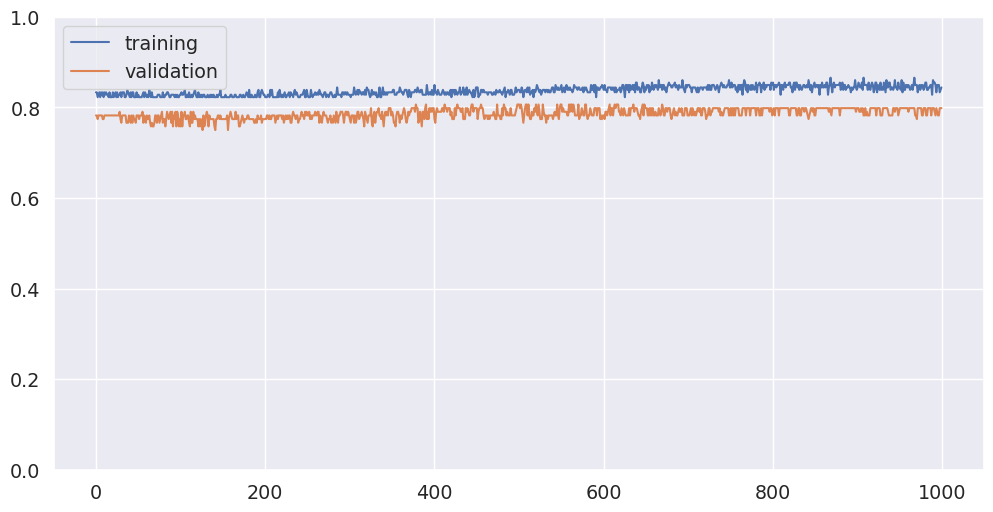

In [114]:
train_acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(train_acc, label="training")
plt.plot(val_acc, label="validation")
plt.ylim(0, 1)
plt.legend()

Puedo ademas guardar el mejor modelo usando ModelCheckpoint

In [115]:
mc = ModelCheckpoint('mejor_modelo.h5', monitor='val_acc', mode='max')

In [116]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping, mc],
)

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_49 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_50 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_51 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.1834 - accuracy: 0.6250

186/186 [==============================] - 0s 699us/step - loss: 1.7523 - accuracy: 0.7043 - val_loss: 2.1537 - val_accuracy: 0.6371


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4406 - accuracy: 0.5625

186/186 [==============================] - 0s 76us/step - loss: 1.6900 - accuracy: 0.7043 - val_loss: 2.0896 - val_accuracy: 0.6371


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.0713 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 1.6408 - accuracy: 0.7043 - val_loss: 2.0323 - val_accuracy: 0.6371


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5376 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 1.5961 - accuracy: 0.7043 - val_loss: 1.9787 - val_accuracy: 0.6371


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8313 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 1.5542 - accuracy: 0.7043 - val_loss: 1.9279 - val_accuracy: 0.6371


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4144 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 1.5138 - accuracy: 0.7043 - val_loss: 1.8771 - val_accuracy: 0.6371


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2721 - accuracy: 0.5625

186/186 [==============================] - 0s 67us/step - loss: 1.4751 - accuracy: 0.7043 - val_loss: 1.8316 - val_accuracy: 0.6371


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8250 - accuracy: 0.6250

/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


186/186 [==============================] - 0s 77us/step - loss: 1.4383 - accuracy: 0.7043 - val_loss: 1.7847 - val_accuracy: 0.6371


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0539 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 1.4011 - accuracy: 0.7043 - val_loss: 1.7395 - val_accuracy: 0.6371


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5955 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 1.3652 - accuracy: 0.7043 - val_loss: 1.6935 - val_accuracy: 0.6371


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5555 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 1.3294 - accuracy: 0.7043 - val_loss: 1.6500 - val_accuracy: 0.6371


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5280 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 1.2949 - accuracy: 0.7043 - val_loss: 1.6063 - val_accuracy: 0.6371


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3308 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 1.2611 - accuracy: 0.7043 - val_loss: 1.5644 - val_accuracy: 0.6371


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7706 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 1.2280 - accuracy: 0.7043 - val_loss: 1.5221 - val_accuracy: 0.6371


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0539 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 1.1951 - accuracy: 0.7043 - val_loss: 1.4811 - val_accuracy: 0.6371


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0490 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 1.1630 - accuracy: 0.7043 - val_loss: 1.4401 - val_accuracy: 0.6371


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7147 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 1.1311 - accuracy: 0.7043 - val_loss: 1.3993 - val_accuracy: 0.6371


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2861 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 1.1005 - accuracy: 0.7043 - val_loss: 1.3625 - val_accuracy: 0.6371


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1522 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 1.0715 - accuracy: 0.7043 - val_loss: 1.3255 - val_accuracy: 0.6371


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9320 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 1.0435 - accuracy: 0.7043 - val_loss: 1.2904 - val_accuracy: 0.6371


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4951 - accuracy: 0.5625

186/186 [==============================] - 0s 66us/step - loss: 1.0169 - accuracy: 0.7043 - val_loss: 1.2563 - val_accuracy: 0.6371


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7323 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.9898 - accuracy: 0.7043 - val_loss: 1.2208 - val_accuracy: 0.6371


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9586 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.9635 - accuracy: 0.7043 - val_loss: 1.1893 - val_accuracy: 0.6371


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5699 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.9397 - accuracy: 0.7043 - val_loss: 1.1582 - val_accuracy: 0.6371


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9538 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.9167 - accuracy: 0.7043 - val_loss: 1.1289 - val_accuracy: 0.6371


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1595 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.8944 - accuracy: 0.7043 - val_loss: 1.0992 - val_accuracy: 0.6371


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1632 - accuracy: 0.5938

186/186 [==============================] - 0s 77us/step - loss: 0.8728 - accuracy: 0.7043 - val_loss: 1.0714 - val_accuracy: 0.6371


Epoch 28/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8356 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.8516 - accuracy: 0.7043 - val_loss: 1.0436 - val_accuracy: 0.6371


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8572 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.8310 - accuracy: 0.7043 - val_loss: 1.0162 - val_accuracy: 0.6371


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5664 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.8109 - accuracy: 0.7043 - val_loss: 0.9903 - val_accuracy: 0.6371


Epoch 31/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.0774 - accuracy: 0.5938

186/186 [==============================] - 0s 92us/step - loss: 0.7930 - accuracy: 0.7043 - val_loss: 0.9681 - val_accuracy: 0.6371


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8573 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.7764 - accuracy: 0.7043 - val_loss: 0.9467 - val_accuracy: 0.6371


Epoch 33/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6766 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.7603 - accuracy: 0.7043 - val_loss: 0.9249 - val_accuracy: 0.6371


Epoch 34/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.9678 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.7455 - accuracy: 0.7043 - val_loss: 0.9065 - val_accuracy: 0.6371


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8459 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.7317 - accuracy: 0.7043 - val_loss: 0.8865 - val_accuracy: 0.6371


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7956 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.7183 - accuracy: 0.7043 - val_loss: 0.8697 - val_accuracy: 0.6371


Epoch 37/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7890 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.7067 - accuracy: 0.7043 - val_loss: 0.8540 - val_accuracy: 0.6371


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5283 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6961 - accuracy: 0.7043 - val_loss: 0.8380 - val_accuracy: 0.6371


Epoch 39/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8610 - accuracy: 0.6250

186/186 [==============================] - 0s 79us/step - loss: 0.6858 - accuracy: 0.7043 - val_loss: 0.8248 - val_accuracy: 0.6371


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9154 - accuracy: 0.5625

186/186 [==============================] - 0s 68us/step - loss: 0.6769 - accuracy: 0.7043 - val_loss: 0.8122 - val_accuracy: 0.6371


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5631 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6680 - accuracy: 0.7043 - val_loss: 0.7988 - val_accuracy: 0.6371


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8240 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.6598 - accuracy: 0.7043 - val_loss: 0.7870 - val_accuracy: 0.6371


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5871 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6524 - accuracy: 0.7043 - val_loss: 0.7768 - val_accuracy: 0.6371


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7087 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6455 - accuracy: 0.7043 - val_loss: 0.7663 - val_accuracy: 0.6371


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6460 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6387 - accuracy: 0.7043 - val_loss: 0.7561 - val_accuracy: 0.6371


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5721 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6327 - accuracy: 0.7043 - val_loss: 0.7476 - val_accuracy: 0.6371


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7539 - accuracy: 0.5938



186/186 [==============================] - 0s 71us/step - loss: 0.6280 - accuracy: 0.7043 - val_loss: 0.7403 - val_accuracy: 0.6371


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7221 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6232 - accuracy: 0.7043 - val_loss: 0.7331 - val_accuracy: 0.6371


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6402 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.6187 - accuracy: 0.7043 - val_loss: 0.7256 - val_accuracy: 0.6371


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6071 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6147 - accuracy: 0.7043 - val_loss: 0.7191 - val_accuracy: 0.6371


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5553 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.6107 - accuracy: 0.7043 - val_loss: 0.7134 - val_accuracy: 0.6371


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5285 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.6074 - accuracy: 0.7043 - val_loss: 0.7089 - val_accuracy: 0.6371


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7094 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6045 - accuracy: 0.7043 - val_loss: 0.7049 - val_accuracy: 0.6371


Epoch 54/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6200 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.6019 - accuracy: 0.7043 - val_loss: 0.7010 - val_accuracy: 0.6371


Epoch 55/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5035 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.5992 - accuracy: 0.7043 - val_loss: 0.6970 - val_accuracy: 0.6371


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5613 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5961 - accuracy: 0.7043 - val_loss: 0.6936 - val_accuracy: 0.6371


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6704 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.5936 - accuracy: 0.7043 - val_loss: 0.6912 - val_accuracy: 0.6371


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5169 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.5917 - accuracy: 0.7043 - val_loss: 0.6883 - val_accuracy: 0.6371


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6155 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.5894 - accuracy: 0.7043 - val_loss: 0.6858 - val_accuracy: 0.6371


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5949 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.5879 - accuracy: 0.7043 - val_loss: 0.6833 - val_accuracy: 0.6371


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6545 - accuracy: 0.6562

186/186 [==============================] - 0s 77us/step - loss: 0.5859 - accuracy: 0.7043 - val_loss: 0.6809 - val_accuracy: 0.6371


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5867 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.5840 - accuracy: 0.7043 - val_loss: 0.6787 - val_accuracy: 0.6371


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6959 - accuracy: 0.5625

186/186 [==============================] - 0s 68us/step - loss: 0.5825 - accuracy: 0.7043 - val_loss: 0.6771 - val_accuracy: 0.6371


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6165 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.5808 - accuracy: 0.7043 - val_loss: 0.6747 - val_accuracy: 0.6371


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5836 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5789 - accuracy: 0.7043 - val_loss: 0.6726 - val_accuracy: 0.6371


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5938 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.5777 - accuracy: 0.7043 - val_loss: 0.6707 - val_accuracy: 0.6371


Epoch 67/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5503 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.5756 - accuracy: 0.7043 - val_loss: 0.6685 - val_accuracy: 0.6371


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6478 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.5737 - accuracy: 0.7043 - val_loss: 0.6668 - val_accuracy: 0.6371


Epoch 69/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4626 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.5719 - accuracy: 0.7043 - val_loss: 0.6647 - val_accuracy: 0.6371


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5432 - accuracy: 0.7812

186/186 [==============================] - 0s 126us/step - loss: 0.5694 - accuracy: 0.7043 - val_loss: 0.6620 - val_accuracy: 0.6371


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6850 - accuracy: 0.5625

186/186 [==============================] - 0s 76us/step - loss: 0.5670 - accuracy: 0.7043 - val_loss: 0.6589 - val_accuracy: 0.6371


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5503 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5645 - accuracy: 0.7043 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6468 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.5619 - accuracy: 0.7043 - val_loss: 0.6523 - val_accuracy: 0.6371


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6587 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 0.5597 - accuracy: 0.7043 - val_loss: 0.6491 - val_accuracy: 0.6371


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5689 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.5568 - accuracy: 0.7043 - val_loss: 0.6458 - val_accuracy: 0.6371


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4899 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5542 - accuracy: 0.7043 - val_loss: 0.6438 - val_accuracy: 0.6371


Epoch 77/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4792 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5517 - accuracy: 0.7043 - val_loss: 0.6414 - val_accuracy: 0.6371


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.5497 - accuracy: 0.7043 - val_loss: 0.6385 - val_accuracy: 0.6371


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4838 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5471 - accuracy: 0.7043 - val_loss: 0.6357 - val_accuracy: 0.6371


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5315 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.5445 - accuracy: 0.7043 - val_loss: 0.6326 - val_accuracy: 0.6371


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4737 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5431 - accuracy: 0.7043 - val_loss: 0.6308 - val_accuracy: 0.6371


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5257 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5402 - accuracy: 0.7043 - val_loss: 0.6284 - val_accuracy: 0.6371


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5678 - accuracy: 0.6875

186/186 [==============================] - 0s 131us/step - loss: 0.5381 - accuracy: 0.7043 - val_loss: 0.6262 - val_accuracy: 0.6371


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5458 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5361 - accuracy: 0.7043 - val_loss: 0.6240 - val_accuracy: 0.6371


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5234 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5344 - accuracy: 0.7043 - val_loss: 0.6224 - val_accuracy: 0.6371


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4022 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.5326 - accuracy: 0.7043 - val_loss: 0.6203 - val_accuracy: 0.6371


Epoch 87/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6279 - accuracy: 0.5625

186/186 [==============================] - 0s 69us/step - loss: 0.5310 - accuracy: 0.7043 - val_loss: 0.6190 - val_accuracy: 0.6371


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5036 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5290 - accuracy: 0.7043 - val_loss: 0.6174 - val_accuracy: 0.6371


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5623 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5275 - accuracy: 0.7043 - val_loss: 0.6153 - val_accuracy: 0.6371


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4823 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.5260 - accuracy: 0.7043 - val_loss: 0.6134 - val_accuracy: 0.6371


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5242 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.5247 - accuracy: 0.7043 - val_loss: 0.6119 - val_accuracy: 0.6371


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5734 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.5230 - accuracy: 0.7043 - val_loss: 0.6106 - val_accuracy: 0.6371


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5055 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.5213 - accuracy: 0.7043 - val_loss: 0.6086 - val_accuracy: 0.6371


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5296 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5198 - accuracy: 0.7043 - val_loss: 0.6071 - val_accuracy: 0.6371


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5580 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.5184 - accuracy: 0.7043 - val_loss: 0.6055 - val_accuracy: 0.6371


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4671 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5169 - accuracy: 0.7043 - val_loss: 0.6044 - val_accuracy: 0.6371


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5535 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5150 - accuracy: 0.7043 - val_loss: 0.6029 - val_accuracy: 0.6371


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5768 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.5136 - accuracy: 0.7043 - val_loss: 0.6018 - val_accuracy: 0.6371


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5431 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.5120 - accuracy: 0.7043 - val_loss: 0.6003 - val_accuracy: 0.6371


Epoch 100/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4240 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.5105 - accuracy: 0.7043 - val_loss: 0.5989 - val_accuracy: 0.6371


Epoch 101/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5204 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.5086 - accuracy: 0.7043 - val_loss: 0.5973 - val_accuracy: 0.6371


Epoch 102/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4906 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.5069 - accuracy: 0.7043 - val_loss: 0.5954 - val_accuracy: 0.6371


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4985 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.5053 - accuracy: 0.7043 - val_loss: 0.5941 - val_accuracy: 0.6371


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4769 - accuracy: 0.7188

186/186 [==============================] - 0s 85us/step - loss: 0.5036 - accuracy: 0.7043 - val_loss: 0.5922 - val_accuracy: 0.6371


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4440 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.5023 - accuracy: 0.7043 - val_loss: 0.5904 - val_accuracy: 0.6371


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4860 - accuracy: 0.7188



186/186 [==============================] - 0s 67us/step - loss: 0.5006 - accuracy: 0.7043 - val_loss: 0.5888 - val_accuracy: 0.6371


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4493 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4997 - accuracy: 0.7043 - val_loss: 0.5877 - val_accuracy: 0.6371


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4260 - accuracy: 0.7500



186/186 [==============================] - 0s 71us/step - loss: 0.4979 - accuracy: 0.7043 - val_loss: 0.5864 - val_accuracy: 0.6371


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4619 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.4965 - accuracy: 0.7043 - val_loss: 0.5859 - val_accuracy: 0.6371


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4976 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.4953 - accuracy: 0.7043 - val_loss: 0.5847 - val_accuracy: 0.6371


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5417 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.4938 - accuracy: 0.7043 - val_loss: 0.5838 - val_accuracy: 0.6371


Epoch 112/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5060 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4924 - accuracy: 0.7043 - val_loss: 0.5816 - val_accuracy: 0.6371


Epoch 113/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5365 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4912 - accuracy: 0.7043 - val_loss: 0.5799 - val_accuracy: 0.6371


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4899 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4897 - accuracy: 0.7043 - val_loss: 0.5790 - val_accuracy: 0.6371


Epoch 115/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5659 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 0.4884 - accuracy: 0.7043 - val_loss: 0.5779 - val_accuracy: 0.6371


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4873 - accuracy: 0.7043 - val_loss: 0.5763 - val_accuracy: 0.6371


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5539 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4855 - accuracy: 0.7043 - val_loss: 0.5752 - val_accuracy: 0.6371


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3606 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4845 - accuracy: 0.7043 - val_loss: 0.5742 - val_accuracy: 0.6371


Epoch 119/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4341 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.4829 - accuracy: 0.7043 - val_loss: 0.5731 - val_accuracy: 0.6371


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4831 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4818 - accuracy: 0.7043 - val_loss: 0.5719 - val_accuracy: 0.6371


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5219 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4801 - accuracy: 0.7043 - val_loss: 0.5707 - val_accuracy: 0.6371


Epoch 122/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4529 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4790 - accuracy: 0.7043 - val_loss: 0.5691 - val_accuracy: 0.6371


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3896 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4777 - accuracy: 0.7043 - val_loss: 0.5676 - val_accuracy: 0.6371


Epoch 124/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4841 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4764 - accuracy: 0.7043 - val_loss: 0.5665 - val_accuracy: 0.6371


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4198 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4751 - accuracy: 0.7043 - val_loss: 0.5653 - val_accuracy: 0.6371


Epoch 126/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5313 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.4741 - accuracy: 0.7043 - val_loss: 0.5648 - val_accuracy: 0.6371


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4068 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4727 - accuracy: 0.7043 - val_loss: 0.5634 - val_accuracy: 0.6371


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4189 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4715 - accuracy: 0.7043 - val_loss: 0.5626 - val_accuracy: 0.6371


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4115 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.4701 - accuracy: 0.7043 - val_loss: 0.5607 - val_accuracy: 0.6371


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5139 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.4689 - accuracy: 0.7043 - val_loss: 0.5604 - val_accuracy: 0.6371


Epoch 131/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4373 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4683 - accuracy: 0.7043 - val_loss: 0.5588 - val_accuracy: 0.6371


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4748 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4668 - accuracy: 0.7043 - val_loss: 0.5575 - val_accuracy: 0.6371


Epoch 133/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4014 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4659 - accuracy: 0.7043 - val_loss: 0.5565 - val_accuracy: 0.6371


Epoch 134/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3791 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4647 - accuracy: 0.7043 - val_loss: 0.5547 - val_accuracy: 0.6371


Epoch 135/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5145 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4631 - accuracy: 0.7043 - val_loss: 0.5533 - val_accuracy: 0.6371


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3952 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4623 - accuracy: 0.7043 - val_loss: 0.5526 - val_accuracy: 0.6371


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4802 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4611 - accuracy: 0.7043 - val_loss: 0.5513 - val_accuracy: 0.6371


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5503 - accuracy: 0.5938

186/186 [==============================] - 0s 61us/step - loss: 0.4599 - accuracy: 0.7043 - val_loss: 0.5504 - val_accuracy: 0.6371


Epoch 139/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.4592 - accuracy: 0.7043 - val_loss: 0.5496 - val_accuracy: 0.6371


Epoch 140/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.4578 - accuracy: 0.7043 - val_loss: 0.5483 - val_accuracy: 0.6371


Epoch 141/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3899 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4564 - accuracy: 0.7043 - val_loss: 0.5479 - val_accuracy: 0.6371


Epoch 142/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4555 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4557 - accuracy: 0.7043 - val_loss: 0.5470 - val_accuracy: 0.6371


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4381 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4541 - accuracy: 0.7043 - val_loss: 0.5453 - val_accuracy: 0.6371


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5144 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.4534 - accuracy: 0.7043 - val_loss: 0.5439 - val_accuracy: 0.6371


Epoch 145/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4518 - accuracy: 0.7043 - val_loss: 0.5425 - val_accuracy: 0.6371


Epoch 146/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4995 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 0.4507 - accuracy: 0.7043 - val_loss: 0.5412 - val_accuracy: 0.6371


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5246 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.4499 - accuracy: 0.6989 - val_loss: 0.5401 - val_accuracy: 0.6290


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4533 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.4485 - accuracy: 0.6989 - val_loss: 0.5387 - val_accuracy: 0.6210


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3903 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4474 - accuracy: 0.7151 - val_loss: 0.5385 - val_accuracy: 0.6129


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4573 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4463 - accuracy: 0.7043 - val_loss: 0.5370 - val_accuracy: 0.5323


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4722 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.4454 - accuracy: 0.7151 - val_loss: 0.5361 - val_accuracy: 0.5484


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4065 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.4441 - accuracy: 0.7258 - val_loss: 0.5350 - val_accuracy: 0.5887


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5028 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4434 - accuracy: 0.7527 - val_loss: 0.5338 - val_accuracy: 0.6371


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5285 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4423 - accuracy: 0.7796 - val_loss: 0.5327 - val_accuracy: 0.6694


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3664 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4408 - accuracy: 0.7796 - val_loss: 0.5317 - val_accuracy: 0.6694


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4270 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4400 - accuracy: 0.7796 - val_loss: 0.5314 - val_accuracy: 0.6694


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4631 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4392 - accuracy: 0.7796 - val_loss: 0.5302 - val_accuracy: 0.6694


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4379 - accuracy: 0.7903 - val_loss: 0.5294 - val_accuracy: 0.6694


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4629 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4369 - accuracy: 0.7849 - val_loss: 0.5284 - val_accuracy: 0.6694


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4559 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4361 - accuracy: 0.7903 - val_loss: 0.5272 - val_accuracy: 0.6694


Epoch 161/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4352 - accuracy: 0.7903 - val_loss: 0.5261 - val_accuracy: 0.6774


Epoch 162/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4866 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4345 - accuracy: 0.7903 - val_loss: 0.5254 - val_accuracy: 0.6774


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4013 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4336 - accuracy: 0.7957 - val_loss: 0.5246 - val_accuracy: 0.6774


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4894 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.4326 - accuracy: 0.7957 - val_loss: 0.5243 - val_accuracy: 0.6774


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4618 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.4314 - accuracy: 0.7957 - val_loss: 0.5238 - val_accuracy: 0.6774


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4242 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.4307 - accuracy: 0.8011 - val_loss: 0.5227 - val_accuracy: 0.6855


Epoch 167/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4164 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4298 - accuracy: 0.8011 - val_loss: 0.5215 - val_accuracy: 0.6855


Epoch 168/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4462 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4289 - accuracy: 0.7957 - val_loss: 0.5208 - val_accuracy: 0.6855


Epoch 169/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5158 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4278 - accuracy: 0.7957 - val_loss: 0.5196 - val_accuracy: 0.6774


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4524 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4270 - accuracy: 0.7957 - val_loss: 0.5189 - val_accuracy: 0.6774


Epoch 171/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4707 - accuracy: 0.6562

186/186 [==============================] - 0s 78us/step - loss: 0.4260 - accuracy: 0.7957 - val_loss: 0.5180 - val_accuracy: 0.6774


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4564 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4251 - accuracy: 0.7957 - val_loss: 0.5172 - val_accuracy: 0.6774


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5038 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4240 - accuracy: 0.7957 - val_loss: 0.5168 - val_accuracy: 0.6774


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3708 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4230 - accuracy: 0.8011 - val_loss: 0.5165 - val_accuracy: 0.6855


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4952 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4222 - accuracy: 0.7957 - val_loss: 0.5158 - val_accuracy: 0.6774


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4357 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4212 - accuracy: 0.7957 - val_loss: 0.5148 - val_accuracy: 0.6855


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4206 - accuracy: 0.7957 - val_loss: 0.5140 - val_accuracy: 0.6855


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2996 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4194 - accuracy: 0.8011 - val_loss: 0.5130 - val_accuracy: 0.6855


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4187 - accuracy: 0.8011 - val_loss: 0.5127 - val_accuracy: 0.6855


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3998 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4177 - accuracy: 0.8011 - val_loss: 0.5122 - val_accuracy: 0.6855


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3488 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.4167 - accuracy: 0.8011 - val_loss: 0.5118 - val_accuracy: 0.6855


Epoch 182/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4687 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4157 - accuracy: 0.8011 - val_loss: 0.5110 - val_accuracy: 0.6855


Epoch 183/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4598 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.4148 - accuracy: 0.8065 - val_loss: 0.5100 - val_accuracy: 0.6774


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3352 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.4138 - accuracy: 0.7957 - val_loss: 0.5090 - val_accuracy: 0.6774


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4618 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.4131 - accuracy: 0.8011 - val_loss: 0.5088 - val_accuracy: 0.6774


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4997 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4119 - accuracy: 0.8065 - val_loss: 0.5084 - val_accuracy: 0.6774


Epoch 187/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3930 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.4111 - accuracy: 0.8011 - val_loss: 0.5074 - val_accuracy: 0.6774


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3160 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.4105 - accuracy: 0.8065 - val_loss: 0.5071 - val_accuracy: 0.6774


Epoch 189/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3927 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4094 - accuracy: 0.8065 - val_loss: 0.5069 - val_accuracy: 0.6774


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4088 - accuracy: 0.8065 - val_loss: 0.5061 - val_accuracy: 0.6855


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3658 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4081 - accuracy: 0.8065 - val_loss: 0.5049 - val_accuracy: 0.6855


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4212 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4072 - accuracy: 0.8118 - val_loss: 0.5040 - val_accuracy: 0.6855


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.4070 - accuracy: 0.8118 - val_loss: 0.5035 - val_accuracy: 0.6855


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3936 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.4057 - accuracy: 0.8011 - val_loss: 0.5031 - val_accuracy: 0.6855


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3899 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4052 - accuracy: 0.8011 - val_loss: 0.5027 - val_accuracy: 0.6855


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4088 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4041 - accuracy: 0.8118 - val_loss: 0.5028 - val_accuracy: 0.6855


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3850 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4036 - accuracy: 0.8065 - val_loss: 0.5025 - val_accuracy: 0.6855


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4801 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4030 - accuracy: 0.8065 - val_loss: 0.5019 - val_accuracy: 0.6855


Epoch 199/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.4031 - accuracy: 0.7957 - val_loss: 0.5009 - val_accuracy: 0.6774


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4823 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4018 - accuracy: 0.8065 - val_loss: 0.5005 - val_accuracy: 0.6774


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3896 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4016 - accuracy: 0.8065 - val_loss: 0.5003 - val_accuracy: 0.6774


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4451 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4003 - accuracy: 0.8172 - val_loss: 0.4997 - val_accuracy: 0.6774


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4378 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3997 - accuracy: 0.8118 - val_loss: 0.4998 - val_accuracy: 0.6774


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4247 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3990 - accuracy: 0.8118 - val_loss: 0.4994 - val_accuracy: 0.6774


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4466 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3986 - accuracy: 0.8011 - val_loss: 0.4990 - val_accuracy: 0.6774


Epoch 206/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4579 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3977 - accuracy: 0.8065 - val_loss: 0.4984 - val_accuracy: 0.6774


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4408 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3968 - accuracy: 0.8172 - val_loss: 0.4978 - val_accuracy: 0.6774


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5403 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3964 - accuracy: 0.8172 - val_loss: 0.4976 - val_accuracy: 0.6774


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3960 - accuracy: 0.8172 - val_loss: 0.4969 - val_accuracy: 0.6774


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3624 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3946 - accuracy: 0.8065 - val_loss: 0.4967 - val_accuracy: 0.6774


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3545 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3945 - accuracy: 0.8172 - val_loss: 0.4965 - val_accuracy: 0.6774


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3047 - accuracy: 0.9375

186/186 [==============================] - 0s 86us/step - loss: 0.3936 - accuracy: 0.8065 - val_loss: 0.4963 - val_accuracy: 0.6694


Epoch 213/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3809 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3928 - accuracy: 0.8011 - val_loss: 0.4970 - val_accuracy: 0.6694


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3820 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.3922 - accuracy: 0.8118 - val_loss: 0.4971 - val_accuracy: 0.6694


Epoch 215/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4640 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3915 - accuracy: 0.8118 - val_loss: 0.4972 - val_accuracy: 0.6694


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3847 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3914 - accuracy: 0.8118 - val_loss: 0.4964 - val_accuracy: 0.6694


Epoch 217/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3994 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3901 - accuracy: 0.8118 - val_loss: 0.4960 - val_accuracy: 0.6694


Epoch 218/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3898 - accuracy: 0.8226 - val_loss: 0.4957 - val_accuracy: 0.6694


Epoch 219/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4270 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3893 - accuracy: 0.8172 - val_loss: 0.4954 - val_accuracy: 0.6774


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3736 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3882 - accuracy: 0.8226 - val_loss: 0.4952 - val_accuracy: 0.6774


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3895 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3876 - accuracy: 0.8226 - val_loss: 0.4946 - val_accuracy: 0.6774


Epoch 222/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4150 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3875 - accuracy: 0.8172 - val_loss: 0.4944 - val_accuracy: 0.6774


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3867 - accuracy: 0.8172 - val_loss: 0.4940 - val_accuracy: 0.6774


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3862 - accuracy: 0.8226 - val_loss: 0.4936 - val_accuracy: 0.6774


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4840 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3853 - accuracy: 0.8226 - val_loss: 0.4935 - val_accuracy: 0.6774


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3679 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3846 - accuracy: 0.8172 - val_loss: 0.4932 - val_accuracy: 0.6774


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3793 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3843 - accuracy: 0.8280 - val_loss: 0.4928 - val_accuracy: 0.6774


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3401 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3836 - accuracy: 0.8172 - val_loss: 0.4925 - val_accuracy: 0.6774


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2544 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3828 - accuracy: 0.8226 - val_loss: 0.4921 - val_accuracy: 0.6774


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3821 - accuracy: 0.8226 - val_loss: 0.4916 - val_accuracy: 0.6774


Epoch 231/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3503 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3818 - accuracy: 0.8280 - val_loss: 0.4912 - val_accuracy: 0.6694


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3744 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3810 - accuracy: 0.8280 - val_loss: 0.4909 - val_accuracy: 0.6694


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3808 - accuracy: 0.8333 - val_loss: 0.4906 - val_accuracy: 0.6774


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3796 - accuracy: 0.8387 - val_loss: 0.4902 - val_accuracy: 0.6855


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4186 - accuracy: 0.8438



186/186 [==============================] - 0s 59us/step - loss: 0.3792 - accuracy: 0.8387 - val_loss: 0.4899 - val_accuracy: 0.6935


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3808 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3781 - accuracy: 0.8333 - val_loss: 0.4895 - val_accuracy: 0.7016


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4278 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3778 - accuracy: 0.8280 - val_loss: 0.4892 - val_accuracy: 0.7016


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3760 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3771 - accuracy: 0.8333 - val_loss: 0.4888 - val_accuracy: 0.7016


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3724 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3764 - accuracy: 0.8226 - val_loss: 0.4884 - val_accuracy: 0.7016


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4275 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3757 - accuracy: 0.8441 - val_loss: 0.4880 - val_accuracy: 0.7016


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4352 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3752 - accuracy: 0.8333 - val_loss: 0.4876 - val_accuracy: 0.7016


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3747 - accuracy: 0.8387 - val_loss: 0.4873 - val_accuracy: 0.7016


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4364 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3740 - accuracy: 0.8333 - val_loss: 0.4870 - val_accuracy: 0.7016


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5545 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3732 - accuracy: 0.8387 - val_loss: 0.4868 - val_accuracy: 0.7016


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4984 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3729 - accuracy: 0.8387 - val_loss: 0.4865 - val_accuracy: 0.7016


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3722 - accuracy: 0.8387 - val_loss: 0.4862 - val_accuracy: 0.7016


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3715 - accuracy: 0.8387 - val_loss: 0.4860 - val_accuracy: 0.7016


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4044 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3715 - accuracy: 0.8441 - val_loss: 0.4858 - val_accuracy: 0.7016


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3709 - accuracy: 0.8495 - val_loss: 0.4856 - val_accuracy: 0.7016


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3925 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3702 - accuracy: 0.8441 - val_loss: 0.4854 - val_accuracy: 0.7016


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3948 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3694 - accuracy: 0.8387 - val_loss: 0.4852 - val_accuracy: 0.7016


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2598 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3694 - accuracy: 0.8387 - val_loss: 0.4849 - val_accuracy: 0.6935


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3693 - accuracy: 0.8387 - val_loss: 0.4847 - val_accuracy: 0.6935


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2557 - accuracy: 0.9375

186/186 [==============================] - 0s 58us/step - loss: 0.3684 - accuracy: 0.8495 - val_loss: 0.4845 - val_accuracy: 0.6935


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3323 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3678 - accuracy: 0.8333 - val_loss: 0.4843 - val_accuracy: 0.6935


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3672 - accuracy: 0.8387 - val_loss: 0.4841 - val_accuracy: 0.7016


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4726 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3669 - accuracy: 0.8280 - val_loss: 0.4839 - val_accuracy: 0.6935


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5932 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3666 - accuracy: 0.8387 - val_loss: 0.4837 - val_accuracy: 0.6935


Epoch 259/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3006 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.3660 - accuracy: 0.8441 - val_loss: 0.4835 - val_accuracy: 0.7016


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3626 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3661 - accuracy: 0.8441 - val_loss: 0.4833 - val_accuracy: 0.7016


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3547 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3652 - accuracy: 0.8333 - val_loss: 0.4832 - val_accuracy: 0.7016


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3942 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.3653 - accuracy: 0.8280 - val_loss: 0.4830 - val_accuracy: 0.7016


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3878 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3642 - accuracy: 0.8387 - val_loss: 0.4828 - val_accuracy: 0.7016


Epoch 264/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3618 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3642 - accuracy: 0.8280 - val_loss: 0.4827 - val_accuracy: 0.7016


Epoch 265/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3635 - accuracy: 0.8226 - val_loss: 0.4825 - val_accuracy: 0.7016


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2564 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.3636 - accuracy: 0.8280 - val_loss: 0.4824 - val_accuracy: 0.7016


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3628 - accuracy: 0.8226 - val_loss: 0.4822 - val_accuracy: 0.7016


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3947 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3624 - accuracy: 0.8280 - val_loss: 0.4820 - val_accuracy: 0.7016


Epoch 269/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2997 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3621 - accuracy: 0.8280 - val_loss: 0.4819 - val_accuracy: 0.7016


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4320 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3617 - accuracy: 0.8226 - val_loss: 0.4817 - val_accuracy: 0.7016


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2751 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3616 - accuracy: 0.8226 - val_loss: 0.4815 - val_accuracy: 0.7016


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3663 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3613 - accuracy: 0.8280 - val_loss: 0.4814 - val_accuracy: 0.7016


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3005 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3608 - accuracy: 0.8172 - val_loss: 0.4812 - val_accuracy: 0.7016


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3602 - accuracy: 0.8226 - val_loss: 0.4811 - val_accuracy: 0.7016


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4108 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.3607 - accuracy: 0.8118 - val_loss: 0.4809 - val_accuracy: 0.7016


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3299 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3594 - accuracy: 0.8226 - val_loss: 0.4808 - val_accuracy: 0.7016


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3070 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3591 - accuracy: 0.8226 - val_loss: 0.4806 - val_accuracy: 0.7016


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3003 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3590 - accuracy: 0.8226 - val_loss: 0.4805 - val_accuracy: 0.7016


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4398 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3586 - accuracy: 0.8172 - val_loss: 0.4803 - val_accuracy: 0.7016


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3950 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3580 - accuracy: 0.8226 - val_loss: 0.4802 - val_accuracy: 0.7016


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3417 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3580 - accuracy: 0.8280 - val_loss: 0.4801 - val_accuracy: 0.7016


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3574 - accuracy: 0.8226 - val_loss: 0.4799 - val_accuracy: 0.7016


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3570 - accuracy: 0.8118 - val_loss: 0.4796 - val_accuracy: 0.7016


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3037 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3567 - accuracy: 0.8226 - val_loss: 0.4795 - val_accuracy: 0.7016


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3057 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3571 - accuracy: 0.8226 - val_loss: 0.4794 - val_accuracy: 0.7016


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3558 - accuracy: 0.8226 - val_loss: 0.4793 - val_accuracy: 0.7016


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3373 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3556 - accuracy: 0.8118 - val_loss: 0.4791 - val_accuracy: 0.7016


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3557 - accuracy: 0.8226 - val_loss: 0.4790 - val_accuracy: 0.7016


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3997 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3547 - accuracy: 0.8172 - val_loss: 0.4789 - val_accuracy: 0.7016


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3546 - accuracy: 0.8172 - val_loss: 0.4788 - val_accuracy: 0.7016


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4323 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3544 - accuracy: 0.8118 - val_loss: 0.4786 - val_accuracy: 0.7016


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3842 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3544 - accuracy: 0.8172 - val_loss: 0.4785 - val_accuracy: 0.7016


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2285 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3535 - accuracy: 0.8118 - val_loss: 0.4784 - val_accuracy: 0.7016


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3537 - accuracy: 0.8065 - val_loss: 0.4784 - val_accuracy: 0.7016


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2288 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3537 - accuracy: 0.8280 - val_loss: 0.4784 - val_accuracy: 0.7016


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3528 - accuracy: 0.8118 - val_loss: 0.4783 - val_accuracy: 0.7016


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3198 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3526 - accuracy: 0.8118 - val_loss: 0.4781 - val_accuracy: 0.7016


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4325 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3522 - accuracy: 0.8118 - val_loss: 0.4782 - val_accuracy: 0.7016


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3523 - accuracy: 0.8065 - val_loss: 0.4779 - val_accuracy: 0.7016


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4318 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3522 - accuracy: 0.8172 - val_loss: 0.4779 - val_accuracy: 0.7016


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2050 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3515 - accuracy: 0.8065 - val_loss: 0.4778 - val_accuracy: 0.7016


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3514 - accuracy: 0.8065 - val_loss: 0.4779 - val_accuracy: 0.7016


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.8125



186/186 [==============================] - 0s 68us/step - loss: 0.3513 - accuracy: 0.8011 - val_loss: 0.4778 - val_accuracy: 0.7016


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3901 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3512 - accuracy: 0.8011 - val_loss: 0.4777 - val_accuracy: 0.7016


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.9375

186/186 [==============================] - 0s 54us/step - loss: 0.3506 - accuracy: 0.8118 - val_loss: 0.4777 - val_accuracy: 0.7016


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3737 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3506 - accuracy: 0.8011 - val_loss: 0.4777 - val_accuracy: 0.7016


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2165 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3500 - accuracy: 0.8065 - val_loss: 0.4776 - val_accuracy: 0.7016


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3500 - accuracy: 0.8118 - val_loss: 0.4776 - val_accuracy: 0.7016


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4973 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.3498 - accuracy: 0.8065 - val_loss: 0.4776 - val_accuracy: 0.7016


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2745 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3496 - accuracy: 0.8065 - val_loss: 0.4775 - val_accuracy: 0.7016


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3104 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3499 - accuracy: 0.8065 - val_loss: 0.4773 - val_accuracy: 0.7016


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4016 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3489 - accuracy: 0.8065 - val_loss: 0.4772 - val_accuracy: 0.7016


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3502 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3488 - accuracy: 0.8065 - val_loss: 0.4772 - val_accuracy: 0.7016


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4188 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3485 - accuracy: 0.8065 - val_loss: 0.4772 - val_accuracy: 0.7016


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4069 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3485 - accuracy: 0.8065 - val_loss: 0.4773 - val_accuracy: 0.7016


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2662 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3483 - accuracy: 0.8011 - val_loss: 0.4771 - val_accuracy: 0.7016


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4160 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3479 - accuracy: 0.8065 - val_loss: 0.4771 - val_accuracy: 0.7016


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3481 - accuracy: 0.8065 - val_loss: 0.4769 - val_accuracy: 0.7016


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3777 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3479 - accuracy: 0.8065 - val_loss: 0.4769 - val_accuracy: 0.7016


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3477 - accuracy: 0.8065 - val_loss: 0.4769 - val_accuracy: 0.7016


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3471 - accuracy: 0.8011 - val_loss: 0.4768 - val_accuracy: 0.7016


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3470 - accuracy: 0.8065 - val_loss: 0.4767 - val_accuracy: 0.7016


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3473 - accuracy: 0.8011 - val_loss: 0.4766 - val_accuracy: 0.7016


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3139 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3470 - accuracy: 0.8065 - val_loss: 0.4766 - val_accuracy: 0.7016


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4585 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.3468 - accuracy: 0.8011 - val_loss: 0.4765 - val_accuracy: 0.7016


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3464 - accuracy: 0.8065 - val_loss: 0.4764 - val_accuracy: 0.7016


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1949 - accuracy: 0.9375

186/186 [==============================] - 0s 56us/step - loss: 0.3464 - accuracy: 0.8065 - val_loss: 0.4763 - val_accuracy: 0.7016


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3445 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3458 - accuracy: 0.8065 - val_loss: 0.4763 - val_accuracy: 0.7016


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3456 - accuracy: 0.8065 - val_loss: 0.4764 - val_accuracy: 0.7097


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4211 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3462 - accuracy: 0.8011 - val_loss: 0.4764 - val_accuracy: 0.7097


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2425 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3451 - accuracy: 0.8065 - val_loss: 0.4764 - val_accuracy: 0.7097


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3977 - accuracy: 0.8125



186/186 [==============================] - 0s 59us/step - loss: 0.3455 - accuracy: 0.8011 - val_loss: 0.4762 - val_accuracy: 0.7097


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3140 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3453 - accuracy: 0.8065 - val_loss: 0.4762 - val_accuracy: 0.7097


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3769 - accuracy: 0.7812



186/186 [==============================] - 0s 59us/step - loss: 0.3447 - accuracy: 0.8065 - val_loss: 0.4761 - val_accuracy: 0.7097


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3942 - accuracy: 0.7500

186/186 [==============================] - 0s 57us/step - loss: 0.3447 - accuracy: 0.8011 - val_loss: 0.4760 - val_accuracy: 0.7097


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2853 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3450 - accuracy: 0.8065 - val_loss: 0.4760 - val_accuracy: 0.7097


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2786 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3450 - accuracy: 0.8011 - val_loss: 0.4759 - val_accuracy: 0.7097


Epoch 338/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2461 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3444 - accuracy: 0.8065 - val_loss: 0.4758 - val_accuracy: 0.7097


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3443 - accuracy: 0.8065 - val_loss: 0.4759 - val_accuracy: 0.7097


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3841 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3443 - accuracy: 0.8065 - val_loss: 0.4760 - val_accuracy: 0.7097


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3438 - accuracy: 0.8011 - val_loss: 0.4760 - val_accuracy: 0.7097


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4049 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3435 - accuracy: 0.8011 - val_loss: 0.4758 - val_accuracy: 0.7097


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3440 - accuracy: 0.8011 - val_loss: 0.4758 - val_accuracy: 0.7097


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3431 - accuracy: 0.8011 - val_loss: 0.4758 - val_accuracy: 0.7097


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3550 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3436 - accuracy: 0.8065 - val_loss: 0.4757 - val_accuracy: 0.7097


Epoch 346/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3430 - accuracy: 0.8065 - val_loss: 0.4758 - val_accuracy: 0.7097


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3402 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3431 - accuracy: 0.8011 - val_loss: 0.4755 - val_accuracy: 0.7097


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3851 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3425 - accuracy: 0.8065 - val_loss: 0.4754 - val_accuracy: 0.7097


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4043 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3423 - accuracy: 0.8065 - val_loss: 0.4755 - val_accuracy: 0.7097


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3422 - accuracy: 0.8065 - val_loss: 0.4755 - val_accuracy: 0.7097


Epoch 351/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3424 - accuracy: 0.8011 - val_loss: 0.4754 - val_accuracy: 0.7097


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2969 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3418 - accuracy: 0.8065 - val_loss: 0.4752 - val_accuracy: 0.7097


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3570 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3420 - accuracy: 0.8118 - val_loss: 0.4751 - val_accuracy: 0.7097


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3014 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3414 - accuracy: 0.8011 - val_loss: 0.4751 - val_accuracy: 0.7097


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3418 - accuracy: 0.8065 - val_loss: 0.4752 - val_accuracy: 0.7097


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2125 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3425 - accuracy: 0.8011 - val_loss: 0.4755 - val_accuracy: 0.7097


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3551 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3412 - accuracy: 0.8065 - val_loss: 0.4751 - val_accuracy: 0.7097


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4737 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3415 - accuracy: 0.8065 - val_loss: 0.4748 - val_accuracy: 0.7097


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3210 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3411 - accuracy: 0.8065 - val_loss: 0.4747 - val_accuracy: 0.7097


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4382 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3407 - accuracy: 0.8065 - val_loss: 0.4747 - val_accuracy: 0.7097


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3841 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3406 - accuracy: 0.8065 - val_loss: 0.4744 - val_accuracy: 0.7097


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3406 - accuracy: 0.8065 - val_loss: 0.4745 - val_accuracy: 0.7097


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2943 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3412 - accuracy: 0.8011 - val_loss: 0.4745 - val_accuracy: 0.7097


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3786 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3406 - accuracy: 0.8065 - val_loss: 0.4743 - val_accuracy: 0.7097


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3401 - accuracy: 0.8065 - val_loss: 0.4744 - val_accuracy: 0.7097


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3398 - accuracy: 0.8065 - val_loss: 0.4741 - val_accuracy: 0.7097


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3400 - accuracy: 0.8065 - val_loss: 0.4741 - val_accuracy: 0.7097


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3397 - accuracy: 0.8118 - val_loss: 0.4737 - val_accuracy: 0.7097


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3174 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3407 - accuracy: 0.8065 - val_loss: 0.4735 - val_accuracy: 0.7097


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4450 - accuracy: 0.6875

186/186 [==============================] - 0s 60us/step - loss: 0.3394 - accuracy: 0.8065 - val_loss: 0.4733 - val_accuracy: 0.7097


Epoch 371/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3395 - accuracy: 0.8065 - val_loss: 0.4731 - val_accuracy: 0.7097


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3394 - accuracy: 0.8065 - val_loss: 0.4730 - val_accuracy: 0.7097


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3395 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3388 - accuracy: 0.8065 - val_loss: 0.4727 - val_accuracy: 0.7097


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3386 - accuracy: 0.8118 - val_loss: 0.4725 - val_accuracy: 0.7097


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2902 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3389 - accuracy: 0.8065 - val_loss: 0.4722 - val_accuracy: 0.7097


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3389 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3384 - accuracy: 0.8118 - val_loss: 0.4721 - val_accuracy: 0.7097


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2834 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3383 - accuracy: 0.8118 - val_loss: 0.4721 - val_accuracy: 0.7097


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2819 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3379 - accuracy: 0.8118 - val_loss: 0.4720 - val_accuracy: 0.7097


Epoch 379/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3824 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3374 - accuracy: 0.8118 - val_loss: 0.4720 - val_accuracy: 0.7097


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2745 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3378 - accuracy: 0.8118 - val_loss: 0.4719 - val_accuracy: 0.7097


Epoch 381/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3370 - accuracy: 0.8118 - val_loss: 0.4718 - val_accuracy: 0.7097


Epoch 382/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4105 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3373 - accuracy: 0.8118 - val_loss: 0.4718 - val_accuracy: 0.7097


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3869 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3371 - accuracy: 0.8118 - val_loss: 0.4718 - val_accuracy: 0.7097


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3365 - accuracy: 0.8118 - val_loss: 0.4716 - val_accuracy: 0.7097


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3492 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3366 - accuracy: 0.8118 - val_loss: 0.4714 - val_accuracy: 0.7097


Epoch 386/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3093 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3366 - accuracy: 0.8118 - val_loss: 0.4713 - val_accuracy: 0.7097


Epoch 387/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4265 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3360 - accuracy: 0.8118 - val_loss: 0.4712 - val_accuracy: 0.7097


Epoch 388/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3358 - accuracy: 0.8118 - val_loss: 0.4712 - val_accuracy: 0.7097


Epoch 389/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8438



186/186 [==============================] - 0s 64us/step - loss: 0.3356 - accuracy: 0.8118 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4455 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3360 - accuracy: 0.8172 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3110 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3352 - accuracy: 0.8118 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3352 - accuracy: 0.8118 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3197 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3351 - accuracy: 0.8118 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4408 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.3350 - accuracy: 0.8118 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3346 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4787 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3345 - accuracy: 0.8172 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2486 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3347 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3418 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3340 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3346 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3298 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3340 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2305 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3337 - accuracy: 0.8118 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3339 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3803 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3337 - accuracy: 0.8172 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3319 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3339 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3694 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3333 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3333 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 407/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3334 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 408/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3331 - accuracy: 0.8226 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3167 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3328 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3330 - accuracy: 0.8172 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3326 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3884 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3333 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2843 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3322 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3771 - accuracy: 0.7188

186/186 [==============================] - 0s 94us/step - loss: 0.3324 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3190 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3321 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 416/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4036 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3337 - accuracy: 0.8172 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2925 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3324 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2772 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3319 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3257 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3319 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 420/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3396 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3318 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2860 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3314 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2902 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3316 - accuracy: 0.8172 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3316 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3903 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.3311 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 425/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.7812

186/186 [==============================] - 0s 91us/step - loss: 0.3310 - accuracy: 0.8172 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4291 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3312 - accuracy: 0.8226 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3884 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3306 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4092 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3308 - accuracy: 0.8226 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3311 - accuracy: 0.8226 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3306 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3131 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3305 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5125 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3304 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4339 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3308 - accuracy: 0.8172 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4223 - accuracy: 0.8125

186/186 [==============================] - 0s 56us/step - loss: 0.3300 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2780 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3299 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3301 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2697 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3296 - accuracy: 0.8172 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2807 - accuracy: 0.8438

186/186 [==============================] - 0s 55us/step - loss: 0.3301 - accuracy: 0.8172 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3285 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3296 - accuracy: 0.8172 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3585 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3296 - accuracy: 0.8172 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3087 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3293 - accuracy: 0.8280 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8125



186/186 [==============================] - 0s 66us/step - loss: 0.3294 - accuracy: 0.8226 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3292 - accuracy: 0.8226 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4805 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3294 - accuracy: 0.8226 - val_loss: 0.4718 - val_accuracy: 0.7177


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3423 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3291 - accuracy: 0.8226 - val_loss: 0.4719 - val_accuracy: 0.7177


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3288 - accuracy: 0.8280 - val_loss: 0.4717 - val_accuracy: 0.7177


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3268 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3290 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3708 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3285 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4069 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3290 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 450/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3285 - accuracy: 0.8226 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3441 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3284 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2944 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3288 - accuracy: 0.8226 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3283 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3825 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3280 - accuracy: 0.8280 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2949 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3284 - accuracy: 0.8280 - val_loss: 0.4715 - val_accuracy: 0.7177


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4019 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3285 - accuracy: 0.8280 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2791 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3281 - accuracy: 0.8280 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 458/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3841 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3278 - accuracy: 0.8280 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3279 - accuracy: 0.8280 - val_loss: 0.4716 - val_accuracy: 0.7177


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3277 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4208 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3280 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3836 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3275 - accuracy: 0.8280 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2185 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3277 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2787 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3271 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3289 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3274 - accuracy: 0.8280 - val_loss: 0.4714 - val_accuracy: 0.7177


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3275 - accuracy: 0.8280 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3095 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3273 - accuracy: 0.8280 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4728 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3272 - accuracy: 0.8280 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3880 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3274 - accuracy: 0.8280 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3327 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3268 - accuracy: 0.8280 - val_loss: 0.4713 - val_accuracy: 0.7177


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3585 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3276 - accuracy: 0.8280 - val_loss: 0.4709 - val_accuracy: 0.7177


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3270 - accuracy: 0.8333 - val_loss: 0.4710 - val_accuracy: 0.7177


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3265 - accuracy: 0.8280 - val_loss: 0.4712 - val_accuracy: 0.7177


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4658 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3266 - accuracy: 0.8280 - val_loss: 0.4709 - val_accuracy: 0.7177


Epoch 475/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2909 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3270 - accuracy: 0.8280 - val_loss: 0.4707 - val_accuracy: 0.7177


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3267 - accuracy: 0.8280 - val_loss: 0.4706 - val_accuracy: 0.7177


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.3263 - accuracy: 0.8280 - val_loss: 0.4704 - val_accuracy: 0.7177


Epoch 478/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2774 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3267 - accuracy: 0.8280 - val_loss: 0.4705 - val_accuracy: 0.7177


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4823 - accuracy: 0.6250

186/186 [==============================] - 0s 55us/step - loss: 0.3266 - accuracy: 0.8280 - val_loss: 0.4706 - val_accuracy: 0.7177


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3119 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.3267 - accuracy: 0.8280 - val_loss: 0.4706 - val_accuracy: 0.7177


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3266 - accuracy: 0.8387 - val_loss: 0.4708 - val_accuracy: 0.7177


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3972 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3259 - accuracy: 0.8280 - val_loss: 0.4706 - val_accuracy: 0.7177


Epoch 483/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.8438



186/186 [==============================] - 0s 72us/step - loss: 0.3267 - accuracy: 0.8280 - val_loss: 0.4705 - val_accuracy: 0.7177


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3258 - accuracy: 0.8280 - val_loss: 0.4705 - val_accuracy: 0.7177


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.7812

186/186 [==============================] - 0s 118us/step - loss: 0.3259 - accuracy: 0.8280 - val_loss: 0.4706 - val_accuracy: 0.7177


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4314 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3257 - accuracy: 0.8280 - val_loss: 0.4701 - val_accuracy: 0.7177


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2729 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3261 - accuracy: 0.8280 - val_loss: 0.4701 - val_accuracy: 0.7177


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2852 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3264 - accuracy: 0.8280 - val_loss: 0.4699 - val_accuracy: 0.7177


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2981 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3268 - accuracy: 0.8333 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3548 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3253 - accuracy: 0.8280 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3253 - accuracy: 0.8333 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3257 - accuracy: 0.8387 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3262 - accuracy: 0.8280 - val_loss: 0.4698 - val_accuracy: 0.7177


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3246 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3252 - accuracy: 0.8333 - val_loss: 0.4697 - val_accuracy: 0.7177


Epoch 495/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3256 - accuracy: 0.8280 - val_loss: 0.4697 - val_accuracy: 0.7177


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3255 - accuracy: 0.8387 - val_loss: 0.4699 - val_accuracy: 0.7177


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2431 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3252 - accuracy: 0.8333 - val_loss: 0.4698 - val_accuracy: 0.7177


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3257 - accuracy: 0.8280 - val_loss: 0.4699 - val_accuracy: 0.7177


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5436 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3251 - accuracy: 0.8333 - val_loss: 0.4698 - val_accuracy: 0.7177


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3254 - accuracy: 0.8333 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3251 - accuracy: 0.8280 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3252 - accuracy: 0.8280 - val_loss: 0.4700 - val_accuracy: 0.7177


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3813 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3248 - accuracy: 0.8280 - val_loss: 0.4699 - val_accuracy: 0.7177


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3152 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3254 - accuracy: 0.8280 - val_loss: 0.4695 - val_accuracy: 0.7177


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3792 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3252 - accuracy: 0.8280 - val_loss: 0.4693 - val_accuracy: 0.7177


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4601 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3255 - accuracy: 0.8387 - val_loss: 0.4691 - val_accuracy: 0.7177


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3732 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3249 - accuracy: 0.8441 - val_loss: 0.4693 - val_accuracy: 0.7177


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3706 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3247 - accuracy: 0.8333 - val_loss: 0.4691 - val_accuracy: 0.7177


Epoch 509/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2473 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3244 - accuracy: 0.8387 - val_loss: 0.4690 - val_accuracy: 0.7177


Epoch 510/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3265 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3249 - accuracy: 0.8387 - val_loss: 0.4690 - val_accuracy: 0.7177


Epoch 511/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3244 - accuracy: 0.8387 - val_loss: 0.4690 - val_accuracy: 0.7177


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4348 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3241 - accuracy: 0.8387 - val_loss: 0.4690 - val_accuracy: 0.7177


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3244 - accuracy: 0.8387 - val_loss: 0.4688 - val_accuracy: 0.7177


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2665 - accuracy: 0.8750

186/186 [==============================] - 0s 56us/step - loss: 0.3239 - accuracy: 0.8387 - val_loss: 0.4690 - val_accuracy: 0.7177


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4981 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3242 - accuracy: 0.8333 - val_loss: 0.4691 - val_accuracy: 0.7177


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2244 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3243 - accuracy: 0.8333 - val_loss: 0.4688 - val_accuracy: 0.7177


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2627 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3242 - accuracy: 0.8387 - val_loss: 0.4688 - val_accuracy: 0.7177


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4373 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3244 - accuracy: 0.8441 - val_loss: 0.4684 - val_accuracy: 0.7177


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3241 - accuracy: 0.8333 - val_loss: 0.4683 - val_accuracy: 0.7177


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3723 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3239 - accuracy: 0.8441 - val_loss: 0.4682 - val_accuracy: 0.7177


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1785 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3240 - accuracy: 0.8387 - val_loss: 0.4683 - val_accuracy: 0.7177


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2373 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3244 - accuracy: 0.8441 - val_loss: 0.4683 - val_accuracy: 0.7177


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3240 - accuracy: 0.8333 - val_loss: 0.4686 - val_accuracy: 0.7177


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3235 - accuracy: 0.8387 - val_loss: 0.4685 - val_accuracy: 0.7177


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3467 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3233 - accuracy: 0.8387 - val_loss: 0.4685 - val_accuracy: 0.7177


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3365 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3237 - accuracy: 0.8387 - val_loss: 0.4683 - val_accuracy: 0.7177


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3240 - accuracy: 0.8387 - val_loss: 0.4683 - val_accuracy: 0.7177


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3234 - accuracy: 0.8441 - val_loss: 0.4684 - val_accuracy: 0.7177


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3229 - accuracy: 0.8387 - val_loss: 0.4684 - val_accuracy: 0.7177


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3235 - accuracy: 0.8387 - val_loss: 0.4681 - val_accuracy: 0.7177


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3303 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3233 - accuracy: 0.8387 - val_loss: 0.4680 - val_accuracy: 0.7177


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3382 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3232 - accuracy: 0.8441 - val_loss: 0.4682 - val_accuracy: 0.7177


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4223 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3235 - accuracy: 0.8441 - val_loss: 0.4681 - val_accuracy: 0.7177


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2675 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3231 - accuracy: 0.8387 - val_loss: 0.4679 - val_accuracy: 0.7177


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1770 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.3240 - accuracy: 0.8495 - val_loss: 0.4678 - val_accuracy: 0.7177


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3048 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3239 - accuracy: 0.8387 - val_loss: 0.4677 - val_accuracy: 0.7177


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3904 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3231 - accuracy: 0.8387 - val_loss: 0.4679 - val_accuracy: 0.7177


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2702 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3227 - accuracy: 0.8387 - val_loss: 0.4679 - val_accuracy: 0.7177


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4191 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3230 - accuracy: 0.8441 - val_loss: 0.4681 - val_accuracy: 0.7177


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1923 - accuracy: 0.9688

186/186 [==============================] - 0s 61us/step - loss: 0.3230 - accuracy: 0.8333 - val_loss: 0.4677 - val_accuracy: 0.7177


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2055 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3228 - accuracy: 0.8495 - val_loss: 0.4678 - val_accuracy: 0.7177


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3983 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3224 - accuracy: 0.8387 - val_loss: 0.4678 - val_accuracy: 0.7177


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2860 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3220 - accuracy: 0.8387 - val_loss: 0.4675 - val_accuracy: 0.7177


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3973 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.3222 - accuracy: 0.8387 - val_loss: 0.4675 - val_accuracy: 0.7177


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1778 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3224 - accuracy: 0.8387 - val_loss: 0.4672 - val_accuracy: 0.7177


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4468 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3230 - accuracy: 0.8387 - val_loss: 0.4671 - val_accuracy: 0.7177


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3220 - accuracy: 0.8387 - val_loss: 0.4666 - val_accuracy: 0.7177


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.8750

186/186 [==============================] - 0s 57us/step - loss: 0.3220 - accuracy: 0.8495 - val_loss: 0.4672 - val_accuracy: 0.7177


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3218 - accuracy: 0.8387 - val_loss: 0.4674 - val_accuracy: 0.7177


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3881 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3222 - accuracy: 0.8441 - val_loss: 0.4675 - val_accuracy: 0.7177


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3581 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3219 - accuracy: 0.8387 - val_loss: 0.4674 - val_accuracy: 0.7177


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2557 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3217 - accuracy: 0.8387 - val_loss: 0.4673 - val_accuracy: 0.7177


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2866 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3224 - accuracy: 0.8387 - val_loss: 0.4673 - val_accuracy: 0.7177


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3549 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3213 - accuracy: 0.8387 - val_loss: 0.4668 - val_accuracy: 0.7177


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3668 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3215 - accuracy: 0.8495 - val_loss: 0.4671 - val_accuracy: 0.7177


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2803 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3216 - accuracy: 0.8495 - val_loss: 0.4673 - val_accuracy: 0.7177


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3673 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3220 - accuracy: 0.8441 - val_loss: 0.4676 - val_accuracy: 0.7177


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3215 - accuracy: 0.8387 - val_loss: 0.4672 - val_accuracy: 0.7177


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2868 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3217 - accuracy: 0.8387 - val_loss: 0.4668 - val_accuracy: 0.7177


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2585 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3213 - accuracy: 0.8441 - val_loss: 0.4665 - val_accuracy: 0.7177


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4095 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3214 - accuracy: 0.8387 - val_loss: 0.4662 - val_accuracy: 0.7177


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2541 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3213 - accuracy: 0.8387 - val_loss: 0.4664 - val_accuracy: 0.7177


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2189 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3211 - accuracy: 0.8387 - val_loss: 0.4659 - val_accuracy: 0.7177


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3217 - accuracy: 0.8495 - val_loss: 0.4660 - val_accuracy: 0.7177


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1778 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3212 - accuracy: 0.8387 - val_loss: 0.4659 - val_accuracy: 0.7177


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3935 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3208 - accuracy: 0.8441 - val_loss: 0.4659 - val_accuracy: 0.7177


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3207 - accuracy: 0.8495 - val_loss: 0.4660 - val_accuracy: 0.7177


Epoch 568/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3220 - accuracy: 0.8441 - val_loss: 0.4657 - val_accuracy: 0.7177


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3206 - accuracy: 0.8387 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1912 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3212 - accuracy: 0.8441 - val_loss: 0.4658 - val_accuracy: 0.7177


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4467 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3207 - accuracy: 0.8495 - val_loss: 0.4659 - val_accuracy: 0.7177


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3205 - accuracy: 0.8387 - val_loss: 0.4660 - val_accuracy: 0.7177


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3209 - accuracy: 0.8495 - val_loss: 0.4663 - val_accuracy: 0.7177


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3203 - accuracy: 0.8495 - val_loss: 0.4662 - val_accuracy: 0.7177


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3264 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3201 - accuracy: 0.8441 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3203 - accuracy: 0.8441 - val_loss: 0.4655 - val_accuracy: 0.7177


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4180 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3207 - accuracy: 0.8495 - val_loss: 0.4655 - val_accuracy: 0.7177


Epoch 578/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2163 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3206 - accuracy: 0.8495 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 579/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3203 - accuracy: 0.8441 - val_loss: 0.4657 - val_accuracy: 0.7177


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3204 - accuracy: 0.8387 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3196 - accuracy: 0.8495 - val_loss: 0.4651 - val_accuracy: 0.7177


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3207 - accuracy: 0.8495 - val_loss: 0.4655 - val_accuracy: 0.7177


Epoch 583/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2498 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3201 - accuracy: 0.8387 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3616 - accuracy: 0.7500

186/186 [==============================] - 0s 55us/step - loss: 0.3196 - accuracy: 0.8495 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2820 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3197 - accuracy: 0.8441 - val_loss: 0.4657 - val_accuracy: 0.7177


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3131 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3199 - accuracy: 0.8495 - val_loss: 0.4654 - val_accuracy: 0.7177


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3910 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3195 - accuracy: 0.8495 - val_loss: 0.4651 - val_accuracy: 0.7177


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3001 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3197 - accuracy: 0.8495 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3200 - accuracy: 0.8441 - val_loss: 0.4650 - val_accuracy: 0.7177


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4286 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3189 - accuracy: 0.8441 - val_loss: 0.4647 - val_accuracy: 0.7177


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4146 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3199 - accuracy: 0.8495 - val_loss: 0.4644 - val_accuracy: 0.7177


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3191 - accuracy: 0.8495 - val_loss: 0.4650 - val_accuracy: 0.7177


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2888 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3194 - accuracy: 0.8387 - val_loss: 0.4646 - val_accuracy: 0.7177


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3393 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3195 - accuracy: 0.8495 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3786 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3189 - accuracy: 0.8441 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2323 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3186 - accuracy: 0.8495 - val_loss: 0.4653 - val_accuracy: 0.7177


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2951 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3192 - accuracy: 0.8441 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2699 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3190 - accuracy: 0.8387 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 599/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8750

186/186 [==============================] - 0s 95us/step - loss: 0.3186 - accuracy: 0.8441 - val_loss: 0.4651 - val_accuracy: 0.7177


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2208 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3184 - accuracy: 0.8441 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2686 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3185 - accuracy: 0.8441 - val_loss: 0.4649 - val_accuracy: 0.7177


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2972 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3198 - accuracy: 0.8495 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4262 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3182 - accuracy: 0.8548 - val_loss: 0.4649 - val_accuracy: 0.7177


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3182 - accuracy: 0.8495 - val_loss: 0.4650 - val_accuracy: 0.7177


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3182 - accuracy: 0.8441 - val_loss: 0.4651 - val_accuracy: 0.7177


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2986 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3181 - accuracy: 0.8441 - val_loss: 0.4653 - val_accuracy: 0.7177


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3181 - accuracy: 0.8495 - val_loss: 0.4657 - val_accuracy: 0.7177


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3183 - accuracy: 0.8441 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2901 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3178 - accuracy: 0.8441 - val_loss: 0.4653 - val_accuracy: 0.7177


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3671 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3180 - accuracy: 0.8548 - val_loss: 0.4657 - val_accuracy: 0.7177


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4680 - accuracy: 0.7812



186/186 [==============================] - 0s 67us/step - loss: 0.3176 - accuracy: 0.8441 - val_loss: 0.4655 - val_accuracy: 0.7177


Epoch 612/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4502 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3174 - accuracy: 0.8441 - val_loss: 0.4650 - val_accuracy: 0.7177


Epoch 613/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3362 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3184 - accuracy: 0.8495 - val_loss: 0.4649 - val_accuracy: 0.7177


Epoch 614/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2688 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3182 - accuracy: 0.8495 - val_loss: 0.4646 - val_accuracy: 0.7177


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3089 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3175 - accuracy: 0.8441 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3197 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3176 - accuracy: 0.8495 - val_loss: 0.4643 - val_accuracy: 0.7177


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4224 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3176 - accuracy: 0.8441 - val_loss: 0.4644 - val_accuracy: 0.7177


Epoch 618/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3059 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3178 - accuracy: 0.8441 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3171 - accuracy: 0.8441 - val_loss: 0.4643 - val_accuracy: 0.7177


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2848 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3175 - accuracy: 0.8548 - val_loss: 0.4642 - val_accuracy: 0.7177


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4201 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3171 - accuracy: 0.8441 - val_loss: 0.4640 - val_accuracy: 0.7177


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3088 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3172 - accuracy: 0.8495 - val_loss: 0.4642 - val_accuracy: 0.7177


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3299 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3165 - accuracy: 0.8441 - val_loss: 0.4643 - val_accuracy: 0.7177


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4734 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3170 - accuracy: 0.8548 - val_loss: 0.4651 - val_accuracy: 0.7177


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3173 - accuracy: 0.8441 - val_loss: 0.4654 - val_accuracy: 0.7177


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1149 - accuracy: 0.9688

186/186 [==============================] - 0s 84us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4649 - val_accuracy: 0.7177


Epoch 627/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3163 - accuracy: 0.8441 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 628/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4397 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 629/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4564 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4647 - val_accuracy: 0.7177


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3169 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3163 - accuracy: 0.8441 - val_loss: 0.4650 - val_accuracy: 0.7177


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3108 - accuracy: 0.9062

186/186 [==============================] - 0s 58us/step - loss: 0.3172 - accuracy: 0.8441 - val_loss: 0.4653 - val_accuracy: 0.7177


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3841 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3160 - accuracy: 0.8441 - val_loss: 0.4656 - val_accuracy: 0.7177


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2135 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3159 - accuracy: 0.8441 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3234 - accuracy: 0.9062

186/186 [==============================] - 0s 82us/step - loss: 0.3163 - accuracy: 0.8495 - val_loss: 0.4655 - val_accuracy: 0.7177


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1495 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3155 - accuracy: 0.8441 - val_loss: 0.4652 - val_accuracy: 0.7177


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2218 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3161 - accuracy: 0.8441 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3163 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3123 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3159 - accuracy: 0.8495 - val_loss: 0.4647 - val_accuracy: 0.7177


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3157 - accuracy: 0.8441 - val_loss: 0.4642 - val_accuracy: 0.7177


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3154 - accuracy: 0.8495 - val_loss: 0.4647 - val_accuracy: 0.7177


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3557 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3162 - accuracy: 0.8441 - val_loss: 0.4649 - val_accuracy: 0.7177


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3850 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3153 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3155 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3944 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3152 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3616 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3155 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7177


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3620 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3150 - accuracy: 0.8495 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3152 - accuracy: 0.8441 - val_loss: 0.4640 - val_accuracy: 0.7177


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2430 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3153 - accuracy: 0.8441 - val_loss: 0.4636 - val_accuracy: 0.7258


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3825 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3151 - accuracy: 0.8441 - val_loss: 0.4631 - val_accuracy: 0.7258


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3332 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3150 - accuracy: 0.8495 - val_loss: 0.4630 - val_accuracy: 0.7258


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3149 - accuracy: 0.8495 - val_loss: 0.4637 - val_accuracy: 0.7177


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3051 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3149 - accuracy: 0.8495 - val_loss: 0.4633 - val_accuracy: 0.7258


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3147 - accuracy: 0.8495 - val_loss: 0.4642 - val_accuracy: 0.7177


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3148 - accuracy: 0.8441 - val_loss: 0.4637 - val_accuracy: 0.7258


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3833 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3143 - accuracy: 0.8495 - val_loss: 0.4632 - val_accuracy: 0.7258


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3145 - accuracy: 0.8495 - val_loss: 0.4638 - val_accuracy: 0.7177


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3141 - accuracy: 0.8495 - val_loss: 0.4642 - val_accuracy: 0.7177


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2161 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3151 - accuracy: 0.8495 - val_loss: 0.4640 - val_accuracy: 0.7177


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4473 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3141 - accuracy: 0.8441 - val_loss: 0.4640 - val_accuracy: 0.7177


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2406 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3139 - accuracy: 0.8495 - val_loss: 0.4644 - val_accuracy: 0.7177


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3771 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3138 - accuracy: 0.8495 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3142 - accuracy: 0.8495 - val_loss: 0.4645 - val_accuracy: 0.7177


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3517 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3142 - accuracy: 0.8441 - val_loss: 0.4639 - val_accuracy: 0.7258


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2865 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3138 - accuracy: 0.8495 - val_loss: 0.4639 - val_accuracy: 0.7258


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3604 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3137 - accuracy: 0.8495 - val_loss: 0.4634 - val_accuracy: 0.7258


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4665 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3144 - accuracy: 0.8441 - val_loss: 0.4631 - val_accuracy: 0.7258


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2834 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3141 - accuracy: 0.8495 - val_loss: 0.4636 - val_accuracy: 0.7258


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3171 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3135 - accuracy: 0.8495 - val_loss: 0.4632 - val_accuracy: 0.7258


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4117 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3136 - accuracy: 0.8495 - val_loss: 0.4635 - val_accuracy: 0.7258


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4071 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3134 - accuracy: 0.8495 - val_loss: 0.4628 - val_accuracy: 0.7258


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2656 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3132 - accuracy: 0.8495 - val_loss: 0.4629 - val_accuracy: 0.7258


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4201 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3136 - accuracy: 0.8495 - val_loss: 0.4629 - val_accuracy: 0.7258


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3254 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3129 - accuracy: 0.8495 - val_loss: 0.4634 - val_accuracy: 0.7258


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2367 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3138 - accuracy: 0.8495 - val_loss: 0.4638 - val_accuracy: 0.7258


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3149 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3131 - accuracy: 0.8495 - val_loss: 0.4636 - val_accuracy: 0.7258


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1797 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3140 - accuracy: 0.8495 - val_loss: 0.4638 - val_accuracy: 0.7258


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3801 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3128 - accuracy: 0.8495 - val_loss: 0.4631 - val_accuracy: 0.7258


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2503 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3137 - accuracy: 0.8441 - val_loss: 0.4626 - val_accuracy: 0.7258


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3126 - accuracy: 0.8495 - val_loss: 0.4626 - val_accuracy: 0.7258


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3124 - accuracy: 0.8495 - val_loss: 0.4628 - val_accuracy: 0.7258


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3583 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3123 - accuracy: 0.8495 - val_loss: 0.4627 - val_accuracy: 0.7258


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3123 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3133 - accuracy: 0.8495 - val_loss: 0.4631 - val_accuracy: 0.7258


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2264 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3135 - accuracy: 0.8441 - val_loss: 0.4628 - val_accuracy: 0.7258


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3124 - accuracy: 0.8495 - val_loss: 0.4629 - val_accuracy: 0.7258


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2634 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3123 - accuracy: 0.8495 - val_loss: 0.4625 - val_accuracy: 0.7258


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3123 - accuracy: 0.8495 - val_loss: 0.4630 - val_accuracy: 0.7258


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3108 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3119 - accuracy: 0.8495 - val_loss: 0.4636 - val_accuracy: 0.7258


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3127 - accuracy: 0.8495 - val_loss: 0.4628 - val_accuracy: 0.7258


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3130 - accuracy: 0.8495 - val_loss: 0.4624 - val_accuracy: 0.7258


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2186 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3121 - accuracy: 0.8495 - val_loss: 0.4619 - val_accuracy: 0.7258


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3894 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3119 - accuracy: 0.8495 - val_loss: 0.4621 - val_accuracy: 0.7258


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4054 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3118 - accuracy: 0.8495 - val_loss: 0.4622 - val_accuracy: 0.7258


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3130 - accuracy: 0.8495 - val_loss: 0.4622 - val_accuracy: 0.7258


Epoch 695/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3898 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4624 - val_accuracy: 0.7258


Epoch 696/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4144 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3120 - accuracy: 0.8495 - val_loss: 0.4625 - val_accuracy: 0.7258


Epoch 697/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4616 - val_accuracy: 0.7258


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4200 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3118 - accuracy: 0.8495 - val_loss: 0.4611 - val_accuracy: 0.7258


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3329 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3119 - accuracy: 0.8495 - val_loss: 0.4617 - val_accuracy: 0.7258


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1828 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3118 - accuracy: 0.8495 - val_loss: 0.4620 - val_accuracy: 0.7258


Epoch 701/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3126 - accuracy: 0.8495 - val_loss: 0.4623 - val_accuracy: 0.7258


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4782 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3118 - accuracy: 0.8495 - val_loss: 0.4621 - val_accuracy: 0.7258


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3114 - accuracy: 0.8495 - val_loss: 0.4620 - val_accuracy: 0.7258


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2311 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3111 - accuracy: 0.8495 - val_loss: 0.4618 - val_accuracy: 0.7258


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4618 - val_accuracy: 0.7258


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3536 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4618 - val_accuracy: 0.7258


Epoch 707/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2408 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3114 - accuracy: 0.8495 - val_loss: 0.4621 - val_accuracy: 0.7258


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3498 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3111 - accuracy: 0.8495 - val_loss: 0.4627 - val_accuracy: 0.7258


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3933 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4618 - val_accuracy: 0.7258


Epoch 710/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3216 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3123 - accuracy: 0.8441 - val_loss: 0.4613 - val_accuracy: 0.7258


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2211 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4615 - val_accuracy: 0.7258


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2727 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3110 - accuracy: 0.8495 - val_loss: 0.4609 - val_accuracy: 0.7258


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2630 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3109 - accuracy: 0.8495 - val_loss: 0.4602 - val_accuracy: 0.7258


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1647 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3116 - accuracy: 0.8495 - val_loss: 0.4609 - val_accuracy: 0.7258


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3181 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4613 - val_accuracy: 0.7258


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4200 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3106 - accuracy: 0.8495 - val_loss: 0.4611 - val_accuracy: 0.7258


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4590 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4615 - val_accuracy: 0.7258


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2912 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3108 - accuracy: 0.8441 - val_loss: 0.4613 - val_accuracy: 0.7258


Epoch 719/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4118 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3112 - accuracy: 0.8495 - val_loss: 0.4610 - val_accuracy: 0.7258


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3843 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3115 - accuracy: 0.8495 - val_loss: 0.4613 - val_accuracy: 0.7258


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1666 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3102 - accuracy: 0.8495 - val_loss: 0.4610 - val_accuracy: 0.7258


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3102 - accuracy: 0.8495 - val_loss: 0.4605 - val_accuracy: 0.7258


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3105 - accuracy: 0.8495 - val_loss: 0.4600 - val_accuracy: 0.7258


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3418 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3102 - accuracy: 0.8495 - val_loss: 0.4597 - val_accuracy: 0.7258


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2799 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3102 - accuracy: 0.8495 - val_loss: 0.4600 - val_accuracy: 0.7258


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4679 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3104 - accuracy: 0.8495 - val_loss: 0.4602 - val_accuracy: 0.7258


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1481 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3103 - accuracy: 0.8495 - val_loss: 0.4605 - val_accuracy: 0.7258


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3707 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3099 - accuracy: 0.8495 - val_loss: 0.4603 - val_accuracy: 0.7258


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2597 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3098 - accuracy: 0.8495 - val_loss: 0.4600 - val_accuracy: 0.7258


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2522 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3099 - accuracy: 0.8495 - val_loss: 0.4605 - val_accuracy: 0.7258


Epoch 731/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3095 - accuracy: 0.8495 - val_loss: 0.4604 - val_accuracy: 0.7258


Epoch 732/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3096 - accuracy: 0.8495 - val_loss: 0.4601 - val_accuracy: 0.7258


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2386 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3097 - accuracy: 0.8495 - val_loss: 0.4596 - val_accuracy: 0.7258


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2997 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3095 - accuracy: 0.8495 - val_loss: 0.4589 - val_accuracy: 0.7258


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3093 - accuracy: 0.8495 - val_loss: 0.4590 - val_accuracy: 0.7258


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3094 - accuracy: 0.8495 - val_loss: 0.4603 - val_accuracy: 0.7258


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3099 - accuracy: 0.8495 - val_loss: 0.4606 - val_accuracy: 0.7258


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2311 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3095 - accuracy: 0.8495 - val_loss: 0.4596 - val_accuracy: 0.7258


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3019 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3093 - accuracy: 0.8441 - val_loss: 0.4589 - val_accuracy: 0.7258


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2388 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3096 - accuracy: 0.8495 - val_loss: 0.4593 - val_accuracy: 0.7258


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2490 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3097 - accuracy: 0.8495 - val_loss: 0.4586 - val_accuracy: 0.7258


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2330 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3099 - accuracy: 0.8495 - val_loss: 0.4589 - val_accuracy: 0.7258


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3096 - accuracy: 0.8495 - val_loss: 0.4591 - val_accuracy: 0.7258


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4501 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3088 - accuracy: 0.8495 - val_loss: 0.4583 - val_accuracy: 0.7258


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3098 - accuracy: 0.8441 - val_loss: 0.4582 - val_accuracy: 0.7258


Epoch 746/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4034 - accuracy: 0.7812

186/186 [==============================] - 0s 87us/step - loss: 0.3087 - accuracy: 0.8495 - val_loss: 0.4582 - val_accuracy: 0.7258


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3850 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3094 - accuracy: 0.8495 - val_loss: 0.4586 - val_accuracy: 0.7258


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3089 - accuracy: 0.8495 - val_loss: 0.4583 - val_accuracy: 0.7258


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4331 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3092 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2396 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3088 - accuracy: 0.8495 - val_loss: 0.4578 - val_accuracy: 0.7258


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3088 - accuracy: 0.8495 - val_loss: 0.4579 - val_accuracy: 0.7258


Epoch 752/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2364 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3090 - accuracy: 0.8495 - val_loss: 0.4577 - val_accuracy: 0.7258


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3661 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3087 - accuracy: 0.8495 - val_loss: 0.4584 - val_accuracy: 0.7258


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3084 - accuracy: 0.8495 - val_loss: 0.4581 - val_accuracy: 0.7258


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2713 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3089 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3541 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3082 - accuracy: 0.8495 - val_loss: 0.4579 - val_accuracy: 0.7258


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3086 - accuracy: 0.8495 - val_loss: 0.4579 - val_accuracy: 0.7258


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3085 - accuracy: 0.8495 - val_loss: 0.4582 - val_accuracy: 0.7258


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4998 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3093 - accuracy: 0.8441 - val_loss: 0.4581 - val_accuracy: 0.7258


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3088 - accuracy: 0.8441 - val_loss: 0.4572 - val_accuracy: 0.7258


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3086 - accuracy: 0.8495 - val_loss: 0.4575 - val_accuracy: 0.7258


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3080 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4770 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.3084 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 764/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2383 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3085 - accuracy: 0.8495 - val_loss: 0.4571 - val_accuracy: 0.7258


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3993 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3081 - accuracy: 0.8495 - val_loss: 0.4573 - val_accuracy: 0.7258


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2134 - accuracy: 0.9062



186/186 [==============================] - 0s 59us/step - loss: 0.3083 - accuracy: 0.8495 - val_loss: 0.4573 - val_accuracy: 0.7258


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3271 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3082 - accuracy: 0.8495 - val_loss: 0.4577 - val_accuracy: 0.7258


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3556 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3081 - accuracy: 0.8495 - val_loss: 0.4575 - val_accuracy: 0.7258


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3083 - accuracy: 0.8495 - val_loss: 0.4577 - val_accuracy: 0.7258


Epoch 771/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3077 - accuracy: 0.8495 - val_loss: 0.4580 - val_accuracy: 0.7258


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4569 - val_accuracy: 0.7258


Epoch 773/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3075 - accuracy: 0.8495 - val_loss: 0.4571 - val_accuracy: 0.7258


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2330 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3081 - accuracy: 0.8495 - val_loss: 0.4576 - val_accuracy: 0.7258


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3552 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3077 - accuracy: 0.8495 - val_loss: 0.4575 - val_accuracy: 0.7258


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2951 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3082 - accuracy: 0.8495 - val_loss: 0.4577 - val_accuracy: 0.7258


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2030 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.3076 - accuracy: 0.8495 - val_loss: 0.4579 - val_accuracy: 0.7258


Epoch 778/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3317 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4572 - val_accuracy: 0.7258


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2776 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3086 - accuracy: 0.8495 - val_loss: 0.4571 - val_accuracy: 0.7258


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3072 - accuracy: 0.8495 - val_loss: 0.4568 - val_accuracy: 0.7258


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4569 - val_accuracy: 0.7258


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2980 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3072 - accuracy: 0.8495 - val_loss: 0.4562 - val_accuracy: 0.7339


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3709 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4564 - val_accuracy: 0.7339


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3076 - accuracy: 0.8495 - val_loss: 0.4570 - val_accuracy: 0.7258


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4570 - val_accuracy: 0.7258


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3072 - accuracy: 0.8495 - val_loss: 0.4574 - val_accuracy: 0.7258


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2436 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3068 - accuracy: 0.8495 - val_loss: 0.4574 - val_accuracy: 0.7258


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3075 - accuracy: 0.8495 - val_loss: 0.4577 - val_accuracy: 0.7258


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2242 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3076 - accuracy: 0.8495 - val_loss: 0.4568 - val_accuracy: 0.7258


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3075 - accuracy: 0.8495 - val_loss: 0.4568 - val_accuracy: 0.7258


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4561 - val_accuracy: 0.7339


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3071 - accuracy: 0.8495 - val_loss: 0.4567 - val_accuracy: 0.7258


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4122 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3065 - accuracy: 0.8495 - val_loss: 0.4564 - val_accuracy: 0.7258


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4211 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3065 - accuracy: 0.8495 - val_loss: 0.4556 - val_accuracy: 0.7339


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4172 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3071 - accuracy: 0.8495 - val_loss: 0.4559 - val_accuracy: 0.7339


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4294 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3077 - accuracy: 0.8495 - val_loss: 0.4557 - val_accuracy: 0.7339


Epoch 797/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2660 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3064 - accuracy: 0.8495 - val_loss: 0.4558 - val_accuracy: 0.7339


Epoch 798/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4551 - val_accuracy: 0.7339


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2473 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3067 - accuracy: 0.8495 - val_loss: 0.4551 - val_accuracy: 0.7339


Epoch 800/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3188 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3066 - accuracy: 0.8495 - val_loss: 0.4554 - val_accuracy: 0.7339


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3067 - accuracy: 0.8495 - val_loss: 0.4554 - val_accuracy: 0.7339


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4033 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3065 - accuracy: 0.8495 - val_loss: 0.4560 - val_accuracy: 0.7339


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3259 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4557 - val_accuracy: 0.7339


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2404 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3066 - accuracy: 0.8495 - val_loss: 0.4554 - val_accuracy: 0.7339


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1934 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3063 - accuracy: 0.8495 - val_loss: 0.4547 - val_accuracy: 0.7339


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3716 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3066 - accuracy: 0.8495 - val_loss: 0.4549 - val_accuracy: 0.7339


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3484 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3068 - accuracy: 0.8495 - val_loss: 0.4540 - val_accuracy: 0.7339


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2271 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3062 - accuracy: 0.8495 - val_loss: 0.4547 - val_accuracy: 0.7339


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3956 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4552 - val_accuracy: 0.7339


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3067 - accuracy: 0.8495 - val_loss: 0.4545 - val_accuracy: 0.7339


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2044 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4544 - val_accuracy: 0.7339


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3067 - accuracy: 0.8495 - val_loss: 0.4542 - val_accuracy: 0.7339


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3150 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4542 - val_accuracy: 0.7339


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3363 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3059 - accuracy: 0.8495 - val_loss: 0.4552 - val_accuracy: 0.7339


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4369 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3069 - accuracy: 0.8495 - val_loss: 0.4550 - val_accuracy: 0.7339


Epoch 816/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4323 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3064 - accuracy: 0.8495 - val_loss: 0.4550 - val_accuracy: 0.7339


Epoch 817/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2687 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3056 - accuracy: 0.8495 - val_loss: 0.4546 - val_accuracy: 0.7339


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2809 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3061 - accuracy: 0.8495 - val_loss: 0.4553 - val_accuracy: 0.7339


Epoch 819/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8438



186/186 [==============================] - 0s 71us/step - loss: 0.3061 - accuracy: 0.8495 - val_loss: 0.4550 - val_accuracy: 0.7339


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3056 - accuracy: 0.8495 - val_loss: 0.4548 - val_accuracy: 0.7339


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4675 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3061 - accuracy: 0.8495 - val_loss: 0.4551 - val_accuracy: 0.7339


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4554 - val_accuracy: 0.7339


Epoch 823/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2890 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3055 - accuracy: 0.8495 - val_loss: 0.4554 - val_accuracy: 0.7339


Epoch 824/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3832 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.3052 - accuracy: 0.8495 - val_loss: 0.4550 - val_accuracy: 0.7339


Epoch 825/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3058 - accuracy: 0.8495 - val_loss: 0.4546 - val_accuracy: 0.7339


Epoch 826/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3064 - accuracy: 0.8495 - val_loss: 0.4549 - val_accuracy: 0.7339


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4059 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3056 - accuracy: 0.8495 - val_loss: 0.4542 - val_accuracy: 0.7339


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3389 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3056 - accuracy: 0.8495 - val_loss: 0.4544 - val_accuracy: 0.7339


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3054 - accuracy: 0.8495 - val_loss: 0.4551 - val_accuracy: 0.7339


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4469 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3058 - accuracy: 0.8495 - val_loss: 0.4551 - val_accuracy: 0.7339


Epoch 831/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3050 - accuracy: 0.8495 - val_loss: 0.4545 - val_accuracy: 0.7339


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2525 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3054 - accuracy: 0.8495 - val_loss: 0.4546 - val_accuracy: 0.7339


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3278 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3059 - accuracy: 0.8495 - val_loss: 0.4546 - val_accuracy: 0.7339


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3052 - accuracy: 0.8495 - val_loss: 0.4543 - val_accuracy: 0.7339


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2573 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3061 - accuracy: 0.8495 - val_loss: 0.4537 - val_accuracy: 0.7339


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2054 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3054 - accuracy: 0.8495 - val_loss: 0.4533 - val_accuracy: 0.7339


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3852 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3055 - accuracy: 0.8495 - val_loss: 0.4531 - val_accuracy: 0.7339


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5051 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3053 - accuracy: 0.8495 - val_loss: 0.4532 - val_accuracy: 0.7339


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4527 - val_accuracy: 0.7339


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4534 - val_accuracy: 0.7339


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2359 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4530 - val_accuracy: 0.7339


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4531 - val_accuracy: 0.7339


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2044 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4537 - val_accuracy: 0.7339


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3046 - accuracy: 0.8495 - val_loss: 0.4534 - val_accuracy: 0.7339


Epoch 845/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2170 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4538 - val_accuracy: 0.7339


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3761 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3043 - accuracy: 0.8495 - val_loss: 0.4538 - val_accuracy: 0.7339


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4270 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4541 - val_accuracy: 0.7339


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3050 - accuracy: 0.8495 - val_loss: 0.4544 - val_accuracy: 0.7339


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3732 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3045 - accuracy: 0.8495 - val_loss: 0.4539 - val_accuracy: 0.7339


Epoch 850/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3001 - accuracy: 0.8750

186/186 [==============================] - 0s 90us/step - loss: 0.3043 - accuracy: 0.8495 - val_loss: 0.4528 - val_accuracy: 0.7339


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3045 - accuracy: 0.8495 - val_loss: 0.4525 - val_accuracy: 0.7339


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2699 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3047 - accuracy: 0.8548 - val_loss: 0.4534 - val_accuracy: 0.7339


Epoch 853/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3990 - accuracy: 0.7812



186/186 [==============================] - 0s 69us/step - loss: 0.3042 - accuracy: 0.8495 - val_loss: 0.4526 - val_accuracy: 0.7339


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3017 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3043 - accuracy: 0.8495 - val_loss: 0.4526 - val_accuracy: 0.7339


Epoch 855/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3049 - accuracy: 0.8548 - val_loss: 0.4529 - val_accuracy: 0.7339


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2350 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4531 - val_accuracy: 0.7339


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2637 - accuracy: 0.8750



186/186 [==============================] - 0s 62us/step - loss: 0.3044 - accuracy: 0.8495 - val_loss: 0.4534 - val_accuracy: 0.7339


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4525 - val_accuracy: 0.7339


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4603 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3039 - accuracy: 0.8495 - val_loss: 0.4526 - val_accuracy: 0.7339


Epoch 860/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2577 - accuracy: 0.9062



186/186 [==============================] - 0s 68us/step - loss: 0.3042 - accuracy: 0.8495 - val_loss: 0.4520 - val_accuracy: 0.7339


Epoch 861/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4431 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3044 - accuracy: 0.8495 - val_loss: 0.4518 - val_accuracy: 0.7339


Epoch 862/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3555 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3042 - accuracy: 0.8495 - val_loss: 0.4512 - val_accuracy: 0.7339


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5053 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4511 - val_accuracy: 0.7339


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3940 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4510 - val_accuracy: 0.7339


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4210 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3044 - accuracy: 0.8495 - val_loss: 0.4515 - val_accuracy: 0.7339


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1824 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3054 - accuracy: 0.8495 - val_loss: 0.4511 - val_accuracy: 0.7339


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2492 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3040 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7339


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2401 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3036 - accuracy: 0.8495 - val_loss: 0.4511 - val_accuracy: 0.7339


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4722 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3036 - accuracy: 0.8495 - val_loss: 0.4511 - val_accuracy: 0.7339


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2509 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4510 - val_accuracy: 0.7339


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4417 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.3041 - accuracy: 0.8495 - val_loss: 0.4505 - val_accuracy: 0.7339


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3122 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3040 - accuracy: 0.8495 - val_loss: 0.4504 - val_accuracy: 0.7339


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3034 - accuracy: 0.8495 - val_loss: 0.4511 - val_accuracy: 0.7339


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4148 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3034 - accuracy: 0.8495 - val_loss: 0.4502 - val_accuracy: 0.7339


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3329 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3042 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7339


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2604 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3035 - accuracy: 0.8495 - val_loss: 0.4504 - val_accuracy: 0.7339


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2475 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.4505 - val_accuracy: 0.7339


Epoch 878/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3034 - accuracy: 0.8495 - val_loss: 0.4513 - val_accuracy: 0.7339


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3002 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3044 - accuracy: 0.8495 - val_loss: 0.4518 - val_accuracy: 0.7339


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3813 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3033 - accuracy: 0.8495 - val_loss: 0.4514 - val_accuracy: 0.7339


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3033 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7339


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3458 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3035 - accuracy: 0.8495 - val_loss: 0.4504 - val_accuracy: 0.7339


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2260 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3035 - accuracy: 0.8495 - val_loss: 0.4510 - val_accuracy: 0.7339


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3031 - accuracy: 0.8495 - val_loss: 0.4509 - val_accuracy: 0.7339


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3037 - accuracy: 0.8495 - val_loss: 0.4515 - val_accuracy: 0.7339


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2859 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3029 - accuracy: 0.8495 - val_loss: 0.4515 - val_accuracy: 0.7339


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2611 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.4517 - val_accuracy: 0.7339


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2613 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3028 - accuracy: 0.8495 - val_loss: 0.4515 - val_accuracy: 0.7339


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4018 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3030 - accuracy: 0.8495 - val_loss: 0.4514 - val_accuracy: 0.7339


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2893 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3025 - accuracy: 0.8495 - val_loss: 0.4503 - val_accuracy: 0.7339


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2787 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3031 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7339


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3859 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3029 - accuracy: 0.8495 - val_loss: 0.4496 - val_accuracy: 0.7339


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3089 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3025 - accuracy: 0.8495 - val_loss: 0.4501 - val_accuracy: 0.7339


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4752 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1872 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3029 - accuracy: 0.8548 - val_loss: 0.4505 - val_accuracy: 0.7339


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3025 - accuracy: 0.8495 - val_loss: 0.4501 - val_accuracy: 0.7339


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3026 - accuracy: 0.8495 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3029 - accuracy: 0.8495 - val_loss: 0.4496 - val_accuracy: 0.7419


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3029 - accuracy: 0.8495 - val_loss: 0.4500 - val_accuracy: 0.7339


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3027 - accuracy: 0.8495 - val_loss: 0.4502 - val_accuracy: 0.7339


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3339 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3022 - accuracy: 0.8495 - val_loss: 0.4496 - val_accuracy: 0.7419


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2974 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3021 - accuracy: 0.8495 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 904/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2272 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3020 - accuracy: 0.8495 - val_loss: 0.4509 - val_accuracy: 0.7339


Epoch 905/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2477 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3026 - accuracy: 0.8495 - val_loss: 0.4506 - val_accuracy: 0.7339


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3502 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.4500 - val_accuracy: 0.7339


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3021 - accuracy: 0.8495 - val_loss: 0.4490 - val_accuracy: 0.7419


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3022 - accuracy: 0.8495 - val_loss: 0.4497 - val_accuracy: 0.7419


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2468 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3016 - accuracy: 0.8495 - val_loss: 0.4499 - val_accuracy: 0.7419


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3021 - accuracy: 0.8495 - val_loss: 0.4491 - val_accuracy: 0.7419


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3022 - accuracy: 0.8548 - val_loss: 0.4498 - val_accuracy: 0.7419


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3023 - accuracy: 0.8495 - val_loss: 0.4499 - val_accuracy: 0.7419


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3019 - accuracy: 0.8495 - val_loss: 0.4499 - val_accuracy: 0.7419


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2409 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3019 - accuracy: 0.8495 - val_loss: 0.4488 - val_accuracy: 0.7419


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3017 - accuracy: 0.8495 - val_loss: 0.4497 - val_accuracy: 0.7419


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3018 - accuracy: 0.8495 - val_loss: 0.4500 - val_accuracy: 0.7419


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3016 - accuracy: 0.8495 - val_loss: 0.4504 - val_accuracy: 0.7339


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3017 - accuracy: 0.8495 - val_loss: 0.4505 - val_accuracy: 0.7339


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2214 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.4503 - val_accuracy: 0.7339


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2194 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.4495 - val_accuracy: 0.7419


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3834 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3020 - accuracy: 0.8495 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4115 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3019 - accuracy: 0.8495 - val_loss: 0.4493 - val_accuracy: 0.7419


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2959 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3016 - accuracy: 0.8495 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2910 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3013 - accuracy: 0.8495 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4887 - accuracy: 0.8125

186/186 [==============================] - 0s 94us/step - loss: 0.3016 - accuracy: 0.8495 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2499 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3017 - accuracy: 0.8495 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2242 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3018 - accuracy: 0.8495 - val_loss: 0.4487 - val_accuracy: 0.7419


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.4490 - val_accuracy: 0.7419


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2747 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3009 - accuracy: 0.8495 - val_loss: 0.4494 - val_accuracy: 0.7419


Epoch 930/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2034 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3009 - accuracy: 0.8495 - val_loss: 0.4496 - val_accuracy: 0.7419


Epoch 931/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4187 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.4483 - val_accuracy: 0.7419


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4241 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3013 - accuracy: 0.8495 - val_loss: 0.4480 - val_accuracy: 0.7419


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3664 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3005 - accuracy: 0.8495 - val_loss: 0.4474 - val_accuracy: 0.7419


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2657 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3012 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4120 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1817 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3007 - accuracy: 0.8495 - val_loss: 0.4469 - val_accuracy: 0.7419


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2951 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3007 - accuracy: 0.8548 - val_loss: 0.4475 - val_accuracy: 0.7419


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2339 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3006 - accuracy: 0.8495 - val_loss: 0.4477 - val_accuracy: 0.7419


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2563 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.4481 - val_accuracy: 0.7419


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3009 - accuracy: 0.8495 - val_loss: 0.4478 - val_accuracy: 0.7419


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2534 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.4485 - val_accuracy: 0.7419


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2127 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3006 - accuracy: 0.8495 - val_loss: 0.4482 - val_accuracy: 0.7419


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3002 - accuracy: 0.8495 - val_loss: 0.4472 - val_accuracy: 0.7419


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3009 - accuracy: 0.8495 - val_loss: 0.4466 - val_accuracy: 0.7419


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3332 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3001 - accuracy: 0.8495 - val_loss: 0.4474 - val_accuracy: 0.7419


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2058 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.4472 - val_accuracy: 0.7419


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3844 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3008 - accuracy: 0.8495 - val_loss: 0.4457 - val_accuracy: 0.7419


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3726 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.4464 - val_accuracy: 0.7419


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2868 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3002 - accuracy: 0.8495 - val_loss: 0.4475 - val_accuracy: 0.7419


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2999 - accuracy: 0.8495 - val_loss: 0.4474 - val_accuracy: 0.7419


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2392 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.4466 - val_accuracy: 0.7419


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1919 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3006 - accuracy: 0.8548 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1672 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3003 - accuracy: 0.8495 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3249 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3002 - accuracy: 0.8495 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 955/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3653 - accuracy: 0.8125

186/186 [==============================] - 0s 85us/step - loss: 0.3001 - accuracy: 0.8495 - val_loss: 0.4457 - val_accuracy: 0.7419


Epoch 956/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2774 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2433 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2303 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2994 - accuracy: 0.8495 - val_loss: 0.4457 - val_accuracy: 0.7419


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2445 - accuracy: 0.9688

186/186 [==============================] - 0s 59us/step - loss: 0.3008 - accuracy: 0.8495 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4464 - val_accuracy: 0.7419


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2652 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2998 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2623 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3001 - accuracy: 0.8495 - val_loss: 0.4458 - val_accuracy: 0.7419


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3110 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.4455 - val_accuracy: 0.7419


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2995 - accuracy: 0.8495 - val_loss: 0.4455 - val_accuracy: 0.7419


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4455 - val_accuracy: 0.7419


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3806 - accuracy: 0.8438

186/186 [==============================] - 0s 111us/step - loss: 0.2995 - accuracy: 0.8495 - val_loss: 0.4449 - val_accuracy: 0.7419


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2897 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4452 - val_accuracy: 0.7419


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2261 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2995 - accuracy: 0.8495 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3000 - accuracy: 0.8495 - val_loss: 0.4471 - val_accuracy: 0.7419


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3494 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3005 - accuracy: 0.8495 - val_loss: 0.4469 - val_accuracy: 0.7419


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2995 - accuracy: 0.8495 - val_loss: 0.4469 - val_accuracy: 0.7419


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5069 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4463 - val_accuracy: 0.7419


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2119 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2991 - accuracy: 0.8495 - val_loss: 0.4461 - val_accuracy: 0.7419


Epoch 975/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3531 - accuracy: 0.7812

186/186 [==============================] - 0s 92us/step - loss: 0.2994 - accuracy: 0.8495 - val_loss: 0.4475 - val_accuracy: 0.7419


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4936 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2628 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2989 - accuracy: 0.8495 - val_loss: 0.4460 - val_accuracy: 0.7419


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2255 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2989 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 979/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2822 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4449 - val_accuracy: 0.7419


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.2991 - accuracy: 0.8495 - val_loss: 0.4447 - val_accuracy: 0.7419


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2090 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2271 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3084 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3000 - accuracy: 0.8495 - val_loss: 0.4461 - val_accuracy: 0.7419


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3978 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4461 - val_accuracy: 0.7419


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2096 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2988 - accuracy: 0.8495 - val_loss: 0.4456 - val_accuracy: 0.7419


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4461 - val_accuracy: 0.7419


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2768 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4449 - val_accuracy: 0.7419


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4063 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2988 - accuracy: 0.8495 - val_loss: 0.4459 - val_accuracy: 0.7419


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2434 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4452 - val_accuracy: 0.7419


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8750



186/186 [==============================] - 0s 64us/step - loss: 0.2985 - accuracy: 0.8495 - val_loss: 0.4455 - val_accuracy: 0.7419


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1727 - accuracy: 0.9688

186/186 [==============================] - 0s 62us/step - loss: 0.2996 - accuracy: 0.8495 - val_loss: 0.4451 - val_accuracy: 0.7419


Epoch 992/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3083 - accuracy: 0.8438



186/186 [==============================] - 0s 66us/step - loss: 0.2984 - accuracy: 0.8495 - val_loss: 0.4439 - val_accuracy: 0.7500


Epoch 993/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2746 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2991 - accuracy: 0.8495 - val_loss: 0.4451 - val_accuracy: 0.7419


Epoch 994/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2988 - accuracy: 0.8495 - val_loss: 0.4454 - val_accuracy: 0.7419


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4456 - val_accuracy: 0.7419


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1818 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2982 - accuracy: 0.8495 - val_loss: 0.4462 - val_accuracy: 0.7419


Epoch 997/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2451 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2985 - accuracy: 0.8495 - val_loss: 0.4465 - val_accuracy: 0.7419


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2988 - accuracy: 0.8495 - val_loss: 0.4468 - val_accuracy: 0.7419


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3147 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2982 - accuracy: 0.8495 - val_loss: 0.4468 - val_accuracy: 0.7419


Epoch 1000/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2992 - accuracy: 0.8495 - val_loss: 0.4454 - val_accuracy: 0.7419


# Puntos clave

- usar activación de tipo "linear" como capa final en regresión y "softmax" en clasificación
- Para mayor cantidad de neuronas y capas -> métodos de regularización:
    - Dropout
    - Regularización l2, l1, l1-l2
    - Early stopping
- Es recomendable usar activaciones de tipo relu para redes profundas
- No siempre los optimizadores más sofisticados funcionan mejor: tengo más parámetros de los cuales muchos les dejo el valor por default, a veces es mejor tener un método simple como SGD e ir controlando el learning rate
- Navaja de occam: ir de pocas neuronas y pocas capas a modelos más complejos(más cosas pueden fallar en el  entrenamiento)
- No es simple el diagnóstico a partir de la curva de aprendizaje, se va adquiriendo un poco con la práctica.